In [1]:
!pip install -r ../../requirements.txt

You should consider upgrading via the 'c:\users\falchetto\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


# Configuration

In [2]:
ROOT_DIR = "../../"
DATA_DIR = ROOT_DIR + "data/"

DATASET_2016_10a_FILENAME = DATA_DIR + "RML2016.10a_dict.pkl"

NN_NAME = 'FreeHandV1'

DEFAULT_CONFIG_FILENAME = ROOT_DIR + "default.ini"

In [3]:
import configparser

config = configparser.ConfigParser()
config.read(DEFAULT_CONFIG_FILENAME)

NEURAL_NETWORK_NAME = config.get('NeuralNetworkNames', NN_NAME)
NEURAL_NETWORK_FILENAME = NEURAL_NETWORK_NAME + '.wts.h5'

TRAINING_SET_DIMENSION = config.getfloat('TrainingValues', 'TrainingSetSplitPercentage')
DROPOUT_RATE = config.getfloat('TrainingValues', 'DropoutRate')

# Set up some params 
NB_EPOCH = config.getint('TrainingValues', 'Epochs') # number of epochs to train on
BATCH_SIZE = config.getint('TrainingValues', 'BatchSize') # training batch size

# Imports

In [4]:
import sys
sys.path.append(ROOT_DIR)

import neural_networks
import datasetlib
import traintestsplitlib
import trainlib
import evaluationlib
import dataaugmentationlib

import math

# Dataset

## Dataset in a pandas Dataframe

In [5]:
dataset_df = datasetlib.load_dataset_dataframe(DATASET_2016_10a_FILENAME)

## Raw dataset

In [6]:
dataset_df

,IQ signals,Modulation_Label,SNR
0,"[[-0.0059014712, -0.0023458179, -0.00074506126...",QPSK,2
1,"[[0.0050326153, 0.00094379985, -0.0018932355, ...",QPSK,2
2,"[[0.0052390713, 0.0073890695, 0.007276459, 0.0...",QPSK,2
3,"[[-0.0019859935, -0.0071501383, -0.00527185, -...",QPSK,2
4,"[[0.006674405, 0.0028359746, 0.005630027, 0.00...",QPSK,2
...,...,...,...
219995,"[[0.0062732296, -0.0050519477, 0.006672171, 0....",BPSK,-18
219996,"[[-0.003903181, -0.0015884301, -0.00633375, 2....",BPSK,-18
219997,"[[-0.0105958255, 0.005601244, -0.012161784, 0....",BPSK,-18
219998,"[[-0.002136606, 0.00995837, 0.0059440527, -0.0...",BPSK,-18


# Neural network

## Configuration

In [7]:
config = configparser.ConfigParser()
config.read(DEFAULT_CONFIG_FILENAME)

NEURAL_NETWORK_NAME = config.get('NeuralNetworkNames', NN_NAME)
NEURAL_NETWORK_FILENAME = NEURAL_NETWORK_NAME + '.wts.h5'

TRAINING_SET_DIMENSION = config.getfloat('TrainingValues', 'TrainingSetSplitPercentage')
DROPOUT_RATE = config.getfloat('TrainingValues', 'DropoutRate')

# Set up some params 
NB_EPOCH = config.getint('TrainingValues', 'Epochs') # number of epochs to train on
BATCH_SIZE = config.getint('TrainingValues', 'BatchSize') # training batch size

THETA = math.pi/2
STANDARD_DEVIATION = 0.0005

## Data prepare

In [8]:
signals = datasetlib.signals(dataset_df)
labels = datasetlib.labels(dataset_df)

# [QPSQ, BPSK, ...]
mods = datasetlib.mods(dataset_df)
# [-18, -16, ...]
snrs = datasetlib.unique_snrs(dataset_df)

### Training and Test data partitioning

In [9]:
n_elements = len(signals)
training_set_percentage = TRAINING_SET_DIMENSION

train_index, test_index = traintestsplitlib.train_test_random_indexes(n_elements, training_set_percentage)

X_train, X_test, Y_train, Y_test = traintestsplitlib.split_x_y_train_test(signals, labels, mods, train_index, test_index)

X_train, Y_train = dataaugmentationlib.rotate_flip_add_gaussian_noise_and_concatenate_with_signals(X_train, Y_train)

## Build the Neural Network

In [10]:
in_shp = list(X_train.shape[1:])
print(X_train.shape)
print(in_shp)
classes = mods

(1485000, 2, 128)
[2, 128]


In [11]:
model = neural_networks.freehand_v1(in_shp)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 2, 128)]          0         
_________________________________________________________________
reshape (Reshape)            (None, 2, 128, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 2, 128, 16)        80        
_________________________________________________________________
dense (Dense)                (None, 2, 128, 256)       4352      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 2, 128, 16)        16400     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 1, 64, 16)         0         
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0     

### Train the model

In [12]:
# perform training ...
#   - call the main training loop in keras for our network+dataset
filepath = NEURAL_NETWORK_FILENAME

history, model = trainlib.train(filepath, model, X_train, Y_train, X_test, Y_test, BATCH_SIZE, NB_EPOCH)

Epoch 1/100


   1/1306 [..............................] - ETA: 4:29:57 - loss: 2.3979

   2/1306 [..............................] - ETA: 1:14 - loss: 2.3979   

   3/1306 [..............................] - ETA: 1:14 - loss: 2.3979

   4/1306 [..............................] - ETA: 1:14 - loss: 2.3979

   5/1306 [..............................] - ETA: 1:14 - loss: 2.3979

   6/1306 [..............................] - ETA: 1:13 - loss: 2.3979

   7/1306 [..............................] - ETA: 1:13 - loss: 2.3980

   8/1306 [..............................] - ETA: 1:13 - loss: 2.3980

   9/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  10/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  11/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  12/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  13/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  14/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  15/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  16/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  17/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  18/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  19/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  20/1306 [..............................] - ETA: 1:13 - loss: 2.3980

  21/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  22/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  23/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  24/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  25/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  26/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  27/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  28/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  29/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  30/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  31/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  32/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  33/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  34/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  35/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  36/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  37/1306 [..............................] - ETA: 1:12 - loss: 2.3980

  38/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  39/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  40/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  41/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  42/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  43/1306 [..............................] - ETA: 1:11 - loss: 2.3980

  44/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  45/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  46/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  47/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  48/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  49/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  50/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  51/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  52/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  53/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  54/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  55/1306 [>.............................] - ETA: 1:11 - loss: 2.3980

  56/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  57/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  58/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  59/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  60/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  61/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  62/1306 [>.............................] - ETA: 1:10 - loss: 2.3980

  63/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  64/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  65/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  66/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  67/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  68/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  69/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  70/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  71/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  72/1306 [>.............................] - ETA: 1:10 - loss: 2.3979

  73/1306 [>.............................] - ETA: 1:09 - loss: 2.3978

  74/1306 [>.............................] - ETA: 1:09 - loss: 2.3978

  75/1306 [>.............................] - ETA: 1:09 - loss: 2.3978

  76/1306 [>.............................] - ETA: 1:09 - loss: 2.3978

  77/1306 [>.............................] - ETA: 1:09 - loss: 2.3978

  78/1306 [>.............................] - ETA: 1:09 - loss: 2.3977

  79/1306 [>.............................] - ETA: 1:09 - loss: 2.3977

  80/1306 [>.............................] - ETA: 1:09 - loss: 2.3977

  81/1306 [>.............................] - ETA: 1:09 - loss: 2.3976

  82/1306 [>.............................] - ETA: 1:09 - loss: 2.3976

  83/1306 [>.............................] - ETA: 1:09 - loss: 2.3976

  84/1306 [>.............................] - ETA: 1:09 - loss: 2.3975

  85/1306 [>.............................] - ETA: 1:09 - loss: 2.3975

  86/1306 [>.............................] - ETA: 1:09 - loss: 2.3974

  87/1306 [>.............................] - ETA: 1:09 - loss: 2.3974

  88/1306 [=>............................] - ETA: 1:09 - loss: 2.3973

  89/1306 [=>............................] - ETA: 1:09 - loss: 2.3973

  90/1306 [=>............................] - ETA: 1:09 - loss: 2.3972

  91/1306 [=>............................] - ETA: 1:08 - loss: 2.3971

  92/1306 [=>............................] - ETA: 1:08 - loss: 2.3971

  93/1306 [=>............................] - ETA: 1:08 - loss: 2.3970

  94/1306 [=>............................] - ETA: 1:08 - loss: 2.3969

  95/1306 [=>............................] - ETA: 1:08 - loss: 2.3968

  96/1306 [=>............................] - ETA: 1:08 - loss: 2.3968

  97/1306 [=>............................] - ETA: 1:08 - loss: 2.3967

  98/1306 [=>............................] - ETA: 1:08 - loss: 2.3966

  99/1306 [=>............................] - ETA: 1:08 - loss: 2.3965

 100/1306 [=>............................] - ETA: 1:08 - loss: 2.3964

 101/1306 [=>............................] - ETA: 1:08 - loss: 2.3963

 102/1306 [=>............................] - ETA: 1:08 - loss: 2.3962

 103/1306 [=>............................] - ETA: 1:08 - loss: 2.3961

 104/1306 [=>............................] - ETA: 1:08 - loss: 2.3960

 105/1306 [=>............................] - ETA: 1:08 - loss: 2.3959

 106/1306 [=>............................] - ETA: 1:08 - loss: 2.3958

 107/1306 [=>............................] - ETA: 1:08 - loss: 2.3957

 108/1306 [=>............................] - ETA: 1:08 - loss: 2.3956

 109/1306 [=>............................] - ETA: 1:07 - loss: 2.3954

 110/1306 [=>............................] - ETA: 1:07 - loss: 2.3953

 111/1306 [=>............................] - ETA: 1:07 - loss: 2.3952

 112/1306 [=>............................] - ETA: 1:07 - loss: 2.3951

 113/1306 [=>............................] - ETA: 1:07 - loss: 2.3950

 114/1306 [=>............................] - ETA: 1:07 - loss: 2.3948

 115/1306 [=>............................] - ETA: 1:07 - loss: 2.3947

 116/1306 [=>............................] - ETA: 1:07 - loss: 2.3946

 117/1306 [=>............................] - ETA: 1:07 - loss: 2.3944

 118/1306 [=>............................] - ETA: 1:07 - loss: 2.3943

 119/1306 [=>............................] - ETA: 1:07 - loss: 2.3942

 120/1306 [=>............................] - ETA: 1:07 - loss: 2.3940

 121/1306 [=>............................] - ETA: 1:07 - loss: 2.3939

 122/1306 [=>............................] - ETA: 1:07 - loss: 2.3937

 123/1306 [=>............................] - ETA: 1:07 - loss: 2.3936

 124/1306 [=>............................] - ETA: 1:07 - loss: 2.3935

 125/1306 [=>............................] - ETA: 1:07 - loss: 2.3933

 126/1306 [=>............................] - ETA: 1:07 - loss: 2.3932

 127/1306 [=>............................] - ETA: 1:06 - loss: 2.3930

 128/1306 [=>............................] - ETA: 1:06 - loss: 2.3929

 129/1306 [=>............................] - ETA: 1:06 - loss: 2.3927

 130/1306 [=>............................] - ETA: 1:06 - loss: 2.3926

 131/1306 [==>...........................] - ETA: 1:06 - loss: 2.3924

 132/1306 [==>...........................] - ETA: 1:06 - loss: 2.3923

 133/1306 [==>...........................] - ETA: 1:06 - loss: 2.3921

 134/1306 [==>...........................] - ETA: 1:06 - loss: 2.3919

 135/1306 [==>...........................] - ETA: 1:06 - loss: 2.3918

 136/1306 [==>...........................] - ETA: 1:06 - loss: 2.3916

 137/1306 [==>...........................] - ETA: 1:06 - loss: 2.3915

 138/1306 [==>...........................] - ETA: 1:06 - loss: 2.3913

 139/1306 [==>...........................] - ETA: 1:06 - loss: 2.3912

 140/1306 [==>...........................] - ETA: 1:06 - loss: 2.3910

 141/1306 [==>...........................] - ETA: 1:06 - loss: 2.3908

 142/1306 [==>...........................] - ETA: 1:06 - loss: 2.3907

 143/1306 [==>...........................] - ETA: 1:06 - loss: 2.3905

 144/1306 [==>...........................] - ETA: 1:05 - loss: 2.3904

 145/1306 [==>...........................] - ETA: 1:05 - loss: 2.3902

 146/1306 [==>...........................] - ETA: 1:05 - loss: 2.3900

 147/1306 [==>...........................] - ETA: 1:05 - loss: 2.3899

 148/1306 [==>...........................] - ETA: 1:05 - loss: 2.3897

 149/1306 [==>...........................] - ETA: 1:05 - loss: 2.3895

 150/1306 [==>...........................] - ETA: 1:05 - loss: 2.3894

 151/1306 [==>...........................] - ETA: 1:05 - loss: 2.3892

 152/1306 [==>...........................] - ETA: 1:05 - loss: 2.3890

 153/1306 [==>...........................] - ETA: 1:05 - loss: 2.3889

 154/1306 [==>...........................] - ETA: 1:05 - loss: 2.3887

 155/1306 [==>...........................] - ETA: 1:05 - loss: 2.3885

 156/1306 [==>...........................] - ETA: 1:05 - loss: 2.3884

 157/1306 [==>...........................] - ETA: 1:05 - loss: 2.3882

 158/1306 [==>...........................] - ETA: 1:05 - loss: 2.3880

 159/1306 [==>...........................] - ETA: 1:05 - loss: 2.3879

 160/1306 [==>...........................] - ETA: 1:05 - loss: 2.3877

 161/1306 [==>...........................] - ETA: 1:04 - loss: 2.3875

 162/1306 [==>...........................] - ETA: 1:04 - loss: 2.3874

 163/1306 [==>...........................] - ETA: 1:04 - loss: 2.3872

 164/1306 [==>...........................] - ETA: 1:04 - loss: 2.3871

 165/1306 [==>...........................] - ETA: 1:04 - loss: 2.3869

 166/1306 [==>...........................] - ETA: 1:04 - loss: 2.3867

 167/1306 [==>...........................] - ETA: 1:04 - loss: 2.3866

 168/1306 [==>...........................] - ETA: 1:04 - loss: 2.3864

 169/1306 [==>...........................] - ETA: 1:04 - loss: 2.3862

 170/1306 [==>...........................] - ETA: 1:04 - loss: 2.3861

 171/1306 [==>...........................] - ETA: 1:04 - loss: 2.3859

 172/1306 [==>...........................] - ETA: 1:04 - loss: 2.3857

 173/1306 [==>...........................] - ETA: 1:04 - loss: 2.3856

 174/1306 [==>...........................] - ETA: 1:04 - loss: 2.3854

 175/1306 [===>..........................] - ETA: 1:04 - loss: 2.3852

 176/1306 [===>..........................] - ETA: 1:04 - loss: 2.3851

 177/1306 [===>..........................] - ETA: 1:04 - loss: 2.3849

 178/1306 [===>..........................] - ETA: 1:04 - loss: 2.3848

 179/1306 [===>..........................] - ETA: 1:03 - loss: 2.3846

 180/1306 [===>..........................] - ETA: 1:03 - loss: 2.3844

 181/1306 [===>..........................] - ETA: 1:03 - loss: 2.3843

 182/1306 [===>..........................] - ETA: 1:03 - loss: 2.3841

 183/1306 [===>..........................] - ETA: 1:03 - loss: 2.3839

 184/1306 [===>..........................] - ETA: 1:03 - loss: 2.3838

 185/1306 [===>..........................] - ETA: 1:03 - loss: 2.3836

 186/1306 [===>..........................] - ETA: 1:03 - loss: 2.3835

 187/1306 [===>..........................] - ETA: 1:03 - loss: 2.3833

 188/1306 [===>..........................] - ETA: 1:03 - loss: 2.3832

 189/1306 [===>..........................] - ETA: 1:03 - loss: 2.3830

 190/1306 [===>..........................] - ETA: 1:03 - loss: 2.3828

 191/1306 [===>..........................] - ETA: 1:03 - loss: 2.3827

 192/1306 [===>..........................] - ETA: 1:03 - loss: 2.3825

 193/1306 [===>..........................] - ETA: 1:03 - loss: 2.3824

 194/1306 [===>..........................] - ETA: 1:03 - loss: 2.3822

 195/1306 [===>..........................] - ETA: 1:03 - loss: 2.3821

 196/1306 [===>..........................] - ETA: 1:02 - loss: 2.3819

 197/1306 [===>..........................] - ETA: 1:02 - loss: 2.3818

 198/1306 [===>..........................] - ETA: 1:02 - loss: 2.3816

 199/1306 [===>..........................] - ETA: 1:02 - loss: 2.3814

 200/1306 [===>..........................] - ETA: 1:02 - loss: 2.3813

 201/1306 [===>..........................] - ETA: 1:02 - loss: 2.3811

 202/1306 [===>..........................] - ETA: 1:02 - loss: 2.3810

 203/1306 [===>..........................] - ETA: 1:02 - loss: 2.3808

 204/1306 [===>..........................] - ETA: 1:02 - loss: 2.3807

 205/1306 [===>..........................] - ETA: 1:02 - loss: 2.3805

 206/1306 [===>..........................] - ETA: 1:02 - loss: 2.3804

 207/1306 [===>..........................] - ETA: 1:02 - loss: 2.3802

 208/1306 [===>..........................] - ETA: 1:02 - loss: 2.3801

 209/1306 [===>..........................] - ETA: 1:02 - loss: 2.3799

 210/1306 [===>..........................] - ETA: 1:02 - loss: 2.3798

 211/1306 [===>..........................] - ETA: 1:02 - loss: 2.3796

 212/1306 [===>..........................] - ETA: 1:02 - loss: 2.3795

 213/1306 [===>..........................] - ETA: 1:02 - loss: 2.3794

 214/1306 [===>..........................] - ETA: 1:01 - loss: 2.3792

 215/1306 [===>..........................] - ETA: 1:01 - loss: 2.3791

 216/1306 [===>..........................] - ETA: 1:01 - loss: 2.3789

 217/1306 [===>..........................] - ETA: 1:01 - loss: 2.3788

 218/1306 [====>.........................] - ETA: 1:01 - loss: 2.3786

 219/1306 [====>.........................] - ETA: 1:01 - loss: 2.3785

 220/1306 [====>.........................] - ETA: 1:01 - loss: 2.3784

 221/1306 [====>.........................] - ETA: 1:01 - loss: 2.3782

 222/1306 [====>.........................] - ETA: 1:01 - loss: 2.3781

 223/1306 [====>.........................] - ETA: 1:01 - loss: 2.3779

 224/1306 [====>.........................] - ETA: 1:01 - loss: 2.3778

 225/1306 [====>.........................] - ETA: 1:01 - loss: 2.3777

 226/1306 [====>.........................] - ETA: 1:01 - loss: 2.3775

 227/1306 [====>.........................] - ETA: 1:01 - loss: 2.3774

 228/1306 [====>.........................] - ETA: 1:01 - loss: 2.3773

 229/1306 [====>.........................] - ETA: 1:01 - loss: 2.3771

 230/1306 [====>.........................] - ETA: 1:01 - loss: 2.3770

 231/1306 [====>.........................] - ETA: 1:01 - loss: 2.3769

 232/1306 [====>.........................] - ETA: 1:00 - loss: 2.3767

 233/1306 [====>.........................] - ETA: 1:00 - loss: 2.3766

 234/1306 [====>.........................] - ETA: 1:00 - loss: 2.3765

 235/1306 [====>.........................] - ETA: 1:00 - loss: 2.3763

 236/1306 [====>.........................] - ETA: 1:00 - loss: 2.3762

 237/1306 [====>.........................] - ETA: 1:00 - loss: 2.3761

 238/1306 [====>.........................] - ETA: 1:00 - loss: 2.3759

 239/1306 [====>.........................] - ETA: 1:00 - loss: 2.3758

 240/1306 [====>.........................] - ETA: 1:00 - loss: 2.3757

 241/1306 [====>.........................] - ETA: 1:00 - loss: 2.3755

 242/1306 [====>.........................] - ETA: 1:00 - loss: 2.3754

 243/1306 [====>.........................] - ETA: 1:00 - loss: 2.3753

 244/1306 [====>.........................] - ETA: 1:00 - loss: 2.3752

 245/1306 [====>.........................] - ETA: 1:00 - loss: 2.3750

 246/1306 [====>.........................] - ETA: 1:00 - loss: 2.3749

 247/1306 [====>.........................] - ETA: 1:00 - loss: 2.3748

 248/1306 [====>.........................] - ETA: 1:00 - loss: 2.3747

 249/1306 [====>.........................] - ETA: 59s - loss: 2.3745 

 250/1306 [====>.........................] - ETA: 59s - loss: 2.3744

 251/1306 [====>.........................] - ETA: 59s - loss: 2.3743

 252/1306 [====>.........................] - ETA: 59s - loss: 2.3742

 253/1306 [====>.........................] - ETA: 59s - loss: 2.3740

 254/1306 [====>.........................] - ETA: 59s - loss: 2.3739

 255/1306 [====>.........................] - ETA: 59s - loss: 2.3738

 256/1306 [====>.........................] - ETA: 59s - loss: 2.3737

 257/1306 [====>.........................] - ETA: 59s - loss: 2.3735

 258/1306 [====>.........................] - ETA: 59s - loss: 2.3734

 259/1306 [====>.........................] - ETA: 59s - loss: 2.3733

 260/1306 [====>.........................] - ETA: 59s - loss: 2.3732

 261/1306 [====>.........................] - ETA: 59s - loss: 2.3731

 262/1306 [=====>........................] - ETA: 59s - loss: 2.3729

 263/1306 [=====>........................] - ETA: 59s - loss: 2.3728

 264/1306 [=====>........................] - ETA: 59s - loss: 2.3727

 265/1306 [=====>........................] - ETA: 59s - loss: 2.3726

 266/1306 [=====>........................] - ETA: 59s - loss: 2.3725

 267/1306 [=====>........................] - ETA: 58s - loss: 2.3723

 268/1306 [=====>........................] - ETA: 58s - loss: 2.3722

 269/1306 [=====>........................] - ETA: 58s - loss: 2.3721

 270/1306 [=====>........................] - ETA: 58s - loss: 2.3720

 271/1306 [=====>........................] - ETA: 58s - loss: 2.3719

 272/1306 [=====>........................] - ETA: 58s - loss: 2.3718

 273/1306 [=====>........................] - ETA: 58s - loss: 2.3716

 274/1306 [=====>........................] - ETA: 58s - loss: 2.3715

 275/1306 [=====>........................] - ETA: 58s - loss: 2.3714

 276/1306 [=====>........................] - ETA: 58s - loss: 2.3713

 277/1306 [=====>........................] - ETA: 58s - loss: 2.3712

 278/1306 [=====>........................] - ETA: 58s - loss: 2.3711

 279/1306 [=====>........................] - ETA: 58s - loss: 2.3709

 280/1306 [=====>........................] - ETA: 58s - loss: 2.3708

 281/1306 [=====>........................] - ETA: 58s - loss: 2.3707

 282/1306 [=====>........................] - ETA: 58s - loss: 2.3706

 283/1306 [=====>........................] - ETA: 58s - loss: 2.3705

 284/1306 [=====>........................] - ETA: 57s - loss: 2.3704

 285/1306 [=====>........................] - ETA: 57s - loss: 2.3703

 286/1306 [=====>........................] - ETA: 57s - loss: 2.3702

 287/1306 [=====>........................] - ETA: 57s - loss: 2.3700

 288/1306 [=====>........................] - ETA: 57s - loss: 2.3699

 289/1306 [=====>........................] - ETA: 57s - loss: 2.3698

 290/1306 [=====>........................] - ETA: 57s - loss: 2.3697

 291/1306 [=====>........................] - ETA: 57s - loss: 2.3696

 292/1306 [=====>........................] - ETA: 57s - loss: 2.3695

 293/1306 [=====>........................] - ETA: 57s - loss: 2.3694

 294/1306 [=====>........................] - ETA: 57s - loss: 2.3693

 295/1306 [=====>........................] - ETA: 57s - loss: 2.3692

 296/1306 [=====>........................] - ETA: 57s - loss: 2.3691

 297/1306 [=====>........................] - ETA: 57s - loss: 2.3690

 298/1306 [=====>........................] - ETA: 57s - loss: 2.3688

 299/1306 [=====>........................] - ETA: 57s - loss: 2.3687

 300/1306 [=====>........................] - ETA: 57s - loss: 2.3686

 301/1306 [=====>........................] - ETA: 57s - loss: 2.3685

 302/1306 [=====>........................] - ETA: 56s - loss: 2.3684

 303/1306 [=====>........................] - ETA: 56s - loss: 2.3683

 304/1306 [=====>........................] - ETA: 56s - loss: 2.3682

 305/1306 [======>.......................] - ETA: 56s - loss: 2.3681

 306/1306 [======>.......................] - ETA: 56s - loss: 2.3680

 307/1306 [======>.......................] - ETA: 56s - loss: 2.3679

 308/1306 [======>.......................] - ETA: 56s - loss: 2.3678

 309/1306 [======>.......................] - ETA: 56s - loss: 2.3677

 310/1306 [======>.......................] - ETA: 56s - loss: 2.3676

 311/1306 [======>.......................] - ETA: 56s - loss: 2.3675

 312/1306 [======>.......................] - ETA: 56s - loss: 2.3674

 313/1306 [======>.......................] - ETA: 56s - loss: 2.3673

 314/1306 [======>.......................] - ETA: 56s - loss: 2.3672

 315/1306 [======>.......................] - ETA: 56s - loss: 2.3671

 316/1306 [======>.......................] - ETA: 56s - loss: 2.3670

 317/1306 [======>.......................] - ETA: 56s - loss: 2.3669

 318/1306 [======>.......................] - ETA: 56s - loss: 2.3668

 319/1306 [======>.......................] - ETA: 56s - loss: 2.3667

 320/1306 [======>.......................] - ETA: 55s - loss: 2.3666

 321/1306 [======>.......................] - ETA: 55s - loss: 2.3665

 322/1306 [======>.......................] - ETA: 55s - loss: 2.3664

 323/1306 [======>.......................] - ETA: 55s - loss: 2.3663

 324/1306 [======>.......................] - ETA: 55s - loss: 2.3662

 325/1306 [======>.......................] - ETA: 55s - loss: 2.3661

 326/1306 [======>.......................] - ETA: 55s - loss: 2.3660

 327/1306 [======>.......................] - ETA: 55s - loss: 2.3659

 328/1306 [======>.......................] - ETA: 55s - loss: 2.3658

 329/1306 [======>.......................] - ETA: 55s - loss: 2.3657

 330/1306 [======>.......................] - ETA: 55s - loss: 2.3656

 331/1306 [======>.......................] - ETA: 55s - loss: 2.3655

 332/1306 [======>.......................] - ETA: 55s - loss: 2.3654

 333/1306 [======>.......................] - ETA: 55s - loss: 2.3653

 334/1306 [======>.......................] - ETA: 55s - loss: 2.3652

 335/1306 [======>.......................] - ETA: 55s - loss: 2.3651

 336/1306 [======>.......................] - ETA: 55s - loss: 2.3650

 337/1306 [======>.......................] - ETA: 54s - loss: 2.3649

 338/1306 [======>.......................] - ETA: 54s - loss: 2.3648

 339/1306 [======>.......................] - ETA: 54s - loss: 2.3648

 340/1306 [======>.......................] - ETA: 54s - loss: 2.3647

 341/1306 [======>.......................] - ETA: 54s - loss: 2.3646

 342/1306 [======>.......................] - ETA: 54s - loss: 2.3645

 343/1306 [======>.......................] - ETA: 54s - loss: 2.3644

 344/1306 [======>.......................] - ETA: 54s - loss: 2.3643

 345/1306 [======>.......................] - ETA: 54s - loss: 2.3642

 346/1306 [======>.......................] - ETA: 54s - loss: 2.3641

 347/1306 [======>.......................] - ETA: 54s - loss: 2.3640

 348/1306 [======>.......................] - ETA: 54s - loss: 2.3639

 349/1306 [=======>......................] - ETA: 54s - loss: 2.3638

 350/1306 [=======>......................] - ETA: 54s - loss: 2.3637

 351/1306 [=======>......................] - ETA: 54s - loss: 2.3637

 352/1306 [=======>......................] - ETA: 54s - loss: 2.3636

 353/1306 [=======>......................] - ETA: 54s - loss: 2.3635

 354/1306 [=======>......................] - ETA: 54s - loss: 2.3634

 355/1306 [=======>......................] - ETA: 53s - loss: 2.3633

 356/1306 [=======>......................] - ETA: 53s - loss: 2.3632

 357/1306 [=======>......................] - ETA: 53s - loss: 2.3631

 358/1306 [=======>......................] - ETA: 53s - loss: 2.3630

 359/1306 [=======>......................] - ETA: 53s - loss: 2.3630

 360/1306 [=======>......................] - ETA: 53s - loss: 2.3629

 361/1306 [=======>......................] - ETA: 53s - loss: 2.3628

 362/1306 [=======>......................] - ETA: 53s - loss: 2.3627

 363/1306 [=======>......................] - ETA: 53s - loss: 2.3626

 364/1306 [=======>......................] - ETA: 53s - loss: 2.3625

 365/1306 [=======>......................] - ETA: 53s - loss: 2.3624

 366/1306 [=======>......................] - ETA: 53s - loss: 2.3623

 367/1306 [=======>......................] - ETA: 53s - loss: 2.3623

 368/1306 [=======>......................] - ETA: 53s - loss: 2.3622

 369/1306 [=======>......................] - ETA: 53s - loss: 2.3621

 370/1306 [=======>......................] - ETA: 53s - loss: 2.3620

 371/1306 [=======>......................] - ETA: 53s - loss: 2.3619

 372/1306 [=======>......................] - ETA: 52s - loss: 2.3618

 373/1306 [=======>......................] - ETA: 52s - loss: 2.3618

 374/1306 [=======>......................] - ETA: 52s - loss: 2.3617

 375/1306 [=======>......................] - ETA: 52s - loss: 2.3616

 376/1306 [=======>......................] - ETA: 52s - loss: 2.3615

 377/1306 [=======>......................] - ETA: 52s - loss: 2.3614

 378/1306 [=======>......................] - ETA: 52s - loss: 2.3613

 379/1306 [=======>......................] - ETA: 52s - loss: 2.3613

 380/1306 [=======>......................] - ETA: 52s - loss: 2.3612

 381/1306 [=======>......................] - ETA: 52s - loss: 2.3611

 382/1306 [=======>......................] - ETA: 52s - loss: 2.3610

 383/1306 [=======>......................] - ETA: 52s - loss: 2.3609

 384/1306 [=======>......................] - ETA: 52s - loss: 2.3608

 385/1306 [=======>......................] - ETA: 52s - loss: 2.3608

 386/1306 [=======>......................] - ETA: 52s - loss: 2.3607

 387/1306 [=======>......................] - ETA: 52s - loss: 2.3606

 388/1306 [=======>......................] - ETA: 52s - loss: 2.3605

 389/1306 [=======>......................] - ETA: 52s - loss: 2.3604

 390/1306 [=======>......................] - ETA: 51s - loss: 2.3604

 391/1306 [=======>......................] - ETA: 51s - loss: 2.3603

 392/1306 [========>.....................] - ETA: 51s - loss: 2.3602

 393/1306 [========>.....................] - ETA: 51s - loss: 2.3601

 394/1306 [========>.....................] - ETA: 51s - loss: 2.3601

 395/1306 [========>.....................] - ETA: 51s - loss: 2.3600

 396/1306 [========>.....................] - ETA: 51s - loss: 2.3599

 397/1306 [========>.....................] - ETA: 51s - loss: 2.3598

 398/1306 [========>.....................] - ETA: 51s - loss: 2.3597

 399/1306 [========>.....................] - ETA: 51s - loss: 2.3597

 400/1306 [========>.....................] - ETA: 51s - loss: 2.3596

 401/1306 [========>.....................] - ETA: 51s - loss: 2.3595

 402/1306 [========>.....................] - ETA: 51s - loss: 2.3594

 403/1306 [========>.....................] - ETA: 51s - loss: 2.3594

 404/1306 [========>.....................] - ETA: 51s - loss: 2.3593

 405/1306 [========>.....................] - ETA: 51s - loss: 2.3592

 406/1306 [========>.....................] - ETA: 51s - loss: 2.3591

 407/1306 [========>.....................] - ETA: 51s - loss: 2.3591

 408/1306 [========>.....................] - ETA: 50s - loss: 2.3590

 409/1306 [========>.....................] - ETA: 50s - loss: 2.3589

 410/1306 [========>.....................] - ETA: 50s - loss: 2.3588

 411/1306 [========>.....................] - ETA: 50s - loss: 2.3588

 412/1306 [========>.....................] - ETA: 50s - loss: 2.3587

 413/1306 [========>.....................] - ETA: 50s - loss: 2.3586

 414/1306 [========>.....................] - ETA: 50s - loss: 2.3585

 415/1306 [========>.....................] - ETA: 50s - loss: 2.3585

 416/1306 [========>.....................] - ETA: 50s - loss: 2.3584

 417/1306 [========>.....................] - ETA: 50s - loss: 2.3583

 418/1306 [========>.....................] - ETA: 50s - loss: 2.3582

 419/1306 [========>.....................] - ETA: 50s - loss: 2.3582

 420/1306 [========>.....................] - ETA: 50s - loss: 2.3581

 421/1306 [========>.....................] - ETA: 50s - loss: 2.3580

 422/1306 [========>.....................] - ETA: 50s - loss: 2.3579

 423/1306 [========>.....................] - ETA: 50s - loss: 2.3579

 424/1306 [========>.....................] - ETA: 50s - loss: 2.3578

 425/1306 [========>.....................] - ETA: 50s - loss: 2.3577

 426/1306 [========>.....................] - ETA: 49s - loss: 2.3577

 427/1306 [========>.....................] - ETA: 49s - loss: 2.3576

 428/1306 [========>.....................] - ETA: 49s - loss: 2.3575

 429/1306 [========>.....................] - ETA: 49s - loss: 2.3574

 430/1306 [========>.....................] - ETA: 49s - loss: 2.3574

 431/1306 [========>.....................] - ETA: 49s - loss: 2.3573

 432/1306 [========>.....................] - ETA: 49s - loss: 2.3572

 433/1306 [========>.....................] - ETA: 49s - loss: 2.3572

 434/1306 [========>.....................] - ETA: 49s - loss: 2.3571

 435/1306 [========>.....................] - ETA: 49s - loss: 2.3570

 436/1306 [=========>....................] - ETA: 49s - loss: 2.3570

 437/1306 [=========>....................] - ETA: 49s - loss: 2.3569

 438/1306 [=========>....................] - ETA: 49s - loss: 2.3568

 439/1306 [=========>....................] - ETA: 49s - loss: 2.3568

 440/1306 [=========>....................] - ETA: 49s - loss: 2.3567

 441/1306 [=========>....................] - ETA: 49s - loss: 2.3566

 442/1306 [=========>....................] - ETA: 49s - loss: 2.3565

 443/1306 [=========>....................] - ETA: 48s - loss: 2.3565

 444/1306 [=========>....................] - ETA: 48s - loss: 2.3564

 445/1306 [=========>....................] - ETA: 48s - loss: 2.3563

 446/1306 [=========>....................] - ETA: 48s - loss: 2.3563

 447/1306 [=========>....................] - ETA: 48s - loss: 2.3562

 448/1306 [=========>....................] - ETA: 48s - loss: 2.3561

 449/1306 [=========>....................] - ETA: 48s - loss: 2.3561

 450/1306 [=========>....................] - ETA: 48s - loss: 2.3560

 451/1306 [=========>....................] - ETA: 48s - loss: 2.3559

 452/1306 [=========>....................] - ETA: 48s - loss: 2.3559

 453/1306 [=========>....................] - ETA: 48s - loss: 2.3558

 454/1306 [=========>....................] - ETA: 48s - loss: 2.3557

 455/1306 [=========>....................] - ETA: 48s - loss: 2.3557

 456/1306 [=========>....................] - ETA: 48s - loss: 2.3556

 457/1306 [=========>....................] - ETA: 48s - loss: 2.3556

 458/1306 [=========>....................] - ETA: 48s - loss: 2.3555

 459/1306 [=========>....................] - ETA: 48s - loss: 2.3554

 460/1306 [=========>....................] - ETA: 48s - loss: 2.3554

 461/1306 [=========>....................] - ETA: 47s - loss: 2.3553

 462/1306 [=========>....................] - ETA: 47s - loss: 2.3552

 463/1306 [=========>....................] - ETA: 47s - loss: 2.3552

 464/1306 [=========>....................] - ETA: 47s - loss: 2.3551

 465/1306 [=========>....................] - ETA: 47s - loss: 2.3550

 466/1306 [=========>....................] - ETA: 47s - loss: 2.3550

 467/1306 [=========>....................] - ETA: 47s - loss: 2.3549

 468/1306 [=========>....................] - ETA: 47s - loss: 2.3548

 469/1306 [=========>....................] - ETA: 47s - loss: 2.3548

 470/1306 [=========>....................] - ETA: 47s - loss: 2.3547

 471/1306 [=========>....................] - ETA: 47s - loss: 2.3547

 472/1306 [=========>....................] - ETA: 47s - loss: 2.3546

 473/1306 [=========>....................] - ETA: 47s - loss: 2.3545

 474/1306 [=========>....................] - ETA: 47s - loss: 2.3545

 475/1306 [=========>....................] - ETA: 47s - loss: 2.3544

 476/1306 [=========>....................] - ETA: 47s - loss: 2.3544

 477/1306 [=========>....................] - ETA: 47s - loss: 2.3543

 478/1306 [=========>....................] - ETA: 47s - loss: 2.3542

 479/1306 [==========>...................] - ETA: 46s - loss: 2.3542

 480/1306 [==========>...................] - ETA: 46s - loss: 2.3541

 481/1306 [==========>...................] - ETA: 46s - loss: 2.3540

 482/1306 [==========>...................] - ETA: 46s - loss: 2.3540

 483/1306 [==========>...................] - ETA: 46s - loss: 2.3539

 484/1306 [==========>...................] - ETA: 46s - loss: 2.3539

 485/1306 [==========>...................] - ETA: 46s - loss: 2.3538

 486/1306 [==========>...................] - ETA: 46s - loss: 2.3537

 487/1306 [==========>...................] - ETA: 46s - loss: 2.3537

 488/1306 [==========>...................] - ETA: 46s - loss: 2.3536

 489/1306 [==========>...................] - ETA: 46s - loss: 2.3536

 490/1306 [==========>...................] - ETA: 46s - loss: 2.3535

 491/1306 [==========>...................] - ETA: 46s - loss: 2.3534

 492/1306 [==========>...................] - ETA: 46s - loss: 2.3534

 493/1306 [==========>...................] - ETA: 46s - loss: 2.3533

 494/1306 [==========>...................] - ETA: 46s - loss: 2.3533

 495/1306 [==========>...................] - ETA: 46s - loss: 2.3532

 496/1306 [==========>...................] - ETA: 45s - loss: 2.3532

 497/1306 [==========>...................] - ETA: 45s - loss: 2.3531

 498/1306 [==========>...................] - ETA: 45s - loss: 2.3530

 499/1306 [==========>...................] - ETA: 45s - loss: 2.3530

 500/1306 [==========>...................] - ETA: 45s - loss: 2.3529

 501/1306 [==========>...................] - ETA: 45s - loss: 2.3529

 502/1306 [==========>...................] - ETA: 45s - loss: 2.3528

 503/1306 [==========>...................] - ETA: 45s - loss: 2.3528

 504/1306 [==========>...................] - ETA: 45s - loss: 2.3527

 505/1306 [==========>...................] - ETA: 45s - loss: 2.3526

 506/1306 [==========>...................] - ETA: 45s - loss: 2.3526

 507/1306 [==========>...................] - ETA: 45s - loss: 2.3525

 508/1306 [==========>...................] - ETA: 45s - loss: 2.3525

 509/1306 [==========>...................] - ETA: 45s - loss: 2.3524

 510/1306 [==========>...................] - ETA: 45s - loss: 2.3524

 511/1306 [==========>...................] - ETA: 45s - loss: 2.3523

 512/1306 [==========>...................] - ETA: 45s - loss: 2.3522

 513/1306 [==========>...................] - ETA: 45s - loss: 2.3522

 514/1306 [==========>...................] - ETA: 44s - loss: 2.3521

 515/1306 [==========>...................] - ETA: 44s - loss: 2.3521

 516/1306 [==========>...................] - ETA: 44s - loss: 2.3520

 517/1306 [==========>...................] - ETA: 44s - loss: 2.3520

 518/1306 [==========>...................] - ETA: 44s - loss: 2.3519

 519/1306 [==========>...................] - ETA: 44s - loss: 2.3519

 520/1306 [==========>...................] - ETA: 44s - loss: 2.3518

 521/1306 [==========>...................] - ETA: 44s - loss: 2.3517

 522/1306 [==========>...................] - ETA: 44s - loss: 2.3517

 523/1306 [===========>..................] - ETA: 44s - loss: 2.3516

 524/1306 [===========>..................] - ETA: 44s - loss: 2.3516

 525/1306 [===========>..................] - ETA: 44s - loss: 2.3515

 526/1306 [===========>..................] - ETA: 44s - loss: 2.3515

 527/1306 [===========>..................] - ETA: 44s - loss: 2.3514

 528/1306 [===========>..................] - ETA: 44s - loss: 2.3514

 529/1306 [===========>..................] - ETA: 44s - loss: 2.3513

 530/1306 [===========>..................] - ETA: 44s - loss: 2.3513

 531/1306 [===========>..................] - ETA: 44s - loss: 2.3512

 532/1306 [===========>..................] - ETA: 43s - loss: 2.3512

 533/1306 [===========>..................] - ETA: 43s - loss: 2.3511

 534/1306 [===========>..................] - ETA: 43s - loss: 2.3511

 535/1306 [===========>..................] - ETA: 43s - loss: 2.3510

 536/1306 [===========>..................] - ETA: 43s - loss: 2.3510

 537/1306 [===========>..................] - ETA: 43s - loss: 2.3509

 538/1306 [===========>..................] - ETA: 43s - loss: 2.3508

 539/1306 [===========>..................] - ETA: 43s - loss: 2.3508

 540/1306 [===========>..................] - ETA: 43s - loss: 2.3507

 541/1306 [===========>..................] - ETA: 43s - loss: 2.3507

 542/1306 [===========>..................] - ETA: 43s - loss: 2.3506

 543/1306 [===========>..................] - ETA: 43s - loss: 2.3506

 544/1306 [===========>..................] - ETA: 43s - loss: 2.3505

 545/1306 [===========>..................] - ETA: 43s - loss: 2.3505

 546/1306 [===========>..................] - ETA: 43s - loss: 2.3504

 547/1306 [===========>..................] - ETA: 43s - loss: 2.3504

 548/1306 [===========>..................] - ETA: 43s - loss: 2.3503

 549/1306 [===========>..................] - ETA: 42s - loss: 2.3503

 550/1306 [===========>..................] - ETA: 42s - loss: 2.3502

 551/1306 [===========>..................] - ETA: 42s - loss: 2.3502

 552/1306 [===========>..................] - ETA: 42s - loss: 2.3501

 553/1306 [===========>..................] - ETA: 42s - loss: 2.3501

 554/1306 [===========>..................] - ETA: 42s - loss: 2.3500

 555/1306 [===========>..................] - ETA: 42s - loss: 2.3500

 556/1306 [===========>..................] - ETA: 42s - loss: 2.3499

 557/1306 [===========>..................] - ETA: 42s - loss: 2.3499

 558/1306 [===========>..................] - ETA: 42s - loss: 2.3498

 559/1306 [===========>..................] - ETA: 42s - loss: 2.3498

 560/1306 [===========>..................] - ETA: 42s - loss: 2.3497

 561/1306 [===========>..................] - ETA: 42s - loss: 2.3497

 562/1306 [===========>..................] - ETA: 42s - loss: 2.3496

 563/1306 [===========>..................] - ETA: 42s - loss: 2.3496

 564/1306 [===========>..................] - ETA: 42s - loss: 2.3495

 565/1306 [===========>..................] - ETA: 42s - loss: 2.3495

 566/1306 [============>.................] - ETA: 42s - loss: 2.3494

 567/1306 [============>.................] - ETA: 41s - loss: 2.3494

 568/1306 [============>.................] - ETA: 41s - loss: 2.3493

 569/1306 [============>.................] - ETA: 41s - loss: 2.3493

 570/1306 [============>.................] - ETA: 41s - loss: 2.3492

 571/1306 [============>.................] - ETA: 41s - loss: 2.3492

 572/1306 [============>.................] - ETA: 41s - loss: 2.3491

 573/1306 [============>.................] - ETA: 41s - loss: 2.3491

 574/1306 [============>.................] - ETA: 41s - loss: 2.3490

 575/1306 [============>.................] - ETA: 41s - loss: 2.3490

 576/1306 [============>.................] - ETA: 41s - loss: 2.3490

 577/1306 [============>.................] - ETA: 41s - loss: 2.3489

 578/1306 [============>.................] - ETA: 41s - loss: 2.3489

 579/1306 [============>.................] - ETA: 41s - loss: 2.3488

 580/1306 [============>.................] - ETA: 41s - loss: 2.3488

 581/1306 [============>.................] - ETA: 41s - loss: 2.3487

 582/1306 [============>.................] - ETA: 41s - loss: 2.3487

 583/1306 [============>.................] - ETA: 41s - loss: 2.3486

 584/1306 [============>.................] - ETA: 41s - loss: 2.3486

 585/1306 [============>.................] - ETA: 40s - loss: 2.3485

 586/1306 [============>.................] - ETA: 40s - loss: 2.3485

 587/1306 [============>.................] - ETA: 40s - loss: 2.3484

 588/1306 [============>.................] - ETA: 40s - loss: 2.3484

 589/1306 [============>.................] - ETA: 40s - loss: 2.3483

 590/1306 [============>.................] - ETA: 40s - loss: 2.3483

 591/1306 [============>.................] - ETA: 40s - loss: 2.3483

 592/1306 [============>.................] - ETA: 40s - loss: 2.3482

 593/1306 [============>.................] - ETA: 40s - loss: 2.3482

 594/1306 [============>.................] - ETA: 40s - loss: 2.3481

 595/1306 [============>.................] - ETA: 40s - loss: 2.3481

 596/1306 [============>.................] - ETA: 40s - loss: 2.3480

 597/1306 [============>.................] - ETA: 40s - loss: 2.3480

 598/1306 [============>.................] - ETA: 40s - loss: 2.3479

 599/1306 [============>.................] - ETA: 40s - loss: 2.3479

 600/1306 [============>.................] - ETA: 40s - loss: 2.3479

 601/1306 [============>.................] - ETA: 40s - loss: 2.3478

 602/1306 [============>.................] - ETA: 39s - loss: 2.3478

 603/1306 [============>.................] - ETA: 39s - loss: 2.3477

 604/1306 [============>.................] - ETA: 39s - loss: 2.3477

 605/1306 [============>.................] - ETA: 39s - loss: 2.3476

 606/1306 [============>.................]

 - ETA: 39s - loss: 2.3476

 607/1306 [============>.................] - ETA: 39s - loss: 2.3475

 608/1306 [============>.................] - ETA: 39s - loss: 2.3475

 609/1306 [============>.................] - ETA: 39s - loss: 2.3475

 610/1306 [=============>................] - ETA: 39s - loss: 2.3474

 611/1306 [=============>................] - ETA: 39s - loss: 2.3474

 612/1306 [=============>................] - ETA: 39s - loss: 2.3473

 613/1306 [=============>................] - ETA: 39s - loss: 2.3473

 614/1306 [=============>................] - ETA: 39s - loss: 2.3472

 615/1306 [=============>................] - ETA: 39s - loss: 2.3472

 616/1306 [=============>................] - ETA: 39s - loss: 2.3471

 617/1306 [=============>................] - ETA: 39s - loss: 2.3471

 618/1306 [=============>................] - ETA: 39s - loss: 2.3471

 619/1306 [=============>................] - ETA: 39s - loss: 2.3470

 620/1306 [=============>................] - ETA: 38s - loss: 2.3470

 621/1306 [=============>................] - ETA: 38s - loss: 2.3469

 622/1306 [=============>................] - ETA: 38s - loss: 2.3469

 623/1306 [=============>................] - ETA: 38s - loss: 2.3468

 624/1306 [=============>................] - ETA: 38s - loss: 2.3468

 625/1306 [=============>................] - ETA: 38s - loss: 2.3468

 626/1306 [=============>................] - ETA: 38s - loss: 2.3467

 627/1306 [=============>................] - ETA: 38s - loss: 2.3467

 628/1306 [=============>................] - ETA: 38s - loss: 2.3466

 629/1306 [=============>................] - ETA: 38s - loss: 2.3466

 630/1306 [=============>................] - ETA: 38s - loss: 2.3466

 631/1306 [=============>................] - ETA: 38s - loss: 2.3465

 632/1306 [=============>................] - ETA: 38s - loss: 2.3465

 633/1306 [=============>................] - ETA: 38s - loss: 2.3464

 634/1306 [=============>................] - ETA: 38s - loss: 2.3464

 635/1306 [=============>................] - ETA: 38s - loss: 2.3463

 636/1306 [=============>................] - ETA: 38s - loss: 2.3463

 637/1306 [=============>................] - ETA: 38s - loss: 2.3463

 638/1306 [=============>................] - ETA: 37s - loss: 2.3462

 639/1306 [=============>................] - ETA: 37s - loss: 2.3462

 640/1306 [=============>................] - ETA: 37s - loss: 2.3461

 641/1306 [=============>................] - ETA: 37s - loss: 2.3461

 642/1306 [=============>................] - ETA: 37s - loss: 2.3461

 643/1306 [=============>................] - ETA: 37s - loss: 2.3460

 644/1306 [=============>................] - ETA: 37s - loss: 2.3460

 645/1306 [=============>................] - ETA: 37s - loss: 2.3459

 646/1306 [=============>................] - ETA: 37s - loss: 2.3459

 647/1306 [=============>................] - ETA: 37s - loss: 2.3459

 648/1306 [=============>................] - ETA: 37s - loss: 2.3458

 649/1306 [=============>................] - ETA: 37s - loss: 2.3458

 650/1306 [=============>................] - ETA: 37s - loss: 2.3457

 651/1306 [=============>................] - ETA: 37s - loss: 2.3457

 652/1306 [=============>................] - ETA: 37s - loss: 2.3457

 653/1306 [==============>...............] - ETA: 37s - loss: 2.3456

 654/1306 [==============>...............] - ETA: 37s - loss: 2.3456

 655/1306 [==============>...............] - ETA: 36s - loss: 2.3455

 656/1306 [==============>...............] - ETA: 36s - loss: 2.3455

 657/1306 [==============>...............] - ETA: 36s - loss: 2.3455

 658/1306 [==============>...............] - ETA: 36s - loss: 2.3454

 659/1306 [==============>...............] - ETA: 36s - loss: 2.3454

 660/1306 [==============>...............] - ETA: 36s - loss: 2.3453

 661/1306 [==============>...............] - ETA: 36s - loss: 2.3453

 662/1306 [==============>...............] - ETA: 36s - loss: 2.3453

 663/1306 [==============>...............] - ETA: 36s - loss: 2.3452

 664/1306 [==============>...............] - ETA: 36s - loss: 2.3452

 665/1306 [==============>...............] - ETA: 36s - loss: 2.3451

 666/1306 [==============>...............] - ETA: 36s - loss: 2.3451

 667/1306 [==============>...............] - ETA: 36s - loss: 2.3451

 668/1306 [==============>...............] - ETA: 36s - loss: 2.3450

 669/1306 [==============>...............] - ETA: 36s - loss: 2.3450

 670/1306 [==============>...............] - ETA: 36s - loss: 2.3449

 671/1306 [==============>...............] - ETA: 36s - loss: 2.3449

 672/1306 [==============>...............] - ETA: 36s - loss: 2.3449

 673/1306 [==============>...............] - ETA: 35s - loss: 2.3448

 674/1306 [==============>...............] - ETA: 35s - loss: 2.3448

 675/1306 [==============>...............] - ETA: 35s - loss: 2.3448

 676/1306 [==============>...............] - ETA: 35s - loss: 2.3447

 677/1306 [==============>...............] - ETA: 35s - loss: 2.3447

 678/1306 [==============>...............] - ETA: 35s - loss: 2.3446

 679/1306 [==============>...............] - ETA: 35s - loss: 2.3446

 680/1306 [==============>...............] - ETA: 35s - loss: 2.3446

 681/1306 [==============>...............] - ETA: 35s - loss: 2.3445

 682/1306 [==============>...............] - ETA: 35s - loss: 2.3445

 683/1306 [==============>...............] - ETA: 35s - loss: 2.3445

 684/1306 [==============>...............] - ETA: 35s - loss: 2.3444

 685/1306 [==============>...............] - ETA: 35s - loss: 2.3444

 686/1306 [==============>...............] - ETA: 35s - loss: 2.3443

 687/1306 [==============>...............] - ETA: 35s - loss: 2.3443

 688/1306 [==============>...............] - ETA: 35s - loss: 2.3443

 689/1306 [==============>...............] - ETA: 35s - loss: 2.3442

 690/1306 [==============>...............] - ETA: 34s - loss: 2.3442

 691/1306 [==============>...............] - ETA: 34s - loss: 2.3442

 692/1306 [==============>...............] - ETA: 34s - loss: 2.3441

 693/1306 [==============>...............] - ETA: 34s - loss: 2.3441

 694/1306 [==============>...............] - ETA: 34s - loss: 2.3440

 695/1306 [==============>...............] - ETA: 34s - loss: 2.3440

 696/1306 [==============>...............] - ETA: 34s - loss: 2.3440

 697/1306 [===============>..............] - ETA: 34s - loss: 2.3439

 698/1306 [===============>..............] - ETA: 34s - loss: 2.3439

 699/1306 [===============>..............] - ETA: 34s - loss: 2.3439

 700/1306 [===============>..............] - ETA: 34s - loss: 2.3438

 701/1306 [===============>..............] - ETA: 34s - loss: 2.3438

 702/1306 [===============>..............] - ETA: 34s - loss: 2.3438

 703/1306 [===============>..............] - ETA: 34s - loss: 2.3437

 704/1306 [===============>..............] - ETA: 34s - loss: 2.3437



 705/1306 [===============>..............] - ETA: 34s - loss: 2.3436

 706/1306 [===============>..............] - ETA: 34s - loss: 2.3436

 707/1306 [===============>..............] - ETA: 34s - loss: 2.3436

 708/1306 [===============>..............] - ETA: 33s - loss: 2.3435

 709/1306 [===============>..............] - ETA: 33s - loss: 2.3435

 710/1306 [===============>..............] - ETA: 33s - loss: 2.3435

 711/1306 [===============>..............] - ETA: 33s - loss: 2.3434

 712/1306 [===============>..............] - ETA: 33s - loss: 2.3434

 713/1306 [===============>..............] - ETA: 33s - loss: 2.3434

 714/1306 [===============>..............] - ETA: 33s - loss: 2.3433

 715/1306 [===============>..............] - ETA: 33s - loss: 2.3433

 716/1306 [===============>..............] - ETA: 33s - loss: 2.3433

 717/1306 [===============>..............] - ETA: 33s - loss: 2.3432

 718/1306 [===============>..............] - ETA: 33s - loss: 2.3432

 719/1306 [===============>..............] - ETA: 33s - loss: 2.3431

 720/1306 [===============>..............] - ETA: 33s - loss: 2.3431

 721/1306 [===============>..............] - ETA: 33s - loss: 2.3431

 722/1306 [===============>..............] - ETA: 33s - loss: 2.3430

 723/1306 [===============>..............] - ETA: 33s - loss: 2.3430

 724/1306 [===============>..............] - ETA: 33s - loss: 2.3430

 725/1306 [===============>..............] - ETA: 33s - loss: 2.3429

 726/1306 [===============>..............] - ETA: 32s - loss: 2.3429

 727/1306 [===============>..............] - ETA: 32s - loss: 2.3429

 728/1306 [===============>..............] - ETA: 32s - loss: 2.3428

 729/1306 [===============>..............] - ETA: 32s - loss: 2.3428

 730/1306 [===============>..............] - ETA: 32s - loss: 2.3428

 731/1306 [===============>..............] - ETA: 32s - loss: 2.3427

 732/1306 [===============>..............] - ETA: 32s - loss: 2.3427

 733/1306 [===============>..............] - ETA: 32s - loss: 2.3427

 734/1306 [===============>..............] - ETA: 32s - loss: 2.3426

 735/1306 [===============>..............] - ETA: 32s - loss: 2.3426

 736/1306 [===============>..............] - ETA: 32s - loss: 2.3426

 737/1306 [===============>..............] - ETA: 32s - loss: 2.3425

 738/1306 [===============>..............] - ETA: 32s - loss: 2.3425

 739/1306 [===============>..............] - ETA: 32s - loss: 2.3425

 740/1306 [===============>..............] - ETA: 32s - loss: 2.3424

 741/1306 [================>.............] - ETA: 32s - loss: 2.3424

 742/1306 [================>.............] - ETA: 32s - loss: 2.3424

 743/1306 [================>.............] - ETA: 31s - loss: 2.3423

 744/1306 [================>.............] - ETA: 31s - loss: 2.3423

 745/1306 [================>.............] - ETA: 31s - loss: 2.3423

 746/1306 [================>.............] - ETA: 31s - loss: 2.3422

 747/1306 [================>.............] - ETA: 31s - loss: 2.3422

 748/1306 [================>.............] - ETA: 31s - loss: 2.3422

 749/1306 [================>.............] - ETA: 31s - loss: 2.3421

 750/1306 [================>.............] - ETA: 31s - loss: 2.3421

 751/1306 [================>.............] - ETA: 31s - loss: 2.3421

 752/1306 [================>.............] - ETA: 31s - loss: 2.3420

 753/1306 [================>.............] - ETA: 31s - loss: 2.3420

 754/1306 [================>.............] - ETA: 31s - loss: 2.3420

 755/1306 [================>.............] - ETA: 31s - loss: 2.3419

 756/1306 [================>.............] - ETA: 31s - loss: 2.3419

 757/1306 [================>.............] - ETA: 31s - loss: 2.3419

 758/1306 [================>.............] - ETA: 31s - loss: 2.3418

 759/1306 [================>.............] - ETA: 31s - loss: 2.3418

 760/1306 [================>.............] - ETA: 31s - loss: 2.3418

 761/1306 [================>.............] - ETA: 30s - loss: 2.3417

 762/1306 [================>.............] - ETA: 30s - loss: 2.3417

 763/1306 [================>.............] - ETA: 30s - loss: 2.3417

 764/1306 [================>.............] - ETA: 30s - loss: 2.3416

 765/1306 [================>.............] - ETA: 30s - loss: 2.3416

 766/1306 [================>.............] - ETA: 30s - loss: 2.3416

 767/1306 [================>.............] - ETA: 30s - loss: 2.3415

 768/1306 [================>.............] - ETA: 30s - loss: 2.3415

 769/1306 [================>.............] - ETA: 30s - loss: 2.3415

 770/1306 [================>.............] - ETA: 30s - loss: 2.3414

 771/1306 [================>.............] - ETA: 30s - loss: 2.3414

 772/1306 [================>.............] - ETA: 30s - loss: 2.3414

 773/1306 [================>.............] - ETA: 30s - loss: 2.3414

 774/1306 [================>.............] - ETA: 30s - loss: 2.3413

 775/1306 [================>.............] - ETA: 30s - loss: 2.3413

 776/1306 [================>.............] - ETA: 30s - loss: 2.3413

 777/1306 [================>.............] - ETA: 30s - loss: 2.3412

 778/1306 [================>.............] - ETA: 30s - loss: 2.3412

 779/1306 [================>.............] - ETA: 29s - loss: 2.3412

 780/1306 [================>.............] - ETA: 29s - loss: 2.3411

 781/1306 [================>.............] - ETA: 29s - loss: 2.3411

 782/1306 [================>.............] - ETA: 29s - loss: 2.3411

 783/1306 [================>.............] - ETA: 29s - loss: 2.3410

 784/1306 [=================>............] - ETA: 29s - loss: 2.3410

 785/1306 [=================>............] - ETA: 29s - loss: 2.3410

 786/1306 [=================>............] - ETA: 29s - loss: 2.3409

 787/1306 [=================>............] - ETA: 29s - loss: 2.3409

 788/1306 [=================>............] - ETA: 29s - loss: 2.3409

 789/1306 [=================>............] - ETA: 29s - loss: 2.3409

 790/1306 [=================>............] - ETA: 29s - loss: 2.3408

 791/1306 [=================>............] - ETA: 29s - loss: 2.3408

 792/1306 [=================>............] - ETA: 29s - loss: 2.3408

 793/1306 [=================>............] - ETA: 29s - loss: 2.3407

 794/1306 [=================>............] - ETA: 29s - loss: 2.3407

 795/1306 [=================>............] - ETA: 29s - loss: 2.3407

 796/1306 [=================>............] - ETA: 28s - loss: 2.3406

 797/1306 [=================>............] - ETA: 28s - loss: 2.3406

 798/1306 [=================>............] - ETA: 28s - loss: 2.3406

 799/1306 [=================>............] - ETA: 28s - loss: 2.3405

 800/1306 [=================>............] - ETA: 28s - loss: 2.3405

 801/1306 [=================>............] - ETA: 28s - loss: 2.3405

 802/1306 [=================>............] - ETA: 28s - loss: 2.3405

 803/1306 [=================>............] - ETA: 28s - loss: 2.3404

 804/1306 [=================>............] - ETA: 28s - loss: 2.3404

 805/1306 [=================>............] - ETA: 28s - loss: 2.3404

 806/1306 [=================>............] - ETA: 28s - loss: 2.3403

 807/1306 [=================>............] - ETA: 28s - loss: 2.3403

 808/1306 [=================>............] - ETA: 28s - loss: 2.3403

 809/1306 [=================>............] - ETA: 28s - loss: 2.3402

 810/1306 [=================>............] - ETA: 28s - loss: 2.3402

 811/1306 [=================>............] - ETA: 28s - loss: 2.3402

 812/1306 [=================>............] - ETA: 28s - loss: 2.3402

 813/1306 [=================>............] - ETA: 28s - loss: 2.3401

 814/1306 [=================>............] - ETA: 27s - loss: 2.3401

 815/1306 [=================>............] - ETA: 27s - loss: 2.3401

 816/1306 [=================>............] - ETA: 27s - loss: 2.3400

 817/1306 [=================>............] - ETA: 27s - loss: 2.3400

 818/1306 [=================>............] - ETA: 27s - loss: 2.3400

 819/1306 [=================>............] - ETA: 27s - loss: 2.3400

 820/1306 [=================>............] - ETA: 27s - loss: 2.3399

 821/1306 [=================>............] - ETA: 27s - loss: 2.3399

 822/1306 [=================>............] - ETA: 27s - loss: 2.3399

 823/1306 [=================>............] - ETA: 27s - loss: 2.3398

 824/1306 [=================>............] - ETA: 27s - loss: 2.3398

 825/1306 [=================>............] - ETA: 27s - loss: 2.3398

 826/1306 [=================>............] - ETA: 27s - loss: 2.3398

 827/1306 [=================>............] - ETA: 27s - loss: 2.3397

 828/1306 [==================>...........] - ETA: 27s - loss: 2.3397

 829/1306 [==================>...........] - ETA: 27s - loss: 2.3397

 830/1306 [==================>...........] - ETA: 27s - loss: 2.3396

 831/1306 [==================>...........] - ETA: 26s - loss: 2.3396

 832/1306 [==================>...........] - ETA: 26s - loss: 2.3396

 833/1306 [==================>...........] - ETA: 26s - loss: 2.3395

 834/1306 [==================>...........] - ETA: 26s - loss: 2.3395

 835/1306 [==================>...........] - ETA: 26s - loss: 2.3395

 836/1306 [==================>...........] - ETA: 26s - loss: 2.3395

 837/1306 [==================>...........] - ETA: 26s - loss: 2.3394

 838/1306 [==================>...........] - ETA: 26s - loss: 2.3394

 839/1306 [==================>...........] - ETA: 26s - loss: 2.3394

 840/1306 [==================>...........] - ETA: 26s - loss: 2.3394

 841/1306 [==================>...........] - ETA: 26s - loss: 2.3393

 842/1306 [==================>...........] - ETA: 26s - loss: 2.3393

 843/1306 [==================>...........] - ETA: 26s - loss: 2.3393

 844/1306 [==================>...........] - ETA: 26s - loss: 2.3392

 845/1306 [==================>...........] - ETA: 26s - loss: 2.3392

 846/1306 [==================>...........] - ETA: 26s - loss: 2.3392

 847/1306 [==================>...........] - ETA: 26s - loss: 2.3392

 848/1306 [==================>...........] - ETA: 26s - loss: 2.3391

 849/1306 [==================>...........] - ETA: 25s - loss: 2.3391

 850/1306 [==================>...........] - ETA: 25s - loss: 2.3391

 851/1306 [==================>...........] - ETA: 25s - loss: 2.3390

 852/1306 [==================>...........] - ETA: 25s - loss: 2.3390

 853/1306 [==================>...........] - ETA: 25s - loss: 2.3390

 854/1306 [==================>...........] - ETA: 25s - loss: 2.3390

 855/1306 [==================>...........] - ETA: 25s - loss: 2.3389

 856/1306 [==================>...........] - ETA: 25s - loss: 2.3389

 857/1306 [==================>...........] - ETA: 25s - loss: 2.3389

 858/1306 [==================>...........] - ETA: 25s - loss: 2.3389

 859/1306 [==================>...........] - ETA: 25s - loss: 2.3388

 860/1306 [==================>...........] - ETA: 25s - loss: 2.3388

 861/1306 [==================>...........] - ETA: 25s - loss: 2.3388

 862/1306 [==================>...........] - ETA: 25s - loss: 2.3387

 863/1306 [==================>...........] - ETA: 25s - loss: 2.3387

 864/1306 [==================>...........] - ETA: 25s - loss: 2.3387

 865/1306 [==================>...........] - ETA: 25s - loss: 2.3387

 866/1306 [==================>...........] - ETA: 25s - loss: 2.3386

 867/1306 [==================>...........] - ETA: 24s - loss: 2.3386

 868/1306 [==================>...........] - ETA: 24s - loss: 2.3386

 869/1306 [==================>...........] - ETA: 24s - loss: 2.3386

 870/1306 [==================>...........] - ETA: 24s - loss: 2.3385

 871/1306 [===================>..........] - ETA: 24s - loss: 2.3385

 872/1306 [===================>..........] - ETA: 24s - loss: 2.3385

 873/1306 [===================>..........] - ETA: 24s - loss: 2.3384

 874/1306 [===================>..........] - ETA: 24s - loss: 2.3384

 875/1306 [===================>..........] - ETA: 24s - loss: 2.3384

 876/1306 [===================>..........] - ETA: 24s - loss: 2.3384

 877/1306 [===================>..........] - ETA: 24s - loss: 2.3383

 878/1306 [===================>..........] - ETA: 24s - loss: 2.3383

 879/1306 [===================>..........] - ETA: 24s - loss: 2.3383

 880/1306 [===================>..........] - ETA: 24s - loss: 2.3383

 881/1306 [===================>..........] - ETA: 24s - loss: 2.3382

 882/1306 [===================>..........] - ETA: 24s - loss: 2.3382

 883/1306 [===================>..........] - ETA: 24s - loss: 2.3382

 884/1306 [===================>..........] - ETA: 23s - loss: 2.3382

 885/1306 [===================>..........] - ETA: 23s - loss: 2.3381

 886/1306 [===================>..........] - ETA: 23s - loss: 2.3381

 887/1306 [===================>..........] - ETA: 23s - loss: 2.3381

 888/1306 [===================>..........] - ETA: 23s - loss: 2.3381

 889/1306 [===================>..........] - ETA: 23s - loss: 2.3380

 890/1306 [===================>..........] - ETA: 23s - loss: 2.3380

 891/1306 [===================>..........] - ETA: 23s - loss: 2.3380

 892/1306 [===================>..........] - ETA: 23s - loss: 2.3379

 893/1306 [===================>..........] - ETA: 23s - loss: 2.3379

 894/1306 [===================>..........] - ETA: 23s - loss: 2.3379

 895/1306 [===================>..........] - ETA: 23s - loss: 2.3379

 896/1306 [===================>..........] - ETA: 23s - loss: 2.3378

 897/1306 [===================>..........] - ETA: 23s - loss: 2.3378

 898/1306 [===================>..........] - ETA: 23s - loss: 2.3378

 899/1306 [===================>..........] - ETA: 23s - loss: 2.3378

 900/1306 [===================>..........] - ETA: 23s - loss: 2.3377

 901/1306 [===================>..........] - ETA: 23s - loss: 2.3377

 902/1306 [===================>..........] - ETA: 22s - loss: 2.3377

 903/1306 [===================>..........] - ETA: 22s - loss: 2.3377

 904/1306 [===================>..........] - ETA: 22s - loss: 2.3376

 905/1306 [===================>..........] - ETA: 22s - loss: 2.3376

 906/1306 [===================>..........] - ETA: 22s - loss: 2.3376

 907/1306 [===================>..........] - ETA: 22s - loss: 2.3376

 908/1306 [===================>..........] - ETA: 22s - loss: 2.3375

 909/1306 [===================>..........] - ETA: 22s - loss: 2.3375

 910/1306 [===================>..........] - ETA: 22s - loss: 2.3375

 911/1306 [===================>..........] - ETA: 22s - loss: 2.3375

 912/1306 [===================>..........] - ETA: 22s - loss: 2.3374

 913/1306 [===================>..........] - ETA: 22s - loss: 2.3374

 914/1306 [===================>..........] - ETA: 22s - loss: 2.3374

 915/1306 [====================>.........] - ETA: 22s - loss: 2.3374

 916/1306 [====================>.........] - ETA: 22s - loss: 2.3373

 917/1306 [====================>.........] - ETA: 22s - loss: 2.3373

 918/1306 [====================>.........] - ETA: 22s - loss: 2.3373

 919/1306 [====================>.........] - ETA: 21s - loss: 2.3373

 920/1306 [====================>.........] - ETA: 21s - loss: 2.3372

 921/1306 [====================>.........] - ETA: 21s - loss: 2.3372

 922/1306 [====================>.........] - ETA: 21s - loss: 2.3372

 923/1306 [====================>.........] - ETA: 21s - loss: 2.3372

 924/1306 [====================>.........] - ETA: 21s - loss: 2.3371

 925/1306 [====================>.........] - ETA: 21s - loss: 2.3371

 926/1306 [====================>.........] - ETA: 21s - loss: 2.3371

 927/1306 [====================>.........] - ETA: 21s - loss: 2.3371

 928/1306 [====================>.........] - ETA: 21s - loss: 2.3370

 929/1306 [====================>.........] - ETA: 21s - loss: 2.3370

 930/1306 [====================>.........] - ETA: 21s - loss: 2.3370

 931/1306 [====================>.........] - ETA: 21s - loss: 2.3370

 932/1306 [====================>.........] - ETA: 21s - loss: 2.3369

 933/1306 [====================>.........] - ETA: 21s - loss: 2.3369

 934/1306 [====================>.........] - ETA: 21s - loss: 2.3369

 935/1306 [====================>.........] - ETA: 21s - loss: 2.3369

 936/1306 [====================>.........] - ETA: 21s - loss: 2.3369

 937/1306 [====================>.........] - ETA: 20s - loss: 2.3368

 938/1306 [====================>.........] - ETA: 20s - loss: 2.3368

 939/1306 [====================>.........] - ETA: 20s - loss: 2.3368

 940/1306 [====================>.........] - ETA: 20s - loss: 2.3368

 941/1306 [====================>.........] - ETA: 20s - loss: 2.3367

 942/1306 [====================>.........] - ETA: 20s - loss: 2.3367

 943/1306 [====================>.........] - ETA: 20s - loss: 2.3367

 944/1306 [====================>.........] - ETA: 20s - loss: 2.3367

 945/1306 [====================>.........] - ETA: 20s - loss: 2.3366

 946/1306 [====================>.........] - ETA: 20s - loss: 2.3366

 947/1306 [====================>.........] - ETA: 20s - loss: 2.3366

 948/1306 [====================>.........] - ETA: 20s - loss: 2.3366

 949/1306 [====================>.........] - ETA: 20s - loss: 2.3365

 950/1306 [====================>.........] - ETA: 20s - loss: 2.3365

 951/1306 [====================>.........] - ETA: 20s - loss: 2.3365

 952/1306 [====================>.........] - ETA: 20s - loss: 2.3365

 953/1306 [====================>.........] - ETA: 20s - loss: 2.3364

 954/1306 [====================>.........] - ETA: 20s - loss: 2.3364

 955/1306 [====================>.........] - ETA: 19s - loss: 2.3364

 956/1306 [====================>.........] - ETA: 19s - loss: 2.3364

 957/1306 [====================>.........] - ETA: 19s - loss: 2.3364

 958/1306 [=====================>........] - ETA: 19s - loss: 2.3363

 959/1306 [=====================>........] - ETA: 19s - loss: 2.3363

 960/1306 [=====================>........] - ETA: 19s - loss: 2.3363

 961/1306 [=====================>........] - ETA: 19s - loss: 2.3363

 962/1306 [=====================>........] - ETA: 19s - loss: 2.3362

 963/1306 [=====================>........] - ETA: 19s - loss: 2.3362

 964/1306 [=====================>........] - ETA: 19s - loss: 2.3362

 965/1306 [=====================>........] - ETA: 19s - loss: 2.3362

 966/1306 [=====================>........] - ETA: 19s - loss: 2.3361

 967/1306 [=====================>........] - ETA: 19s - loss: 2.3361

 968/1306 [=====================>........] - ETA: 19s - loss: 2.3361

 969/1306 [=====================>........] - ETA: 19s - loss: 2.3361

 970/1306 [=====================>........] - ETA: 19s - loss: 2.3361

 971/1306 [=====================>........] - ETA: 19s - loss: 2.3360

 972/1306 [=====================>........] - ETA: 18s - loss: 2.3360

 973/1306 [=====================>........] - ETA: 18s - loss: 2.3360

 974/1306 [=====================>........] - ETA: 18s - loss: 2.3360

 975/1306 [=====================>........] - ETA: 18s - loss: 2.3359

 976/1306 [=====================>........] - ETA: 18s - loss: 2.3359

 977/1306 [=====================>........] - ETA: 18s - loss: 2.3359

 978/1306 [=====================>........] - ETA: 18s - loss: 2.3359

 979/1306 [=====================>........] - ETA: 18s - loss: 2.3359

 980/1306 [=====================>........] - ETA: 18s - loss: 2.3358

 981/1306 [=====================>........] - ETA: 18s - loss: 2.3358

 982/1306 [=====================>........] - ETA: 18s - loss: 2.3358

 983/1306 [=====================>........] - ETA: 18s - loss: 2.3358

 984/1306 [=====================>........] - ETA: 18s - loss: 2.3357

 985/1306 [=====================>........] - ETA: 18s - loss: 2.3357

 986/1306 [=====================>........] - ETA: 18s - loss: 2.3357

 987/1306 [=====================>........] - ETA: 18s - loss: 2.3357

 988/1306 [=====================>........] - ETA: 18s - loss: 2.3357

 989/1306 [=====================>........] - ETA: 18s - loss: 2.3356

 990/1306 [=====================>........] - ETA: 17s - loss: 2.3356

 991/1306 [=====================>........] - ETA: 17s - loss: 2.3356

 992/1306 [=====================>........] - ETA: 17s - loss: 2.3356

 993/1306 [=====================>........] - ETA: 17s - loss: 2.3355

 994/1306 [=====================>........] - ETA: 17s - loss: 2.3355

 995/1306 [=====================>........] - ETA: 17s - loss: 2.3355

 996/1306 [=====================>........] - ETA: 17s - loss: 2.3355

 997/1306 [=====================>........] - ETA: 17s - loss: 2.3355

 998/1306 [=====================>........] - ETA: 17s - loss: 2.3354

 999/1306 [=====================>........] - ETA: 17s - loss: 2.3354

1000/1306 [=====================>........] - ETA: 17s - loss: 2.3354

1001/1306 [=====================>........] - ETA: 17s - loss: 2.3354

1002/1306 [======================>.......] - ETA: 17s - loss: 2.3353

1003/1306 [======================>.......] - ETA: 17s - loss: 2.3353

1004/1306 [======================>.......] - ETA: 17s - loss: 2.3353

1005/1306 [======================>.......] - ETA: 17s - loss: 2.3353

1006/1306 [======================>.......] - ETA: 17s - loss: 2.3353

1007/1306 [======================>.......] - ETA: 16s - loss: 2.3352

1008/1306 [======================>.......] - ETA: 16s - loss: 2.3352

1009/1306 [======================>.......] - ETA: 16s - loss: 2.3352

1010/1306 [======================>.......] - ETA: 16s - loss: 2.3352

1011/1306 [======================>.......] - ETA: 16s - loss: 2.3351

1012/1306 [======================>.......] - ETA: 16s - loss: 2.3351

1013/1306 [======================>.......] - ETA: 16s - loss: 2.3351

1014/1306 [======================>.......] - ETA: 16s - loss: 2.3351

1015/1306 [======================>.......] - ETA: 16s - loss: 2.3351

1016/1306 [======================>.......] - ETA: 16s - loss: 2.3350

1017/1306 [======================>.......] - ETA: 16s - loss: 2.3350

1018/1306 [======================>.......] - ETA: 16s - loss: 2.3350

1019/1306 [======================>.......] - ETA: 16s - loss: 2.3350

1020/1306 [======================>.......] - ETA: 16s - loss: 2.3350

1021/1306 [======================>.......] - ETA: 16s - loss: 2.3349

1022/1306 [======================>.......] - ETA: 16s - loss: 2.3349

1023/1306 [======================>.......] - ETA: 16s - loss: 2.3349

1024/1306 [======================>.......] - ETA: 16s - loss: 2.3349

1025/1306 [======================>.......] - ETA: 15s - loss: 2.3348

1026/1306 [======================>.......] - ETA: 15s - loss: 2.3348

1027/1306 [======================>.......] - ETA: 15s - loss: 2.3348

1028/1306 [======================>.......] - ETA: 15s - loss: 2.3348

1029/1306 [======================>.......] - ETA: 15s - loss: 2.3348

1030/1306 [======================>.......] - ETA: 15s - loss: 2.3347

1031/1306 [======================>.......] - ETA: 15s - loss: 2.3347

1032/1306 [======================>.......] - ETA: 15s - loss: 2.3347

1033/1306 [======================>.......] - ETA: 15s - loss: 2.3347

1034/1306 [======================>.......] - ETA: 15s - loss: 2.3347

1035/1306 [======================>.......] - ETA: 15s - loss: 2.3346

1036/1306 [======================>.......] - ETA: 15s - loss: 2.3346

1037/1306 [======================>.......] - ETA: 15s - loss: 2.3346

1038/1306 [======================>.......] - ETA: 15s - loss: 2.3346

1039/1306 [======================>.......] - ETA: 15s - loss: 2.3346

1040/1306 [======================>.......] - ETA: 15s - loss: 2.3345

1041/1306 [======================>.......] - ETA: 15s - loss: 2.3345

1042/1306 [======================>.......] - ETA: 15s - loss: 2.3345

1043/1306 [======================>.......] - ETA: 14s - loss: 2.3345

1044/1306 [======================>.......] - ETA: 14s - loss: 2.3345

1045/1306 [=======================>......] - ETA: 14s - loss: 2.3344

1046/1306 [=======================>......] - ETA: 14s - loss: 2.3344

1047/1306 [=======================>......] - ETA: 14s - loss: 2.3344

1048/1306 [=======================>......] - ETA: 14s - loss: 2.3344

1049/1306 [=======================>......] - ETA: 14s - loss: 2.3343

1050/1306 [=======================>......] - ETA: 14s - loss: 2.3343

1051/1306 [=======================>......] - ETA: 14s - loss: 2.3343

1052/1306 [=======================>......] - ETA: 14s - loss: 2.3343

1053/1306 [=======================>......] - ETA: 14s - loss: 2.3343

1054/1306 [=======================>......] - ETA: 14s - loss: 2.3342

1055/1306 [=======================>......] - ETA: 14s - loss: 2.3342

1056/1306 [=======================>......] - ETA: 14s - loss: 2.3342

1057/1306 [=======================>......] - ETA: 14s - loss: 2.3342

1058/1306 [=======================>......] - ETA: 14s - loss: 2.3342

1059/1306 [=======================>......] - ETA: 14s - loss: 2.3341

1060/1306 [=======================>......] - ETA: 13s - loss: 2.3341

1061/1306 [=======================>......] - ETA: 13s - loss: 2.3341

1062/1306 [=======================>......] - ETA: 13s - loss: 2.3341

1063/1306 [=======================>......] - ETA: 13s - loss: 2.3341

1064/1306 [=======================>......] - ETA: 13s - loss: 2.3340

1065/1306 [=======================>......] - ETA: 13s - loss: 2.3340

1066/1306 [=======================>......] - ETA: 13s - loss: 2.3340

1067/1306 [=======================>......] - ETA: 13s - loss: 2.3340

1068/1306 [=======================>......] - ETA: 13s - loss: 2.3340

1069/1306 [=======================>......] - ETA: 13s - loss: 2.3339

1070/1306 [=======================>......] - ETA: 13s - loss: 2.3339

1071/1306 [=======================>......] - ETA: 13s - loss: 2.3339

1072/1306 [=======================>......] - ETA: 13s - loss: 2.3339

1073/1306 [=======================>......] - ETA: 13s - loss: 2.3339

1074/1306 [=======================>......] - ETA: 13s - loss: 2.3338

1075/1306 [=======================>......] - ETA: 13s - loss: 2.3338

1076/1306 [=======================>......] - ETA: 13s - loss: 2.3338

1077/1306 [=======================>......] - ETA: 13s - loss: 2.3338

1078/1306 [=======================>......] - ETA: 12s - loss: 2.3338

1079/1306 [=======================>......] - ETA: 12s - loss: 2.3337

1080/1306 [=======================>......] - ETA: 12s - loss: 2.3337

1081/1306 [=======================>......] - ETA: 12s - loss: 2.3337

1082/1306 [=======================>......] - ETA: 12s - loss: 2.3337

1083/1306 [=======================>......] - ETA: 12s - loss: 2.3337

1084/1306 [=======================>......] - ETA: 12s - loss: 2.3336

1085/1306 [=======================>......] - ETA: 12s - loss: 2.3336

1086/1306 [=======================>......] - ETA: 12s - loss: 2.3336

1087/1306 [=======================>......] - ETA: 12s - loss: 2.3336

1088/1306 [=======================>......] - ETA: 12s - loss: 2.3336

1089/1306 [========================>.....] - ETA: 12s - loss: 2.3336

1090/1306 [========================>.....] - ETA: 12s - loss: 2.3335

1091/1306 [========================>.....] - ETA: 12s - loss: 2.3335

1092/1306 [========================>.....] - ETA: 12s - loss: 2.3335

1093/1306 [========================>.....] - ETA: 12s - loss: 2.3335

1094/1306 [========================>.....] - ETA: 12s - loss: 2.3335

1095/1306 [========================>.....] - ETA: 12s - loss: 2.3334

1096/1306 [========================>.....] - ETA: 11s - loss: 2.3334

1097/1306 [========================>.....] - ETA: 11s - loss: 2.3334

1098/1306 [========================>.....] - ETA: 11s - loss: 2.3334

1099/1306 [========================>.....] - ETA: 11s - loss: 2.3334

1100/1306 [========================>.....] - ETA: 11s - loss: 2.3333

1101/1306 [========================>.....] - ETA: 11s - loss: 2.3333

1102/1306 [========================>.....] - ETA: 11s - loss: 2.3333

1103/1306 [========================>.....] - ETA: 11s - loss: 2.3333

1104/1306 [========================>.....] - ETA: 11s - loss: 2.3333

1105/1306 [========================>.....] - ETA: 11s - loss: 2.3332

1106/1306 [========================>.....] - ETA: 11s - loss: 2.3332

1107/1306 [========================>.....] - ETA: 11s - loss: 2.3332

1108/1306 [========================>.....] - ETA: 11s - loss: 2.3332

1109/1306 [========================>.....] - ETA: 11s - loss: 2.3332

1110/1306 [========================>.....] - ETA: 11s - loss: 2.3331

1111/1306 [========================>.....] - ETA: 11s - loss: 2.3331

1112/1306 [========================>.....] - ETA: 11s - loss: 2.3331

1113/1306 [========================>.....] - ETA: 10s - loss: 2.3331

1114/1306 [========================>.....] - ETA: 10s - loss: 2.3331

1115/1306 [========================>.....] - ETA: 10s - loss: 2.3331

1116/1306 [========================>.....] - ETA: 10s - loss: 2.3330

1117/1306 [========================>.....] - ETA: 10s - loss: 2.3330

1118/1306 [========================>.....] - ETA: 10s - loss: 2.3330

1119/1306 [========================>.....] - ETA: 10s - loss: 2.3330

1120/1306 [========================>.....] - ETA: 10s - loss: 2.3330

1121/1306 [========================>.....] - ETA: 10s - loss: 2.3329

1122/1306 [========================>.....] - ETA: 10s - loss: 2.3329

1123/1306 [========================>.....] - ETA: 10s - loss: 2.3329

1124/1306 [========================>.....] - ETA: 10s - loss: 2.3329

1125/1306 [========================>.....] - ETA: 10s - loss: 2.3329

1126/1306 [========================>.....] - ETA: 10s - loss: 2.3328

1127/1306 [========================>.....] - ETA: 10s - loss: 2.3328

1128/1306 [========================>.....] - ETA: 10s - loss: 2.3328

1129/1306 [========================>.....] - ETA: 10s - loss: 2.3328

1130/1306 [========================>.....] - ETA: 10s - loss: 2.3328

1131/1306 [========================>.....] - ETA: 9s - loss: 2.3328 

1132/1306 [=========================>....] - ETA: 9s - loss: 2.3327

1133/1306 [=========================>....] - ETA: 9s - loss: 2.3327

1134/1306 [=========================>....] - ETA: 9s - loss: 2.3327

1135/1306 [=========================>....] - ETA: 9s - loss: 2.3327

1136/1306 [=========================>....] - ETA: 9s - loss: 2.3327

1137/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1138/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1139/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1140/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1141/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1142/1306 [=========================>....] - ETA: 9s - loss: 2.3326

1143/1306 [=========================>....] - ETA: 9s - loss: 2.3325

1144/1306 [=========================>....] - ETA: 9s - loss: 2.3325

1145/1306 [=========================>....] - ETA: 9s - loss: 2.3325

1146/1306 [=========================>....] - ETA: 9s - loss: 2.3325

1147/1306 [=========================>....] - ETA: 9s - loss: 2.3325

1148/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1149/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1150/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1151/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1152/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1153/1306 [=========================>....] - ETA: 8s - loss: 2.3324

1154/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1155/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1156/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1157/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1158/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1159/1306 [=========================>....] - ETA: 8s - loss: 2.3323

1160/1306 [=========================>....] - ETA: 8s - loss: 2.3322

1161/1306 [=========================>....] - ETA: 8s - loss: 2.3322

1162/1306 [=========================>....] - ETA: 8s - loss: 2.3322

1163/1306 [=========================>....] - ETA: 8s - loss: 2.3322

1164/1306 [=========================>....] - ETA: 8s - loss: 2.3322

1165/1306 [=========================>....] - ETA: 8s - loss: 2.3321

1166/1306 [=========================>....] - ETA: 7s - loss: 2.3321

1167/1306 [=========================>....] - ETA: 7s - loss: 2.3321

1168/1306 [=========================>....] - ETA: 7s - loss: 2.3321

1169/1306 [=========================>....] - ETA: 7s - loss: 2.3321

1170/1306 [=========================>....] - ETA: 7s - loss: 2.3321

1171/1306 [=========================>....] - ETA: 7s - loss: 2.3320

1172/1306 [=========================>....] - ETA: 7s - loss: 2.3320

1173/1306 [=========================>....] - ETA: 7s - loss: 2.3320

1174/1306 [=========================>....] - ETA: 7s - loss: 2.3320

1175/1306 [=========================>....] - ETA: 7s - loss: 2.3320

1176/1306 [==========================>...] - ETA: 7s - loss: 2.3320

1177/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1178/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1179/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1180/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1181/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1182/1306 [==========================>...] - ETA: 7s - loss: 2.3319

1183/1306 [==========================>...] - ETA: 6s - loss: 2.3318

1184/1306 [==========================>...] - ETA: 6s - loss: 2.3318

1185/1306 [==========================>...] - ETA: 6s - loss: 2.3318

1186/1306 [==========================>...] - ETA: 6s - loss: 2.3318

1187/1306 [==========================>...] - ETA: 6s - loss: 2.3318

1188/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1189/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1190/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1191/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1192/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1193/1306 [==========================>...] - ETA: 6s - loss: 2.3317

1194/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1195/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1196/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1197/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1198/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1199/1306 [==========================>...] - ETA: 6s - loss: 2.3316

1200/1306 [==========================>...] - ETA: 6s - loss: 2.3315

1201/1306 [==========================>...] - ETA: 5s - loss: 2.3315

1202/1306 [==========================>...] - ETA: 5s - loss: 2.3315

1203/1306 [==========================>...] - ETA: 5s - loss: 2.3315

1204/1306 [==========================>...] - ETA: 5s - loss: 2.3315

1205/1306 [==========================>...] - ETA: 5s - loss: 2.3315

1206/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1207/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1208/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1209/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1210/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1211/1306 [==========================>...] - ETA: 5s - loss: 2.3314

1212/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1213/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1214/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1215/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1216/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1217/1306 [==========================>...] - ETA: 5s - loss: 2.3313

1218/1306 [==========================>...] - ETA: 5s - loss: 2.3312

1219/1306 [===========================>..] - ETA: 4s - loss: 2.3312

1220/1306 [===========================>..] - ETA: 4s - loss: 2.3312

1221/1306 [===========================>..] - ETA: 4s - loss: 2.3312

1222/1306 [===========================>..] - ETA: 4s - loss: 2.3312

1223/1306 [===========================>..] - ETA: 4s - loss: 2.3312

1224/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1225/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1226/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1227/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1228/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1229/1306 [===========================>..] - ETA: 4s - loss: 2.3311

1230/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1231/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1232/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1233/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1234/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1235/1306 [===========================>..] - ETA: 4s - loss: 2.3310

1236/1306 [===========================>..] - ETA: 3s - loss: 2.3310

1237/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1238/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1239/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1240/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1241/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1242/1306 [===========================>..] - ETA: 3s - loss: 2.3309

1243/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1244/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1245/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1246/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1247/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1248/1306 [===========================>..] - ETA: 3s - loss: 2.3308

1249/1306 [===========================>..] - ETA: 3s - loss: 2.3307

1250/1306 [===========================>..] - ETA: 3s - loss: 2.3307

1251/1306 [===========================>..] - ETA: 3s - loss: 2.3307

1252/1306 [===========================>..] - ETA: 3s - loss: 2.3307

1253/1306 [===========================>..] - ETA: 3s - loss: 2.3307

1254/1306 [===========================>..] - ETA: 2s - loss: 2.3307

1255/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1256/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1257/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1258/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1259/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1260/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1261/1306 [===========================>..] - ETA: 2s - loss: 2.3306

1262/1306 [===========================>..] - ETA: 2s - loss: 2.3305

1263/1306 [============================>.] - ETA: 2s - loss: 2.3305

1264/1306 [============================>.] - ETA: 2s - loss: 2.3305

1265/1306 [============================>.] - ETA: 2s - loss: 2.3305

1266/1306 [============================>.] - ETA: 2s - loss: 2.3305

1267/1306 [============================>.] - ETA: 2s - loss: 2.3305

1268/1306 [============================>.] - ETA: 2s - loss: 2.3304

1269/1306 [============================>.] - ETA: 2s - loss: 2.3304

1270/1306 [============================>.] - ETA: 2s - loss: 2.3304

1271/1306 [============================>.] - ETA: 1s - loss: 2.3304

1272/1306 [============================>.] - ETA: 1s - loss: 2.3304

1273/1306 [============================>.] - ETA: 1s - loss: 2.3304

1274/1306 [============================>.] - ETA: 1s - loss: 2.3304

1275/1306 [============================>.] - ETA: 1s - loss: 2.3303

1276/1306 [============================>.] - ETA: 1s - loss: 2.3303

1277/1306 [============================>.] - ETA: 1s - loss: 2.3303

1278/1306 [============================>.] - ETA: 1s - loss: 2.3303

1279/1306 [============================>.] - ETA: 1s - loss: 2.3303

1280/1306 [============================>.] - ETA: 1s - loss: 2.3303

1281/1306 [============================>.] - ETA: 1s - loss: 2.3302

1282/1306 [============================>.] - ETA: 1s - loss: 2.3302

1283/1306 [============================>.] - ETA: 1s - loss: 2.3302

1284/1306 [============================>.] - ETA: 1s - loss: 2.3302

1285/1306 [============================>.] - ETA: 1s - loss: 2.3302

1286/1306 [============================>.] - ETA: 1s - loss: 2.3302

1287/1306 [============================>.] - ETA: 1s - loss: 2.3302

1288/1306 [============================>.] - ETA: 1s - loss: 2.3301

1289/1306 [============================>.] - ETA: 0s - loss: 2.3301

1290/1306 [============================>.] - ETA: 0s - loss: 2.3301

1291/1306 [============================>.] - ETA: 0s - loss: 2.3301

1292/1306 [============================>.] - ETA: 0s - loss: 2.3301

1293/1306 [============================>.] - ETA: 0s - loss: 2.3301

1294/1306 [============================>.] - ETA: 0s - loss: 2.3300

1295/1306 [============================>.] - ETA: 0s - loss: 2.3300

1296/1306 [============================>.] - ETA: 0s - loss: 2.3300

1297/1306 [============================>.] - ETA: 0s - loss: 2.3300

1298/1306 [============================>.] - ETA: 0s - loss: 2.3300

1299/1306 [============================>.] - ETA: 0s - loss: 2.3300

1300/1306 [============================>.] - ETA: 0s - loss: 2.3300

1301/1306 [============================>.] - ETA: 0s - loss: 2.3299

1302/1306 [============================>.] - ETA: 0s - loss: 2.3299

1303/1306 [============================>.] - ETA: 0s - loss: 2.3299

1304/1306 [============================>.] - ETA: 0s - loss: 2.3299

1305/1306 [============================>.] - ETA: 0s - loss: 2.3299

1306/1306 [==============================] - ETA: 0s - loss: 2.3299

1306/1306 [==============================] - 90s 60ms/step - loss: 2.3299 - val_loss: 2.2991


Epoch 2/100


   1/1306 [..............................] - ETA: 1:13 - loss: 2.3095

   2/1306 [..............................] - ETA: 1:14 - loss: 2.3082

   3/1306 [..............................] - ETA: 1:13 - loss: 2.3078

   4/1306 [..............................] - ETA: 1:13 - loss: 2.3072

   5/1306 [..............................] - ETA: 1:14 - loss: 2.3068

   6/1306 [..............................] - ETA: 1:13 - loss: 2.3065

   7/1306 [..............................] - ETA: 1:13 - loss: 2.3063

   8/1306 [..............................] - ETA: 1:13 - loss: 2.3062

   9/1306 [..............................] - ETA: 1:13 - loss: 2.3061

  10/1306 [..............................] - ETA: 1:13 - loss: 2.3060

  11/1306 [..............................] - ETA: 1:13 - loss: 2.3057

  12/1306 [..............................] - ETA: 1:13 - loss: 2.3055

  13/1306 [..............................] - ETA: 1:13 - loss: 2.3053

  14/1306 [..............................] - ETA: 1:13 - loss: 2.3051

  15/1306 [..............................] - ETA: 1:13 - loss: 2.3050

  16/1306 [..............................] - ETA: 1:13 - loss: 2.3048

  17/1306 [..............................] - ETA: 1:13 - loss: 2.3047

  18/1306 [..............................] - ETA: 1:13 - loss: 2.3046

  19/1306 [..............................] - ETA: 1:13 - loss: 2.3044

  20/1306 [..............................] - ETA: 1:13 - loss: 2.3044

  21/1306 [..............................] - ETA: 1:13 - loss: 2.3043

  22/1306 [..............................] - ETA: 1:13 - loss: 2.3042

  23/1306 [..............................] - ETA: 1:13 - loss: 2.3042

  24/1306 [..............................] - ETA: 1:13 - loss: 2.3041

  25/1306 [..............................] - ETA: 1:13 - loss: 2.3040

  26/1306 [..............................] - ETA: 1:13 - loss: 2.3040

  27/1306 [..............................] - ETA: 1:12 - loss: 2.3039

  28/1306 [..............................] - ETA: 1:12 - loss: 2.3039

  29/1306 [..............................] - ETA: 1:12 - loss: 2.3038

  30/1306 [..............................] - ETA: 1:12 - loss: 2.3038

  31/1306 [..............................] - ETA: 1:12 - loss: 2.3037

  32/1306 [..............................] - ETA: 1:12 - loss: 2.3037

  33/1306 [..............................] - ETA: 1:12 - loss: 2.3036

  34/1306 [..............................] - ETA: 1:12 - loss: 2.3035

  35/1306 [..............................] - ETA: 1:12 - loss: 2.3035

  36/1306 [..............................] - ETA: 1:12 - loss: 2.3034

  37/1306 [..............................] - ETA: 1:12 - loss: 2.3033

  38/1306 [..............................] - ETA: 1:12 - loss: 2.3033

  39/1306 [..............................] - ETA: 1:12 - loss: 2.3032

  40/1306 [..............................] - ETA: 1:12 - loss: 2.3032

  41/1306 [..............................] - ETA: 1:12 - loss: 2.3031

  42/1306 [..............................] - ETA: 1:12 - loss: 2.3031

  43/1306 [..............................] - ETA: 1:12 - loss: 2.3030

  44/1306 [>.............................] - ETA: 1:12 - loss: 2.3030

  45/1306 [>.............................] - ETA: 1:11 - loss: 2.3029

  46/1306 [>.............................] - ETA: 1:11 - loss: 2.3029

  47/1306 [>.............................] - ETA: 1:11 - loss: 2.3028

  48/1306 [>.............................] - ETA: 1:11 - loss: 2.3028

  49/1306 [>.............................] - ETA: 1:11 - loss: 2.3028

  50/1306 [>.............................] - ETA: 1:11 - loss: 2.3027

  51/1306 [>.............................] - ETA: 1:11 - loss: 2.3027

  52/1306 [>.............................] - ETA: 1:11 - loss: 2.3027

  53/1306 [>.............................] - ETA: 1:11 - loss: 2.3026

  54/1306 [>.............................] - ETA: 1:11 - loss: 2.3026

  55/1306 [>.............................] - ETA: 1:11 - loss: 2.3026

  56/1306 [>.............................] - ETA: 1:11 - loss: 2.3025

  57/1306 [>.............................] - ETA: 1:11 - loss: 2.3025

  58/1306 [>.............................] - ETA: 1:11 - loss: 2.3025

  59/1306 [>.............................] - ETA: 1:11 - loss: 2.3024

  60/1306 [>.............................] - ETA: 1:11 - loss: 2.3024

  61/1306 [>.............................] - ETA: 1:11 - loss: 2.3024

  62/1306 [>.............................] - ETA: 1:10 - loss: 2.3023

  63/1306 [>.............................] - ETA: 1:10 - loss: 2.3023

  64/1306 [>.............................] - ETA: 1:10 - loss: 2.3023

  65/1306 [>.............................] - ETA: 1:10 - loss: 2.3022

  66/1306 [>.............................] - ETA: 1:10 - loss: 2.3022

  67/1306 [>.............................] - ETA: 1:10 - loss: 2.3022

  68/1306 [>.............................] - ETA: 1:10 - loss: 2.3022

  69/1306 [>.............................] - ETA: 1:10 - loss: 2.3021

  70/1306 [>.............................] - ETA: 1:10 - loss: 2.3021

  71/1306 [>.............................] - ETA: 1:10 - loss: 2.3021

  72/1306 [>.............................] - ETA: 1:10 - loss: 2.3020

  73/1306 [>.............................] - ETA: 1:10 - loss: 2.3020

  74/1306 [>.............................] - ETA: 1:10 - loss: 2.3020

  75/1306 [>.............................] - ETA: 1:10 - loss: 2.3019

  76/1306 [>.............................] - ETA: 1:10 - loss: 2.3019

  77/1306 [>.............................] - ETA: 1:10 - loss: 2.3019

  78/1306 [>.............................] - ETA: 1:10 - loss: 2.3019

  79/1306 [>.............................] - ETA: 1:09 - loss: 2.3018

  80/1306 [>.............................] - ETA: 1:09 - loss: 2.3018

  81/1306 [>.............................] - ETA: 1:09 - loss: 2.3018

  82/1306 [>.............................] - ETA: 1:09 - loss: 2.3017

  83/1306 [>.............................] - ETA: 1:09 - loss: 2.3017

  84/1306 [>.............................] - ETA: 1:09 - loss: 2.3017

  85/1306 [>.............................] - ETA: 1:09 - loss: 2.3017

  86/1306 [>.............................] - ETA: 1:09 - loss: 2.3016

  87/1306 [>.............................] - ETA: 1:09 - loss: 2.3016

  88/1306 [=>............................] - ETA: 1:09 - loss: 2.3016

  89/1306 [=>............................] - ETA: 1:09 - loss: 2.3016

  90/1306 [=>............................] - ETA: 1:09 - loss: 2.3015

  91/1306 [=>............................] - ETA: 1:09 - loss: 2.3015

  92/1306 [=>............................] - ETA: 1:09 - loss: 2.3015

  93/1306 [=>............................] - ETA: 1:09 - loss: 2.3015

  94/1306 [=>............................] - ETA: 1:09 - loss: 2.3014

  95/1306 [=>............................] - ETA: 1:09 - loss: 2.3014

  96/1306 [=>............................] - ETA: 1:09 - loss: 2.3014

  97/1306 [=>............................] - ETA: 1:08 - loss: 2.3014

  98/1306 [=>............................] - ETA: 1:08 - loss: 2.3014

  99/1306 [=>............................] - ETA: 1:08 - loss: 2.3013

 100/1306 [=>............................] - ETA: 1:08 - loss: 2.3013

 101/1306 [=>............................] - ETA: 1:08 - loss: 2.3013

 102/1306 [=>............................] - ETA: 1:08 - loss: 2.3013

 103/1306 [=>............................] - ETA: 1:08 - loss: 2.3013

 104/1306 [=>............................] - ETA: 1:08 - loss: 2.3012

 105/1306 [=>............................] - ETA: 1:08 - loss: 2.3012

 106/1306 [=>............................] - ETA: 1:08 - loss: 2.3012

 107/1306 [=>............................] - ETA: 1:08 - loss: 2.3012

 108/1306 [=>............................] - ETA: 1:08 - loss: 2.3012

 109/1306 [=>............................] - ETA: 1:08 - loss: 2.3011

 110/1306 [=>............................] - ETA: 1:08 - loss: 2.3011

 111/1306 [=>............................] - ETA: 1:08 - loss: 2.3011

 112/1306 [=>............................] - ETA: 1:08 - loss: 2.3011

 113/1306 [=>............................] - ETA: 1:08 - loss: 2.3011

 114/1306 [=>............................] - ETA: 1:07 - loss: 2.3011

 115/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 116/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 117/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 118/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 119/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 120/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 121/1306 [=>............................] - ETA: 1:07 - loss: 2.3010

 122/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 123/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 124/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 125/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 126/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 127/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 128/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 129/1306 [=>............................] - ETA: 1:07 - loss: 2.3009

 130/1306 [=>............................] - ETA: 1:07 - loss: 2.3008

 131/1306 [==>...........................] - ETA: 1:07 - loss: 2.3008

 132/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 133/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 134/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 135/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 136/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 137/1306 [==>...........................] - ETA: 1:06 - loss: 2.3008

 138/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 139/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 140/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 141/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 142/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 143/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 144/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 145/1306 [==>...........................] - ETA: 1:06 - loss: 2.3007

 146/1306 [==>...........................] - ETA: 1:06 - loss: 2.3006

 147/1306 [==>...........................] - ETA: 1:06 - loss: 2.3006

 148/1306 [==>...........................] - ETA: 1:06 - loss: 2.3006

 149/1306 [==>...........................] - ETA: 1:06 - loss: 2.3006

 150/1306 [==>...........................] - ETA: 1:05 - loss: 2.3006

 151/1306 [==>...........................] - ETA: 1:05 - loss: 2.3006

 152/1306 [==>...........................] - ETA: 1:05 - loss: 2.3006

 153/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 154/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 155/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 156/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 157/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 158/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 159/1306 [==>...........................] - ETA: 1:05 - loss: 2.3005

 160/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 161/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 162/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 163/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 164/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 165/1306 [==>...........................] - ETA: 1:05 - loss: 2.3004

 166/1306 [==>...........................] - ETA: 1:05 - loss: 2.3003

 167/1306 [==>...........................] - ETA: 1:04 - loss: 2.3003

 168/1306 [==>...........................] - ETA: 1:04 - loss: 2.3003

 169/1306 [==>...........................] - ETA: 1:04 - loss: 2.3003

 170/1306 [==>...........................] - ETA: 1:04 - loss: 2.3003

 171/1306 [==>...........................] - ETA: 1:04 - loss: 2.3003

 172/1306 [==>...........................] - ETA: 1:04 - loss: 2.3002

 173/1306 [==>...........................] - ETA: 1:04 - loss: 2.3002

 174/1306 [==>...........................] - ETA: 1:04 - loss: 2.3002

 175/1306 [===>..........................] - ETA: 1:04 - loss: 2.3002

 176/1306 [===>..........................] - ETA: 1:04 - loss: 2.3002

 177/1306 [===>..........................] - ETA: 1:04 - loss: 2.3001

 178/1306 [===>..........................] - ETA: 1:04 - loss: 2.3001

 179/1306 [===>..........................] - ETA: 1:04 - loss: 2.3001

 180/1306 [===>..........................] - ETA: 1:04 - loss: 2.3001

 181/1306 [===>..........................] - ETA: 1:04 - loss: 2.3001

 182/1306 [===>..........................] - ETA: 1:04 - loss: 2.3000

 183/1306 [===>..........................] - ETA: 1:04 - loss: 2.3000

 184/1306 [===>..........................] - ETA: 1:03 - loss: 2.3000

 185/1306 [===>..........................] - ETA: 1:03 - loss: 2.3000

 186/1306 [===>..........................] - ETA: 1:03 - loss: 2.2999

 187/1306 [===>..........................] - ETA: 1:03 - loss: 2.2999

 188/1306 [===>..........................] - ETA: 1:03 - loss: 2.2999

 189/1306 [===>..........................] - ETA: 1:03 - loss: 2.2999

 190/1306 [===>..........................] - ETA: 1:03 - loss: 2.2998

 191/1306 [===>..........................] - ETA: 1:03 - loss: 2.2998

 192/1306 [===>..........................] - ETA: 1:03 - loss: 2.2998

 193/1306 [===>..........................] - ETA: 1:03 - loss: 2.2997

 194/1306 [===>..........................] - ETA: 1:03 - loss: 2.2997

 195/1306 [===>..........................] - ETA: 1:03 - loss: 2.2997

 196/1306 [===>..........................] - ETA: 1:03 - loss: 2.2996

 197/1306 [===>..........................] - ETA: 1:03 - loss: 2.2996

 198/1306 [===>..........................] - ETA: 1:03 - loss: 2.2996

 199/1306 [===>..........................] - ETA: 1:03 - loss: 2.2995

 200/1306 [===>..........................] - ETA: 1:03 - loss: 2.2995

 201/1306 [===>..........................] - ETA: 1:03 - loss: 2.2994

 202/1306 [===>..........................] - ETA: 1:02 - loss: 2.2994

 203/1306 [===>..........................] - ETA: 1:02 - loss: 2.2993

 204/1306 [===>..........................] - ETA: 1:02 - loss: 2.2993

 205/1306 [===>..........................] - ETA: 1:02 - loss: 2.2993

 206/1306 [===>..........................] - ETA: 1:02 - loss: 2.2992

 207/1306 [===>..........................] - ETA: 1:02 - loss: 2.2992

 208/1306 [===>..........................] - ETA: 1:02 - loss: 2.2991



 209/1306 [===>..........................] - ETA: 1:02 - loss: 2.2991

 210/1306 [===>..........................] - ETA: 1:02 - loss: 2.2990

 211/1306 [===>..........................] - ETA: 1:02 - loss: 2.2989

 212/1306 [===>..........................] - ETA: 1:02 - loss: 2.2989

 213/1306 [===>..........................] - ETA: 1:02 - loss: 2.2988

 214/1306 [===>..........................] - ETA: 1:02 - loss: 2.2988

 215/1306 [===>..........................] - ETA: 1:02 - loss: 2.2987

 216/1306 [===>..........................] - ETA: 1:02 - loss: 2.2986

 217/1306 [===>..........................] - ETA: 1:02 - loss: 2.2986

 218/1306 [====>.........................] - ETA: 1:02 - loss: 2.2985

 219/1306 [====>.........................] - ETA: 1:01 - loss: 2.2984

 220/1306 [====>.........................] - ETA: 1:01 - loss: 2.2984

 221/1306 [====>.........................] - ETA: 1:01 - loss: 2.2983

 222/1306 [====>.........................] - ETA: 1:01 - loss: 2.2982

 223/1306 [====>.........................] - ETA: 1:01 - loss: 2.2981

 224/1306 [====>.........................] - ETA: 1:01 - loss: 2.2981

 225/1306 [====>.........................] - ETA: 1:01 - loss: 2.2980

 226/1306 [====>.........................] - ETA: 1:01 - loss: 2.2979

 227/1306 [====>.........................] - ETA: 1:01 - loss: 2.2978

 228/1306 [====>.........................] - ETA: 1:01 - loss: 2.2977

 229/1306 [====>.........................] - ETA: 1:01 - loss: 2.2976

 230/1306 [====>.........................] - ETA: 1:01 - loss: 2.2975

 231/1306 [====>.........................] - ETA: 1:01 - loss: 2.2974

 232/1306 [====>.........................] - ETA: 1:01 - loss: 2.2973

 233/1306 [====>.........................] - ETA: 1:01 - loss: 2.2973

 234/1306 [====>.........................] - ETA: 1:01 - loss: 2.2971

 235/1306 [====>.........................] - ETA: 1:01 - loss: 2.2970

 236/1306 [====>.........................] - ETA: 1:01 - loss: 2.2969

 237/1306 [====>.........................] - ETA: 1:00 - loss: 2.2968

 238/1306 [====>.........................] - ETA: 1:00 - loss: 2.2967

 239/1306 [====>.........................] - ETA: 1:00 - loss: 2.2966

 240/1306 [====>.........................] - ETA: 1:00 - loss: 2.2965

 241/1306 [====>.........................] - ETA: 1:00 - loss: 2.2964

 242/1306 [====>.........................] - ETA: 1:00 - loss: 2.2963

 243/1306 [====>.........................] - ETA: 1:00 - loss: 2.2961

 244/1306 [====>.........................] - ETA: 1:00 - loss: 2.2960

 245/1306 [====>.........................] - ETA: 1:00 - loss: 2.2959

 246/1306 [====>.........................] - ETA: 1:00 - loss: 2.2958

 247/1306 [====>.........................] - ETA: 1:00 - loss: 2.2956

 248/1306 [====>.........................] - ETA: 1:00 - loss: 2.2955

 249/1306 [====>.........................] - ETA: 1:00 - loss: 2.2954

 250/1306 [====>.........................] - ETA: 1:00 - loss: 2.2953

 251/1306 [====>.........................] - ETA: 1:00 - loss: 2.2951

 252/1306 [====>.........................] - ETA: 1:00 - loss: 2.2950

 253/1306 [====>.........................] - ETA: 1:00 - loss: 2.2948

 254/1306 [====>.........................] - ETA: 59s - loss: 2.2947 

 255/1306 [====>.........................] - ETA: 59s - loss: 2.2946

 256/1306 [====>.........................] - ETA: 59s - loss: 2.2944

 257/1306 [====>.........................] - ETA: 59s - loss: 2.2943

 258/1306 [====>.........................] - ETA: 59s - loss: 2.2941

 259/1306 [====>.........................] - ETA: 59s - loss: 2.2940

 260/1306 [====>.........................] - ETA: 59s - loss: 2.2938

 261/1306 [====>.........................] - ETA: 59s - loss: 2.2937

 262/1306 [=====>........................] - ETA: 59s - loss: 2.2935

 263/1306 [=====>........................] - ETA: 59s - loss: 2.2934

 264/1306 [=====>........................] - ETA: 59s - loss: 2.2932

 265/1306 [=====>........................] - ETA: 59s - loss: 2.2931

 266/1306 [=====>........................] - ETA: 59s - loss: 2.2929

 267/1306 [=====>........................] - ETA: 59s - loss: 2.2927

 268/1306 [=====>........................] - ETA: 59s - loss: 2.2926

 269/1306 [=====>........................] - ETA: 59s - loss: 2.2924

 270/1306 [=====>........................] - ETA: 59s - loss: 2.2922

 271/1306 [=====>........................] - ETA: 59s - loss: 2.2921

 272/1306 [=====>........................] - ETA: 58s - loss: 2.2919

 273/1306 [=====>........................] - ETA: 58s - loss: 2.2917

 274/1306 [=====>........................] - ETA: 58s - loss: 2.2916

 275/1306 [=====>........................] - ETA: 58s - loss: 2.2914

 276/1306 [=====>........................] - ETA: 58s - loss: 2.2912

 277/1306 [=====>........................] - ETA: 58s - loss: 2.2911

 278/1306 [=====>........................] - ETA: 58s - loss: 2.2909

 279/1306 [=====>........................] - ETA: 58s - loss: 2.2907

 280/1306 [=====>........................] - ETA: 58s - loss: 2.2905

 281/1306 [=====>........................] - ETA: 58s - loss: 2.2903

 282/1306 [=====>........................] - ETA: 58s - loss: 2.2902

 283/1306 [=====>........................] - ETA: 58s - loss: 2.2900

 284/1306 [=====>........................] - ETA: 58s - loss: 2.2898

 285/1306 [=====>........................] - ETA: 58s - loss: 2.2896

 286/1306 [=====>........................] - ETA: 58s - loss: 2.2894

 287/1306 [=====>........................] - ETA: 58s - loss: 2.2892

 288/1306 [=====>........................] - ETA: 58s - loss: 2.2891

 289/1306 [=====>........................] - ETA: 57s - loss: 2.2889

 290/1306 [=====>........................] - ETA: 57s - loss: 2.2887

 291/1306 [=====>........................] - ETA: 57s - loss: 2.2885

 292/1306 [=====>........................] - ETA: 57s - loss: 2.2883

 293/1306 [=====>........................] - ETA: 57s - loss: 2.2881

 294/1306 [=====>........................] - ETA: 57s - loss: 2.2879

 295/1306 [=====>........................] - ETA: 57s - loss: 2.2877

 296/1306 [=====>........................] - ETA: 57s - loss: 2.2875

 297/1306 [=====>........................] - ETA: 57s - loss: 2.2873

 298/1306 [=====>........................] - ETA: 57s - loss: 2.2871

 299/1306 [=====>........................] - ETA: 57s - loss: 2.2869

 300/1306 [=====>........................] - ETA: 57s - loss: 2.2867

 301/1306 [=====>........................] - ETA: 57s - loss: 2.2865

 302/1306 [=====>........................] - ETA: 57s - loss: 2.2863

 303/1306 [=====>........................] - ETA: 57s - loss: 2.2861

 304/1306 [=====>........................] - ETA: 57s - loss: 2.2859

 305/1306 [======>.......................] - ETA: 57s - loss: 2.2857

 306/1306 [======>.......................] - ETA: 57s - loss: 2.2855

 307/1306 [======>.......................] - ETA: 56s - loss: 2.2853

 308/1306 [======>.......................] - ETA: 56s - loss: 2.2851

 309/1306 [======>.......................] - ETA: 56s - loss: 2.2849

 310/1306 [======>.......................] - ETA: 56s - loss: 2.2847

 311/1306 [======>.......................] - ETA: 56s - loss: 2.2845

 312/1306 [======>.......................] - ETA: 56s - loss: 2.2843

 313/1306 [======>.......................] - ETA: 56s - loss: 2.2841

 314/1306 [======>.......................] - ETA: 56s - loss: 2.2838

 315/1306 [======>.......................] - ETA: 56s - loss: 2.2836

 316/1306 [======>.......................] - ETA: 56s - loss: 2.2834

 317/1306 [======>.......................] - ETA: 56s - loss: 2.2832

 318/1306 [======>.......................] - ETA: 56s - loss: 2.2830

 319/1306 [======>.......................] - ETA: 56s - loss: 2.2828

 320/1306 [======>.......................] - ETA: 56s - loss: 2.2826

 321/1306 [======>.......................] - ETA: 56s - loss: 2.2823

 322/1306 [======>.......................] - ETA: 56s - loss: 2.2821

 323/1306 [======>.......................] - ETA: 56s - loss: 2.2819

 324/1306 [======>.......................] - ETA: 55s - loss: 2.2817

 325/1306 [======>.......................] - ETA: 55s - loss: 2.2815

 326/1306 [======>.......................] - ETA: 55s - loss: 2.2812

 327/1306 [======>.......................] - ETA: 55s - loss: 2.2810

 328/1306 [======>.......................] - ETA: 55s - loss: 2.2808

 329/1306 [======>.......................] - ETA: 55s - loss: 2.2806

 330/1306 [======>.......................] - ETA: 55s - loss: 2.2803

 331/1306 [======>.......................] - ETA: 55s - loss: 2.2801

 332/1306 [======>.......................] - ETA: 55s - loss: 2.2799

 333/1306 [======>.......................] - ETA: 55s - loss: 2.2797

 334/1306 [======>.......................] - ETA: 55s - loss: 2.2794

 335/1306 [======>.......................] - ETA: 55s - loss: 2.2792

 336/1306 [======>.......................] - ETA: 55s - loss: 2.2790

 337/1306 [======>.......................] - ETA: 55s - loss: 2.2787

 338/1306 [======>.......................] - ETA: 55s - loss: 2.2785

 339/1306 [======>.......................] - ETA: 55s - loss: 2.2783

 340/1306 [======>.......................] - ETA: 55s - loss: 2.2780

 341/1306 [======>.......................] - ETA: 55s - loss: 2.2778

 342/1306 [======>.......................] - ETA: 54s - loss: 2.2776

 343/1306 [======>.......................] - ETA: 54s - loss: 2.2773

 344/1306 [======>.......................] - ETA: 54s - loss: 2.2771

 345/1306 [======>.......................] - ETA: 54s - loss: 2.2769

 346/1306 [======>.......................] - ETA: 54s - loss: 2.2766

 347/1306 [======>.......................] - ETA: 54s - loss: 2.2764

 348/1306 [======>.......................] - ETA: 54s - loss: 2.2761

 349/1306 [=======>......................] - ETA: 54s - loss: 2.2759

 350/1306 [=======>......................] - ETA: 54s - loss: 2.2757

 351/1306 [=======>......................] - ETA: 54s - loss: 2.2754

 352/1306 [=======>......................] - ETA: 54s - loss: 2.2752

 353/1306 [=======>......................] - ETA: 54s - loss: 2.2749

 354/1306 [=======>......................] - ETA: 54s - loss: 2.2747

 355/1306 [=======>......................] - ETA: 54s - loss: 2.2744

 356/1306 [=======>......................] - ETA: 54s - loss: 2.2742

 357/1306 [=======>......................] - ETA: 54s - loss: 2.2739

 358/1306 [=======>......................] - ETA: 54s - loss: 2.2737

 359/1306 [=======>......................] - ETA: 53s - loss: 2.2734

 360/1306 [=======>......................] - ETA: 53s - loss: 2.2732

 361/1306 [=======>......................] - ETA: 53s - loss: 2.2730

 362/1306 [=======>......................] - ETA: 53s - loss: 2.2727

 363/1306 [=======>......................] - ETA: 53s - loss: 2.2724

 364/1306 [=======>......................] - ETA: 53s - loss: 2.2722

 365/1306 [=======>......................] - ETA: 53s - loss: 2.2719

 366/1306 [=======>......................] - ETA: 53s - loss: 2.2717

 367/1306 [=======>......................] - ETA: 53s - loss: 2.2714

 368/1306 [=======>......................] - ETA: 53s - loss: 2.2712

 369/1306 [=======>......................] - ETA: 53s - loss: 2.2709

 370/1306 [=======>......................] - ETA: 53s - loss: 2.2707

 371/1306 [=======>......................] - ETA: 53s - loss: 2.2704

 372/1306 [=======>......................] - ETA: 53s - loss: 2.2702

 373/1306 [=======>......................] - ETA: 53s - loss: 2.2699

 374/1306 [=======>......................] - ETA: 53s - loss: 2.2696

 375/1306 [=======>......................] - ETA: 53s - loss: 2.2694

 376/1306 [=======>......................] - ETA: 53s - loss: 2.2691

 377/1306 [=======>......................] - ETA: 52s - loss: 2.2689

 378/1306 [=======>......................] - ETA: 52s - loss: 2.2686

 379/1306 [=======>......................] - ETA: 52s - loss: 2.2683

 380/1306 [=======>......................] - ETA: 52s - loss: 2.2681

 381/1306 [=======>......................] - ETA: 52s - loss: 2.2678

 382/1306 [=======>......................] - ETA: 52s - loss: 2.2675

 383/1306 [=======>......................] - ETA: 52s - loss: 2.2673

 384/1306 [=======>......................] - ETA: 52s - loss: 2.2670

 385/1306 [=======>......................] - ETA: 52s - loss: 2.2667

 386/1306 [=======>......................] - ETA: 52s - loss: 2.2665

 387/1306 [=======>......................] - ETA: 52s - loss: 2.2662

 388/1306 [=======>......................] - ETA: 52s - loss: 2.2659

 389/1306 [=======>......................] - ETA: 52s - loss: 2.2657

 390/1306 [=======>......................] - ETA: 52s - loss: 2.2654

 391/1306 [=======>......................] - ETA: 52s - loss: 2.2651

 392/1306 [========>.....................] - ETA: 52s - loss: 2.2649

 393/1306 [========>.....................] - ETA: 52s - loss: 2.2646

 394/1306 [========>.....................] - ETA: 52s - loss: 2.2643

 395/1306 [========>.....................] - ETA: 51s - loss: 2.2640

 396/1306 [========>.....................] - ETA: 51s - loss: 2.2638

 397/1306 [========>.....................] - ETA: 51s - loss: 2.2635

 398/1306 [========>.....................] - ETA: 51s - loss: 2.2632

 399/1306 [========>.....................] - ETA: 51s - loss: 2.2629

 400/1306 [========>.....................] - ETA: 51s - loss: 2.2627

 401/1306 [========>.....................] - ETA: 51s - loss: 2.2624

 402/1306 [========>.....................] - ETA: 51s - loss: 2.2621

 403/1306 [========>.....................] - ETA: 51s - loss: 2.2618

 404/1306 [========>.....................] - ETA: 51s - loss: 2.2616

 405/1306 [========>.....................] - ETA: 51s - loss: 2.2613

 406/1306 [========>.....................] - ETA: 51s - loss: 2.2610

 407/1306 [========>.....................] - ETA: 51s - loss: 2.2607

 408/1306 [========>.....................] - ETA: 51s - loss: 2.2605

 409/1306 [========>.....................] - ETA: 51s - loss: 2.2602

 410/1306 [========>.....................] - ETA: 51s - loss: 2.2599

 411/1306 [========>.....................] - ETA: 51s - loss: 2.2596

 412/1306 [========>.....................] - ETA: 50s - loss: 2.2593

 413/1306 [========>.....................] - ETA: 50s - loss: 2.2591

 414/1306 [========>.....................] - ETA: 50s - loss: 2.2588

 415/1306 [========>.....................] - ETA: 50s - loss: 2.2585

 416/1306 [========>.....................] - ETA: 50s - loss: 2.2582

 417/1306 [========>.....................] - ETA: 50s - loss: 2.2579

 418/1306 [========>.....................] - ETA: 50s - loss: 2.2576

 419/1306 [========>.....................] - ETA: 50s - loss: 2.2574

 420/1306 [========>.....................] - ETA: 50s - loss: 2.2571

 421/1306 [========>.....................] - ETA: 50s - loss: 2.2568

 422/1306 [========>.....................] - ETA: 50s - loss: 2.2565

 423/1306 [========>.....................] - ETA: 50s - loss: 2.2562

 424/1306 [========>.....................] - ETA: 50s - loss: 2.2559

 425/1306 [========>.....................] - ETA: 50s - loss: 2.2557

 426/1306 [========>.....................] - ETA: 50s - loss: 2.2554

 427/1306 [========>.....................] - ETA: 50s - loss: 2.2551

 428/1306 [========>.....................] - ETA: 50s - loss: 2.2548

 429/1306 [========>.....................] - ETA: 50s - loss: 2.2545

 430/1306 [========>.....................] - ETA: 49s - loss: 2.2542

 431/1306 [========>.....................] - ETA: 49s - loss: 2.2539

 432/1306 [========>.....................] - ETA: 49s - loss: 2.2536

 433/1306 [========>.....................] - ETA: 49s - loss: 2.2533

 434/1306 [========>.....................] - ETA: 49s - loss: 2.2531

 435/1306 [========>.....................] - ETA: 49s - loss: 2.2528

 436/1306 [=========>....................] - ETA: 49s - loss: 2.2525

 437/1306 [=========>....................] - ETA: 49s - loss: 2.2522

 438/1306 [=========>....................] - ETA: 49s - loss: 2.2519

 439/1306 [=========>....................] - ETA: 49s - loss: 2.2516

 440/1306 [=========>....................] - ETA: 49s - loss: 2.2513

 441/1306 [=========>....................] - ETA: 49s - loss: 2.2510

 442/1306 [=========>....................] - ETA: 49s - loss: 2.2507

 443/1306 [=========>....................] - ETA: 49s - loss: 2.2504

 444/1306 [=========>....................] - ETA: 49s - loss: 2.2502

 445/1306 [=========>....................] - ETA: 49s - loss: 2.2499

 446/1306 [=========>....................] - ETA: 49s - loss: 2.2496

 447/1306 [=========>....................] - ETA: 48s - loss: 2.2493

 448/1306 [=========>....................] - ETA: 48s - loss: 2.2490

 449/1306 [=========>....................] - ETA: 48s - loss: 2.2487

 450/1306 [=========>....................] - ETA: 48s - loss: 2.2484

 451/1306 [=========>....................] - ETA: 48s - loss: 2.2481

 452/1306 [=========>....................] - ETA: 48s - loss: 2.2478

 453/1306 [=========>....................] - ETA: 48s - loss: 2.2475

 454/1306 [=========>....................] - ETA: 48s - loss: 2.2472

 455/1306 [=========>....................] - ETA: 48s - loss: 2.2469

 456/1306 [=========>....................] - ETA: 48s - loss: 2.2466

 457/1306 [=========>....................] - ETA: 48s - loss: 2.2464

 458/1306 [=========>....................] - ETA: 48s - loss: 2.2461

 459/1306 [=========>....................] - ETA: 48s - loss: 2.2458

 460/1306 [=========>....................] - ETA: 48s - loss: 2.2455

 461/1306 [=========>....................] - ETA: 48s - loss: 2.2452

 462/1306 [=========>....................] - ETA: 48s - loss: 2.2449

 463/1306 [=========>....................] - ETA: 48s - loss: 2.2446

 464/1306 [=========>....................] - ETA: 48s - loss: 2.2443

 465/1306 [=========>....................] - ETA: 47s - loss: 2.2440

 466/1306 [=========>....................] - ETA: 47s - loss: 2.2437

 467/1306 [=========>....................] - ETA: 47s - loss: 2.2434

 468/1306 [=========>....................] - ETA: 47s - loss: 2.2431

 469/1306 [=========>....................] - ETA: 47s - loss: 2.2428

 470/1306 [=========>....................] - ETA: 47s - loss: 2.2425

 471/1306 [=========>....................] - ETA: 47s - loss: 2.2422

 472/1306 [=========>....................] - ETA: 47s - loss: 2.2419

 473/1306 [=========>....................] - ETA: 47s - loss: 2.2416

 474/1306 [=========>....................] - ETA: 47s - loss: 2.2413

 475/1306 [=========>....................] - ETA: 47s - loss: 2.2410

 476/1306 [=========>....................] - ETA: 47s - loss: 2.2407

 477/1306 [=========>....................] - ETA: 47s - loss: 2.2405

 478/1306 [=========>....................] - ETA: 47s - loss: 2.2402

 479/1306 [==========>...................] - ETA: 47s - loss: 2.2399

 480/1306 [==========>...................] - ETA: 47s - loss: 2.2396

 481/1306 [==========>...................] - ETA: 47s - loss: 2.2393

 482/1306 [==========>...................] - ETA: 46s - loss: 2.2390

 483/1306 [==========>...................] - ETA: 46s - loss: 2.2387

 484/1306 [==========>...................] - ETA: 46s - loss: 2.2384

 485/1306 [==========>...................] - ETA: 46s - loss: 2.2381

 486/1306 [==========>...................] - ETA: 46s - loss: 2.2378

 487/1306 [==========>...................] - ETA: 46s - loss: 2.2375

 488/1306 [==========>...................] - ETA: 46s - loss: 2.2372

 489/1306 [==========>...................] - ETA: 46s - loss: 2.2369

 490/1306 [==========>...................] - ETA: 46s - loss: 2.2366

 491/1306 [==========>...................] - ETA: 46s - loss: 2.2363

 492/1306 [==========>...................] - ETA: 46s - loss: 2.2360

 493/1306 [==========>...................] - ETA: 46s - loss: 2.2357

 494/1306 [==========>...................] - ETA: 46s - loss: 2.2354

 495/1306 [==========>...................] - ETA: 46s - loss: 2.2351

 496/1306 [==========>...................] - ETA: 46s - loss: 2.2348

 497/1306 [==========>...................] - ETA: 46s - loss: 2.2345

 498/1306 [==========>...................] - ETA: 46s - loss: 2.2342

 499/1306 [==========>...................] - ETA: 46s - loss: 2.2339

 500/1306 [==========>...................] - ETA: 45s - loss: 2.2336

 501/1306 [==========>...................] - ETA: 45s - loss: 2.2333

 502/1306 [==========>...................] - ETA: 45s - loss: 2.2330

 503/1306 [==========>...................] - ETA: 45s - loss: 2.2327

 504/1306 [==========>...................] - ETA: 45s - loss: 2.2324

 505/1306 [==========>...................] - ETA: 45s - loss: 2.2321

 506/1306 [==========>...................] - ETA: 45s - loss: 2.2318

 507/1306 [==========>...................] - ETA: 45s - loss: 2.2315

 508/1306 [==========>...................] - ETA: 45s - loss: 2.2312

 509/1306 [==========>...................] - ETA: 45s - loss: 2.2309

 510/1306 [==========>...................] - ETA: 45s - loss: 2.2306

 511/1306 [==========>...................] - ETA: 45s - loss: 2.2303

 512/1306 [==========>...................] - ETA: 45s - loss: 2.2300

 513/1306 [==========>...................] - ETA: 45s - loss: 2.2297

 514/1306 [==========>...................] - ETA: 45s - loss: 2.2294

 515/1306 [==========>...................] - ETA: 45s - loss: 2.2291

 516/1306 [==========>...................] - ETA: 45s - loss: 2.2288

 517/1306 [==========>...................] - ETA: 44s - loss: 2.2285

 518/1306 [==========>...................] - ETA: 44s - loss: 2.2282

 519/1306 [==========>...................] - ETA: 44s - loss: 2.2279

 520/1306 [==========>...................] - ETA: 44s - loss: 2.2276

 521/1306 [==========>...................] - ETA: 44s - loss: 2.2273

 522/1306 [==========>...................] - ETA: 44s - loss: 2.2270

 523/1306 [===========>..................] - ETA: 44s - loss: 2.2267

 524/1306 [===========>..................] - ETA: 44s - loss: 2.2264

 525/1306 [===========>..................] - ETA: 44s - loss: 2.2261

 526/1306 [===========>..................] - ETA: 44s - loss: 2.2258

 527/1306 [===========>..................] - ETA: 44s - loss: 2.2255

 528/1306 [===========>..................] - ETA: 44s - loss: 2.2252

 529/1306 [===========>..................] - ETA: 44s - loss: 2.2249

 530/1306 [===========>..................] - ETA: 44s - loss: 2.2246

 531/1306 [===========>..................] - ETA: 44s - loss: 2.2243

 532/1306 [===========>..................] - ETA: 44s - loss: 2.2240

 533/1306 [===========>..................] - ETA: 44s - loss: 2.2237

 534/1306 [===========>..................] - ETA: 44s - loss: 2.2234

 535/1306 [===========>..................] - ETA: 43s - loss: 2.2231

 536/1306 [===========>..................] - ETA: 43s - loss: 2.2228

 537/1306 [===========>..................] - ETA: 43s - loss: 2.2225

 538/1306 [===========>..................] - ETA: 43s - loss: 2.2222

 539/1306 [===========>..................] - ETA: 43s - loss: 2.2219

 540/1306 [===========>..................] - ETA: 43s - loss: 2.2216

 541/1306 [===========>..................] - ETA: 43s - loss: 2.2213

 542/1306 [===========>..................] - ETA: 43s - loss: 2.2210

 543/1306 [===========>..................] - ETA: 43s - loss: 2.2207

 544/1306 [===========>..................] - ETA: 43s - loss: 2.2204

 545/1306 [===========>..................] - ETA: 43s - loss: 2.2201

 546/1306 [===========>..................] - ETA: 43s - loss: 2.2198

 547/1306 [===========>..................] - ETA: 43s - loss: 2.2196

 548/1306 [===========>..................] - ETA: 43s - loss: 2.2193

 549/1306 [===========>..................] - ETA: 43s - loss: 2.2190

 550/1306 [===========>..................] - ETA: 43s - loss: 2.2187

 551/1306 [===========>..................] - ETA: 43s - loss: 2.2184

 552/1306 [===========>..................] - ETA: 43s - loss: 2.2181

 553/1306 [===========>..................] - ETA: 42s - loss: 2.2178

 554/1306 [===========>..................] - ETA: 42s - loss: 2.2175

 555/1306 [===========>..................] - ETA: 42s - loss: 2.2172

 556/1306 [===========>..................] - ETA: 42s - loss: 2.2169

 557/1306 [===========>..................] - ETA: 42s - loss: 2.2166

 558/1306 [===========>..................] - ETA: 42s - loss: 2.2163

 559/1306 [===========>..................] - ETA: 42s - loss: 2.2160

 560/1306 [===========>..................] - ETA: 42s - loss: 2.2157

 561/1306 [===========>..................] - ETA: 42s - loss: 2.2154

 562/1306 [===========>..................] - ETA: 42s - loss: 2.2151

 563/1306 [===========>..................] - ETA: 42s - loss: 2.2148

 564/1306 [===========>..................] - ETA: 42s - loss: 2.2145

 565/1306 [===========>..................] - ETA: 42s - loss: 2.2142

 566/1306 [============>.................] - ETA: 42s - loss: 2.2139

 567/1306 [============>.................] - ETA: 42s - loss: 2.2136

 568/1306 [============>.................] - ETA: 42s - loss: 2.2133

 569/1306 [============>.................] - ETA: 42s - loss: 2.2130

 570/1306 [============>.................] - ETA: 41s - loss: 2.2127

 571/1306 [============>.................] - ETA: 41s - loss: 2.2124

 572/1306 [============>.................] - ETA: 41s - loss: 2.2121

 573/1306 [============>.................] - ETA: 41s - loss: 2.2118

 574/1306 [============>.................] - ETA: 41s - loss: 2.2115

 575/1306 [============>.................] - ETA: 41s - loss: 2.2112

 576/1306 [============>.................] - ETA: 41s - loss: 2.2109

 577/1306 [============>.................] - ETA: 41s - loss: 2.2106

 578/1306 [============>.................] - ETA: 41s - loss: 2.2103

 579/1306 [============>.................] - ETA: 41s - loss: 2.2100

 580/1306 [============>.................] - ETA: 41s - loss: 2.2097

 581/1306 [============>.................] - ETA: 41s - loss: 2.2094

 582/1306 [============>.................] - ETA: 41s - loss: 2.2091

 583/1306 [============>.................] - ETA: 41s - loss: 2.2089

 584/1306 [============>.................] - ETA: 41s - loss: 2.2086

 585/1306 [============>.................] - ETA: 41s - loss: 2.2083

 586/1306 [============>.................] - ETA: 41s - loss: 2.2080

 587/1306 [============>.................] - ETA: 41s - loss: 2.2077

 588/1306 [============>.................] - ETA: 40s - loss: 2.2074

 589/1306 [============>.................] - ETA: 40s - loss: 2.2071

 590/1306 [============>.................] - ETA: 40s - loss: 2.2068

 591/1306 [============>.................] - ETA: 40s - loss: 2.2065

 592/1306 [============>.................] - ETA: 40s - loss: 2.2062

 593/1306 [============>.................] - ETA: 40s - loss: 2.2059

 594/1306 [============>.................] - ETA: 40s - loss: 2.2056

 595/1306 [============>.................] - ETA: 40s - loss: 2.2053

 596/1306 [============>.................] - ETA: 40s - loss: 2.2050

 597/1306 [============>.................] - ETA: 40s - loss: 2.2047

 598/1306 [============>.................] - ETA: 40s - loss: 2.2044

 599/1306 [============>.................] - ETA: 40s - loss: 2.2041

 600/1306 [============>.................] - ETA: 40s - loss: 2.2038

 601/1306 [============>.................] - ETA: 40s - loss: 2.2036

 602/1306 [============>.................] - ETA: 40s - loss: 2.2033

 603/1306 [============>.................] - ETA: 40s - loss: 2.2030

 604/1306 [============>.................] - ETA: 40s - loss: 2.2027

 605/1306 [============>.................] - ETA: 39s - loss: 2.2024

 606/1306 [============>.................] - ETA: 39s - loss: 2.2021

 607/1306 [============>.................] - ETA: 39s - loss: 2.2018

 608/1306 [============>.................] - ETA: 39s - loss: 2.2015

 609/1306 [============>.................] - ETA: 39s - loss: 2.2012

 610/1306 [=============>................] - ETA: 39s - loss: 2.2009

 611/1306 [=============>................] - ETA: 39s - loss: 2.2006

 612/1306 [=============>................] - ETA: 39s - loss: 2.2003

 613/1306 [=============>................] - ETA: 39s - loss: 2.2001

 614/1306 [=============>................] - ETA: 39s - loss: 2.1998

 615/1306 [=============>................] - ETA: 39s - loss: 2.1995

 616/1306 [=============>................] - ETA: 39s - loss: 2.1992

 617/1306 [=============>................] - ETA: 39s - loss: 2.1989

 618/1306 [=============>................] - ETA: 39s - loss: 2.1986

 619/1306 [=============>................] - ETA: 39s - loss: 2.1983

 620/1306 [=============>................] - ETA: 39s - loss: 2.1980

 621/1306 [=============>................] - ETA: 39s - loss: 2.1977

 622/1306 [=============>................] - ETA: 39s - loss: 2.1974

 623/1306 [=============>................] - ETA: 38s - loss: 2.1971

 624/1306 [=============>................] - ETA: 38s - loss: 2.1969

 625/1306 [=============>................] - ETA: 38s - loss: 2.1966

 626/1306 [=============>................] - ETA: 38s - loss: 2.1963

 627/1306 [=============>................] - ETA: 38s - loss: 2.1960

 628/1306 [=============>................] - ETA: 38s - loss: 2.1957

 629/1306 [=============>................] - ETA: 38s - loss: 2.1954

 630/1306 [=============>................] - ETA: 38s - loss: 2.1951

 631/1306 [=============>................] - ETA: 38s - loss: 2.1948

 632/1306 [=============>................] - ETA: 38s - loss: 2.1946

 633/1306 [=============>................] - ETA: 38s - loss: 2.1943

 634/1306 [=============>................] - ETA: 38s - loss: 2.1940

 635/1306 [=============>................] - ETA: 38s - loss: 2.1937

 636/1306 [=============>................] - ETA: 38s - loss: 2.1934

 637/1306 [=============>................] - ETA: 38s - loss: 2.1931

 638/1306 [=============>................] - ETA: 38s - loss: 2.1928

 639/1306 [=============>................] - ETA: 38s - loss: 2.1925

 640/1306 [=============>................] - ETA: 37s - loss: 2.1923

 641/1306 [=============>................] - ETA: 37s - loss: 2.1920

 642/1306 [=============>................] - ETA: 37s - loss: 2.1917

 643/1306 [=============>................] - ETA: 37s - loss: 2.1914

 644/1306 [=============>................] - ETA: 37s - loss: 2.1911

 645/1306 [=============>................] - ETA: 37s - loss: 2.1908

 646/1306 [=============>................] - ETA: 37s - loss: 2.1905

 647/1306 [=============>................] - ETA: 37s - loss: 2.1903

 648/1306 [=============>................] - ETA: 37s - loss: 2.1900

 649/1306 [=============>................] - ETA: 37s - loss: 2.1897

 650/1306 [=============>................] - ETA: 37s - loss: 2.1894

 651/1306 [=============>................] - ETA: 37s - loss: 2.1891

 652/1306 [=============>................] - ETA: 37s - loss: 2.1888

 653/1306 [==============>...............] - ETA: 37s - loss: 2.1885

 654/1306 [==============>...............] - ETA: 37s - loss: 2.1883

 655/1306 [==============>...............] - ETA: 37s - loss: 2.1880

 656/1306 [==============>...............] - ETA: 37s - loss: 2.1877

 657/1306 [==============>...............] - ETA: 37s - loss: 2.1874

 658/1306 [==============>...............] - ETA: 36s - loss: 2.1871

 659/1306 [==============>...............] - ETA: 36s - loss: 2.1868

 660/1306 [==============>...............] - ETA: 36s - loss: 2.1866

 661/1306 [==============>...............] - ETA: 36s - loss: 2.1863

 662/1306 [==============>...............] - ETA: 36s - loss: 2.1860

 663/1306 [==============>...............] - ETA: 36s - loss: 2.1857

 664/1306 [==============>...............] - ETA: 36s - loss: 2.1854

 665/1306 [==============>...............] - ETA: 36s - loss: 2.1852

 666/1306 [==============>...............] - ETA: 36s - loss: 2.1849

 667/1306 [==============>...............] - ETA: 36s - loss: 2.1846

 668/1306 [==============>...............] - ETA: 36s - loss: 2.1843

 669/1306 [==============>...............] - ETA: 36s - loss: 2.1840

 670/1306 [==============>...............] - ETA: 36s - loss: 2.1837

 671/1306 [==============>...............] - ETA: 36s - loss: 2.1835

 672/1306 [==============>...............] - ETA: 36s - loss: 2.1832

 673/1306 [==============>...............] - ETA: 36s - loss: 2.1829

 674/1306 [==============>...............] - ETA: 36s - loss: 2.1826

 675/1306 [==============>...............] - ETA: 35s - loss: 2.1823

 676/1306 [==============>...............] - ETA: 35s - loss: 2.1821

 677/1306 [==============>...............] - ETA: 35s - loss: 2.1818

 678/1306 [==============>...............] - ETA: 35s - loss: 2.1815

 679/1306 [==============>...............] - ETA: 35s - loss: 2.1812

 680/1306 [==============>...............] - ETA: 35s - loss: 2.1809

 681/1306 [==============>...............] - ETA: 35s - loss: 2.1807

 682/1306 [==============>...............] - ETA: 35s - loss: 2.1804

 683/1306 [==============>...............] - ETA: 35s - loss: 2.1801

 684/1306 [==============>...............] - ETA: 35s - loss: 2.1798

 685/1306 [==============>...............] - ETA: 35s - loss: 2.1796

 686/1306 [==============>...............] - ETA: 35s - loss: 2.1793

 687/1306 [==============>...............] - ETA: 35s - loss: 2.1790

 688/1306 [==============>...............] - ETA: 35s - loss: 2.1787

 689/1306 [==============>...............] - ETA: 35s - loss: 2.1784

 690/1306 [==============>...............] - ETA: 35s - loss: 2.1782

 691/1306 [==============>...............] - ETA: 35s - loss: 2.1779

 692/1306 [==============>...............] - ETA: 35s - loss: 2.1776

 693/1306 [==============>...............] - ETA: 34s - loss: 2.1773

 694/1306 [==============>...............] - ETA: 34s - loss: 2.1771

 695/1306 [==============>...............] - ETA: 34s - loss: 2.1768

 696/1306 [==============>...............] - ETA: 34s - loss: 2.1765

 697/1306 [===============>..............] - ETA: 34s - loss: 2.1762

 698/1306 [===============>..............] - ETA: 34s - loss: 2.1760

 699/1306 [===============>..............] - ETA: 34s - loss: 2.1757

 700/1306 [===============>..............] - ETA: 34s - loss: 2.1754

 701/1306 [===============>..............] - ETA: 34s - loss: 2.1751

 702/1306 [===============>..............] - ETA: 34s - loss: 2.1749

 703/1306 [===============>..............] - ETA: 34s - loss: 2.1746

 704/1306 [===============>..............] - ETA: 34s - loss: 2.1743

 705/1306 [===============>..............] - ETA: 34s - loss: 2.1740

 706/1306 [===============>..............] - ETA: 34s - loss: 2.1738

 707/1306 [===============>..............] - ETA: 34s - loss: 2.1735

 708/1306 [===============>..............] - ETA: 34s - loss: 2.1732

 709/1306 [===============>..............] - ETA: 34s - loss: 2.1729

 710/1306 [===============>..............] - ETA: 33s - loss: 2.1727

 711/1306 [===============>..............] - ETA: 33s - loss: 2.1724

 712/1306 [===============>..............] - ETA: 33s - loss: 2.1721

 713/1306 [===============>..............] - ETA: 33s - loss: 2.1718

 714/1306 [===============>..............] - ETA: 33s - loss: 2.1716

 715/1306 [===============>..............] - ETA: 33s - loss: 2.1713

 716/1306 [===============>..............] - ETA: 33s - loss: 2.1710

 717/1306 [===============>..............] - ETA: 33s - loss: 2.1708

 718/1306 [===============>..............] - ETA: 33s - loss: 2.1705

 719/1306 [===============>..............] - ETA: 33s - loss: 2.1702

 720/1306 [===============>..............] - ETA: 33s - loss: 2.1699

 721/1306 [===============>..............] - ETA: 33s - loss: 2.1697

 722/1306 [===============>..............] - ETA: 33s - loss: 2.1694

 723/1306 [===============>..............] - ETA: 33s - loss: 2.1691

 724/1306 [===============>..............] - ETA: 33s - loss: 2.1689

 725/1306 [===============>..............] - ETA: 33s - loss: 2.1686

 726/1306 [===============>..............] - ETA: 33s - loss: 2.1683

 727/1306 [===============>..............] - ETA: 33s - loss: 2.1681

 728/1306 [===============>..............] - ETA: 32s - loss: 2.1678

 729/1306 [===============>..............] - ETA: 32s - loss: 2.1675

 730/1306 [===============>..............] - ETA: 32s - loss: 2.1672

 731/1306 [===============>..............] - ETA: 32s - loss: 2.1670

 732/1306 [===============>..............] - ETA: 32s - loss: 2.1667

 733/1306 [===============>..............] - ETA: 32s - loss: 2.1664

 734/1306 [===============>..............] - ETA: 32s - loss: 2.1662

 735/1306 [===============>..............] - ETA: 32s - loss: 2.1659

 736/1306 [===============>..............] - ETA: 32s - loss: 2.1656

 737/1306 [===============>..............] - ETA: 32s - loss: 2.1654

 738/1306 [===============>..............] - ETA: 32s - loss: 2.1651

 739/1306 [===============>..............] - ETA: 32s - loss: 2.1648

 740/1306 [===============>..............] - ETA: 32s - loss: 2.1646

 741/1306 [================>.............] - ETA: 32s - loss: 2.1643

 742/1306 [================>.............] - ETA: 32s - loss: 2.1640

 743/1306 [================>.............] - ETA: 32s - loss: 2.1638

 744/1306 [================>.............] - ETA: 32s - loss: 2.1635

 745/1306 [================>.............] - ETA: 31s - loss: 2.1632

 746/1306 [================>.............] - ETA: 31s - loss: 2.1630

 747/1306 [================>.............] - ETA: 31s - loss: 2.1627

 748/1306 [================>.............] - ETA: 31s - loss: 2.1624

 749/1306 [================>.............] - ETA: 31s - loss: 2.1622

 750/1306 [================>.............] - ETA: 31s - loss: 2.1619

 751/1306 [================>.............] - ETA: 31s - loss: 2.1616

 752/1306 [================>.............] - ETA: 31s - loss: 2.1614

 753/1306 [================>.............] - ETA: 31s - loss: 2.1611

 754/1306 [================>.............] - ETA: 31s - loss: 2.1609

 755/1306 [================>.............] - ETA: 31s - loss: 2.1606

 756/1306 [================>.............] - ETA: 31s - loss: 2.1603

 757/1306 [================>.............] - ETA: 31s - loss: 2.1601

 758/1306 [================>.............] - ETA: 31s - loss: 2.1598

 759/1306 [================>.............] - ETA: 31s - loss: 2.1595

 760/1306 [================>.............] - ETA: 31s - loss: 2.1593

 761/1306 [================>.............] - ETA: 31s - loss: 2.1590

 762/1306 [================>.............] - ETA: 31s - loss: 2.1587

 763/1306 [================>.............] - ETA: 30s - loss: 2.1585

 764/1306 [================>.............] - ETA: 30s - loss: 2.1582

 765/1306 [================>.............] - ETA: 30s - loss: 2.1580

 766/1306 [================>.............] - ETA: 30s - loss: 2.1577

 767/1306 [================>.............] - ETA: 30s - loss: 2.1574

 768/1306 [================>.............] - ETA: 30s - loss: 2.1572

 769/1306 [================>.............] - ETA: 30s - loss: 2.1569

 770/1306 [================>.............] - ETA: 30s - loss: 2.1567

 771/1306 [================>.............] - ETA: 30s - loss: 2.1564

 772/1306 [================>.............] - ETA: 30s - loss: 2.1561

 773/1306 [================>.............] - ETA: 30s - loss: 2.1559

 774/1306 [================>.............] - ETA: 30s - loss: 2.1556

 775/1306 [================>.............] - ETA: 30s - loss: 2.1554

 776/1306 [================>.............] - ETA: 30s - loss: 2.1551

 777/1306 [================>.............] - ETA: 30s - loss: 2.1548

 778/1306 [================>.............] - ETA: 30s - loss: 2.1546

 779/1306 [================>.............] - ETA: 30s - loss: 2.1543

 780/1306 [================>.............] - ETA: 29s - loss: 2.1541

 781/1306 [================>.............] - ETA: 29s - loss: 2.1538

 782/1306 [================>.............] - ETA: 29s - loss: 2.1536

 783/1306 [================>.............] - ETA: 29s - loss: 2.1533

 784/1306 [=================>............] - ETA: 29s - loss: 2.1530

 785/1306 [=================>............] - ETA: 29s - loss: 2.1528

 786/1306 [=================>............] - ETA: 29s - loss: 2.1525

 787/1306 [=================>............] - ETA: 29s - loss: 2.1523

 788/1306 [=================>............] - ETA: 29s - loss: 2.1520

 789/1306 [=================>............] - ETA: 29s - loss: 2.1518

 790/1306 [=================>............] - ETA: 29s - loss: 2.1515

 791/1306 [=================>............] - ETA: 29s - loss: 2.1512

 792/1306 [=================>............] - ETA: 29s - loss: 2.1510

 793/1306 [=================>............] - ETA: 29s - loss: 2.1507

 794/1306 [=================>............] - ETA: 29s - loss: 2.1505

 795/1306 [=================>............] - ETA: 29s - loss: 2.1502

 796/1306 [=================>............] - ETA: 29s - loss: 2.1500

 797/1306 [=================>............] - ETA: 29s - loss: 2.1497

 798/1306 [=================>............] - ETA: 28s - loss: 2.1495

 799/1306 [=================>............] - ETA: 28s - loss: 2.1492

 800/1306 [=================>............] - ETA: 28s - loss: 2.1490

 801/1306 [=================>............] - ETA: 28s - loss: 2.1487

 802/1306 [=================>............] - ETA: 28s - loss: 2.1485

 803/1306 [=================>............] - ETA: 28s - loss: 2.1482

 804/1306 [=================>............] - ETA: 28s - loss: 2.1479

 805/1306 [=================>............] - ETA: 28s - loss: 2.1477

 806/1306 [=================>............] - ETA: 28s - loss: 2.1474

 807/1306 [=================>............] - ETA: 28s - loss: 2.1472

 808/1306 [=================>............] - ETA: 28s - loss: 2.1469

 809/1306 [=================>............] - ETA: 28s - loss: 2.1467

 810/1306 [=================>............] - ETA: 28s - loss: 2.1464

 811/1306 [=================>............] - ETA: 28s - loss: 2.1462

 812/1306 [=================>............] - ETA: 28s - loss: 2.1459

 813/1306 [=================>............] - ETA: 28s - loss: 2.1457

 814/1306 [=================>............] - ETA: 28s - loss: 2.1454

 815/1306 [=================>............] - ETA: 28s - loss: 2.1452

 816/1306 [=================>............] - ETA: 27s - loss: 2.1449

 817/1306 [=================>............] - ETA: 27s - loss: 2.1447

 818/1306 [=================>............] - ETA: 27s - loss: 2.1444

 819/1306 [=================>............] - ETA: 27s - loss: 2.1442

 820/1306 [=================>............] - ETA: 27s - loss: 2.1439

 821/1306 [=================>............] - ETA: 27s - loss: 2.1437

 822/1306 [=================>............] - ETA: 27s - loss: 2.1434

 823/1306 [=================>............] - ETA: 27s - loss: 2.1432

 824/1306 [=================>............] - ETA: 27s - loss: 2.1429

 825/1306 [=================>............] - ETA: 27s - loss: 2.1427

 826/1306 [=================>............] - ETA: 27s - loss: 2.1424

 827/1306 [=================>............] - ETA: 27s - loss: 2.1422

 828/1306 [==================>...........] - ETA: 27s - loss: 2.1419

 829/1306 [==================>...........] - ETA: 27s - loss: 2.1417

 830/1306 [==================>...........] - ETA: 27s - loss: 2.1414

 831/1306 [==================>...........] - ETA: 27s - loss: 2.1412

 832/1306 [==================>...........] - ETA: 27s - loss: 2.1410

 833/1306 [==================>...........] - ETA: 26s - loss: 2.1407

 834/1306 [==================>...........] - ETA: 26s - loss: 2.1405

 835/1306 [==================>...........] - ETA: 26s - loss: 2.1402

 836/1306 [==================>...........] - ETA: 26s - loss: 2.1400

 837/1306 [==================>...........] - ETA: 26s - loss: 2.1397

 838/1306 [==================>...........] - ETA: 26s - loss: 2.1395

 839/1306 [==================>...........] - ETA: 26s - loss: 2.1392

 840/1306 [==================>...........] - ETA: 26s - loss: 2.1390

 841/1306 [==================>...........] - ETA: 26s - loss: 2.1387

 842/1306 [==================>...........] - ETA: 26s - loss: 2.1385

 843/1306 [==================>...........] - ETA: 26s - loss: 2.1383

 844/1306 [==================>...........] - ETA: 26s - loss: 2.1380

 845/1306 [==================>...........] - ETA: 26s - loss: 2.1378

 846/1306 [==================>...........] - ETA: 26s - loss: 2.1375

 847/1306 [==================>...........] - ETA: 26s - loss: 2.1373

 848/1306 [==================>...........] - ETA: 26s - loss: 2.1370

 849/1306 [==================>...........] - ETA: 26s - loss: 2.1368

 850/1306 [==================>...........] - ETA: 26s - loss: 2.1365

 851/1306 [==================>...........] - ETA: 25s - loss: 2.1363

 852/1306 [==================>...........] - ETA: 25s - loss: 2.1361

 853/1306 [==================>...........] - ETA: 25s - loss: 2.1358

 854/1306 [==================>...........] - ETA: 25s - loss: 2.1356

 855/1306 [==================>...........] - ETA: 25s - loss: 2.1353

 856/1306 [==================>...........] - ETA: 25s - loss: 2.1351

 857/1306 [==================>...........] - ETA: 25s - loss: 2.1348

 858/1306 [==================>...........] - ETA: 25s - loss: 2.1346

 859/1306 [==================>...........] - ETA: 25s - loss: 2.1344

 860/1306 [==================>...........] - ETA: 25s - loss: 2.1341

 861/1306 [==================>...........] - ETA: 25s - loss: 2.1339

 862/1306 [==================>...........] - ETA: 25s - loss: 2.1336

 863/1306 [==================>...........] - ETA: 25s - loss: 2.1334

 864/1306 [==================>...........] - ETA: 25s - loss: 2.1332

 865/1306 [==================>...........] - ETA: 25s - loss: 2.1329

 866/1306 [==================>...........] - ETA: 25s - loss: 2.1327

 867/1306 [==================>...........] - ETA: 25s - loss: 2.1324

 868/1306 [==================>...........] - ETA: 24s - loss: 2.1322

 869/1306 [==================>...........] - ETA: 24s - loss: 2.1320

 870/1306 [==================>...........] - ETA: 24s - loss: 2.1317

 871/1306 [===================>..........] - ETA: 24s - loss: 2.1315

 872/1306 [===================>..........] - ETA: 24s - loss: 2.1312

 873/1306 [===================>..........] - ETA: 24s - loss: 2.1310

 874/1306 [===================>..........] - ETA: 24s - loss: 2.1308

 875/1306 [===================>..........] - ETA: 24s - loss: 2.1305

 876/1306 [===================>..........] - ETA: 24s - loss: 2.1303

 877/1306 [===================>..........] - ETA: 24s - loss: 2.1301

 878/1306 [===================>..........] - ETA: 24s - loss: 2.1298

 879/1306 [===================>..........] - ETA: 24s - loss: 2.1296

 880/1306 [===================>..........] - ETA: 24s - loss: 2.1293

 881/1306 [===================>..........] - ETA: 24s - loss: 2.1291

 882/1306 [===================>..........] - ETA: 24s - loss: 2.1289

 883/1306 [===================>..........] - ETA: 24s - loss: 2.1286

 884/1306 [===================>..........] - ETA: 24s - loss: 2.1284

 885/1306 [===================>..........] - ETA: 24s - loss: 2.1282

 886/1306 [===================>..........] - ETA: 23s - loss: 2.1279

 887/1306 [===================>..........] - ETA: 23s - loss: 2.1277

 888/1306 [===================>..........] - ETA: 23s - loss: 2.1275

 889/1306 [===================>..........] - ETA: 23s - loss: 2.1272

 890/1306 [===================>..........] - ETA: 23s - loss: 2.1270

 891/1306 [===================>..........] - ETA: 23s - loss: 2.1268

 892/1306 [===================>..........] - ETA: 23s - loss: 2.1265

 893/1306 [===================>..........] - ETA: 23s - loss: 2.1263

 894/1306 [===================>..........] - ETA: 23s - loss: 2.1261

 895/1306 [===================>..........] - ETA: 23s - loss: 2.1258

 896/1306 [===================>..........] - ETA: 23s - loss: 2.1256

 897/1306 [===================>..........] - ETA: 23s - loss: 2.1254

 898/1306 [===================>..........] - ETA: 23s - loss: 2.1251

 899/1306 [===================>..........] - ETA: 23s - loss: 2.1249

 900/1306 [===================>..........] - ETA: 23s - loss: 2.1247

 901/1306 [===================>..........] - ETA: 23s - loss: 2.1244

 902/1306 [===================>..........] - ETA: 23s - loss: 2.1242

 903/1306 [===================>..........] - ETA: 22s - loss: 2.1240

 904/1306 [===================>..........] - ETA: 22s - loss: 2.1237

 905/1306 [===================>..........] - ETA: 22s - loss: 2.1235

 906/1306 [===================>..........] - ETA: 22s - loss: 2.1233

 907/1306 [===================>..........] - ETA: 22s - loss: 2.1230

 908/1306 [===================>..........] - ETA: 22s - loss: 2.1228

 909/1306 [===================>..........] - ETA: 22s - loss: 2.1226

 910/1306 [===================>..........] - ETA: 22s - loss: 2.1223

 911/1306 [===================>..........] - ETA: 22s - loss: 2.1221

 912/1306 [===================>..........] - ETA: 22s - loss: 2.1219

 913/1306 [===================>..........] - ETA: 22s - loss: 2.1217

 914/1306 [===================>..........] - ETA: 22s - loss: 2.1214

 915/1306 [====================>.........] - ETA: 22s - loss: 2.1212

 916/1306 [====================>.........] - ETA: 22s - loss: 2.1210

 917/1306 [====================>.........] - ETA: 22s - loss: 2.1207

 918/1306 [====================>.........] - ETA: 22s - loss: 2.1205

 919/1306 [====================>.........] - ETA: 22s - loss: 2.1203

 920/1306 [====================>.........] - ETA: 22s - loss: 2.1201

 921/1306 [====================>.........] - ETA: 21s - loss: 2.1198

 922/1306 [====================>.........] - ETA: 21s - loss: 2.1196

 923/1306 [====================>.........] - ETA: 21s - loss: 2.1194

 924/1306 [====================>.........] - ETA: 21s - loss: 2.1191

 925/1306 [====================>.........] - ETA: 21s - loss: 2.1189

 926/1306 [====================>.........] - ETA: 21s - loss: 2.1187

 927/1306 [====================>.........] - ETA: 21s - loss: 2.1185

 928/1306 [====================>.........] - ETA: 21s - loss: 2.1182

 929/1306 [====================>.........] - ETA: 21s - loss: 2.1180

 930/1306 [====================>.........] - ETA: 21s - loss: 2.1178

 931/1306 [====================>.........] - ETA: 21s - loss: 2.1176

 932/1306 [====================>.........] - ETA: 21s - loss: 2.1173

 933/1306 [====================>.........] - ETA: 21s - loss: 2.1171

 934/1306 [====================>.........] - ETA: 21s - loss: 2.1169

 935/1306 [====================>.........] - ETA: 21s - loss: 2.1167

 936/1306 [====================>.........] - ETA: 21s - loss: 2.1164

 937/1306 [====================>.........] - ETA: 21s - loss: 2.1162

 938/1306 [====================>.........] - ETA: 20s - loss: 2.1160

 939/1306 [====================>.........] - ETA: 20s - loss: 2.1158

 940/1306 [====================>.........] - ETA: 20s - loss: 2.1155

 941/1306 [====================>.........] - ETA: 20s - loss: 2.1153

 942/1306 [====================>.........] - ETA: 20s - loss: 2.1151

 943/1306 [====================>.........] - ETA: 20s - loss: 2.1149

 944/1306 [====================>.........] - ETA: 20s - loss: 2.1146

 945/1306 [====================>.........] - ETA: 20s - loss: 2.1144

 946/1306 [====================>.........] - ETA: 20s - loss: 2.1142

 947/1306 [====================>.........] - ETA: 20s - loss: 2.1140

 948/1306 [====================>.........] - ETA: 20s - loss: 2.1137

 949/1306 [====================>.........] - ETA: 20s - loss: 2.1135

 950/1306 [====================>.........] - ETA: 20s - loss: 2.1133

 951/1306 [====================>.........] - ETA: 20s - loss: 2.1131

 952/1306 [====================>.........] - ETA: 20s - loss: 2.1129

 953/1306 [====================>.........] - ETA: 20s - loss: 2.1126

 954/1306 [====================>.........] - ETA: 20s - loss: 2.1124

 955/1306 [====================>.........] - ETA: 20s - loss: 2.1122

 956/1306 [====================>.........] - ETA: 19s - loss: 2.1120

 957/1306 [====================>.........] - ETA: 19s - loss: 2.1118

 958/1306 [=====================>........] - ETA: 19s - loss: 2.1115

 959/1306 [=====================>........] - ETA: 19s - loss: 2.1113

 960/1306 [=====================>........] - ETA: 19s - loss: 2.1111

 961/1306 [=====================>........] - ETA: 19s - loss: 2.1109

 962/1306 [=====================>........] - ETA: 19s - loss: 2.1107

 963/1306 [=====================>........] - ETA: 19s - loss: 2.1104

 964/1306 [=====================>........] - ETA: 19s - loss: 2.1102

 965/1306 [=====================>........] - ETA: 19s - loss: 2.1100

 966/1306 [=====================>........] - ETA: 19s - loss: 2.1098

 967/1306 [=====================>........] - ETA: 19s - loss: 2.1096

 968/1306 [=====================>........] - ETA: 19s - loss: 2.1093

 969/1306 [=====================>........] - ETA: 19s - loss: 2.1091

 970/1306 [=====================>........] - ETA: 19s - loss: 2.1089

 971/1306 [=====================>........] - ETA: 19s - loss: 2.1087

 972/1306 [=====================>........] - ETA: 19s - loss: 2.1085

 973/1306 [=====================>........] - ETA: 18s - loss: 2.1083

 974/1306 [=====================>........] - ETA: 18s - loss: 2.1080

 975/1306 [=====================>........] - ETA: 18s - loss: 2.1078

 976/1306 [=====================>........] - ETA: 18s - loss: 2.1076

 977/1306 [=====================>........] - ETA: 18s - loss: 2.1074

 978/1306 [=====================>........] - ETA: 18s - loss: 2.1072

 979/1306 [=====================>........] - ETA: 18s - loss: 2.1070

 980/1306 [=====================>........] - ETA: 18s - loss: 2.1067

 981/1306 [=====================>........] - ETA: 18s - loss: 2.1065

 982/1306 [=====================>........] - ETA: 18s - loss: 2.1063

 983/1306 [=====================>........] - ETA: 18s - loss: 2.1061

 984/1306 [=====================>........] - ETA: 18s - loss: 2.1059

 985/1306 [=====================>........] - ETA: 18s - loss: 2.1057

 986/1306 [=====================>........] - ETA: 18s - loss: 2.1054

 987/1306 [=====================>........] - ETA: 18s - loss: 2.1052

 988/1306 [=====================>........] - ETA: 18s - loss: 2.1050

 989/1306 [=====================>........] - ETA: 18s - loss: 2.1048

 990/1306 [=====================>........] - ETA: 18s - loss: 2.1046

 991/1306 [=====================>........] - ETA: 17s - loss: 2.1044

 992/1306 [=====================>........] - ETA: 17s - loss: 2.1042

 993/1306 [=====================>........] - ETA: 17s - loss: 2.1039

 994/1306 [=====================>........] - ETA: 17s - loss: 2.1037

 995/1306 [=====================>........] - ETA: 17s - loss: 2.1035

 996/1306 [=====================>........] - ETA: 17s - loss: 2.1033

 997/1306 [=====================>........] - ETA: 17s - loss: 2.1031

 998/1306 [=====================>........] - ETA: 17s - loss: 2.1029

 999/1306 [=====================>........] - ETA: 17s - loss: 2.1027

1000/1306 [=====================>........] - ETA: 17s - loss: 2.1025

1001/1306 [=====================>........] - ETA: 17s - loss: 2.1022

1002/1306 [======================>.......] - ETA: 17s - loss: 2.1020

1003/1306 [======================>.......] - ETA: 17s - loss: 2.1018

1004/1306 [======================>.......] - ETA: 17s - loss: 2.1016

1005/1306 [======================>.......] - ETA: 17s - loss: 2.1014

1006/1306 [======================>.......] - ETA: 17s - loss: 2.1012

1007/1306 [======================>.......] - ETA: 17s - loss: 2.1010

1008/1306 [======================>.......] - ETA: 17s - loss: 2.1008

1009/1306 [======================>.......] - ETA: 16s - loss: 2.1006

1010/1306 [======================>.......] - ETA: 16s - loss: 2.1003

1011/1306 [======================>.......] - ETA: 16s - loss: 2.1001

1012/1306 [======================>.......] - ETA: 16s - loss: 2.0999

1013/1306 [======================>.......] - ETA: 16s - loss: 2.0997

1014/1306 [======================>.......] - ETA: 16s - loss: 2.0995

1015/1306 [======================>.......] - ETA: 16s - loss: 2.0993

1016/1306 [======================>.......] - ETA: 16s - loss: 2.0991

1017/1306 [======================>.......] - ETA: 16s - loss: 2.0989

1018/1306 [======================>.......] - ETA: 16s - loss: 2.0987

1019/1306 [======================>.......] - ETA: 16s - loss: 2.0985

1020/1306 [======================>.......] - ETA: 16s - loss: 2.0982

1021/1306 [======================>.......] - ETA: 16s - loss: 2.0980

1022/1306 [======================>.......] - ETA: 16s - loss: 2.0978

1023/1306 [======================>.......] - ETA: 16s - loss: 2.0976

1024/1306 [======================>.......] - ETA: 16s - loss: 2.0974

1025/1306 [======================>.......] - ETA: 16s - loss: 2.0972

1026/1306 [======================>.......] - ETA: 15s - loss: 2.0970

1027/1306 [======================>.......] - ETA: 15s - loss: 2.0968

1028/1306 [======================>.......] - ETA: 15s - loss: 2.0966

1029/1306 [======================>.......] - ETA: 15s - loss: 2.0964

1030/1306 [======================>.......] - ETA: 15s - loss: 2.0962

1031/1306 [======================>.......] - ETA: 15s - loss: 2.0960

1032/1306 [======================>.......] - ETA: 15s - loss: 2.0958

1033/1306 [======================>.......] - ETA: 15s - loss: 2.0955

1034/1306 [======================>.......] - ETA: 15s - loss: 2.0953

1035/1306 [======================>.......] - ETA: 15s - loss: 2.0951

1036/1306 [======================>.......] - ETA: 15s - loss: 2.0949

1037/1306 [======================>.......] - ETA: 15s - loss: 2.0947

1038/1306 [======================>.......] - ETA: 15s - loss: 2.0945

1039/1306 [======================>.......] - ETA: 15s - loss: 2.0943

1040/1306 [======================>.......] - ETA: 15s - loss: 2.0941

1041/1306 [======================>.......] - ETA: 15s - loss: 2.0939

1042/1306 [======================>.......] - ETA: 15s - loss: 2.0937

1043/1306 [======================>.......] - ETA: 15s - loss: 2.0935

1044/1306 [======================>.......] - ETA: 14s - loss: 2.0933

1045/1306 [=======================>......] - ETA: 14s - loss: 2.0931

1046/1306 [=======================>......] - ETA: 14s - loss: 2.0929

1047/1306 [=======================>......] - ETA: 14s - loss: 2.0927

1048/1306 [=======================>......] - ETA: 14s - loss: 2.0925

1049/1306 [=======================>......] - ETA: 14s - loss: 2.0923

1050/1306 [=======================>......] - ETA: 14s - loss: 2.0921

1051/1306 [=======================>......] - ETA: 14s - loss: 2.0919

1052/1306 [=======================>......] - ETA: 14s - loss: 2.0917

1053/1306 [=======================>......] - ETA: 14s - loss: 2.0915

1054/1306 [=======================>......] - ETA: 14s - loss: 2.0913

1055/1306 [=======================>......] - ETA: 14s - loss: 2.0911

1056/1306 [=======================>......] - ETA: 14s - loss: 2.0909

1057/1306 [=======================>......] - ETA: 14s - loss: 2.0907

1058/1306 [=======================>......] - ETA: 14s - loss: 2.0904

1059/1306 [=======================>......] - ETA: 14s - loss: 2.0902

1060/1306 [=======================>......] - ETA: 14s - loss: 2.0900

1061/1306 [=======================>......] - ETA: 13s - loss: 2.0898

1062/1306 [=======================>......] - ETA: 13s - loss: 2.0896

1063/1306 [=======================>......] - ETA: 13s - loss: 2.0894

1064/1306 [=======================>......] - ETA: 13s - loss: 2.0892

1065/1306 [=======================>......] - ETA: 13s - loss: 2.0890

1066/1306 [=======================>......] - ETA: 13s - loss: 2.0888

1067/1306 [=======================>......] - ETA: 13s - loss: 2.0886

1068/1306 [=======================>......] - ETA: 13s - loss: 2.0884

1069/1306 [=======================>......] - ETA: 13s - loss: 2.0882

1070/1306 [=======================>......] - ETA: 13s - loss: 2.0880

1071/1306 [=======================>......] - ETA: 13s - loss: 2.0878

1072/1306 [=======================>......] - ETA: 13s - loss: 2.0876

1073/1306 [=======================>......] - ETA: 13s - loss: 2.0874

1074/1306 [=======================>......] - ETA: 13s - loss: 2.0872

1075/1306 [=======================>......] - ETA: 13s - loss: 2.0870

1076/1306 [=======================>......] - ETA: 13s - loss: 2.0868

1077/1306 [=======================>......] - ETA: 13s - loss: 2.0866

1078/1306 [=======================>......] - ETA: 13s - loss: 2.0864

1079/1306 [=======================>......] - ETA: 12s - loss: 2.0863

1080/1306 [=======================>......] - ETA: 12s - loss: 2.0861

1081/1306 [=======================>......] - ETA: 12s - loss: 2.0859

1082/1306 [=======================>......] - ETA: 12s - loss: 2.0857

1083/1306 [=======================>......] - ETA: 12s - loss: 2.0855

1084/1306 [=======================>......] - ETA: 12s - loss: 2.0853

1085/1306 [=======================>......] - ETA: 12s - loss: 2.0851

1086/1306 [=======================>......] - ETA: 12s - loss: 2.0849

1087/1306 [=======================>......] - ETA: 12s - loss: 2.0847

1088/1306 [=======================>......] - ETA: 12s - loss: 2.0845

1089/1306 [========================>.....] - ETA: 12s - loss: 2.0843

1090/1306 [========================>.....] - ETA: 12s - loss: 2.0841

1091/1306 [========================>.....] - ETA: 12s - loss: 2.0839

1092/1306 [========================>.....] - ETA: 12s - loss: 2.0837

1093/1306 [========================>.....] - ETA: 12s - loss: 2.0835

1094/1306 [========================>.....] - ETA: 12s - loss: 2.0833

1095/1306 [========================>.....] - ETA: 12s - loss: 2.0831

1096/1306 [========================>.....] - ETA: 11s - loss: 2.0829

1097/1306 [========================>.....] - ETA: 11s - loss: 2.0827

1098/1306 [========================>.....] - ETA: 11s - loss: 2.0825

1099/1306 [========================>.....] - ETA: 11s - loss: 2.0823

1100/1306 [========================>.....] - ETA: 11s - loss: 2.0821

1101/1306 [========================>.....] - ETA: 11s - loss: 2.0819

1102/1306 [========================>.....] - ETA: 11s - loss: 2.0817

1103/1306 [========================>.....] - ETA: 11s - loss: 2.0815

1104/1306 [========================>.....] - ETA: 11s - loss: 2.0814

1105/1306 [========================>.....] - ETA: 11s - loss: 2.0812

1106/1306 [========================>.....] - ETA: 11s - loss: 2.0810

1107/1306 [========================>.....] - ETA: 11s - loss: 2.0808

1108/1306 [========================>.....] - ETA: 11s - loss: 2.0806

1109/1306 [========================>.....] - ETA: 11s - loss: 2.0804

1110/1306 [========================>.....] - ETA: 11s - loss: 2.0802

1111/1306 [========================>.....] - ETA: 11s - loss: 2.0800

1112/1306 [========================>.....] - ETA: 11s - loss: 2.0798

1113/1306 [========================>.....] - ETA: 11s - loss: 2.0796

1114/1306 [========================>.....] - ETA: 10s - loss: 2.0794

1115/1306 [========================>.....] - ETA: 10s - loss: 2.0792

1116/1306 [========================>.....] - ETA: 10s - loss: 2.0790

1117/1306 [========================>.....] - ETA: 10s - loss: 2.0788

1118/1306 [========================>.....] - ETA: 10s - loss: 2.0787

1119/1306 [========================>.....] - ETA: 10s - loss: 2.0785

1120/1306 [========================>.....] - ETA: 10s - loss: 2.0783

1121/1306 [========================>.....] - ETA: 10s - loss: 2.0781

1122/1306 [========================>.....] - ETA: 10s - loss: 2.0779

1123/1306 [========================>.....] - ETA: 10s - loss: 2.0777

1124/1306 [========================>.....] - ETA: 10s - loss: 2.0775

1125/1306 [========================>.....] - ETA: 10s - loss: 2.0773

1126/1306 [========================>.....] - ETA: 10s - loss: 2.0771

1127/1306 [========================>.....] - ETA: 10s - loss: 2.0769

1128/1306 [========================>.....] - ETA: 10s - loss: 2.0767

1129/1306 [========================>.....] - ETA: 10s - loss: 2.0766

1130/1306 [========================>.....] - ETA: 10s - loss: 2.0764

1131/1306 [========================>.....] - ETA: 9s - loss: 2.0762 

1132/1306 [=========================>....] - ETA: 9s - loss: 2.0760

1133/1306 [=========================>....] - ETA: 9s - loss: 2.0758

1134/1306 [=========================>....] - ETA: 9s - loss: 2.0756

1135/1306 [=========================>....] - ETA: 9s - loss: 2.0754

1136/1306 [=========================>....] - ETA: 9s - loss: 2.0752

1137/1306 [=========================>....] - ETA: 9s - loss: 2.0750

1138/1306 [=========================>....] - ETA: 9s - loss: 2.0749

1139/1306 [=========================>....] - ETA: 9s - loss: 2.0747

1140/1306 [=========================>....] - ETA: 9s - loss: 2.0745

1141/1306 [=========================>....] - ETA: 9s - loss: 2.0743

1142/1306 [=========================>....] - ETA: 9s - loss: 2.0741

1143/1306 [=========================>....] - ETA: 9s - loss: 2.0739

1144/1306 [=========================>....] - ETA: 9s - loss: 2.0737

1145/1306 [=========================>....] - ETA: 9s - loss: 2.0735

1146/1306 [=========================>....] - ETA: 9s - loss: 2.0733

1147/1306 [=========================>....] - ETA: 9s - loss: 2.0732

1148/1306 [=========================>....] - ETA: 9s - loss: 2.0730

1149/1306 [=========================>....] - ETA: 8s - loss: 2.0728

1150/1306 [=========================>....] - ETA: 8s - loss: 2.0726

1151/1306 [=========================>....] - ETA: 8s - loss: 2.0724

1152/1306 [=========================>....] - ETA: 8s - loss: 2.0722

1153/1306 [=========================>....] - ETA: 8s - loss: 2.0720

1154/1306 [=========================>....] - ETA: 8s - loss: 2.0719

1155/1306 [=========================>....] - ETA: 8s - loss: 2.0717

1156/1306 [=========================>....] - ETA: 8s - loss: 2.0715

1157/1306 [=========================>....] - ETA: 8s - loss: 2.0713

1158/1306 [=========================>....] - ETA: 8s - loss: 2.0711

1159/1306 [=========================>....] - ETA: 8s - loss: 2.0709

1160/1306 [=========================>....] - ETA: 8s - loss: 2.0707

1161/1306 [=========================>....] - ETA: 8s - loss: 2.0706

1162/1306 [=========================>....] - ETA: 8s - loss: 2.0704

1163/1306 [=========================>....] - ETA: 8s - loss: 2.0702

1164/1306 [=========================>....] - ETA: 8s - loss: 2.0700

1165/1306 [=========================>....] - ETA: 8s - loss: 2.0698

1166/1306 [=========================>....] - ETA: 7s - loss: 2.0696

1167/1306 [=========================>....] - ETA: 7s - loss: 2.0695

1168/1306 [=========================>....] - ETA: 7s - loss: 2.0693

1169/1306 [=========================>....] - ETA: 7s - loss: 2.0691

1170/1306 [=========================>....] - ETA: 7s - loss: 2.0689

1171/1306 [=========================>....] - ETA: 7s - loss: 2.0687

1172/1306 [=========================>....] - ETA: 7s - loss: 2.0685

1173/1306 [=========================>....] - ETA: 7s - loss: 2.0684

1174/1306 [=========================>....] - ETA: 7s - loss: 2.0682

1175/1306 [=========================>....] - ETA: 7s - loss: 2.0680

1176/1306 [==========================>...] - ETA: 7s - loss: 2.0678

1177/1306 [==========================>...] - ETA: 7s - loss: 2.0676

1178/1306 [==========================>...] - ETA: 7s - loss: 2.0674

1179/1306 [==========================>...] - ETA: 7s - loss: 2.0673

1180/1306 [==========================>...] - ETA: 7s - loss: 2.0671

1181/1306 [==========================>...] - ETA: 7s - loss: 2.0669

1182/1306 [==========================>...] - ETA: 7s - loss: 2.0667

1183/1306 [==========================>...] - ETA: 7s - loss: 2.0665

1184/1306 [==========================>...] - ETA: 6s - loss: 2.0664

1185/1306 [==========================>...] - ETA: 6s - loss: 2.0662

1186/1306 [==========================>...] - ETA: 6s - loss: 2.0660

1187/1306 [==========================>...] - ETA: 6s - loss: 2.0658

1188/1306 [==========================>...] - ETA: 6s - loss: 2.0656

1189/1306 [==========================>...] - ETA: 6s - loss: 2.0654

1190/1306 [==========================>...] - ETA: 6s - loss: 2.0653

1191/1306 [==========================>...] - ETA: 6s - loss: 2.0651

1192/1306 [==========================>...] - ETA: 6s - loss: 2.0649

1193/1306 [==========================>...] - ETA: 6s - loss: 2.0647

1194/1306 [==========================>...] - ETA: 6s - loss: 2.0645

1195/1306 [==========================>...] - ETA: 6s - loss: 2.0644

1196/1306 [==========================>...] - ETA: 6s - loss: 2.0642

1197/1306 [==========================>...] - ETA: 6s - loss: 2.0640

1198/1306 [==========================>...] - ETA: 6s - loss: 2.0638

1199/1306 [==========================>...] - ETA: 6s - loss: 2.0636

1200/1306 [==========================>...] - ETA: 6s - loss: 2.0635

1201/1306 [==========================>...] - ETA: 5s - loss: 2.0633

1202/1306 [==========================>...] - ETA: 5s - loss: 2.0631

1203/1306 [==========================>...] - ETA: 5s - loss: 2.0629

1204/1306 [==========================>...] - ETA: 5s - loss: 2.0628

1205/1306 [==========================>...] - ETA: 5s - loss: 2.0626

1206/1306 [==========================>...] - ETA: 5s - loss: 2.0624

1207/1306 [==========================>...] - ETA: 5s - loss: 2.0622

1208/1306 [==========================>...] - ETA: 5s - loss: 2.0620

1209/1306 [==========================>...] - ETA: 5s - loss: 2.0619

1210/1306 [==========================>...] - ETA: 5s - loss: 2.0617

1211/1306 [==========================>...] - ETA: 5s - loss: 2.0615

1212/1306 [==========================>...] - ETA: 5s - loss: 2.0613

1213/1306 [==========================>...] - ETA: 5s - loss: 2.0612

1214/1306 [==========================>...] - ETA: 5s - loss: 2.0610

1215/1306 [==========================>...] - ETA: 5s - loss: 2.0608

1216/1306 [==========================>...] - ETA: 5s - loss: 2.0606

1217/1306 [==========================>...] - ETA: 5s - loss: 2.0605

1218/1306 [==========================>...] - ETA: 5s - loss: 2.0603

1219/1306 [===========================>..] - ETA: 4s - loss: 2.0601

1220/1306 [===========================>..] - ETA: 4s - loss: 2.0599

1221/1306 [===========================>..] - ETA: 4s - loss: 2.0597

1222/1306 [===========================>..] - ETA: 4s - loss: 2.0596

1223/1306 [===========================>..] - ETA: 4s - loss: 2.0594

1224/1306 [===========================>..] - ETA: 4s - loss: 2.0592

1225/1306 [===========================>..] - ETA: 4s - loss: 2.0590

1226/1306 [===========================>..] - ETA: 4s - loss: 2.0589

1227/1306 [===========================>..] - ETA: 4s - loss: 2.0587

1228/1306 [===========================>..] - ETA: 4s - loss: 2.0585

1229/1306 [===========================>..] - ETA: 4s - loss: 2.0583

1230/1306 [===========================>..] - ETA: 4s - loss: 2.0582

1231/1306 [===========================>..] - ETA: 4s - loss: 2.0580

1232/1306 [===========================>..] - ETA: 4s - loss: 2.0578

1233/1306 [===========================>..] - ETA: 4s - loss: 2.0576

1234/1306 [===========================>..] - ETA: 4s - loss: 2.0575

1235/1306 [===========================>..] - ETA: 4s - loss: 2.0573

1236/1306 [===========================>..] - ETA: 3s - loss: 2.0571

1237/1306 [===========================>..] - ETA: 3s - loss: 2.0570

1238/1306 [===========================>..] - ETA: 3s - loss: 2.0568

1239/1306 [===========================>..] - ETA: 3s - loss: 2.0566

1240/1306 [===========================>..] - ETA: 3s - loss: 2.0564

1241/1306 [===========================>..] - ETA: 3s - loss: 2.0563

1242/1306 [===========================>..] - ETA: 3s - loss: 2.0561

1243/1306 [===========================>..] - ETA: 3s - loss: 2.0559

1244/1306 [===========================>..] - ETA: 3s - loss: 2.0557

1245/1306 [===========================>..] - ETA: 3s - loss: 2.0556

1246/1306 [===========================>..] - ETA: 3s - loss: 2.0554

1247/1306 [===========================>..] - ETA: 3s - loss: 2.0552

1248/1306 [===========================>..] - ETA: 3s - loss: 2.0551

1249/1306 [===========================>..] - ETA: 3s - loss: 2.0549

1250/1306 [===========================>..] - ETA: 3s - loss: 2.0547

1251/1306 [===========================>..] - ETA: 3s - loss: 2.0545

1252/1306 [===========================>..] - ETA: 3s - loss: 2.0544

1253/1306 [===========================>..] - ETA: 3s - loss: 2.0542

1254/1306 [===========================>..] - ETA: 2s - loss: 2.0540

1255/1306 [===========================>..] - ETA: 2s - loss: 2.0539

1256/1306 [===========================>..] - ETA: 2s - loss: 2.0537

1257/1306 [===========================>..] - ETA: 2s - loss: 2.0535

1258/1306 [===========================>..] - ETA: 2s - loss: 2.0533

1259/1306 [===========================>..] - ETA: 2s - loss: 2.0532

1260/1306 [===========================>..] - ETA: 2s - loss: 2.0530

1261/1306 [===========================>..] - ETA: 2s - loss: 2.0528

1262/1306 [===========================>..] - ETA: 2s - loss: 2.0527

1263/1306 [============================>.] - ETA: 2s - loss: 2.0525

1264/1306 [============================>.] - ETA: 2s - loss: 2.0523

1265/1306 [============================>.] - ETA: 2s - loss: 2.0521

1266/1306 [============================>.] - ETA: 2s - loss: 2.0520

1267/1306 [============================>.] - ETA: 2s - loss: 2.0518

1268/1306 [============================>.] - ETA: 2s - loss: 2.0516

1269/1306 [============================>.] - ETA: 2s - loss: 2.0515

1270/1306 [============================>.] - ETA: 2s - loss: 2.0513

1271/1306 [============================>.] - ETA: 1s - loss: 2.0511

1272/1306 [============================>.] - ETA: 1s - loss: 2.0510

1273/1306 [============================>.] - ETA: 1s - loss: 2.0508

1274/1306 [============================>.] - ETA: 1s - loss: 2.0506

1275/1306 [============================>.] - ETA: 1s - loss: 2.0505

1276/1306 [============================>.] - ETA: 1s - loss: 2.0503

1277/1306 [============================>.] - ETA: 1s - loss: 2.0501

1278/1306 [============================>.] - ETA: 1s - loss: 2.0500

1279/1306 [============================>.] - ETA: 1s - loss: 2.0498

1280/1306 [============================>.] - ETA: 1s - loss: 2.0496

1281/1306 [============================>.] - ETA: 1s - loss: 2.0495

1282/1306 [============================>.] - ETA: 1s - loss: 2.0493

1283/1306 [============================>.] - ETA: 1s - loss: 2.0491

1284/1306 [============================>.] - ETA: 1s - loss: 2.0490

1285/1306 [============================>.] - ETA: 1s - loss: 2.0488

1286/1306 [============================>.] - ETA: 1s - loss: 2.0486

1287/1306 [============================>.] - ETA: 1s - loss: 2.0484

1288/1306 [============================>.] - ETA: 1s - loss: 2.0483

1289/1306 [============================>.] - ETA: 0s - loss: 2.0481

1290/1306 [============================>.] - ETA: 0s - loss: 2.0480

1291/1306 [============================>.] - ETA: 0s - loss: 2.0478

1292/1306 [============================>.] - ETA: 0s - loss: 2.0476

1293/1306 [============================>.] - ETA: 0s - loss: 2.0475

1294/1306 [============================>.] - ETA: 0s - loss: 2.0473

1295/1306 [============================>.] - ETA: 0s - loss: 2.0471

1296/1306 [============================>.] - ETA: 0s - loss: 2.0470

1297/1306 [============================>.] - ETA: 0s - loss: 2.0468

1298/1306 [============================>.] - ETA: 0s - loss: 2.0466

1299/1306 [============================>.] - ETA: 0s - loss: 2.0465

1300/1306 [============================>.] - ETA: 0s - loss: 2.0463

1301/1306 [============================>.] - ETA: 0s - loss: 2.0461

1302/1306 [============================>.] - ETA: 0s - loss: 2.0460

1303/1306 [============================>.] - ETA: 0s - loss: 2.0458

1304/1306 [============================>.] - ETA: 0s - loss: 2.0456

1305/1306 [============================>.] - ETA: 0s - loss: 2.0455

1306/1306 [==============================] - 77s 59ms/step - loss: 2.0451 - val_loss: 1.6036


Epoch 3/100


   1/1306 [..............................] - ETA: 1:15 - loss: 1.6242

   2/1306 [..............................] - ETA: 1:14 - loss: 1.6208

   3/1306 [..............................] - ETA: 1:13 - loss: 1.6139

   4/1306 [..............................] - ETA: 1:14 - loss: 1.6117

   5/1306 [..............................] - ETA: 1:14 - loss: 1.6102

   6/1306 [..............................] - ETA: 1:14 - loss: 1.6085

   7/1306 [..............................] - ETA: 1:14 - loss: 1.6065

   8/1306 [..............................] - ETA: 1:13 - loss: 1.6045

   9/1306 [..............................] - ETA: 1:14 - loss: 1.6030

  10/1306 [..............................] - ETA: 1:13 - loss: 1.6028

  11/1306 [..............................] - ETA: 1:13 - loss: 1.6027

  12/1306 [..............................] - ETA: 1:13 - loss: 1.6026

  13/1306 [..............................] - ETA: 1:13 - loss: 1.6028

  14/1306 [..............................] - ETA: 1:13 - loss: 1.6031

  15/1306 [..............................] - ETA: 1:13 - loss: 1.6034

  16/1306 [..............................] - ETA: 1:13 - loss: 1.6036

  17/1306 [..............................] - ETA: 1:13 - loss: 1.6038

  18/1306 [..............................] - ETA: 1:13 - loss: 1.6041

  19/1306 [..............................] - ETA: 1:13 - loss: 1.6045

  20/1306 [..............................] - ETA: 1:13 - loss: 1.6048

  21/1306 [..............................] - ETA: 1:13 - loss: 1.6051

  22/1306 [..............................] - ETA: 1:13 - loss: 1.6054

  23/1306 [..............................] - ETA: 1:13 - loss: 1.6057

  24/1306 [..............................] - ETA: 1:13 - loss: 1.6059

  25/1306 [..............................] - ETA: 1:13 - loss: 1.6062

  26/1306 [..............................] - ETA: 1:13 - loss: 1.6064

  27/1306 [..............................] - ETA: 1:13 - loss: 1.6067

  28/1306 [..............................] - ETA: 1:12 - loss: 1.6069

  29/1306 [..............................] - ETA: 1:12 - loss: 1.6072

  30/1306 [..............................] - ETA: 1:12 - loss: 1.6073

  31/1306 [..............................] - ETA: 1:12 - loss: 1.6075

  32/1306 [..............................] - ETA: 1:12 - loss: 1.6076

  33/1306 [..............................] - ETA: 1:12 - loss: 1.6078

  34/1306 [..............................] - ETA: 1:12 - loss: 1.6080

  35/1306 [..............................] - ETA: 1:12 - loss: 1.6081

  36/1306 [..............................] - ETA: 1:12 - loss: 1.6082

  37/1306 [..............................] - ETA: 1:12 - loss: 1.6084

  38/1306 [..............................] - ETA: 1:12 - loss: 1.6085

  39/1306 [..............................] - ETA: 1:12 - loss: 1.6086

  40/1306 [..............................] - ETA: 1:12 - loss: 1.6086

  41/1306 [..............................] - ETA: 1:12 - loss: 1.6086

  42/1306 [..............................] - ETA: 1:12 - loss: 1.6086

  43/1306 [..............................] - ETA: 1:12 - loss: 1.6085

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.6085

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.6085

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.6085

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.6085

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.6085

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.6086

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.6086

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.6086

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.6086

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.6086

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.6087

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.6087

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.6087

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.6088

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.6088

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.6088

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.6089

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.6089

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.6090

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.6090

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.6090

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.6091

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.6091

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.6092

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.6092

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.6092

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.6093

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.6093

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.6094

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.6094

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.6094

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.6093

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.6093

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.6092

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.6092

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.6092

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.6092

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.6092

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.6091

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.6091

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.6091

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.6090

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.6090

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.6089

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.6089

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.6089

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.6088

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.6088

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.6087

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.6087

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.6086

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.6086

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.6085

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.6085

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.6085

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.6084

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.6084

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.6083

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.6083

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.6082

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.6082

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.6081

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.6081

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.6080

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.6080

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.6079

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.6079

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.6078

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.6078

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.6077

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.6076

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.6076

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.6075

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.6074

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.6074

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.6073

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.6072

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.6072

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.6071

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.6070

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.6070

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.6069

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.6068

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.6068

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.6067

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.6066

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.6066

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.6065

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.6064

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.6064

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.6063

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.6063

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.6062

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.6061

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.6061

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.6060

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.6060

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.6059

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.6059

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.6058

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.6058

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.6057

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.6057

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.6056

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.6056

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.6055

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.6054

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.6054

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.6053

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.6053

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.6052

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.6052

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.6051

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.6051

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.6050

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.6050

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.6049

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.6049

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.6048

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.6048

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.6047

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.6046

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.6046

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.6045

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.6045

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.6044

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.6044

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.6043

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.6043

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.6042

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.6042

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.6041

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.6041

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.6040

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.6040

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.6040

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.6039

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.6039

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.6038

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.6038

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.6037

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.6036

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.6036

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.6035

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.6035

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.6034

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.6034

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.6033

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.6033

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.6032

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.6032

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.6031

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.6031

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.6030

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.6030

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.6029

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.6029

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.6028

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.6028

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.6027

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.6027

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.6026

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.6026

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.6025

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.6024

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.6024

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.6023

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.6023

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.6022

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.6022

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.6021

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.6021

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.6020

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.6020

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.6019

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.6019

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.6018

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.6018

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.6017

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.6016

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.6016

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.6015

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.6015

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.6014

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.6014

 257/1306 [====>.........................] - ETA: 59s - loss: 1.6013 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.6013

 259/1306 [====>.........................] - ETA: 59s - loss: 1.6012

 260/1306 [====>.........................] - ETA: 59s - loss: 1.6011

 261/1306 [====>.........................] - ETA: 59s - loss: 1.6011

 262/1306 [=====>........................] - ETA: 59s - loss: 1.6010

 263/1306 [=====>........................] - ETA: 59s - loss: 1.6010

 264/1306 [=====>........................] - ETA: 59s - loss: 1.6009

 265/1306 [=====>........................] - ETA: 59s - loss: 1.6009

 266/1306 [=====>........................] - ETA: 59s - loss: 1.6008

 267/1306 [=====>........................] - ETA: 59s - loss: 1.6007

 268/1306 [=====>........................] - ETA: 59s - loss: 1.6007

 269/1306 [=====>........................] - ETA: 59s - loss: 1.6006

 270/1306 [=====>........................] - ETA: 59s - loss: 1.6006

 271/1306 [=====>........................] - ETA: 59s - loss: 1.6005

 272/1306 [=====>........................] - ETA: 59s - loss: 1.6004

 273/1306 [=====>........................] - ETA: 59s - loss: 1.6004

 274/1306 [=====>........................] - ETA: 59s - loss: 1.6003

 275/1306 [=====>........................] - ETA: 58s - loss: 1.6003

 276/1306 [=====>........................] - ETA: 58s - loss: 1.6002

 277/1306 [=====>........................] - ETA: 58s - loss: 1.6001

 278/1306 [=====>........................] - ETA: 58s - loss: 1.6001

 279/1306 [=====>........................] - ETA: 58s - loss: 1.6000

 280/1306 [=====>........................] - ETA: 58s - loss: 1.5999

 281/1306 [=====>........................] - ETA: 58s - loss: 1.5999

 282/1306 [=====>........................] - ETA: 58s - loss: 1.5998

 283/1306 [=====>........................] - ETA: 58s - loss: 1.5998

 284/1306 [=====>........................] - ETA: 58s - loss: 1.5997

 285/1306 [=====>........................] - ETA: 58s - loss: 1.5996

 286/1306 [=====>........................] - ETA: 58s - loss: 1.5996

 287/1306 [=====>........................] - ETA: 58s - loss: 1.5995

 288/1306 [=====>........................] - ETA: 58s - loss: 1.5994

 289/1306 [=====>........................] - ETA: 58s - loss: 1.5994

 290/1306 [=====>........................] - ETA: 58s - loss: 1.5993

 291/1306 [=====>........................] - ETA: 58s - loss: 1.5993

 292/1306 [=====>........................] - ETA: 57s - loss: 1.5992

 293/1306 [=====>........................] - ETA: 57s - loss: 1.5991

 294/1306 [=====>........................] - ETA: 57s - loss: 1.5991

 295/1306 [=====>........................] - ETA: 57s - loss: 1.5990

 296/1306 [=====>........................] - ETA: 57s - loss: 1.5990

 297/1306 [=====>........................] - ETA: 57s - loss: 1.5989

 298/1306 [=====>........................] - ETA: 57s - loss: 1.5988

 299/1306 [=====>........................] - ETA: 57s - loss: 1.5988

 300/1306 [=====>........................] - ETA: 57s - loss: 1.5987

 301/1306 [=====>........................] - ETA: 57s - loss: 1.5987

 302/1306 [=====>........................] - ETA: 57s - loss: 1.5986

 303/1306 [=====>........................] - ETA: 57s - loss: 1.5985

 304/1306 [=====>........................] - ETA: 57s - loss: 1.5985

 305/1306 [======>.......................] - ETA: 57s - loss: 1.5984

 306/1306 [======>.......................] - ETA: 57s - loss: 1.5984

 307/1306 [======>.......................] - ETA: 57s - loss: 1.5983

 308/1306 [======>.......................] - ETA: 57s - loss: 1.5982

 309/1306 [======>.......................] - ETA: 56s - loss: 1.5982

 310/1306 [======>.......................] - ETA: 56s - loss: 1.5981

 311/1306 [======>.......................] - ETA: 56s - loss: 1.5981

 312/1306 [======>.......................] - ETA: 56s - loss: 1.5980

 313/1306 [======>.......................] - ETA: 56s - loss: 1.5979

 314/1306 [======>.......................] - ETA: 56s - loss: 1.5979

 315/1306 [======>.......................] - ETA: 56s - loss: 1.5978

 316/1306 [======>.......................] - ETA: 56s - loss: 1.5978

 317/1306 [======>.......................] - ETA: 56s - loss: 1.5977

 318/1306 [======>.......................] - ETA: 56s - loss: 1.5976

 319/1306 [======>.......................] - ETA: 56s - loss: 1.5976

 320/1306 [======>.......................] - ETA: 56s - loss: 1.5975

 321/1306 [======>.......................] - ETA: 56s - loss: 1.5975

 322/1306 [======>.......................] - ETA: 56s - loss: 1.5974

 323/1306 [======>.......................] - ETA: 56s - loss: 1.5973

 324/1306 [======>.......................] - ETA: 56s - loss: 1.5973

 325/1306 [======>.......................] - ETA: 56s - loss: 1.5972

 326/1306 [======>.......................] - ETA: 56s - loss: 1.5972

 327/1306 [======>.......................] - ETA: 55s - loss: 1.5971

 328/1306 [======>.......................] - ETA: 55s - loss: 1.5970

 329/1306 [======>.......................] - ETA: 55s - loss: 1.5970

 330/1306 [======>.......................] - ETA: 55s - loss: 1.5969

 331/1306 [======>.......................] - ETA: 55s - loss: 1.5969

 332/1306 [======>.......................] - ETA: 55s - loss: 1.5968

 333/1306 [======>.......................] - ETA: 55s - loss: 1.5967

 334/1306 [======>.......................] - ETA: 55s - loss: 1.5967

 335/1306 [======>.......................] - ETA: 55s - loss: 1.5966

 336/1306 [======>.......................] - ETA: 55s - loss: 1.5965

 337/1306 [======>.......................] - ETA: 55s - loss: 1.5965

 338/1306 [======>.......................] - ETA: 55s - loss: 1.5964

 339/1306 [======>.......................] - ETA: 55s - loss: 1.5964

 340/1306 [======>.......................] - ETA: 55s - loss: 1.5963

 341/1306 [======>.......................] - ETA: 55s - loss: 1.5962

 342/1306 [======>.......................] - ETA: 55s - loss: 1.5962

 343/1306 [======>.......................] - ETA: 55s - loss: 1.5961

 344/1306 [======>.......................] - ETA: 54s - loss: 1.5960

 345/1306 [======>.......................] - ETA: 54s - loss: 1.5960

 346/1306 [======>.......................] - ETA: 54s - loss: 1.5959

 347/1306 [======>.......................] - ETA: 54s - loss: 1.5959

 348/1306 [======>.......................] - ETA: 54s - loss: 1.5958

 349/1306 [=======>......................] - ETA: 54s - loss: 1.5957

 350/1306 [=======>......................] - ETA: 54s - loss: 1.5957

 351/1306 [=======>......................] - ETA: 54s - loss: 1.5956

 352/1306 [=======>......................] - ETA: 54s - loss: 1.5955

 353/1306 [=======>......................] - ETA: 54s - loss: 1.5955

 354/1306 [=======>......................] - ETA: 54s - loss: 1.5954

 355/1306 [=======>......................] - ETA: 54s - loss: 1.5954

 356/1306 [=======>......................] - ETA: 54s - loss: 1.5953

 357/1306 [=======>......................] - ETA: 54s - loss: 1.5952

 358/1306 [=======>......................] - ETA: 54s - loss: 1.5952

 359/1306 [=======>......................] - ETA: 54s - loss: 1.5951

 360/1306 [=======>......................] - ETA: 54s - loss: 1.5950

 361/1306 [=======>......................] - ETA: 54s - loss: 1.5950

 362/1306 [=======>......................] - ETA: 53s - loss: 1.5949

 363/1306 [=======>......................] - ETA: 53s - loss: 1.5948

 364/1306 [=======>......................] - ETA: 53s - loss: 1.5948

 365/1306 [=======>......................] - ETA: 53s - loss: 1.5947

 366/1306 [=======>......................] - ETA: 53s - loss: 1.5947

 367/1306 [=======>......................] - ETA: 53s - loss: 1.5946

 368/1306 [=======>......................] - ETA: 53s - loss: 1.5945

 369/1306 [=======>......................] - ETA: 53s - loss: 1.5945

 370/1306 [=======>......................] - ETA: 53s - loss: 1.5944

 371/1306 [=======>......................] - ETA: 53s - loss: 1.5943

 372/1306 [=======>......................] - ETA: 53s - loss: 1.5943

 373/1306 [=======>......................] - ETA: 53s - loss: 1.5942

 374/1306 [=======>......................] - ETA: 53s - loss: 1.5942

 375/1306 [=======>......................] - ETA: 53s - loss: 1.5941

 376/1306 [=======>......................] - ETA: 53s - loss: 1.5940

 377/1306 [=======>......................] - ETA: 53s - loss: 1.5940

 378/1306 [=======>......................] - ETA: 53s - loss: 1.5939

 379/1306 [=======>......................] - ETA: 52s - loss: 1.5938

 380/1306 [=======>......................] - ETA: 52s - loss: 1.5938

 381/1306 [=======>......................] - ETA: 52s - loss: 1.5937

 382/1306 [=======>......................] - ETA: 52s - loss: 1.5936

 383/1306 [=======>......................] - ETA: 52s - loss: 1.5936

 384/1306 [=======>......................] - ETA: 52s - loss: 1.5935

 385/1306 [=======>......................] - ETA: 52s - loss: 1.5935

 386/1306 [=======>......................] - ETA: 52s - loss: 1.5934

 387/1306 [=======>......................] - ETA: 52s - loss: 1.5933

 388/1306 [=======>......................] - ETA: 52s - loss: 1.5933

 389/1306 [=======>......................] - ETA: 52s - loss: 1.5932

 390/1306 [=======>......................] - ETA: 52s - loss: 1.5931

 391/1306 [=======>......................] - ETA: 52s - loss: 1.5931

 392/1306 [========>.....................] - ETA: 52s - loss: 1.5930

 393/1306 [========>.....................] - ETA: 52s - loss: 1.5929

 394/1306 [========>.....................] - ETA: 52s - loss: 1.5929

 395/1306 [========>.....................] - ETA: 52s - loss: 1.5928

 396/1306 [========>.....................] - ETA: 52s - loss: 1.5927

 397/1306 [========>.....................] - ETA: 51s - loss: 1.5927

 398/1306 [========>.....................] - ETA: 51s - loss: 1.5926

 399/1306 [========>.....................] - ETA: 51s - loss: 1.5925

 400/1306 [========>.....................] - ETA: 51s - loss: 1.5925

 401/1306 [========>.....................] - ETA: 51s - loss: 1.5924

 402/1306 [========>.....................] - ETA: 51s - loss: 1.5923

 403/1306 [========>.....................] - ETA: 51s - loss: 1.5923

 404/1306 [========>.....................] - ETA: 51s - loss: 1.5922

 405/1306 [========>.....................] - ETA: 51s - loss: 1.5921

 406/1306 [========>.....................] - ETA: 51s - loss: 1.5921

 407/1306 [========>.....................] - ETA: 51s - loss: 1.5920

 408/1306 [========>.....................] - ETA: 51s - loss: 1.5920

 409/1306 [========>.....................] - ETA: 51s - loss: 1.5919

 410/1306 [========>.....................] - ETA: 51s - loss: 1.5918

 411/1306 [========>.....................] - ETA: 51s - loss: 1.5918

 412/1306 [========>.....................] - ETA: 51s - loss: 1.5917

 413/1306 [========>.....................] - ETA: 51s - loss: 1.5916

 414/1306 [========>.....................] - ETA: 50s - loss: 1.5916

 415/1306 [========>.....................] - ETA: 50s - loss: 1.5915

 416/1306 [========>.....................] - ETA: 50s - loss: 1.5914

 417/1306 [========>.....................] - ETA: 50s - loss: 1.5914

 418/1306 [========>.....................] - ETA: 50s - loss: 1.5913

 419/1306 [========>.....................] - ETA: 50s - loss: 1.5912

 420/1306 [========>.....................] - ETA: 50s - loss: 1.5912

 421/1306 [========>.....................] - ETA: 50s - loss: 1.5911

 422/1306 [========>.....................] - ETA: 50s - loss: 1.5910

 423/1306 [========>.....................] - ETA: 50s - loss: 1.5910

 424/1306 [========>.....................] - ETA: 50s - loss: 1.5909

 425/1306 [========>.....................] - ETA: 50s - loss: 1.5909

 426/1306 [========>.....................] - ETA: 50s - loss: 1.5908

 427/1306 [========>.....................] - ETA: 50s - loss: 1.5907

 428/1306 [========>.....................] - ETA: 50s - loss: 1.5907

 429/1306 [========>.....................] - ETA: 50s - loss: 1.5906

 430/1306 [========>.....................] - ETA: 50s - loss: 1.5905

 431/1306 [========>.....................] - ETA: 50s - loss: 1.5905

 432/1306 [========>.....................] - ETA: 49s - loss: 1.5904

 433/1306 [========>.....................] - ETA: 49s - loss: 1.5903

 434/1306 [========>.....................] - ETA: 49s - loss: 1.5903

 435/1306 [========>.....................] - ETA: 49s - loss: 1.5902

 436/1306 [=========>....................] - ETA: 49s - loss: 1.5901

 437/1306 [=========>....................] - ETA: 49s - loss: 1.5901

 438/1306 [=========>....................] - ETA: 49s - loss: 1.5900

 439/1306 [=========>....................] - ETA: 49s - loss: 1.5899

 440/1306 [=========>....................] - ETA: 49s - loss: 1.5899

 441/1306 [=========>....................] - ETA: 49s - loss: 1.5898

 442/1306 [=========>....................] - ETA: 49s - loss: 1.5897

 443/1306 [=========>....................] - ETA: 49s - loss: 1.5897

 444/1306 [=========>....................] - ETA: 49s - loss: 1.5896

 445/1306 [=========>....................] - ETA: 49s - loss: 1.5895

 446/1306 [=========>....................] - ETA: 49s - loss: 1.5895

 447/1306 [=========>....................] - ETA: 49s - loss: 1.5894

 448/1306 [=========>....................] - ETA: 49s - loss: 1.5893

 449/1306 [=========>....................] - ETA: 48s - loss: 1.5893

 450/1306 [=========>....................] - ETA: 48s - loss: 1.5892

 451/1306 [=========>....................] - ETA: 48s - loss: 1.5891

 452/1306 [=========>....................] - ETA: 48s - loss: 1.5891

 453/1306 [=========>....................] - ETA: 48s - loss: 1.5890

 454/1306 [=========>....................] - ETA: 48s - loss: 1.5889

 455/1306 [=========>....................] - ETA: 48s - loss: 1.5889

 456/1306 [=========>....................] - ETA: 48s - loss: 1.5888

 457/1306 [=========>....................] - ETA: 48s - loss: 1.5887

 458/1306 [=========>....................] - ETA: 48s - loss: 1.5887

 459/1306 [=========>....................] - ETA: 48s - loss: 1.5886

 460/1306 [=========>....................] - ETA: 48s - loss: 1.5886

 461/1306 [=========>....................] - ETA: 48s - loss: 1.5885

 462/1306 [=========>....................] - ETA: 48s - loss: 1.5884

 463/1306 [=========>....................] - ETA: 48s - loss: 1.5884

 464/1306 [=========>....................] - ETA: 48s - loss: 1.5883

 465/1306 [=========>....................] - ETA: 48s - loss: 1.5882

 466/1306 [=========>....................] - ETA: 48s - loss: 1.5882

 467/1306 [=========>....................] - ETA: 47s - loss: 1.5881

 468/1306 [=========>....................] - ETA: 47s - loss: 1.5880

 469/1306 [=========>....................] - ETA: 47s - loss: 1.5880

 470/1306 [=========>....................] - ETA: 47s - loss: 1.5879

 471/1306 [=========>....................] - ETA: 47s - loss: 1.5878

 472/1306 [=========>....................] - ETA: 47s - loss: 1.5878

 473/1306 [=========>....................] - ETA: 47s - loss: 1.5877

 474/1306 [=========>....................] - ETA: 47s - loss: 1.5877

 475/1306 [=========>....................] - ETA: 47s - loss: 1.5876

 476/1306 [=========>....................] - ETA: 47s - loss: 1.5875

 477/1306 [=========>....................] - ETA: 47s - loss: 1.5875

 478/1306 [=========>....................] - ETA: 47s - loss: 1.5874

 479/1306 [==========>...................] - ETA: 47s - loss: 1.5873

 480/1306 [==========>...................] - ETA: 47s - loss: 1.5873

 481/1306 [==========>...................] - ETA: 47s - loss: 1.5872

 482/1306 [==========>...................] - ETA: 47s - loss: 1.5871

 483/1306 [==========>...................] - ETA: 47s - loss: 1.5871

 484/1306 [==========>...................] - ETA: 46s - loss: 1.5870

 485/1306 [==========>...................] - ETA: 46s - loss: 1.5870

 486/1306 [==========>...................] - ETA: 46s - loss: 1.5869

 487/1306 [==========>...................] - ETA: 46s - loss: 1.5868

 488/1306 [==========>...................] - ETA: 46s - loss: 1.5868

 489/1306 [==========>...................] - ETA: 46s - loss: 1.5867

 490/1306 [==========>...................] - ETA: 46s - loss: 1.5866

 491/1306 [==========>...................] - ETA: 46s - loss: 1.5866

 492/1306 [==========>...................] - ETA: 46s - loss: 1.5865

 493/1306 [==========>...................] - ETA: 46s - loss: 1.5864

 494/1306 [==========>...................] - ETA: 46s - loss: 1.5864

 495/1306 [==========>...................] - ETA: 46s - loss: 1.5863

 496/1306 [==========>...................] - ETA: 46s - loss: 1.5863

 497/1306 [==========>...................] - ETA: 46s - loss: 1.5862

 498/1306 [==========>...................] - ETA: 46s - loss: 1.5861

 499/1306 [==========>...................] - ETA: 46s - loss: 1.5861

 500/1306 [==========>...................] - ETA: 46s - loss: 1.5860

 501/1306 [==========>...................] - ETA: 46s - loss: 1.5859

 502/1306 [==========>...................] - ETA: 45s - loss: 1.5859

 503/1306 [==========>...................] - ETA: 45s - loss: 1.5858

 504/1306 [==========>...................] - ETA: 45s - loss: 1.5857

 505/1306 [==========>...................] - ETA: 45s - loss: 1.5857

 506/1306 [==========>...................] - ETA: 45s - loss: 1.5856

 507/1306 [==========>...................] - ETA: 45s - loss: 1.5856

 508/1306 [==========>...................] - ETA: 45s - loss: 1.5855

 509/1306 [==========>...................] - ETA: 45s - loss: 1.5854

 510/1306 [==========>...................] - ETA: 45s - loss: 1.5854

 511/1306 [==========>...................] - ETA: 45s - loss: 1.5853

 512/1306 [==========>...................] - ETA: 45s - loss: 1.5852

 513/1306 [==========>...................] - ETA: 45s - loss: 1.5852

 514/1306 [==========>...................] - ETA: 45s - loss: 1.5851

 515/1306 [==========>...................] - ETA: 45s - loss: 1.5851

 516/1306 [==========>...................] - ETA: 45s - loss: 1.5850

 517/1306 [==========>...................] - ETA: 45s - loss: 1.5849

 518/1306 [==========>...................] - ETA: 45s - loss: 1.5849

 519/1306 [==========>...................] - ETA: 44s - loss: 1.5848

 520/1306 [==========>...................] - ETA: 44s - loss: 1.5847

 521/1306 [==========>...................] - ETA: 44s - loss: 1.5847

 522/1306 [==========>...................] - ETA: 44s - loss: 1.5846

 523/1306 [===========>..................] - ETA: 44s - loss: 1.5846

 524/1306 [===========>..................] - ETA: 44s - loss: 1.5845

 525/1306 [===========>..................] - ETA: 44s - loss: 1.5844

 526/1306 [===========>..................] - ETA: 44s - loss: 1.5844

 527/1306 [===========>..................] - ETA: 44s - loss: 1.5843

 528/1306 [===========>..................] - ETA: 44s - loss: 1.5842

 529/1306 [===========>..................] - ETA: 44s - loss: 1.5842

 530/1306 [===========>..................] - ETA: 44s - loss: 1.5841

 531/1306 [===========>..................] - ETA: 44s - loss: 1.5841

 532/1306 [===========>..................] - ETA: 44s - loss: 1.5840

 533/1306 [===========>..................] - ETA: 44s - loss: 1.5839

 534/1306 [===========>..................] - ETA: 44s - loss: 1.5839

 535/1306 [===========>..................] - ETA: 44s - loss: 1.5838

 536/1306 [===========>..................] - ETA: 44s - loss: 1.5837

 537/1306 [===========>..................] - ETA: 43s - loss: 1.5837

 538/1306 [===========>..................] - ETA: 43s - loss: 1.5836

 539/1306 [===========>..................] - ETA: 43s - loss: 1.5836

 540/1306 [===========>..................] - ETA: 43s - loss: 1.5835

 541/1306 [===========>..................] - ETA: 43s - loss: 1.5834

 542/1306 [===========>..................] - ETA: 43s - loss: 1.5834

 543/1306 [===========>..................] - ETA: 43s - loss: 1.5833

 544/1306 [===========>..................] - ETA: 43s - loss: 1.5832

 545/1306 [===========>..................] - ETA: 43s - loss: 1.5832

 546/1306 [===========>..................] - ETA: 43s - loss: 1.5831

 547/1306 [===========>..................] - ETA: 43s - loss: 1.5831

 548/1306 [===========>..................] - ETA: 43s - loss: 1.5830

 549/1306 [===========>..................] - ETA: 43s - loss: 1.5829

 550/1306 [===========>..................] - ETA: 43s - loss: 1.5829

 551/1306 [===========>..................] - ETA: 43s - loss: 1.5828

 552/1306 [===========>..................] - ETA: 43s - loss: 1.5827

 553/1306 [===========>..................] - ETA: 43s - loss: 1.5827

 554/1306 [===========>..................] - ETA: 42s - loss: 1.5826

 555/1306 [===========>..................] - ETA: 42s - loss: 1.5826

 556/1306 [===========>..................] - ETA: 42s - loss: 1.5825

 557/1306 [===========>..................] - ETA: 42s - loss: 1.5824

 558/1306 [===========>..................] - ETA: 42s - loss: 1.5824

 559/1306 [===========>..................] - ETA: 42s - loss: 1.5823

 560/1306 [===========>..................] - ETA: 42s - loss: 1.5823

 561/1306 [===========>..................] - ETA: 42s - loss: 1.5822

 562/1306 [===========>..................] - ETA: 42s - loss: 1.5821

 563/1306 [===========>..................] - ETA: 42s - loss: 1.5821

 564/1306 [===========>..................] - ETA: 42s - loss: 1.5820

 565/1306 [===========>..................] - ETA: 42s - loss: 1.5819

 566/1306 [============>.................] - ETA: 42s - loss: 1.5819

 567/1306 [============>.................] - ETA: 42s - loss: 1.5818

 568/1306 [============>.................] - ETA: 42s - loss: 1.5818

 569/1306 [============>.................] - ETA: 42s - loss: 1.5817

 570/1306 [============>.................] - ETA: 42s - loss: 1.5816

 571/1306 [============>.................] - ETA: 42s - loss: 1.5816

 572/1306 [============>.................] - ETA: 41s - loss: 1.5815

 573/1306 [============>.................] - ETA: 41s - loss: 1.5814

 574/1306 [============>.................] - ETA: 41s - loss: 1.5814

 575/1306 [============>.................] - ETA: 41s - loss: 1.5813

 576/1306 [============>.................] - ETA: 41s - loss: 1.5813

 577/1306 [============>.................] - ETA: 41s - loss: 1.5812

 578/1306 [============>.................] - ETA: 41s - loss: 1.5811

 579/1306 [============>.................] - ETA: 41s - loss: 1.5811

 580/1306 [============>.................] - ETA: 41s - loss: 1.5810

 581/1306 [============>.................] - ETA: 41s - loss: 1.5810

 582/1306 [============>.................] - ETA: 41s - loss: 1.5809

 583/1306 [============>.................] - ETA: 41s - loss: 1.5808

 584/1306 [============>.................] - ETA: 41s - loss: 1.5808

 585/1306 [============>.................] - ETA: 41s - loss: 1.5807

 586/1306 [============>.................] - ETA: 41s - loss: 1.5806

 587/1306 [============>.................] - ETA: 41s - loss: 1.5806

 588/1306 [============>.................] - ETA: 41s - loss: 1.5805

 589/1306 [============>.................] - ETA: 40s - loss: 1.5805

 590/1306 [============>.................] - ETA: 40s - loss: 1.5804

 591/1306 [============>.................] - ETA: 40s - loss: 1.5803

 592/1306 [============>.................] - ETA: 40s - loss: 1.5803

 593/1306 [============>.................] - ETA: 40s - loss: 1.5802

 594/1306 [============>.................] - ETA: 40s - loss: 1.5802

 595/1306 [============>.................] - ETA: 40s - loss: 1.5801

 596/1306 [============>.................] - ETA: 40s - loss: 1.5800

 597/1306 [============>.................] - ETA: 40s - loss: 1.5800

 598/1306 [============>.................] - ETA: 40s - loss: 1.5799

 599/1306 [============>.................] - ETA: 40s - loss: 1.5799

 600/1306 [============>.................] - ETA: 40s - loss: 1.5798

 601/1306 [============>.................] - ETA: 40s - loss: 1.5797

 602/1306 [============>.................] - ETA: 40s - loss: 1.5797

 603/1306 [============>.................] - ETA: 40s - loss: 1.5796

 604/1306 [============>.................] - ETA: 40s - loss: 1.5795

 605/1306 [============>.................] - ETA: 40s - loss: 1.5795

 606/1306 [============>.................] - ETA: 40s - loss: 1.5794

 607/1306 [============>.................] - ETA: 39s - loss: 1.5794

 608/1306 [============>.................] - ETA: 39s - loss: 1.5793

 609/1306 [============>.................] - ETA: 39s - loss: 1.5792

 610/1306 [=============>................] - ETA: 39s - loss: 1.5792

 611/1306 [=============>................] - ETA: 39s - loss: 1.5791

 612/1306 [=============>................] - ETA: 39s - loss: 1.5791

 613/1306 [=============>................] - ETA: 39s - loss: 1.5790

 614/1306 [=============>................] - ETA: 39s - loss: 1.5789

 615/1306 [=============>................] - ETA: 39s - loss: 1.5789

 616/1306 [=============>................] - ETA: 39s - loss: 1.5788

 617/1306 [=============>................] - ETA: 39s - loss: 1.5788

 618/1306 [=============>................] - ETA: 39s - loss: 1.5787

 619/1306 [=============>................] - ETA: 39s - loss: 1.5786

 620/1306 [=============>................] - ETA: 39s - loss: 1.5786

 621/1306 [=============>................] - ETA: 39s - loss: 1.5785

 622/1306 [=============>................] - ETA: 39s - loss: 1.5785

 623/1306 [=============>................] - ETA: 39s - loss: 1.5784

 624/1306 [=============>................] - ETA: 38s - loss: 1.5783

 625/1306 [=============>................] - ETA: 38s - loss: 1.5783

 626/1306 [=============>................] - ETA: 38s - loss: 1.5782

 627/1306 [=============>................] - ETA: 38s - loss: 1.5782

 628/1306 [=============>................] - ETA: 38s - loss: 1.5781

 629/1306 [=============>................] - ETA: 38s - loss: 1.5781

 630/1306 [=============>................] - ETA: 38s - loss: 1.5780

 631/1306 [=============>................] - ETA: 38s - loss: 1.5779

 632/1306 [=============>................] - ETA: 38s - loss: 1.5779

 633/1306 [=============>................] - ETA: 38s - loss: 1.5778

 634/1306 [=============>................] - ETA: 38s - loss: 1.5778

 635/1306 [=============>................] - ETA: 38s - loss: 1.5777

 636/1306 [=============>................] - ETA: 38s - loss: 1.5776

 637/1306 [=============>................] - ETA: 38s - loss: 1.5776

 638/1306 [=============>................] - ETA: 38s - loss: 1.5775

 639/1306 [=============>................] - ETA: 38s - loss: 1.5775

 640/1306 [=============>................] - ETA: 38s - loss: 1.5774

 641/1306 [=============>................] - ETA: 38s - loss: 1.5774

 642/1306 [=============>................] - ETA: 37s - loss: 1.5773

 643/1306 [=============>................] - ETA: 37s - loss: 1.5772

 644/1306 [=============>................] - ETA: 37s - loss: 1.5772

 645/1306 [=============>................] - ETA: 37s - loss: 1.5771

 646/1306 [=============>................] - ETA: 37s - loss: 1.5771

 647/1306 [=============>................] - ETA: 37s - loss: 1.5770

 648/1306 [=============>................] - ETA: 37s - loss: 1.5769

 649/1306 [=============>................] - ETA: 37s - loss: 1.5769

 650/1306 [=============>................] - ETA: 37s - loss: 1.5768

 651/1306 [=============>................] - ETA: 37s - loss: 1.5768

 652/1306 [=============>................] - ETA: 37s - loss: 1.5767

 653/1306 [==============>...............] - ETA: 37s - loss: 1.5767

 654/1306 [==============>...............] - ETA: 37s - loss: 1.5766

 655/1306 [==============>...............] - ETA: 37s - loss: 1.5765

 656/1306 [==============>...............] - ETA: 37s - loss: 1.5765

 657/1306 [==============>...............] - ETA: 37s - loss: 1.5764

 658/1306 [==============>...............] - ETA: 37s - loss: 1.5764

 659/1306 [==============>...............] - ETA: 36s - loss: 1.5763

 660/1306 [==============>...............] - ETA: 36s - loss: 1.5763

 661/1306 [==============>...............] - ETA: 36s - loss: 1.5762

 662/1306 [==============>...............] - ETA: 36s - loss: 1.5761

 663/1306 [==============>...............] - ETA: 36s - loss: 1.5761

 664/1306 [==============>...............] - ETA: 36s - loss: 1.5760

 665/1306 [==============>...............] - ETA: 36s - loss: 1.5760

 666/1306 [==============>...............] - ETA: 36s - loss: 1.5759

 667/1306 [==============>...............] - ETA: 36s - loss: 1.5759

 668/1306 [==============>...............] - ETA: 36s - loss: 1.5758

 669/1306 [==============>...............] - ETA: 36s - loss: 1.5757

 670/1306 [==============>...............] - ETA: 36s - loss: 1.5757

 671/1306 [==============>...............] - ETA: 36s - loss: 1.5756

 672/1306 [==============>...............] - ETA: 36s - loss: 1.5756

 673/1306 [==============>...............] - ETA: 36s - loss: 1.5755

 674/1306 [==============>...............] - ETA: 36s - loss: 1.5755

 675/1306 [==============>...............] - ETA: 36s - loss: 1.5754

 676/1306 [==============>...............] - ETA: 36s - loss: 1.5753

 677/1306 [==============>...............] - ETA: 35s - loss: 1.5753

 678/1306 [==============>...............] - ETA: 35s - loss: 1.5752

 679/1306 [==============>...............] - ETA: 35s - loss: 1.5752

 680/1306 [==============>...............] - ETA: 35s - loss: 1.5751

 681/1306 [==============>...............] - ETA: 35s - loss: 1.5751

 682/1306 [==============>...............] - ETA: 35s - loss: 1.5750

 683/1306 [==============>...............] - ETA: 35s - loss: 1.5749

 684/1306 [==============>...............] - ETA: 35s - loss: 1.5749

 685/1306 [==============>...............] - ETA: 35s - loss: 1.5748

 686/1306 [==============>...............] - ETA: 35s - loss: 1.5748

 687/1306 [==============>...............] - ETA: 35s - loss: 1.5747

 688/1306 [==============>...............] - ETA: 35s - loss: 1.5747

 689/1306 [==============>...............] - ETA: 35s - loss: 1.5746

 690/1306 [==============>...............] - ETA: 35s - loss: 1.5745

 691/1306 [==============>...............] - ETA: 35s - loss: 1.5745

 692/1306 [==============>...............] - ETA: 35s - loss: 1.5744

 693/1306 [==============>...............] - ETA: 35s - loss: 1.5744

 694/1306 [==============>...............] - ETA: 34s - loss: 1.5743

 695/1306 [==============>...............] - ETA: 34s - loss: 1.5743

 696/1306 [==============>...............] - ETA: 34s - loss: 1.5742

 697/1306 [===============>..............] - ETA: 34s - loss: 1.5741

 698/1306 [===============>..............] - ETA: 34s - loss: 1.5741

 699/1306 [===============>..............] - ETA: 34s - loss: 1.5740

 700/1306 [===============>..............] - ETA: 34s - loss: 1.5740

 701/1306 [===============>..............] - ETA: 34s - loss: 1.5739

 702/1306 [===============>..............] - ETA: 34s - loss: 1.5739

 703/1306 [===============>..............] - ETA: 34s - loss: 1.5738

 704/1306 [===============>..............] - ETA: 34s - loss: 1.5738

 705/1306 [===============>..............] - ETA: 34s - loss: 1.5737

 706/1306 [===============>..............] - ETA: 34s - loss: 1.5736

 707/1306 [===============>..............] - ETA: 34s - loss: 1.5736

 708/1306 [===============>..............] - ETA: 34s - loss: 1.5735

 709/1306 [===============>..............] - ETA: 34s - loss: 1.5735

 710/1306 [===============>..............] - ETA: 34s - loss: 1.5734

 711/1306 [===============>..............] - ETA: 33s - loss: 1.5734

 712/1306 [===============>..............] - ETA: 33s - loss: 1.5733

 713/1306 [===============>..............] - ETA: 33s - loss: 1.5733

 714/1306 [===============>..............] - ETA: 33s - loss: 1.5732

 715/1306 [===============>..............] - ETA: 33s - loss: 1.5731

 716/1306 [===============>..............] - ETA: 33s - loss: 1.5731

 717/1306 [===============>..............] - ETA: 33s - loss: 1.5730

 718/1306 [===============>..............] - ETA: 33s - loss: 1.5730

 719/1306 [===============>..............] - ETA: 33s - loss: 1.5729

 720/1306 [===============>..............] - ETA: 33s - loss: 1.5729

 721/1306 [===============>..............] - ETA: 33s - loss: 1.5728

 722/1306 [===============>..............] - ETA: 33s - loss: 1.5728

 723/1306 [===============>..............] - ETA: 33s - loss: 1.5727

 724/1306 [===============>..............] - ETA: 33s - loss: 1.5726

 725/1306 [===============>..............] - ETA: 33s - loss: 1.5726

 726/1306 [===============>..............] - ETA: 33s - loss: 1.5725

 727/1306 [===============>..............] - ETA: 33s - loss: 1.5725

 728/1306 [===============>..............] - ETA: 33s - loss: 1.5724

 729/1306 [===============>..............] - ETA: 32s - loss: 1.5724

 730/1306 [===============>..............] - ETA: 32s - loss: 1.5723

 731/1306 [===============>..............] - ETA: 32s - loss: 1.5723

 732/1306 [===============>..............] - ETA: 32s - loss: 1.5722

 733/1306 [===============>..............] - ETA: 32s - loss: 1.5721

 734/1306 [===============>..............] - ETA: 32s - loss: 1.5721

 735/1306 [===============>..............] - ETA: 32s - loss: 1.5720

 736/1306 [===============>..............] - ETA: 32s - loss: 1.5720

 737/1306 [===============>..............] - ETA: 32s - loss: 1.5719

 738/1306 [===============>..............] - ETA: 32s - loss: 1.5719

 739/1306 [===============>..............] - ETA: 32s - loss: 1.5718

 740/1306 [===============>..............] - ETA: 32s - loss: 1.5718

 741/1306 [================>.............] - ETA: 32s - loss: 1.5717

 742/1306 [================>.............] - ETA: 32s - loss: 1.5716

 743/1306 [================>.............] - ETA: 32s - loss: 1.5716

 744/1306 [================>.............] - ETA: 32s - loss: 1.5715

 745/1306 [================>.............] - ETA: 32s - loss: 1.5715

 746/1306 [================>.............] - ETA: 31s - loss: 1.5714

 747/1306 [================>.............] - ETA: 31s - loss: 1.5714

 748/1306 [================>.............] - ETA: 31s - loss: 1.5713

 749/1306 [================>.............] - ETA: 31s - loss: 1.5713

 750/1306 [================>.............] - ETA: 31s - loss: 1.5712

 751/1306 [================>.............] - ETA: 31s - loss: 1.5712

 752/1306 [================>.............] - ETA: 31s - loss: 1.5711

 753/1306 [================>.............] - ETA: 31s - loss: 1.5710

 754/1306 [================>.............] - ETA: 31s - loss: 1.5710

 755/1306 [================>.............] - ETA: 31s - loss: 1.5709

 756/1306 [================>.............] - ETA: 31s - loss: 1.5709

 757/1306 [================>.............] - ETA: 31s - loss: 1.5708

 758/1306 [================>.............] - ETA: 31s - loss: 1.5708

 759/1306 [================>.............] - ETA: 31s - loss: 1.5707

 760/1306 [================>.............] - ETA: 31s - loss: 1.5707

 761/1306 [================>.............] - ETA: 31s - loss: 1.5706

 762/1306 [================>.............] - ETA: 31s - loss: 1.5706

 763/1306 [================>.............] - ETA: 31s - loss: 1.5705

 764/1306 [================>.............] - ETA: 30s - loss: 1.5704

 765/1306 [================>.............] - ETA: 30s - loss: 1.5704

 766/1306 [================>.............] - ETA: 30s - loss: 1.5703

 767/1306 [================>.............] - ETA: 30s - loss: 1.5703

 768/1306 [================>.............] - ETA: 30s - loss: 1.5702

 769/1306 [================>.............] - ETA: 30s - loss: 1.5702

 770/1306 [================>.............] - ETA: 30s - loss: 1.5701

 771/1306 [================>.............] - ETA: 30s - loss: 1.5701

 772/1306 [================>.............] - ETA: 30s - loss: 1.5700

 773/1306 [================>.............] - ETA: 30s - loss: 1.5700

 774/1306 [================>.............] - ETA: 30s - loss: 1.5699

 775/1306 [================>.............] - ETA: 30s - loss: 1.5699

 776/1306 [================>.............] - ETA: 30s - loss: 1.5698

 777/1306 [================>.............] - ETA: 30s - loss: 1.5697

 778/1306 [================>.............] - ETA: 30s - loss: 1.5697

 779/1306 [================>.............] - ETA: 30s - loss: 1.5696

 780/1306 [================>.............] - ETA: 30s - loss: 1.5696

 781/1306 [================>.............] - ETA: 29s - loss: 1.5695

 782/1306 [================>.............] - ETA: 29s - loss: 1.5695

 783/1306 [================>.............] - ETA: 29s - loss: 1.5694

 784/1306 [=================>............] - ETA: 29s - loss: 1.5694

 785/1306 [=================>............] - ETA: 29s - loss: 1.5693

 786/1306 [=================>............] - ETA: 29s - loss: 1.5693

 787/1306 [=================>............] - ETA: 29s - loss: 1.5692

 788/1306 [=================>............] - ETA: 29s - loss: 1.5692

 789/1306 [=================>............] - ETA: 29s - loss: 1.5691

 790/1306 [=================>............] - ETA: 29s - loss: 1.5690

 791/1306 [=================>............] - ETA: 29s - loss: 1.5690

 792/1306 [=================>............] - ETA: 29s - loss: 1.5689

 793/1306 [=================>............] - ETA: 29s - loss: 1.5689

 794/1306 [=================>............] - ETA: 29s - loss: 1.5688

 795/1306 [=================>............] - ETA: 29s - loss: 1.5688

 796/1306 [=================>............] - ETA: 29s - loss: 1.5687

 797/1306 [=================>............] - ETA: 29s - loss: 1.5687

 798/1306 [=================>............] - ETA: 29s - loss: 1.5686

 799/1306 [=================>............] - ETA: 28s - loss: 1.5686

 800/1306 [=================>............] - ETA: 28s - loss: 1.5685

 801/1306 [=================>............] - ETA: 28s - loss: 1.5685

 802/1306 [=================>............] - ETA: 28s - loss: 1.5684

 803/1306 [=================>............] - ETA: 28s - loss: 1.5684

 804/1306 [=================>............] - ETA: 28s - loss: 1.5683

 805/1306 [=================>............] - ETA: 28s - loss: 1.5683

 806/1306 [=================>............] - ETA: 28s - loss: 1.5682

 807/1306 [=================>............] - ETA: 28s - loss: 1.5681

 808/1306 [=================>............] - ETA: 28s - loss: 1.5681

 809/1306 [=================>............] - ETA: 28s - loss: 1.5680

 810/1306 [=================>............] - ETA: 28s - loss: 1.5680

 811/1306 [=================>............] - ETA: 28s - loss: 1.5679

 812/1306 [=================>............] - ETA: 28s - loss: 1.5679

 813/1306 [=================>............] - ETA: 28s - loss: 1.5678

 814/1306 [=================>............] - ETA: 28s - loss: 1.5678

 815/1306 [=================>............] - ETA: 28s - loss: 1.5677

 816/1306 [=================>............] - ETA: 28s - loss: 1.5677

 817/1306 [=================>............] - ETA: 27s - loss: 1.5676

 818/1306 [=================>............] - ETA: 27s - loss: 1.5676

 819/1306 [=================>............] - ETA: 27s - loss: 1.5675

 820/1306 [=================>............] - ETA: 27s - loss: 1.5675

 821/1306 [=================>............] - ETA: 27s - loss: 1.5674

 822/1306 [=================>............] - ETA: 27s - loss: 1.5674

 823/1306 [=================>............] - ETA: 27s - loss: 1.5673

 824/1306 [=================>............] - ETA: 27s - loss: 1.5673

 825/1306 [=================>............] - ETA: 27s - loss: 1.5672

 826/1306 [=================>............] - ETA: 27s - loss: 1.5671

 827/1306 [=================>............] - ETA: 27s - loss: 1.5671

 828/1306 [==================>...........] - ETA: 27s - loss: 1.5670

 829/1306 [==================>...........] - ETA: 27s - loss: 1.5670

 830/1306 [==================>...........] - ETA: 27s - loss: 1.5669

 831/1306 [==================>...........] - ETA: 27s - loss: 1.5669

 832/1306 [==================>...........] - ETA: 27s - loss: 1.5668

 833/1306 [==================>...........] - ETA: 27s - loss: 1.5668

 834/1306 [==================>...........] - ETA: 26s - loss: 1.5667

 835/1306 [==================>...........] - ETA: 26s - loss: 1.5667

 836/1306 [==================>...........] - ETA: 26s - loss: 1.5666

 837/1306 [==================>...........] - ETA: 26s - loss: 1.5666

 838/1306 [==================>...........] - ETA: 26s - loss: 1.5665

 839/1306 [==================>...........] - ETA: 26s - loss: 1.5665

 840/1306 [==================>...........] - ETA: 26s - loss: 1.5664

 841/1306 [==================>...........] - ETA: 26s - loss: 1.5664

 842/1306 [==================>...........] - ETA: 26s - loss: 1.5663

 843/1306 [==================>...........] - ETA: 26s - loss: 1.5663

 844/1306 [==================>...........] - ETA: 26s - loss: 1.5662

 845/1306 [==================>...........] - ETA: 26s - loss: 1.5662

 846/1306 [==================>...........] - ETA: 26s - loss: 1.5661

 847/1306 [==================>...........] - ETA: 26s - loss: 1.5661

 848/1306 [==================>...........] - ETA: 26s - loss: 1.5660

 849/1306 [==================>...........] - ETA: 26s - loss: 1.5659

 850/1306 [==================>...........] - ETA: 26s - loss: 1.5659

 851/1306 [==================>...........] - ETA: 25s - loss: 1.5658

 852/1306 [==================>...........] - ETA: 25s - loss: 1.5658

 853/1306 [==================>...........] - ETA: 25s - loss: 1.5657

 854/1306 [==================>...........] - ETA: 25s - loss: 1.5657

 855/1306 [==================>...........] - ETA: 25s - loss: 1.5656

 856/1306 [==================>...........] - ETA: 25s - loss: 1.5656

 857/1306 [==================>...........] - ETA: 25s - loss: 1.5655

 858/1306 [==================>...........] - ETA: 25s - loss: 1.5655

 859/1306 [==================>...........] - ETA: 25s - loss: 1.5654

 860/1306 [==================>...........] - ETA: 25s - loss: 1.5654

 861/1306 [==================>...........] - ETA: 25s - loss: 1.5653

 862/1306 [==================>...........] - ETA: 25s - loss: 1.5653

 863/1306 [==================>...........] - ETA: 25s - loss: 1.5652

 864/1306 [==================>...........] - ETA: 25s - loss: 1.5652

 865/1306 [==================>...........] - ETA: 25s - loss: 1.5651

 866/1306 [==================>...........] - ETA: 25s - loss: 1.5651

 867/1306 [==================>...........] - ETA: 25s - loss: 1.5650

 868/1306 [==================>...........] - ETA: 25s - loss: 1.5650

 869/1306 [==================>...........] - ETA: 24s - loss: 1.5649

 870/1306 [==================>...........] - ETA: 24s - loss: 1.5649

 871/1306 [===================>..........] - ETA: 24s - loss: 1.5648

 872/1306 [===================>..........] - ETA: 24s - loss: 1.5648

 873/1306 [===================>..........] - ETA: 24s - loss: 1.5647

 874/1306 [===================>..........] - ETA: 24s - loss: 1.5647

 875/1306 [===================>..........] - ETA: 24s - loss: 1.5646

 876/1306 [===================>..........] - ETA: 24s - loss: 1.5646

 877/1306 [===================>..........] - ETA: 24s - loss: 1.5645

 878/1306 [===================>..........] - ETA: 24s - loss: 1.5645

 879/1306 [===================>..........] - ETA: 24s - loss: 1.5644

 880/1306 [===================>..........] - ETA: 24s - loss: 1.5644

 881/1306 [===================>..........] - ETA: 24s - loss: 1.5643

 882/1306 [===================>..........] - ETA: 24s - loss: 1.5642

 883/1306 [===================>..........] - ETA: 24s - loss: 1.5642

 884/1306 [===================>..........] - ETA: 24s - loss: 1.5641

 885/1306 [===================>..........] - ETA: 24s - loss: 1.5641

 886/1306 [===================>..........] - ETA: 23s - loss: 1.5640

 887/1306 [===================>..........] - ETA: 23s - loss: 1.5640

 888/1306 [===================>..........] - ETA: 23s - loss: 1.5639

 889/1306 [===================>..........] - ETA: 23s - loss: 1.5639

 890/1306 [===================>..........] - ETA: 23s - loss: 1.5638

 891/1306 [===================>..........] - ETA: 23s - loss: 1.5638

 892/1306 [===================>..........] - ETA: 23s - loss: 1.5637

 893/1306 [===================>..........] - ETA: 23s - loss: 1.5637

 894/1306 [===================>..........] - ETA: 23s - loss: 1.5636

 895/1306 [===================>..........] - ETA: 23s - loss: 1.5636

 896/1306 [===================>..........] - ETA: 23s - loss: 1.5635

 897/1306 [===================>..........] - ETA: 23s - loss: 1.5635

 898/1306 [===================>..........] - ETA: 23s - loss: 1.5634

 899/1306 [===================>..........] - ETA: 23s - loss: 1.5634

 900/1306 [===================>..........] - ETA: 23s - loss: 1.5633

 901/1306 [===================>..........] - ETA: 23s - loss: 1.5633

 902/1306 [===================>..........] - ETA: 23s - loss: 1.5632

 903/1306 [===================>..........] - ETA: 23s - loss: 1.5632

 904/1306 [===================>..........] - ETA: 22s - loss: 1.5631

 905/1306 [===================>..........] - ETA: 22s - loss: 1.5631

 906/1306 [===================>..........] - ETA: 22s - loss: 1.5630

 907/1306 [===================>..........] - ETA: 22s - loss: 1.5630

 908/1306 [===================>..........] - ETA: 22s - loss: 1.5629

 909/1306 [===================>..........] - ETA: 22s - loss: 1.5629

 910/1306 [===================>..........] - ETA: 22s - loss: 1.5628

 911/1306 [===================>..........] - ETA: 22s - loss: 1.5628

 912/1306 [===================>..........] - ETA: 22s - loss: 1.5627

 913/1306 [===================>..........] - ETA: 22s - loss: 1.5627

 914/1306 [===================>..........] - ETA: 22s - loss: 1.5626

 915/1306 [====================>.........] - ETA: 22s - loss: 1.5626

 916/1306 [====================>.........] - ETA: 22s - loss: 1.5625

 917/1306 [====================>.........] - ETA: 22s - loss: 1.5625

 918/1306 [====================>.........] - ETA: 22s - loss: 1.5624

 919/1306 [====================>.........] - ETA: 22s - loss: 1.5624

 920/1306 [====================>.........] - ETA: 22s - loss: 1.5623

 921/1306 [====================>.........] - ETA: 21s - loss: 1.5623

 922/1306 [====================>.........] - ETA: 21s - loss: 1.5622

 923/1306 [====================>.........] - ETA: 21s - loss: 1.5622

 924/1306 [====================>.........] - ETA: 21s - loss: 1.5621

 925/1306 [====================>.........] - ETA: 21s - loss: 1.5621

 926/1306 [====================>.........] - ETA: 21s - loss: 1.5620

 927/1306 [====================>.........] - ETA: 21s - loss: 1.5620

 928/1306 [====================>.........] - ETA: 21s - loss: 1.5619

 929/1306 [====================>.........] - ETA: 21s - loss: 1.5619

 930/1306 [====================>.........] - ETA: 21s - loss: 1.5618

 931/1306 [====================>.........] - ETA: 21s - loss: 1.5618

 932/1306 [====================>.........] - ETA: 21s - loss: 1.5617

 933/1306 [====================>.........] - ETA: 21s - loss: 1.5617

 934/1306 [====================>.........] - ETA: 21s - loss: 1.5616

 935/1306 [====================>.........] - ETA: 21s - loss: 1.5616

 936/1306 [====================>.........] - ETA: 21s - loss: 1.5615

 937/1306 [====================>.........] - ETA: 21s - loss: 1.5615

 938/1306 [====================>.........] - ETA: 21s - loss: 1.5614

 939/1306 [====================>.........] - ETA: 20s - loss: 1.5614

 940/1306 [====================>.........] - ETA: 20s - loss: 1.5613

 941/1306 [====================>.........] - ETA: 20s - loss: 1.5613

 942/1306 [====================>.........] - ETA: 20s - loss: 1.5612

 943/1306 [====================>.........] - ETA: 20s - loss: 1.5612

 944/1306 [====================>.........] - ETA: 20s - loss: 1.5611

 945/1306 [====================>.........] - ETA: 20s - loss: 1.5611

 946/1306 [====================>.........] - ETA: 20s - loss: 1.5610

 947/1306 [====================>.........] - ETA: 20s - loss: 1.5610

 948/1306 [====================>.........] - ETA: 20s - loss: 1.5609

 949/1306 [====================>.........] - ETA: 20s - loss: 1.5609

 950/1306 [====================>.........] - ETA: 20s - loss: 1.5608

 951/1306 [====================>.........] - ETA: 20s - loss: 1.5608

 952/1306 [====================>.........] - ETA: 20s - loss: 1.5607

 953/1306 [====================>.........] - ETA: 20s - loss: 1.5607

 954/1306 [====================>.........] - ETA: 20s - loss: 1.5606

 955/1306 [====================>.........] - ETA: 20s - loss: 1.5606

 956/1306 [====================>.........] - ETA: 19s - loss: 1.5605

 957/1306 [====================>.........] - ETA: 19s - loss: 1.5605

 958/1306 [=====================>........] - ETA: 19s - loss: 1.5604

 959/1306 [=====================>........] - ETA: 19s - loss: 1.5604

 960/1306 [=====================>........] - ETA: 19s - loss: 1.5604

 961/1306 [=====================>........] - ETA: 19s - loss: 1.5603

 962/1306 [=====================>........] - ETA: 19s - loss: 1.5603

 963/1306 [=====================>........] - ETA: 19s - loss: 1.5602

 964/1306 [=====================>........] - ETA: 19s - loss: 1.5602

 965/1306 [=====================>........] - ETA: 19s - loss: 1.5601

 966/1306 [=====================>........] - ETA: 19s - loss: 1.5601

 967/1306 [=====================>........] - ETA: 19s - loss: 1.5600

 968/1306 [=====================>........] - ETA: 19s - loss: 1.5600

 969/1306 [=====================>........] - ETA: 19s - loss: 1.5599

 970/1306 [=====================>........] - ETA: 19s - loss: 1.5599

 971/1306 [=====================>........] - ETA: 19s - loss: 1.5598

 972/1306 [=====================>........] - ETA: 19s - loss: 1.5598

 973/1306 [=====================>........] - ETA: 19s - loss: 1.5597

 974/1306 [=====================>........] - ETA: 18s - loss: 1.5597

 975/1306 [=====================>........] - ETA: 18s - loss: 1.5596

 976/1306 [=====================>........] - ETA: 18s - loss: 1.5596

 977/1306 [=====================>........] - ETA: 18s - loss: 1.5595

 978/1306 [=====================>........] - ETA: 18s - loss: 1.5595

 979/1306 [=====================>........] - ETA: 18s - loss: 1.5594

 980/1306 [=====================>........] - ETA: 18s - loss: 1.5594

 981/1306 [=====================>........] - ETA: 18s - loss: 1.5593

 982/1306 [=====================>........] - ETA: 18s - loss: 1.5593

 983/1306 [=====================>........] - ETA: 18s - loss: 1.5592

 984/1306 [=====================>........] - ETA: 18s - loss: 1.5592

 985/1306 [=====================>........] - ETA: 18s - loss: 1.5591

 986/1306 [=====================>........] - ETA: 18s - loss: 1.5591

 987/1306 [=====================>........] - ETA: 18s - loss: 1.5590

 988/1306 [=====================>........] - ETA: 18s - loss: 1.5590

 989/1306 [=====================>........] - ETA: 18s - loss: 1.5589

 990/1306 [=====================>........] - ETA: 18s - loss: 1.5589

 991/1306 [=====================>........] - ETA: 18s - loss: 1.5588

 992/1306 [=====================>........] - ETA: 17s - loss: 1.5588

 993/1306 [=====================>........] - ETA: 17s - loss: 1.5587

 994/1306 [=====================>........] - ETA: 17s - loss: 1.5587

 995/1306 [=====================>........] - ETA: 17s - loss: 1.5586

 996/1306 [=====================>........] - ETA: 17s - loss: 1.5586

 997/1306 [=====================>........] - ETA: 17s - loss: 1.5585

 998/1306 [=====================>........] - ETA: 17s - loss: 1.5585

 999/1306 [=====================>........] - ETA: 17s - loss: 1.5585

1000/1306 [=====================>........] - ETA: 17s - loss: 1.5584

1001/1306 [=====================>........] - ETA: 17s - loss: 1.5584

1002/1306 [======================>.......] - ETA: 17s - loss: 1.5583

1003/1306 [======================>.......] - ETA: 17s - loss: 1.5583

1004/1306 [======================>.......] - ETA: 17s - loss: 1.5582

1005/1306 [======================>.......] - ETA: 17s - loss: 1.5582

1006/1306 [======================>.......] - ETA: 17s - loss: 1.5581

1007/1306 [======================>.......] - ETA: 17s - loss: 1.5581

1008/1306 [======================>.......] - ETA: 17s - loss: 1.5580

1009/1306 [======================>.......] - ETA: 16s - loss: 1.5580

1010/1306 [======================>.......] - ETA: 16s - loss: 1.5579

1011/1306 [======================>.......] - ETA: 16s - loss: 1.5579

1012/1306 [======================>.......] - ETA: 16s - loss: 1.5578

1013/1306 [======================>.......] - ETA: 16s - loss: 1.5578

1014/1306 [======================>.......] - ETA: 16s - loss: 1.5577

1015/1306 [======================>.......] - ETA: 16s - loss: 1.5577

1016/1306 [======================>.......] - ETA: 16s - loss: 1.5576

1017/1306 [======================>.......] - ETA: 16s - loss: 1.5576

1018/1306 [======================>.......] - ETA: 16s - loss: 1.5575

1019/1306 [======================>.......] - ETA: 16s - loss: 1.5575

1020/1306 [======================>.......] - ETA: 16s - loss: 1.5574

1021/1306 [======================>.......] - ETA: 16s - loss: 1.5574

1022/1306 [======================>.......] - ETA: 16s - loss: 1.5573

1023/1306 [======================>.......] - ETA: 16s - loss: 1.5573

1024/1306 [======================>.......] - ETA: 16s - loss: 1.5572

1025/1306 [======================>.......] - ETA: 16s - loss: 1.5572

1026/1306 [======================>.......] - ETA: 15s - loss: 1.5572

1027/1306 [======================>.......] - ETA: 15s - loss: 1.5571

1028/1306 [======================>.......] - ETA: 15s - loss: 1.5571

1029/1306 [======================>.......] - ETA: 15s - loss: 1.5570

1030/1306 [======================>.......]

 - ETA: 15s - loss: 1.5570

1031/1306 [======================>.......] - ETA: 15s - loss: 1.5569

1032/1306 [======================>.......] - ETA: 15s - loss: 1.5569

1033/1306 [======================>.......] - ETA: 15s - loss: 1.5568

1034/1306 [======================>.......] - ETA: 15s - loss: 1.5568

1035/1306 [======================>.......] - ETA: 15s - loss: 1.5567

1036/1306 [======================>.......] - ETA: 15s - loss: 1.5567

1037/1306 [======================>.......] - ETA: 15s - loss: 1.5566

1038/1306 [======================>.......] - ETA: 15s - loss: 1.5566

1039/1306 [======================>.......] - ETA: 15s - loss: 1.5565

1040/1306 [======================>.......] - ETA: 15s - loss: 1.5565

1041/1306 [======================>.......] - ETA: 15s - loss: 1.5564

1042/1306 [======================>.......] - ETA: 15s - loss: 1.5564

1043/1306 [======================>.......] - ETA: 15s - loss: 1.5563

1044/1306 [======================>.......] - ETA: 14s - loss: 1.5563

1045/1306 [=======================>......] - ETA: 14s - loss: 1.5563

1046/1306 [=======================>......] - ETA: 14s - loss: 1.5562

1047/1306 [=======================>......] - ETA: 14s - loss: 1.5562

1048/1306 [=======================>......] - ETA: 14s - loss: 1.5561

1049/1306 [=======================>......] - ETA: 14s - loss: 1.5561

1050/1306 [=======================>......] - ETA: 14s - loss: 1.5560

1051/1306 [=======================>......] - ETA: 14s - loss: 1.5560

1052/1306 [=======================>......] - ETA: 14s - loss: 1.5559

1053/1306 [=======================>......] - ETA: 14s - loss: 1.5559

1054/1306 [=======================>......] - ETA: 14s - loss: 1.5558

1055/1306 [=======================>......] - ETA: 14s - loss: 1.5558

1056/1306 [=======================>......] - ETA: 14s - loss: 1.5557

1057/1306 [=======================>......] - ETA: 14s - loss: 1.5557

1058/1306 [=======================>......] - ETA: 14s - loss: 1.5556

1059/1306 [=======================>......] - ETA: 14s - loss: 1.5556

1060/1306 [=======================>......] - ETA: 14s - loss: 1.5556

1061/1306 [=======================>......] - ETA: 13s - loss: 1.5555

1062/1306 [=======================>......] - ETA: 13s - loss: 1.5555

1063/1306 [=======================>......] - ETA: 13s - loss: 1.5554

1064/1306 [=======================>......] - ETA: 13s - loss: 1.5554

1065/1306 [=======================>......] - ETA: 13s - loss: 1.5553

1066/1306 [=======================>......] - ETA: 13s - loss: 1.5553

1067/1306 [=======================>......] - ETA: 13s - loss: 1.5552

1068/1306 [=======================>......] - ETA: 13s - loss: 1.5552

1069/1306 [=======================>......] - ETA: 13s - loss: 1.5551

1070/1306 [=======================>......] - ETA: 13s - loss: 1.5551

1071/1306 [=======================>......] - ETA: 13s - loss: 1.5550

1072/1306 [=======================>......] - ETA: 13s - loss: 1.5550

1073/1306 [=======================>......] - ETA: 13s - loss: 1.5549

1074/1306 [=======================>......] - ETA: 13s - loss: 1.5549

1075/1306 [=======================>......] - ETA: 13s - loss: 1.5549

1076/1306 [=======================>......] - ETA: 13s - loss: 1.5548

1077/1306 [=======================>......] - ETA: 13s - loss: 1.5548

1078/1306 [=======================>......] - ETA: 13s - loss: 1.5547

1079/1306 [=======================>......] - ETA: 12s - loss: 1.5547

1080/1306 [=======================>......] - ETA: 12s - loss: 1.5546

1081/1306 [=======================>......] - ETA: 12s - loss: 1.5546

1082/1306 [=======================>......] - ETA: 12s - loss: 1.5545

1083/1306 [=======================>......] - ETA: 12s - loss: 1.5545

1084/1306 [=======================>......] - ETA: 12s - loss: 1.5544

1085/1306 [=======================>......] - ETA: 12s - loss: 1.5544

1086/1306 [=======================>......] - ETA: 12s - loss: 1.5543

1087/1306 [=======================>......] - ETA: 12s - loss: 1.5543

1088/1306 [=======================>......] - ETA: 12s - loss: 1.5543

1089/1306 [========================>.....] - ETA: 12s - loss: 1.5542

1090/1306 [========================>.....] - ETA: 12s - loss: 1.5542

1091/1306 [========================>.....] - ETA: 12s - loss: 1.5541

1092/1306 [========================>.....] - ETA: 12s - loss: 1.5541

1093/1306 [========================>.....] - ETA: 12s - loss: 1.5540

1094/1306 [========================>.....] - ETA: 12s - loss: 1.5540

1095/1306 [========================>.....] - ETA: 12s - loss: 1.5539

1096/1306 [========================>.....] - ETA: 11s - loss: 1.5539

1097/1306 [========================>.....] - ETA: 11s - loss: 1.5538

1098/1306 [========================>.....] - ETA: 11s - loss: 1.5538

1099/1306 [========================>.....] - ETA: 11s - loss: 1.5537

1100/1306 [========================>.....] - ETA: 11s - loss: 1.5537

1101/1306 [========================>.....] - ETA: 11s - loss: 1.5537

1102/1306 [========================>.....] - ETA: 11s - loss: 1.5536

1103/1306 [========================>.....] - ETA: 11s - loss: 1.5536

1104/1306 [========================>.....] - ETA: 11s - loss: 1.5535

1105/1306 [========================>.....] - ETA: 11s - loss: 1.5535

1106/1306 [========================>.....] - ETA: 11s - loss: 1.5534

1107/1306 [========================>.....] - ETA: 11s - loss: 1.5534

1108/1306 [========================>.....] - ETA: 11s - loss: 1.5533

1109/1306 [========================>.....] - ETA: 11s - loss: 1.5533

1110/1306 [========================>.....] - ETA: 11s - loss: 1.5532

1111/1306 [========================>.....] - ETA: 11s - loss: 1.5532

1112/1306 [========================>.....] - ETA: 11s - loss: 1.5532

1113/1306 [========================>.....] - ETA: 11s - loss: 1.5531

1114/1306 [========================>.....] - ETA: 10s - loss: 1.5531

1115/1306 [========================>.....] - ETA: 10s - loss: 1.5530

1116/1306 [========================>.....] - ETA: 10s - loss: 1.5530

1117/1306 [========================>.....] - ETA: 10s - loss: 1.5529

1118/1306 [========================>.....] - ETA: 10s - loss: 1.5529

1119/1306 [========================>.....] - ETA: 10s - loss: 1.5528

1120/1306 [========================>.....] - ETA: 10s - loss: 1.5528

1121/1306 [========================>.....] - ETA: 10s - loss: 1.5527

1122/1306 [========================>.....] - ETA: 10s - loss: 1.5527

1123/1306 [========================>.....] - ETA: 10s - loss: 1.5527

1124/1306 [========================>.....] - ETA: 10s - loss: 1.5526

1125/1306 [========================>.....] - ETA: 10s - loss: 1.5526

1126/1306 [========================>.....] - ETA: 10s - loss: 1.5525

1127/1306 [========================>.....] - ETA: 10s - loss: 1.5525

1128/1306 [========================>.....] - ETA: 10s - loss: 1.5524

1129/1306 [========================>.....] - ETA: 10s - loss: 1.5524

1130/1306 [========================>.....] - ETA: 10s - loss: 1.5523

1131/1306 [========================>.....] - ETA: 10s - loss: 1.5523

1132/1306 [=========================>....] - ETA: 9s - loss: 1.5522 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.5522

1134/1306 [=========================>....] - ETA: 9s - loss: 1.5522

1135/1306 [=========================>....] - ETA: 9s - loss: 1.5521

1136/1306 [=========================>....] - ETA: 9s - loss: 1.5521

1137/1306 [=========================>....] - ETA: 9s - loss: 1.5520

1138/1306 [=========================>....] - ETA: 9s - loss: 1.5520

1139/1306 [=========================>....] - ETA: 9s - loss: 1.5519

1140/1306 [=========================>....] - ETA: 9s - loss: 1.5519

1141/1306 [=========================>....] - ETA: 9s - loss: 1.5518

1142/1306 [=========================>....] - ETA: 9s - loss: 1.5518

1143/1306 [=========================>....] - ETA: 9s - loss: 1.5517

1144/1306 [=========================>....] - ETA: 9s - loss: 1.5517

1145/1306 [=========================>....] - ETA: 9s - loss: 1.5517

1146/1306 [=========================>....] - ETA: 9s - loss: 1.5516

1147/1306 [=========================>....] - ETA: 9s - loss: 1.5516

1148/1306 [=========================>....] - ETA: 9s - loss: 1.5515

1149/1306 [=========================>....] - ETA: 8s - loss: 1.5515

1150/1306 [=========================>....] - ETA: 8s - loss: 1.5514

1151/1306 [=========================>....] - ETA: 8s - loss: 1.5514

1152/1306 [=========================>....] - ETA: 8s - loss: 1.5513

1153/1306 [=========================>....] - ETA: 8s - loss: 1.5513

1154/1306 [=========================>....] - ETA: 8s - loss: 1.5513

1155/1306 [=========================>....] - ETA: 8s - loss: 1.5512

1156/1306 [=========================>....] - ETA: 8s - loss: 1.5512

1157/1306 [=========================>....] - ETA: 8s - loss: 1.5511

1158/1306 [=========================>....] - ETA: 8s - loss: 1.5511

1159/1306 [=========================>....] - ETA: 8s - loss: 1.5510

1160/1306 [=========================>....] - ETA: 8s - loss: 1.5510

1161/1306 [=========================>....] - ETA: 8s - loss: 1.5509

1162/1306 [=========================>....] - ETA: 8s - loss: 1.5509

1163/1306 [=========================>....] - ETA: 8s - loss: 1.5509

1164/1306 [=========================>....] - ETA: 8s - loss: 1.5508

1165/1306 [=========================>....] - ETA: 8s - loss: 1.5508

1166/1306 [=========================>....] - ETA: 8s - loss: 1.5507

1167/1306 [=========================>....] - ETA: 7s - loss: 1.5507

1168/1306 [=========================>....] - ETA: 7s - loss: 1.5506

1169/1306 [=========================>....] - ETA: 7s - loss: 1.5506

1170/1306 [=========================>....] - ETA: 7s - loss: 1.5505

1171/1306 [=========================>....] - ETA: 7s - loss: 1.5505

1172/1306 [=========================>....] - ETA: 7s - loss: 1.5505

1173/1306 [=========================>....] - ETA: 7s - loss: 1.5504

1174/1306 [=========================>....] - ETA: 7s - loss: 1.5504

1175/1306 [=========================>....] - ETA: 7s - loss: 1.5503

1176/1306 [==========================>...] - ETA: 7s - loss: 1.5503

1177/1306 [==========================>...] - ETA: 7s - loss: 1.5502

1178/1306 [==========================>...] - ETA: 7s - loss: 1.5502

1179/1306 [==========================>...] - ETA: 7s - loss: 1.5501

1180/1306 [==========================>...] - ETA: 7s - loss: 1.5501

1181/1306 [==========================>...] - ETA: 7s - loss: 1.5501

1182/1306 [==========================>...] - ETA: 7s - loss: 1.5500

1183/1306 [==========================>...] - ETA: 7s - loss: 1.5500

1184/1306 [==========================>...] - ETA: 6s - loss: 1.5499

1185/1306 [==========================>...] - ETA: 6s - loss: 1.5499

1186/1306 [==========================>...] - ETA: 6s - loss: 1.5498

1187/1306 [==========================>...] - ETA: 6s - loss: 1.5498

1188/1306 [==========================>...] - ETA: 6s - loss: 1.5497

1189/1306 [==========================>...] - ETA: 6s - loss: 1.5497

1190/1306 [==========================>...] - ETA: 6s - loss: 1.5497

1191/1306 [==========================>...] - ETA: 6s - loss: 1.5496

1192/1306 [==========================>...] - ETA: 6s - loss: 1.5496

1193/1306 [==========================>...] - ETA: 6s - loss: 1.5495

1194/1306 [==========================>...] - ETA: 6s - loss: 1.5495

1195/1306 [==========================>...] - ETA: 6s - loss: 1.5494

1196/1306 [==========================>...] - ETA: 6s - loss: 1.5494

1197/1306 [==========================>...] - ETA: 6s - loss: 1.5494

1198/1306 [==========================>...] - ETA: 6s - loss: 1.5493

1199/1306 [==========================>...] - ETA: 6s - loss: 1.5493

1200/1306 [==========================>...] - ETA: 6s - loss: 1.5492

1201/1306 [==========================>...] - ETA: 6s - loss: 1.5492

1202/1306 [==========================>...] - ETA: 5s - loss: 1.5491

1203/1306 [==========================>...] - ETA: 5s - loss: 1.5491

1204/1306 [==========================>...] - ETA: 5s - loss: 1.5491

1205/1306 [==========================>...] - ETA: 5s - loss: 1.5490

1206/1306 [==========================>...] - ETA: 5s - loss: 1.5490

1207/1306 [==========================>...] - ETA: 5s - loss: 1.5489

1208/1306 [==========================>...] - ETA: 5s - loss: 1.5489

1209/1306 [==========================>...] - ETA: 5s - loss: 1.5488

1210/1306 [==========================>...] - ETA: 5s - loss: 1.5488

1211/1306 [==========================>...] - ETA: 5s - loss: 1.5487

1212/1306 [==========================>...] - ETA: 5s - loss: 1.5487

1213/1306 [==========================>...] - ETA: 5s - loss: 1.5487

1214/1306 [==========================>...] - ETA: 5s - loss: 1.5486

1215/1306 [==========================>...] - ETA: 5s - loss: 1.5486

1216/1306 [==========================>...] - ETA: 5s - loss: 1.5485

1217/1306 [==========================>...] - ETA: 5s - loss: 1.5485

1218/1306 [==========================>...] - ETA: 5s - loss: 1.5484

1219/1306 [===========================>..] - ETA: 4s - loss: 1.5484

1220/1306 [===========================>..] - ETA: 4s - loss: 1.5484

1221/1306 [===========================>..] - ETA: 4s - loss: 1.5483

1222/1306 [===========================>..] - ETA: 4s - loss: 1.5483

1223/1306 [===========================>..] - ETA: 4s - loss: 1.5482

1224/1306 [===========================>..] - ETA: 4s - loss: 1.5482

1225/1306 [===========================>..] - ETA: 4s - loss: 1.5481

1226/1306 [===========================>..] - ETA: 4s - loss: 1.5481

1227/1306 [===========================>..] - ETA: 4s - loss: 1.5481

1228/1306 [===========================>..] - ETA: 4s - loss: 1.5480

1229/1306 [===========================>..] - ETA: 4s - loss: 1.5480

1230/1306 [===========================>..] - ETA: 4s - loss: 1.5479

1231/1306 [===========================>..] - ETA: 4s - loss: 1.5479

1232/1306 [===========================>..] - ETA: 4s - loss: 1.5478

1233/1306 [===========================>..] - ETA: 4s - loss: 1.5478

1234/1306 [===========================>..] - ETA: 4s - loss: 1.5478

1235/1306 [===========================>..] - ETA: 4s - loss: 1.5477

1236/1306 [===========================>..] - ETA: 4s - loss: 1.5477

1237/1306 [===========================>..] - ETA: 3s - loss: 1.5476

1238/1306 [===========================>..] - ETA: 3s - loss: 1.5476

1239/1306 [===========================>..] - ETA: 3s - loss: 1.5476

1240/1306 [===========================>..] - ETA: 3s - loss: 1.5475

1241/1306 [===========================>..] - ETA: 3s - loss: 1.5475

1242/1306 [===========================>..] - ETA: 3s - loss: 1.5474

1243/1306 [===========================>..] - ETA: 3s - loss: 1.5474

1244/1306 [===========================>..] - ETA: 3s - loss: 1.5473

1245/1306 [===========================>..] - ETA: 3s - loss: 1.5473

1246/1306 [===========================>..] - ETA: 3s - loss: 1.5473

1247/1306 [===========================>..] - ETA: 3s - loss: 1.5472

1248/1306 [===========================>..] - ETA: 3s - loss: 1.5472

1249/1306 [===========================>..] - ETA: 3s - loss: 1.5471

1250/1306 [===========================>..] - ETA: 3s - loss: 1.5471

1251/1306 [===========================>..] - ETA: 3s - loss: 1.5470

1252/1306 [===========================>..] - ETA: 3s - loss: 1.5470

1253/1306 [===========================>..] - ETA: 3s - loss: 1.5470

1254/1306 [===========================>..] - ETA: 2s - loss: 1.5469

1255/1306 [===========================>..] - ETA: 2s - loss: 1.5469

1256/1306 [===========================>..] - ETA: 2s - loss: 1.5468

1257/1306 [===========================>..] - ETA: 2s - loss: 1.5468

1258/1306 [===========================>..] - ETA: 2s - loss: 1.5468

1259/1306 [===========================>..] - ETA: 2s - loss: 1.5467

1260/1306 [===========================>..] - ETA: 2s - loss: 1.5467

1261/1306 [===========================>..] - ETA: 2s - loss: 1.5466

1262/1306 [===========================>..] - ETA: 2s - loss: 1.5466

1263/1306 [============================>.] - ETA: 2s - loss: 1.5465

1264/1306 [============================>.] - ETA: 2s - loss: 1.5465

1265/1306 [============================>.] - ETA: 2s - loss: 1.5465

1266/1306 [============================>.] - ETA: 2s - loss: 1.5464

1267/1306 [============================>.] - ETA: 2s - loss: 1.5464

1268/1306 [============================>.] - ETA: 2s - loss: 1.5463

1269/1306 [============================>.] - ETA: 2s - loss: 1.5463

1270/1306 [============================>.] - ETA: 2s - loss: 1.5463

1271/1306 [============================>.] - ETA: 2s - loss: 1.5462

1272/1306 [============================>.] - ETA: 1s - loss: 1.5462

1273/1306 [============================>.] - ETA: 1s - loss: 1.5461

1274/1306 [============================>.] - ETA: 1s - loss: 1.5461

1275/1306 [============================>.] - ETA: 1s - loss: 1.5460

1276/1306 [============================>.] - ETA: 1s - loss: 1.5460

1277/1306 [============================>.] - ETA: 1s - loss: 1.5460

1278/1306 [============================>.] - ETA: 1s - loss: 1.5459

1279/1306 [============================>.] - ETA: 1s - loss: 1.5459

1280/1306 [============================>.] - ETA: 1s - loss: 1.5458

1281/1306 [============================>.] - ETA: 1s - loss: 1.5458

1282/1306 [============================>.] - ETA: 1s - loss: 1.5458

1283/1306 [============================>.] - ETA: 1s - loss: 1.5457

1284/1306 [============================>.] - ETA: 1s - loss: 1.5457

1285/1306 [============================>.] - ETA: 1s - loss: 1.5456

1286/1306 [============================>.] - ETA: 1s - loss: 1.5456

1287/1306 [============================>.] - ETA: 1s - loss: 1.5455

1288/1306 [============================>.] - ETA: 1s - loss: 1.5455

1289/1306 [============================>.] - ETA: 0s - loss: 1.5455

1290/1306 [============================>.] - ETA: 0s - loss: 1.5454

1291/1306 [============================>.] - ETA: 0s - loss: 1.5454

1292/1306 [============================>.] - ETA: 0s - loss: 1.5453

1293/1306 [============================>.] - ETA: 0s - loss: 1.5453

1294/1306 [============================>.] - ETA: 0s - loss: 1.5453

1295/1306 [============================>.] - ETA: 0s - loss: 1.5452

1296/1306 [============================>.] - ETA: 0s - loss: 1.5452

1297/1306 [============================>.] - ETA: 0s - loss: 1.5451

1298/1306 [============================>.] - ETA: 0s - loss: 1.5451

1299/1306 [============================>.] - ETA: 0s - loss: 1.5451

1300/1306 [============================>.] - ETA: 0s - loss: 1.5450

1301/1306 [============================>.] - ETA: 0s - loss: 1.5450

1302/1306 [============================>.] - ETA: 0s - loss: 1.5449

1303/1306 [============================>.] - ETA: 0s - loss: 1.5449

1304/1306 [============================>.] - ETA: 0s - loss: 1.5448

1305/1306 [============================>.] - ETA: 0s - loss: 1.5448

1306/1306 [==============================] - 78s 59ms/step - loss: 1.5447 - val_loss: 1.4315


Epoch 4/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.4046

   2/1306 [..............................] - ETA: 1:14 - loss: 1.4081

   3/1306 [..............................] - ETA: 1:14 - loss: 1.4107

   4/1306 [..............................] - ETA: 1:14 - loss: 1.4120

   5/1306 [..............................] - ETA: 1:14 - loss: 1.4139

   6/1306 [..............................] - ETA: 1:14 - loss: 1.4148

   7/1306 [..............................] - ETA: 1:14 - loss: 1.4159

   8/1306 [..............................] - ETA: 1:14 - loss: 1.4172

   9/1306 [..............................] - ETA: 1:14 - loss: 1.4178

  10/1306 [..............................] - ETA: 1:14 - loss: 1.4179

  11/1306 [..............................] - ETA: 1:14 - loss: 1.4179

  12/1306 [..............................] - ETA: 1:14 - loss: 1.4181

  13/1306 [..............................] - ETA: 1:14 - loss: 1.4180

  14/1306 [..............................] - ETA: 1:13 - loss: 1.4177

  15/1306 [..............................] - ETA: 1:13 - loss: 1.4172

  16/1306 [..............................] - ETA: 1:13 - loss: 1.4168

  17/1306 [..............................] - ETA: 1:13 - loss: 1.4164

  18/1306 [..............................] - ETA: 1:13 - loss: 1.4160

  19/1306 [..............................] - ETA: 1:13 - loss: 1.4158

  20/1306 [..............................] - ETA: 1:13 - loss: 1.4156

  21/1306 [..............................] - ETA: 1:13 - loss: 1.4155

  22/1306 [..............................] - ETA: 1:13 - loss: 1.4154

  23/1306 [..............................] - ETA: 1:13 - loss: 1.4153

  24/1306 [..............................] - ETA: 1:13 - loss: 1.4152

  25/1306 [..............................] - ETA: 1:13 - loss: 1.4151

  26/1306 [..............................] - ETA: 1:13 - loss: 1.4150

  27/1306 [..............................] - ETA: 1:13 - loss: 1.4149

  28/1306 [..............................] - ETA: 1:12 - loss: 1.4148

  29/1306 [..............................] - ETA: 1:12 - loss: 1.4147

  30/1306 [..............................] - ETA: 1:12 - loss: 1.4146

  31/1306 [..............................] - ETA: 1:12 - loss: 1.4145

  32/1306 [..............................] - ETA: 1:12 - loss: 1.4143

  33/1306 [..............................] - ETA: 1:12 - loss: 1.4143

  34/1306 [..............................] - ETA: 1:12 - loss: 1.4142

  35/1306 [..............................] - ETA: 1:12 - loss: 1.4142

  36/1306 [..............................] - ETA: 1:12 - loss: 1.4141

  37/1306 [..............................] - ETA: 1:12 - loss: 1.4140

  38/1306 [..............................] - ETA: 1:12 - loss: 1.4139

  39/1306 [..............................] - ETA: 1:12 - loss: 1.4138

  40/1306 [..............................] - ETA: 1:12 - loss: 1.4137

  41/1306 [..............................] - ETA: 1:12 - loss: 1.4137

  42/1306 [..............................] - ETA: 1:12 - loss: 1.4136

  43/1306 [..............................] - ETA: 1:12 - loss: 1.4136

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.4136

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.4136

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.4136

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.4135

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.4134

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.4134

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.4134

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.4133

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.4133

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.4133

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.4133

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.4133

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.4132

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.4131

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.4131

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.4131

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.4131

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.4130

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.4130

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.4130

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.4129

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.4129

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.4128

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.4128

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.4128

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.4127

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.4127

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.4127

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.4126

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.4126

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.4126

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.4125

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.4125

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.4125

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.4125

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.4124

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.4124

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.4124

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.4124

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.4124

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.4123

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.4123

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.4123

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.4123

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.4122

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.4122

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.4122

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.4122

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.4121

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.4121

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.4121

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.4120

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.4120

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.4120

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.4120

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.4120

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.4119

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.4119

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.4119

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.4119

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.4119

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.4118

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.4118

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.4118

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.4118

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.4118

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.4117

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.4117

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.4117

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.4117

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.4117

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.4116

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.4116

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.4116

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.4116

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.4115

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.4115

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.4115

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.4115

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.4115

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.4114

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.4114

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.4114

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.4114

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.4113

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.4113

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.4113

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.4113

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.4112

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.4112

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.4112

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.4112

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.4111

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.4111

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.4111

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.4110

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.4110

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.4110

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.4109

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.4109

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.4109

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.4109

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.4108

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.4108

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.4108

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.4108

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.4107

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.4107

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.4107

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.4107

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.4106

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.4106

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.4106

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.4106

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.4106

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.4105

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.4105

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.4105

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.4105

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.4105

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.4104

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.4104

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.4104

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.4104

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.4104

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.4103

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.4103

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.4103

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.4103

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.4103

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.4103

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.4102

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.4101

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.4100

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.4100

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.4100

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.4100

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.4100

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.4100

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.4099

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.4098

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.4098

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.4098

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.4098

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.4098

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.4098

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.4097

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.4097

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.4097

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.4097

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.4097

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.4097

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.4096

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.4095

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.4095

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.4095

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.4095

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.4095

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.4094

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.4094

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.4094

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.4094

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.4094

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.4093

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.4092

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.4092

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.4092

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.4092

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.4092

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.4091

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.4091

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.4091

 257/1306 [====>.........................] - ETA: 59s - loss: 1.4091 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.4091

 259/1306 [====>.........................] - ETA: 59s - loss: 1.4090

 260/1306 [====>.........................] - ETA: 59s - loss: 1.4090

 261/1306 [====>.........................] - ETA: 59s - loss: 1.4090

 262/1306 [=====>........................] - ETA: 59s - loss: 1.4090

 263/1306 [=====>........................] - ETA: 59s - loss: 1.4090

 264/1306 [=====>........................] - ETA: 59s - loss: 1.4090

 265/1306 [=====>........................] - ETA: 59s - loss: 1.4089

 266/1306 [=====>........................] - ETA: 59s - loss: 1.4089

 267/1306 [=====>........................] - ETA: 59s - loss: 1.4089

 268/1306 [=====>........................] - ETA: 59s - loss: 1.4089

 269/1306 [=====>........................] - ETA: 59s - loss: 1.4089

 270/1306 [=====>........................] - ETA: 59s - loss: 1.4088

 271/1306 [=====>........................] - ETA: 59s - loss: 1.4088

 272/1306 [=====>........................] - ETA: 59s - loss: 1.4088

 273/1306 [=====>........................] - ETA: 59s - loss: 1.4088

 274/1306 [=====>........................] - ETA: 59s - loss: 1.4088

 275/1306 [=====>........................] - ETA: 58s - loss: 1.4088

 276/1306 [=====>........................] - ETA: 58s - loss: 1.4087

 277/1306 [=====>........................] - ETA: 58s - loss: 1.4087

 278/1306 [=====>........................] - ETA: 58s - loss: 1.4087

 279/1306 [=====>........................] - ETA: 58s - loss: 1.4087

 280/1306 [=====>........................] - ETA: 58s - loss: 1.4087

 281/1306 [=====>........................] - ETA: 58s - loss: 1.4086

 282/1306 [=====>........................] - ETA: 58s - loss: 1.4086

 283/1306 [=====>........................] - ETA: 58s - loss: 1.4086

 284/1306 [=====>........................] - ETA: 58s - loss: 1.4086

 285/1306 [=====>........................] - ETA: 58s - loss: 1.4086

 286/1306 [=====>........................] - ETA: 58s - loss: 1.4085

 287/1306 [=====>........................] - ETA: 58s - loss: 1.4085

 288/1306 [=====>........................] - ETA: 58s - loss: 1.4085

 289/1306 [=====>........................] - ETA: 58s - loss: 1.4085

 290/1306 [=====>........................] - ETA: 58s - loss: 1.4085

 291/1306 [=====>........................] - ETA: 58s - loss: 1.4084

 292/1306 [=====>........................] - ETA: 57s - loss: 1.4084

 293/1306 [=====>........................] - ETA: 57s - loss: 1.4084

 294/1306 [=====>........................] - ETA: 57s - loss: 1.4084

 295/1306 [=====>........................] - ETA: 57s - loss: 1.4084

 296/1306 [=====>........................] - ETA: 57s - loss: 1.4083

 297/1306 [=====>........................] - ETA: 57s - loss: 1.4083

 298/1306 [=====>........................] - ETA: 57s - loss: 1.4083

 299/1306 [=====>........................] - ETA: 57s - loss: 1.4083

 300/1306 [=====>........................] - ETA: 57s - loss: 1.4083

 301/1306 [=====>........................] - ETA: 57s - loss: 1.4082

 302/1306 [=====>........................] - ETA: 57s - loss: 1.4082

 303/1306 [=====>........................] - ETA: 57s - loss: 1.4082

 304/1306 [=====>........................] - ETA: 57s - loss: 1.4082

 305/1306 [======>.......................] - ETA: 57s - loss: 1.4082

 306/1306 [======>.......................] - ETA: 57s - loss: 1.4081

 307/1306 [======>.......................] - ETA: 57s - loss: 1.4081

 308/1306 [======>.......................] - ETA: 57s - loss: 1.4081

 309/1306 [======>.......................] - ETA: 57s - loss: 1.4081

 310/1306 [======>.......................] - ETA: 56s - loss: 1.4080

 311/1306 [======>.......................] - ETA: 56s - loss: 1.4080

 312/1306 [======>.......................] - ETA: 56s - loss: 1.4080

 313/1306 [======>.......................] - ETA: 56s - loss: 1.4080

 314/1306 [======>.......................] - ETA: 56s - loss: 1.4080

 315/1306 [======>.......................] - ETA: 56s - loss: 1.4079

 316/1306 [======>.......................] - ETA: 56s - loss: 1.4079

 317/1306 [======>.......................] - ETA: 56s - loss: 1.4079

 318/1306 [======>.......................] - ETA: 56s - loss: 1.4079

 319/1306 [======>.......................] - ETA: 56s - loss: 1.4079

 320/1306 [======>.......................] - ETA: 56s - loss: 1.4078

 321/1306 [======>.......................] - ETA: 56s - loss: 1.4078

 322/1306 [======>.......................] - ETA: 56s - loss: 1.4078

 323/1306 [======>.......................] - ETA: 56s - loss: 1.4078

 324/1306 [======>.......................] - ETA: 56s - loss: 1.4078

 325/1306 [======>.......................] - ETA: 56s - loss: 1.4077

 326/1306 [======>.......................] - ETA: 56s - loss: 1.4077

 327/1306 [======>.......................] - ETA: 55s - loss: 1.4077

 328/1306 [======>.......................] - ETA: 55s - loss: 1.4077

 329/1306 [======>.......................] - ETA: 55s - loss: 1.4077

 330/1306 [======>.......................] - ETA: 55s - loss: 1.4076

 331/1306 [======>.......................] - ETA: 55s - loss: 1.4076

 332/1306 [======>.......................] - ETA: 55s - loss: 1.4076

 333/1306 [======>.......................] - ETA: 55s - loss: 1.4076

 334/1306 [======>.......................] - ETA: 55s - loss: 1.4076

 335/1306 [======>.......................] - ETA: 55s - loss: 1.4075

 336/1306 [======>.......................] - ETA: 55s - loss: 1.4075

 337/1306 [======>.......................] - ETA: 55s - loss: 1.4075

 338/1306 [======>.......................] - ETA: 55s - loss: 1.4075

 339/1306 [======>.......................] - ETA: 55s - loss: 1.4074

 340/1306 [======>.......................] - ETA: 55s - loss: 1.4074

 341/1306 [======>.......................] - ETA: 55s - loss: 1.4074

 342/1306 [======>.......................] - ETA: 55s - loss: 1.4074

 343/1306 [======>.......................] - ETA: 55s - loss: 1.4073

 344/1306 [======>.......................] - ETA: 55s - loss: 1.4073

 345/1306 [======>.......................] - ETA: 54s - loss: 1.4073

 346/1306 [======>.......................] - ETA: 54s - loss: 1.4073

 347/1306 [======>.......................] - ETA: 54s - loss: 1.4073

 348/1306 [======>.......................] - ETA: 54s - loss: 1.4072

 349/1306 [=======>......................] - ETA: 54s - loss: 1.4072

 350/1306 [=======>......................] - ETA: 54s - loss: 1.4072

 351/1306 [=======>......................] - ETA: 54s - loss: 1.4072

 352/1306 [=======>......................] - ETA: 54s - loss: 1.4071

 353/1306 [=======>......................] - ETA: 54s - loss: 1.4071

 354/1306 [=======>......................] - ETA: 54s - loss: 1.4071

 355/1306 [=======>......................] - ETA: 54s - loss: 1.4071

 356/1306 [=======>......................] - ETA: 54s - loss: 1.4070

 357/1306 [=======>......................] - ETA: 54s - loss: 1.4070

 358/1306 [=======>......................] - ETA: 54s - loss: 1.4070

 359/1306 [=======>......................] - ETA: 54s - loss: 1.4070

 360/1306 [=======>......................] - ETA: 54s - loss: 1.4070

 361/1306 [=======>......................] - ETA: 54s - loss: 1.4069

 362/1306 [=======>......................] - ETA: 53s - loss: 1.4069

 363/1306 [=======>......................] - ETA: 53s - loss: 1.4069

 364/1306 [=======>......................] - ETA: 53s - loss: 1.4069

 365/1306 [=======>......................] - ETA: 53s - loss: 1.4068

 366/1306 [=======>......................] - ETA: 53s - loss: 1.4068

 367/1306 [=======>......................] - ETA: 53s - loss: 1.4068

 368/1306 [=======>......................] - ETA: 53s - loss: 1.4068

 369/1306 [=======>......................] - ETA: 53s - loss: 1.4067

 370/1306 [=======>......................] - ETA: 53s - loss: 1.4067

 371/1306 [=======>......................] - ETA: 53s - loss: 1.4067

 372/1306 [=======>......................] - ETA: 53s - loss: 1.4067

 373/1306 [=======>......................] - ETA: 53s - loss: 1.4066

 374/1306 [=======>......................] - ETA: 53s - loss: 1.4066

 375/1306 [=======>......................] - ETA: 53s - loss: 1.4066

 376/1306 [=======>......................] - ETA: 53s - loss: 1.4066

 377/1306 [=======>......................] - ETA: 53s - loss: 1.4065

 378/1306 [=======>......................] - ETA: 53s - loss: 1.4065

 379/1306 [=======>......................] - ETA: 53s - loss: 1.4065

 380/1306 [=======>......................] - ETA: 52s - loss: 1.4065

 381/1306 [=======>......................] - ETA: 52s - loss: 1.4065

 382/1306 [=======>......................] - ETA: 52s - loss: 1.4064

 383/1306 [=======>......................] - ETA: 52s - loss: 1.4064

 384/1306 [=======>......................] - ETA: 52s - loss: 1.4064

 385/1306 [=======>......................] - ETA: 52s - loss: 1.4064

 386/1306 [=======>......................] - ETA: 52s - loss: 1.4063

 387/1306 [=======>......................] - ETA: 52s - loss: 1.4063

 388/1306 [=======>......................] - ETA: 52s - loss: 1.4063

 389/1306 [=======>......................] - ETA: 52s - loss: 1.4063

 390/1306 [=======>......................] - ETA: 52s - loss: 1.4062

 391/1306 [=======>......................] - ETA: 52s - loss: 1.4062

 392/1306 [========>.....................] - ETA: 52s - loss: 1.4062

 393/1306 [========>.....................] - ETA: 52s - loss: 1.4062

 394/1306 [========>.....................] - ETA: 52s - loss: 1.4061

 395/1306 [========>.....................] - ETA: 52s - loss: 1.4061

 396/1306 [========>.....................] - ETA: 52s - loss: 1.4061

 397/1306 [========>.....................] - ETA: 51s - loss: 1.4061

 398/1306 [========>.....................] - ETA: 51s - loss: 1.4060

 399/1306 [========>.....................] - ETA: 51s - loss: 1.4060

 400/1306 [========>.....................] - ETA: 51s - loss: 1.4060

 401/1306 [========>.....................] - ETA: 51s - loss: 1.4060

 402/1306 [========>.....................] - ETA: 51s - loss: 1.4059

 403/1306 [========>.....................] - ETA: 51s - loss: 1.4059

 404/1306 [========>.....................] - ETA: 51s - loss: 1.4059

 405/1306 [========>.....................] - ETA: 51s - loss: 1.4059

 406/1306 [========>.....................] - ETA: 51s - loss: 1.4059

 407/1306 [========>.....................] - ETA: 51s - loss: 1.4058

 408/1306 [========>.....................] - ETA: 51s - loss: 1.4058

 409/1306 [========>.....................] - ETA: 51s - loss: 1.4058

 410/1306 [========>.....................] - ETA: 51s - loss: 1.4058

 411/1306 [========>.....................] - ETA: 51s - loss: 1.4057

 412/1306 [========>.....................] - ETA: 51s - loss: 1.4057

 413/1306 [========>.....................] - ETA: 51s - loss: 1.4057

 414/1306 [========>.....................] - ETA: 51s - loss: 1.4057

 415/1306 [========>.....................] - ETA: 50s - loss: 1.4056

 416/1306 [========>.....................] - ETA: 50s - loss: 1.4056

 417/1306 [========>.....................] - ETA: 50s - loss: 1.4056

 418/1306 [========>.....................] - ETA: 50s - loss: 1.4056

 419/1306 [========>.....................] - ETA: 50s - loss: 1.4056

 420/1306 [========>.....................] - ETA: 50s - loss: 1.4055

 421/1306 [========>.....................] - ETA: 50s - loss: 1.4055

 422/1306 [========>.....................] - ETA: 50s - loss: 1.4055

 423/1306 [========>.....................] - ETA: 50s - loss: 1.4055

 424/1306 [========>.....................] - ETA: 50s - loss: 1.4055

 425/1306 [========>.....................] - ETA: 50s - loss: 1.4054

 426/1306 [========>.....................] - ETA: 50s - loss: 1.4054

 427/1306 [========>.....................] - ETA: 50s - loss: 1.4054

 428/1306 [========>.....................] - ETA: 50s - loss: 1.4054

 429/1306 [========>.....................] - ETA: 50s - loss: 1.4053

 430/1306 [========>.....................] - ETA: 50s - loss: 1.4053

 431/1306 [========>.....................] - ETA: 50s - loss: 1.4053

 432/1306 [========>.....................] - ETA: 49s - loss: 1.4053

 433/1306 [========>.....................] - ETA: 49s - loss: 1.4053

 434/1306 [========>.....................] - ETA: 49s - loss: 1.4052

 435/1306 [========>.....................] - ETA: 49s - loss: 1.4052

 436/1306 [=========>....................] - ETA: 49s - loss: 1.4052

 437/1306 [=========>....................] - ETA: 49s - loss: 1.4052

 438/1306 [=========>....................] - ETA: 49s - loss: 1.4052

 439/1306 [=========>....................] - ETA: 49s - loss: 1.4051

 440/1306 [=========>....................] - ETA: 49s - loss: 1.4051

 441/1306 [=========>....................] - ETA: 49s - loss: 1.4051

 442/1306 [=========>....................] - ETA: 49s - loss: 1.4051

 443/1306 [=========>....................] - ETA: 49s - loss: 1.4050

 444/1306 [=========>....................] - ETA: 49s - loss: 1.4050

 445/1306 [=========>....................] - ETA: 49s - loss: 1.4050

 446/1306 [=========>....................] - ETA: 49s - loss: 1.4050

 447/1306 [=========>....................] - ETA: 49s - loss: 1.4050

 448/1306 [=========>....................] - ETA: 49s - loss: 1.4049

 449/1306 [=========>....................] - ETA: 49s - loss: 1.4049

 450/1306 [=========>....................] - ETA: 48s - loss: 1.4049

 451/1306 [=========>....................] - ETA: 48s - loss: 1.4049

 452/1306 [=========>....................] - ETA: 48s - loss: 1.4049

 453/1306 [=========>....................] - ETA: 48s - loss: 1.4048

 454/1306 [=========>....................] - ETA: 48s - loss: 1.4048

 455/1306 [=========>....................] - ETA: 48s - loss: 1.4048

 456/1306 [=========>....................] - ETA: 48s - loss: 1.4048

 457/1306 [=========>....................] - ETA: 48s - loss: 1.4047

 458/1306 [=========>....................] - ETA: 48s - loss: 1.4047

 459/1306 [=========>....................] - ETA: 48s - loss: 1.4047

 460/1306 [=========>....................] - ETA: 48s - loss: 1.4047

 461/1306 [=========>....................] - ETA: 48s - loss: 1.4047

 462/1306 [=========>....................] - ETA: 48s - loss: 1.4046

 463/1306 [=========>....................] - ETA: 48s - loss: 1.4046

 464/1306 [=========>....................] - ETA: 48s - loss: 1.4046

 465/1306 [=========>....................] - ETA: 48s - loss: 1.4046

 466/1306 [=========>....................] - ETA: 48s - loss: 1.4046

 467/1306 [=========>....................] - ETA: 47s - loss: 1.4045

 468/1306 [=========>....................] - ETA: 47s - loss: 1.4045

 469/1306 [=========>....................] - ETA: 47s - loss: 1.4045

 470/1306 [=========>....................] - ETA: 47s - loss: 1.4045

 471/1306 [=========>....................] - ETA: 47s - loss: 1.4044

 472/1306 [=========>....................] - ETA: 47s - loss: 1.4044

 473/1306 [=========>....................] - ETA: 47s - loss: 1.4044

 474/1306 [=========>....................] - ETA: 47s - loss: 1.4044

 475/1306 [=========>....................] - ETA: 47s - loss: 1.4044

 476/1306 [=========>....................] - ETA: 47s - loss: 1.4043

 477/1306 [=========>....................] - ETA: 47s - loss: 1.4043

 478/1306 [=========>....................] - ETA: 47s - loss: 1.4043

 479/1306 [==========>...................] - ETA: 47s - loss: 1.4043

 480/1306 [==========>...................] - ETA: 47s - loss: 1.4043

 481/1306 [==========>...................] - ETA: 47s - loss: 1.4042

 482/1306 [==========>...................] - ETA: 47s - loss: 1.4042

 483/1306 [==========>...................] - ETA: 47s - loss: 1.4042

 484/1306 [==========>...................] - ETA: 46s - loss: 1.4042

 485/1306 [==========>...................] - ETA: 46s - loss: 1.4042

 486/1306 [==========>...................] - ETA: 46s - loss: 1.4041

 487/1306 [==========>...................] - ETA: 46s - loss: 1.4041

 488/1306 [==========>...................] - ETA: 46s - loss: 1.4041

 489/1306 [==========>...................] - ETA: 46s - loss: 1.4041

 490/1306 [==========>...................] - ETA: 46s - loss: 1.4041

 491/1306 [==========>...................] - ETA: 46s - loss: 1.4040

 492/1306 [==========>...................] - ETA: 46s - loss: 1.4040

 493/1306 [==========>...................] - ETA: 46s - loss: 1.4040

 494/1306 [==========>...................] - ETA: 46s - loss: 1.4040

 495/1306 [==========>...................] - ETA: 46s - loss: 1.4040

 496/1306 [==========>...................] - ETA: 46s - loss: 1.4039

 497/1306 [==========>...................] - ETA: 46s - loss: 1.4039

 498/1306 [==========>...................] - ETA: 46s - loss: 1.4039

 499/1306 [==========>...................] - ETA: 46s - loss: 1.4039

 500/1306 [==========>...................] - ETA: 46s - loss: 1.4039

 501/1306 [==========>...................] - ETA: 46s - loss: 1.4038

 502/1306 [==========>...................] - ETA: 45s - loss: 1.4038

 503/1306 [==========>...................] - ETA: 45s - loss: 1.4038

 504/1306 [==========>...................] - ETA: 45s - loss: 1.4038

 505/1306 [==========>...................] - ETA: 45s - loss: 1.4038

 506/1306 [==========>...................] - ETA: 45s - loss: 1.4037

 507/1306 [==========>...................] - ETA: 45s - loss: 1.4037

 508/1306 [==========>...................] - ETA: 45s - loss: 1.4037

 509/1306 [==========>...................] - ETA: 45s - loss: 1.4037

 510/1306 [==========>...................] - ETA: 45s - loss: 1.4037

 511/1306 [==========>...................] - ETA: 45s - loss: 1.4036

 512/1306 [==========>...................] - ETA: 45s - loss: 1.4036

 513/1306 [==========>...................] - ETA: 45s - loss: 1.4036

 514/1306 [==========>...................] - ETA: 45s - loss: 1.4036

 515/1306 [==========>...................] - ETA: 45s - loss: 1.4036

 516/1306 [==========>...................] - ETA: 45s - loss: 1.4035

 517/1306 [==========>...................] - ETA: 45s - loss: 1.4035

 518/1306 [==========>...................] - ETA: 45s - loss: 1.4035

 519/1306 [==========>...................] - ETA: 44s - loss: 1.4035

 520/1306 [==========>...................] - ETA: 44s - loss: 1.4035

 521/1306 [==========>...................] - ETA: 44s - loss: 1.4034

 522/1306 [==========>...................] - ETA: 44s - loss: 1.4034

 523/1306 [===========>..................] - ETA: 44s - loss: 1.4034

 524/1306 [===========>..................] - ETA: 44s - loss: 1.4034

 525/1306 [===========>..................] - ETA: 44s - loss: 1.4034

 526/1306 [===========>..................] - ETA: 44s - loss: 1.4034

 527/1306 [===========>..................] - ETA: 44s - loss: 1.4033

 528/1306 [===========>..................] - ETA: 44s - loss: 1.4033

 529/1306 [===========>..................] - ETA: 44s - loss: 1.4033

 530/1306 [===========>..................] - ETA: 44s - loss: 1.4033

 531/1306 [===========>..................] - ETA: 44s - loss: 1.4033

 532/1306 [===========>..................] - ETA: 44s - loss: 1.4032

 533/1306 [===========>..................] - ETA: 44s - loss: 1.4032

 534/1306 [===========>..................] - ETA: 44s - loss: 1.4032

 535/1306 [===========>..................] - ETA: 44s - loss: 1.4032

 536/1306 [===========>..................] - ETA: 44s - loss: 1.4032

 537/1306 [===========>..................] - ETA: 43s - loss: 1.4031

 538/1306 [===========>..................] - ETA: 43s - loss: 1.4031

 539/1306 [===========>..................] - ETA: 43s - loss: 1.4031

 540/1306 [===========>..................] - ETA: 43s - loss: 1.4031

 541/1306 [===========>..................] - ETA: 43s - loss: 1.4031

 542/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 543/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 544/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 545/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 546/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 547/1306 [===========>..................] - ETA: 43s - loss: 1.4030

 548/1306 [===========>..................] - ETA: 43s - loss: 1.4029

 549/1306 [===========>..................] - ETA: 43s - loss: 1.4029

 550/1306 [===========>..................] - ETA: 43s - loss: 1.4029

 551/1306 [===========>..................] - ETA: 43s - loss: 1.4029

 552/1306 [===========>..................] - ETA: 43s - loss: 1.4029

 553/1306 [===========>..................] - ETA: 43s - loss: 1.4028

 554/1306 [===========>..................] - ETA: 42s - loss: 1.4028

 555/1306 [===========>..................] - ETA: 42s - loss: 1.4028

 556/1306 [===========>..................] - ETA: 42s - loss: 1.4028

 557/1306 [===========>..................] - ETA: 42s - loss: 1.4028

 558/1306 [===========>..................] - ETA: 42s - loss: 1.4027

 559/1306 [===========>..................] - ETA: 42s - loss: 1.4027

 560/1306 [===========>..................] - ETA: 42s - loss: 1.4027

 561/1306 [===========>..................] - ETA: 42s - loss: 1.4027

 562/1306 [===========>..................] - ETA: 42s - loss: 1.4027

 563/1306 [===========>..................] - ETA: 42s - loss: 1.4026

 564/1306 [===========>..................] - ETA: 42s - loss: 1.4026

 565/1306 [===========>..................] - ETA: 42s - loss: 1.4026

 566/1306 [============>.................] - ETA: 42s - loss: 1.4026

 567/1306 [============>.................] - ETA: 42s - loss: 1.4026

 568/1306 [============>.................] - ETA: 42s - loss: 1.4025

 569/1306 [============>.................] - ETA: 42s - loss: 1.4025

 570/1306 [============>.................] - ETA: 42s - loss: 1.4025

 571/1306 [============>.................] - ETA: 42s - loss: 1.4025

 572/1306 [============>.................] - ETA: 41s - loss: 1.4025

 573/1306 [============>.................] - ETA: 41s - loss: 1.4024

 574/1306 [============>.................] - ETA: 41s - loss: 1.4024

 575/1306 [============>.................] - ETA: 41s - loss: 1.4024

 576/1306 [============>.................] - ETA: 41s - loss: 1.4024

 577/1306 [============>.................] - ETA: 41s - loss: 1.4024

 578/1306 [============>.................] - ETA: 41s - loss: 1.4024

 579/1306 [============>.................] - ETA: 41s - loss: 1.4023

 580/1306 [============>.................] - ETA: 41s - loss: 1.4023

 581/1306 [============>.................] - ETA: 41s - loss: 1.4023

 582/1306 [============>.................] - ETA: 41s - loss: 1.4023

 583/1306 [============>.................] - ETA: 41s - loss: 1.4023

 584/1306 [============>.................] - ETA: 41s - loss: 1.4022

 585/1306 [============>.................] - ETA: 41s - loss: 1.4022

 586/1306 [============>.................] - ETA: 41s - loss: 1.4022

 587/1306 [============>.................] - ETA: 41s - loss: 1.4022

 588/1306 [============>.................] - ETA: 41s - loss: 1.4022

 589/1306 [============>.................] - ETA: 40s - loss: 1.4021

 590/1306 [============>.................] - ETA: 40s - loss: 1.4021

 591/1306 [============>.................] - ETA: 40s - loss: 1.4021

 592/1306 [============>.................] - ETA: 40s - loss: 1.4021

 593/1306 [============>.................] - ETA: 40s - loss: 1.4021

 594/1306 [============>.................] - ETA: 40s - loss: 1.4020

 595/1306 [============>.................] - ETA: 40s - loss: 1.4020

 596/1306 [============>.................] - ETA: 40s - loss: 1.4020

 597/1306 [============>.................] - ETA: 40s - loss: 1.4020

 598/1306 [============>.................] - ETA: 40s - loss: 1.4020

 599/1306 [============>.................] - ETA: 40s - loss: 1.4019

 600/1306 [============>.................] - ETA: 40s - loss: 1.4019

 601/1306 [============>.................] - ETA: 40s - loss: 1.4019

 602/1306 [============>.................] - ETA: 40s - loss: 1.4019

 603/1306 [============>.................] - ETA: 40s - loss: 1.4019

 604/1306 [============>.................] - ETA: 40s - loss: 1.4018

 605/1306 [============>.................] - ETA: 40s - loss: 1.4018

 606/1306 [============>.................] - ETA: 40s - loss: 1.4018

 607/1306 [============>.................] - ETA: 39s - loss: 1.4018

 608/1306 [============>.................] - ETA: 39s - loss: 1.4018

 609/1306 [============>.................] - ETA: 39s - loss: 1.4017

 610/1306 [=============>................] - ETA: 39s - loss: 1.4017

 611/1306 [=============>................] - ETA: 39s - loss: 1.4017

 612/1306 [=============>................] - ETA: 39s - loss: 1.4017

 613/1306 [=============>................] - ETA: 39s - loss: 1.4017

 614/1306 [=============>................] - ETA: 39s - loss: 1.4017

 615/1306 [=============>................] - ETA: 39s - loss: 1.4016

 616/1306 [=============>................] - ETA: 39s - loss: 1.4016

 617/1306 [=============>................] - ETA: 39s - loss: 1.4016

 618/1306 [=============>................] - ETA: 39s - loss: 1.4016

 619/1306 [=============>................] - ETA: 39s - loss: 1.4016

 620/1306 [=============>................] - ETA: 39s - loss: 1.4015

 621/1306 [=============>................] - ETA: 39s - loss: 1.4015

 622/1306 [=============>................] - ETA: 39s - loss: 1.4015

 623/1306 [=============>................] - ETA: 39s - loss: 1.4015

 624/1306 [=============>................] - ETA: 38s - loss: 1.4015

 625/1306 [=============>................] - ETA: 38s - loss: 1.4014

 626/1306 [=============>................] - ETA: 38s - loss: 1.4014

 627/1306 [=============>................] - ETA: 38s - loss: 1.4014

 628/1306 [=============>................] - ETA: 38s - loss: 1.4014

 629/1306 [=============>................] - ETA: 38s - loss: 1.4014

 630/1306 [=============>................] - ETA: 38s - loss: 1.4014

 631/1306 [=============>................] - ETA: 38s - loss: 1.4013

 632/1306 [=============>................] - ETA: 38s - loss: 1.4013

 633/1306 [=============>................] - ETA: 38s - loss: 1.4013

 634/1306 [=============>................] - ETA: 38s - loss: 1.4013

 635/1306 [=============>................] - ETA: 38s - loss: 1.4013

 636/1306 [=============>................] - ETA: 38s - loss: 1.4012

 637/1306 [=============>................] - ETA: 38s - loss: 1.4012

 638/1306 [=============>................] - ETA: 38s - loss: 1.4012

 639/1306 [=============>................] - ETA: 38s - loss: 1.4012

 640/1306 [=============>................] - ETA: 38s - loss: 1.4012

 641/1306 [=============>................] - ETA: 38s - loss: 1.4012

 642/1306 [=============>................] - ETA: 37s - loss: 1.4011

 643/1306 [=============>................] - ETA: 37s - loss: 1.4011

 644/1306 [=============>................] - ETA: 37s - loss: 1.4011

 645/1306 [=============>................] - ETA: 37s - loss: 1.4011

 646/1306 [=============>................] - ETA: 37s - loss: 1.4011

 647/1306 [=============>................] - ETA: 37s - loss: 1.4010

 648/1306 [=============>................] - ETA: 37s - loss: 1.4010

 649/1306 [=============>................] - ETA: 37s - loss: 1.4010

 650/1306 [=============>................] - ETA: 37s - loss: 1.4010

 651/1306 [=============>................] - ETA: 37s - loss: 1.4010

 652/1306 [=============>................] - ETA: 37s - loss: 1.4009

 653/1306 [==============>...............] - ETA: 37s - loss: 1.4009

 654/1306 [==============>...............] - ETA: 37s - loss: 1.4009

 655/1306 [==============>...............] - ETA: 37s - loss: 1.4009

 656/1306 [==============>...............] - ETA: 37s - loss: 1.4009

 657/1306 [==============>...............] - ETA: 37s - loss: 1.4009

 658/1306 [==============>...............] - ETA: 37s - loss: 1.4008

 659/1306 [==============>...............] - ETA: 36s - loss: 1.4008

 660/1306 [==============>...............] - ETA: 36s - loss: 1.4008

 661/1306 [==============>...............] - ETA: 36s - loss: 1.4008

 662/1306 [==============>...............] - ETA: 36s - loss: 1.4008

 663/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 664/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 665/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 666/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 667/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 668/1306 [==============>...............] - ETA: 36s - loss: 1.4007

 669/1306 [==============>...............] - ETA: 36s - loss: 1.4006

 670/1306 [==============>...............] - ETA: 36s - loss: 1.4006

 671/1306 [==============>...............] - ETA: 36s - loss: 1.4006

 672/1306 [==============>...............] - ETA: 36s - loss: 1.4006

 673/1306 [==============>...............] - ETA: 36s - loss: 1.4006

 674/1306 [==============>...............] - ETA: 36s - loss: 1.4005

 675/1306 [==============>...............] - ETA: 36s - loss: 1.4005

 676/1306 [==============>...............] - ETA: 36s - loss: 1.4005

 677/1306 [==============>...............] - ETA: 35s - loss: 1.4005

 678/1306 [==============>...............] - ETA: 35s - loss: 1.4005

 679/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 680/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 681/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 682/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 683/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 684/1306 [==============>...............] - ETA: 35s - loss: 1.4004

 685/1306 [==============>...............] - ETA: 35s - loss: 1.4003

 686/1306 [==============>...............] - ETA: 35s - loss: 1.4003

 687/1306 [==============>...............] - ETA: 35s - loss: 1.4003

 688/1306 [==============>...............] - ETA: 35s - loss: 1.4003

 689/1306 [==============>...............] - ETA: 35s - loss: 1.4003

 690/1306 [==============>...............] - ETA: 35s - loss: 1.4002

 691/1306 [==============>...............] - ETA: 35s - loss: 1.4002

 692/1306 [==============>...............] - ETA: 35s - loss: 1.4002

 693/1306 [==============>...............] - ETA: 35s - loss: 1.4002

 694/1306 [==============>...............] - ETA: 34s - loss: 1.4002

 695/1306 [==============>...............] - ETA: 34s - loss: 1.4002

 696/1306 [==============>...............] - ETA: 34s - loss: 1.4001

 697/1306 [===============>..............] - ETA: 34s - loss: 1.4001

 698/1306 [===============>..............] - ETA: 34s - loss: 1.4001

 699/1306 [===============>..............] - ETA: 34s - loss: 1.4001

 700/1306 [===============>..............] - ETA: 34s - loss: 1.4001

 701/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 702/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 703/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 704/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 705/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 706/1306 [===============>..............] - ETA: 34s - loss: 1.4000

 707/1306 [===============>..............] - ETA: 34s - loss: 1.3999

 708/1306 [===============>..............] - ETA: 34s - loss: 1.3999

 709/1306 [===============>..............] - ETA: 34s - loss: 1.3999

 710/1306 [===============>..............] - ETA: 34s - loss: 1.3999

 711/1306 [===============>..............] - ETA: 34s - loss: 1.3999

 712/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 713/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 714/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 715/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 716/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 717/1306 [===============>..............] - ETA: 33s - loss: 1.3998

 718/1306 [===============>..............] - ETA: 33s - loss: 1.3997

 719/1306 [===============>..............] - ETA: 33s - loss: 1.3997

 720/1306 [===============>..............] - ETA: 33s - loss: 1.3997

 721/1306 [===============>..............] - ETA: 33s - loss: 1.3997

 722/1306 [===============>..............] - ETA: 33s - loss: 1.3997

 723/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 724/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 725/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 726/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 727/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 728/1306 [===============>..............] - ETA: 33s - loss: 1.3996

 729/1306 [===============>..............] - ETA: 32s - loss: 1.3995

 730/1306 [===============>..............] - ETA: 32s - loss: 1.3995

 731/1306 [===============>..............] - ETA: 32s - loss: 1.3995

 732/1306 [===============>..............] - ETA: 32s - loss: 1.3995

 733/1306 [===============>..............] - ETA: 32s - loss: 1.3995

 734/1306 [===============>..............] - ETA: 32s - loss: 1.3994

 735/1306 [===============>..............] - ETA: 32s - loss: 1.3994

 736/1306 [===============>..............] - ETA: 32s - loss: 1.3994

 737/1306 [===============>..............] - ETA: 32s - loss: 1.3994

 738/1306 [===============>..............] - ETA: 32s - loss: 1.3994

 739/1306 [===============>..............] - ETA: 32s - loss: 1.3993

 740/1306 [===============>..............] - ETA: 32s - loss: 1.3993

 741/1306 [================>.............] - ETA: 32s - loss: 1.3993

 742/1306 [================>.............] - ETA: 32s - loss: 1.3993

 743/1306 [================>.............] - ETA: 32s - loss: 1.3993

 744/1306 [================>.............] - ETA: 32s - loss: 1.3993

 745/1306 [================>.............] - ETA: 32s - loss: 1.3992

 746/1306 [================>.............] - ETA: 32s - loss: 1.3992

 747/1306 [================>.............] - ETA: 31s - loss: 1.3992

 748/1306 [================>.............] - ETA: 31s - loss: 1.3992

 749/1306 [================>.............] - ETA: 31s - loss: 1.3992

 750/1306 [================>.............] - ETA: 31s - loss: 1.3991

 751/1306 [================>.............] - ETA: 31s - loss: 1.3991

 752/1306 [================>.............] - ETA: 31s - loss: 1.3991

 753/1306 [================>.............] - ETA: 31s - loss: 1.3991

 754/1306 [================>.............] - ETA: 31s - loss: 1.3991

 755/1306 [================>.............] - ETA: 31s - loss: 1.3991

 756/1306 [================>.............] - ETA: 31s - loss: 1.3990

 757/1306 [================>.............] - ETA: 31s - loss: 1.3990

 758/1306 [================>.............] - ETA: 31s - loss: 1.3990

 759/1306 [================>.............] - ETA: 31s - loss: 1.3990

 760/1306 [================>.............] - ETA: 31s - loss: 1.3990

 761/1306 [================>.............] - ETA: 31s - loss: 1.3989

 762/1306 [================>.............] - ETA: 31s - loss: 1.3989

 763/1306 [================>.............] - ETA: 31s - loss: 1.3989

 764/1306 [================>.............] - ETA: 30s - loss: 1.3989

 765/1306 [================>.............] - ETA: 30s - loss: 1.3989

 766/1306 [================>.............] - ETA: 30s - loss: 1.3988

 767/1306 [================>.............] - ETA: 30s - loss: 1.3988

 768/1306 [================>.............] - ETA: 30s - loss: 1.3988

 769/1306 [================>.............] - ETA: 30s - loss: 1.3988

 770/1306 [================>.............] - ETA: 30s - loss: 1.3988

 771/1306 [================>.............] - ETA: 30s - loss: 1.3988

 772/1306 [================>.............] - ETA: 30s - loss: 1.3987

 773/1306 [================>.............] - ETA: 30s - loss: 1.3987

 774/1306 [================>.............] - ETA: 30s - loss: 1.3987

 775/1306 [================>.............] - ETA: 30s - loss: 1.3987

 776/1306 [================>.............] - ETA: 30s - loss: 1.3987

 777/1306 [================>.............] - ETA: 30s - loss: 1.3986

 778/1306 [================>.............] - ETA: 30s - loss: 1.3986

 779/1306 [================>.............] - ETA: 30s - loss: 1.3986

 780/1306 [================>.............] - ETA: 30s - loss: 1.3986

 781/1306 [================>.............] - ETA: 30s - loss: 1.3986

 782/1306 [================>.............] - ETA: 29s - loss: 1.3985

 783/1306 [================>.............] - ETA: 29s - loss: 1.3985

 784/1306 [=================>............] - ETA: 29s - loss: 1.3985

 785/1306 [=================>............] - ETA: 29s - loss: 1.3985

 786/1306 [=================>............] - ETA: 29s - loss: 1.3985

 787/1306 [=================>............] - ETA: 29s - loss: 1.3984

 788/1306 [=================>............] - ETA: 29s - loss: 1.3984

 789/1306 [=================>............] - ETA: 29s - loss: 1.3984

 790/1306 [=================>............] - ETA: 29s - loss: 1.3984

 791/1306 [=================>............] - ETA: 29s - loss: 1.3984

 792/1306 [=================>............] - ETA: 29s - loss: 1.3984

 793/1306 [=================>............] - ETA: 29s - loss: 1.3983

 794/1306 [=================>............] - ETA: 29s - loss: 1.3983

 795/1306 [=================>............] - ETA: 29s - loss: 1.3983

 796/1306 [=================>............] - ETA: 29s - loss: 1.3983

 797/1306 [=================>............] - ETA: 29s - loss: 1.3983

 798/1306 [=================>............] - ETA: 29s - loss: 1.3982

 799/1306 [=================>............] - ETA: 28s - loss: 1.3982

 800/1306 [=================>............] - ETA: 28s - loss: 1.3982

 801/1306 [=================>............] - ETA: 28s - loss: 1.3982

 802/1306 [=================>............] - ETA: 28s - loss: 1.3982

 803/1306 [=================>............] - ETA: 28s - loss: 1.3981

 804/1306 [=================>............] - ETA: 28s - loss: 1.3981

 805/1306 [=================>............] - ETA: 28s - loss: 1.3981

 806/1306 [=================>............] - ETA: 28s - loss: 1.3981

 807/1306 [=================>............] - ETA: 28s - loss: 1.3981

 808/1306 [=================>............] - ETA: 28s - loss: 1.3980

 809/1306 [=================>............] - ETA: 28s - loss: 1.3980

 810/1306 [=================>............] - ETA: 28s - loss: 1.3980

 811/1306 [=================>............] - ETA: 28s - loss: 1.3980

 812/1306 [=================>............] - ETA: 28s - loss: 1.3980

 813/1306 [=================>............] - ETA: 28s - loss: 1.3980

 814/1306 [=================>............] - ETA: 28s - loss: 1.3979

 815/1306 [=================>............] - ETA: 28s - loss: 1.3979

 816/1306 [=================>............] - ETA: 28s - loss: 1.3979

 817/1306 [=================>............] - ETA: 27s - loss: 1.3979

 818/1306 [=================>............] - ETA: 27s - loss: 1.3979

 819/1306 [=================>............] - ETA: 27s - loss: 1.3978

 820/1306 [=================>............] - ETA: 27s - loss: 1.3978

 821/1306 [=================>............] - ETA: 27s - loss: 1.3978

 822/1306 [=================>............] - ETA: 27s - loss: 1.3978

 823/1306 [=================>............] - ETA: 27s - loss: 1.3978

 824/1306 [=================>............] - ETA: 27s - loss: 1.3977

 825/1306 [=================>............] - ETA: 27s - loss: 1.3977

 826/1306 [=================>............] - ETA: 27s - loss: 1.3977

 827/1306 [=================>............] - ETA: 27s - loss: 1.3977

 828/1306 [==================>...........] - ETA: 27s - loss: 1.3977

 829/1306 [==================>...........] - ETA: 27s - loss: 1.3976

 830/1306 [==================>...........] - ETA: 27s - loss: 1.3976

 831/1306 [==================>...........] - ETA: 27s - loss: 1.3976

 832/1306 [==================>...........] - ETA: 27s - loss: 1.3976

 833/1306 [==================>...........] - ETA: 27s - loss: 1.3976

 834/1306 [==================>...........] - ETA: 26s - loss: 1.3976

 835/1306 [==================>...........] - ETA: 26s - loss: 1.3975

 836/1306 [==================>...........] - ETA: 26s - loss: 1.3975

 837/1306 [==================>...........] - ETA: 26s - loss: 1.3975

 838/1306 [==================>...........] - ETA: 26s - loss: 1.3975

 839/1306 [==================>...........] - ETA: 26s - loss: 1.3975

 840/1306 [==================>...........] - ETA: 26s - loss: 1.3974

 841/1306 [==================>...........] - ETA: 26s - loss: 1.3974

 842/1306 [==================>...........] - ETA: 26s - loss: 1.3974

 843/1306 [==================>...........] - ETA: 26s - loss: 1.3974

 844/1306 [==================>...........] - ETA: 26s - loss: 1.3974

 845/1306 [==================>...........] - ETA: 26s - loss: 1.3973

 846/1306 [==================>...........] - ETA: 26s - loss: 1.3973

 847/1306 [==================>...........] - ETA: 26s - loss: 1.3973

 848/1306 [==================>...........] - ETA: 26s - loss: 1.3973

 849/1306 [==================>...........] - ETA: 26s - loss: 1.3973

 850/1306 [==================>...........] - ETA: 26s - loss: 1.3972

 851/1306 [==================>...........] - ETA: 26s - loss: 1.3972

 852/1306 [==================>...........] - ETA: 25s - loss: 1.3972

 853/1306 [==================>...........] - ETA: 25s - loss: 1.3972

 854/1306 [==================>...........] - ETA: 25s - loss: 1.3972

 855/1306 [==================>...........] - ETA: 25s - loss: 1.3972

 856/1306 [==================>...........] - ETA: 25s - loss: 1.3971

 857/1306 [==================>...........] - ETA: 25s - loss: 1.3971

 858/1306 [==================>...........] - ETA: 25s - loss: 1.3971

 859/1306 [==================>...........] - ETA: 25s - loss: 1.3971

 860/1306 [==================>...........] - ETA: 25s - loss: 1.3971

 861/1306 [==================>...........] - ETA: 25s - loss: 1.3970

 862/1306 [==================>...........] - ETA: 25s - loss: 1.3970

 863/1306 [==================>...........] - ETA: 25s - loss: 1.3970

 864/1306 [==================>...........] - ETA: 25s - loss: 1.3970

 865/1306 [==================>...........] - ETA: 25s - loss: 1.3970

 866/1306 [==================>...........] - ETA: 25s - loss: 1.3969

 867/1306 [==================>...........] - ETA: 25s - loss: 1.3969

 868/1306 [==================>...........] - ETA: 25s - loss: 1.3969

 869/1306 [==================>...........] - ETA: 24s - loss: 1.3969

 870/1306 [==================>...........] - ETA: 24s - loss: 1.3969

 871/1306 [===================>..........] - ETA: 24s - loss: 1.3969

 872/1306 [===================>..........] - ETA: 24s - loss: 1.3968

 873/1306 [===================>..........] - ETA: 24s - loss: 1.3968

 874/1306 [===================>..........] - ETA: 24s - loss: 1.3968

 875/1306 [===================>..........] - ETA: 24s - loss: 1.3968

 876/1306 [===================>..........] - ETA: 24s - loss: 1.3968

 877/1306 [===================>..........] - ETA: 24s - loss: 1.3967

 878/1306 [===================>..........] - ETA: 24s - loss: 1.3967

 879/1306 [===================>..........] - ETA: 24s - loss: 1.3967

 880/1306 [===================>..........] - ETA: 24s - loss: 1.3967

 881/1306 [===================>..........] - ETA: 24s - loss: 1.3967

 882/1306 [===================>..........] - ETA: 24s - loss: 1.3966

 883/1306 [===================>..........] - ETA: 24s - loss: 1.3966

 884/1306 [===================>..........] - ETA: 24s - loss: 1.3966

 885/1306 [===================>..........] - ETA: 24s - loss: 1.3966

 886/1306 [===================>..........] - ETA: 24s - loss: 1.3966

 887/1306 [===================>..........] - ETA: 23s - loss: 1.3966

 888/1306 [===================>..........] - ETA: 23s - loss: 1.3965

 889/1306 [===================>..........] - ETA: 23s - loss: 1.3965

 890/1306 [===================>..........] - ETA: 23s - loss: 1.3965

 891/1306 [===================>..........] - ETA: 23s - loss: 1.3965

 892/1306 [===================>..........] - ETA: 23s - loss: 1.3965

 893/1306 [===================>..........] - ETA: 23s - loss: 1.3964

 894/1306 [===================>..........] - ETA: 23s - loss: 1.3964

 895/1306 [===================>..........] - ETA: 23s - loss: 1.3964

 896/1306 [===================>..........] - ETA: 23s - loss: 1.3964

 897/1306 [===================>..........] - ETA: 23s - loss: 1.3964

 898/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 899/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 900/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 901/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 902/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 903/1306 [===================>..........] - ETA: 23s - loss: 1.3963

 904/1306 [===================>..........] - ETA: 22s - loss: 1.3962

 905/1306 [===================>..........] - ETA: 22s - loss: 1.3962

 906/1306 [===================>..........] - ETA: 22s - loss: 1.3962

 907/1306 [===================>..........] - ETA: 22s - loss: 1.3962

 908/1306 [===================>..........] - ETA: 22s - loss: 1.3962

 909/1306 [===================>..........] - ETA: 22s - loss: 1.3961

 910/1306 [===================>..........] - ETA: 22s - loss: 1.3961

 911/1306 [===================>..........] - ETA: 22s - loss: 1.3961

 912/1306 [===================>..........] - ETA: 22s - loss: 1.3961

 913/1306 [===================>..........] - ETA: 22s - loss: 1.3961

 914/1306 [===================>..........] - ETA: 22s - loss: 1.3960

 915/1306 [====================>.........] - ETA: 22s - loss: 1.3960

 916/1306 [====================>.........] - ETA: 22s - loss: 1.3960

 917/1306 [====================>.........] - ETA: 22s - loss: 1.3960

 918/1306 [====================>.........] - ETA: 22s - loss: 1.3960

 919/1306 [====================>.........] - ETA: 22s - loss: 1.3960

 920/1306 [====================>.........] - ETA: 22s - loss: 1.3959

 921/1306 [====================>.........] - ETA: 22s - loss: 1.3959

 922/1306 [====================>.........] - ETA: 21s - loss: 1.3959

 923/1306 [====================>.........] - ETA: 21s - loss: 1.3959

 924/1306 [====================>.........] - ETA: 21s - loss: 1.3959

 925/1306 [====================>.........] - ETA: 21s - loss: 1.3958

 926/1306 [====================>.........] - ETA: 21s - loss: 1.3958

 927/1306 [====================>.........] - ETA: 21s - loss: 1.3958

 928/1306 [====================>.........] - ETA: 21s - loss: 1.3958

 929/1306 [====================>.........] - ETA: 21s - loss: 1.3958

 930/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 931/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 932/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 933/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 934/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 935/1306 [====================>.........] - ETA: 21s - loss: 1.3957

 936/1306 [====================>.........] - ETA: 21s - loss: 1.3956

 937/1306 [====================>.........] - ETA: 21s - loss: 1.3956

 938/1306 [====================>.........] - ETA: 21s - loss: 1.3956

 939/1306 [====================>.........] - ETA: 20s - loss: 1.3956

 940/1306 [====================>.........] - ETA: 20s - loss: 1.3956

 941/1306 [====================>.........] - ETA: 20s - loss: 1.3955

 942/1306 [====================>.........] - ETA: 20s - loss: 1.3955

 943/1306 [====================>.........] - ETA: 20s - loss: 1.3955

 944/1306 [====================>.........] - ETA: 20s - loss: 1.3955

 945/1306 [====================>.........] - ETA: 20s - loss: 1.3955

 946/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 947/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 948/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 949/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 950/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 951/1306 [====================>.........] - ETA: 20s - loss: 1.3954

 952/1306 [====================>.........] - ETA: 20s - loss: 1.3953

 953/1306 [====================>.........] - ETA: 20s - loss: 1.3953

 954/1306 [====================>.........] - ETA: 20s - loss: 1.3953

 955/1306 [====================>.........] - ETA: 20s - loss: 1.3953

 956/1306 [====================>.........] - ETA: 20s - loss: 1.3953

 957/1306 [====================>.........] - ETA: 19s - loss: 1.3952

 958/1306 [=====================>........] - ETA: 19s - loss: 1.3952

 959/1306 [=====================>........] - ETA: 19s - loss: 1.3952

 960/1306 [=====================>........] - ETA: 19s - loss: 1.3952

 961/1306 [=====================>........] - ETA: 19s - loss: 1.3952

 962/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 963/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 964/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 965/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 966/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 967/1306 [=====================>........] - ETA: 19s - loss: 1.3951

 968/1306 [=====================>........] - ETA: 19s - loss: 1.3950

 969/1306 [=====================>........] - ETA: 19s - loss: 1.3950

 970/1306 [=====================>........] - ETA: 19s - loss: 1.3950

 971/1306 [=====================>........] - ETA: 19s - loss: 1.3950

 972/1306 [=====================>........] - ETA: 19s - loss: 1.3950

 973/1306 [=====================>........] - ETA: 19s - loss: 1.3949

 974/1306 [=====================>........] - ETA: 18s - loss: 1.3949

 975/1306 [=====================>........] - ETA: 18s - loss: 1.3949

 976/1306 [=====================>........] - ETA: 18s - loss: 1.3949

 977/1306 [=====================>........] - ETA: 18s - loss: 1.3949

 978/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 979/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 980/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 981/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 982/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 983/1306 [=====================>........] - ETA: 18s - loss: 1.3948

 984/1306 [=====================>........] - ETA: 18s - loss: 1.3947

 985/1306 [=====================>........] - ETA: 18s - loss: 1.3947

 986/1306 [=====================>........] - ETA: 18s - loss: 1.3947

 987/1306 [=====================>........] - ETA: 18s - loss: 1.3947

 988/1306 [=====================>........] - ETA: 18s - loss: 1.3947

 989/1306 [=====================>........] - ETA: 18s - loss: 1.3946

 990/1306 [=====================>........] - ETA: 18s - loss: 1.3946

 991/1306 [=====================>........] - ETA: 18s - loss: 1.3946

 992/1306 [=====================>........] - ETA: 17s - loss: 1.3946

 993/1306 [=====================>........] - ETA: 17s - loss: 1.3946

 994/1306 [=====================>........] - ETA: 17s - loss: 1.3945

 995/1306 [=====================>........] - ETA: 17s - loss: 1.3945

 996/1306 [=====================>........] - ETA: 17s - loss: 1.3945

 997/1306 [=====================>........] - ETA: 17s - loss: 1.3945

 998/1306 [=====================>........] - ETA: 17s - loss: 1.3945

 999/1306 [=====================>........] - ETA: 17s - loss: 1.3945

1000/1306 [=====================>........] - ETA: 17s - loss: 1.3944

1001/1306 [=====================>........] - ETA: 17s - loss: 1.3944

1002/1306 [======================>.......] - ETA: 17s - loss: 1.3944

1003/1306 [======================>.......] - ETA: 17s - loss: 1.3944

1004/1306 [======================>.......] - ETA: 17s - loss: 1.3944

1005/1306 [======================>.......] - ETA: 17s - loss: 1.3943

1006/1306 [======================>.......] - ETA: 17s - loss: 1.3943

1007/1306 [======================>.......] - ETA: 17s - loss: 1.3943

1008/1306 [======================>.......] - ETA: 17s - loss: 1.3943

1009/1306 [======================>.......] - ETA: 16s - loss: 1.3943

1010/1306 [======================>.......] - ETA: 16s - loss: 1.3943

1011/1306 [======================>.......] - ETA: 16s - loss: 1.3942

1012/1306 [======================>.......] - ETA: 16s - loss: 1.3942

1013/1306 [======================>.......] - ETA: 16s - loss: 1.3942

1014/1306 [======================>.......] - ETA: 16s - loss: 1.3942

1015/1306 [======================>.......] - ETA: 16s - loss: 1.3942

1016/1306 [======================>.......] - ETA: 16s - loss: 1.3941

1017/1306 [======================>.......] - ETA: 16s - loss: 1.3941

1018/1306 [======================>.......] - ETA: 16s - loss: 1.3941

1019/1306 [======================>.......] - ETA: 16s - loss: 1.3941

1020/1306 [======================>.......] - ETA: 16s - loss: 1.3941

1021/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1022/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1023/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1024/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1025/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1026/1306 [======================>.......] - ETA: 16s - loss: 1.3940

1027/1306 [======================>.......] - ETA: 15s - loss: 1.3939

1028/1306 [======================>.......] - ETA: 15s - loss: 1.3939

1029/1306 [======================>.......] - ETA: 15s - loss: 1.3939

1030/1306 [======================>.......] - ETA: 15s - loss: 1.3939

1031/1306 [======================>.......] - ETA: 15s - loss: 1.3939

1032/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1033/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1034/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1035/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1036/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1037/1306 [======================>.......] - ETA: 15s - loss: 1.3938

1038/1306 [======================>.......] - ETA: 15s - loss: 1.3937

1039/1306 [======================>.......] - ETA: 15s - loss: 1.3937

1040/1306 [======================>.......] - ETA: 15s - loss: 1.3937

1041/1306 [======================>.......] - ETA: 15s - loss: 1.3937

1042/1306 [======================>.......] - ETA: 15s - loss: 1.3937

1043/1306 [======================>.......] - ETA: 15s - loss: 1.3936

1044/1306 [======================>.......] - ETA: 14s - loss: 1.3936

1045/1306 [=======================>......] - ETA: 14s - loss: 1.3936

1046/1306 [=======================>......] - ETA: 14s - loss: 1.3936

1047/1306 [=======================>......] - ETA: 14s - loss: 1.3936

1048/1306 [=======================>......] - ETA: 14s - loss: 1.3936

1049/1306 [=======================>......] - ETA: 14s - loss: 1.3935

1050/1306 [=======================>......] - ETA: 14s - loss: 1.3935

1051/1306 [=======================>......] - ETA: 14s - loss: 1.3935

1052/1306 [=======================>......] - ETA: 14s - loss: 1.3935

1053/1306 [=======================>......] - ETA: 14s - loss: 1.3935

1054/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1055/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1056/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1057/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1058/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1059/1306 [=======================>......] - ETA: 14s - loss: 1.3934

1060/1306 [=======================>......] - ETA: 14s - loss: 1.3933

1061/1306 [=======================>......] - ETA: 14s - loss: 1.3933

1062/1306 [=======================>......] - ETA: 13s - loss: 1.3933

1063/1306 [=======================>......] - ETA: 13s - loss: 1.3933

1064/1306 [=======================>......] - ETA: 13s - loss: 1.3933

1065/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1066/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1067/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1068/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1069/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1070/1306 [=======================>......] - ETA: 13s - loss: 1.3932

1071/1306 [=======================>......] - ETA: 13s - loss: 1.3931

1072/1306 [=======================>......] - ETA: 13s - loss: 1.3931

1073/1306 [=======================>......] - ETA: 13s - loss: 1.3931

1074/1306 [=======================>......] - ETA: 13s - loss: 1.3931

1075/1306 [=======================>......] - ETA: 13s - loss: 1.3931

1076/1306 [=======================>......] - ETA: 13s - loss: 1.3930

1077/1306 [=======================>......] - ETA: 13s - loss: 1.3930

1078/1306 [=======================>......] - ETA: 13s - loss: 1.3930

1079/1306 [=======================>......] - ETA: 12s - loss: 1.3930

1080/1306 [=======================>......] - ETA: 12s - loss: 1.3930

1081/1306 [=======================>......] - ETA: 12s - loss: 1.3930

1082/1306 [=======================>......] - ETA: 12s - loss: 1.3929

1083/1306 [=======================>......] - ETA: 12s - loss: 1.3929

1084/1306 [=======================>......] - ETA: 12s - loss: 1.3929

1085/1306 [=======================>......] - ETA: 12s - loss: 1.3929

1086/1306 [=======================>......] - ETA: 12s - loss: 1.3929

1087/1306 [=======================>......] - ETA: 12s - loss: 1.3928

1088/1306 [=======================>......] - ETA: 12s - loss: 1.3928

1089/1306 [========================>.....] - ETA: 12s - loss: 1.3928

1090/1306 [========================>.....] - ETA: 12s - loss: 1.3928

1091/1306 [========================>.....] - ETA: 12s - loss: 1.3928

1092/1306 [========================>.....] - ETA: 12s - loss: 1.3928

1093/1306 [========================>.....] - ETA: 12s - loss: 1.3927

1094/1306 [========================>.....] - ETA: 12s - loss: 1.3927

1095/1306 [========================>.....] - ETA: 12s - loss: 1.3927

1096/1306 [========================>.....] - ETA: 12s - loss: 1.3927

1097/1306 [========================>.....] - ETA: 11s - loss: 1.3927

1098/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1099/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1100/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1101/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1102/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1103/1306 [========================>.....] - ETA: 11s - loss: 1.3926

1104/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1105/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1106/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1107/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1108/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1109/1306 [========================>.....] - ETA: 11s - loss: 1.3925

1110/1306 [========================>.....] - ETA: 11s - loss: 1.3924

1111/1306 [========================>.....] - ETA: 11s - loss: 1.3924

1112/1306 [========================>.....] - ETA: 11s - loss: 1.3924

1113/1306 [========================>.....] - ETA: 11s - loss: 1.3924

1114/1306 [========================>.....] - ETA: 10s - loss: 1.3924

1115/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1116/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1117/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1118/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1119/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1120/1306 [========================>.....] - ETA: 10s - loss: 1.3923

1121/1306 [========================>.....] - ETA: 10s - loss: 1.3922

1122/1306 [========================>.....] - ETA: 10s - loss: 1.3922

1123/1306 [========================>.....] - ETA: 10s - loss: 1.3922

1124/1306 [========================>.....] - ETA: 10s - loss: 1.3922

1125/1306 [========================>.....] - ETA: 10s - loss: 1.3922

1126/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1127/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1128/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1129/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1130/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1131/1306 [========================>.....] - ETA: 10s - loss: 1.3921

1132/1306 [=========================>....] - ETA: 9s - loss: 1.3920 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.3920

1134/1306 [=========================>....] - ETA: 9s - loss: 1.3920

1135/1306 [=========================>....] - ETA: 9s - loss: 1.3920

1136/1306 [=========================>....] - ETA: 9s - loss: 1.3920

1137/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1138/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1139/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1140/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1141/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1142/1306 [=========================>....] - ETA: 9s - loss: 1.3919

1143/1306 [=========================>....] - ETA: 9s - loss: 1.3918

1144/1306 [=========================>....] - ETA: 9s - loss: 1.3918

1145/1306 [=========================>....] - ETA: 9s - loss: 1.3918

1146/1306 [=========================>....] - ETA: 9s - loss: 1.3918

1147/1306 [=========================>....] - ETA: 9s - loss: 1.3918

1148/1306 [=========================>....] - ETA: 9s - loss: 1.3917

1149/1306 [=========================>....] - ETA: 8s - loss: 1.3917

1150/1306 [=========================>....] - ETA: 8s - loss: 1.3917

1151/1306 [=========================>....] - ETA: 8s - loss: 1.3917

1152/1306 [=========================>....] - ETA: 8s - loss: 1.3917

1153/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1154/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1155/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1156/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1157/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1158/1306 [=========================>....] - ETA: 8s - loss: 1.3916

1159/1306 [=========================>....] - ETA: 8s - loss: 1.3915

1160/1306 [=========================>....] - ETA: 8s - loss: 1.3915

1161/1306 [=========================>....] - ETA: 8s - loss: 1.3915

1162/1306 [=========================>....] - ETA: 8s - loss: 1.3915

1163/1306 [=========================>....] - ETA: 8s - loss: 1.3915

1164/1306 [=========================>....] - ETA: 8s - loss: 1.3914

1165/1306 [=========================>....] - ETA: 8s - loss: 1.3914

1166/1306 [=========================>....] - ETA: 8s - loss: 1.3914

1167/1306 [=========================>....] - ETA: 7s - loss: 1.3914

1168/1306 [=========================>....] - ETA: 7s - loss: 1.3914

1169/1306 [=========================>....] - ETA: 7s - loss: 1.3914

1170/1306 [=========================>....] - ETA: 7s - loss: 1.3913

1171/1306 [=========================>....] - ETA: 7s - loss: 1.3913

1172/1306 [=========================>....] - ETA: 7s - loss: 1.3913

1173/1306 [=========================>....] - ETA: 7s - loss: 1.3913

1174/1306 [=========================>....] - ETA: 7s - loss: 1.3913

1175/1306 [=========================>....] - ETA: 7s - loss: 1.3912

1176/1306 [==========================>...] - ETA: 7s - loss: 1.3912

1177/1306 [==========================>...] - ETA: 7s - loss: 1.3912

1178/1306 [==========================>...] - ETA: 7s - loss: 1.3912

1179/1306 [==========================>...] - ETA: 7s - loss: 1.3912

1180/1306 [==========================>...] - ETA: 7s - loss: 1.3912

1181/1306 [==========================>...] - ETA: 7s - loss: 1.3911

1182/1306 [==========================>...] - ETA: 7s - loss: 1.3911

1183/1306 [==========================>...] - ETA: 7s - loss: 1.3911

1184/1306 [==========================>...] - ETA: 6s - loss: 1.3911

1185/1306 [==========================>...] - ETA: 6s - loss: 1.3911

1186/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1187/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1188/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1189/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1190/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1191/1306 [==========================>...] - ETA: 6s - loss: 1.3910

1192/1306 [==========================>...] - ETA: 6s - loss: 1.3909

1193/1306 [==========================>...] - ETA: 6s - loss: 1.3909

1194/1306 [==========================>...] - ETA: 6s - loss: 1.3909

1195/1306 [==========================>...] - ETA: 6s - loss: 1.3909

1196/1306 [==========================>...] - ETA: 6s - loss: 1.3909

1197/1306 [==========================>...] - ETA: 6s - loss: 1.3908

1198/1306 [==========================>...] - ETA: 6s - loss: 1.3908

1199/1306 [==========================>...] - ETA: 6s - loss: 1.3908

1200/1306 [==========================>...] - ETA: 6s - loss: 1.3908

1201/1306 [==========================>...] - ETA: 6s - loss: 1.3908

1202/1306 [==========================>...] - ETA: 5s - loss: 1.3908

1203/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1204/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1205/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1206/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1207/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1208/1306 [==========================>...] - ETA: 5s - loss: 1.3907

1209/1306 [==========================>...] - ETA: 5s - loss: 1.3906

1210/1306 [==========================>...] - ETA: 5s - loss: 1.3906

1211/1306 [==========================>...] - ETA: 5s - loss: 1.3906

1212/1306 [==========================>...] - ETA: 5s - loss: 1.3906

1213/1306 [==========================>...] - ETA: 5s - loss: 1.3906

1214/1306 [==========================>...] - ETA: 5s - loss: 1.3905

1215/1306 [==========================>...] - ETA: 5s - loss: 1.3905

1216/1306 [==========================>...] - ETA: 5s - loss: 1.3905

1217/1306 [==========================>...] - ETA: 5s - loss: 1.3905

1218/1306 [==========================>...] - ETA: 5s - loss: 1.3905

1219/1306 [===========================>..] - ETA: 4s - loss: 1.3905

1220/1306 [===========================>..] - ETA: 4s - loss: 1.3904

1221/1306 [===========================>..] - ETA: 4s - loss: 1.3904

1222/1306 [===========================>..] - ETA: 4s - loss: 1.3904

1223/1306 [===========================>..] - ETA: 4s - loss: 1.3904

1224/1306 [===========================>..] - ETA: 4s - loss: 1.3904

1225/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1226/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1227/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1228/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1229/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1230/1306 [===========================>..] - ETA: 4s - loss: 1.3903

1231/1306 [===========================>..] - ETA: 4s - loss: 1.3902

1232/1306 [===========================>..] - ETA: 4s - loss: 1.3902

1233/1306 [===========================>..] - ETA: 4s - loss: 1.3902

1234/1306 [===========================>..] - ETA: 4s - loss: 1.3902

1235/1306 [===========================>..] - ETA: 4s - loss: 1.3902

1236/1306 [===========================>..] - ETA: 4s - loss: 1.3901

1237/1306 [===========================>..] - ETA: 3s - loss: 1.3901

1238/1306 [===========================>..] - ETA: 3s - loss: 1.3901

1239/1306 [===========================>..] - ETA: 3s - loss: 1.3901

1240/1306 [===========================>..] - ETA: 3s - loss: 1.3901

1241/1306 [===========================>..] - ETA: 3s - loss: 1.3901

1242/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1243/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1244/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1245/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1246/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1247/1306 [===========================>..] - ETA: 3s - loss: 1.3900

1248/1306 [===========================>..] - ETA: 3s - loss: 1.3899

1249/1306 [===========================>..] - ETA: 3s - loss: 1.3899

1250/1306 [===========================>..] - ETA: 3s - loss: 1.3899

1251/1306 [===========================>..] - ETA: 3s - loss: 1.3899

1252/1306 [===========================>..] - ETA: 3s - loss: 1.3899

1253/1306 [===========================>..] - ETA: 3s - loss: 1.3898

1254/1306 [===========================>..] - ETA: 2s - loss: 1.3898

1255/1306 [===========================>..] - ETA: 2s - loss: 1.3898

1256/1306 [===========================>..] - ETA: 2s - loss: 1.3898

1257/1306 [===========================>..] - ETA: 2s - loss: 1.3898

1258/1306 [===========================>..] - ETA: 2s - loss: 1.3898

1259/1306 [===========================>..] - ETA: 2s - loss: 1.3897

1260/1306 [===========================>..] - ETA: 2s - loss: 1.3897

1261/1306 [===========================>..] - ETA: 2s - loss: 1.3897

1262/1306 [===========================>..] - ETA: 2s - loss: 1.3897

1263/1306 [============================>.] - ETA: 2s - loss: 1.3897

1264/1306 [============================>.] - ETA: 2s - loss: 1.3897

1265/1306 [============================>.] - ETA: 2s - loss: 1.3896

1266/1306 [============================>.] - ETA: 2s - loss: 1.3896

1267/1306 [============================>.] - ETA: 2s - loss: 1.3896

1268/1306 [============================>.] - ETA: 2s - loss: 1.3896

1269/1306 [============================>.] - ETA: 2s - loss: 1.3896

1270/1306 [============================>.] - ETA: 2s - loss: 1.3896

1271/1306 [============================>.] - ETA: 2s - loss: 1.3895

1272/1306 [============================>.] - ETA: 1s - loss: 1.3895

1273/1306 [============================>.] - ETA: 1s - loss: 1.3895

1274/1306 [============================>.] - ETA: 1s - loss: 1.3895

1275/1306 [============================>.] - ETA: 1s - loss: 1.3895

1276/1306 [============================>.] - ETA: 1s - loss: 1.3894

1277/1306 [============================>.] - ETA: 1s - loss: 1.3894

1278/1306 [============================>.] - ETA: 1s - loss: 1.3894

1279/1306 [============================>.] - ETA: 1s - loss: 1.3894

1280/1306 [============================>.] - ETA: 1s - loss: 1.3894

1281/1306 [============================>.] - ETA: 1s - loss: 1.3894

1282/1306 [============================>.] - ETA: 1s - loss: 1.3893

1283/1306 [============================>.] - ETA: 1s - loss: 1.3893

1284/1306 [============================>.] - ETA: 1s - loss: 1.3893

1285/1306 [============================>.] - ETA: 1s - loss: 1.3893

1286/1306 [============================>.] - ETA: 1s - loss: 1.3893

1287/1306 [============================>.] - ETA: 1s - loss: 1.3893

1288/1306 [============================>.] - ETA: 1s - loss: 1.3892

1289/1306 [============================>.] - ETA: 0s - loss: 1.3892

1290/1306 [============================>.] - ETA: 0s - loss: 1.3892

1291/1306 [============================>.] - ETA: 0s - loss: 1.3892

1292/1306 [============================>.] - ETA: 0s - loss: 1.3892

1293/1306 [============================>.] - ETA: 0s - loss: 1.3892

1294/1306 [============================>.] - ETA: 0s - loss: 1.3891

1295/1306 [============================>.] - ETA: 0s - loss: 1.3891

1296/1306 [============================>.] - ETA: 0s - loss: 1.3891

1297/1306 [============================>.] - ETA: 0s - loss: 1.3891

1298/1306 [============================>.] - ETA: 0s - loss: 1.3891

1299/1306 [============================>.] - ETA: 0s - loss: 1.3890

1300/1306 [============================>.] - ETA: 0s - loss: 1.3890

1301/1306 [============================>.] - ETA: 0s - loss: 1.3890

1302/1306 [============================>.] - ETA: 0s - loss: 1.3890

1303/1306 [============================>.] - ETA: 0s - loss: 1.3890

1304/1306 [============================>.] - ETA: 0s - loss: 1.3890

1305/1306 [============================>.] - ETA: 0s - loss: 1.3889

1306/1306 [==============================] - 78s 59ms/step - loss: 1.3889 - val_loss: 1.3449


Epoch 5/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.2724

   2/1306 [..............................] - ETA: 1:14 - loss: 1.2849

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2879

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2920

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2963

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2991

   7/1306 [..............................] - ETA: 1:14 - loss: 1.3015

   8/1306 [..............................] - ETA: 1:14 - loss: 1.3043

   9/1306 [..............................] - ETA: 1:14 - loss: 1.3068

  10/1306 [..............................] - ETA: 1:14 - loss: 1.3084

  11/1306 [..............................] - ETA: 1:13 - loss: 1.3098

  12/1306 [..............................] - ETA: 1:13 - loss: 1.3108

  13/1306 [..............................] - ETA: 1:13 - loss: 1.3114

  14/1306 [..............................] - ETA: 1:13 - loss: 1.3117

  15/1306 [..............................] - ETA: 1:13 - loss: 1.3122

  16/1306 [..............................] - ETA: 1:13 - loss: 1.3126

  17/1306 [..............................] - ETA: 1:13 - loss: 1.3128

  18/1306 [..............................] - ETA: 1:13 - loss: 1.3131

  19/1306 [..............................] - ETA: 1:13 - loss: 1.3135

  20/1306 [..............................] - ETA: 1:13 - loss: 1.3139

  21/1306 [..............................] - ETA: 1:13 - loss: 1.3142

  22/1306 [..............................] - ETA: 1:13 - loss: 1.3145

  23/1306 [..............................] - ETA: 1:13 - loss: 1.3147

  24/1306 [..............................] - ETA: 1:13 - loss: 1.3149

  25/1306 [..............................] - ETA: 1:13 - loss: 1.3151

  26/1306 [..............................] - ETA: 1:13 - loss: 1.3154

  27/1306 [..............................] - ETA: 1:13 - loss: 1.3156

  28/1306 [..............................] - ETA: 1:13 - loss: 1.3158

  29/1306 [..............................] - ETA: 1:12 - loss: 1.3159

  30/1306 [..............................] - ETA: 1:12 - loss: 1.3162

  31/1306 [..............................] - ETA: 1:12 - loss: 1.3165

  32/1306 [..............................] - ETA: 1:12 - loss: 1.3168

  33/1306 [..............................] - ETA: 1:12 - loss: 1.3170

  34/1306 [..............................] - ETA: 1:12 - loss: 1.3172

  35/1306 [..............................] - ETA: 1:12 - loss: 1.3174

  36/1306 [..............................] - ETA: 1:12 - loss: 1.3176

  37/1306 [..............................] - ETA: 1:12 - loss: 1.3178

  38/1306 [..............................] - ETA: 1:12 - loss: 1.3179

  39/1306 [..............................] - ETA: 1:12 - loss: 1.3181

  40/1306 [..............................] - ETA: 1:12 - loss: 1.3182

  41/1306 [..............................] - ETA: 1:12 - loss: 1.3184

  42/1306 [..............................] - ETA: 1:12 - loss: 1.3186

  43/1306 [..............................] - ETA: 1:12 - loss: 1.3187

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.3188

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.3190

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.3191

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.3192

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.3193

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.3194

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.3195

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.3196

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.3197

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.3198

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.3199

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.3199

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.3200

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.3201

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.3201

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.3202

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.3202

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.3203

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.3203

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.3204

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.3205

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.3205

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.3206

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.3206

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.3207

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.3207

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.3208

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.3208

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.3208

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.3209

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.3209

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.3210

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.3210

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.3210

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.3210

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.3211

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.3211

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.3211

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.3211

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.3212

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.3212

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.3212

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.3212

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.3212

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.3212

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.3213

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.3212

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.3212

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.3212

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.3212

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.3212

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.3212

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.3211

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.3211

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.3211

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.3211

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.3210

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.3210

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.3210

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.3210

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.3210

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.3209

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.3209

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.3209

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.3209

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.3209

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.3208

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.3208

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.3208

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.3208

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.3207

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.3207

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.3207

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.3207

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.3207

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.3206

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.3206

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.3206

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.3206

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.3206

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.3206

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.3205

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.3204

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.3204

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.3204

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.3204

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.3203

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.3202

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.3202

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.3202

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.3202

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.3202

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.3202

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.3202

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.3202

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.3202

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.3202

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.3201

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.3201

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.3201

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.3200

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.3199

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.3199

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.3199

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.3199

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.3199

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.3199

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.3199

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.3199

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.3198

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.3197

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.3196

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.3196

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.3195

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.3194

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.3194

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.3194

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.3194

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.3194

 256/1306 [====>.........................] - ETA: 59s - loss: 1.3194 

 257/1306 [====>.........................] - ETA: 59s - loss: 1.3194

 258/1306 [====>.........................] - ETA: 59s - loss: 1.3194

 259/1306 [====>.........................] - ETA: 59s - loss: 1.3194

 260/1306 [====>.........................] - ETA: 59s - loss: 1.3193

 261/1306 [====>.........................] - ETA: 59s - loss: 1.3193

 262/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 263/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 264/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 265/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 266/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 267/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 268/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 269/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 270/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 271/1306 [=====>........................] - ETA: 59s - loss: 1.3193

 272/1306 [=====>........................] - ETA: 59s - loss: 1.3192

 273/1306 [=====>........................] - ETA: 59s - loss: 1.3192

 274/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 275/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 276/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 277/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 278/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 279/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 280/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 281/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 282/1306 [=====>........................] - ETA: 58s - loss: 1.3192

 283/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 284/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 285/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 286/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 287/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 288/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 289/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 290/1306 [=====>........................] - ETA: 58s - loss: 1.3191

 291/1306 [=====>........................] - ETA: 57s - loss: 1.3191

 292/1306 [=====>........................] - ETA: 57s - loss: 1.3191

 293/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 294/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 295/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 296/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 297/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 298/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 299/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 300/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 301/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 302/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 303/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 304/1306 [=====>........................] - ETA: 57s - loss: 1.3190

 305/1306 [======>.......................] - ETA: 57s - loss: 1.3189

 306/1306 [======>.......................] - ETA: 57s - loss: 1.3189

 307/1306 [======>.......................] - ETA: 57s - loss: 1.3189

 308/1306 [======>.......................] - ETA: 57s - loss: 1.3189

 309/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 310/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 311/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 312/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 313/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 314/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 315/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 316/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 317/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 318/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 319/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 320/1306 [======>.......................] - ETA: 56s - loss: 1.3189

 321/1306 [======>.......................] - ETA: 56s - loss: 1.3188

 322/1306 [======>.......................] - ETA: 56s - loss: 1.3188

 323/1306 [======>.......................] - ETA: 56s - loss: 1.3188

 324/1306 [======>.......................] - ETA: 56s - loss: 1.3188

 325/1306 [======>.......................] - ETA: 56s - loss: 1.3188

 326/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 327/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 328/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 329/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 330/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 331/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 332/1306 [======>.......................] - ETA: 55s - loss: 1.3188

 333/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 334/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 335/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 336/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 337/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 338/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 339/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 340/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 341/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 342/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 343/1306 [======>.......................] - ETA: 55s - loss: 1.3187

 344/1306 [======>.......................] - ETA: 54s - loss: 1.3186

 345/1306 [======>.......................] - ETA: 54s - loss: 1.3186

 346/1306 [======>.......................] - ETA: 54s - loss: 1.3186

 347/1306 [======>.......................] - ETA: 54s - loss: 1.3186

 348/1306 [======>.......................] - ETA: 54s - loss: 1.3186

 349/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 350/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 351/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 352/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 353/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 354/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 355/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 356/1306 [=======>......................] - ETA: 54s - loss: 1.3186

 357/1306 [=======>......................] - ETA: 54s - loss: 1.3185

 358/1306 [=======>......................] - ETA: 54s - loss: 1.3185

 359/1306 [=======>......................] - ETA: 54s - loss: 1.3185

 360/1306 [=======>......................] - ETA: 54s - loss: 1.3185

 361/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 362/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 363/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 364/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 365/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 366/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 367/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 368/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 369/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 370/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 371/1306 [=======>......................] - ETA: 53s - loss: 1.3185

 372/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 373/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 374/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 375/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 376/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 377/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 378/1306 [=======>......................] - ETA: 53s - loss: 1.3184

 379/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 380/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 381/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 382/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 383/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 384/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 385/1306 [=======>......................] - ETA: 52s - loss: 1.3184

 386/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 387/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 388/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 389/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 390/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 391/1306 [=======>......................] - ETA: 52s - loss: 1.3183

 392/1306 [========>.....................] - ETA: 52s - loss: 1.3183

 393/1306 [========>.....................] - ETA: 52s - loss: 1.3183

 394/1306 [========>.....................] - ETA: 52s - loss: 1.3183

 395/1306 [========>.....................] - ETA: 52s - loss: 1.3183

 396/1306 [========>.....................] - ETA: 51s - loss: 1.3183

 397/1306 [========>.....................] - ETA: 51s - loss: 1.3183

 398/1306 [========>.....................] - ETA: 51s - loss: 1.3183

 399/1306 [========>.....................] - ETA: 51s - loss: 1.3183

 400/1306 [========>.....................] - ETA: 51s - loss: 1.3183

 401/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 402/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 403/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 404/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 405/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 406/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 407/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 408/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 409/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 410/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 411/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 412/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 413/1306 [========>.....................] - ETA: 51s - loss: 1.3182

 414/1306 [========>.....................] - ETA: 50s - loss: 1.3182

 415/1306 [========>.....................] - ETA: 50s - loss: 1.3182

 416/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 417/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 418/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 419/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 420/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 421/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 422/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 423/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 424/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 425/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 426/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 427/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 428/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 429/1306 [========>.....................] - ETA: 50s - loss: 1.3181

 430/1306 [========>.....................] - ETA: 50s - loss: 1.3180

 431/1306 [========>.....................] - ETA: 49s - loss: 1.3180

 432/1306 [========>.....................] - ETA: 49s - loss: 1.3180

 433/1306 [========>.....................] - ETA: 49s - loss: 1.3180

 434/1306 [========>.....................] - ETA: 49s - loss: 1.3180

 435/1306 [========>.....................] - ETA: 49s - loss: 1.3180

 436/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 437/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 438/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 439/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 440/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 441/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 442/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 443/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 444/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 445/1306 [=========>....................] - ETA: 49s - loss: 1.3180

 446/1306 [=========>....................] - ETA: 49s - loss: 1.3179

 447/1306 [=========>....................] - ETA: 49s - loss: 1.3179

 448/1306 [=========>....................] - ETA: 49s - loss: 1.3179

 449/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 450/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 451/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 452/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 453/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 454/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 455/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 456/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 457/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 458/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 459/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 460/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 461/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 462/1306 [=========>....................] - ETA: 48s - loss: 1.3179

 463/1306 [=========>....................] - ETA: 48s - loss: 1.3178

 464/1306 [=========>....................] - ETA: 48s - loss: 1.3178

 465/1306 [=========>....................] - ETA: 48s - loss: 1.3178

 466/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 467/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 468/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 469/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 470/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 471/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 472/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 473/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 474/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 475/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 476/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 477/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 478/1306 [=========>....................] - ETA: 47s - loss: 1.3178

 479/1306 [==========>...................] - ETA: 47s - loss: 1.3178

 480/1306 [==========>...................] - ETA: 47s - loss: 1.3177

 481/1306 [==========>...................] - ETA: 47s - loss: 1.3177

 482/1306 [==========>...................] - ETA: 47s - loss: 1.3177

 483/1306 [==========>...................] - ETA: 47s - loss: 1.3177

 484/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 485/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 486/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 487/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 488/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 489/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 490/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 491/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 492/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 493/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 494/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 495/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 496/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 497/1306 [==========>...................] - ETA: 46s - loss: 1.3177

 498/1306 [==========>...................] - ETA: 46s - loss: 1.3176

 499/1306 [==========>...................] - ETA: 46s - loss: 1.3176

 500/1306 [==========>...................] - ETA: 46s - loss: 1.3176

 501/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 502/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 503/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 504/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 505/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 506/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 507/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 508/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 509/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 510/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 511/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 512/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 513/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 514/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 515/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 516/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 517/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 518/1306 [==========>...................] - ETA: 45s - loss: 1.3176

 519/1306 [==========>...................] - ETA: 44s - loss: 1.3176

 520/1306 [==========>...................] - ETA: 44s - loss: 1.3175

 521/1306 [==========>...................] - ETA: 44s - loss: 1.3175

 522/1306 [==========>...................] - ETA: 44s - loss: 1.3175

 523/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 524/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 525/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 526/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 527/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 528/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 529/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 530/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 531/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 532/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 533/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 534/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 535/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 536/1306 [===========>..................] - ETA: 44s - loss: 1.3175

 537/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 538/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 539/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 540/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 541/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 542/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 543/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 544/1306 [===========>..................] - ETA: 43s - loss: 1.3175

 545/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 546/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 547/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 548/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 549/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 550/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 551/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 552/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 553/1306 [===========>..................] - ETA: 43s - loss: 1.3174

 554/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 555/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 556/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 557/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 558/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 559/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 560/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 561/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 562/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 563/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 564/1306 [===========>..................] - ETA: 42s - loss: 1.3174

 565/1306 [===========>..................] - ETA: 42s - loss: 1.3173

 566/1306 [============>.................] - ETA: 42s - loss: 1.3173

 567/1306 [============>.................] - ETA: 42s - loss: 1.3173

 568/1306 [============>.................] - ETA: 42s - loss: 1.3173

 569/1306 [============>.................] - ETA: 42s - loss: 1.3173

 570/1306 [============>.................] - ETA: 42s - loss: 1.3173

 571/1306 [============>.................] - ETA: 42s - loss: 1.3173

 572/1306 [============>.................] - ETA: 41s - loss: 1.3173

 573/1306 [============>.................] - ETA: 41s - loss: 1.3173

 574/1306 [============>.................] - ETA: 41s - loss: 1.3173

 575/1306 [============>.................] - ETA: 41s - loss: 1.3173

 576/1306 [============>.................] - ETA: 41s - loss: 1.3173

 577/1306 [============>.................] - ETA: 41s - loss: 1.3173

 578/1306 [============>.................] - ETA: 41s - loss: 1.3173

 579/1306 [============>.................] - ETA: 41s - loss: 1.3173

 580/1306 [============>.................] - ETA: 41s - loss: 1.3173

 581/1306 [============>.................] - ETA: 41s - loss: 1.3173

 582/1306 [============>.................] - ETA: 41s - loss: 1.3173

 583/1306 [============>.................] - ETA: 41s - loss: 1.3172

 584/1306 [============>.................] - ETA: 41s - loss: 1.3172

 585/1306 [============>.................] - ETA: 41s - loss: 1.3172

 586/1306 [============>.................] - ETA: 41s - loss: 1.3172

 587/1306 [============>.................] - ETA: 41s - loss: 1.3172

 588/1306 [============>.................] - ETA: 41s - loss: 1.3172

 589/1306 [============>.................] - ETA: 40s - loss: 1.3172

 590/1306 [============>.................] - ETA: 40s - loss: 1.3172

 591/1306 [============>.................] - ETA: 40s - loss: 1.3172

 592/1306 [============>.................] - ETA: 40s - loss: 1.3172

 593/1306 [============>.................] - ETA: 40s - loss: 1.3172

 594/1306 [============>.................] - ETA: 40s - loss: 1.3172

 595/1306 [============>.................] - ETA: 40s - loss: 1.3172

 596/1306 [============>.................] - ETA: 40s - loss: 1.3172

 597/1306 [============>.................] - ETA: 40s - loss: 1.3172

 598/1306 [============>.................] - ETA: 40s - loss: 1.3172

 599/1306 [============>.................] - ETA: 40s - loss: 1.3172

 600/1306 [============>.................] - ETA: 40s - loss: 1.3172

 601/1306 [============>.................] - ETA: 40s - loss: 1.3171

 602/1306 [============>.................] - ETA: 40s - loss: 1.3171

 603/1306 [============>.................] - ETA: 40s - loss: 1.3171

 604/1306 [============>.................] - ETA: 40s - loss: 1.3171

 605/1306 [============>.................] - ETA: 40s - loss: 1.3171

 606/1306 [============>.................] - ETA: 39s - loss: 1.3171

 607/1306 [============>.................] - ETA: 39s - loss: 1.3171

 608/1306 [============>.................] - ETA: 39s - loss: 1.3171

 609/1306 [============>.................] - ETA: 39s - loss: 1.3171

 610/1306 [=============>................] - ETA: 39s - loss: 1.3171

 611/1306 [=============>................] - ETA: 39s - loss: 1.3171

 612/1306 [=============>................] - ETA: 39s - loss: 1.3171

 613/1306 [=============>................] - ETA: 39s - loss: 1.3171

 614/1306 [=============>................] - ETA: 39s - loss: 1.3171

 615/1306 [=============>................] - ETA: 39s - loss: 1.3171

 616/1306 [=============>................] - ETA: 39s - loss: 1.3171

 617/1306 [=============>................] - ETA: 39s - loss: 1.3170

 618/1306 [=============>................] - ETA: 39s - loss: 1.3170

 619/1306 [=============>................] - ETA: 39s - loss: 1.3170

 620/1306 [=============>................] - ETA: 39s - loss: 1.3170

 621/1306 [=============>................] - ETA: 39s - loss: 1.3170

 622/1306 [=============>................] - ETA: 39s - loss: 1.3170

 623/1306 [=============>................] - ETA: 38s - loss: 1.3170

 624/1306 [=============>................] - ETA: 38s - loss: 1.3170

 625/1306 [=============>................] - ETA: 38s - loss: 1.3170

 626/1306 [=============>................] - ETA: 38s - loss: 1.3170

 627/1306 [=============>................] - ETA: 38s - loss: 1.3170

 628/1306 [=============>................] - ETA: 38s - loss: 1.3170

 629/1306 [=============>................] - ETA: 38s - loss: 1.3170

 630/1306 [=============>................] - ETA: 38s - loss: 1.3170

 631/1306 [=============>................] - ETA: 38s - loss: 1.3170

 632/1306 [=============>................] - ETA: 38s - loss: 1.3170

 633/1306 [=============>................] - ETA: 38s - loss: 1.3170

 634/1306 [=============>................] - ETA: 38s - loss: 1.3170

 635/1306 [=============>................] - ETA: 38s - loss: 1.3169

 636/1306 [=============>................] - ETA: 38s - loss: 1.3169

 637/1306 [=============>................] - ETA: 38s - loss: 1.3169

 638/1306 [=============>................] - ETA: 38s - loss: 1.3169

 639/1306 [=============>................] - ETA: 38s - loss: 1.3169

 640/1306 [=============>................] - ETA: 38s - loss: 1.3169

 641/1306 [=============>................] - ETA: 37s - loss: 1.3169

 642/1306 [=============>................] - ETA: 37s - loss: 1.3169

 643/1306 [=============>................] - ETA: 37s - loss: 1.3169

 644/1306 [=============>................] - ETA: 37s - loss: 1.3169

 645/1306 [=============>................] - ETA: 37s - loss: 1.3169

 646/1306 [=============>................] - ETA: 37s - loss: 1.3169

 647/1306 [=============>................] - ETA: 37s - loss: 1.3169

 648/1306 [=============>................] - ETA: 37s - loss: 1.3169

 649/1306 [=============>................] - ETA: 37s - loss: 1.3169

 650/1306 [=============>................] - ETA: 37s - loss: 1.3169

 651/1306 [=============>................] - ETA: 37s - loss: 1.3168

 652/1306 [=============>................] - ETA: 37s - loss: 1.3168

 653/1306 [==============>...............] - ETA: 37s - loss: 1.3168

 654/1306 [==============>...............] - ETA: 37s - loss: 1.3168

 655/1306 [==============>...............] - ETA: 37s - loss: 1.3168

 656/1306 [==============>...............] - ETA: 37s - loss: 1.3168

 657/1306 [==============>...............] - ETA: 37s - loss: 1.3168

 658/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 659/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 660/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 661/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 662/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 663/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 664/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 665/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 666/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 667/1306 [==============>...............] - ETA: 36s - loss: 1.3168

 668/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 669/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 670/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 671/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 672/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 673/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 674/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 675/1306 [==============>...............] - ETA: 36s - loss: 1.3167

 676/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 677/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 678/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 679/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 680/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 681/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 682/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 683/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 684/1306 [==============>...............] - ETA: 35s - loss: 1.3167

 685/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 686/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 687/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 688/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 689/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 690/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 691/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 692/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 693/1306 [==============>...............] - ETA: 35s - loss: 1.3166

 694/1306 [==============>...............] - ETA: 34s - loss: 1.3166

 695/1306 [==============>...............] - ETA: 34s - loss: 1.3166

 696/1306 [==============>...............] - ETA: 34s - loss: 1.3166

 697/1306 [===============>..............] - ETA: 34s - loss: 1.3166

 698/1306 [===============>..............] - ETA: 34s - loss: 1.3166

 699/1306 [===============>..............] - ETA: 34s - loss: 1.3166

 700/1306 [===============>..............] - ETA: 34s - loss: 1.3166

 701/1306 [===============>..............] - ETA: 34s - loss: 1.3166

 702/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 703/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 704/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 705/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 706/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 707/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 708/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 709/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 710/1306 [===============>..............] - ETA: 34s - loss: 1.3165

 711/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 712/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 713/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 714/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 715/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 716/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 717/1306 [===============>..............] - ETA: 33s - loss: 1.3165

 718/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 719/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 720/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 721/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 722/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 723/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 724/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 725/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 726/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 727/1306 [===============>..............] - ETA: 33s - loss: 1.3164

 728/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 729/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 730/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 731/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 732/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 733/1306 [===============>..............] - ETA: 32s - loss: 1.3164

 734/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 735/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 736/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 737/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 738/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 739/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 740/1306 [===============>..............] - ETA: 32s - loss: 1.3163

 741/1306 [================>.............] - ETA: 32s - loss: 1.3163

 742/1306 [================>.............] - ETA: 32s - loss: 1.3163

 743/1306 [================>.............] - ETA: 32s - loss: 1.3163

 744/1306 [================>.............] - ETA: 32s - loss: 1.3163

 745/1306 [================>.............] - ETA: 32s - loss: 1.3163

 746/1306 [================>.............] - ETA: 31s - loss: 1.3163

 747/1306 [================>.............] - ETA: 31s - loss: 1.3163

 748/1306 [================>.............] - ETA: 31s - loss: 1.3163

 749/1306 [================>.............] - ETA: 31s - loss: 1.3163

 750/1306 [================>.............] - ETA: 31s - loss: 1.3162

 751/1306 [================>.............] - ETA: 31s - loss: 1.3162

 752/1306 [================>.............] - ETA: 31s - loss: 1.3162

 753/1306 [================>.............] - ETA: 31s - loss: 1.3162

 754/1306 [================>.............] - ETA: 31s - loss: 1.3162

 755/1306 [================>.............] - ETA: 31s - loss: 1.3162

 756/1306 [================>.............] - ETA: 31s - loss: 1.3162

 757/1306 [================>.............] - ETA: 31s - loss: 1.3162

 758/1306 [================>.............] - ETA: 31s - loss: 1.3162

 759/1306 [================>.............] - ETA: 31s - loss: 1.3162

 760/1306 [================>.............] - ETA: 31s - loss: 1.3162

 761/1306 [================>.............] - ETA: 31s - loss: 1.3162

 762/1306 [================>.............] - ETA: 31s - loss: 1.3162

 763/1306 [================>.............] - ETA: 30s - loss: 1.3162

 764/1306 [================>.............] - ETA: 30s - loss: 1.3162

 765/1306 [================>.............] - ETA: 30s - loss: 1.3162

 766/1306 [================>.............] - ETA: 30s - loss: 1.3162

 767/1306 [================>.............] - ETA: 30s - loss: 1.3161

 768/1306 [================>.............] - ETA: 30s - loss: 1.3161

 769/1306 [================>.............] - ETA: 30s - loss: 1.3161

 770/1306 [================>.............] - ETA: 30s - loss: 1.3161

 771/1306 [================>.............] - ETA: 30s - loss: 1.3161

 772/1306 [================>.............] - ETA: 30s - loss: 1.3161

 773/1306 [================>.............] - ETA: 30s - loss: 1.3161

 774/1306 [================>.............] - ETA: 30s - loss: 1.3161

 775/1306 [================>.............] - ETA: 30s - loss: 1.3161

 776/1306 [================>.............] - ETA: 30s - loss: 1.3161

 777/1306 [================>.............] - ETA: 30s - loss: 1.3161

 778/1306 [================>.............] - ETA: 30s - loss: 1.3161

 779/1306 [================>.............] - ETA: 30s - loss: 1.3161

 780/1306 [================>.............] - ETA: 30s - loss: 1.3161

 781/1306 [================>.............] - ETA: 29s - loss: 1.3161

 782/1306 [================>.............] - ETA: 29s - loss: 1.3161

 783/1306 [================>.............] - ETA: 29s - loss: 1.3161

 784/1306 [=================>............] - ETA: 29s - loss: 1.3161

 785/1306 [=================>............] - ETA: 29s - loss: 1.3160

 786/1306 [=================>............] - ETA: 29s - loss: 1.3160

 787/1306 [=================>............] - ETA: 29s - loss: 1.3160

 788/1306 [=================>............] - ETA: 29s - loss: 1.3160

 789/1306 [=================>............] - ETA: 29s - loss: 1.3160

 790/1306 [=================>............] - ETA: 29s - loss: 1.3160

 791/1306 [=================>............] - ETA: 29s - loss: 1.3160

 792/1306 [=================>............] - ETA: 29s - loss: 1.3160

 793/1306 [=================>............] - ETA: 29s - loss: 1.3160

 794/1306 [=================>............] - ETA: 29s - loss: 1.3160

 795/1306 [=================>............] - ETA: 29s - loss: 1.3160

 796/1306 [=================>............] - ETA: 29s - loss: 1.3160

 797/1306 [=================>............] - ETA: 29s - loss: 1.3160

 798/1306 [=================>............] - ETA: 28s - loss: 1.3160

 799/1306 [=================>............] - ETA: 28s - loss: 1.3160

 800/1306 [=================>............] - ETA: 28s - loss: 1.3160

 801/1306 [=================>............] - ETA: 28s - loss: 1.3160

 802/1306 [=================>............] - ETA: 28s - loss: 1.3160

 803/1306 [=================>............] - ETA: 28s - loss: 1.3159

 804/1306 [=================>............] - ETA: 28s - loss: 1.3159

 805/1306 [=================>............] - ETA: 28s - loss: 1.3159

 806/1306 [=================>............] - ETA: 28s - loss: 1.3159

 807/1306 [=================>............] - ETA: 28s - loss: 1.3159

 808/1306 [=================>............] - ETA: 28s - loss: 1.3159

 809/1306 [=================>............] - ETA: 28s - loss: 1.3159

 810/1306 [=================>............] - ETA: 28s - loss: 1.3159

 811/1306 [=================>............] - ETA: 28s - loss: 1.3159

 812/1306 [=================>............] - ETA: 28s - loss: 1.3159

 813/1306 [=================>............] - ETA: 28s - loss: 1.3159

 814/1306 [=================>............] - ETA: 28s - loss: 1.3159

 815/1306 [=================>............] - ETA: 28s - loss: 1.3159

 816/1306 [=================>............] - ETA: 27s - loss: 1.3159

 817/1306 [=================>............] - ETA: 27s - loss: 1.3159

 818/1306 [=================>............] - ETA: 27s - loss: 1.3159

 819/1306 [=================>............] - ETA: 27s - loss: 1.3158

 820/1306 [=================>............] - ETA: 27s - loss: 1.3158

 821/1306 [=================>............] - ETA: 27s - loss: 1.3158

 822/1306 [=================>............] - ETA: 27s - loss: 1.3158

 823/1306 [=================>............] - ETA: 27s - loss: 1.3158

 824/1306 [=================>............] - ETA: 27s - loss: 1.3158

 825/1306 [=================>............] - ETA: 27s - loss: 1.3158

 826/1306 [=================>............] - ETA: 27s - loss: 1.3158

 827/1306 [=================>............] - ETA: 27s - loss: 1.3158

 828/1306 [==================>...........] - ETA: 27s - loss: 1.3158

 829/1306 [==================>...........] - ETA: 27s - loss: 1.3158

 830/1306 [==================>...........] - ETA: 27s - loss: 1.3158

 831/1306 [==================>...........] - ETA: 27s - loss: 1.3158

 832/1306 [==================>...........] - ETA: 27s - loss: 1.3158

 833/1306 [==================>...........] - ETA: 26s - loss: 1.3158

 834/1306 [==================>...........] - ETA: 26s - loss: 1.3158

 835/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 836/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 837/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 838/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 839/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 840/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 841/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 842/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 843/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 844/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 845/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 846/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 847/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 848/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 849/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 850/1306 [==================>...........] - ETA: 26s - loss: 1.3157

 851/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 852/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 853/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 854/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 855/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 856/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 857/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 858/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 859/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 860/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 861/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 862/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 863/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 864/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 865/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 866/1306 [==================>...........] - ETA: 25s - loss: 1.3156

 867/1306 [==================>...........] - ETA: 25s - loss: 1.3155

 868/1306 [==================>...........] - ETA: 25s - loss: 1.3155

 869/1306 [==================>...........] - ETA: 24s - loss: 1.3155

 870/1306 [==================>...........] - ETA: 24s - loss: 1.3155

 871/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 872/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 873/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 874/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 875/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 876/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 877/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 878/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 879/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 880/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 881/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 882/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 883/1306 [===================>..........] - ETA: 24s - loss: 1.3155

 884/1306 [===================>..........] - ETA: 24s - loss: 1.3154

 885/1306 [===================>..........] - ETA: 24s - loss: 1.3154

 886/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 887/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 888/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 889/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 890/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 891/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 892/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 893/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 894/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 895/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 896/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 897/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 898/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 899/1306 [===================>..........] - ETA: 23s - loss: 1.3154

 900/1306 [===================>..........] - ETA: 23s - loss: 1.3153

 901/1306 [===================>..........] - ETA: 23s - loss: 1.3153

 902/1306 [===================>..........] - ETA: 23s - loss: 1.3153

 903/1306 [===================>..........] - ETA: 23s - loss: 1.3153

 904/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 905/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 906/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 907/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 908/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 909/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 910/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 911/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 912/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 913/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 914/1306 [===================>..........] - ETA: 22s - loss: 1.3153

 915/1306 [====================>.........] - ETA: 22s - loss: 1.3153

 916/1306 [====================>.........] - ETA: 22s - loss: 1.3152

 917/1306 [====================>.........] - ETA: 22s - loss: 1.3152

 918/1306 [====================>.........] - ETA: 22s - loss: 1.3152

 919/1306 [====================>.........] - ETA: 22s - loss: 1.3152

 920/1306 [====================>.........] - ETA: 22s - loss: 1.3152

 921/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 922/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 923/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 924/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 925/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 926/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 927/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 928/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 929/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 930/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 931/1306 [====================>.........] - ETA: 21s - loss: 1.3152

 932/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 933/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 934/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 935/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 936/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 937/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 938/1306 [====================>.........] - ETA: 21s - loss: 1.3151

 939/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 940/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 941/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 942/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 943/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 944/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 945/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 946/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 947/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 948/1306 [====================>.........] - ETA: 20s - loss: 1.3151

 949/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 950/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 951/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 952/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 953/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 954/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 955/1306 [====================>.........] - ETA: 20s - loss: 1.3150

 956/1306 [====================>.........] - ETA: 19s - loss: 1.3150

 957/1306 [====================>.........] - ETA: 19s - loss: 1.3150

 958/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 959/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 960/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 961/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 962/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 963/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 964/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 965/1306 [=====================>........] - ETA: 19s - loss: 1.3150

 966/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 967/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 968/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 969/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 970/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 971/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 972/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 973/1306 [=====================>........] - ETA: 19s - loss: 1.3149

 974/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 975/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 976/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 977/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 978/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 979/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 980/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 981/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 982/1306 [=====================>........] - ETA: 18s - loss: 1.3149

 983/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 984/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 985/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 986/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 987/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 988/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 989/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 990/1306 [=====================>........] - ETA: 18s - loss: 1.3148

 991/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 992/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 993/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 994/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 995/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 996/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 997/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 998/1306 [=====================>........] - ETA: 17s - loss: 1.3148

 999/1306 [=====================>........] - ETA: 17s - loss: 1.3148

1000/1306 [=====================>........] - ETA: 17s - loss: 1.3148

1001/1306 [=====================>........] - ETA: 17s - loss: 1.3147

1002/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1003/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1004/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1005/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1006/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1007/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1008/1306 [======================>.......] - ETA: 17s - loss: 1.3147

1009/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1010/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1011/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1012/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1013/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1014/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1015/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1016/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1017/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1018/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1019/1306 [======================>.......] - ETA: 16s - loss: 1.3147

1020/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1021/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1022/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1023/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1024/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1025/1306 [======================>.......] - ETA: 16s - loss: 1.3146

1026/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1027/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1028/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1029/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1030/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1031/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1032/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1033/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1034/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1035/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1036/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1037/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1038/1306 [======================>.......] - ETA: 15s - loss: 1.3146

1039/1306 [======================>.......] - ETA: 15s - loss: 1.3145

1040/1306 [======================>.......] - ETA: 15s - loss: 1.3145

1041/1306 [======================>.......] - ETA: 15s - loss: 1.3145

1042/1306 [======================>.......] - ETA: 15s - loss: 1.3145

1043/1306 [======================>.......] - ETA: 15s - loss: 1.3145

1044/1306 [======================>.......] - ETA: 14s - loss: 1.3145

1045/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1046/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1047/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1048/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1049/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1050/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1051/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1052/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1053/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1054/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1055/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1056/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1057/1306 [=======================>......] - ETA: 14s - loss: 1.3145

1058/1306 [=======================>......] - ETA: 14s - loss: 1.3144

1059/1306 [=======================>......] - ETA: 14s - loss: 1.3144

1060/1306 [=======================>......] - ETA: 14s - loss: 1.3144

1061/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1062/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1063/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1064/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1065/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1066/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1067/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1068/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1069/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1070/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1071/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1072/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1073/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1074/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1075/1306 [=======================>......] - ETA: 13s - loss: 1.3144

1076/1306 [=======================>......] - ETA: 13s - loss: 1.3143

1077/1306 [=======================>......] - ETA: 13s - loss: 1.3143

1078/1306 [=======================>......] - ETA: 13s - loss: 1.3143

1079/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1080/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1081/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1082/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1083/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1084/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1085/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1086/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1087/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1088/1306 [=======================>......] - ETA: 12s - loss: 1.3143

1089/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1090/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1091/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1092/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1093/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1094/1306 [========================>.....] - ETA: 12s - loss: 1.3143

1095/1306 [========================>.....] - ETA: 12s - loss: 1.3142

1096/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1097/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1098/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1099/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1100/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1101/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1102/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1103/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1104/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1105/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1106/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1107/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1108/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1109/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1110/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1111/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1112/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1113/1306 [========================>.....] - ETA: 11s - loss: 1.3142

1114/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1115/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1116/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1117/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1118/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1119/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1120/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1121/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1122/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1123/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1124/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1125/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1126/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1127/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1128/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1129/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1130/1306 [========================>.....] - ETA: 10s - loss: 1.3141

1131/1306 [========================>.....] - ETA: 9s - loss: 1.3141 

1132/1306 [=========================>....] - ETA: 9s - loss: 1.3141

1133/1306 [=========================>....] - ETA: 9s - loss: 1.3141

1134/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1135/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1136/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1137/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1138/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1139/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1140/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1141/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1142/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1143/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1144/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1145/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1146/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1147/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1148/1306 [=========================>....] - ETA: 9s - loss: 1.3140

1149/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1150/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1151/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1152/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1153/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1154/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1155/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1156/1306 [=========================>....] - ETA: 8s - loss: 1.3140

1157/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1158/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1159/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1160/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1161/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1162/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1163/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1164/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1165/1306 [=========================>....] - ETA: 8s - loss: 1.3139

1166/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1167/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1168/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1169/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1170/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1171/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1172/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1173/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1174/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1175/1306 [=========================>....] - ETA: 7s - loss: 1.3139

1176/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1177/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1178/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1179/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1180/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1181/1306 [==========================>...] - ETA: 7s - loss: 1.3139

1182/1306 [==========================>...] - ETA: 7s - loss: 1.3138

1183/1306 [==========================>...] - ETA: 7s - loss: 1.3138

1184/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1185/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1186/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1187/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1188/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1189/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1190/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1191/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1192/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1193/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1194/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1195/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1196/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1197/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1198/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1199/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1200/1306 [==========================>...] - ETA: 6s - loss: 1.3138

1201/1306 [==========================>...] - ETA: 5s - loss: 1.3138

1202/1306 [==========================>...] - ETA: 5s - loss: 1.3138

1203/1306 [==========================>...] - ETA: 5s - loss: 1.3138

1204/1306 [==========================>...] - ETA: 5s - loss: 1.3138

1205/1306 [==========================>...] - ETA: 5s - loss: 1.3138

1206/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1207/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1208/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1209/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1210/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1211/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1212/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1213/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1214/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1215/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1216/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1217/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1218/1306 [==========================>...] - ETA: 5s - loss: 1.3137

1219/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1220/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1221/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1222/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1223/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1224/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1225/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1226/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1227/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1228/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1229/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1230/1306 [===========================>..] - ETA: 4s - loss: 1.3137

1231/1306 [===========================>..] - ETA: 4s - loss: 1.3136

1232/1306 [===========================>..] - ETA: 4s - loss: 1.3136

1233/1306 [===========================>..] - ETA: 4s - loss: 1.3136

1234/1306 [===========================>..] - ETA: 4s - loss: 1.3136

1235/1306 [===========================>..] - ETA: 4s - loss: 1.3136

1236/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1237/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1238/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1239/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1240/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1241/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1242/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1243/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1244/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1245/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1246/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1247/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1248/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1249/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1250/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1251/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1252/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1253/1306 [===========================>..] - ETA: 3s - loss: 1.3136

1254/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1255/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1256/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1257/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1258/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1259/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1260/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1261/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1262/1306 [===========================>..] - ETA: 2s - loss: 1.3135

1263/1306 [============================>.] - ETA: 2s - loss: 1.3135

1264/1306 [============================>.] - ETA: 2s - loss: 1.3135

1265/1306 [============================>.] - ETA: 2s - loss: 1.3135

1266/1306 [============================>.] - ETA: 2s - loss: 1.3135

1267/1306 [============================>.] - ETA: 2s - loss: 1.3135

1268/1306 [============================>.] - ETA: 2s - loss: 1.3135

1269/1306 [============================>.] - ETA: 2s - loss: 1.3135

1270/1306 [============================>.] - ETA: 2s - loss: 1.3135

1271/1306 [============================>.] - ETA: 1s - loss: 1.3135

1272/1306 [============================>.] - ETA: 1s - loss: 1.3135

1273/1306 [============================>.] - ETA: 1s - loss: 1.3135

1274/1306 [============================>.] - ETA: 1s - loss: 1.3135

1275/1306 [============================>.] - ETA: 1s - loss: 1.3135

1276/1306 [============================>.] - ETA: 1s - loss: 1.3135

1277/1306 [============================>.] - ETA: 1s - loss: 1.3134

1278/1306 [============================>.] - ETA: 1s - loss: 1.3134

1279/1306 [============================>.] - ETA: 1s - loss: 1.3134

1280/1306 [============================>.] - ETA: 1s - loss: 1.3134

1281/1306 [============================>.] - ETA: 1s - loss: 1.3134

1282/1306 [============================>.] - ETA: 1s - loss: 1.3134

1283/1306 [============================>.] - ETA: 1s - loss: 1.3134

1284/1306 [============================>.] - ETA: 1s - loss: 1.3134

1285/1306 [============================>.] - ETA: 1s - loss: 1.3134

1286/1306 [============================>.] - ETA: 1s - loss: 1.3134

1287/1306 [============================>.] - ETA: 1s - loss: 1.3134

1288/1306 [============================>.] - ETA: 1s - loss: 1.3134

1289/1306 [============================>.] - ETA: 0s - loss: 1.3134

1290/1306 [============================>.] - ETA: 0s - loss: 1.3134

1291/1306 [============================>.] - ETA: 0s - loss: 1.3134

1292/1306 [============================>.] - ETA: 0s - loss: 1.3134

1293/1306 [============================>.] - ETA: 0s - loss: 1.3134

1294/1306 [============================>.] - ETA: 0s - loss: 1.3134

1295/1306 [============================>.] - ETA: 0s - loss: 1.3134

1296/1306 [============================>.] - ETA: 0s - loss: 1.3134

1297/1306 [============================>.] - ETA: 0s - loss: 1.3134

1298/1306 [============================>.] - ETA: 0s - loss: 1.3134

1299/1306 [============================>.] - ETA: 0s - loss: 1.3134

1300/1306 [============================>.] - ETA: 0s - loss: 1.3134

1301/1306 [============================>.] - ETA: 0s - loss: 1.3133

1302/1306 [============================>.] - ETA: 0s - loss: 1.3133

1303/1306 [============================>.] - ETA: 0s - loss: 1.3133

1304/1306 [============================>.] - ETA: 0s - loss: 1.3133

1305/1306 [============================>.] - ETA: 0s - loss: 1.3133

1306/1306 [==============================] - 78s 59ms/step - loss: 1.3133 - val_loss: 1.3097


Epoch 6/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.3266

   2/1306 [..............................] - ETA: 1:15 - loss: 1.3099

   3/1306 [..............................] - ETA: 1:15 - loss: 1.3049

   4/1306 [..............................] - ETA: 1:14 - loss: 1.3040

   5/1306 [..............................] - ETA: 1:14 - loss: 1.3053

   6/1306 [..............................] - ETA: 1:14 - loss: 1.3032

   7/1306 [..............................] - ETA: 1:14 - loss: 1.3003

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2980

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2965

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2951

  11/1306 [..............................] - ETA: 1:14 - loss: 1.2937

  12/1306 [..............................] - ETA: 1:14 - loss: 1.2924

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2917

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2908

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2898

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2889

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2880

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2874

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2870

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2865

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2859

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2855

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2852

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2848

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2845

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2843

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2842

  28/1306 [..............................] - ETA: 1:12 - loss: 1.2841

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2839

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2839

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2838

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2838

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2838

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2838

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2839

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2839

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2839

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2840

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2840

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.2840

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.2841

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.2841

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2842

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2842

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2843

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2844

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2844

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2845

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2846

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2846

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2847

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2848

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2848

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2849

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2850

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2850

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2851

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.2852

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.2852

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2853

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2854

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2855

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2856

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2856

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2857

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2858

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2859

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2860

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2860

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2861

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2862

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2862

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2863

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2863

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2864

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.2864

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.2865

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2865

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2866

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2866

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2867

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2867

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2868

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2868

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2868

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2869

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2869

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2869

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2870

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2870

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2870

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2870

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2870

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2870

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2871

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2871

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2871

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2871

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2872

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2872

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2872

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2872

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2873

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2873

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2873

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2874

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2874

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2874

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2874

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2875

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.2875

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.2875

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2875

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2876

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2877

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2877

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2877

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2877

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2877

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2878

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2878

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2878

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.2878

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.2878

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2879

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2879

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2879

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2879

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2879

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2880

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2880

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2880

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2880

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2881

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2881

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2881

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2881

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2881

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2882

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2882

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.2882

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.2882

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2882

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2883

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2884

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.2885

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2885

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2885

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2885

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2885

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2885

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2886

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2887

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2887

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2887

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.2887

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.2887

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2887

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2888

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2889

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.2890

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2890

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2891

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2891

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2891

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2891

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2891

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2891

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2891

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.2891

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.2891

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2891

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2892

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2893

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.2893

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.2893

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2893

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.2894

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2894 

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2894

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2895

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2895

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2895

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2896

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2896

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2896

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2896

 274/1306 [=====>........................] - ETA: 59s - loss: 1.2896

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2896

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2896

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2896

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2896

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2897

 291/1306 [=====>........................] - ETA: 58s - loss: 1.2898

 292/1306 [=====>........................] - ETA: 58s - loss: 1.2898

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2898

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2899

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2899

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2899

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2899

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2899

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2899

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2899

 309/1306 [======>.......................] - ETA: 57s - loss: 1.2899

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2899

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2899

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2899

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2899

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2899

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 326/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 327/1306 [======>.......................] - ETA: 56s - loss: 1.2900

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2900

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2900

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 344/1306 [======>.......................] - ETA: 55s - loss: 1.2901

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2901

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2901

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2902

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2902

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 361/1306 [=======>......................] - ETA: 54s - loss: 1.2902

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2902

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2902

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2902

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2902

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2902

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 379/1306 [=======>......................] - ETA: 53s - loss: 1.2903

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2903

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2903

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2903

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2903

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2903

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2903

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2903

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2903

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 414/1306 [========>.....................] - ETA: 51s - loss: 1.2904

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2904

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2904

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2904

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2905

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2905

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 449/1306 [=========>....................] - ETA: 49s - loss: 1.2905

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2905

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2905

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 484/1306 [==========>...................] - ETA: 47s - loss: 1.2905

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2905

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2906

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2906

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2906

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2906

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2906

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2906

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2906

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2906

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2906

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2906

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2906

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2907

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2907

 566/1306 [============>.................] - ETA: 42s - loss: 1.2907

 567/1306 [============>.................] - ETA: 42s - loss: 1.2907

 568/1306 [============>.................] - ETA: 42s - loss: 1.2907

 569/1306 [============>.................] - ETA: 42s - loss: 1.2907

 570/1306 [============>.................] - ETA: 42s - loss: 1.2907

 571/1306 [============>.................] - ETA: 42s - loss: 1.2907

 572/1306 [============>.................] - ETA: 41s - loss: 1.2907

 573/1306 [============>.................] - ETA: 41s - loss: 1.2908

 574/1306 [============>.................] - ETA: 41s - loss: 1.2908

 575/1306 [============>.................] - ETA: 41s - loss: 1.2908

 576/1306 [============>.................] - ETA: 41s - loss: 1.2908

 577/1306 [============>.................] - ETA: 41s - loss: 1.2908

 578/1306 [============>.................] - ETA: 41s - loss: 1.2908

 579/1306 [============>.................] - ETA: 41s - loss: 1.2908

 580/1306 [============>.................] - ETA: 41s - loss: 1.2908

 581/1306 [============>.................] - ETA: 41s - loss: 1.2908

 582/1306 [============>.................] - ETA: 41s - loss: 1.2908

 583/1306 [============>.................] - ETA: 41s - loss: 1.2908

 584/1306 [============>.................] - ETA: 41s - loss: 1.2908

 585/1306 [============>.................] - ETA: 41s - loss: 1.2908

 586/1306 [============>.................] - ETA: 41s - loss: 1.2908

 587/1306 [============>.................] - ETA: 41s - loss: 1.2908

 588/1306 [============>.................] - ETA: 41s - loss: 1.2908

 589/1306 [============>.................] - ETA: 40s - loss: 1.2908

 590/1306 [============>.................] - ETA: 40s - loss: 1.2908

 591/1306 [============>.................] - ETA: 40s - loss: 1.2908

 592/1306 [============>.................] - ETA: 40s - loss: 1.2908

 593/1306 [============>.................] - ETA: 40s - loss: 1.2908

 594/1306 [============>.................] - ETA: 40s - loss: 1.2908

 595/1306 [============>.................] - ETA: 40s - loss: 1.2908

 596/1306 [============>.................] - ETA: 40s - loss: 1.2908

 597/1306 [============>.................] - ETA: 40s - loss: 1.2908

 598/1306 [============>.................] - ETA: 40s - loss: 1.2908

 599/1306 [============>.................] - ETA: 40s - loss: 1.2908

 600/1306 [============>.................] - ETA: 40s - loss: 1.2908

 601/1306 [============>.................] - ETA: 40s - loss: 1.2908

 602/1306 [============>.................] - ETA: 40s - loss: 1.2908

 603/1306 [============>.................] - ETA: 40s - loss: 1.2908

 604/1306 [============>.................] - ETA: 40s - loss: 1.2908

 605/1306 [============>.................] - ETA: 40s - loss: 1.2908

 606/1306 [============>.................] - ETA: 40s - loss: 1.2908

 607/1306 [============>.................] - ETA: 39s - loss: 1.2908

 608/1306 [============>.................] - ETA: 39s - loss: 1.2908

 609/1306 [============>.................] - ETA: 39s - loss: 1.2908

 610/1306 [=============>................] - ETA: 39s - loss: 1.2908

 611/1306 [=============>................] - ETA: 39s - loss: 1.2908

 612/1306 [=============>................] - ETA: 39s - loss: 1.2908

 613/1306 [=============>................] - ETA: 39s - loss: 1.2908

 614/1306 [=============>................] - ETA: 39s - loss: 1.2908

 615/1306 [=============>................] - ETA: 39s - loss: 1.2908

 616/1306 [=============>................] - ETA: 39s - loss: 1.2908

 617/1306 [=============>................] - ETA: 39s - loss: 1.2908

 618/1306 [=============>................] - ETA: 39s - loss: 1.2908

 619/1306 [=============>................] - ETA: 39s - loss: 1.2908

 620/1306 [=============>................] - ETA: 39s - loss: 1.2908

 621/1306 [=============>................] - ETA: 39s - loss: 1.2909

 622/1306 [=============>................] - ETA: 39s - loss: 1.2909

 623/1306 [=============>................] - ETA: 39s - loss: 1.2909

 624/1306 [=============>................] - ETA: 38s - loss: 1.2909

 625/1306 [=============>................] - ETA: 38s - loss: 1.2909

 626/1306 [=============>................] - ETA: 38s - loss: 1.2909

 627/1306 [=============>................] - ETA: 38s - loss: 1.2909

 628/1306 [=============>................] - ETA: 38s - loss: 1.2909

 629/1306 [=============>................] - ETA: 38s - loss: 1.2909

 630/1306 [=============>................] - ETA: 38s - loss: 1.2909

 631/1306 [=============>................] - ETA: 38s - loss: 1.2909

 632/1306 [=============>................] - ETA: 38s - loss: 1.2909

 633/1306 [=============>................] - ETA: 38s - loss: 1.2909

 634/1306 [=============>................] - ETA: 38s - loss: 1.2909

 635/1306 [=============>................] - ETA: 38s - loss: 1.2909

 636/1306 [=============>................] - ETA: 38s - loss: 1.2909

 637/1306 [=============>................] - ETA: 38s - loss: 1.2909

 638/1306 [=============>................] - ETA: 38s - loss: 1.2909

 639/1306 [=============>................] - ETA: 38s - loss: 1.2909

 640/1306 [=============>................] - ETA: 38s - loss: 1.2909

 641/1306 [=============>................] - ETA: 38s - loss: 1.2909

 642/1306 [=============>................] - ETA: 37s - loss: 1.2909

 643/1306 [=============>................] - ETA: 37s - loss: 1.2909

 644/1306 [=============>................] - ETA: 37s - loss: 1.2909

 645/1306 [=============>................] - ETA: 37s - loss: 1.2909

 646/1306 [=============>................] - ETA: 37s - loss: 1.2909

 647/1306 [=============>................] - ETA: 37s - loss: 1.2909

 648/1306 [=============>................] - ETA: 37s - loss: 1.2909

 649/1306 [=============>................] - ETA: 37s - loss: 1.2909

 650/1306 [=============>................] - ETA: 37s - loss: 1.2909

 651/1306 [=============>................] - ETA: 37s - loss: 1.2909

 652/1306 [=============>................] - ETA: 37s - loss: 1.2909

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2909

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2909

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2909

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2909

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2909

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2909

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2909

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2909

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2909

 741/1306 [================>.............] - ETA: 32s - loss: 1.2909

 742/1306 [================>.............] - ETA: 32s - loss: 1.2909

 743/1306 [================>.............] - ETA: 32s - loss: 1.2909

 744/1306 [================>.............] - ETA: 32s - loss: 1.2909

 745/1306 [================>.............] - ETA: 32s - loss: 1.2909

 746/1306 [================>.............] - ETA: 32s - loss: 1.2909

 747/1306 [================>.............] - ETA: 31s - loss: 1.2909

 748/1306 [================>.............] - ETA: 31s - loss: 1.2909

 749/1306 [================>.............] - ETA: 31s - loss: 1.2909

 750/1306 [================>.............] - ETA: 31s - loss: 1.2909

 751/1306 [================>.............] - ETA: 31s - loss: 1.2909

 752/1306 [================>.............] - ETA: 31s - loss: 1.2909

 753/1306 [================>.............] - ETA: 31s - loss: 1.2909

 754/1306 [================>.............] - ETA: 31s - loss: 1.2909

 755/1306 [================>.............] - ETA: 31s - loss: 1.2909

 756/1306 [================>.............] - ETA: 31s - loss: 1.2909

 757/1306 [================>.............] - ETA: 31s - loss: 1.2909

 758/1306 [================>.............] - ETA: 31s - loss: 1.2909

 759/1306 [================>.............] - ETA: 31s - loss: 1.2909

 760/1306 [================>.............] - ETA: 31s - loss: 1.2909

 761/1306 [================>.............] - ETA: 31s - loss: 1.2909

 762/1306 [================>.............] - ETA: 31s - loss: 1.2909

 763/1306 [================>.............] - ETA: 31s - loss: 1.2909

 764/1306 [================>.............] - ETA: 30s - loss: 1.2909

 765/1306 [================>.............] - ETA: 30s - loss: 1.2909

 766/1306 [================>.............] - ETA: 30s - loss: 1.2909

 767/1306 [================>.............] - ETA: 30s - loss: 1.2909

 768/1306 [================>.............] - ETA: 30s - loss: 1.2909

 769/1306 [================>.............] - ETA: 30s - loss: 1.2909

 770/1306 [================>.............] - ETA: 30s - loss: 1.2909

 771/1306 [================>.............] - ETA: 30s - loss: 1.2909

 772/1306 [================>.............] - ETA: 30s - loss: 1.2909

 773/1306 [================>.............] - ETA: 30s - loss: 1.2909

 774/1306 [================>.............] - ETA: 30s - loss: 1.2909

 775/1306 [================>.............] - ETA: 30s - loss: 1.2909

 776/1306 [================>.............] - ETA: 30s - loss: 1.2909

 777/1306 [================>.............] - ETA: 30s - loss: 1.2909

 778/1306 [================>.............] - ETA: 30s - loss: 1.2909

 779/1306 [================>.............] - ETA: 30s - loss: 1.2909

 780/1306 [================>.............] - ETA: 30s - loss: 1.2909

 781/1306 [================>.............] - ETA: 30s - loss: 1.2909

 782/1306 [================>.............] - ETA: 29s - loss: 1.2909

 783/1306 [================>.............] - ETA: 29s - loss: 1.2909

 784/1306 [=================>............] - ETA: 29s - loss: 1.2909

 785/1306 [=================>............] - ETA: 29s - loss: 1.2909

 786/1306 [=================>............] - ETA: 29s - loss: 1.2909

 787/1306 [=================>............] - ETA: 29s - loss: 1.2909

 788/1306 [=================>............] - ETA: 29s - loss: 1.2909

 789/1306 [=================>............] - ETA: 29s - loss: 1.2909

 790/1306 [=================>............] - ETA: 29s - loss: 1.2909

 791/1306 [=================>............] - ETA: 29s - loss: 1.2909

 792/1306 [=================>............] - ETA: 29s - loss: 1.2909

 793/1306 [=================>............] - ETA: 29s - loss: 1.2909

 794/1306 [=================>............] - ETA: 29s - loss: 1.2909

 795/1306 [=================>............] - ETA: 29s - loss: 1.2909

 796/1306 [=================>............] - ETA: 29s - loss: 1.2909

 797/1306 [=================>............] - ETA: 29s - loss: 1.2909

 798/1306 [=================>............] - ETA: 29s - loss: 1.2909

 799/1306 [=================>............] - ETA: 28s - loss: 1.2909

 800/1306 [=================>............] - ETA: 28s - loss: 1.2909

 801/1306 [=================>............] - ETA: 28s - loss: 1.2909

 802/1306 [=================>............] - ETA: 28s - loss: 1.2909

 803/1306 [=================>............] - ETA: 28s - loss: 1.2909

 804/1306 [=================>............] - ETA: 28s - loss: 1.2909

 805/1306 [=================>............] - ETA: 28s - loss: 1.2909

 806/1306 [=================>............] - ETA: 28s - loss: 1.2909

 807/1306 [=================>............] - ETA: 28s - loss: 1.2909

 808/1306 [=================>............] - ETA: 28s - loss: 1.2909

 809/1306 [=================>............] - ETA: 28s - loss: 1.2909

 810/1306 [=================>............] - ETA: 28s - loss: 1.2909

 811/1306 [=================>............] - ETA: 28s - loss: 1.2909

 812/1306 [=================>............] - ETA: 28s - loss: 1.2909

 813/1306 [=================>............] - ETA: 28s - loss: 1.2909

 814/1306 [=================>............] - ETA: 28s - loss: 1.2909

 815/1306 [=================>............] - ETA: 28s - loss: 1.2909

 816/1306 [=================>............] - ETA: 28s - loss: 1.2909

 817/1306 [=================>............] - ETA: 27s - loss: 1.2909

 818/1306 [=================>............] - ETA: 27s - loss: 1.2909

 819/1306 [=================>............] - ETA: 27s - loss: 1.2909

 820/1306 [=================>............] - ETA: 27s - loss: 1.2909

 821/1306 [=================>............] - ETA: 27s - loss: 1.2909

 822/1306 [=================>............] - ETA: 27s - loss: 1.2909

 823/1306 [=================>............] - ETA: 27s - loss: 1.2909

 824/1306 [=================>............] - ETA: 27s - loss: 1.2909

 825/1306 [=================>............] - ETA: 27s - loss: 1.2909

 826/1306 [=================>............] - ETA: 27s - loss: 1.2909

 827/1306 [=================>............] - ETA: 27s - loss: 1.2909

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2909

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2909

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2909

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2909

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2909

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2909

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2909

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2909

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2909

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2909

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2908

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2908

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2908

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2908

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2908

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2908

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2908

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2908

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2907

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2907

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2907

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2907

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2907

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2907

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2906

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2906

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2906

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2906

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2905

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2905

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2905 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2905

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2904

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2904

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2904

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2904

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2903

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2903

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2903

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2903

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2902

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2902

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2902

1263/1306 [============================>.] - ETA: 2s - loss: 1.2902

1264/1306 [============================>.] - ETA: 2s - loss: 1.2902

1265/1306 [============================>.] - ETA: 2s - loss: 1.2901

1266/1306 [============================>.] - ETA: 2s - loss: 1.2901

1267/1306 [============================>.] - ETA: 2s - loss: 1.2901

1268/1306 [============================>.] - ETA: 2s - loss: 1.2901

1269/1306 [============================>.] - ETA: 2s - loss: 1.2901

1270/1306 [============================>.] - ETA: 2s - loss: 1.2901

1271/1306 [============================>.] - ETA: 2s - loss: 1.2901

1272/1306 [============================>.] - ETA: 1s - loss: 1.2901

1273/1306 [============================>.] - ETA: 1s - loss: 1.2901

1274/1306 [============================>.] - ETA: 1s - loss: 1.2901

1275/1306 [============================>.] - ETA: 1s - loss: 1.2901

1276/1306 [============================>.] - ETA: 1s - loss: 1.2901

1277/1306 [============================>.] - ETA: 1s - loss: 1.2901

1278/1306 [============================>.] - ETA: 1s - loss: 1.2901

1279/1306 [============================>.] - ETA: 1s - loss: 1.2901

1280/1306 [============================>.] - ETA: 1s - loss: 1.2901

1281/1306 [============================>.] - ETA: 1s - loss: 1.2901

1282/1306 [============================>.] - ETA: 1s - loss: 1.2901

1283/1306 [============================>.] - ETA: 1s - loss: 1.2901

1284/1306 [============================>.] - ETA: 1s - loss: 1.2901

1285/1306 [============================>.] - ETA: 1s - loss: 1.2901

1286/1306 [============================>.] - ETA: 1s - loss: 1.2901

1287/1306 [============================>.] - ETA: 1s - loss: 1.2901

1288/1306 [============================>.] - ETA: 1s - loss: 1.2901

1289/1306 [============================>.] - ETA: 0s - loss: 1.2901

1290/1306 [============================>.] - ETA: 0s - loss: 1.2901

1291/1306 [============================>.] - ETA: 0s - loss: 1.2901

1292/1306 [============================>.] - ETA: 0s - loss: 1.2901

1293/1306 [============================>.] - ETA: 0s - loss: 1.2901

1294/1306 [============================>.] - ETA: 0s - loss: 1.2901

1295/1306 [============================>.] - ETA: 0s - loss: 1.2901

1296/1306 [============================>.] - ETA: 0s - loss: 1.2901

1297/1306 [============================>.] - ETA: 0s - loss: 1.2901

1298/1306 [============================>.] - ETA: 0s - loss: 1.2901

1299/1306 [============================>.] - ETA: 0s - loss: 1.2901

1300/1306 [============================>.] - ETA: 0s - loss: 1.2901

1301/1306 [============================>.] - ETA: 0s - loss: 1.2901

1302/1306 [============================>.] - ETA: 0s - loss: 1.2901

1303/1306 [============================>.] - ETA: 0s - loss: 1.2901

1304/1306 [============================>.] - ETA: 0s - loss: 1.2901

1305/1306 [============================>.] - ETA: 0s - loss: 1.2901

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2900 - val_loss: 1.2926


Epoch 7/100
   1/1306 [..............................] - ETA: 1:23 - loss: 1.2771

   2/1306 [..............................] - ETA: 1:14 - loss: 1.2738

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2733

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2731

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2732

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2740

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2755

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2762

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2762

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2760

  11/1306 [..............................] - ETA: 1:14 - loss: 1.2763

  12/1306 [..............................] - ETA: 1:14 - loss: 1.2766

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2762

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2761

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2760

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2757

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2755

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2754

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2754

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2753

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2752

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2752

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2750

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2749

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2748

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2747

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2745

  28/1306 [..............................] - ETA: 1:13 - loss: 1.2745

  29/1306 [..............................] - ETA: 1:13 - loss: 1.2745

  30/1306 [..............................] - ETA: 1:13 - loss: 1.2745

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2745

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2745

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2745

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2746

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2747

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2748

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2750

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2751

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2753

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2754

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2756

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2757

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2759

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2760

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.2762

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.2763

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.2764

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.2765

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2765

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2766

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2767

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2768

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2769

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2770

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2771

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2771

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2772

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2773

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2773

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2774

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2774

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2775

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.2776

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.2776

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.2776

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2777

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2777

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2778

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2778

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2779

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2779

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2779

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2779

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2780

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2780

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2780

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2780

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.2781

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2781

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2781

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2781

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2781

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2781

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2782

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2781

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2781

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.2781

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.2781

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2781

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2780

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2780

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2780

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2780

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2779

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2779

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2779

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2779

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2779

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2778

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2778

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2778

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2778

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2777

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.2777

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.2777

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2777

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2777

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2776

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2776

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2776

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2776

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2776

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2775

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2774

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2774

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.2774

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.2774

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2773

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2773

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2773

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2772

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2772

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2772

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2771

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2771

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2771

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2771

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2770

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2770

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2770

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2769

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2769

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2769

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.2769

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2768

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2768

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2768

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2767

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2767

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2767

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2766

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2766

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2766

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2765

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2765

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2765

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2765

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2764

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2764

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2764

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2764

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2763

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2763

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2763

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2762

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2762

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2762

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2762

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2761

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2761

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2761

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2761

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2760

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2760

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2760

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2760

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2759

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2759

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.2759

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2759

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2759

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2758

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2758

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2758

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2758

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2757

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2757

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2757

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2757

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2757

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2756

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2756

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2756

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2756

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2756

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2755

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2755

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2755

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2755

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2755

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2755

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2754

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2753

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2753

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2753

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2753

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2753

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2753

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.2752

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2752

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2752

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2752

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2752

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2752

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2751

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2750

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2750

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2750

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2750

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2750

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.2750

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2750

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2750

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2750

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.2749

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2748 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2748

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2748

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2748

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2748

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2748

 274/1306 [=====>........................] - ETA: 58s - loss: 1.2748

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 291/1306 [=====>........................] - ETA: 58s - loss: 1.2747

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2747

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2746

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2746

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2746

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2746

 309/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 326/1306 [======>.......................] - ETA: 56s - loss: 1.2746

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2746

 344/1306 [======>.......................] - ETA: 54s - loss: 1.2746

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2746

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2746

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2746

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2746

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 361/1306 [=======>......................] - ETA: 54s - loss: 1.2746

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2746

 379/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2746

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2746

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2746

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2746

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2746

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2746

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2746

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2746

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2746

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2746

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2746

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2746

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2746

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2746

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2746

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2746

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2746

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2746

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2746

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2746

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2746

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2746

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2746

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2746

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2746

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2746

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2746

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2746

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2746

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2746

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2745

 566/1306 [============>.................] - ETA: 42s - loss: 1.2745

 567/1306 [============>.................] - ETA: 42s - loss: 1.2745

 568/1306 [============>.................] - ETA: 42s - loss: 1.2745

 569/1306 [============>.................] - ETA: 42s - loss: 1.2745

 570/1306 [============>.................] - ETA: 42s - loss: 1.2745

 571/1306 [============>.................] - ETA: 42s - loss: 1.2745

 572/1306 [============>.................] - ETA: 41s - loss: 1.2745

 573/1306 [============>.................] - ETA: 41s - loss: 1.2745

 574/1306 [============>.................] - ETA: 41s - loss: 1.2745

 575/1306 [============>.................] - ETA: 41s - loss: 1.2745

 576/1306 [============>.................] - ETA: 41s - loss: 1.2745

 577/1306 [============>.................] - ETA: 41s - loss: 1.2745

 578/1306 [============>.................] - ETA: 41s - loss: 1.2745

 579/1306 [============>.................] - ETA: 41s - loss: 1.2745

 580/1306 [============>.................] - ETA: 41s - loss: 1.2745

 581/1306 [============>.................] - ETA: 41s - loss: 1.2745

 582/1306 [============>.................] - ETA: 41s - loss: 1.2745

 583/1306 [============>.................] - ETA: 41s - loss: 1.2745

 584/1306 [============>.................] - ETA: 41s - loss: 1.2745

 585/1306 [============>.................] - ETA: 41s - loss: 1.2745

 586/1306 [============>.................] - ETA: 41s - loss: 1.2745

 587/1306 [============>.................] - ETA: 41s - loss: 1.2745

 588/1306 [============>.................] - ETA: 41s - loss: 1.2745

 589/1306 [============>.................] - ETA: 40s - loss: 1.2745

 590/1306 [============>.................] - ETA: 40s - loss: 1.2745

 591/1306 [============>.................] - ETA: 40s - loss: 1.2745

 592/1306 [============>.................] - ETA: 40s - loss: 1.2745

 593/1306 [============>.................] - ETA: 40s - loss: 1.2745

 594/1306 [============>.................] - ETA: 40s - loss: 1.2745

 595/1306 [============>.................] - ETA: 40s - loss: 1.2745

 596/1306 [============>.................] - ETA: 40s - loss: 1.2745

 597/1306 [============>.................] - ETA: 40s - loss: 1.2745

 598/1306 [============>.................] - ETA: 40s - loss: 1.2745

 599/1306 [============>.................] - ETA: 40s - loss: 1.2745

 600/1306 [============>.................] - ETA: 40s - loss: 1.2745

 601/1306 [============>.................] - ETA: 40s - loss: 1.2745

 602/1306 [============>.................] - ETA: 40s - loss: 1.2745

 603/1306 [============>.................] - ETA: 40s - loss: 1.2745

 604/1306 [============>.................] - ETA: 40s - loss: 1.2745

 605/1306 [============>.................] - ETA: 40s - loss: 1.2745

 606/1306 [============>.................] - ETA: 40s - loss: 1.2745

 607/1306 [============>.................] - ETA: 39s - loss: 1.2745

 608/1306 [============>.................] - ETA: 39s - loss: 1.2745

 609/1306 [============>.................] - ETA: 39s - loss: 1.2745

 610/1306 [=============>................] - ETA: 39s - loss: 1.2745

 611/1306 [=============>................] - ETA: 39s - loss: 1.2745

 612/1306 [=============>................] - ETA: 39s - loss: 1.2745

 613/1306 [=============>................] - ETA: 39s - loss: 1.2745

 614/1306 [=============>................] - ETA: 39s - loss: 1.2745

 615/1306 [=============>................] - ETA: 39s - loss: 1.2745

 616/1306 [=============>................] - ETA: 39s - loss: 1.2745

 617/1306 [=============>................] - ETA: 39s - loss: 1.2745

 618/1306 [=============>................] - ETA: 39s - loss: 1.2745

 619/1306 [=============>................] - ETA: 39s - loss: 1.2745

 620/1306 [=============>................] - ETA: 39s - loss: 1.2745

 621/1306 [=============>................] - ETA: 39s - loss: 1.2745

 622/1306 [=============>................] - ETA: 39s - loss: 1.2745

 623/1306 [=============>................] - ETA: 39s - loss: 1.2745

 624/1306 [=============>................] - ETA: 38s - loss: 1.2745

 625/1306 [=============>................] - ETA: 38s - loss: 1.2745

 626/1306 [=============>................] - ETA: 38s - loss: 1.2745

 627/1306 [=============>................] - ETA: 38s - loss: 1.2745

 628/1306 [=============>................] - ETA: 38s - loss: 1.2745

 629/1306 [=============>................] - ETA: 38s - loss: 1.2745

 630/1306 [=============>................] - ETA: 38s - loss: 1.2745

 631/1306 [=============>................] - ETA: 38s - loss: 1.2745

 632/1306 [=============>................] - ETA: 38s - loss: 1.2745

 633/1306 [=============>................] - ETA: 38s - loss: 1.2745

 634/1306 [=============>................] - ETA: 38s - loss: 1.2745

 635/1306 [=============>................] - ETA: 38s - loss: 1.2745

 636/1306 [=============>................] - ETA: 38s - loss: 1.2745

 637/1306 [=============>................] - ETA: 38s - loss: 1.2745

 638/1306 [=============>................] - ETA: 38s - loss: 1.2745

 639/1306 [=============>................] - ETA: 38s - loss: 1.2745

 640/1306 [=============>................] - ETA: 38s - loss: 1.2745

 641/1306 [=============>................] - ETA: 38s - loss: 1.2745

 642/1306 [=============>................] - ETA: 37s - loss: 1.2745

 643/1306 [=============>................] - ETA: 37s - loss: 1.2745

 644/1306 [=============>................] - ETA: 37s - loss: 1.2745

 645/1306 [=============>................] - ETA: 37s - loss: 1.2745

 646/1306 [=============>................] - ETA: 37s - loss: 1.2745

 647/1306 [=============>................] - ETA: 37s - loss: 1.2745

 648/1306 [=============>................] - ETA: 37s - loss: 1.2745

 649/1306 [=============>................] - ETA: 37s - loss: 1.2745

 650/1306 [=============>................] - ETA: 37s - loss: 1.2745

 651/1306 [=============>................] - ETA: 37s - loss: 1.2744

 652/1306 [=============>................] - ETA: 37s - loss: 1.2744

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2744

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2744

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2744

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2744

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2744

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2744

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2744

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2744

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2743

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2743

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2743

 741/1306 [================>.............] - ETA: 32s - loss: 1.2743

 742/1306 [================>.............] - ETA: 32s - loss: 1.2743

 743/1306 [================>.............] - ETA: 32s - loss: 1.2743

 744/1306 [================>.............] - ETA: 32s - loss: 1.2743

 745/1306 [================>.............] - ETA: 32s - loss: 1.2743

 746/1306 [================>.............] - ETA: 32s - loss: 1.2743

 747/1306 [================>.............] - ETA: 31s - loss: 1.2743

 748/1306 [================>.............] - ETA: 31s - loss: 1.2743

 749/1306 [================>.............] - ETA: 31s - loss: 1.2743

 750/1306 [================>.............] - ETA: 31s - loss: 1.2743

 751/1306 [================>.............] - ETA: 31s - loss: 1.2743

 752/1306 [================>.............] - ETA: 31s - loss: 1.2743

 753/1306 [================>.............] - ETA: 31s - loss: 1.2743

 754/1306 [================>.............] - ETA: 31s - loss: 1.2743

 755/1306 [================>.............] - ETA: 31s - loss: 1.2743

 756/1306 [================>.............] - ETA: 31s - loss: 1.2743

 757/1306 [================>.............] - ETA: 31s - loss: 1.2743

 758/1306 [================>.............] - ETA: 31s - loss: 1.2743

 759/1306 [================>.............] - ETA: 31s - loss: 1.2743

 760/1306 [================>.............] - ETA: 31s - loss: 1.2743

 761/1306 [================>.............] - ETA: 31s - loss: 1.2743

 762/1306 [================>.............] - ETA: 31s - loss: 1.2743

 763/1306 [================>.............] - ETA: 31s - loss: 1.2743

 764/1306 [================>.............] - ETA: 30s - loss: 1.2743

 765/1306 [================>.............] - ETA: 30s - loss: 1.2743

 766/1306 [================>.............] - ETA: 30s - loss: 1.2743

 767/1306 [================>.............] - ETA: 30s - loss: 1.2743

 768/1306 [================>.............] - ETA: 30s - loss: 1.2743

 769/1306 [================>.............] - ETA: 30s - loss: 1.2743

 770/1306 [================>.............] - ETA: 30s - loss: 1.2743

 771/1306 [================>.............] - ETA: 30s - loss: 1.2743

 772/1306 [================>.............] - ETA: 30s - loss: 1.2743

 773/1306 [================>.............] - ETA: 30s - loss: 1.2743

 774/1306 [================>.............] - ETA: 30s - loss: 1.2743

 775/1306 [================>.............] - ETA: 30s - loss: 1.2743

 776/1306 [================>.............] - ETA: 30s - loss: 1.2743

 777/1306 [================>.............] - ETA: 30s - loss: 1.2743

 778/1306 [================>.............] - ETA: 30s - loss: 1.2743

 779/1306 [================>.............] - ETA: 30s - loss: 1.2743

 780/1306 [================>.............] - ETA: 30s - loss: 1.2743

 781/1306 [================>.............] - ETA: 30s - loss: 1.2743

 782/1306 [================>.............] - ETA: 29s - loss: 1.2743

 783/1306 [================>.............] - ETA: 29s - loss: 1.2743

 784/1306 [=================>............] - ETA: 29s - loss: 1.2743

 785/1306 [=================>............] - ETA: 29s - loss: 1.2743

 786/1306 [=================>............] - ETA: 29s - loss: 1.2743

 787/1306 [=================>............] - ETA: 29s - loss: 1.2742

 788/1306 [=================>............] - ETA: 29s - loss: 1.2742

 789/1306 [=================>............] - ETA: 29s - loss: 1.2742

 790/1306 [=================>............] - ETA: 29s - loss: 1.2742

 791/1306 [=================>............] - ETA: 29s - loss: 1.2742

 792/1306 [=================>............] - ETA: 29s - loss: 1.2742

 793/1306 [=================>............] - ETA: 29s - loss: 1.2742

 794/1306 [=================>............] - ETA: 29s - loss: 1.2742

 795/1306 [=================>............] - ETA: 29s - loss: 1.2742

 796/1306 [=================>............] - ETA: 29s - loss: 1.2742

 797/1306 [=================>............] - ETA: 29s - loss: 1.2742

 798/1306 [=================>............] - ETA: 29s - loss: 1.2742

 799/1306 [=================>............] - ETA: 28s - loss: 1.2742

 800/1306 [=================>............] - ETA: 28s - loss: 1.2742

 801/1306 [=================>............] - ETA: 28s - loss: 1.2742

 802/1306 [=================>............] - ETA: 28s - loss: 1.2742

 803/1306 [=================>............] - ETA: 28s - loss: 1.2742

 804/1306 [=================>............] - ETA: 28s - loss: 1.2742

 805/1306 [=================>............] - ETA: 28s - loss: 1.2742

 806/1306 [=================>............] - ETA: 28s - loss: 1.2742

 807/1306 [=================>............] - ETA: 28s - loss: 1.2742

 808/1306 [=================>............] - ETA: 28s - loss: 1.2742

 809/1306 [=================>............] - ETA: 28s - loss: 1.2742

 810/1306 [=================>............] - ETA: 28s - loss: 1.2742

 811/1306 [=================>............] - ETA: 28s - loss: 1.2742

 812/1306 [=================>............] - ETA: 28s - loss: 1.2742

 813/1306 [=================>............] - ETA: 28s - loss: 1.2742

 814/1306 [=================>............] - ETA: 28s - loss: 1.2742

 815/1306 [=================>............] - ETA: 28s - loss: 1.2742

 816/1306 [=================>............] - ETA: 28s - loss: 1.2742

 817/1306 [=================>............] - ETA: 27s - loss: 1.2742

 818/1306 [=================>............] - ETA: 27s - loss: 1.2742

 819/1306 [=================>............] - ETA: 27s - loss: 1.2742

 820/1306 [=================>............] - ETA: 27s - loss: 1.2742

 821/1306 [=================>............] - ETA: 27s - loss: 1.2742

 822/1306 [=================>............] - ETA: 27s - loss: 1.2742

 823/1306 [=================>............] - ETA: 27s - loss: 1.2742

 824/1306 [=================>............] - ETA: 27s - loss: 1.2742

 825/1306 [=================>............] - ETA: 27s - loss: 1.2742

 826/1306 [=================>............] - ETA: 27s - loss: 1.2742

 827/1306 [=================>............] - ETA: 27s - loss: 1.2742

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2742

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2742

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2742

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2742

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2742

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2742

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2742

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2742

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2742

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2742

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2742

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2741

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2741

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2741

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2741

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2741

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2741

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2741

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2741

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2741

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2741

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2741

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2741

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2741

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2741

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2741

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2741

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2741

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2740

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2740

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2740

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2740

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2740

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2740 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2740

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2739

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2739

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2739

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2739

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2739

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2739

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2739

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2739

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2739

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2739

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2738

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2738

1263/1306 [============================>.] - ETA: 2s - loss: 1.2738

1264/1306 [============================>.] - ETA: 2s - loss: 1.2738

1265/1306 [============================>.] - ETA: 2s - loss: 1.2738

1266/1306 [============================>.] - ETA: 2s - loss: 1.2738

1267/1306 [============================>.] - ETA: 2s - loss: 1.2738

1268/1306 [============================>.] - ETA: 2s - loss: 1.2738

1269/1306 [============================>.] - ETA: 2s - loss: 1.2738

1270/1306 [============================>.] - ETA: 2s - loss: 1.2738

1271/1306 [============================>.] - ETA: 2s - loss: 1.2738

1272/1306 [============================>.] - ETA: 1s - loss: 1.2738

1273/1306 [============================>.] - ETA: 1s - loss: 1.2738

1274/1306 [============================>.] - ETA: 1s - loss: 1.2738

1275/1306 [============================>.] - ETA: 1s - loss: 1.2738

1276/1306 [============================>.] - ETA: 1s - loss: 1.2738

1277/1306 [============================>.] - ETA: 1s - loss: 1.2738

1278/1306 [============================>.] - ETA: 1s - loss: 1.2738

1279/1306 [============================>.] - ETA: 1s - loss: 1.2738

1280/1306 [============================>.] - ETA: 1s - loss: 1.2738

1281/1306 [============================>.] - ETA: 1s - loss: 1.2738

1282/1306 [============================>.] - ETA: 1s - loss: 1.2738

1283/1306 [============================>.] - ETA: 1s - loss: 1.2738

1284/1306 [============================>.] - ETA: 1s - loss: 1.2738

1285/1306 [============================>.] - ETA: 1s - loss: 1.2738

1286/1306 [============================>.] - ETA: 1s - loss: 1.2738

1287/1306 [============================>.] - ETA: 1s - loss: 1.2738

1288/1306 [============================>.] - ETA: 1s - loss: 1.2738

1289/1306 [============================>.] - ETA: 0s - loss: 1.2738

1290/1306 [============================>.] - ETA: 0s - loss: 1.2738

1291/1306 [============================>.] - ETA: 0s - loss: 1.2738

1292/1306 [============================>.] - ETA: 0s - loss: 1.2738

1293/1306 [============================>.] - ETA: 0s - loss: 1.2738

1294/1306 [============================>.] - ETA: 0s - loss: 1.2738

1295/1306 [============================>.] - ETA: 0s - loss: 1.2738

1296/1306 [============================>.] - ETA: 0s - loss: 1.2738

1297/1306 [============================>.] - ETA: 0s - loss: 1.2738

1298/1306 [============================>.] - ETA: 0s - loss: 1.2738

1299/1306 [============================>.] - ETA: 0s - loss: 1.2738

1300/1306 [============================>.] - ETA: 0s - loss: 1.2738

1301/1306 [============================>.] - ETA: 0s - loss: 1.2738

1302/1306 [============================>.] - ETA: 0s - loss: 1.2738

1303/1306 [============================>.] - ETA: 0s - loss: 1.2738

1304/1306 [============================>.] - ETA: 0s - loss: 1.2738

1305/1306 [============================>.] - ETA: 0s - loss: 1.2738

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2738 - val_loss: 1.2908


Epoch 8/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.3285

   2/1306 [..............................] - ETA: 1:15 - loss: 1.2968

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2831

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2765

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2723

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2708

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2705

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2698

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2694

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2690

  11/1306 [..............................] - ETA: 1:14 - loss: 1.2684

  12/1306 [..............................] - ETA: 1:13 - loss: 1.2683

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2682

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2683

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2683

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2682

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2678

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2675

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2673

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2670

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2667

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2665

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2662

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2659

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2656

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2652

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2648

  28/1306 [..............................] - ETA: 1:12 - loss: 1.2645

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2642

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2639

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2637

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2635

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2633

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2632

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2631

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2629

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2628

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2627

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2626

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2624

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2623

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2622

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2621

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2620

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.2619

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.2617

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.2616

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2614

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2613

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2612

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2611

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2609

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2608

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2607

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2606

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2605

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2604

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2603

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2602

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2602

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2601

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2601

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.2601

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.2600

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2600

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2600

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2600

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2599

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2599

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2599

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2598

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2598

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2597

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2597

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2597

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2596

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2596

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2595

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2595

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2594

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.2594

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.2594

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2593

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2593

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2592

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2592

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2592

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2591

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2591

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2590

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2590

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2590

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2589

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2589

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2588

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2588

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2588

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2587

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2587

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2587

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2586

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2585

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.2585

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2584

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2583

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2583

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2583

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.2583

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.2583

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2583

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2583

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2582

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.2582

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2582

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2582

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2583

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2584

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2584

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2584

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2584

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2584

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2584

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2584

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2585

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2585

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2585

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2585

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2585

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2585

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2585

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2586

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.2586

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2587

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2588

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2588

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2588

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2588

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2588

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2588

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2589

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2589

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2589

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2589

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2590

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.2590

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.2590

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2590

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2590

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2591

 256/1306 [====>.........................] - ETA: 59s - loss: 1.2592 

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2592

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2592

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2592

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2592

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2592

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2592

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2593

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2593

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2593

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2593

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2593

 274/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2593

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2594

 291/1306 [=====>........................] - ETA: 57s - loss: 1.2594

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2595

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2596

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2596

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2596

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2596

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2596

 309/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2596

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2597

 326/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2597

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2598

 344/1306 [======>.......................] - ETA: 54s - loss: 1.2598

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2598

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2598

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2598

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2598

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2598

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2598

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2598

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2598

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 361/1306 [=======>......................] - ETA: 54s - loss: 1.2599

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2599

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2600

 379/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2600

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2601

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2601

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2601

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2601

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2601

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2601

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2601

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2601

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2601

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2602

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2602

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2602

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2602

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2602

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2602

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2602

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2602

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2602

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2602

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2602

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2602

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2602

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2603

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2603

 466/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2603

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2603

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2603

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2603

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2603

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2603

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2603

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2603

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2604

 501/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2604

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2604

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2604

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2604

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2604

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2604

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2604

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2605

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2605

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2605

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2605

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2605

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2605

 566/1306 [============>.................] - ETA: 42s - loss: 1.2605

 567/1306 [============>.................] - ETA: 42s - loss: 1.2605

 568/1306 [============>.................] - ETA: 42s - loss: 1.2605

 569/1306 [============>.................] - ETA: 42s - loss: 1.2605

 570/1306 [============>.................] - ETA: 42s - loss: 1.2605

 571/1306 [============>.................] - ETA: 41s - loss: 1.2605

 572/1306 [============>.................] - ETA: 41s - loss: 1.2605

 573/1306 [============>.................] - ETA: 41s - loss: 1.2605

 574/1306 [============>.................] - ETA: 41s - loss: 1.2605

 575/1306 [============>.................] - ETA: 41s - loss: 1.2605

 576/1306 [============>.................] - ETA: 41s - loss: 1.2605

 577/1306 [============>.................] - ETA: 41s - loss: 1.2605

 578/1306 [============>.................] - ETA: 41s - loss: 1.2605

 579/1306 [============>.................] - ETA: 41s - loss: 1.2605

 580/1306 [============>.................] - ETA: 41s - loss: 1.2605

 581/1306 [============>.................] - ETA: 41s - loss: 1.2605

 582/1306 [============>.................] - ETA: 41s - loss: 1.2605

 583/1306 [============>.................] - ETA: 41s - loss: 1.2605

 584/1306 [============>.................] - ETA: 41s - loss: 1.2605

 585/1306 [============>.................] - ETA: 41s - loss: 1.2605

 586/1306 [============>.................] - ETA: 41s - loss: 1.2605

 587/1306 [============>.................] - ETA: 41s - loss: 1.2605

 588/1306 [============>.................] - ETA: 41s - loss: 1.2605

 589/1306 [============>.................] - ETA: 40s - loss: 1.2605

 590/1306 [============>.................] - ETA: 40s - loss: 1.2605

 591/1306 [============>.................] - ETA: 40s - loss: 1.2605

 592/1306 [============>.................] - ETA: 40s - loss: 1.2605

 593/1306 [============>.................] - ETA: 40s - loss: 1.2605

 594/1306 [============>.................] - ETA: 40s - loss: 1.2605

 595/1306 [============>.................] - ETA: 40s - loss: 1.2605

 596/1306 [============>.................] - ETA: 40s - loss: 1.2605

 597/1306 [============>.................] - ETA: 40s - loss: 1.2605

 598/1306 [============>.................] - ETA: 40s - loss: 1.2605

 599/1306 [============>.................] - ETA: 40s - loss: 1.2605

 600/1306 [============>.................] - ETA: 40s - loss: 1.2605

 601/1306 [============>.................] - ETA: 40s - loss: 1.2605

 602/1306 [============>.................] - ETA: 40s - loss: 1.2605



 603/1306 [============>.................] - ETA: 40s - loss: 1.2605

 604/1306 [============>.................] - ETA: 40s - loss: 1.2605

 605/1306 [============>.................] - ETA: 40s - loss: 1.2605

 606/1306 [============>.................] - ETA: 40s - loss: 1.2605

 607/1306 [============>.................] - ETA: 39s - loss: 1.2605

 608/1306 [============>.................] - ETA: 39s - loss: 1.2605

 609/1306 [============>.................] - ETA: 39s - loss: 1.2605

 610/1306 [=============>................] - ETA: 39s - loss: 1.2605

 611/1306 [=============>................] - ETA: 39s - loss: 1.2606

 612/1306 [=============>................] - ETA: 39s - loss: 1.2606

 613/1306 [=============>................] - ETA: 39s - loss: 1.2606

 614/1306 [=============>................] - ETA: 39s - loss: 1.2606

 615/1306 [=============>................] - ETA: 39s - loss: 1.2606

 616/1306 [=============>................] - ETA: 39s - loss: 1.2606

 617/1306 [=============>................] - ETA: 39s - loss: 1.2606

 618/1306 [=============>................] - ETA: 39s - loss: 1.2606

 619/1306 [=============>................] - ETA: 39s - loss: 1.2606

 620/1306 [=============>................] - ETA: 39s - loss: 1.2606

 621/1306 [=============>................] - ETA: 39s - loss: 1.2606

 622/1306 [=============>................] - ETA: 39s - loss: 1.2606

 623/1306 [=============>................] - ETA: 39s - loss: 1.2606

 624/1306 [=============>................] - ETA: 38s - loss: 1.2606

 625/1306 [=============>................] - ETA: 38s - loss: 1.2606

 626/1306 [=============>................] - ETA: 38s - loss: 1.2606

 627/1306 [=============>................] - ETA: 38s - loss: 1.2606

 628/1306 [=============>................] - ETA: 38s - loss: 1.2606

 629/1306 [=============>................] - ETA: 38s - loss: 1.2606

 630/1306 [=============>................] - ETA: 38s - loss: 1.2606

 631/1306 [=============>................] - ETA: 38s - loss: 1.2606

 632/1306 [=============>................] - ETA: 38s - loss: 1.2606

 633/1306 [=============>................] - ETA: 38s - loss: 1.2606

 634/1306 [=============>................] - ETA: 38s - loss: 1.2606

 635/1306 [=============>................] - ETA: 38s - loss: 1.2606

 636/1306 [=============>................] - ETA: 38s - loss: 1.2606

 637/1306 [=============>................] - ETA: 38s - loss: 1.2606

 638/1306 [=============>................] - ETA: 38s - loss: 1.2606

 639/1306 [=============>................] - ETA: 38s - loss: 1.2606

 640/1306 [=============>................] - ETA: 38s - loss: 1.2606

 641/1306 [=============>................] - ETA: 38s - loss: 1.2606

 642/1306 [=============>................] - ETA: 37s - loss: 1.2606

 643/1306 [=============>................] - ETA: 37s - loss: 1.2606

 644/1306 [=============>................] - ETA: 37s - loss: 1.2606

 645/1306 [=============>................] - ETA: 37s - loss: 1.2606

 646/1306 [=============>................] - ETA: 37s - loss: 1.2606

 647/1306 [=============>................] - ETA: 37s - loss: 1.2606

 648/1306 [=============>................] - ETA: 37s - loss: 1.2606

 649/1306 [=============>................] - ETA: 37s - loss: 1.2606

 650/1306 [=============>................] - ETA: 37s - loss: 1.2606

 651/1306 [=============>................] - ETA: 37s - loss: 1.2606

 652/1306 [=============>................] - ETA: 37s - loss: 1.2606

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2606

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2606

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2606

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2606

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2606

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2606

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2606

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2606

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2606

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2607

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2607

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2607

 741/1306 [================>.............] - ETA: 32s - loss: 1.2607

 742/1306 [================>.............] - ETA: 32s - loss: 1.2607

 743/1306 [================>.............] - ETA: 32s - loss: 1.2607

 744/1306 [================>.............] - ETA: 32s - loss: 1.2607

 745/1306 [================>.............] - ETA: 32s - loss: 1.2607

 746/1306 [================>.............] - ETA: 32s - loss: 1.2607

 747/1306 [================>.............] - ETA: 31s - loss: 1.2607

 748/1306 [================>.............] - ETA: 31s - loss: 1.2607

 749/1306 [================>.............] - ETA: 31s - loss: 1.2607

 750/1306 [================>.............] - ETA: 31s - loss: 1.2607

 751/1306 [================>.............] - ETA: 31s - loss: 1.2607

 752/1306 [================>.............] - ETA: 31s - loss: 1.2607

 753/1306 [================>.............] - ETA: 31s - loss: 1.2607

 754/1306 [================>.............] - ETA: 31s - loss: 1.2607

 755/1306 [================>.............] - ETA: 31s - loss: 1.2607

 756/1306 [================>.............] - ETA: 31s - loss: 1.2607

 757/1306 [================>.............] - ETA: 31s - loss: 1.2607

 758/1306 [================>.............] - ETA: 31s - loss: 1.2607

 759/1306 [================>.............] - ETA: 31s - loss: 1.2607

 760/1306 [================>.............] - ETA: 31s - loss: 1.2606

 761/1306 [================>.............] - ETA: 31s - loss: 1.2606

 762/1306 [================>.............] - ETA: 31s - loss: 1.2606

 763/1306 [================>.............] - ETA: 31s - loss: 1.2606

 764/1306 [================>.............] - ETA: 30s - loss: 1.2606

 765/1306 [================>.............] - ETA: 30s - loss: 1.2606

 766/1306 [================>.............] - ETA: 30s - loss: 1.2606

 767/1306 [================>.............] - ETA: 30s - loss: 1.2606

 768/1306 [================>.............] - ETA: 30s - loss: 1.2606

 769/1306 [================>.............] - ETA: 30s - loss: 1.2606

 770/1306 [================>.............] - ETA: 30s - loss: 1.2606

 771/1306 [================>.............] - ETA: 30s - loss: 1.2606

 772/1306 [================>.............] - ETA: 30s - loss: 1.2606

 773/1306 [================>.............] - ETA: 30s - loss: 1.2606

 774/1306 [================>.............] - ETA: 30s - loss: 1.2606

 775/1306 [================>.............] - ETA: 30s - loss: 1.2606

 776/1306 [================>.............] - ETA: 30s - loss: 1.2606

 777/1306 [================>.............] - ETA: 30s - loss: 1.2606

 778/1306 [================>.............] - ETA: 30s - loss: 1.2606

 779/1306 [================>.............] - ETA: 30s - loss: 1.2606

 780/1306 [================>.............] - ETA: 30s - loss: 1.2606

 781/1306 [================>.............] - ETA: 30s - loss: 1.2606

 782/1306 [================>.............] - ETA: 29s - loss: 1.2606

 783/1306 [================>.............] - ETA: 29s - loss: 1.2606

 784/1306 [=================>............] - ETA: 29s - loss: 1.2606

 785/1306 [=================>............] - ETA: 29s - loss: 1.2606

 786/1306 [=================>............] - ETA: 29s - loss: 1.2606

 787/1306 [=================>............] - ETA: 29s - loss: 1.2606

 788/1306 [=================>............] - ETA: 29s - loss: 1.2606

 789/1306 [=================>............] - ETA: 29s - loss: 1.2606

 790/1306 [=================>............] - ETA: 29s - loss: 1.2606

 791/1306 [=================>............] - ETA: 29s - loss: 1.2606

 792/1306 [=================>............] - ETA: 29s - loss: 1.2606

 793/1306 [=================>............] - ETA: 29s - loss: 1.2606

 794/1306 [=================>............] - ETA: 29s - loss: 1.2606

 795/1306 [=================>............] - ETA: 29s - loss: 1.2606

 796/1306 [=================>............] - ETA: 29s - loss: 1.2606

 797/1306 [=================>............] - ETA: 29s - loss: 1.2606

 798/1306 [=================>............] - ETA: 29s - loss: 1.2606

 799/1306 [=================>............] - ETA: 28s - loss: 1.2606

 800/1306 [=================>............] - ETA: 28s - loss: 1.2606

 801/1306 [=================>............] - ETA: 28s - loss: 1.2606

 802/1306 [=================>............] - ETA: 28s - loss: 1.2606

 803/1306 [=================>............] - ETA: 28s - loss: 1.2606

 804/1306 [=================>............] - ETA: 28s - loss: 1.2606

 805/1306 [=================>............] - ETA: 28s - loss: 1.2606

 806/1306 [=================>............] - ETA: 28s - loss: 1.2606

 807/1306 [=================>............] - ETA: 28s - loss: 1.2606

 808/1306 [=================>............] - ETA: 28s - loss: 1.2606

 809/1306 [=================>............] - ETA: 28s - loss: 1.2606

 810/1306 [=================>............] - ETA: 28s - loss: 1.2606

 811/1306 [=================>............] - ETA: 28s - loss: 1.2606

 812/1306 [=================>............] - ETA: 28s - loss: 1.2606

 813/1306 [=================>............] - ETA: 28s - loss: 1.2606

 814/1306 [=================>............] - ETA: 28s - loss: 1.2606

 815/1306 [=================>............] - ETA: 28s - loss: 1.2606

 816/1306 [=================>............] - ETA: 28s - loss: 1.2606

 817/1306 [=================>............] - ETA: 27s - loss: 1.2606

 818/1306 [=================>............] - ETA: 27s - loss: 1.2606

 819/1306 [=================>............] - ETA: 27s - loss: 1.2606

 820/1306 [=================>............] - ETA: 27s - loss: 1.2606

 821/1306 [=================>............] - ETA: 27s - loss: 1.2606

 822/1306 [=================>............] - ETA: 27s - loss: 1.2606

 823/1306 [=================>............] - ETA: 27s - loss: 1.2606

 824/1306 [=================>............] - ETA: 27s - loss: 1.2606

 825/1306 [=================>............] - ETA: 27s - loss: 1.2606

 826/1306 [=================>............] - ETA: 27s - loss: 1.2606

 827/1306 [=================>............] - ETA: 27s - loss: 1.2606

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2606

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2606

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2606

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2606

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2606

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2606

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2606

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2605

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2605

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2605

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2605

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2605

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2605

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2605

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2604

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2604

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2604

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2604

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2603

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2603

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2603

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2603

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2603

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2603

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2603

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2602

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2602

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2602

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2602

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2601

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2601

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2601

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2601

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2600

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2600

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2600 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2600

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2599

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2599

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2599

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2599

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2599

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2599

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2599

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2598

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2598

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2598

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2598

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2598

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2598

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2597

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2597

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2597

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2597

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2597

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2596

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2596

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2596

1263/1306 [============================>.] - ETA: 2s - loss: 1.2596

1264/1306 [============================>.] - ETA: 2s - loss: 1.2596

1265/1306 [============================>.] - ETA: 2s - loss: 1.2596

1266/1306 [============================>.] - ETA: 2s - loss: 1.2596

1267/1306 [============================>.] - ETA: 2s - loss: 1.2596

1268/1306 [============================>.] - ETA: 2s - loss: 1.2596

1269/1306 [============================>.] - ETA: 2s - loss: 1.2596

1270/1306 [============================>.] - ETA: 2s - loss: 1.2596

1271/1306 [============================>.] - ETA: 2s - loss: 1.2596

1272/1306 [============================>.] - ETA: 1s - loss: 1.2596

1273/1306 [============================>.] - ETA: 1s - loss: 1.2596

1274/1306 [============================>.] - ETA: 1s - loss: 1.2596

1275/1306 [============================>.] - ETA: 1s - loss: 1.2596

1276/1306 [============================>.] - ETA: 1s - loss: 1.2596

1277/1306 [============================>.] - ETA: 1s - loss: 1.2596

1278/1306 [============================>.] - ETA: 1s - loss: 1.2596

1279/1306 [============================>.] - ETA: 1s - loss: 1.2596

1280/1306 [============================>.] - ETA: 1s - loss: 1.2596

1281/1306 [============================>.] - ETA: 1s - loss: 1.2596

1282/1306 [============================>.] - ETA: 1s - loss: 1.2596

1283/1306 [============================>.] - ETA: 1s - loss: 1.2596

1284/1306 [============================>.] - ETA: 1s - loss: 1.2596

1285/1306 [============================>.] - ETA: 1s - loss: 1.2596

1286/1306 [============================>.] - ETA: 1s - loss: 1.2596

1287/1306 [============================>.] - ETA: 1s - loss: 1.2595

1288/1306 [============================>.] - ETA: 1s - loss: 1.2595

1289/1306 [============================>.] - ETA: 0s - loss: 1.2595

1290/1306 [============================>.] - ETA: 0s - loss: 1.2595

1291/1306 [============================>.] - ETA: 0s - loss: 1.2595

1292/1306 [============================>.] - ETA: 0s - loss: 1.2595

1293/1306 [============================>.] - ETA: 0s - loss: 1.2595

1294/1306 [============================>.] - ETA: 0s - loss: 1.2595

1295/1306 [============================>.] - ETA: 0s - loss: 1.2595

1296/1306 [============================>.] - ETA: 0s - loss: 1.2595

1297/1306 [============================>.] - ETA: 0s - loss: 1.2595

1298/1306 [============================>.] - ETA: 0s - loss: 1.2595

1299/1306 [============================>.] - ETA: 0s - loss: 1.2595

1300/1306 [============================>.] - ETA: 0s - loss: 1.2595

1301/1306 [============================>.] - ETA: 0s - loss: 1.2595

1302/1306 [============================>.] - ETA: 0s - loss: 1.2595

1303/1306 [============================>.] - ETA: 0s - loss: 1.2595

1304/1306 [============================>.] - ETA: 0s - loss: 1.2595

1305/1306 [============================>.] - ETA: 0s - loss: 1.2595

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2595 - val_loss: 1.2594


Epoch 9/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.2036

   2/1306 [..............................] - ETA: 1:15 - loss: 1.2078

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2124

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2163

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2191

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2230

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2251

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2276

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2298

  10/1306 [..............................] - ETA: 1:13 - loss: 1.2316

  11/1306 [..............................] - ETA: 1:13 - loss: 1.2331

  12/1306 [..............................] - ETA: 1:13 - loss: 1.2342

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2350

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2357

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2362

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2368

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2374

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2379

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2383

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2386

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2387

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2388

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2388

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2387

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2386

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2386

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2385

  28/1306 [..............................] - ETA: 1:12 - loss: 1.2384

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2383

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2381

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2380

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2378

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2377

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2377

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2376

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2375

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2374

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2373

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2371

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2369

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2369

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2367

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2366

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2366

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.2365

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.2364

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.2364

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2363

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2362

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.2363

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.2363

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2364

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2364

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2364

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2365

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2365

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2366

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2366

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2367

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2367

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2368

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2368

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2369

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2369

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2370

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2370

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.2371

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.2371

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.2372

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2372

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2373

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2373

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2374

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2374

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2374

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2375

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2375

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2375

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2376

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2376

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2376

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2377

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2377

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2377

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.2377

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2377

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2378

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2378

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2378

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2378

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2378

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2379

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2380

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2380

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2380

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2380

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.2380

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.2381

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2381

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2381

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2381

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2381

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2382

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2382

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2382

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2383

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2383

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2383

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.2383

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2383

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2383

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2383

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2383

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2383

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.2383

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2383

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2382

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2382

 256/1306 [====>.........................] - ETA: 59s - loss: 1.2382 

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2382

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2382

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2382

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2382

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2382

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2382

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2381

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2381

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2381

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2381

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2381

 274/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2381

 291/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2380

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2380

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2380

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2380

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2380

 309/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2380

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2379

 326/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2379

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2378

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2378

 344/1306 [======>.......................] - ETA: 54s - loss: 1.2378

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2378

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2378

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2378

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2378

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2378

 361/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2378

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2377

 379/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2377

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2377

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2377

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2377

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2376

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2376

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2376

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2376

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2375

 431/1306 [========>.....................] - ETA: 49s - loss: 1.2375

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2375

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2375

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2375

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2375

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2375

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2374

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2374

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2374

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2374

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2373

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2373

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2373

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2373

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2373

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2373

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2373

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2373

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2372

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2372

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2372

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2372

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2372

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2372

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2372

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2372

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2372

 566/1306 [============>.................] - ETA: 42s - loss: 1.2372

 567/1306 [============>.................] - ETA: 42s - loss: 1.2372

 568/1306 [============>.................] - ETA: 42s - loss: 1.2372

 569/1306 [============>.................] - ETA: 42s - loss: 1.2372

 570/1306 [============>.................] - ETA: 42s - loss: 1.2372

 571/1306 [============>.................] - ETA: 42s - loss: 1.2371

 572/1306 [============>.................] - ETA: 41s - loss: 1.2371

 573/1306 [============>.................] - ETA: 41s - loss: 1.2371

 574/1306 [============>.................] - ETA: 41s - loss: 1.2371

 575/1306 [============>.................] - ETA: 41s - loss: 1.2371

 576/1306 [============>.................] - ETA: 41s - loss: 1.2371

 577/1306 [============>.................] - ETA: 41s - loss: 1.2371

 578/1306 [============>.................] - ETA: 41s - loss: 1.2371

 579/1306 [============>.................] - ETA: 41s - loss: 1.2371

 580/1306 [============>.................] - ETA: 41s - loss: 1.2371

 581/1306 [============>.................] - ETA: 41s - loss: 1.2371

 582/1306 [============>.................] - ETA: 41s - loss: 1.2371

 583/1306 [============>.................] - ETA: 41s - loss: 1.2371

 584/1306 [============>.................] - ETA: 41s - loss: 1.2371

 585/1306 [============>.................] - ETA: 41s - loss: 1.2371

 586/1306 [============>.................] - ETA: 41s - loss: 1.2371

 587/1306 [============>.................] - ETA: 41s - loss: 1.2371

 588/1306 [============>.................] - ETA: 41s - loss: 1.2371

 589/1306 [============>.................] - ETA: 40s - loss: 1.2371

 590/1306 [============>.................] - ETA: 40s - loss: 1.2371

 591/1306 [============>.................] - ETA: 40s - loss: 1.2371

 592/1306 [============>.................] - ETA: 40s - loss: 1.2371

 593/1306 [============>.................] - ETA: 40s - loss: 1.2371

 594/1306 [============>.................] - ETA: 40s - loss: 1.2371

 595/1306 [============>.................] - ETA: 40s - loss: 1.2371

 596/1306 [============>.................] - ETA: 40s - loss: 1.2371

 597/1306 [============>.................] - ETA: 40s - loss: 1.2371

 598/1306 [============>.................] - ETA: 40s - loss: 1.2371

 599/1306 [============>.................] - ETA: 40s - loss: 1.2371

 600/1306 [============>.................] - ETA: 40s - loss: 1.2371

 601/1306 [============>.................] - ETA: 40s - loss: 1.2371

 602/1306 [============>.................] - ETA: 40s - loss: 1.2371

 603/1306 [============>.................] - ETA: 40s - loss: 1.2371

 604/1306 [============>.................] - ETA: 40s - loss: 1.2371

 605/1306 [============>.................] - ETA: 40s - loss: 1.2371

 606/1306 [============>.................] - ETA: 40s - loss: 1.2371

 607/1306 [============>.................] - ETA: 39s - loss: 1.2371

 608/1306 [============>.................] - ETA: 39s - loss: 1.2371

 609/1306 [============>.................] - ETA: 39s - loss: 1.2371

 610/1306 [=============>................] - ETA: 39s - loss: 1.2371

 611/1306 [=============>................] - ETA: 39s - loss: 1.2371

 612/1306 [=============>................] - ETA: 39s - loss: 1.2371

 613/1306 [=============>................] - ETA: 39s - loss: 1.2371

 614/1306 [=============>................] - ETA: 39s - loss: 1.2371

 615/1306 [=============>................] - ETA: 39s - loss: 1.2371

 616/1306 [=============>................] - ETA: 39s - loss: 1.2371

 617/1306 [=============>................] - ETA: 39s - loss: 1.2371

 618/1306 [=============>................] - ETA: 39s - loss: 1.2371

 619/1306 [=============>................] - ETA: 39s - loss: 1.2371

 620/1306 [=============>................] - ETA: 39s - loss: 1.2371

 621/1306 [=============>................] - ETA: 39s - loss: 1.2371

 622/1306 [=============>................] - ETA: 39s - loss: 1.2371

 623/1306 [=============>................] - ETA: 39s - loss: 1.2371

 624/1306 [=============>................] - ETA: 38s - loss: 1.2371

 625/1306 [=============>................] - ETA: 38s - loss: 1.2371

 626/1306 [=============>................] - ETA: 38s - loss: 1.2371

 627/1306 [=============>................] - ETA: 38s - loss: 1.2371

 628/1306 [=============>................] - ETA: 38s - loss: 1.2371

 629/1306 [=============>................] - ETA: 38s - loss: 1.2371

 630/1306 [=============>................] - ETA: 38s - loss: 1.2371

 631/1306 [=============>................] - ETA: 38s - loss: 1.2371

 632/1306 [=============>................] - ETA: 38s - loss: 1.2371

 633/1306 [=============>................] - ETA: 38s - loss: 1.2371

 634/1306 [=============>................] - ETA: 38s - loss: 1.2371

 635/1306 [=============>................] - ETA: 38s - loss: 1.2371

 636/1306 [=============>................] - ETA: 38s - loss: 1.2371

 637/1306 [=============>................] - ETA: 38s - loss: 1.2371

 638/1306 [=============>................] - ETA: 38s - loss: 1.2371

 639/1306 [=============>................] - ETA: 38s - loss: 1.2371

 640/1306 [=============>................] - ETA: 38s - loss: 1.2371

 641/1306 [=============>................] - ETA: 38s - loss: 1.2371

 642/1306 [=============>................] - ETA: 37s - loss: 1.2371

 643/1306 [=============>................] - ETA: 37s - loss: 1.2371

 644/1306 [=============>................] - ETA: 37s - loss: 1.2371

 645/1306 [=============>................] - ETA: 37s - loss: 1.2371

 646/1306 [=============>................] - ETA: 37s - loss: 1.2371

 647/1306 [=============>................] - ETA: 37s - loss: 1.2371

 648/1306 [=============>................] - ETA: 37s - loss: 1.2371

 649/1306 [=============>................] - ETA: 37s - loss: 1.2371

 650/1306 [=============>................] - ETA: 37s - loss: 1.2370

 651/1306 [=============>................] - ETA: 37s - loss: 1.2370

 652/1306 [=============>................] - ETA: 37s - loss: 1.2370

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2370

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2370

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2370

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2369

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2369

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2369

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2369

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2369

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2369

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2369

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2368

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2368

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2368

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2368

 741/1306 [================>.............] - ETA: 32s - loss: 1.2368

 742/1306 [================>.............] - ETA: 32s - loss: 1.2368

 743/1306 [================>.............] - ETA: 32s - loss: 1.2368

 744/1306 [================>.............] - ETA: 32s - loss: 1.2368

 745/1306 [================>.............] - ETA: 32s - loss: 1.2368

 746/1306 [================>.............] - ETA: 32s - loss: 1.2368

 747/1306 [================>.............] - ETA: 31s - loss: 1.2368

 748/1306 [================>.............] - ETA: 31s - loss: 1.2368

 749/1306 [================>.............] - ETA: 31s - loss: 1.2368

 750/1306 [================>.............] - ETA: 31s - loss: 1.2368

 751/1306 [================>.............] - ETA: 31s - loss: 1.2368

 752/1306 [================>.............] - ETA: 31s - loss: 1.2368

 753/1306 [================>.............] - ETA: 31s - loss: 1.2368

 754/1306 [================>.............] - ETA: 31s - loss: 1.2368

 755/1306 [================>.............] - ETA: 31s - loss: 1.2368

 756/1306 [================>.............] - ETA: 31s - loss: 1.2368

 757/1306 [================>.............] - ETA: 31s - loss: 1.2368

 758/1306 [================>.............] - ETA: 31s - loss: 1.2368

 759/1306 [================>.............] - ETA: 31s - loss: 1.2368

 760/1306 [================>.............] - ETA: 31s - loss: 1.2368

 761/1306 [================>.............] - ETA: 31s - loss: 1.2368

 762/1306 [================>.............] - ETA: 31s - loss: 1.2367

 763/1306 [================>.............] - ETA: 31s - loss: 1.2367

 764/1306 [================>.............] - ETA: 30s - loss: 1.2367

 765/1306 [================>.............] - ETA: 30s - loss: 1.2367

 766/1306 [================>.............] - ETA: 30s - loss: 1.2367

 767/1306 [================>.............] - ETA: 30s - loss: 1.2367

 768/1306 [================>.............] - ETA: 30s - loss: 1.2367

 769/1306 [================>.............] - ETA: 30s - loss: 1.2367

 770/1306 [================>.............] - ETA: 30s - loss: 1.2367

 771/1306 [================>.............] - ETA: 30s - loss: 1.2367

 772/1306 [================>.............] - ETA: 30s - loss: 1.2367

 773/1306 [================>.............] - ETA: 30s - loss: 1.2367

 774/1306 [================>.............] - ETA: 30s - loss: 1.2367

 775/1306 [================>.............] - ETA: 30s - loss: 1.2367

 776/1306 [================>.............] - ETA: 30s - loss: 1.2367

 777/1306 [================>.............] - ETA: 30s - loss: 1.2367

 778/1306 [================>.............] - ETA: 30s - loss: 1.2367

 779/1306 [================>.............] - ETA: 30s - loss: 1.2367

 780/1306 [================>.............] - ETA: 30s - loss: 1.2367

 781/1306 [================>.............] - ETA: 30s - loss: 1.2367

 782/1306 [================>.............] - ETA: 29s - loss: 1.2367

 783/1306 [================>.............] - ETA: 29s - loss: 1.2367

 784/1306 [=================>............] - ETA: 29s - loss: 1.2367

 785/1306 [=================>............] - ETA: 29s - loss: 1.2367

 786/1306 [=================>............] - ETA: 29s - loss: 1.2367

 787/1306 [=================>............] - ETA: 29s - loss: 1.2367

 788/1306 [=================>............] - ETA: 29s - loss: 1.2367

 789/1306 [=================>............] - ETA: 29s - loss: 1.2367

 790/1306 [=================>............] - ETA: 29s - loss: 1.2367

 791/1306 [=================>............] - ETA: 29s - loss: 1.2367

 792/1306 [=================>............] - ETA: 29s - loss: 1.2367

 793/1306 [=================>............] - ETA: 29s - loss: 1.2367

 794/1306 [=================>............] - ETA: 29s - loss: 1.2367

 795/1306 [=================>............] - ETA: 29s - loss: 1.2367

 796/1306 [=================>............] - ETA: 29s - loss: 1.2367

 797/1306 [=================>............] - ETA: 29s - loss: 1.2367

 798/1306 [=================>............] - ETA: 29s - loss: 1.2367

 799/1306 [=================>............] - ETA: 28s - loss: 1.2367

 800/1306 [=================>............] - ETA: 28s - loss: 1.2367

 801/1306 [=================>............] - ETA: 28s - loss: 1.2367

 802/1306 [=================>............] - ETA: 28s - loss: 1.2367

 803/1306 [=================>............] - ETA: 28s - loss: 1.2367

 804/1306 [=================>............] - ETA: 28s - loss: 1.2367

 805/1306 [=================>............] - ETA: 28s - loss: 1.2367

 806/1306 [=================>............] - ETA: 28s - loss: 1.2367

 807/1306 [=================>............] - ETA: 28s - loss: 1.2367

 808/1306 [=================>............] - ETA: 28s - loss: 1.2367

 809/1306 [=================>............] - ETA: 28s - loss: 1.2367

 810/1306 [=================>............] - ETA: 28s - loss: 1.2367

 811/1306 [=================>............] - ETA: 28s - loss: 1.2367

 812/1306 [=================>............] - ETA: 28s - loss: 1.2367

 813/1306 [=================>............] - ETA: 28s - loss: 1.2367

 814/1306 [=================>............] - ETA: 28s - loss: 1.2367

 815/1306 [=================>............] - ETA: 28s - loss: 1.2367

 816/1306 [=================>............] - ETA: 28s - loss: 1.2367

 817/1306 [=================>............] - ETA: 27s - loss: 1.2367

 818/1306 [=================>............] - ETA: 27s - loss: 1.2367

 819/1306 [=================>............] - ETA: 27s - loss: 1.2367

 820/1306 [=================>............] - ETA: 27s - loss: 1.2367

 821/1306 [=================>............] - ETA: 27s - loss: 1.2367

 822/1306 [=================>............] - ETA: 27s - loss: 1.2367

 823/1306 [=================>............] - ETA: 27s - loss: 1.2367

 824/1306 [=================>............] - ETA: 27s - loss: 1.2367

 825/1306 [=================>............] - ETA: 27s - loss: 1.2367

 826/1306 [=================>............] - ETA: 27s - loss: 1.2367

 827/1306 [=================>............] - ETA: 27s - loss: 1.2367

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2366

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2366

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2366

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2366

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2366

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2366

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2366

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2365

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2365

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2365

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2365

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2365

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2365

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2365

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2365

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2365

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2365

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2365

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2365

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2365

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2365

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2364

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2364

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2364

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2364

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2364

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2364

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2364

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2364

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2363

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2363

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2363

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2363

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2363

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2363

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2363

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2363

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2363

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2362

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2362

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2362

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2362

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2362 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2362

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2361

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2361

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2361

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2361

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2361

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2360

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2360

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2360

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2360

1263/1306 [============================>.] - ETA: 2s - loss: 1.2360

1264/1306 [============================>.] - ETA: 2s - loss: 1.2360

1265/1306 [============================>.] - ETA: 2s - loss: 1.2360

1266/1306 [============================>.] - ETA: 2s - loss: 1.2360

1267/1306 [============================>.] - ETA: 2s - loss: 1.2360

1268/1306 [============================>.] - ETA: 2s - loss: 1.2360

1269/1306 [============================>.] - ETA: 2s - loss: 1.2360

1270/1306 [============================>.] - ETA: 2s - loss: 1.2360

1271/1306 [============================>.] - ETA: 2s - loss: 1.2359

1272/1306 [============================>.] - ETA: 1s - loss: 1.2359

1273/1306 [============================>.] - ETA: 1s - loss: 1.2359

1274/1306 [============================>.] - ETA: 1s - loss: 1.2359

1275/1306 [============================>.] - ETA: 1s - loss: 1.2359

1276/1306 [============================>.] - ETA: 1s - loss: 1.2359

1277/1306 [============================>.] - ETA: 1s - loss: 1.2359

1278/1306 [============================>.] - ETA: 1s - loss: 1.2359

1279/1306 [============================>.] - ETA: 1s - loss: 1.2359

1280/1306 [============================>.] - ETA: 1s - loss: 1.2359

1281/1306 [============================>.] - ETA: 1s - loss: 1.2359

1282/1306 [============================>.] - ETA: 1s - loss: 1.2359

1283/1306 [============================>.] - ETA: 1s - loss: 1.2359

1284/1306 [============================>.] - ETA: 1s - loss: 1.2359

1285/1306 [============================>.] - ETA: 1s - loss: 1.2359

1286/1306 [============================>.] - ETA: 1s - loss: 1.2359

1287/1306 [============================>.] - ETA: 1s - loss: 1.2359

1288/1306 [============================>.] - ETA: 1s - loss: 1.2359

1289/1306 [============================>.] - ETA: 0s - loss: 1.2359

1290/1306 [============================>.] - ETA: 0s - loss: 1.2359

1291/1306 [============================>.] - ETA: 0s - loss: 1.2359

1292/1306 [============================>.] - ETA: 0s - loss: 1.2359

1293/1306 [============================>.] - ETA: 0s - loss: 1.2359

1294/1306 [============================>.] - ETA: 0s - loss: 1.2359

1295/1306 [============================>.] - ETA: 0s - loss: 1.2359

1296/1306 [============================>.] - ETA: 0s - loss: 1.2359

1297/1306 [============================>.] - ETA: 0s - loss: 1.2359

1298/1306 [============================>.] - ETA: 0s - loss: 1.2359

1299/1306 [============================>.] - ETA: 0s - loss: 1.2359

1300/1306 [============================>.] - ETA: 0s - loss: 1.2359

1301/1306 [============================>.] - ETA: 0s - loss: 1.2359

1302/1306 [============================>.] - ETA: 0s - loss: 1.2359

1303/1306 [============================>.] - ETA: 0s - loss: 1.2359

1304/1306 [============================>.] - ETA: 0s - loss: 1.2359

1305/1306 [============================>.] - ETA: 0s - loss: 1.2359

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2359 - val_loss: 1.2873


Epoch 10/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.2592

   2/1306 [..............................] - ETA: 1:14 - loss: 1.2438

   3/1306 [..............................] - ETA: 1:13 - loss: 1.2417

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2414

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2425

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2437

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2437

   8/1306 [..............................] - ETA: 1:13 - loss: 1.2433

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2422

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2411

  11/1306 [..............................] - ETA: 1:13 - loss: 1.2405

  12/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2401

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2400

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2399

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2399

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2398

  28/1306 [..............................] - ETA: 1:13 - loss: 1.2398

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2398

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2398

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2398

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2398

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2396

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2396

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2395

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2393

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2392

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2391

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2389

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2388

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2386

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2385

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2383

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2381

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.2379

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.2376

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.2374

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2372

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2369

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2367

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2365

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2363

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2361

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2359

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2357

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2355

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2354

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2352

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2350

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2349

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2347

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2346

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.2345

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.2343

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2342

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2341

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2339

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2338

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2337

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2336

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2335

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2334

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2334

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2333

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2332

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2331

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2330

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2329

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2328

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2328

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.2327

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.2326

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2325

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2325

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2324

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2323

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2322

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2322

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2321

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2320

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2319

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2318

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2318

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2317

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2316

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2316

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2315

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2314

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2314

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2313

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2312

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2311

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2311

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2310

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2309

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2309

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2308

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2308

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2307

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2306

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2306

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2305

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2305

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2304

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2303

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.2303

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.2302

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2302

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2301

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2301

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2300

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2299

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2299

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2298

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2298

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2297

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2297

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2296

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2296

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2295

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2295

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2294

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.2294

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.2293

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2293

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2292

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2292

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2291

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2291

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2291

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2290

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2290

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2289

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2289

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2289

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2288

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2288

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2287

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2287

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2287

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.2286

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2286

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2285

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2285

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2285

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2284

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2284

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2284

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2283

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2283

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2283

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2282

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2282

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2282

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2281

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2281

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2281

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2280

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2280

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2280

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2279

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2279

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2279

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2279

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2278

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2278

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2278

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2277

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2277

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2277

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2276

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2276

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2276

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2276

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2275

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.2275

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2275

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2274

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2274

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2274

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2274

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2273

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2273

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2273

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2272

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2272

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2272

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2271

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2271

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2271

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2271

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2270

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2270

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2270

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2270

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2269

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2269

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2269

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2268

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2268

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2268

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2268

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2267

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2267

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2267

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2266

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2266

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2266

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2266

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2265

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.2265

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2265

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2265

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2265

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2264

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2264

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2264

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2264

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2263

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2263

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2263

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2263

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2263

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2262

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2262

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2262

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2262

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2261

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.2261

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2261

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2261

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2261

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2260

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2260

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2260

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2260

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2259

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2258

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2258

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2258

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.2258

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2258 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2258

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2258

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2257

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2257

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2257

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 274/1306 [=====>........................] - ETA: 59s - loss: 1.2256

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2256

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2256

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2255

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2254

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2254

 291/1306 [=====>........................] - ETA: 58s - loss: 1.2254

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2254

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2254

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2253

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2253

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2253

 309/1306 [======>.......................] - ETA: 57s - loss: 1.2253

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 326/1306 [======>.......................] - ETA: 56s - loss: 1.2253

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2253

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2253

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2253

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2253

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 344/1306 [======>.......................] - ETA: 55s - loss: 1.2252

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2252

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2252

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2252

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2252

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 361/1306 [=======>......................] - ETA: 54s - loss: 1.2252

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 379/1306 [=======>......................] - ETA: 53s - loss: 1.2252

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2252

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2252

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2252

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2252

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2252

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2252

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2252

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2252

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2252

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2251

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2251

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2251

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2251

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2251

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2251

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2251

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2251

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2251

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2251

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2251

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2251

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2251

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2251

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2251

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2251

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2251

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2251

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2251

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2251

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2251

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2251

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2251

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2250

 566/1306 [============>.................] - ETA: 42s - loss: 1.2250

 567/1306 [============>.................] - ETA: 42s - loss: 1.2250

 568/1306 [============>.................] - ETA: 42s - loss: 1.2250

 569/1306 [============>.................] - ETA: 42s - loss: 1.2250

 570/1306 [============>.................] - ETA: 42s - loss: 1.2250

 571/1306 [============>.................] - ETA: 42s - loss: 1.2250

 572/1306 [============>.................] - ETA: 41s - loss: 1.2250

 573/1306 [============>.................] - ETA: 41s - loss: 1.2250

 574/1306 [============>.................] - ETA: 41s - loss: 1.2250

 575/1306 [============>.................] - ETA: 41s - loss: 1.2250

 576/1306 [============>.................] - ETA: 41s - loss: 1.2250

 577/1306 [============>.................] - ETA: 41s - loss: 1.2250

 578/1306 [============>.................] - ETA: 41s - loss: 1.2250

 579/1306 [============>.................] - ETA: 41s - loss: 1.2250

 580/1306 [============>.................] - ETA: 41s - loss: 1.2250

 581/1306 [============>.................] - ETA: 41s - loss: 1.2250

 582/1306 [============>.................] - ETA: 41s - loss: 1.2250

 583/1306 [============>.................] - ETA: 41s - loss: 1.2250

 584/1306 [============>.................] - ETA: 41s - loss: 1.2250

 585/1306 [============>.................] - ETA: 41s - loss: 1.2250

 586/1306 [============>.................] - ETA: 41s - loss: 1.2250

 587/1306 [============>.................] - ETA: 41s - loss: 1.2250

 588/1306 [============>.................] - ETA: 41s - loss: 1.2250

 589/1306 [============>.................] - ETA: 40s - loss: 1.2250

 590/1306 [============>.................] - ETA: 40s - loss: 1.2250

 591/1306 [============>.................] - ETA: 40s - loss: 1.2250

 592/1306 [============>.................] - ETA: 40s - loss: 1.2250

 593/1306 [============>.................] - ETA: 40s - loss: 1.2250

 594/1306 [============>.................] - ETA: 40s - loss: 1.2250

 595/1306 [============>.................] - ETA: 40s - loss: 1.2250

 596/1306 [============>.................] - ETA: 40s - loss: 1.2250

 597/1306 [============>.................] - ETA: 40s - loss: 1.2250

 598/1306 [============>.................] - ETA: 40s - loss: 1.2250

 599/1306 [============>.................] - ETA: 40s - loss: 1.2250

 600/1306 [============>.................] - ETA: 40s - loss: 1.2250

 601/1306 [============>.................] - ETA: 40s - loss: 1.2250

 602/1306 [============>.................] - ETA: 40s - loss: 1.2250

 603/1306 [============>.................] - ETA: 40s - loss: 1.2250

 604/1306 [============>.................] - ETA: 40s - loss: 1.2250

 605/1306 [============>.................] - ETA: 40s - loss: 1.2250

 606/1306 [============>.................] - ETA: 40s - loss: 1.2250

 607/1306 [============>.................] - ETA: 39s - loss: 1.2250

 608/1306 [============>.................] - ETA: 39s - loss: 1.2250

 609/1306 [============>.................] - ETA: 39s - loss: 1.2250

 610/1306 [=============>................] - ETA: 39s - loss: 1.2250

 611/1306 [=============>................] - ETA: 39s - loss: 1.2250

 612/1306 [=============>................] - ETA: 39s - loss: 1.2250

 613/1306 [=============>................] - ETA: 39s - loss: 1.2250

 614/1306 [=============>................] - ETA: 39s - loss: 1.2250

 615/1306 [=============>................] - ETA: 39s - loss: 1.2250

 616/1306 [=============>................] - ETA: 39s - loss: 1.2250

 617/1306 [=============>................] - ETA: 39s - loss: 1.2250

 618/1306 [=============>................] - ETA: 39s - loss: 1.2250

 619/1306 [=============>................] - ETA: 39s - loss: 1.2250

 620/1306 [=============>................] - ETA: 39s - loss: 1.2250

 621/1306 [=============>................] - ETA: 39s - loss: 1.2250

 622/1306 [=============>................] - ETA: 39s - loss: 1.2250

 623/1306 [=============>................] - ETA: 39s - loss: 1.2250

 624/1306 [=============>................] - ETA: 38s - loss: 1.2250

 625/1306 [=============>................] - ETA: 38s - loss: 1.2250

 626/1306 [=============>................] - ETA: 38s - loss: 1.2250

 627/1306 [=============>................] - ETA: 38s - loss: 1.2250

 628/1306 [=============>................] - ETA: 38s - loss: 1.2250

 629/1306 [=============>................] - ETA: 38s - loss: 1.2250

 630/1306 [=============>................] - ETA: 38s - loss: 1.2250

 631/1306 [=============>................] - ETA: 38s - loss: 1.2250

 632/1306 [=============>................] - ETA: 38s - loss: 1.2250

 633/1306 [=============>................] - ETA: 38s - loss: 1.2250

 634/1306 [=============>................] - ETA: 38s - loss: 1.2250

 635/1306 [=============>................] - ETA: 38s - loss: 1.2250

 636/1306 [=============>................] - ETA: 38s - loss: 1.2250

 637/1306 [=============>................] - ETA: 38s - loss: 1.2250

 638/1306 [=============>................] - ETA: 38s - loss: 1.2250

 639/1306 [=============>................] - ETA: 38s - loss: 1.2250

 640/1306 [=============>................] - ETA: 38s - loss: 1.2249

 641/1306 [=============>................] - ETA: 38s - loss: 1.2249

 642/1306 [=============>................] - ETA: 37s - loss: 1.2249

 643/1306 [=============>................] - ETA: 37s - loss: 1.2249

 644/1306 [=============>................] - ETA: 37s - loss: 1.2249

 645/1306 [=============>................] - ETA: 37s - loss: 1.2249

 646/1306 [=============>................] - ETA: 37s - loss: 1.2249

 647/1306 [=============>................] - ETA: 37s - loss: 1.2249

 648/1306 [=============>................] - ETA: 37s - loss: 1.2249

 649/1306 [=============>................] - ETA: 37s - loss: 1.2249

 650/1306 [=============>................] - ETA: 37s - loss: 1.2249

 651/1306 [=============>................] - ETA: 37s - loss: 1.2249

 652/1306 [=============>................] - ETA: 37s - loss: 1.2249

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2249

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2249

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2249

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2249

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2249

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2249

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2249

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2249

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2249

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2248

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2248

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2248

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2248

 741/1306 [================>.............] - ETA: 32s - loss: 1.2248

 742/1306 [================>.............] - ETA: 32s - loss: 1.2248

 743/1306 [================>.............] - ETA: 32s - loss: 1.2248

 744/1306 [================>.............] - ETA: 32s - loss: 1.2248

 745/1306 [================>.............] - ETA: 32s - loss: 1.2248

 746/1306 [================>.............] - ETA: 32s - loss: 1.2248

 747/1306 [================>.............] - ETA: 31s - loss: 1.2248

 748/1306 [================>.............] - ETA: 31s - loss: 1.2248

 749/1306 [================>.............] - ETA: 31s - loss: 1.2248

 750/1306 [================>.............] - ETA: 31s - loss: 1.2248

 751/1306 [================>.............] - ETA: 31s - loss: 1.2248

 752/1306 [================>.............] - ETA: 31s - loss: 1.2248

 753/1306 [================>.............] - ETA: 31s - loss: 1.2248

 754/1306 [================>.............] - ETA: 31s - loss: 1.2248

 755/1306 [================>.............] - ETA: 31s - loss: 1.2248

 756/1306 [================>.............] - ETA: 31s - loss: 1.2248

 757/1306 [================>.............] - ETA: 31s - loss: 1.2248

 758/1306 [================>.............] - ETA: 31s - loss: 1.2248

 759/1306 [================>.............] - ETA: 31s - loss: 1.2248

 760/1306 [================>.............] - ETA: 31s - loss: 1.2248

 761/1306 [================>.............] - ETA: 31s - loss: 1.2248

 762/1306 [================>.............] - ETA: 31s - loss: 1.2248

 763/1306 [================>.............] - ETA: 31s - loss: 1.2248

 764/1306 [================>.............] - ETA: 30s - loss: 1.2248

 765/1306 [================>.............] - ETA: 30s - loss: 1.2248

 766/1306 [================>.............] - ETA: 30s - loss: 1.2248

 767/1306 [================>.............] - ETA: 30s - loss: 1.2248

 768/1306 [================>.............] - ETA: 30s - loss: 1.2248

 769/1306 [================>.............] - ETA: 30s - loss: 1.2248

 770/1306 [================>.............] - ETA: 30s - loss: 1.2248

 771/1306 [================>.............] - ETA: 30s - loss: 1.2248

 772/1306 [================>.............] - ETA: 30s - loss: 1.2248

 773/1306 [================>.............] - ETA: 30s - loss: 1.2248

 774/1306 [================>.............] - ETA: 30s - loss: 1.2248

 775/1306 [================>.............] - ETA: 30s - loss: 1.2248

 776/1306 [================>.............] - ETA: 30s - loss: 1.2248

 777/1306 [================>.............] - ETA: 30s - loss: 1.2248

 778/1306 [================>.............] - ETA: 30s - loss: 1.2248

 779/1306 [================>.............] - ETA: 30s - loss: 1.2248

 780/1306 [================>.............] - ETA: 30s - loss: 1.2248

 781/1306 [================>.............] - ETA: 30s - loss: 1.2248

 782/1306 [================>.............] - ETA: 29s - loss: 1.2248

 783/1306 [================>.............] - ETA: 29s - loss: 1.2248

 784/1306 [=================>............] - ETA: 29s - loss: 1.2248

 785/1306 [=================>............] - ETA: 29s - loss: 1.2248

 786/1306 [=================>............] - ETA: 29s - loss: 1.2248

 787/1306 [=================>............] - ETA: 29s - loss: 1.2248

 788/1306 [=================>............] - ETA: 29s - loss: 1.2248

 789/1306 [=================>............] - ETA: 29s - loss: 1.2248

 790/1306 [=================>............] - ETA: 29s - loss: 1.2248

 791/1306 [=================>............] - ETA: 29s - loss: 1.2248

 792/1306 [=================>............] - ETA: 29s - loss: 1.2248

 793/1306 [=================>............] - ETA: 29s - loss: 1.2248

 794/1306 [=================>............] - ETA: 29s - loss: 1.2248

 795/1306 [=================>............] - ETA: 29s - loss: 1.2248

 796/1306 [=================>............] - ETA: 29s - loss: 1.2248

 797/1306 [=================>............] - ETA: 29s - loss: 1.2248

 798/1306 [=================>............] - ETA: 29s - loss: 1.2248

 799/1306 [=================>............] - ETA: 28s - loss: 1.2248

 800/1306 [=================>............] - ETA: 28s - loss: 1.2248

 801/1306 [=================>............] - ETA: 28s - loss: 1.2248

 802/1306 [=================>............] - ETA: 28s - loss: 1.2248

 803/1306 [=================>............] - ETA: 28s - loss: 1.2248

 804/1306 [=================>............] - ETA: 28s - loss: 1.2248

 805/1306 [=================>............] - ETA: 28s - loss: 1.2248

 806/1306 [=================>............] - ETA: 28s - loss: 1.2248

 807/1306 [=================>............] - ETA: 28s - loss: 1.2248

 808/1306 [=================>............] - ETA: 28s - loss: 1.2248

 809/1306 [=================>............] - ETA: 28s - loss: 1.2248

 810/1306 [=================>............] - ETA: 28s - loss: 1.2248

 811/1306 [=================>............] - ETA: 28s - loss: 1.2248

 812/1306 [=================>............] - ETA: 28s - loss: 1.2248

 813/1306 [=================>............] - ETA: 28s - loss: 1.2248

 814/1306 [=================>............] - ETA: 28s - loss: 1.2248

 815/1306 [=================>............] - ETA: 28s - loss: 1.2248

 816/1306 [=================>............] - ETA: 28s - loss: 1.2248

 817/1306 [=================>............] - ETA: 27s - loss: 1.2248

 818/1306 [=================>............] - ETA: 27s - loss: 1.2248

 819/1306 [=================>............] - ETA: 27s - loss: 1.2247

 820/1306 [=================>............] - ETA: 27s - loss: 1.2247

 821/1306 [=================>............] - ETA: 27s - loss: 1.2247

 822/1306 [=================>............] - ETA: 27s - loss: 1.2247

 823/1306 [=================>............] - ETA: 27s - loss: 1.2247

 824/1306 [=================>............] - ETA: 27s - loss: 1.2247

 825/1306 [=================>............] - ETA: 27s - loss: 1.2247

 826/1306 [=================>............] - ETA: 27s - loss: 1.2247

 827/1306 [=================>............] - ETA: 27s - loss: 1.2247

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2247

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2247

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2247

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2247

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2247

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2247

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2246

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2246

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2246

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2246

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2246

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2246

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2246

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2246

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2246

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2245

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2245

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2245

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2245

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2245

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2245

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2245

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2245

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2245

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2245

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2245

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2245

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2245

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2244

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2244

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2244

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2244

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2244

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2244

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2244

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2243

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2243

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2243

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2243

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2243 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2243

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2243



1143/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2242

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2242

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2242

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2242

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2242

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2242

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2241

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2241

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2241

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2241

1263/1306 [============================>.] - ETA: 2s - loss: 1.2241

1264/1306 [============================>.] - ETA: 2s - loss: 1.2241

1265/1306 [============================>.] - ETA: 2s - loss: 1.2241

1266/1306 [============================>.] - ETA: 2s - loss: 1.2241

1267/1306 [============================>.] - ETA: 2s - loss: 1.2241

1268/1306 [============================>.] - ETA: 2s - loss: 1.2241

1269/1306 [============================>.] - ETA: 2s - loss: 1.2241

1270/1306 [============================>.] - ETA: 2s - loss: 1.2241

1271/1306 [============================>.] - ETA: 2s - loss: 1.2241

1272/1306 [============================>.] - ETA: 1s - loss: 1.2241

1273/1306 [============================>.] - ETA: 1s - loss: 1.2241

1274/1306 [============================>.] - ETA: 1s - loss: 1.2241

1275/1306 [============================>.] - ETA: 1s - loss: 1.2241

1276/1306 [============================>.] - ETA: 1s - loss: 1.2241

1277/1306 [============================>.] - ETA: 1s - loss: 1.2241

1278/1306 [============================>.] - ETA: 1s - loss: 1.2241

1279/1306 [============================>.] - ETA: 1s - loss: 1.2241

1280/1306 [============================>.] - ETA: 1s - loss: 1.2241

1281/1306 [============================>.] - ETA: 1s - loss: 1.2241

1282/1306 [============================>.] - ETA: 1s - loss: 1.2241

1283/1306 [============================>.] - ETA: 1s - loss: 1.2241

1284/1306 [============================>.] - ETA: 1s - loss: 1.2241

1285/1306 [============================>.] - ETA: 1s - loss: 1.2241

1286/1306 [============================>.] - ETA: 1s - loss: 1.2241

1287/1306 [============================>.] - ETA: 1s - loss: 1.2241

1288/1306 [============================>.] - ETA: 1s - loss: 1.2241

1289/1306 [============================>.] - ETA: 0s - loss: 1.2241

1290/1306 [============================>.] - ETA: 0s - loss: 1.2241

1291/1306 [============================>.] - ETA: 0s - loss: 1.2241

1292/1306 [============================>.] - ETA: 0s - loss: 1.2241

1293/1306 [============================>.] - ETA: 0s - loss: 1.2241

1294/1306 [============================>.] - ETA: 0s - loss: 1.2241

1295/1306 [============================>.] - ETA: 0s - loss: 1.2241

1296/1306 [============================>.] - ETA: 0s - loss: 1.2241

1297/1306 [============================>.] - ETA: 0s - loss: 1.2241

1298/1306 [============================>.] - ETA: 0s - loss: 1.2241

1299/1306 [============================>.] - ETA: 0s - loss: 1.2241

1300/1306 [============================>.] - ETA: 0s - loss: 1.2241

1301/1306 [============================>.] - ETA: 0s - loss: 1.2241

1302/1306 [============================>.] - ETA: 0s - loss: 1.2241

1303/1306 [============================>.] - ETA: 0s - loss: 1.2241

1304/1306 [============================>.] - ETA: 0s - loss: 1.2241

1305/1306 [============================>.] - ETA: 0s - loss: 1.2241

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2240 - val_loss: 1.2435


Epoch 11/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.2077

   2/1306 [..............................] - ETA: 1:14 - loss: 1.2149

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2165

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2151

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2133

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2135

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2130

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2125

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2119

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2109

  11/1306 [..............................] - ETA: 1:13 - loss: 1.2101

  12/1306 [..............................] - ETA: 1:13 - loss: 1.2093

  13/1306 [..............................] - ETA: 1:13 - loss: 1.2088

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2086

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2087

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2087

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2089

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2089

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2090

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2090

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2091

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2091

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2092

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2092

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2091

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2092

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2092

  28/1306 [..............................] - ETA: 1:12 - loss: 1.2093

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2094

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2095

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2096

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2097

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2098

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2099

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2100

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2101

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2102

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2102

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2103

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2104

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2105

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2107

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2108

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2109

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.2109

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.2110

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.2111

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2111

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2112

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2112

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2112

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2113

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2112

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2112

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.2112

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.2111

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2111

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2111

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2110

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2110

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2110

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2109

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.2110

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.2110

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2110

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2110

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2111

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2111

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2111

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2111

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2112

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2112

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2112

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2112

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2112

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2113

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2113

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2113

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2113

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2113

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2114

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2115

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2115

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2115

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2115

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.2115

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2115

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2114

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2114

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2113

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2112

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2111

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2111

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2111

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.2110

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2109

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2108

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2108

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2107

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2107

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2107

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2107

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2107

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.2107

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2107

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2106

 256/1306 [====>.........................] - ETA: 59s - loss: 1.2106 

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2106

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2106

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2106

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2106

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2106

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2106

 274/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2106

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2107

 291/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2107

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2108

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2108

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2108

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2108

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2108

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2108

 309/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2108

 326/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2108

 344/1306 [======>.......................] - ETA: 54s - loss: 1.2108

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2108

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2108

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2108

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2108

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2108

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2109

 361/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2109

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2108

 379/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2108

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2108

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2108

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2108

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2108

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2108

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2108

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2108

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 426/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2109

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2109

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2109

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2109

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2109

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2109

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2109

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2109

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2109

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2109

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2110

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2110

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2110

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2110

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2110

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2111

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2111

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2111

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2111

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2111

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2111

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2112

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2112

 566/1306 [============>.................] - ETA: 42s - loss: 1.2113

 567/1306 [============>.................] - ETA: 42s - loss: 1.2113

 568/1306 [============>.................] - ETA: 42s - loss: 1.2113

 569/1306 [============>.................] - ETA: 42s - loss: 1.2113

 570/1306 [============>.................] - ETA: 42s - loss: 1.2113

 571/1306 [============>.................] - ETA: 42s - loss: 1.2113

 572/1306 [============>.................] - ETA: 41s - loss: 1.2113

 573/1306 [============>.................] - ETA: 41s - loss: 1.2113

 574/1306 [============>.................] - ETA: 41s - loss: 1.2113

 575/1306 [============>.................] - ETA: 41s - loss: 1.2113

 576/1306 [============>.................] - ETA: 41s - loss: 1.2113

 577/1306 [============>.................] - ETA: 41s - loss: 1.2113

 578/1306 [============>.................] - ETA: 41s - loss: 1.2113

 579/1306 [============>.................] - ETA: 41s - loss: 1.2113

 580/1306 [============>.................] - ETA: 41s - loss: 1.2113

 581/1306 [============>.................] - ETA: 41s - loss: 1.2113

 582/1306 [============>.................] - ETA: 41s - loss: 1.2113

 583/1306 [============>.................] - ETA: 41s - loss: 1.2113

 584/1306 [============>.................] - ETA: 41s - loss: 1.2113

 585/1306 [============>.................] - ETA: 41s - loss: 1.2113

 586/1306 [============>.................] - ETA: 41s - loss: 1.2113

 587/1306 [============>.................] - ETA: 41s - loss: 1.2113

 588/1306 [============>.................] - ETA: 41s - loss: 1.2113

 589/1306 [============>.................] - ETA: 40s - loss: 1.2113

 590/1306 [============>.................] - ETA: 40s - loss: 1.2113

 591/1306 [============>.................] - ETA: 40s - loss: 1.2113

 592/1306 [============>.................] - ETA: 40s - loss: 1.2113

 593/1306 [============>.................] - ETA: 40s - loss: 1.2113

 594/1306 [============>.................] - ETA: 40s - loss: 1.2113

 595/1306 [============>.................] - ETA: 40s - loss: 1.2113

 596/1306 [============>.................] - ETA: 40s - loss: 1.2113

 597/1306 [============>.................] - ETA: 40s - loss: 1.2113

 598/1306 [============>.................] - ETA: 40s - loss: 1.2113

 599/1306 [============>.................] - ETA: 40s - loss: 1.2113

 600/1306 [============>.................] - ETA: 40s - loss: 1.2113

 601/1306 [============>.................] - ETA: 40s - loss: 1.2113

 602/1306 [============>.................] - ETA: 40s - loss: 1.2113

 603/1306 [============>.................] - ETA: 40s - loss: 1.2113

 604/1306 [============>.................] - ETA: 40s - loss: 1.2113

 605/1306 [============>.................] - ETA: 40s - loss: 1.2113

 606/1306 [============>.................] - ETA: 40s - loss: 1.2113

 607/1306 [============>.................] - ETA: 39s - loss: 1.2114

 608/1306 [============>.................] - ETA: 39s - loss: 1.2114

 609/1306 [============>.................] - ETA: 39s - loss: 1.2114

 610/1306 [=============>................] - ETA: 39s - loss: 1.2114

 611/1306 [=============>................] - ETA: 39s - loss: 1.2114

 612/1306 [=============>................] - ETA: 39s - loss: 1.2114

 613/1306 [=============>................] - ETA: 39s - loss: 1.2114

 614/1306 [=============>................] - ETA: 39s - loss: 1.2114

 615/1306 [=============>................] - ETA: 39s - loss: 1.2114

 616/1306 [=============>................] - ETA: 39s - loss: 1.2114

 617/1306 [=============>................] - ETA: 39s - loss: 1.2114

 618/1306 [=============>................] - ETA: 39s - loss: 1.2114

 619/1306 [=============>................] - ETA: 39s - loss: 1.2114

 620/1306 [=============>................] - ETA: 39s - loss: 1.2114

 621/1306 [=============>................] - ETA: 39s - loss: 1.2114

 622/1306 [=============>................] - ETA: 39s - loss: 1.2114

 623/1306 [=============>................] - ETA: 39s - loss: 1.2114

 624/1306 [=============>................] - ETA: 38s - loss: 1.2114

 625/1306 [=============>................] - ETA: 38s - loss: 1.2114

 626/1306 [=============>................] - ETA: 38s - loss: 1.2114

 627/1306 [=============>................] - ETA: 38s - loss: 1.2114

 628/1306 [=============>................] - ETA: 38s - loss: 1.2114

 629/1306 [=============>................] - ETA: 38s - loss: 1.2114

 630/1306 [=============>................] - ETA: 38s - loss: 1.2114

 631/1306 [=============>................] - ETA: 38s - loss: 1.2114

 632/1306 [=============>................] - ETA: 38s - loss: 1.2114

 633/1306 [=============>................] - ETA: 38s - loss: 1.2114

 634/1306 [=============>................] - ETA: 38s - loss: 1.2114

 635/1306 [=============>................] - ETA: 38s - loss: 1.2114

 636/1306 [=============>................] - ETA: 38s - loss: 1.2114

 637/1306 [=============>................] - ETA: 38s - loss: 1.2114

 638/1306 [=============>................] - ETA: 38s - loss: 1.2114

 639/1306 [=============>................] - ETA: 38s - loss: 1.2114

 640/1306 [=============>................] - ETA: 38s - loss: 1.2114

 641/1306 [=============>................] - ETA: 38s - loss: 1.2114

 642/1306 [=============>................] - ETA: 37s - loss: 1.2114

 643/1306 [=============>................] - ETA: 37s - loss: 1.2114

 644/1306 [=============>................] - ETA: 37s - loss: 1.2114

 645/1306 [=============>................] - ETA: 37s - loss: 1.2114

 646/1306 [=============>................] - ETA: 37s - loss: 1.2114

 647/1306 [=============>................] - ETA: 37s - loss: 1.2114

 648/1306 [=============>................] - ETA: 37s - loss: 1.2114

 649/1306 [=============>................] - ETA: 37s - loss: 1.2114

 650/1306 [=============>................] - ETA: 37s - loss: 1.2114

 651/1306 [=============>................] - ETA: 37s - loss: 1.2114

 652/1306 [=============>................] - ETA: 37s - loss: 1.2114

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2114

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2114

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2114

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2114

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2115

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2115

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2115

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2115

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2115

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2115

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2115

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2115

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2115

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2116

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2116

 741/1306 [================>.............] - ETA: 32s - loss: 1.2116

 742/1306 [================>.............] - ETA: 32s - loss: 1.2116

 743/1306 [================>.............] - ETA: 32s - loss: 1.2116

 744/1306 [================>.............] - ETA: 32s - loss: 1.2116

 745/1306 [================>.............] - ETA: 32s - loss: 1.2116

 746/1306 [================>.............] - ETA: 32s - loss: 1.2116

 747/1306 [================>.............] - ETA: 31s - loss: 1.2116

 748/1306 [================>.............] - ETA: 31s - loss: 1.2116

 749/1306 [================>.............] - ETA: 31s - loss: 1.2116

 750/1306 [================>.............] - ETA: 31s - loss: 1.2116

 751/1306 [================>.............] - ETA: 31s - loss: 1.2116

 752/1306 [================>.............] - ETA: 31s - loss: 1.2116

 753/1306 [================>.............] - ETA: 31s - loss: 1.2116

 754/1306 [================>.............] - ETA: 31s - loss: 1.2116

 755/1306 [================>.............] - ETA: 31s - loss: 1.2116

 756/1306 [================>.............] - ETA: 31s - loss: 1.2116

 757/1306 [================>.............] - ETA: 31s - loss: 1.2116

 758/1306 [================>.............] - ETA: 31s - loss: 1.2116

 759/1306 [================>.............] - ETA: 31s - loss: 1.2116

 760/1306 [================>.............] - ETA: 31s - loss: 1.2116

 761/1306 [================>.............] - ETA: 31s - loss: 1.2116

 762/1306 [================>.............] - ETA: 31s - loss: 1.2116

 763/1306 [================>.............] - ETA: 31s - loss: 1.2116

 764/1306 [================>.............] - ETA: 30s - loss: 1.2116

 765/1306 [================>.............] - ETA: 30s - loss: 1.2116

 766/1306 [================>.............] - ETA: 30s - loss: 1.2116

 767/1306 [================>.............] - ETA: 30s - loss: 1.2116

 768/1306 [================>.............] - ETA: 30s - loss: 1.2116

 769/1306 [================>.............] - ETA: 30s - loss: 1.2116

 770/1306 [================>.............] - ETA: 30s - loss: 1.2116

 771/1306 [================>.............] - ETA: 30s - loss: 1.2116

 772/1306 [================>.............] - ETA: 30s - loss: 1.2116

 773/1306 [================>.............] - ETA: 30s - loss: 1.2116

 774/1306 [================>.............] - ETA: 30s - loss: 1.2116

 775/1306 [================>.............] - ETA: 30s - loss: 1.2116

 776/1306 [================>.............] - ETA: 30s - loss: 1.2116

 777/1306 [================>.............] - ETA: 30s - loss: 1.2116

 778/1306 [================>.............] - ETA: 30s - loss: 1.2116

 779/1306 [================>.............] - ETA: 30s - loss: 1.2116

 780/1306 [================>.............] - ETA: 30s - loss: 1.2116

 781/1306 [================>.............] - ETA: 30s - loss: 1.2116

 782/1306 [================>.............] - ETA: 29s - loss: 1.2116

 783/1306 [================>.............] - ETA: 29s - loss: 1.2116

 784/1306 [=================>............] - ETA: 29s - loss: 1.2116

 785/1306 [=================>............] - ETA: 29s - loss: 1.2116

 786/1306 [=================>............] - ETA: 29s - loss: 1.2116

 787/1306 [=================>............] - ETA: 29s - loss: 1.2116

 788/1306 [=================>............] - ETA: 29s - loss: 1.2116

 789/1306 [=================>............] - ETA: 29s - loss: 1.2116

 790/1306 [=================>............] - ETA: 29s - loss: 1.2116

 791/1306 [=================>............] - ETA: 29s - loss: 1.2116

 792/1306 [=================>............] - ETA: 29s - loss: 1.2116

 793/1306 [=================>............] - ETA: 29s - loss: 1.2116

 794/1306 [=================>............] - ETA: 29s - loss: 1.2116

 795/1306 [=================>............] - ETA: 29s - loss: 1.2116

 796/1306 [=================>............] - ETA: 29s - loss: 1.2117

 797/1306 [=================>............] - ETA: 29s - loss: 1.2117

 798/1306 [=================>............] - ETA: 29s - loss: 1.2117

 799/1306 [=================>............] - ETA: 28s - loss: 1.2117

 800/1306 [=================>............] - ETA: 28s - loss: 1.2117

 801/1306 [=================>............] - ETA: 28s - loss: 1.2117

 802/1306 [=================>............] - ETA: 28s - loss: 1.2117

 803/1306 [=================>............] - ETA: 28s - loss: 1.2117

 804/1306 [=================>............] - ETA: 28s - loss: 1.2117

 805/1306 [=================>............] - ETA: 28s - loss: 1.2117

 806/1306 [=================>............] - ETA: 28s - loss: 1.2117

 807/1306 [=================>............] - ETA: 28s - loss: 1.2117

 808/1306 [=================>............] - ETA: 28s - loss: 1.2117

 809/1306 [=================>............] - ETA: 28s - loss: 1.2117

 810/1306 [=================>............] - ETA: 28s - loss: 1.2117

 811/1306 [=================>............] - ETA: 28s - loss: 1.2117

 812/1306 [=================>............] - ETA: 28s - loss: 1.2117

 813/1306 [=================>............] - ETA: 28s - loss: 1.2117

 814/1306 [=================>............] - ETA: 28s - loss: 1.2117

 815/1306 [=================>............] - ETA: 28s - loss: 1.2117

 816/1306 [=================>............] - ETA: 28s - loss: 1.2117

 817/1306 [=================>............] - ETA: 27s - loss: 1.2117

 818/1306 [=================>............] - ETA: 27s - loss: 1.2117

 819/1306 [=================>............] - ETA: 27s - loss: 1.2117

 820/1306 [=================>............] - ETA: 27s - loss: 1.2117

 821/1306 [=================>............] - ETA: 27s - loss: 1.2117

 822/1306 [=================>............] - ETA: 27s - loss: 1.2117

 823/1306 [=================>............] - ETA: 27s - loss: 1.2117

 824/1306 [=================>............] - ETA: 27s - loss: 1.2117

 825/1306 [=================>............] - ETA: 27s - loss: 1.2117

 826/1306 [=================>............] - ETA: 27s - loss: 1.2117

 827/1306 [=================>............] - ETA: 27s - loss: 1.2117

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2117

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2117

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2117

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2117

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2117

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2117

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2118

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2118

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2118

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2118

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2118

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2118

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2118

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2118

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2118

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2118

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2118

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2118

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2118

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2118

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2119

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2119

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2119

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2119

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2119

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2119

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2119

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2119

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2119

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2119 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2119

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2119

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2119

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2119

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2120

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2120

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2120

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2120

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2120

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2120

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2120

1263/1306 [============================>.] - ETA: 2s - loss: 1.2120

1264/1306 [============================>.] - ETA: 2s - loss: 1.2120

1265/1306 [============================>.] - ETA: 2s - loss: 1.2120

1266/1306 [============================>.] - ETA: 2s - loss: 1.2120

1267/1306 [============================>.] - ETA: 2s - loss: 1.2120

1268/1306 [============================>.] - ETA: 2s - loss: 1.2120

1269/1306 [============================>.] - ETA: 2s - loss: 1.2120

1270/1306 [============================>.] - ETA: 2s - loss: 1.2120

1271/1306 [============================>.] - ETA: 2s - loss: 1.2120

1272/1306 [============================>.] - ETA: 1s - loss: 1.2120

1273/1306 [============================>.] - ETA: 1s - loss: 1.2120

1274/1306 [============================>.] - ETA: 1s - loss: 1.2120

1275/1306 [============================>.] - ETA: 1s - loss: 1.2120

1276/1306 [============================>.] - ETA: 1s - loss: 1.2120

1277/1306 [============================>.] - ETA: 1s - loss: 1.2120

1278/1306 [============================>.] - ETA: 1s - loss: 1.2120

1279/1306 [============================>.] - ETA: 1s - loss: 1.2120

1280/1306 [============================>.] - ETA: 1s - loss: 1.2120

1281/1306 [============================>.] - ETA: 1s - loss: 1.2120

1282/1306 [============================>.] - ETA: 1s - loss: 1.2120

1283/1306 [============================>.] - ETA: 1s - loss: 1.2120

1284/1306 [============================>.] - ETA: 1s - loss: 1.2120

1285/1306 [============================>.] - ETA: 1s - loss: 1.2120

1286/1306 [============================>.] - ETA: 1s - loss: 1.2120

1287/1306 [============================>.] - ETA: 1s - loss: 1.2120

1288/1306 [============================>.] - ETA: 1s - loss: 1.2120

1289/1306 [============================>.] - ETA: 0s - loss: 1.2120

1290/1306 [============================>.] - ETA: 0s - loss: 1.2120

1291/1306 [============================>.] - ETA: 0s - loss: 1.2120

1292/1306 [============================>.] - ETA: 0s - loss: 1.2120

1293/1306 [============================>.] - ETA: 0s - loss: 1.2120

1294/1306 [============================>.] - ETA: 0s - loss: 1.2120

1295/1306 [============================>.] - ETA: 0s - loss: 1.2120

1296/1306 [============================>.] - ETA: 0s - loss: 1.2120

1297/1306 [============================>.] - ETA: 0s - loss: 1.2120

1298/1306 [============================>.] - ETA: 0s - loss: 1.2120

1299/1306 [============================>.] - ETA: 0s - loss: 1.2120

1300/1306 [============================>.] - ETA: 0s - loss: 1.2120

1301/1306 [============================>.] - ETA: 0s - loss: 1.2120

1302/1306 [============================>.] - ETA: 0s - loss: 1.2120

1303/1306 [============================>.] - ETA: 0s - loss: 1.2120

1304/1306 [============================>.] - ETA: 0s - loss: 1.2120

1305/1306 [============================>.] - ETA: 0s - loss: 1.2120

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2120 - val_loss: 1.2369


Epoch 12/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.1806

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1912

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1940

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1960

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1954

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1959

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1958

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1964

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1968

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1972

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1976

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1978

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1977

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1979

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1984

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1990

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1995

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1998

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2001

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2002

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2003

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2003

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2004

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2003

  25/1306 [..............................] - ETA: 1:12 - loss: 1.2003

  26/1306 [..............................] - ETA: 1:12 - loss: 1.2003

  27/1306 [..............................] - ETA: 1:12 - loss: 1.2004

  28/1306 [..............................] - ETA: 1:12 - loss: 1.2003

  29/1306 [..............................] - ETA: 1:12 - loss: 1.2003

  30/1306 [..............................] - ETA: 1:12 - loss: 1.2002

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2002

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2001

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2000

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2000

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1999

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1998

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1997

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1996

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1995

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1994

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1994

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1993

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1992

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1992

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1992

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1992

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1991

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1991

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1991

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1990

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1989

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1989

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1988

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1988

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1988

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1988

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1989

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1989

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1990

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1990

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1991

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1991

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1992

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1992

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1992

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1993

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1993

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1994

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1995

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1995

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1996

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1996

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1997

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1997

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1998

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1998

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1999

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1999

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2000

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2001

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2001

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.2002

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.2002

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.2002

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.2003

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.2003

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.2003

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.2004

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.2004

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.2004

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.2004

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.2005

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.2005

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.2005

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.2006

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.2006

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.2006

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.2006

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.2007

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.2007

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.2007

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.2007

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.2008

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.2008

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.2008

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.2008

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.2008

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.2009

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.2010

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.2010

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.2010

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.2010

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.2010

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.2011

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.2011

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.2011

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.2011

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.2011

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.2011

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.2012

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.2012

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.2012

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.2012

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.2012

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.2013

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.2014

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.2015

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.2016

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.2016

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.2016

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.2017

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.2017

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.2017

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.2018

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.2018

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.2018

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.2018

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.2018

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.2019

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.2019

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.2019

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.2019

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.2019

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.2019

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.2019

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.2019

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.2020

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.2020

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.2021

 257/1306 [====>.........................] - ETA: 59s - loss: 1.2021 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.2021

 259/1306 [====>.........................] - ETA: 59s - loss: 1.2021

 260/1306 [====>.........................] - ETA: 59s - loss: 1.2021

 261/1306 [====>.........................] - ETA: 59s - loss: 1.2021

 262/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 263/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 264/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 265/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 266/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 267/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 268/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 269/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 270/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 271/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 272/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 273/1306 [=====>........................] - ETA: 59s - loss: 1.2021

 274/1306 [=====>........................] - ETA: 58s - loss: 1.2021

 275/1306 [=====>........................] - ETA: 58s - loss: 1.2021

 276/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 277/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 278/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 279/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 280/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 281/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 282/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 283/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 284/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 285/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 286/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 287/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 288/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 289/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 290/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 291/1306 [=====>........................] - ETA: 58s - loss: 1.2022

 292/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 293/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 294/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 295/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 296/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 297/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 298/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 299/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 300/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 301/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 302/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 303/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 304/1306 [=====>........................] - ETA: 57s - loss: 1.2022

 305/1306 [======>.......................] - ETA: 57s - loss: 1.2022

 306/1306 [======>.......................] - ETA: 57s - loss: 1.2022

 307/1306 [======>.......................] - ETA: 57s - loss: 1.2022

 308/1306 [======>.......................] - ETA: 57s - loss: 1.2022

 309/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 310/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 311/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 312/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 313/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 314/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 315/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 316/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 317/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 318/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 319/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 320/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 321/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 322/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 323/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 324/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 325/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 326/1306 [======>.......................] - ETA: 56s - loss: 1.2022

 327/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 328/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 329/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 330/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 331/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 332/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 333/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 334/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 335/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 336/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 337/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 338/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 339/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 340/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 341/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 342/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 343/1306 [======>.......................] - ETA: 55s - loss: 1.2022

 344/1306 [======>.......................] - ETA: 54s - loss: 1.2022

 345/1306 [======>.......................] - ETA: 54s - loss: 1.2022

 346/1306 [======>.......................] - ETA: 54s - loss: 1.2022

 347/1306 [======>.......................] - ETA: 54s - loss: 1.2022

 348/1306 [======>.......................] - ETA: 54s - loss: 1.2022

 349/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 350/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 351/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 352/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 353/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 354/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 355/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 356/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 357/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 358/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 359/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 360/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 361/1306 [=======>......................] - ETA: 54s - loss: 1.2022

 362/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 363/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 364/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 365/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 366/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 367/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 368/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 369/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 370/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 371/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 372/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 373/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 374/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 375/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 376/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 377/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 378/1306 [=======>......................] - ETA: 53s - loss: 1.2022

 379/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 380/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 381/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 382/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 383/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 384/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 385/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 386/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 387/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 388/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 389/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 390/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 391/1306 [=======>......................] - ETA: 52s - loss: 1.2022

 392/1306 [========>.....................] - ETA: 52s - loss: 1.2022

 393/1306 [========>.....................] - ETA: 52s - loss: 1.2022

 394/1306 [========>.....................] - ETA: 52s - loss: 1.2022

 395/1306 [========>.....................] - ETA: 52s - loss: 1.2022

 396/1306 [========>.....................] - ETA: 52s - loss: 1.2021

 397/1306 [========>.....................] - ETA: 51s - loss: 1.2021

 398/1306 [========>.....................] - ETA: 51s - loss: 1.2021

 399/1306 [========>.....................] - ETA: 51s - loss: 1.2021

 400/1306 [========>.....................] - ETA: 51s - loss: 1.2021

 401/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 402/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 403/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 404/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 405/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 406/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 407/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 408/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 409/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 410/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 411/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 412/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 413/1306 [========>.....................] - ETA: 51s - loss: 1.2022

 414/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 415/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 416/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 417/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 418/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 419/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 420/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 421/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 422/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 423/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 424/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 425/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 426/1306 [========>.....................]

 - ETA: 50s - loss: 1.2022

 427/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 428/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 429/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 430/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 431/1306 [========>.....................] - ETA: 50s - loss: 1.2022

 432/1306 [========>.....................] - ETA: 49s - loss: 1.2022

 433/1306 [========>.....................] - ETA: 49s - loss: 1.2022

 434/1306 [========>.....................] - ETA: 49s - loss: 1.2022

 435/1306 [========>.....................] - ETA: 49s - loss: 1.2022

 436/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 437/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 438/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 439/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 440/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 441/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 442/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 443/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 444/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 445/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 446/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 447/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 448/1306 [=========>....................] - ETA: 49s - loss: 1.2022

 449/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 450/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 451/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 452/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 453/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 454/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 455/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 456/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 457/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 458/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 459/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 460/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 461/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 462/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 463/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 464/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 465/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 466/1306 [=========>....................] - ETA: 48s - loss: 1.2022

 467/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 468/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 469/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 470/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 471/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 472/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 473/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 474/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 475/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 476/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 477/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 478/1306 [=========>....................] - ETA: 47s - loss: 1.2022

 479/1306 [==========>...................] - ETA: 47s - loss: 1.2022

 480/1306 [==========>...................] - ETA: 47s - loss: 1.2022

 481/1306 [==========>...................] - ETA: 47s - loss: 1.2022

 482/1306 [==========>...................] - ETA: 47s - loss: 1.2022

 483/1306 [==========>...................] - ETA: 47s - loss: 1.2022

 484/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 485/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 486/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 487/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 488/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 489/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 490/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 491/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 492/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 493/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 494/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 495/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 496/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 497/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 498/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 499/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 500/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 501/1306 [==========>...................] - ETA: 46s - loss: 1.2022

 502/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 503/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 504/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 505/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 506/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 507/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 508/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 509/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 510/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 511/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 512/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 513/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 514/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 515/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 516/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 517/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 518/1306 [==========>...................] - ETA: 45s - loss: 1.2022

 519/1306 [==========>...................] - ETA: 44s - loss: 1.2022

 520/1306 [==========>...................] - ETA: 44s - loss: 1.2022

 521/1306 [==========>...................] - ETA: 44s - loss: 1.2022

 522/1306 [==========>...................] - ETA: 44s - loss: 1.2022

 523/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 524/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 525/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 526/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 527/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 528/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 529/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 530/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 531/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 532/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 533/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 534/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 535/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 536/1306 [===========>..................] - ETA: 44s - loss: 1.2022

 537/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 538/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 539/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 540/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 541/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 542/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 543/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 544/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 545/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 546/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 547/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 548/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 549/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 550/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 551/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 552/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 553/1306 [===========>..................] - ETA: 43s - loss: 1.2022

 554/1306 [===========>..................] - ETA: 42s - loss: 1.2022

 555/1306 [===========>..................] - ETA: 42s - loss: 1.2022

 556/1306 [===========>..................] - ETA: 42s - loss: 1.2022

 557/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 558/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 559/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 560/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 561/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 562/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 563/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 564/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 565/1306 [===========>..................] - ETA: 42s - loss: 1.2021

 566/1306 [============>.................] - ETA: 42s - loss: 1.2021

 567/1306 [============>.................] - ETA: 42s - loss: 1.2021

 568/1306 [============>.................] - ETA: 42s - loss: 1.2021

 569/1306 [============>.................] - ETA: 42s - loss: 1.2021

 570/1306 [============>.................] - ETA: 42s - loss: 1.2021

 571/1306 [============>.................] - ETA: 42s - loss: 1.2021

 572/1306 [============>.................] - ETA: 41s - loss: 1.2021

 573/1306 [============>.................] - ETA: 41s - loss: 1.2021

 574/1306 [============>.................] - ETA: 41s - loss: 1.2021

 575/1306 [============>.................] - ETA: 41s - loss: 1.2021

 576/1306 [============>.................] - ETA: 41s - loss: 1.2021

 577/1306 [============>.................] - ETA: 41s - loss: 1.2021

 578/1306 [============>.................] - ETA: 41s - loss: 1.2021

 579/1306 [============>.................] - ETA: 41s - loss: 1.2021

 580/1306 [============>.................] - ETA: 41s - loss: 1.2021

 581/1306 [============>.................] - ETA: 41s - loss: 1.2021

 582/1306 [============>.................] - ETA: 41s - loss: 1.2021

 583/1306 [============>.................] - ETA: 41s - loss: 1.2021

 584/1306 [============>.................] - ETA: 41s - loss: 1.2021

 585/1306 [============>.................] - ETA: 41s - loss: 1.2021

 586/1306 [============>.................] - ETA: 41s - loss: 1.2021

 587/1306 [============>.................] - ETA: 41s - loss: 1.2021

 588/1306 [============>.................] - ETA: 41s - loss: 1.2021

 589/1306 [============>.................] - ETA: 40s - loss: 1.2021

 590/1306 [============>.................] - ETA: 40s - loss: 1.2021

 591/1306 [============>.................] - ETA: 40s - loss: 1.2021

 592/1306 [============>.................] - ETA: 40s - loss: 1.2021

 593/1306 [============>.................] - ETA: 40s - loss: 1.2021

 594/1306 [============>.................] - ETA: 40s - loss: 1.2021

 595/1306 [============>.................] - ETA: 40s - loss: 1.2021

 596/1306 [============>.................] - ETA: 40s - loss: 1.2021

 597/1306 [============>.................] - ETA: 40s - loss: 1.2021

 598/1306 [============>.................] - ETA: 40s - loss: 1.2021

 599/1306 [============>.................] - ETA: 40s - loss: 1.2021

 600/1306 [============>.................] - ETA: 40s - loss: 1.2021

 601/1306 [============>.................] - ETA: 40s - loss: 1.2021

 602/1306 [============>.................] - ETA: 40s - loss: 1.2021

 603/1306 [============>.................] - ETA: 40s - loss: 1.2021

 604/1306 [============>.................] - ETA: 40s - loss: 1.2021

 605/1306 [============>.................] - ETA: 40s - loss: 1.2021

 606/1306 [============>.................] - ETA: 40s - loss: 1.2021

 607/1306 [============>.................] - ETA: 39s - loss: 1.2021

 608/1306 [============>.................] - ETA: 39s - loss: 1.2021

 609/1306 [============>.................] - ETA: 39s - loss: 1.2021

 610/1306 [=============>................] - ETA: 39s - loss: 1.2021

 611/1306 [=============>................] - ETA: 39s - loss: 1.2021

 612/1306 [=============>................] - ETA: 39s - loss: 1.2021

 613/1306 [=============>................] - ETA: 39s - loss: 1.2021

 614/1306 [=============>................] - ETA: 39s - loss: 1.2021

 615/1306 [=============>................] - ETA: 39s - loss: 1.2021

 616/1306 [=============>................] - ETA: 39s - loss: 1.2021

 617/1306 [=============>................] - ETA: 39s - loss: 1.2021

 618/1306 [=============>................] - ETA: 39s - loss: 1.2021

 619/1306 [=============>................] - ETA: 39s - loss: 1.2021

 620/1306 [=============>................] - ETA: 39s - loss: 1.2021

 621/1306 [=============>................] - ETA: 39s - loss: 1.2021

 622/1306 [=============>................] - ETA: 39s - loss: 1.2021

 623/1306 [=============>................] - ETA: 39s - loss: 1.2021

 624/1306 [=============>................] - ETA: 38s - loss: 1.2021

 625/1306 [=============>................] - ETA: 38s - loss: 1.2021

 626/1306 [=============>................] - ETA: 38s - loss: 1.2021

 627/1306 [=============>................] - ETA: 38s - loss: 1.2021

 628/1306 [=============>................] - ETA: 38s - loss: 1.2021

 629/1306 [=============>................] - ETA: 38s - loss: 1.2021

 630/1306 [=============>................] - ETA: 38s - loss: 1.2021

 631/1306 [=============>................] - ETA: 38s - loss: 1.2021

 632/1306 [=============>................] - ETA: 38s - loss: 1.2021

 633/1306 [=============>................] - ETA: 38s - loss: 1.2021

 634/1306 [=============>................] - ETA: 38s - loss: 1.2021

 635/1306 [=============>................] - ETA: 38s - loss: 1.2021

 636/1306 [=============>................] - ETA: 38s - loss: 1.2021

 637/1306 [=============>................] - ETA: 38s - loss: 1.2021

 638/1306 [=============>................] - ETA: 38s - loss: 1.2021

 639/1306 [=============>................] - ETA: 38s - loss: 1.2021

 640/1306 [=============>................] - ETA: 38s - loss: 1.2021

 641/1306 [=============>................] - ETA: 38s - loss: 1.2021

 642/1306 [=============>................] - ETA: 37s - loss: 1.2021

 643/1306 [=============>................] - ETA: 37s - loss: 1.2021

 644/1306 [=============>................] - ETA: 37s - loss: 1.2021

 645/1306 [=============>................] - ETA: 37s - loss: 1.2021

 646/1306 [=============>................] - ETA: 37s - loss: 1.2021

 647/1306 [=============>................] - ETA: 37s - loss: 1.2021

 648/1306 [=============>................] - ETA: 37s - loss: 1.2021

 649/1306 [=============>................] - ETA: 37s - loss: 1.2021

 650/1306 [=============>................] - ETA: 37s - loss: 1.2021

 651/1306 [=============>................] - ETA: 37s - loss: 1.2021

 652/1306 [=============>................] - ETA: 37s - loss: 1.2021

 653/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 654/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 655/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 656/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 657/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 658/1306 [==============>...............] - ETA: 37s - loss: 1.2021

 659/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 660/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 661/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 662/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 663/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 664/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 665/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 666/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 667/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 668/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 669/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 670/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 671/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 672/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 673/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 674/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 675/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 676/1306 [==============>...............] - ETA: 36s - loss: 1.2021

 677/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 678/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 679/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 680/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 681/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 682/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 683/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 684/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 685/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 686/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 687/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 688/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 689/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 690/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 691/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 692/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 693/1306 [==============>...............] - ETA: 35s - loss: 1.2021

 694/1306 [==============>...............] - ETA: 34s - loss: 1.2021

 695/1306 [==============>...............] - ETA: 34s - loss: 1.2021

 696/1306 [==============>...............] - ETA: 34s - loss: 1.2021

 697/1306 [===============>..............] - ETA: 34s - loss: 1.2021

 698/1306 [===============>..............] - ETA: 34s - loss: 1.2021

 699/1306 [===============>..............] - ETA: 34s - loss: 1.2021

 700/1306 [===============>..............] - ETA: 34s - loss: 1.2021

 701/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 702/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 703/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 704/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 705/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 706/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 707/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 708/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 709/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 710/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 711/1306 [===============>..............] - ETA: 34s - loss: 1.2020

 712/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 713/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 714/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 715/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 716/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 717/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 718/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 719/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 720/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 721/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 722/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 723/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 724/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 725/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 726/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 727/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 728/1306 [===============>..............] - ETA: 33s - loss: 1.2020

 729/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 730/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 731/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 732/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 733/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 734/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 735/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 736/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 737/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 738/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 739/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 740/1306 [===============>..............] - ETA: 32s - loss: 1.2020

 741/1306 [================>.............] - ETA: 32s - loss: 1.2020

 742/1306 [================>.............] - ETA: 32s - loss: 1.2020

 743/1306 [================>.............] - ETA: 32s - loss: 1.2020

 744/1306 [================>.............] - ETA: 32s - loss: 1.2020

 745/1306 [================>.............] - ETA: 32s - loss: 1.2020

 746/1306 [================>.............] - ETA: 32s - loss: 1.2020

 747/1306 [================>.............] - ETA: 31s - loss: 1.2020

 748/1306 [================>.............] - ETA: 31s - loss: 1.2020

 749/1306 [================>.............] - ETA: 31s - loss: 1.2020

 750/1306 [================>.............] - ETA: 31s - loss: 1.2020

 751/1306 [================>.............] - ETA: 31s - loss: 1.2020

 752/1306 [================>.............] - ETA: 31s - loss: 1.2020

 753/1306 [================>.............] - ETA: 31s - loss: 1.2020

 754/1306 [================>.............] - ETA: 31s - loss: 1.2020

 755/1306 [================>.............] - ETA: 31s - loss: 1.2020

 756/1306 [================>.............] - ETA: 31s - loss: 1.2020

 757/1306 [================>.............] - ETA: 31s - loss: 1.2020

 758/1306 [================>.............] - ETA: 31s - loss: 1.2020

 759/1306 [================>.............] - ETA: 31s - loss: 1.2020

 760/1306 [================>.............] - ETA: 31s - loss: 1.2020

 761/1306 [================>.............] - ETA: 31s - loss: 1.2020

 762/1306 [================>.............] - ETA: 31s - loss: 1.2020

 763/1306 [================>.............] - ETA: 31s - loss: 1.2020

 764/1306 [================>.............] - ETA: 30s - loss: 1.2020

 765/1306 [================>.............] - ETA: 30s - loss: 1.2020

 766/1306 [================>.............] - ETA: 30s - loss: 1.2020

 767/1306 [================>.............] - ETA: 30s - loss: 1.2020

 768/1306 [================>.............] - ETA: 30s - loss: 1.2020

 769/1306 [================>.............] - ETA: 30s - loss: 1.2020

 770/1306 [================>.............] - ETA: 30s - loss: 1.2020

 771/1306 [================>.............] - ETA: 30s - loss: 1.2020

 772/1306 [================>.............] - ETA: 30s - loss: 1.2020

 773/1306 [================>.............] - ETA: 30s - loss: 1.2020

 774/1306 [================>.............] - ETA: 30s - loss: 1.2020

 775/1306 [================>.............] - ETA: 30s - loss: 1.2020

 776/1306 [================>.............] - ETA: 30s - loss: 1.2020

 777/1306 [================>.............] - ETA: 30s - loss: 1.2020

 778/1306 [================>.............] - ETA: 30s - loss: 1.2020

 779/1306 [================>.............] - ETA: 30s - loss: 1.2020

 780/1306 [================>.............] - ETA: 30s - loss: 1.2020

 781/1306 [================>.............] - ETA: 30s - loss: 1.2020

 782/1306 [================>.............] - ETA: 29s - loss: 1.2020

 783/1306 [================>.............] - ETA: 29s - loss: 1.2020

 784/1306 [=================>............] - ETA: 29s - loss: 1.2020

 785/1306 [=================>............] - ETA: 29s - loss: 1.2019

 786/1306 [=================>............] - ETA: 29s - loss: 1.2019

 787/1306 [=================>............] - ETA: 29s - loss: 1.2019

 788/1306 [=================>............] - ETA: 29s - loss: 1.2019

 789/1306 [=================>............] - ETA: 29s - loss: 1.2019

 790/1306 [=================>............] - ETA: 29s - loss: 1.2019

 791/1306 [=================>............] - ETA: 29s - loss: 1.2019

 792/1306 [=================>............] - ETA: 29s - loss: 1.2019

 793/1306 [=================>............] - ETA: 29s - loss: 1.2019

 794/1306 [=================>............] - ETA: 29s - loss: 1.2019

 795/1306 [=================>............] - ETA: 29s - loss: 1.2019

 796/1306 [=================>............] - ETA: 29s - loss: 1.2019

 797/1306 [=================>............] - ETA: 29s - loss: 1.2019

 798/1306 [=================>............] - ETA: 29s - loss: 1.2019

 799/1306 [=================>............] - ETA: 28s - loss: 1.2019

 800/1306 [=================>............] - ETA: 28s - loss: 1.2019

 801/1306 [=================>............] - ETA: 28s - loss: 1.2019

 802/1306 [=================>............] - ETA: 28s - loss: 1.2019

 803/1306 [=================>............] - ETA: 28s - loss: 1.2019

 804/1306 [=================>............] - ETA: 28s - loss: 1.2019

 805/1306 [=================>............] - ETA: 28s - loss: 1.2019

 806/1306 [=================>............] - ETA: 28s - loss: 1.2019

 807/1306 [=================>............] - ETA: 28s - loss: 1.2019

 808/1306 [=================>............] - ETA: 28s - loss: 1.2019

 809/1306 [=================>............] - ETA: 28s - loss: 1.2019

 810/1306 [=================>............] - ETA: 28s - loss: 1.2019

 811/1306 [=================>............] - ETA: 28s - loss: 1.2019

 812/1306 [=================>............] - ETA: 28s - loss: 1.2019

 813/1306 [=================>............] - ETA: 28s - loss: 1.2019

 814/1306 [=================>............] - ETA: 28s - loss: 1.2019

 815/1306 [=================>............] - ETA: 28s - loss: 1.2019

 816/1306 [=================>............] - ETA: 28s - loss: 1.2019

 817/1306 [=================>............] - ETA: 27s - loss: 1.2019

 818/1306 [=================>............] - ETA: 27s - loss: 1.2019

 819/1306 [=================>............] - ETA: 27s - loss: 1.2019

 820/1306 [=================>............] - ETA: 27s - loss: 1.2019

 821/1306 [=================>............] - ETA: 27s - loss: 1.2019

 822/1306 [=================>............] - ETA: 27s - loss: 1.2019

 823/1306 [=================>............] - ETA: 27s - loss: 1.2019

 824/1306 [=================>............] - ETA: 27s - loss: 1.2019

 825/1306 [=================>............] - ETA: 27s - loss: 1.2019

 826/1306 [=================>............] - ETA: 27s - loss: 1.2019

 827/1306 [=================>............] - ETA: 27s - loss: 1.2019

 828/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 829/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 830/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 831/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 832/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 833/1306 [==================>...........] - ETA: 27s - loss: 1.2019

 834/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 835/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 836/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 837/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 838/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 839/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 840/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 841/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 842/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 843/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 844/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 845/1306 [==================>...........] - ETA: 26s - loss: 1.2019

 846/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 847/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 848/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 849/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 850/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 851/1306 [==================>...........] - ETA: 26s - loss: 1.2018

 852/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 853/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 854/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 855/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 856/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 857/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 858/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 859/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 860/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 861/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 862/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 863/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 864/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 865/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 866/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 867/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 868/1306 [==================>...........] - ETA: 25s - loss: 1.2018

 869/1306 [==================>...........] - ETA: 24s - loss: 1.2018

 870/1306 [==================>...........] - ETA: 24s - loss: 1.2018

 871/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 872/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 873/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 874/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 875/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 876/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 877/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 878/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 879/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 880/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 881/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 882/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 883/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 884/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 885/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 886/1306 [===================>..........] - ETA: 24s - loss: 1.2018

 887/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 888/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 889/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 890/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 891/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 892/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 893/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 894/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 895/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 896/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 897/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 898/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 899/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 900/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 901/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 902/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 903/1306 [===================>..........] - ETA: 23s - loss: 1.2018

 904/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 905/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 906/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 907/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 908/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 909/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 910/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 911/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 912/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 913/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 914/1306 [===================>..........] - ETA: 22s - loss: 1.2018

 915/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 916/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 917/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 918/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 919/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 920/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 921/1306 [====================>.........] - ETA: 22s - loss: 1.2018

 922/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 923/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 924/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 925/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 926/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 927/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 928/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 929/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 930/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 931/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 932/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 933/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 934/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 935/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 936/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 937/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 938/1306 [====================>.........] - ETA: 21s - loss: 1.2018

 939/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 940/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 941/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 942/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 943/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 944/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 945/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 946/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 947/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 948/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 949/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 950/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 951/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 952/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 953/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 954/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 955/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 956/1306 [====================>.........] - ETA: 20s - loss: 1.2018

 957/1306 [====================>.........] - ETA: 19s - loss: 1.2018

 958/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 959/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 960/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 961/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 962/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 963/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 964/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 965/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 966/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 967/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 968/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 969/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 970/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 971/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 972/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 973/1306 [=====================>........] - ETA: 19s - loss: 1.2018

 974/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 975/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 976/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 977/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 978/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 979/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 980/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 981/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 982/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 983/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 984/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 985/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 986/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 987/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 988/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 989/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 990/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 991/1306 [=====================>........] - ETA: 18s - loss: 1.2018

 992/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 993/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 994/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 995/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 996/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 997/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 998/1306 [=====================>........] - ETA: 17s - loss: 1.2018

 999/1306 [=====================>........] - ETA: 17s - loss: 1.2018

1000/1306 [=====================>........] - ETA: 17s - loss: 1.2018

1001/1306 [=====================>........] - ETA: 17s - loss: 1.2018

1002/1306 [======================>.......] - ETA: 17s - loss: 1.2018

1003/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1004/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1005/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1006/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1007/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1008/1306 [======================>.......] - ETA: 17s - loss: 1.2017

1009/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1010/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1011/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1012/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1013/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1014/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1015/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1016/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1017/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1018/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1019/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1020/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1021/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1022/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1023/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1024/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1025/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1026/1306 [======================>.......] - ETA: 16s - loss: 1.2017

1027/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1028/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1029/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1030/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1031/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1032/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1033/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1034/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1035/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1036/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1037/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1038/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1039/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1040/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1041/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1042/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1043/1306 [======================>.......] - ETA: 15s - loss: 1.2017

1044/1306 [======================>.......] - ETA: 14s - loss: 1.2017

1045/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1046/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1047/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1048/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1049/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1050/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1051/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1052/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1053/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1054/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1055/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1056/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1057/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1058/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1059/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1060/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1061/1306 [=======================>......] - ETA: 14s - loss: 1.2017

1062/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1063/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1064/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1065/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1066/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1067/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1068/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1069/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1070/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1071/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1072/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1073/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1074/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1075/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1076/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1077/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1078/1306 [=======================>......] - ETA: 13s - loss: 1.2017

1079/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1080/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1081/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1082/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1083/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1084/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1085/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1086/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1087/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1088/1306 [=======================>......] - ETA: 12s - loss: 1.2017

1089/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1090/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1091/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1092/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1093/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1094/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1095/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1096/1306 [========================>.....] - ETA: 12s - loss: 1.2017

1097/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1098/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1099/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1100/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1101/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1102/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1103/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1104/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1105/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1106/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1107/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1108/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1109/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1110/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1111/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1112/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1113/1306 [========================>.....] - ETA: 11s - loss: 1.2017

1114/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1115/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1116/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1117/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1118/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1119/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1120/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1121/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1122/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1123/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1124/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1125/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1126/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1127/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1128/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1129/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1130/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1131/1306 [========================>.....] - ETA: 10s - loss: 1.2017

1132/1306 [=========================>....] - ETA: 9s - loss: 1.2017 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1134/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1135/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1136/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1137/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1138/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1139/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1140/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1141/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1142/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1143/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1144/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1145/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1146/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1147/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1148/1306 [=========================>....] - ETA: 9s - loss: 1.2017

1149/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1150/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1151/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1152/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1153/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1154/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1155/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1156/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1157/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1158/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1159/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1160/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1161/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1162/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1163/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1164/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1165/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1166/1306 [=========================>....] - ETA: 8s - loss: 1.2017

1167/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1168/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1169/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1170/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1171/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1172/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1173/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1174/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1175/1306 [=========================>....] - ETA: 7s - loss: 1.2017

1176/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1177/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1178/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1179/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1180/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1181/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1182/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1183/1306 [==========================>...] - ETA: 7s - loss: 1.2017

1184/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1185/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1186/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1187/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1188/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1189/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1190/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1191/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1192/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1193/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1194/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1195/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1196/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1197/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1198/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1199/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1200/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1201/1306 [==========================>...] - ETA: 6s - loss: 1.2017

1202/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1203/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1204/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1205/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1206/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1207/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1208/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1209/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1210/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1211/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1212/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1213/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1214/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1215/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1216/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1217/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1218/1306 [==========================>...] - ETA: 5s - loss: 1.2017

1219/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1220/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1221/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1222/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1223/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1224/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1225/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1226/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1227/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1228/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1229/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1230/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1231/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1232/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1233/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1234/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1235/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1236/1306 [===========================>..] - ETA: 4s - loss: 1.2017

1237/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1238/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1239/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1240/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1241/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1242/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1243/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1244/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1245/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1246/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1247/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1248/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1249/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1250/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1251/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1252/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1253/1306 [===========================>..] - ETA: 3s - loss: 1.2017

1254/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1255/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1256/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1257/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1258/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1259/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1260/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1261/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1262/1306 [===========================>..] - ETA: 2s - loss: 1.2017

1263/1306 [============================>.] - ETA: 2s - loss: 1.2017

1264/1306 [============================>.] - ETA: 2s - loss: 1.2017

1265/1306 [============================>.] - ETA: 2s - loss: 1.2017

1266/1306 [============================>.] - ETA: 2s - loss: 1.2017

1267/1306 [============================>.] - ETA: 2s - loss: 1.2017

1268/1306 [============================>.] - ETA: 2s - loss: 1.2017

1269/1306 [============================>.] - ETA: 2s - loss: 1.2017

1270/1306 [============================>.] - ETA: 2s - loss: 1.2017

1271/1306 [============================>.] - ETA: 2s - loss: 1.2017

1272/1306 [============================>.] - ETA: 1s - loss: 1.2017

1273/1306 [============================>.] - ETA: 1s - loss: 1.2017

1274/1306 [============================>.] - ETA: 1s - loss: 1.2017

1275/1306 [============================>.] - ETA: 1s - loss: 1.2017

1276/1306 [============================>.] - ETA: 1s - loss: 1.2017

1277/1306 [============================>.] - ETA: 1s - loss: 1.2017

1278/1306 [============================>.] - ETA: 1s - loss: 1.2017

1279/1306 [============================>.] - ETA: 1s - loss: 1.2017

1280/1306 [============================>.] - ETA: 1s - loss: 1.2017

1281/1306 [============================>.] - ETA: 1s - loss: 1.2017

1282/1306 [============================>.] - ETA: 1s - loss: 1.2017

1283/1306 [============================>.] - ETA: 1s - loss: 1.2017

1284/1306 [============================>.] - ETA: 1s - loss: 1.2017

1285/1306 [============================>.] - ETA: 1s - loss: 1.2017

1286/1306 [============================>.] - ETA: 1s - loss: 1.2017

1287/1306 [============================>.] - ETA: 1s - loss: 1.2017

1288/1306 [============================>.] - ETA: 1s - loss: 1.2017

1289/1306 [============================>.] - ETA: 0s - loss: 1.2017

1290/1306 [============================>.] - ETA: 0s - loss: 1.2017

1291/1306 [============================>.] - ETA: 0s - loss: 1.2017

1292/1306 [============================>.] - ETA: 0s - loss: 1.2017

1293/1306 [============================>.] - ETA: 0s - loss: 1.2017

1294/1306 [============================>.] - ETA: 0s - loss: 1.2017

1295/1306 [============================>.] - ETA: 0s - loss: 1.2017

1296/1306 [============================>.] - ETA: 0s - loss: 1.2017

1297/1306 [============================>.] - ETA: 0s - loss: 1.2017

1298/1306 [============================>.] - ETA: 0s - loss: 1.2017

1299/1306 [============================>.] - ETA: 0s - loss: 1.2017

1300/1306 [============================>.] - ETA: 0s - loss: 1.2017

1301/1306 [============================>.] - ETA: 0s - loss: 1.2017

1302/1306 [============================>.] - ETA: 0s - loss: 1.2017

1303/1306 [============================>.] - ETA: 0s - loss: 1.2017

1304/1306 [============================>.] - ETA: 0s - loss: 1.2017

1305/1306 [============================>.] - ETA: 0s - loss: 1.2017

1306/1306 [==============================] - 78s 59ms/step - loss: 1.2017 - val_loss: 1.2520


Epoch 13/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.2333

   2/1306 [..............................] - ETA: 1:14 - loss: 1.2431

   3/1306 [..............................] - ETA: 1:14 - loss: 1.2446

   4/1306 [..............................] - ETA: 1:14 - loss: 1.2449

   5/1306 [..............................] - ETA: 1:14 - loss: 1.2415

   6/1306 [..............................] - ETA: 1:14 - loss: 1.2371

   7/1306 [..............................] - ETA: 1:14 - loss: 1.2337

   8/1306 [..............................] - ETA: 1:14 - loss: 1.2316

   9/1306 [..............................] - ETA: 1:14 - loss: 1.2299

  10/1306 [..............................] - ETA: 1:14 - loss: 1.2284

  11/1306 [..............................] - ETA: 1:14 - loss: 1.2272

  12/1306 [..............................] - ETA: 1:14 - loss: 1.2261

  13/1306 [..............................] - ETA: 1:14 - loss: 1.2250

  14/1306 [..............................] - ETA: 1:13 - loss: 1.2243

  15/1306 [..............................] - ETA: 1:13 - loss: 1.2234

  16/1306 [..............................] - ETA: 1:13 - loss: 1.2226

  17/1306 [..............................] - ETA: 1:13 - loss: 1.2219

  18/1306 [..............................] - ETA: 1:13 - loss: 1.2211

  19/1306 [..............................] - ETA: 1:13 - loss: 1.2203

  20/1306 [..............................] - ETA: 1:13 - loss: 1.2198

  21/1306 [..............................] - ETA: 1:13 - loss: 1.2193

  22/1306 [..............................] - ETA: 1:13 - loss: 1.2188

  23/1306 [..............................] - ETA: 1:13 - loss: 1.2183

  24/1306 [..............................] - ETA: 1:13 - loss: 1.2179

  25/1306 [..............................] - ETA: 1:13 - loss: 1.2175

  26/1306 [..............................] - ETA: 1:13 - loss: 1.2170

  27/1306 [..............................] - ETA: 1:13 - loss: 1.2166

  28/1306 [..............................] - ETA: 1:13 - loss: 1.2161

  29/1306 [..............................] - ETA: 1:13 - loss: 1.2157

  30/1306 [..............................] - ETA: 1:13 - loss: 1.2152

  31/1306 [..............................] - ETA: 1:12 - loss: 1.2147

  32/1306 [..............................] - ETA: 1:12 - loss: 1.2143

  33/1306 [..............................] - ETA: 1:12 - loss: 1.2139

  34/1306 [..............................] - ETA: 1:12 - loss: 1.2136

  35/1306 [..............................] - ETA: 1:12 - loss: 1.2132

  36/1306 [..............................] - ETA: 1:12 - loss: 1.2129

  37/1306 [..............................] - ETA: 1:12 - loss: 1.2125

  38/1306 [..............................] - ETA: 1:12 - loss: 1.2120

  39/1306 [..............................] - ETA: 1:12 - loss: 1.2117

  40/1306 [..............................] - ETA: 1:12 - loss: 1.2113

  41/1306 [..............................] - ETA: 1:12 - loss: 1.2110

  42/1306 [..............................] - ETA: 1:12 - loss: 1.2106

  43/1306 [..............................] - ETA: 1:12 - loss: 1.2103

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.2100

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.2096

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.2093

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.2090

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.2087

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.2084

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.2081

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.2079

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.2076

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.2073

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.2071

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.2068

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.2065

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.2062

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.2059

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.2056

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.2054

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.2051

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.2048

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.2046

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.2043

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.2041

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.2039

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.2036

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.2034

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.2032

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.2030

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.2028

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.2026

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.2025

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.2023

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.2022

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.2020

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.2018

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.2017

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.2015

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.2014

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.2012

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.2011

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.2009

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.2008

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.2006

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.2005

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.2003

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.2002

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.2001

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1999

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1998

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1997

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1996

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1995

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1993

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1992

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1991

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1990

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1989

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1988

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1987

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1986

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1985

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1984

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1983

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1982

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1981

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1980

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1980

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1979

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1978

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1977

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1977

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1976

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1976

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1975

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1974

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1974

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1973

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1973

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1972

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1972

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1971

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1971

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1970

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1970

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1969

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1969

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1968

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1968

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1967

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1967

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1966

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1966

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1966

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1965

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1965

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1964

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1964

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1964

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1963

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1963

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1963

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1962

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1962

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1962

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1962

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1961

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1961

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1961

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1961

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1960

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1960

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1960

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1960

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1959

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1959

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1959

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1959

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1959

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1958

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1957

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1957

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1957

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1957

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1957

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1956

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1956

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1956

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1956

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1956

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1955

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1955

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1955

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1955

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1955

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1954

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1954

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1954

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1954

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1954

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1953

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1952

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1952

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1952

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1952

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1952

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1951

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1951

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1951

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1951

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1951

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1950

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1950

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1949

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1949

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1949

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1948

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1948

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1948

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1947

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1947

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1946

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1946 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1946

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1946

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1946

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1946

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1946

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1945

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1945

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1944

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1944

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1944

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1944

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1944

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1944

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1944

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1944

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1944

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1944

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1944

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1944

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1943

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1943

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1943

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1943

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1943

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1943

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1943

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1943

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1942

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1942

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1942

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1942

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1942

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1942

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1942

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1942

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1942

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1942

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1942

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1941

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1941

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1941

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1941

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1941

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1941

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1941

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1941

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1941

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1941

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1941

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1941

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1941

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1941

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1941

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1941

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1941

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1941

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1941

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1941

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1941

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1941

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1940

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1940

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1940

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1940

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1940

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1940

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1940

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1940



 558/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1940

 566/1306 [============>.................] - ETA: 42s - loss: 1.1940

 567/1306 [============>.................] - ETA: 42s - loss: 1.1940

 568/1306 [============>.................] - ETA: 42s - loss: 1.1940

 569/1306 [============>.................] - ETA: 42s - loss: 1.1940

 570/1306 [============>.................] - ETA: 42s - loss: 1.1940

 571/1306 [============>.................] - ETA: 42s - loss: 1.1940

 572/1306 [============>.................] - ETA: 41s - loss: 1.1940

 573/1306 [============>.................] - ETA: 41s - loss: 1.1940

 574/1306 [============>.................] - ETA: 41s - loss: 1.1940

 575/1306 [============>.................] - ETA: 41s - loss: 1.1940

 576/1306 [============>.................] - ETA: 41s - loss: 1.1940

 577/1306 [============>.................] - ETA: 41s - loss: 1.1940

 578/1306 [============>.................] - ETA: 41s - loss: 1.1940

 579/1306 [============>.................] - ETA: 41s - loss: 1.1940

 580/1306 [============>.................] - ETA: 41s - loss: 1.1940

 581/1306 [============>.................] - ETA: 41s - loss: 1.1940

 582/1306 [============>.................] - ETA: 41s - loss: 1.1940

 583/1306 [============>.................] - ETA: 41s - loss: 1.1940

 584/1306 [============>.................] - ETA: 41s - loss: 1.1940

 585/1306 [============>.................] - ETA: 41s - loss: 1.1940

 586/1306 [============>.................] - ETA: 41s - loss: 1.1940

 587/1306 [============>.................] - ETA: 41s - loss: 1.1940

 588/1306 [============>.................] - ETA: 41s - loss: 1.1940

 589/1306 [============>.................] - ETA: 40s - loss: 1.1940

 590/1306 [============>.................] - ETA: 40s - loss: 1.1940

 591/1306 [============>.................] - ETA: 40s - loss: 1.1940

 592/1306 [============>.................] - ETA: 40s - loss: 1.1940

 593/1306 [============>.................] - ETA: 40s - loss: 1.1940

 594/1306 [============>.................] - ETA: 40s - loss: 1.1940

 595/1306 [============>.................] - ETA: 40s - loss: 1.1940

 596/1306 [============>.................] - ETA: 40s - loss: 1.1940

 597/1306 [============>.................] - ETA: 40s - loss: 1.1940

 598/1306 [============>.................] - ETA: 40s - loss: 1.1940

 599/1306 [============>.................] - ETA: 40s - loss: 1.1940

 600/1306 [============>.................] - ETA: 40s - loss: 1.1940

 601/1306 [============>.................] - ETA: 40s - loss: 1.1940

 602/1306 [============>.................] - ETA: 40s - loss: 1.1940

 603/1306 [============>.................] - ETA: 40s - loss: 1.1940

 604/1306 [============>.................] - ETA: 40s - loss: 1.1940

 605/1306 [============>.................] - ETA: 40s - loss: 1.1940

 606/1306 [============>.................] - ETA: 40s - loss: 1.1940

 607/1306 [============>.................] - ETA: 39s - loss: 1.1940

 608/1306 [============>.................] - ETA: 39s - loss: 1.1940

 609/1306 [============>.................] - ETA: 39s - loss: 1.1940

 610/1306 [=============>................] - ETA: 39s - loss: 1.1940

 611/1306 [=============>................] - ETA: 39s - loss: 1.1940

 612/1306 [=============>................] - ETA: 39s - loss: 1.1940

 613/1306 [=============>................] - ETA: 39s - loss: 1.1940

 614/1306 [=============>................] - ETA: 39s - loss: 1.1940

 615/1306 [=============>................] - ETA: 39s - loss: 1.1940

 616/1306 [=============>................] - ETA: 39s - loss: 1.1940

 617/1306 [=============>................] - ETA: 39s - loss: 1.1940

 618/1306 [=============>................] - ETA: 39s - loss: 1.1940

 619/1306 [=============>................] - ETA: 39s - loss: 1.1940

 620/1306 [=============>................] - ETA: 39s - loss: 1.1940

 621/1306 [=============>................] - ETA: 39s - loss: 1.1940

 622/1306 [=============>................] - ETA: 39s - loss: 1.1940

 623/1306 [=============>................] - ETA: 39s - loss: 1.1940

 624/1306 [=============>................] - ETA: 38s - loss: 1.1940

 625/1306 [=============>................] - ETA: 38s - loss: 1.1940

 626/1306 [=============>................] - ETA: 38s - loss: 1.1940

 627/1306 [=============>................] - ETA: 38s - loss: 1.1940

 628/1306 [=============>................] - ETA: 38s - loss: 1.1940

 629/1306 [=============>................] - ETA: 38s - loss: 1.1940

 630/1306 [=============>................] - ETA: 38s - loss: 1.1940

 631/1306 [=============>................] - ETA: 38s - loss: 1.1940

 632/1306 [=============>................] - ETA: 38s - loss: 1.1940

 633/1306 [=============>................] - ETA: 38s - loss: 1.1940

 634/1306 [=============>................] - ETA: 38s - loss: 1.1940

 635/1306 [=============>................] - ETA: 38s - loss: 1.1940

 636/1306 [=============>................] - ETA: 38s - loss: 1.1940

 637/1306 [=============>................] - ETA: 38s - loss: 1.1940

 638/1306 [=============>................] - ETA: 38s - loss: 1.1940

 639/1306 [=============>................] - ETA: 38s - loss: 1.1940

 640/1306 [=============>................] - ETA: 38s - loss: 1.1940

 641/1306 [=============>................] - ETA: 38s - loss: 1.1940

 642/1306 [=============>................] - ETA: 37s - loss: 1.1940

 643/1306 [=============>................] - ETA: 37s - loss: 1.1940

 644/1306 [=============>................] - ETA: 37s - loss: 1.1940

 645/1306 [=============>................] - ETA: 37s - loss: 1.1940

 646/1306 [=============>................] - ETA: 37s - loss: 1.1940

 647/1306 [=============>................] - ETA: 37s - loss: 1.1940

 648/1306 [=============>................] - ETA: 37s - loss: 1.1940

 649/1306 [=============>................] - ETA: 37s - loss: 1.1940

 650/1306 [=============>................] - ETA: 37s - loss: 1.1940

 651/1306 [=============>................] - ETA: 37s - loss: 1.1940

 652/1306 [=============>................] - ETA: 37s - loss: 1.1940

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1940

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1940

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1939

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1939

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1939

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1939

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1939

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1939

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1939

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1939

 741/1306 [================>.............] - ETA: 32s - loss: 1.1939

 742/1306 [================>.............] - ETA: 32s - loss: 1.1939

 743/1306 [================>.............] - ETA: 32s - loss: 1.1939

 744/1306 [================>.............] - ETA: 32s - loss: 1.1939

 745/1306 [================>.............] - ETA: 32s - loss: 1.1939

 746/1306 [================>.............] - ETA: 32s - loss: 1.1939

 747/1306 [================>.............] - ETA: 31s - loss: 1.1939

 748/1306 [================>.............] - ETA: 31s - loss: 1.1939

 749/1306 [================>.............] - ETA: 31s - loss: 1.1939

 750/1306 [================>.............] - ETA: 31s - loss: 1.1939

 751/1306 [================>.............] - ETA: 31s - loss: 1.1939

 752/1306 [================>.............] - ETA: 31s - loss: 1.1939

 753/1306 [================>.............] - ETA: 31s - loss: 1.1939

 754/1306 [================>.............] - ETA: 31s - loss: 1.1939

 755/1306 [================>.............] - ETA: 31s - loss: 1.1939

 756/1306 [================>.............] - ETA: 31s - loss: 1.1939

 757/1306 [================>.............] - ETA: 31s - loss: 1.1938

 758/1306 [================>.............] - ETA: 31s - loss: 1.1938

 759/1306 [================>.............] - ETA: 31s - loss: 1.1938

 760/1306 [================>.............] - ETA: 31s - loss: 1.1938

 761/1306 [================>.............] - ETA: 31s - loss: 1.1938

 762/1306 [================>.............] - ETA: 31s - loss: 1.1938

 763/1306 [================>.............] - ETA: 31s - loss: 1.1938

 764/1306 [================>.............] - ETA: 30s - loss: 1.1938

 765/1306 [================>.............] - ETA: 30s - loss: 1.1938

 766/1306 [================>.............] - ETA: 30s - loss: 1.1938

 767/1306 [================>.............] - ETA: 30s - loss: 1.1938

 768/1306 [================>.............] - ETA: 30s - loss: 1.1938

 769/1306 [================>.............] - ETA: 30s - loss: 1.1938

 770/1306 [================>.............] - ETA: 30s - loss: 1.1938

 771/1306 [================>.............] - ETA: 30s - loss: 1.1938

 772/1306 [================>.............] - ETA: 30s - loss: 1.1938

 773/1306 [================>.............] - ETA: 30s - loss: 1.1938

 774/1306 [================>.............] - ETA: 30s - loss: 1.1938

 775/1306 [================>.............] - ETA: 30s - loss: 1.1938

 776/1306 [================>.............] - ETA: 30s - loss: 1.1938

 777/1306 [================>.............] - ETA: 30s - loss: 1.1938

 778/1306 [================>.............] - ETA: 30s - loss: 1.1938

 779/1306 [================>.............] - ETA: 30s - loss: 1.1938

 780/1306 [================>.............] - ETA: 30s - loss: 1.1938

 781/1306 [================>.............] - ETA: 30s - loss: 1.1938

 782/1306 [================>.............] - ETA: 29s - loss: 1.1938

 783/1306 [================>.............] - ETA: 29s - loss: 1.1938

 784/1306 [=================>............] - ETA: 29s - loss: 1.1938

 785/1306 [=================>............] - ETA: 29s - loss: 1.1938

 786/1306 [=================>............] - ETA: 29s - loss: 1.1938

 787/1306 [=================>............] - ETA: 29s - loss: 1.1938

 788/1306 [=================>............] - ETA: 29s - loss: 1.1938

 789/1306 [=================>............] - ETA: 29s - loss: 1.1938

 790/1306 [=================>............] - ETA: 29s - loss: 1.1938

 791/1306 [=================>............] - ETA: 29s - loss: 1.1938

 792/1306 [=================>............] - ETA: 29s - loss: 1.1938

 793/1306 [=================>............] - ETA: 29s - loss: 1.1938

 794/1306 [=================>............] - ETA: 29s - loss: 1.1938

 795/1306 [=================>............] - ETA: 29s - loss: 1.1938

 796/1306 [=================>............] - ETA: 29s - loss: 1.1938

 797/1306 [=================>............] - ETA: 29s - loss: 1.1938

 798/1306 [=================>............] - ETA: 29s - loss: 1.1938

 799/1306 [=================>............] - ETA: 28s - loss: 1.1938

 800/1306 [=================>............] - ETA: 28s - loss: 1.1938

 801/1306 [=================>............] - ETA: 28s - loss: 1.1938

 802/1306 [=================>............] - ETA: 28s - loss: 1.1938

 803/1306 [=================>............] - ETA: 28s - loss: 1.1938

 804/1306 [=================>............] - ETA: 28s - loss: 1.1938

 805/1306 [=================>............] - ETA: 28s - loss: 1.1938

 806/1306 [=================>............] - ETA: 28s - loss: 1.1938

 807/1306 [=================>............] - ETA: 28s - loss: 1.1938

 808/1306 [=================>............] - ETA: 28s - loss: 1.1938

 809/1306 [=================>............] - ETA: 28s - loss: 1.1938

 810/1306 [=================>............] - ETA: 28s - loss: 1.1938

 811/1306 [=================>............] - ETA: 28s - loss: 1.1938

 812/1306 [=================>............] - ETA: 28s - loss: 1.1938

 813/1306 [=================>............] - ETA: 28s - loss: 1.1938

 814/1306 [=================>............] - ETA: 28s - loss: 1.1938

 815/1306 [=================>............] - ETA: 28s - loss: 1.1938

 816/1306 [=================>............] - ETA: 28s - loss: 1.1938

 817/1306 [=================>............] - ETA: 27s - loss: 1.1938

 818/1306 [=================>............] - ETA: 27s - loss: 1.1938

 819/1306 [=================>............] - ETA: 27s - loss: 1.1938

 820/1306 [=================>............] - ETA: 27s - loss: 1.1938

 821/1306 [=================>............] - ETA: 27s - loss: 1.1938

 822/1306 [=================>............] - ETA: 27s - loss: 1.1938

 823/1306 [=================>............] - ETA: 27s - loss: 1.1938

 824/1306 [=================>............] - ETA: 27s - loss: 1.1938

 825/1306 [=================>............] - ETA: 27s - loss: 1.1938

 826/1306 [=================>............] - ETA: 27s - loss: 1.1938

 827/1306 [=================>............] - ETA: 27s - loss: 1.1938

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1938

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1938

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1937

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1937

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1937

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1937

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1937

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1937

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1937

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1937

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1937

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1937

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1937

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1937

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1937

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1937

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1937

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1937

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1937

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1937

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1937

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1937

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1937

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1936

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1936

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1936

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1936

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1936

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1936

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1936

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1936

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1936

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1936

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1936

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1936

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1936 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1936

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1936

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1935

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1935

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1935

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1935

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1935

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1935

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1935

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1935

1263/1306 [============================>.] - ETA: 2s - loss: 1.1935

1264/1306 [============================>.] - ETA: 2s - loss: 1.1935

1265/1306 [============================>.] - ETA: 2s - loss: 1.1935

1266/1306 [============================>.] - ETA: 2s - loss: 1.1935

1267/1306 [============================>.] - ETA: 2s - loss: 1.1935

1268/1306 [============================>.] - ETA: 2s - loss: 1.1935

1269/1306 [============================>.] - ETA: 2s - loss: 1.1935

1270/1306 [============================>.] - ETA: 2s - loss: 1.1935

1271/1306 [============================>.] - ETA: 2s - loss: 1.1935

1272/1306 [============================>.] - ETA: 1s - loss: 1.1935

1273/1306 [============================>.] - ETA: 1s - loss: 1.1935

1274/1306 [============================>.] - ETA: 1s - loss: 1.1935

1275/1306 [============================>.] - ETA: 1s - loss: 1.1935

1276/1306 [============================>.] - ETA: 1s - loss: 1.1935

1277/1306 [============================>.] - ETA: 1s - loss: 1.1935

1278/1306 [============================>.] - ETA: 1s - loss: 1.1935

1279/1306 [============================>.] - ETA: 1s - loss: 1.1935

1280/1306 [============================>.] - ETA: 1s - loss: 1.1935

1281/1306 [============================>.] - ETA: 1s - loss: 1.1935

1282/1306 [============================>.] - ETA: 1s - loss: 1.1935

1283/1306 [============================>.] - ETA: 1s - loss: 1.1935

1284/1306 [============================>.] - ETA: 1s - loss: 1.1935

1285/1306 [============================>.] - ETA: 1s - loss: 1.1935

1286/1306 [============================>.] - ETA: 1s - loss: 1.1935

1287/1306 [============================>.] - ETA: 1s - loss: 1.1935

1288/1306 [============================>.] - ETA: 1s - loss: 1.1935

1289/1306 [============================>.] - ETA: 0s - loss: 1.1935

1290/1306 [============================>.] - ETA: 0s - loss: 1.1935

1291/1306 [============================>.] - ETA: 0s - loss: 1.1935

1292/1306 [============================>.] - ETA: 0s - loss: 1.1935

1293/1306 [============================>.] - ETA: 0s - loss: 1.1935

1294/1306 [============================>.] - ETA: 0s - loss: 1.1935

1295/1306 [============================>.] - ETA: 0s - loss: 1.1935

1296/1306 [============================>.] - ETA: 0s - loss: 1.1935

1297/1306 [============================>.] - ETA: 0s - loss: 1.1935

1298/1306 [============================>.] - ETA: 0s - loss: 1.1935

1299/1306 [============================>.] - ETA: 0s - loss: 1.1935

1300/1306 [============================>.] - ETA: 0s - loss: 1.1935

1301/1306 [============================>.] - ETA: 0s - loss: 1.1935

1302/1306 [============================>.] - ETA: 0s - loss: 1.1935

1303/1306 [============================>.] - ETA: 0s - loss: 1.1935

1304/1306 [============================>.] - ETA: 0s - loss: 1.1935

1305/1306 [============================>.] - ETA: 0s - loss: 1.1935

1306/1306 [==============================] - 78s 59ms/step - loss: 1.1935 - val_loss: 1.2169


Epoch 14/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1404

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1456

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1580

   4/1306 [..............................] - ETA: 1:15 - loss: 1.1660

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1722

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1755

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1780

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1796

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1810

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1822

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1832

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1841

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1845

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1849

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1852

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1854

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1855

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1854

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1852

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1851

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1849

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1848

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1846

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1844

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1842

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1840

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1838

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1835

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1833

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1831

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1829

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1827

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1825

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1823

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1821

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1819

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1817

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1816

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1815

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1814

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1813

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1813

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1812

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1812

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1812

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1811

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1811

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1810

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1811

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1811

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1812

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1812

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1812

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1813

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1813

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1814

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1814

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1815

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1815

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1816

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1817

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1817

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1818

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1818

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1819

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1820

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1820

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1821

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1821

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1822

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1822

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1823

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1823

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1824

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1824

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1824

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1825

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1825

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1825

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1826

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1826

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1826

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1826

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1827

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1828

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1828

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1828

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1828

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1828

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1828

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1829

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1829

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1829

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1829

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1830

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1830

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1830

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1831

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1831

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1831

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1831

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1832

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1832

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1832

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1833

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1833

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1833

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1834

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1834

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1834

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1834

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1835

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1835

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1835

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1835

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1836

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1836

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1836

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1836

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1837

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1837

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1837

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1837

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1838

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1838

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1838

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1838

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1839

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1839

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1839

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1839

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1840

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1841

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1842

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1842

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1842

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1843

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1843

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1843

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1843

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1843

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1843

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1843

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1843

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1844

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1844

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1844

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1844

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1845

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1846

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1846

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1846

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1846

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1846

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1846

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1846

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1846

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1846

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1846

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1847

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1847

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1847

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1847

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1847

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1847

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1847

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1847

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1847

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1847

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1848

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1848

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1848

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1848

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1848

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1848

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1849

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1849 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1849

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1849

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1849

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1849

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1849

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1849

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1849

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1849

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1849

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1849

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1849

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1849

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1849

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1849

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1850

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1850

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1850

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1850

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1850

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1850

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1850

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1850

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1850

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1850

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1850

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1850

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1850

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1850

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1850

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1850

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1850

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1849

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1849

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1849

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1849

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1849

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1849

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1849

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1849

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1849

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1848

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1848

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1848

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1848

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1848

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1848

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1848

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1849

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1849

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1849

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1849

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1849

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1849

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1849

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1849

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1849

 566/1306 [============>.................] - ETA: 42s - loss: 1.1849

 567/1306 [============>.................] - ETA: 42s - loss: 1.1849

 568/1306 [============>.................] - ETA: 42s - loss: 1.1850

 569/1306 [============>.................] - ETA: 42s - loss: 1.1850

 570/1306 [============>.................] - ETA: 42s - loss: 1.1850

 571/1306 [============>.................] - ETA: 42s - loss: 1.1850

 572/1306 [============>.................] - ETA: 41s - loss: 1.1850

 573/1306 [============>.................] - ETA: 41s - loss: 1.1850

 574/1306 [============>.................] - ETA: 41s - loss: 1.1850

 575/1306 [============>.................] - ETA: 41s - loss: 1.1850

 576/1306 [============>.................] - ETA: 41s - loss: 1.1850

 577/1306 [============>.................] - ETA: 41s - loss: 1.1850

 578/1306 [============>.................] - ETA: 41s - loss: 1.1850

 579/1306 [============>.................] - ETA: 41s - loss: 1.1850

 580/1306 [============>.................] - ETA: 41s - loss: 1.1850

 581/1306 [============>.................] - ETA: 41s - loss: 1.1850

 582/1306 [============>.................] - ETA: 41s - loss: 1.1850

 583/1306 [============>.................] - ETA: 41s - loss: 1.1850

 584/1306 [============>.................] - ETA: 41s - loss: 1.1850

 585/1306 [============>.................] - ETA: 41s - loss: 1.1850

 586/1306 [============>.................] - ETA: 41s - loss: 1.1850

 587/1306 [============>.................] - ETA: 41s - loss: 1.1850

 588/1306 [============>.................] - ETA: 41s - loss: 1.1850

 589/1306 [============>.................] - ETA: 40s - loss: 1.1850

 590/1306 [============>.................] - ETA: 40s - loss: 1.1850

 591/1306 [============>.................] - ETA: 40s - loss: 1.1850

 592/1306 [============>.................] - ETA: 40s - loss: 1.1850

 593/1306 [============>.................] - ETA: 40s - loss: 1.1850

 594/1306 [============>.................] - ETA: 40s - loss: 1.1850

 595/1306 [============>.................] - ETA: 40s - loss: 1.1850

 596/1306 [============>.................] - ETA: 40s - loss: 1.1850

 597/1306 [============>.................] - ETA: 40s - loss: 1.1850

 598/1306 [============>.................] - ETA: 40s - loss: 1.1850

 599/1306 [============>.................] - ETA: 40s - loss: 1.1850

 600/1306 [============>.................] - ETA: 40s - loss: 1.1850

 601/1306 [============>.................] - ETA: 40s - loss: 1.1850

 602/1306 [============>.................] - ETA: 40s - loss: 1.1850

 603/1306 [============>.................] - ETA: 40s - loss: 1.1850

 604/1306 [============>.................] - ETA: 40s - loss: 1.1850

 605/1306 [============>.................] - ETA: 40s - loss: 1.1850

 606/1306 [============>.................] - ETA: 40s - loss: 1.1850

 607/1306 [============>.................] - ETA: 39s - loss: 1.1850

 608/1306 [============>.................] - ETA: 39s - loss: 1.1850

 609/1306 [============>.................] - ETA: 39s - loss: 1.1850

 610/1306 [=============>................] - ETA: 39s - loss: 1.1850

 611/1306 [=============>................] - ETA: 39s - loss: 1.1850

 612/1306 [=============>................] - ETA: 39s - loss: 1.1850

 613/1306 [=============>................] - ETA: 39s - loss: 1.1850

 614/1306 [=============>................] - ETA: 39s - loss: 1.1850

 615/1306 [=============>................] - ETA: 39s - loss: 1.1850

 616/1306 [=============>................] - ETA: 39s - loss: 1.1850

 617/1306 [=============>................] - ETA: 39s - loss: 1.1850

 618/1306 [=============>................] - ETA: 39s - loss: 1.1850

 619/1306 [=============>................] - ETA: 39s - loss: 1.1850

 620/1306 [=============>................] - ETA: 39s - loss: 1.1850

 621/1306 [=============>................] - ETA: 39s - loss: 1.1850

 622/1306 [=============>................] - ETA: 39s - loss: 1.1850

 623/1306 [=============>................] - ETA: 39s - loss: 1.1850

 624/1306 [=============>................] - ETA: 38s - loss: 1.1850

 625/1306 [=============>................] - ETA: 38s - loss: 1.1850

 626/1306 [=============>................] - ETA: 38s - loss: 1.1850

 627/1306 [=============>................] - ETA: 38s - loss: 1.1850

 628/1306 [=============>................] - ETA: 38s - loss: 1.1850

 629/1306 [=============>................] - ETA: 38s - loss: 1.1850

 630/1306 [=============>................] - ETA: 38s - loss: 1.1850

 631/1306 [=============>................] - ETA: 38s - loss: 1.1850

 632/1306 [=============>................] - ETA: 38s - loss: 1.1850

 633/1306 [=============>................] - ETA: 38s - loss: 1.1850

 634/1306 [=============>................] - ETA: 38s - loss: 1.1850

 635/1306 [=============>................] - ETA: 38s - loss: 1.1850

 636/1306 [=============>................] - ETA: 38s - loss: 1.1850

 637/1306 [=============>................] - ETA: 38s - loss: 1.1850

 638/1306 [=============>................] - ETA: 38s - loss: 1.1850

 639/1306 [=============>................] - ETA: 38s - loss: 1.1850

 640/1306 [=============>................] - ETA: 38s - loss: 1.1850

 641/1306 [=============>................] - ETA: 38s - loss: 1.1850

 642/1306 [=============>................] - ETA: 37s - loss: 1.1850

 643/1306 [=============>................] - ETA: 37s - loss: 1.1850

 644/1306 [=============>................] - ETA: 37s - loss: 1.1850

 645/1306 [=============>................] - ETA: 37s - loss: 1.1850

 646/1306 [=============>................] - ETA: 37s - loss: 1.1850

 647/1306 [=============>................] - ETA: 37s - loss: 1.1850

 648/1306 [=============>................] - ETA: 37s - loss: 1.1850

 649/1306 [=============>................] - ETA: 37s - loss: 1.1850

 650/1306 [=============>................] - ETA: 37s - loss: 1.1850

 651/1306 [=============>................] - ETA: 37s - loss: 1.1850

 652/1306 [=============>................] - ETA: 37s - loss: 1.1850

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1850

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1850

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1850

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1850

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1850

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1850

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1851

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1851

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1851

 741/1306 [================>.............] - ETA: 32s - loss: 1.1851

 742/1306 [================>.............] - ETA: 32s - loss: 1.1851

 743/1306 [================>.............] - ETA: 32s - loss: 1.1851

 744/1306 [================>.............] - ETA: 32s - loss: 1.1851

 745/1306 [================>.............] - ETA: 32s - loss: 1.1851

 746/1306 [================>.............] - ETA: 32s - loss: 1.1851

 747/1306 [================>.............] - ETA: 31s - loss: 1.1851

 748/1306 [================>.............] - ETA: 31s - loss: 1.1851

 749/1306 [================>.............] - ETA: 31s - loss: 1.1851

 750/1306 [================>.............] - ETA: 31s - loss: 1.1851

 751/1306 [================>.............] - ETA: 31s - loss: 1.1851

 752/1306 [================>.............] - ETA: 31s - loss: 1.1851

 753/1306 [================>.............] - ETA: 31s - loss: 1.1851

 754/1306 [================>.............] - ETA: 31s - loss: 1.1851

 755/1306 [================>.............] - ETA: 31s - loss: 1.1851

 756/1306 [================>.............] - ETA: 31s - loss: 1.1851

 757/1306 [================>.............] - ETA: 31s - loss: 1.1851

 758/1306 [================>.............] - ETA: 31s - loss: 1.1851

 759/1306 [================>.............] - ETA: 31s - loss: 1.1851

 760/1306 [================>.............] - ETA: 31s - loss: 1.1851

 761/1306 [================>.............] - ETA: 31s - loss: 1.1851

 762/1306 [================>.............] - ETA: 31s - loss: 1.1851

 763/1306 [================>.............] - ETA: 31s - loss: 1.1851

 764/1306 [================>.............] - ETA: 30s - loss: 1.1851

 765/1306 [================>.............] - ETA: 30s - loss: 1.1851

 766/1306 [================>.............] - ETA: 30s - loss: 1.1851

 767/1306 [================>.............] - ETA: 30s - loss: 1.1851

 768/1306 [================>.............] - ETA: 30s - loss: 1.1851

 769/1306 [================>.............] - ETA: 30s - loss: 1.1851

 770/1306 [================>.............] - ETA: 30s - loss: 1.1851

 771/1306 [================>.............] - ETA: 30s - loss: 1.1851

 772/1306 [================>.............] - ETA: 30s - loss: 1.1851



 773/1306 [================>.............] - ETA: 30s - loss: 1.1851

 774/1306 [================>.............] - ETA: 30s - loss: 1.1851

 775/1306 [================>.............] - ETA: 30s - loss: 1.1851

 776/1306 [================>.............] - ETA: 30s - loss: 1.1851

 777/1306 [================>.............] - ETA: 30s - loss: 1.1851

 778/1306 [================>.............] - ETA: 30s - loss: 1.1851

 779/1306 [================>.............] - ETA: 30s - loss: 1.1851

 780/1306 [================>.............] - ETA: 30s - loss: 1.1852

 781/1306 [================>.............] - ETA: 30s - loss: 1.1852

 782/1306 [================>.............] - ETA: 29s - loss: 1.1852

 783/1306 [================>.............] - ETA: 29s - loss: 1.1852

 784/1306 [=================>............] - ETA: 29s - loss: 1.1852

 785/1306 [=================>............] - ETA: 29s - loss: 1.1852

 786/1306 [=================>............] - ETA: 29s - loss: 1.1852

 787/1306 [=================>............] - ETA: 29s - loss: 1.1852

 788/1306 [=================>............] - ETA: 29s - loss: 1.1852

 789/1306 [=================>............] - ETA: 29s - loss: 1.1852

 790/1306 [=================>............] - ETA: 29s - loss: 1.1852

 791/1306 [=================>............] - ETA: 29s - loss: 1.1852

 792/1306 [=================>............] - ETA: 29s - loss: 1.1852

 793/1306 [=================>............] - ETA: 29s - loss: 1.1852

 794/1306 [=================>............] - ETA: 29s - loss: 1.1852

 795/1306 [=================>............] - ETA: 29s - loss: 1.1852

 796/1306 [=================>............] - ETA: 29s - loss: 1.1852

 797/1306 [=================>............] - ETA: 29s - loss: 1.1852

 798/1306 [=================>............] - ETA: 29s - loss: 1.1852

 799/1306 [=================>............] - ETA: 28s - loss: 1.1852

 800/1306 [=================>............] - ETA: 28s - loss: 1.1852

 801/1306 [=================>............] - ETA: 28s - loss: 1.1852

 802/1306 [=================>............] - ETA: 28s - loss: 1.1852

 803/1306 [=================>............] - ETA: 28s - loss: 1.1852

 804/1306 [=================>............] - ETA: 28s - loss: 1.1852

 805/1306 [=================>............] - ETA: 28s - loss: 1.1852

 806/1306 [=================>............] - ETA: 28s - loss: 1.1852

 807/1306 [=================>............] - ETA: 28s - loss: 1.1852

 808/1306 [=================>............] - ETA: 28s - loss: 1.1852

 809/1306 [=================>............] - ETA: 28s - loss: 1.1852

 810/1306 [=================>............] - ETA: 28s - loss: 1.1852

 811/1306 [=================>............] - ETA: 28s - loss: 1.1852

 812/1306 [=================>............] - ETA: 28s - loss: 1.1852

 813/1306 [=================>............] - ETA: 28s - loss: 1.1852

 814/1306 [=================>............] - ETA: 28s - loss: 1.1852

 815/1306 [=================>............] - ETA: 28s - loss: 1.1852

 816/1306 [=================>............] - ETA: 28s - loss: 1.1852

 817/1306 [=================>............] - ETA: 27s - loss: 1.1852

 818/1306 [=================>............] - ETA: 27s - loss: 1.1852

 819/1306 [=================>............] - ETA: 27s - loss: 1.1852

 820/1306 [=================>............] - ETA: 27s - loss: 1.1852

 821/1306 [=================>............] - ETA: 27s - loss: 1.1852

 822/1306 [=================>............] - ETA: 27s - loss: 1.1852

 823/1306 [=================>............] - ETA: 27s - loss: 1.1852

 824/1306 [=================>............] - ETA: 27s - loss: 1.1852

 825/1306 [=================>............] - ETA: 27s - loss: 1.1852

 826/1306 [=================>............] - ETA: 27s - loss: 1.1852

 827/1306 [=================>............] - ETA: 27s - loss: 1.1852

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1852

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1852

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1852

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1852

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1852

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1852

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1852

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1852

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1852

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1852

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1852

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1852

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1852

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1852

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1852

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1852

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1852

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1852

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1852

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1852

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1852

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1852

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1852

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1852

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1852

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1852

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1852

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1852

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1852 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1852

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1852

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1852

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1852

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1852

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1852

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1852

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1852

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1852

1263/1306 [============================>.] - ETA: 2s - loss: 1.1852

1264/1306 [============================>.] - ETA: 2s - loss: 1.1852

1265/1306 [============================>.] - ETA: 2s - loss: 1.1852

1266/1306 [============================>.] - ETA: 2s - loss: 1.1852

1267/1306 [============================>.] - ETA: 2s - loss: 1.1852

1268/1306 [============================>.] - ETA: 2s - loss: 1.1852

1269/1306 [============================>.] - ETA: 2s - loss: 1.1852

1270/1306 [============================>.] - ETA: 2s - loss: 1.1852

1271/1306 [============================>.] - ETA: 2s - loss: 1.1852

1272/1306 [============================>.] - ETA: 1s - loss: 1.1852

1273/1306 [============================>.] - ETA: 1s - loss: 1.1852

1274/1306 [============================>.] - ETA: 1s - loss: 1.1852

1275/1306 [============================>.] - ETA: 1s - loss: 1.1852

1276/1306 [============================>.] - ETA: 1s - loss: 1.1852

1277/1306 [============================>.] - ETA: 1s - loss: 1.1852

1278/1306 [============================>.] - ETA: 1s - loss: 1.1852

1279/1306 [============================>.] - ETA: 1s - loss: 1.1852

1280/1306 [============================>.] - ETA: 1s - loss: 1.1852

1281/1306 [============================>.] - ETA: 1s - loss: 1.1852

1282/1306 [============================>.] - ETA: 1s - loss: 1.1852

1283/1306 [============================>.] - ETA: 1s - loss: 1.1852

1284/1306 [============================>.] - ETA: 1s - loss: 1.1852

1285/1306 [============================>.] - ETA: 1s - loss: 1.1852

1286/1306 [============================>.] - ETA: 1s - loss: 1.1852

1287/1306 [============================>.] - ETA: 1s - loss: 1.1852

1288/1306 [============================>.] - ETA: 1s - loss: 1.1852

1289/1306 [============================>.] - ETA: 0s - loss: 1.1852

1290/1306 [============================>.] - ETA: 0s - loss: 1.1852

1291/1306 [============================>.] - ETA: 0s - loss: 1.1852

1292/1306 [============================>.] - ETA: 0s - loss: 1.1852

1293/1306 [============================>.] - ETA: 0s - loss: 1.1852

1294/1306 [============================>.] - ETA: 0s - loss: 1.1852

1295/1306 [============================>.] - ETA: 0s - loss: 1.1852

1296/1306 [============================>.] - ETA: 0s - loss: 1.1852

1297/1306 [============================>.] - ETA: 0s - loss: 1.1852

1298/1306 [============================>.] - ETA: 0s - loss: 1.1852

1299/1306 [============================>.] - ETA: 0s - loss: 1.1852

1300/1306 [============================>.] - ETA: 0s - loss: 1.1852

1301/1306 [============================>.] - ETA: 0s - loss: 1.1852

1302/1306 [============================>.] - ETA: 0s - loss: 1.1852

1303/1306 [============================>.] - ETA: 0s - loss: 1.1852

1304/1306 [============================>.] - ETA: 0s - loss: 1.1852

1305/1306 [============================>.] - ETA: 0s - loss: 1.1852

1306/1306 [==============================] - 78s 59ms/step - loss: 1.1852 - val_loss: 1.2134


Epoch 15/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.2114

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1792

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1729

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1712

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1703

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1705

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1709

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1714

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1719

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1725

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1728

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1734

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1736

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1736

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1734

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1733

  17/1306 [..............................] - ETA: 1:12 - loss: 1.1731

  18/1306 [..............................] - ETA: 1:12 - loss: 1.1728

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1725

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1723

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1720

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1720

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1719

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1719

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1719

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1720

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1721

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1723

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1724

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1725

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1726

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1727

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1728

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1728

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1729

  36/1306 [..............................] - ETA: 1:11 - loss: 1.1729

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1730

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1730

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1730

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1730

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1729

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1729

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1728

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1728

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1727

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1727

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1726

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1725

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1725

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1724

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1724

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1723

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1723

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1722

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1723

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1724

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1724

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1724

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1724

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1724

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1725

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1725

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1725

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1725

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1726

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1726

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1726

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1727

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1727

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1727

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1727

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1727

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1728

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1728

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.1728

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1728

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1729

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1729

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1729

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1729

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1729

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1730

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1731

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1731

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.1731

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1731

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1731

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1731

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1731

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1732

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1733

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1733

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1733

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1733

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1733

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1733

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1733

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1734

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1734

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1734

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1734

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1734

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1734

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1734

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1735

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1735

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1735

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1735

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1736

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1737

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1737

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1738

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1738

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1738

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1738

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1738

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1739

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1740

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1740

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1741

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1741

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1741

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1741

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1741

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1741

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1741

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1742

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1742 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1742

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1742

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1742

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1742

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1743

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1743

 284/1306 [=====>........................] - ETA: 57s - loss: 1.1743

 285/1306 [=====>........................] - ETA: 57s - loss: 1.1743

 286/1306 [=====>........................] - ETA: 57s - loss: 1.1743

 287/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 288/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 289/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 290/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 291/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1744

 301/1306 [=====>........................] - ETA: 56s - loss: 1.1744

 302/1306 [=====>........................] - ETA: 56s - loss: 1.1744

 303/1306 [=====>........................] - ETA: 56s - loss: 1.1744

 304/1306 [=====>........................] - ETA: 56s - loss: 1.1744

 305/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 306/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 307/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 308/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1744

 319/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 320/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 321/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 322/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 323/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 324/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 325/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 326/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1744

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1744

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1745

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1745

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1745

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1745

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1745

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1745

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1745

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1745

 354/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1745

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1745

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1745

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1746

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1746

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1746

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1746

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1746

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1746

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1746

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1747

 407/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1747

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1748

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1748

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1748

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1748

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1749

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1749

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1749

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1749

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1749

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1749

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1750

 495/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1750

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1750

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1750

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1750

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1750

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1751

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1751

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1751

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1751

 530/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1751

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1751

 566/1306 [============>.................] - ETA: 41s - loss: 1.1751

 567/1306 [============>.................] - ETA: 41s - loss: 1.1752

 568/1306 [============>.................] - ETA: 41s - loss: 1.1752

 569/1306 [============>.................] - ETA: 41s - loss: 1.1752

 570/1306 [============>.................] - ETA: 41s - loss: 1.1752

 571/1306 [============>.................] - ETA: 41s - loss: 1.1752

 572/1306 [============>.................] - ETA: 41s - loss: 1.1752

 573/1306 [============>.................] - ETA: 41s - loss: 1.1752

 574/1306 [============>.................] - ETA: 41s - loss: 1.1752

 575/1306 [============>.................] - ETA: 41s - loss: 1.1752

 576/1306 [============>.................] - ETA: 41s - loss: 1.1752

 577/1306 [============>.................] - ETA: 41s - loss: 1.1752

 578/1306 [============>.................] - ETA: 41s - loss: 1.1752

 579/1306 [============>.................] - ETA: 41s - loss: 1.1752

 580/1306 [============>.................] - ETA: 41s - loss: 1.1752

 581/1306 [============>.................] - ETA: 41s - loss: 1.1752

 582/1306 [============>.................] - ETA: 41s - loss: 1.1752

 583/1306 [============>.................] - ETA: 40s - loss: 1.1752

 584/1306 [============>.................] - ETA: 40s - loss: 1.1752

 585/1306 [============>.................] - ETA: 40s - loss: 1.1752

 586/1306 [============>.................] - ETA: 40s - loss: 1.1752

 587/1306 [============>.................] - ETA: 40s - loss: 1.1752

 588/1306 [============>.................] - ETA: 40s - loss: 1.1752

 589/1306 [============>.................] - ETA: 40s - loss: 1.1752

 590/1306 [============>.................] - ETA: 40s - loss: 1.1752

 591/1306 [============>.................] - ETA: 40s - loss: 1.1752

 592/1306 [============>.................] - ETA: 40s - loss: 1.1752

 593/1306 [============>.................] - ETA: 40s - loss: 1.1752

 594/1306 [============>.................] - ETA: 40s - loss: 1.1752

 595/1306 [============>.................] - ETA: 40s - loss: 1.1752

 596/1306 [============>.................] - ETA: 40s - loss: 1.1752

 597/1306 [============>.................] - ETA: 40s - loss: 1.1752

 598/1306 [============>.................] - ETA: 40s - loss: 1.1752

 599/1306 [============>.................] - ETA: 40s - loss: 1.1752

 600/1306 [============>.................] - ETA: 40s - loss: 1.1752

 601/1306 [============>.................] - ETA: 39s - loss: 1.1752

 602/1306 [============>.................] - ETA: 39s - loss: 1.1753

 603/1306 [============>.................] - ETA: 39s - loss: 1.1753

 604/1306 [============>.................] - ETA: 39s - loss: 1.1753

 605/1306 [============>.................] - ETA: 39s - loss: 1.1753

 606/1306 [============>.................] - ETA: 39s - loss: 1.1753

 607/1306 [============>.................] - ETA: 39s - loss: 1.1753

 608/1306 [============>.................] - ETA: 39s - loss: 1.1753

 609/1306 [============>.................] - ETA: 39s - loss: 1.1753

 610/1306 [=============>................] - ETA: 39s - loss: 1.1753

 611/1306 [=============>................] - ETA: 39s - loss: 1.1753

 612/1306 [=============>................] - ETA: 39s - loss: 1.1753

 613/1306 [=============>................] - ETA: 39s - loss: 1.1753

 614/1306 [=============>................] - ETA: 39s - loss: 1.1753

 615/1306 [=============>................] - ETA: 39s - loss: 1.1753

 616/1306 [=============>................] - ETA: 39s - loss: 1.1753

 617/1306 [=============>................] - ETA: 39s - loss: 1.1753

 618/1306 [=============>................] - ETA: 39s - loss: 1.1753

 619/1306 [=============>................] - ETA: 38s - loss: 1.1753

 620/1306 [=============>................] - ETA: 38s - loss: 1.1753

 621/1306 [=============>................] - ETA: 38s - loss: 1.1753

 622/1306 [=============>................] - ETA: 38s - loss: 1.1753

 623/1306 [=============>................] - ETA: 38s - loss: 1.1753

 624/1306 [=============>................] - ETA: 38s - loss: 1.1753

 625/1306 [=============>................] - ETA: 38s - loss: 1.1753

 626/1306 [=============>................] - ETA: 38s - loss: 1.1753

 627/1306 [=============>................] - ETA: 38s - loss: 1.1753

 628/1306 [=============>................] - ETA: 38s - loss: 1.1753

 629/1306 [=============>................] - ETA: 38s - loss: 1.1753

 630/1306 [=============>................] - ETA: 38s - loss: 1.1753

 631/1306 [=============>................] - ETA: 38s - loss: 1.1753

 632/1306 [=============>................] - ETA: 38s - loss: 1.1753

 633/1306 [=============>................] - ETA: 38s - loss: 1.1753

 634/1306 [=============>................] - ETA: 38s - loss: 1.1753

 635/1306 [=============>................] - ETA: 38s - loss: 1.1753

 636/1306 [=============>................] - ETA: 37s - loss: 1.1753

 637/1306 [=============>................] - ETA: 37s - loss: 1.1753

 638/1306 [=============>................] - ETA: 37s - loss: 1.1753

 639/1306 [=============>................] - ETA: 37s - loss: 1.1754

 640/1306 [=============>................] - ETA: 37s - loss: 1.1754

 641/1306 [=============>................] - ETA: 37s - loss: 1.1754

 642/1306 [=============>................] - ETA: 37s - loss: 1.1754

 643/1306 [=============>................] - ETA: 37s - loss: 1.1754

 644/1306 [=============>................] - ETA: 37s - loss: 1.1754

 645/1306 [=============>................] - ETA: 37s - loss: 1.1754

 646/1306 [=============>................] - ETA: 37s - loss: 1.1754

 647/1306 [=============>................] - ETA: 37s - loss: 1.1754

 648/1306 [=============>................] - ETA: 37s - loss: 1.1754

 649/1306 [=============>................] - ETA: 37s - loss: 1.1754

 650/1306 [=============>................] - ETA: 37s - loss: 1.1754

 651/1306 [=============>................] - ETA: 37s - loss: 1.1754

 652/1306 [=============>................] - ETA: 37s - loss: 1.1754

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1754

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1754

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1755

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1755

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1755

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1755

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1756

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1756

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1756

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1756

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1756

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1756

 741/1306 [================>.............] - ETA: 32s - loss: 1.1756

 742/1306 [================>.............] - ETA: 31s - loss: 1.1757

 743/1306 [================>.............] - ETA: 31s - loss: 1.1757

 744/1306 [================>.............] - ETA: 31s - loss: 1.1757

 745/1306 [================>.............] - ETA: 31s - loss: 1.1757

 746/1306 [================>.............] - ETA: 31s - loss: 1.1757

 747/1306 [================>.............] - ETA: 31s - loss: 1.1757

 748/1306 [================>.............] - ETA: 31s - loss: 1.1757

 749/1306 [================>.............] - ETA: 31s - loss: 1.1757

 750/1306 [================>.............] - ETA: 31s - loss: 1.1757

 751/1306 [================>.............] - ETA: 31s - loss: 1.1757

 752/1306 [================>.............] - ETA: 31s - loss: 1.1757

 753/1306 [================>.............] - ETA: 31s - loss: 1.1757

 754/1306 [================>.............] - ETA: 31s - loss: 1.1757

 755/1306 [================>.............] - ETA: 31s - loss: 1.1757

 756/1306 [================>.............] - ETA: 31s - loss: 1.1757

 757/1306 [================>.............] - ETA: 31s - loss: 1.1757

 758/1306 [================>.............] - ETA: 31s - loss: 1.1757

 759/1306 [================>.............] - ETA: 31s - loss: 1.1757

 760/1306 [================>.............] - ETA: 30s - loss: 1.1757

 761/1306 [================>.............] - ETA: 30s - loss: 1.1757

 762/1306 [================>.............] - ETA: 30s - loss: 1.1757

 763/1306 [================>.............] - ETA: 30s - loss: 1.1757

 764/1306 [================>.............] - ETA: 30s - loss: 1.1757

 765/1306 [================>.............] - ETA: 30s - loss: 1.1757

 766/1306 [================>.............] - ETA: 30s - loss: 1.1757

 767/1306 [================>.............] - ETA: 30s - loss: 1.1757

 768/1306 [================>.............] - ETA: 30s - loss: 1.1757

 769/1306 [================>.............] - ETA: 30s - loss: 1.1757

 770/1306 [================>.............] - ETA: 30s - loss: 1.1757

 771/1306 [================>.............] - ETA: 30s - loss: 1.1757

 772/1306 [================>.............] - ETA: 30s - loss: 1.1757

 773/1306 [================>.............] - ETA: 30s - loss: 1.1757

 774/1306 [================>.............] - ETA: 30s - loss: 1.1757

 775/1306 [================>.............] - ETA: 30s - loss: 1.1757

 776/1306 [================>.............] - ETA: 30s - loss: 1.1757

 777/1306 [================>.............] - ETA: 29s - loss: 1.1757

 778/1306 [================>.............] - ETA: 29s - loss: 1.1757

 779/1306 [================>.............] - ETA: 29s - loss: 1.1757

 780/1306 [================>.............] - ETA: 29s - loss: 1.1757

 781/1306 [================>.............] - ETA: 29s - loss: 1.1757

 782/1306 [================>.............] - ETA: 29s - loss: 1.1757

 783/1306 [================>.............] - ETA: 29s - loss: 1.1757

 784/1306 [=================>............] - ETA: 29s - loss: 1.1757

 785/1306 [=================>............] - ETA: 29s - loss: 1.1757

 786/1306 [=================>............] - ETA: 29s - loss: 1.1757

 787/1306 [=================>............] - ETA: 29s - loss: 1.1757

 788/1306 [=================>............] - ETA: 29s - loss: 1.1757

 789/1306 [=================>............] - ETA: 29s - loss: 1.1757

 790/1306 [=================>............] - ETA: 29s - loss: 1.1757

 791/1306 [=================>............] - ETA: 29s - loss: 1.1757

 792/1306 [=================>............] - ETA: 29s - loss: 1.1757

 793/1306 [=================>............] - ETA: 29s - loss: 1.1757

 794/1306 [=================>............] - ETA: 29s - loss: 1.1757

 795/1306 [=================>............] - ETA: 28s - loss: 1.1757

 796/1306 [=================>............] - ETA: 28s - loss: 1.1757

 797/1306 [=================>............] - ETA: 28s - loss: 1.1757

 798/1306 [=================>............] - ETA: 28s - loss: 1.1757

 799/1306 [=================>............] - ETA: 28s - loss: 1.1757

 800/1306 [=================>............] - ETA: 28s - loss: 1.1758

 801/1306 [=================>............] - ETA: 28s - loss: 1.1758

 802/1306 [=================>............] - ETA: 28s - loss: 1.1758

 803/1306 [=================>............] - ETA: 28s - loss: 1.1758

 804/1306 [=================>............] - ETA: 28s - loss: 1.1758

 805/1306 [=================>............] - ETA: 28s - loss: 1.1758

 806/1306 [=================>............] - ETA: 28s - loss: 1.1758

 807/1306 [=================>............] - ETA: 28s - loss: 1.1758

 808/1306 [=================>............] - ETA: 28s - loss: 1.1758

 809/1306 [=================>............] - ETA: 28s - loss: 1.1758

 810/1306 [=================>............] - ETA: 28s - loss: 1.1758

 811/1306 [=================>............] - ETA: 28s - loss: 1.1758

 812/1306 [=================>............] - ETA: 28s - loss: 1.1758

 813/1306 [=================>............] - ETA: 27s - loss: 1.1758

 814/1306 [=================>............] - ETA: 27s - loss: 1.1758

 815/1306 [=================>............] - ETA: 27s - loss: 1.1758

 816/1306 [=================>............] - ETA: 27s - loss: 1.1758

 817/1306 [=================>............] - ETA: 27s - loss: 1.1758

 818/1306 [=================>............] - ETA: 27s - loss: 1.1758

 819/1306 [=================>............] - ETA: 27s - loss: 1.1758

 820/1306 [=================>............] - ETA: 27s - loss: 1.1758

 821/1306 [=================>............] - ETA: 27s - loss: 1.1758

 822/1306 [=================>............] - ETA: 27s - loss: 1.1758

 823/1306 [=================>............] - ETA: 27s - loss: 1.1758

 824/1306 [=================>............] - ETA: 27s - loss: 1.1758

 825/1306 [=================>............] - ETA: 27s - loss: 1.1758

 826/1306 [=================>............] - ETA: 27s - loss: 1.1758

 827/1306 [=================>............] - ETA: 27s - loss: 1.1758

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1758

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1758

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1758

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1758

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1758

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1758

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1758

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1758

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1758

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1758

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1759

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1759

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1759

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1759

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1759

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1759

 918/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1759

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1759

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1760

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1760

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1760

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1760

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1760

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1760

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1760

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1760

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1760

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1760

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1760

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1760

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1760

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1761

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1761

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1761

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1761

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1761

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1761

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1761

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1761

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1761

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1761

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1761

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1762

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1762

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1762

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1762

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1762

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1762

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1762

1112/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1762

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1762 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1762

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1762

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1762

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1762

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1762

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1762

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1763

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1763

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1763

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1763

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1763

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1763

1263/1306 [============================>.] - ETA: 2s - loss: 1.1763

1264/1306 [============================>.] - ETA: 2s - loss: 1.1763

1265/1306 [============================>.] - ETA: 2s - loss: 1.1763

1266/1306 [============================>.] - ETA: 2s - loss: 1.1763

1267/1306 [============================>.] - ETA: 2s - loss: 1.1763

1268/1306 [============================>.] - ETA: 2s - loss: 1.1763

1269/1306 [============================>.] - ETA: 2s - loss: 1.1763

1270/1306 [============================>.] - ETA: 2s - loss: 1.1763

1271/1306 [============================>.] - ETA: 1s - loss: 1.1763

1272/1306 [============================>.] - ETA: 1s - loss: 1.1763

1273/1306 [============================>.] - ETA: 1s - loss: 1.1763

1274/1306 [============================>.] - ETA: 1s - loss: 1.1763

1275/1306 [============================>.] - ETA: 1s - loss: 1.1763

1276/1306 [============================>.] - ETA: 1s - loss: 1.1763

1277/1306 [============================>.] - ETA: 1s - loss: 1.1763

1278/1306 [============================>.] - ETA: 1s - loss: 1.1763

1279/1306 [============================>.] - ETA: 1s - loss: 1.1763

1280/1306 [============================>.] - ETA: 1s - loss: 1.1763

1281/1306 [============================>.] - ETA: 1s - loss: 1.1763

1282/1306 [============================>.] - ETA: 1s - loss: 1.1763

1283/1306 [============================>.] - ETA: 1s - loss: 1.1763

1284/1306 [============================>.] - ETA: 1s - loss: 1.1763

1285/1306 [============================>.] - ETA: 1s - loss: 1.1763

1286/1306 [============================>.] - ETA: 1s - loss: 1.1763

1287/1306 [============================>.] - ETA: 1s - loss: 1.1763

1288/1306 [============================>.] - ETA: 1s - loss: 1.1763

1289/1306 [============================>.] - ETA: 0s - loss: 1.1763

1290/1306 [============================>.] - ETA: 0s - loss: 1.1763

1291/1306 [============================>.] - ETA: 0s - loss: 1.1763

1292/1306 [============================>.] - ETA: 0s - loss: 1.1763

1293/1306 [============================>.] - ETA: 0s - loss: 1.1763

1294/1306 [============================>.] - ETA: 0s - loss: 1.1763

1295/1306 [============================>.] - ETA: 0s - loss: 1.1763

1296/1306 [============================>.] - ETA: 0s - loss: 1.1763

1297/1306 [============================>.] - ETA: 0s - loss: 1.1763

1298/1306 [============================>.] - ETA: 0s - loss: 1.1763

1299/1306 [============================>.] - ETA: 0s - loss: 1.1763

1300/1306 [============================>.] - ETA: 0s - loss: 1.1763

1301/1306 [============================>.] - ETA: 0s - loss: 1.1763

1302/1306 [============================>.] - ETA: 0s - loss: 1.1763

1303/1306 [============================>.] - ETA: 0s - loss: 1.1763

1304/1306 [============================>.] - ETA: 0s - loss: 1.1763

1305/1306 [============================>.] - ETA: 0s - loss: 1.1763

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1763 - val_loss: 1.2078


Epoch 16/100
   1/1306 [..............................] - ETA: 1:11 - loss: 1.1439

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1477

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1490

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1524

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1564

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1598

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1634

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1653

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1669

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1682

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1691

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1695

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1697

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1698

  15/1306 [..............................] - ETA: 1:12 - loss: 1.1698

  16/1306 [..............................] - ETA: 1:12 - loss: 1.1697

  17/1306 [..............................] - ETA: 1:12 - loss: 1.1696

  18/1306 [..............................] - ETA: 1:12 - loss: 1.1694

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1692

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1691

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1690

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1689

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1688

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1685

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1683

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1680

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1679

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1678

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1677

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1677

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1676

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1675

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1674

  34/1306 [..............................] - ETA: 1:11 - loss: 1.1673

  35/1306 [..............................] - ETA: 1:11 - loss: 1.1673

  36/1306 [..............................] - ETA: 1:11 - loss: 1.1673

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1672

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1672

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1671

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1671

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1671

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1670

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1670

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1670

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1669

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1669

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1669

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1669

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1670

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1670

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1670

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1670

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1670

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1669

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1669

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1669

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1669

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1669

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1668

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1668

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1668

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1668

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1669

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1669

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1669

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1669

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1670

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1670

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1670

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1671

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.1671

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1671

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1672

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1672

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1672

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1673

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1673

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1673

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1674

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1674

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1675

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1675

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1675

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1676

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1676

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1677

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1677

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1678

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.1678

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1679

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1679

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1679

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1680

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1680

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1681

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1681

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1681

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1682

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1682

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1683

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1683

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1683

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1684

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1684

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1684

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.1685

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1685

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1685

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1686

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1686

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1686

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1686

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1687

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1687

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1687

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1687

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1687

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1688

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1689

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1690

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1691

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1691

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1691

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1691

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1691

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1691

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1691

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1691

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.1691

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1691

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1691

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1691

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1691

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1691

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1691

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1690

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1689

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1689

 248/1306 [====>.........................] - ETA: 59s - loss: 1.1689 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1689

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1689

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1689

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1689

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1689

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1689

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1688

 283/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 284/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 285/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 286/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 287/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 288/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 289/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 290/1306 [=====>........................] - ETA: 57s - loss: 1.1688

 291/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1689

 301/1306 [=====>........................] - ETA: 56s - loss: 1.1689

 302/1306 [=====>........................] - ETA: 56s - loss: 1.1689

 303/1306 [=====>........................] - ETA: 56s - loss: 1.1689

 304/1306 [=====>........................] - ETA: 56s - loss: 1.1689

 305/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 306/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 307/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 308/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1689

 318/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 319/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 320/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 321/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 322/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 323/1306 [======>.......................] - ETA: 55s - loss: 1.1689

 324/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 325/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 326/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 330/1306 [======>.......................]

 - ETA: 55s - loss: 1.1690

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1690

 336/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1690

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1691

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1691

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1691

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1691

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1691

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1691

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1691

 354/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1691

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1692

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1692

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1692

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1692

 371/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1692

 389/1306 [=======>......................] - ETA: 51s - loss: 1.1692

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1692

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1692

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1692

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1693

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1693

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1693

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1693

 407/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1693

 424/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1693

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1693

 442/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1693

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1693

 477/1306 [=========>....................] - ETA: 46s - loss: 1.1693

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1693

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1694

 495/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1694

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1694

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1694

 530/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1694

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1694

 565/1306 [===========>..................] - ETA: 41s - loss: 1.1694

 566/1306 [============>.................] - ETA: 41s - loss: 1.1694

 567/1306 [============>.................] - ETA: 41s - loss: 1.1694

 568/1306 [============>.................] - ETA: 41s - loss: 1.1694

 569/1306 [============>.................] - ETA: 41s - loss: 1.1694

 570/1306 [============>.................] - ETA: 41s - loss: 1.1694

 571/1306 [============>.................] - ETA: 41s - loss: 1.1694

 572/1306 [============>.................] - ETA: 41s - loss: 1.1694

 573/1306 [============>.................] - ETA: 41s - loss: 1.1694

 574/1306 [============>.................] - ETA: 41s - loss: 1.1694

 575/1306 [============>.................] - ETA: 41s - loss: 1.1694

 576/1306 [============>.................] - ETA: 41s - loss: 1.1694

 577/1306 [============>.................] - ETA: 41s - loss: 1.1694

 578/1306 [============>.................] - ETA: 41s - loss: 1.1694

 579/1306 [============>.................] - ETA: 41s - loss: 1.1694

 580/1306 [============>.................] - ETA: 41s - loss: 1.1694

 581/1306 [============>.................] - ETA: 41s - loss: 1.1694

 582/1306 [============>.................] - ETA: 41s - loss: 1.1694

 583/1306 [============>.................] - ETA: 40s - loss: 1.1694

 584/1306 [============>.................] - ETA: 40s - loss: 1.1694

 585/1306 [============>.................] - ETA: 40s - loss: 1.1694

 586/1306 [============>.................] - ETA: 40s - loss: 1.1694

 587/1306 [============>.................] - ETA: 40s - loss: 1.1694

 588/1306 [============>.................] - ETA: 40s - loss: 1.1694

 589/1306 [============>.................] - ETA: 40s - loss: 1.1694

 590/1306 [============>.................] - ETA: 40s - loss: 1.1694

 591/1306 [============>.................] - ETA: 40s - loss: 1.1694

 592/1306 [============>.................] - ETA: 40s - loss: 1.1694

 593/1306 [============>.................] - ETA: 40s - loss: 1.1694

 594/1306 [============>.................] - ETA: 40s - loss: 1.1694

 595/1306 [============>.................] - ETA: 40s - loss: 1.1694

 596/1306 [============>.................] - ETA: 40s - loss: 1.1694

 597/1306 [============>.................] - ETA: 40s - loss: 1.1694

 598/1306 [============>.................] - ETA: 40s - loss: 1.1695

 599/1306 [============>.................] - ETA: 40s - loss: 1.1695

 600/1306 [============>.................] - ETA: 40s - loss: 1.1695

 601/1306 [============>.................] - ETA: 39s - loss: 1.1695

 602/1306 [============>.................] - ETA: 39s - loss: 1.1695

 603/1306 [============>.................] - ETA: 39s - loss: 1.1695

 604/1306 [============>.................] - ETA: 39s - loss: 1.1695

 605/1306 [============>.................] - ETA: 39s - loss: 1.1695

 606/1306 [============>.................] - ETA: 39s - loss: 1.1695

 607/1306 [============>.................] - ETA: 39s - loss: 1.1695

 608/1306 [============>.................] - ETA: 39s - loss: 1.1695

 609/1306 [============>.................] - ETA: 39s - loss: 1.1695

 610/1306 [=============>................] - ETA: 39s - loss: 1.1695

 611/1306 [=============>................] - ETA: 39s - loss: 1.1695

 612/1306 [=============>................] - ETA: 39s - loss: 1.1695

 613/1306 [=============>................] - ETA: 39s - loss: 1.1695

 614/1306 [=============>................] - ETA: 39s - loss: 1.1695

 615/1306 [=============>................] - ETA: 39s - loss: 1.1695

 616/1306 [=============>................] - ETA: 39s - loss: 1.1695

 617/1306 [=============>................] - ETA: 39s - loss: 1.1695

 618/1306 [=============>................] - ETA: 39s - loss: 1.1695

 619/1306 [=============>................] - ETA: 38s - loss: 1.1695

 620/1306 [=============>................] - ETA: 38s - loss: 1.1695

 621/1306 [=============>................] - ETA: 38s - loss: 1.1695

 622/1306 [=============>................] - ETA: 38s - loss: 1.1695

 623/1306 [=============>................] - ETA: 38s - loss: 1.1695

 624/1306 [=============>................] - ETA: 38s - loss: 1.1695

 625/1306 [=============>................] - ETA: 38s - loss: 1.1695

 626/1306 [=============>................] - ETA: 38s - loss: 1.1695

 627/1306 [=============>................] - ETA: 38s - loss: 1.1695

 628/1306 [=============>................] - ETA: 38s - loss: 1.1695

 629/1306 [=============>................] - ETA: 38s - loss: 1.1695

 630/1306 [=============>................] - ETA: 38s - loss: 1.1695

 631/1306 [=============>................] - ETA: 38s - loss: 1.1695

 632/1306 [=============>................] - ETA: 38s - loss: 1.1695

 633/1306 [=============>................] - ETA: 38s - loss: 1.1695

 634/1306 [=============>................] - ETA: 38s - loss: 1.1695

 635/1306 [=============>................] - ETA: 38s - loss: 1.1695

 636/1306 [=============>................] - ETA: 37s - loss: 1.1695

 637/1306 [=============>................] - ETA: 37s - loss: 1.1695

 638/1306 [=============>................] - ETA: 37s - loss: 1.1695

 639/1306 [=============>................] - ETA: 37s - loss: 1.1695

 640/1306 [=============>................] - ETA: 37s - loss: 1.1695

 641/1306 [=============>................] - ETA: 37s - loss: 1.1695

 642/1306 [=============>................] - ETA: 37s - loss: 1.1695

 643/1306 [=============>................] - ETA: 37s - loss: 1.1695

 644/1306 [=============>................] - ETA: 37s - loss: 1.1695

 645/1306 [=============>................] - ETA: 37s - loss: 1.1695

 646/1306 [=============>................] - ETA: 37s - loss: 1.1695

 647/1306 [=============>................] - ETA: 37s - loss: 1.1695

 648/1306 [=============>................] - ETA: 37s - loss: 1.1695

 649/1306 [=============>................] - ETA: 37s - loss: 1.1695

 650/1306 [=============>................] - ETA: 37s - loss: 1.1695

 651/1306 [=============>................] - ETA: 37s - loss: 1.1695

 652/1306 [=============>................] - ETA: 37s - loss: 1.1695

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1695

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1695

 671/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1695

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1695

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1695

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1695

 724/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1695

 741/1306 [================>.............] - ETA: 32s - loss: 1.1695

 742/1306 [================>.............] - ETA: 31s - loss: 1.1695

 743/1306 [================>.............] - ETA: 31s - loss: 1.1695

 744/1306 [================>.............] - ETA: 31s - loss: 1.1695

 745/1306 [================>.............] - ETA: 31s - loss: 1.1695

 746/1306 [================>.............] - ETA: 31s - loss: 1.1695

 747/1306 [================>.............] - ETA: 31s - loss: 1.1695

 748/1306 [================>.............] - ETA: 31s - loss: 1.1695

 749/1306 [================>.............] - ETA: 31s - loss: 1.1695

 750/1306 [================>.............] - ETA: 31s - loss: 1.1696

 751/1306 [================>.............] - ETA: 31s - loss: 1.1696

 752/1306 [================>.............] - ETA: 31s - loss: 1.1696

 753/1306 [================>.............] - ETA: 31s - loss: 1.1696

 754/1306 [================>.............] - ETA: 31s - loss: 1.1696

 755/1306 [================>.............] - ETA: 31s - loss: 1.1696

 756/1306 [================>.............] - ETA: 31s - loss: 1.1696

 757/1306 [================>.............] - ETA: 31s - loss: 1.1696

 758/1306 [================>.............] - ETA: 31s - loss: 1.1696

 759/1306 [================>.............] - ETA: 31s - loss: 1.1696

 760/1306 [================>.............] - ETA: 30s - loss: 1.1696

 761/1306 [================>.............] - ETA: 30s - loss: 1.1696

 762/1306 [================>.............] - ETA: 30s - loss: 1.1696

 763/1306 [================>.............] - ETA: 30s - loss: 1.1696

 764/1306 [================>.............] - ETA: 30s - loss: 1.1696

 765/1306 [================>.............] - ETA: 30s - loss: 1.1696

 766/1306 [================>.............] - ETA: 30s - loss: 1.1696

 767/1306 [================>.............] - ETA: 30s - loss: 1.1696

 768/1306 [================>.............] - ETA: 30s - loss: 1.1696

 769/1306 [================>.............] - ETA: 30s - loss: 1.1696

 770/1306 [================>.............] - ETA: 30s - loss: 1.1696

 771/1306 [================>.............] - ETA: 30s - loss: 1.1696

 772/1306 [================>.............] - ETA: 30s - loss: 1.1696

 773/1306 [================>.............] - ETA: 30s - loss: 1.1696

 774/1306 [================>.............] - ETA: 30s - loss: 1.1696

 775/1306 [================>.............] - ETA: 30s - loss: 1.1696

 776/1306 [================>.............] - ETA: 30s - loss: 1.1696

 777/1306 [================>.............] - ETA: 29s - loss: 1.1696

 778/1306 [================>.............] - ETA: 29s - loss: 1.1696

 779/1306 [================>.............] - ETA: 29s - loss: 1.1696

 780/1306 [================>.............] - ETA: 29s - loss: 1.1696

 781/1306 [================>.............] - ETA: 29s - loss: 1.1696

 782/1306 [================>.............] - ETA: 29s - loss: 1.1696

 783/1306 [================>.............] - ETA: 29s - loss: 1.1696

 784/1306 [=================>............] - ETA: 29s - loss: 1.1696

 785/1306 [=================>............] - ETA: 29s - loss: 1.1696

 786/1306 [=================>............] - ETA: 29s - loss: 1.1696

 787/1306 [=================>............] - ETA: 29s - loss: 1.1696

 788/1306 [=================>............] - ETA: 29s - loss: 1.1696

 789/1306 [=================>............] - ETA: 29s - loss: 1.1696

 790/1306 [=================>............] - ETA: 29s - loss: 1.1696

 791/1306 [=================>............] - ETA: 29s - loss: 1.1696

 792/1306 [=================>............] - ETA: 29s - loss: 1.1696

 793/1306 [=================>............] - ETA: 29s - loss: 1.1696

 794/1306 [=================>............] - ETA: 29s - loss: 1.1696

 795/1306 [=================>............] - ETA: 28s - loss: 1.1696

 796/1306 [=================>............] - ETA: 28s - loss: 1.1696

 797/1306 [=================>............] - ETA: 28s - loss: 1.1696

 798/1306 [=================>............] - ETA: 28s - loss: 1.1696

 799/1306 [=================>............] - ETA: 28s - loss: 1.1696

 800/1306 [=================>............] - ETA: 28s - loss: 1.1696

 801/1306 [=================>............] - ETA: 28s - loss: 1.1696

 802/1306 [=================>............] - ETA: 28s - loss: 1.1696

 803/1306 [=================>............] - ETA: 28s - loss: 1.1696

 804/1306 [=================>............] - ETA: 28s - loss: 1.1696

 805/1306 [=================>............] - ETA: 28s - loss: 1.1696

 806/1306 [=================>............] - ETA: 28s - loss: 1.1696

 807/1306 [=================>............] - ETA: 28s - loss: 1.1696

 808/1306 [=================>............] - ETA: 28s - loss: 1.1696

 809/1306 [=================>............] - ETA: 28s - loss: 1.1696

 810/1306 [=================>............] - ETA: 28s - loss: 1.1696

 811/1306 [=================>............] - ETA: 28s - loss: 1.1696

 812/1306 [=================>............] - ETA: 28s - loss: 1.1696

 813/1306 [=================>............] - ETA: 27s - loss: 1.1696

 814/1306 [=================>............] - ETA: 27s - loss: 1.1696

 815/1306 [=================>............] - ETA: 27s - loss: 1.1696

 816/1306 [=================>............] - ETA: 27s - loss: 1.1696

 817/1306 [=================>............] - ETA: 27s - loss: 1.1696

 818/1306 [=================>............] - ETA: 27s - loss: 1.1696

 819/1306 [=================>............] - ETA: 27s - loss: 1.1696

 820/1306 [=================>............] - ETA: 27s - loss: 1.1696

 821/1306 [=================>............] - ETA: 27s - loss: 1.1696

 822/1306 [=================>............] - ETA: 27s - loss: 1.1696

 823/1306 [=================>............] - ETA: 27s - loss: 1.1696

 824/1306 [=================>............] - ETA: 27s - loss: 1.1696

 825/1306 [=================>............] - ETA: 27s - loss: 1.1696

 826/1306 [=================>............] - ETA: 27s - loss: 1.1696

 827/1306 [=================>............] - ETA: 27s - loss: 1.1696

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1696

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1696

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1696

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1696

 865/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1696

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1696

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1696

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1696

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1696

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1697

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1697

 918/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1697

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1697

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1697

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1697

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1697

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1697

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1697

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1697

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1697

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1697

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1697

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1697

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1697

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1697

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1697

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1697

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1697

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1697

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1697

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1697

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1697

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1697

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1697

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1697

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1697

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1697

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1697

1112/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1697

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1697 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1697

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1697

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1697

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1697

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1697

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1697

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1697

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1697

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1697

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1697

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1697

1263/1306 [============================>.] - ETA: 2s - loss: 1.1697

1264/1306 [============================>.] - ETA: 2s - loss: 1.1697

1265/1306 [============================>.] - ETA: 2s - loss: 1.1697

1266/1306 [============================>.] - ETA: 2s - loss: 1.1697

1267/1306 [============================>.] - ETA: 2s - loss: 1.1697

1268/1306 [============================>.] - ETA: 2s - loss: 1.1697

1269/1306 [============================>.] - ETA: 2s - loss: 1.1697

1270/1306 [============================>.] - ETA: 2s - loss: 1.1697

1271/1306 [============================>.] - ETA: 1s - loss: 1.1697

1272/1306 [============================>.] - ETA: 1s - loss: 1.1697

1273/1306 [============================>.] - ETA: 1s - loss: 1.1697

1274/1306 [============================>.] - ETA: 1s - loss: 1.1697

1275/1306 [============================>.] - ETA: 1s - loss: 1.1697

1276/1306 [============================>.] - ETA: 1s - loss: 1.1697

1277/1306 [============================>.] - ETA: 1s - loss: 1.1697

1278/1306 [============================>.] - ETA: 1s - loss: 1.1697

1279/1306 [============================>.] - ETA: 1s - loss: 1.1697

1280/1306 [============================>.] - ETA: 1s - loss: 1.1697

1281/1306 [============================>.] - ETA: 1s - loss: 1.1697

1282/1306 [============================>.] - ETA: 1s - loss: 1.1697

1283/1306 [============================>.] - ETA: 1s - loss: 1.1697

1284/1306 [============================>.] - ETA: 1s - loss: 1.1697

1285/1306 [============================>.] - ETA: 1s - loss: 1.1697

1286/1306 [============================>.] - ETA: 1s - loss: 1.1697

1287/1306 [============================>.] - ETA: 1s - loss: 1.1697

1288/1306 [============================>.] - ETA: 1s - loss: 1.1697

1289/1306 [============================>.] - ETA: 0s - loss: 1.1697

1290/1306 [============================>.] - ETA: 0s - loss: 1.1697

1291/1306 [============================>.] - ETA: 0s - loss: 1.1697

1292/1306 [============================>.] - ETA: 0s - loss: 1.1697

1293/1306 [============================>.] - ETA: 0s - loss: 1.1697

1294/1306 [============================>.] - ETA: 0s - loss: 1.1697

1295/1306 [============================>.] - ETA: 0s - loss: 1.1697

1296/1306 [============================>.] - ETA: 0s - loss: 1.1697

1297/1306 [============================>.] - ETA: 0s - loss: 1.1697

1298/1306 [============================>.] - ETA: 0s - loss: 1.1697

1299/1306 [============================>.] - ETA: 0s - loss: 1.1697

1300/1306 [============================>.] - ETA: 0s - loss: 1.1697

1301/1306 [============================>.] - ETA: 0s - loss: 1.1697

1302/1306 [============================>.] - ETA: 0s - loss: 1.1697

1303/1306 [============================>.] - ETA: 0s - loss: 1.1697

1304/1306 [============================>.] - ETA: 0s - loss: 1.1697

1305/1306 [============================>.] - ETA: 0s - loss: 1.1697

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1697 - val_loss: 1.2040


Epoch 17/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.1815

   2/1306 [..............................] - ETA: 1:13 - loss: 1.1632

   3/1306 [..............................] - ETA: 1:13 - loss: 1.1583

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1589

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1617

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1640

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1658

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1673

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1686

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1696

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1701

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1706

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1707

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1707

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1709

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1706

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1705

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1706

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1706

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1705

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1703

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1702

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1701

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1699

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1697

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1695

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1694

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1693

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1691

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1690

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1688

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1686

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1685

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1683

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1681

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1680

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1678

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1677

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1676

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1674

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1673

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1671

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1670

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1669

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1668

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1667

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1666

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1665

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1665

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1664

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1663

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1663

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.1662

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1661

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1660

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1659

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1659

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1658

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1657

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1657

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1656

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1655

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1655

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1654

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1653

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1652

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1652

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1651

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1650

  70/1306 [>.............................] - ETA: 1:09 - loss: 1.1650

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.1649

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1649

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1648

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1648

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1648

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1647

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1647

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1647

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1646

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1646

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1646



  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1646

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1645

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1645

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1645

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1644

  87/1306 [>.............................] - ETA: 1:08 - loss: 1.1644

  88/1306 [=>............................] - ETA: 1:08 - loss: 1.1644

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.1643

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1643

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1643

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1643

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1643

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1642

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1641

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1641

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1641

 105/1306 [=>............................] - ETA: 1:07 - loss: 1.1641

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.1641

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.1641

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1641

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1640

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1640

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1640

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1640

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1640

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1639

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1639

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1639

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1639

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1638

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1638

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1638

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1638

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1638

 123/1306 [=>............................] - ETA: 1:06 - loss: 1.1638

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.1637

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1637

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1637

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1637

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1636

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1636

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1636

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1636

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1636

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1636

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1635

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1634

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.1634

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.1634

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1634

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1634

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1633

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1633

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1633

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1633

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1633

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1632

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1632

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1632

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1632

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1632

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1631

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1631

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1631

 158/1306 [==>...........................] - ETA: 1:04 - loss: 1.1631

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.1630

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.1630

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1630

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1630

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1629

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1629

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1629

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1629

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1629

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1628

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1628

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1628

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1628

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1627

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1627

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1627

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1627

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.1627

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.1626

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1626

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1626

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1626

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1626

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1625

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1625

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1625

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1625

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1624

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1624

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1624

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1624

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1624

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1623

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1623

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1623

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.1623

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.1623

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1622

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1622

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1622

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1622

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1622

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1621

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1620

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1620

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1620

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1620

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1620

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1619

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1618

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1617

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1617

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1617

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1617

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.1617

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1617

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1617

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1617

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1617

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1616

 248/1306 [====>.........................] - ETA: 59s - loss: 1.1616 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1615

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1615

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1615

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1615

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1615

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1615

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1615

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1614

 283/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 284/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 285/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 286/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 287/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 288/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 289/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 290/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 291/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1614

 301/1306 [=====>........................] - ETA: 56s - loss: 1.1614

 302/1306 [=====>........................] - ETA: 56s - loss: 1.1614

 303/1306 [=====>........................] - ETA: 56s - loss: 1.1614

 304/1306 [=====>........................] - ETA: 56s - loss: 1.1614

 305/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 306/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 307/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 308/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1614

 319/1306 [======>.......................] - ETA: 55s - loss: 1.1614

 320/1306 [======>.......................] - ETA: 55s - loss: 1.1614

 321/1306 [======>.......................] - ETA: 55s - loss: 1.1614

 322/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 323/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 324/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 325/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 326/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1615

 336/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1615

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1615

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1615

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1615

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1615

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1615

 354/1306 [=======>......................] - ETA: 53s - loss: 1.1615

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1615

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1615

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1616

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1616

 389/1306 [=======>......................] - ETA: 51s - loss: 1.1616

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1616

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1616

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1616

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1617

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1617

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1617

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1617

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1617

 407/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1617

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1617

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1617

 442/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1617

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1618

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1618

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1618

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1618

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1618

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1618

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1618

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1618

 495/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1618

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1618

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1618

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1618

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1618

 566/1306 [============>.................] - ETA: 41s - loss: 1.1618

 567/1306 [============>.................] - ETA: 41s - loss: 1.1618

 568/1306 [============>.................] - ETA: 41s - loss: 1.1618

 569/1306 [============>.................] - ETA: 41s - loss: 1.1618

 570/1306 [============>.................] - ETA: 41s - loss: 1.1618

 571/1306 [============>.................] - ETA: 41s - loss: 1.1618

 572/1306 [============>.................] - ETA: 41s - loss: 1.1618

 573/1306 [============>.................] - ETA: 41s - loss: 1.1619

 574/1306 [============>.................] - ETA: 41s - loss: 1.1619

 575/1306 [============>.................] - ETA: 41s - loss: 1.1619

 576/1306 [============>.................] - ETA: 41s - loss: 1.1619

 577/1306 [============>.................] - ETA: 41s - loss: 1.1619

 578/1306 [============>.................] - ETA: 41s - loss: 1.1619

 579/1306 [============>.................] - ETA: 41s - loss: 1.1619

 580/1306 [============>.................] - ETA: 41s - loss: 1.1619

 581/1306 [============>.................] - ETA: 41s - loss: 1.1619

 582/1306 [============>.................] - ETA: 41s - loss: 1.1619

 583/1306 [============>.................] - ETA: 40s - loss: 1.1619

 584/1306 [============>.................] - ETA: 40s - loss: 1.1619

 585/1306 [============>.................] - ETA: 40s - loss: 1.1619

 586/1306 [============>.................] - ETA: 40s - loss: 1.1619

 587/1306 [============>.................] - ETA: 40s - loss: 1.1619

 588/1306 [============>.................] - ETA: 40s - loss: 1.1619

 589/1306 [============>.................] - ETA: 40s - loss: 1.1619

 590/1306 [============>.................] - ETA: 40s - loss: 1.1619

 591/1306 [============>.................] - ETA: 40s - loss: 1.1619

 592/1306 [============>.................] - ETA: 40s - loss: 1.1619

 593/1306 [============>.................] - ETA: 40s - loss: 1.1619

 594/1306 [============>.................] - ETA: 40s - loss: 1.1619

 595/1306 [============>.................] - ETA: 40s - loss: 1.1619

 596/1306 [============>.................] - ETA: 40s - loss: 1.1619

 597/1306 [============>.................] - ETA: 40s - loss: 1.1619

 598/1306 [============>.................] - ETA: 40s - loss: 1.1619

 599/1306 [============>.................] - ETA: 40s - loss: 1.1619

 600/1306 [============>.................] - ETA: 40s - loss: 1.1619

 601/1306 [============>.................] - ETA: 39s - loss: 1.1619

 602/1306 [============>.................] - ETA: 39s - loss: 1.1619

 603/1306 [============>.................] - ETA: 39s - loss: 1.1619

 604/1306 [============>.................] - ETA: 39s - loss: 1.1619

 605/1306 [============>.................] - ETA: 39s - loss: 1.1619

 606/1306 [============>.................] - ETA: 39s - loss: 1.1619

 607/1306 [============>.................] - ETA: 39s - loss: 1.1619

 608/1306 [============>.................] - ETA: 39s - loss: 1.1619

 609/1306 [============>.................] - ETA: 39s - loss: 1.1619

 610/1306 [=============>................] - ETA: 39s - loss: 1.1619

 611/1306 [=============>................] - ETA: 39s - loss: 1.1619

 612/1306 [=============>................] - ETA: 39s - loss: 1.1619

 613/1306 [=============>................] - ETA: 39s - loss: 1.1619

 614/1306 [=============>................] - ETA: 39s - loss: 1.1619

 615/1306 [=============>................] - ETA: 39s - loss: 1.1619

 616/1306 [=============>................] - ETA: 39s - loss: 1.1619

 617/1306 [=============>................] - ETA: 39s - loss: 1.1619

 618/1306 [=============>................] - ETA: 39s - loss: 1.1619

 619/1306 [=============>................] - ETA: 38s - loss: 1.1619

 620/1306 [=============>................] - ETA: 38s - loss: 1.1619

 621/1306 [=============>................] - ETA: 38s - loss: 1.1619

 622/1306 [=============>................] - ETA: 38s - loss: 1.1619

 623/1306 [=============>................] - ETA: 38s - loss: 1.1619

 624/1306 [=============>................] - ETA: 38s - loss: 1.1619

 625/1306 [=============>................] - ETA: 38s - loss: 1.1619

 626/1306 [=============>................] - ETA: 38s - loss: 1.1619

 627/1306 [=============>................] - ETA: 38s - loss: 1.1619

 628/1306 [=============>................] - ETA: 38s - loss: 1.1619

 629/1306 [=============>................] - ETA: 38s - loss: 1.1619

 630/1306 [=============>................] - ETA: 38s - loss: 1.1619

 631/1306 [=============>................] - ETA: 38s - loss: 1.1619

 632/1306 [=============>................] - ETA: 38s - loss: 1.1619

 633/1306 [=============>................] - ETA: 38s - loss: 1.1619

 634/1306 [=============>................] - ETA: 38s - loss: 1.1619

 635/1306 [=============>................] - ETA: 38s - loss: 1.1619

 636/1306 [=============>................] - ETA: 37s - loss: 1.1619

 637/1306 [=============>................] - ETA: 37s - loss: 1.1619

 638/1306 [=============>................] - ETA: 37s - loss: 1.1619

 639/1306 [=============>................] - ETA: 37s - loss: 1.1619

 640/1306 [=============>................] - ETA: 37s - loss: 1.1619

 641/1306 [=============>................] - ETA: 37s - loss: 1.1619

 642/1306 [=============>................] - ETA: 37s - loss: 1.1619

 643/1306 [=============>................] - ETA: 37s - loss: 1.1619

 644/1306 [=============>................] - ETA: 37s - loss: 1.1619

 645/1306 [=============>................] - ETA: 37s - loss: 1.1619

 646/1306 [=============>................] - ETA: 37s - loss: 1.1619

 647/1306 [=============>................] - ETA: 37s - loss: 1.1619

 648/1306 [=============>................] - ETA: 37s - loss: 1.1619

 649/1306 [=============>................] - ETA: 37s - loss: 1.1619

 650/1306 [=============>................] - ETA: 37s - loss: 1.1619

 651/1306 [=============>................] - ETA: 37s - loss: 1.1619

 652/1306 [=============>................] - ETA: 37s - loss: 1.1619

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1619

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1619

 671/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1620

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1620

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1620

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1620

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1621

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1621

 741/1306 [================>.............] - ETA: 32s - loss: 1.1621

 742/1306 [================>.............] - ETA: 31s - loss: 1.1621

 743/1306 [================>.............] - ETA: 31s - loss: 1.1621

 744/1306 [================>.............] - ETA: 31s - loss: 1.1621

 745/1306 [================>.............] - ETA: 31s - loss: 1.1621

 746/1306 [================>.............] - ETA: 31s - loss: 1.1621

 747/1306 [================>.............] - ETA: 31s - loss: 1.1621

 748/1306 [================>.............] - ETA: 31s - loss: 1.1621

 749/1306 [================>.............] - ETA: 31s - loss: 1.1621

 750/1306 [================>.............] - ETA: 31s - loss: 1.1621

 751/1306 [================>.............] - ETA: 31s - loss: 1.1621

 752/1306 [================>.............] - ETA: 31s - loss: 1.1621

 753/1306 [================>.............] - ETA: 31s - loss: 1.1621

 754/1306 [================>.............] - ETA: 31s - loss: 1.1621

 755/1306 [================>.............] - ETA: 31s - loss: 1.1621

 756/1306 [================>.............] - ETA: 31s - loss: 1.1621

 757/1306 [================>.............] - ETA: 31s - loss: 1.1621

 758/1306 [================>.............] - ETA: 31s - loss: 1.1621

 759/1306 [================>.............] - ETA: 31s - loss: 1.1621

 760/1306 [================>.............] - ETA: 30s - loss: 1.1621

 761/1306 [================>.............] - ETA: 30s - loss: 1.1621

 762/1306 [================>.............] - ETA: 30s - loss: 1.1621

 763/1306 [================>.............] - ETA: 30s - loss: 1.1621

 764/1306 [================>.............] - ETA: 30s - loss: 1.1621

 765/1306 [================>.............] - ETA: 30s - loss: 1.1621

 766/1306 [================>.............] - ETA: 30s - loss: 1.1621

 767/1306 [================>.............] - ETA: 30s - loss: 1.1621

 768/1306 [================>.............] - ETA: 30s - loss: 1.1621

 769/1306 [================>.............] - ETA: 30s - loss: 1.1621

 770/1306 [================>.............] - ETA: 30s - loss: 1.1621

 771/1306 [================>.............] - ETA: 30s - loss: 1.1621

 772/1306 [================>.............] - ETA: 30s - loss: 1.1621

 773/1306 [================>.............] - ETA: 30s - loss: 1.1621

 774/1306 [================>.............] - ETA: 30s - loss: 1.1621

 775/1306 [================>.............] - ETA: 30s - loss: 1.1621

 776/1306 [================>.............] - ETA: 30s - loss: 1.1621

 777/1306 [================>.............] - ETA: 29s - loss: 1.1621

 778/1306 [================>.............] - ETA: 29s - loss: 1.1621

 779/1306 [================>.............] - ETA: 29s - loss: 1.1621

 780/1306 [================>.............] - ETA: 29s - loss: 1.1621

 781/1306 [================>.............] - ETA: 29s - loss: 1.1621

 782/1306 [================>.............] - ETA: 29s - loss: 1.1621

 783/1306 [================>.............] - ETA: 29s - loss: 1.1621

 784/1306 [=================>............] - ETA: 29s - loss: 1.1621

 785/1306 [=================>............] - ETA: 29s - loss: 1.1621

 786/1306 [=================>............] - ETA: 29s - loss: 1.1621

 787/1306 [=================>............] - ETA: 29s - loss: 1.1621

 788/1306 [=================>............] - ETA: 29s - loss: 1.1621

 789/1306 [=================>............] - ETA: 29s - loss: 1.1621

 790/1306 [=================>............] - ETA: 29s - loss: 1.1621

 791/1306 [=================>............] - ETA: 29s - loss: 1.1621

 792/1306 [=================>............] - ETA: 29s - loss: 1.1621

 793/1306 [=================>............] - ETA: 29s - loss: 1.1621

 794/1306 [=================>............] - ETA: 29s - loss: 1.1621

 795/1306 [=================>............] - ETA: 28s - loss: 1.1621

 796/1306 [=================>............] - ETA: 28s - loss: 1.1621

 797/1306 [=================>............] - ETA: 28s - loss: 1.1621

 798/1306 [=================>............] - ETA: 28s - loss: 1.1621

 799/1306 [=================>............] - ETA: 28s - loss: 1.1621

 800/1306 [=================>............] - ETA: 28s - loss: 1.1621

 801/1306 [=================>............] - ETA: 28s - loss: 1.1621

 802/1306 [=================>............] - ETA: 28s - loss: 1.1621

 803/1306 [=================>............] - ETA: 28s - loss: 1.1621

 804/1306 [=================>............] - ETA: 28s - loss: 1.1621

 805/1306 [=================>............] - ETA: 28s - loss: 1.1621

 806/1306 [=================>............] - ETA: 28s - loss: 1.1621

 807/1306 [=================>............] - ETA: 28s - loss: 1.1621

 808/1306 [=================>............] - ETA: 28s - loss: 1.1621

 809/1306 [=================>............] - ETA: 28s - loss: 1.1621

 810/1306 [=================>............] - ETA: 28s - loss: 1.1621

 811/1306 [=================>............] - ETA: 28s - loss: 1.1621

 812/1306 [=================>............] - ETA: 28s - loss: 1.1621

 813/1306 [=================>............] - ETA: 27s - loss: 1.1621

 814/1306 [=================>............] - ETA: 27s - loss: 1.1621

 815/1306 [=================>............] - ETA: 27s - loss: 1.1621

 816/1306 [=================>............] - ETA: 27s - loss: 1.1621

 817/1306 [=================>............] - ETA: 27s - loss: 1.1621

 818/1306 [=================>............] - ETA: 27s - loss: 1.1621

 819/1306 [=================>............] - ETA: 27s - loss: 1.1621

 820/1306 [=================>............] - ETA: 27s - loss: 1.1621

 821/1306 [=================>............] - ETA: 27s - loss: 1.1621

 822/1306 [=================>............] - ETA: 27s - loss: 1.1621

 823/1306 [=================>............] - ETA: 27s - loss: 1.1621

 824/1306 [=================>............] - ETA: 27s - loss: 1.1621

 825/1306 [=================>............] - ETA: 27s - loss: 1.1621

 826/1306 [=================>............] - ETA: 27s - loss: 1.1621

 827/1306 [=================>............] - ETA: 27s - loss: 1.1621

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1621

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1621

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1622

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1622

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1622

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1622

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1622

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1622

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1622

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1622

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1622

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1622

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1623

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1623

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1623

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1623

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1623

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1623

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1623

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1623

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1623

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1623

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1623

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1623

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1624

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1624

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1624

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1624

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1624

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1624

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1624

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1624

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1624

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1624

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1624

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1624

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1625

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1625

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1625

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1625

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1625

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1625

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1625

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1625

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1625

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1626

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1626

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1626 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1626

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1626

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1626

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1626

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1627

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1627

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1627

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1627

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1627

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1627

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1627

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1628

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1628

1263/1306 [============================>.] - ETA: 2s - loss: 1.1628

1264/1306 [============================>.] - ETA: 2s - loss: 1.1628

1265/1306 [============================>.] - ETA: 2s - loss: 1.1628

1266/1306 [============================>.] - ETA: 2s - loss: 1.1628

1267/1306 [============================>.] - ETA: 2s - loss: 1.1628

1268/1306 [============================>.] - ETA: 2s - loss: 1.1628

1269/1306 [============================>.] - ETA: 2s - loss: 1.1628

1270/1306 [============================>.] - ETA: 2s - loss: 1.1628

1271/1306 [============================>.] - ETA: 1s - loss: 1.1628

1272/1306 [============================>.] - ETA: 1s - loss: 1.1628

1273/1306 [============================>.] - ETA: 1s - loss: 1.1628

1274/1306 [============================>.] - ETA: 1s - loss: 1.1628

1275/1306 [============================>.] - ETA: 1s - loss: 1.1628

1276/1306 [============================>.] - ETA: 1s - loss: 1.1628

1277/1306 [============================>.] - ETA: 1s - loss: 1.1628

1278/1306 [============================>.] - ETA: 1s - loss: 1.1628

1279/1306 [============================>.] - ETA: 1s - loss: 1.1628

1280/1306 [============================>.] - ETA: 1s - loss: 1.1628

1281/1306 [============================>.] - ETA: 1s - loss: 1.1628

1282/1306 [============================>.] - ETA: 1s - loss: 1.1628

1283/1306 [============================>.] - ETA: 1s - loss: 1.1628

1284/1306 [============================>.] - ETA: 1s - loss: 1.1628

1285/1306 [============================>.] - ETA: 1s - loss: 1.1628

1286/1306 [============================>.] - ETA: 1s - loss: 1.1628

1287/1306 [============================>.] - ETA: 1s - loss: 1.1628

1288/1306 [============================>.] - ETA: 1s - loss: 1.1628

1289/1306 [============================>.] - ETA: 0s - loss: 1.1628

1290/1306 [============================>.] - ETA: 0s - loss: 1.1628

1291/1306 [============================>.] - ETA: 0s - loss: 1.1628

1292/1306 [============================>.] - ETA: 0s - loss: 1.1628

1293/1306 [============================>.] - ETA: 0s - loss: 1.1628

1294/1306 [============================>.] - ETA: 0s - loss: 1.1628

1295/1306 [============================>.] - ETA: 0s - loss: 1.1628

1296/1306 [============================>.] - ETA: 0s - loss: 1.1628

1297/1306 [============================>.] - ETA: 0s - loss: 1.1628

1298/1306 [============================>.] - ETA: 0s - loss: 1.1628

1299/1306 [============================>.] - ETA: 0s - loss: 1.1628

1300/1306 [============================>.] - ETA: 0s - loss: 1.1628

1301/1306 [============================>.] - ETA: 0s - loss: 1.1628

1302/1306 [============================>.] - ETA: 0s - loss: 1.1628

1303/1306 [============================>.] - ETA: 0s - loss: 1.1628

1304/1306 [============================>.] - ETA: 0s - loss: 1.1628

1305/1306 [============================>.] - ETA: 0s - loss: 1.1628

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1628 - val_loss: 1.1941


Epoch 18/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1159

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1297

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1390

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1465

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1501

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1534

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1545

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1552

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1558

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1561

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1564

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1565

  13/1306 [..............................] - ETA: 1:14 - loss: 1.1562

  14/1306 [..............................] - ETA: 1:14 - loss: 1.1559

  15/1306 [..............................] - ETA: 1:14 - loss: 1.1557

  16/1306 [..............................] - ETA: 1:14 - loss: 1.1556

  17/1306 [..............................] - ETA: 1:14 - loss: 1.1555

  18/1306 [..............................] - ETA: 1:14 - loss: 1.1553

  19/1306 [..............................] - ETA: 1:14 - loss: 1.1553

  20/1306 [..............................] - ETA: 1:14 - loss: 1.1553

  21/1306 [..............................] - ETA: 1:14 - loss: 1.1554

  22/1306 [..............................] - ETA: 1:14 - loss: 1.1554

  23/1306 [..............................] - ETA: 1:14 - loss: 1.1554

  24/1306 [..............................] - ETA: 1:14 - loss: 1.1553

  25/1306 [..............................] - ETA: 1:14 - loss: 1.1553

  26/1306 [..............................] - ETA: 1:14 - loss: 1.1552

  27/1306 [..............................] - ETA: 1:14 - loss: 1.1551

  28/1306 [..............................] - ETA: 1:14 - loss: 1.1549

  29/1306 [..............................] - ETA: 1:14 - loss: 1.1548

  30/1306 [..............................] - ETA: 1:14 - loss: 1.1548

  31/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  32/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  33/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  34/1306 [..............................] - ETA: 1:13 - loss: 1.1546

  35/1306 [..............................] - ETA: 1:13 - loss: 1.1546

  36/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  37/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  38/1306 [..............................] - ETA: 1:13 - loss: 1.1548

  39/1306 [..............................] - ETA: 1:13 - loss: 1.1548

  40/1306 [..............................] - ETA: 1:13 - loss: 1.1547

  41/1306 [..............................] - ETA: 1:13 - loss: 1.1548

  42/1306 [..............................] - ETA: 1:13 - loss: 1.1548

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1548

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  49/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  50/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  51/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  52/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  53/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  54/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  55/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  56/1306 [>.............................] - ETA: 1:12 - loss: 1.1548

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1549

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1549

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1549

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1549

  61/1306 [>.............................] - ETA: 1:12 - loss: 1.1549

  62/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  63/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  64/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  65/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  66/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  67/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  68/1306 [>.............................] - ETA: 1:12 - loss: 1.1550

  69/1306 [>.............................] - ETA: 1:12 - loss: 1.1551

  70/1306 [>.............................] - ETA: 1:12 - loss: 1.1551

  71/1306 [>.............................] - ETA: 1:11 - loss: 1.1551

  72/1306 [>.............................] - ETA: 1:11 - loss: 1.1552

  73/1306 [>.............................] - ETA: 1:11 - loss: 1.1552

  74/1306 [>.............................] - ETA: 1:11 - loss: 1.1552

  75/1306 [>.............................] - ETA: 1:11 - loss: 1.1552

  76/1306 [>.............................] - ETA: 1:11 - loss: 1.1552

  77/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  78/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  79/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  80/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  81/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  82/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  83/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  84/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  85/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  86/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  87/1306 [>.............................] - ETA: 1:11 - loss: 1.1553

  88/1306 [=>............................] - ETA: 1:11 - loss: 1.1553

  89/1306 [=>............................] - ETA: 1:11 - loss: 1.1553

  90/1306 [=>............................] - ETA: 1:11 - loss: 1.1553

  91/1306 [=>............................] - ETA: 1:11 - loss: 1.1553

  92/1306 [=>............................] - ETA: 1:11 - loss: 1.1553

  93/1306 [=>............................] - ETA: 1:10 - loss: 1.1553

  94/1306 [=>............................] - ETA: 1:10 - loss: 1.1553

  95/1306 [=>............................] - ETA: 1:10 - loss: 1.1553

  96/1306 [=>............................] - ETA: 1:10 - loss: 1.1553

  97/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

  98/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

  99/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

 100/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

 101/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

 102/1306 [=>............................] - ETA: 1:10 - loss: 1.1552

 103/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 104/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 105/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 106/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 107/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 108/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 109/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 110/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 111/1306 [=>............................] - ETA: 1:10 - loss: 1.1551

 112/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 113/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 114/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 115/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 116/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 117/1306 [=>............................] - ETA: 1:09 - loss: 1.1550

 118/1306 [=>............................] - ETA: 1:09 - loss: 1.1549

 119/1306 [=>............................] - ETA: 1:09 - loss: 1.1549

 120/1306 [=>............................] - ETA: 1:09 - loss: 1.1549

 121/1306 [=>............................] - ETA: 1:09 - loss: 1.1549

 122/1306 [=>............................] - ETA: 1:09 - loss: 1.1548

 123/1306 [=>............................] - ETA: 1:09 - loss: 1.1548

 124/1306 [=>............................] - ETA: 1:09 - loss: 1.1548

 125/1306 [=>............................] - ETA: 1:09 - loss: 1.1547

 126/1306 [=>............................] - ETA: 1:09 - loss: 1.1547

 127/1306 [=>............................] - ETA: 1:09 - loss: 1.1547

 128/1306 [=>............................] - ETA: 1:09 - loss: 1.1547

 129/1306 [=>............................] - ETA: 1:09 - loss: 1.1546

 130/1306 [=>............................] - ETA: 1:09 - loss: 1.1546

 131/1306 [==>...........................] - ETA: 1:09 - loss: 1.1546

 132/1306 [==>...........................] - ETA: 1:08 - loss: 1.1546

 133/1306 [==>...........................] - ETA: 1:08 - loss: 1.1546

 134/1306 [==>...........................] - ETA: 1:08 - loss: 1.1545

 135/1306 [==>...........................] - ETA: 1:08 - loss: 1.1545

 136/1306 [==>...........................] - ETA: 1:08 - loss: 1.1545

 137/1306 [==>...........................] - ETA: 1:08 - loss: 1.1545

 138/1306 [==>...........................] - ETA: 1:08 - loss: 1.1545

 139/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 140/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 141/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 142/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 143/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 144/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 145/1306 [==>...........................] - ETA: 1:08 - loss: 1.1544

 146/1306 [==>...........................] - ETA: 1:07 - loss: 1.1544

 147/1306 [==>...........................] - ETA: 1:07 - loss: 1.1544

 148/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 149/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 150/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 151/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 152/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 153/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 154/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 155/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 156/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 157/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 158/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 159/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 160/1306 [==>...........................] - ETA: 1:07 - loss: 1.1543

 161/1306 [==>...........................] - ETA: 1:06 - loss: 1.1543

 162/1306 [==>...........................] - ETA: 1:06 - loss: 1.1543

 163/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 164/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 165/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 166/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 167/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 168/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 169/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 170/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 171/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 172/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 173/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 174/1306 [==>...........................] - ETA: 1:06 - loss: 1.1542

 175/1306 [===>..........................] - ETA: 1:06 - loss: 1.1542

 176/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 177/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 178/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 179/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 180/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 181/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 182/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 183/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 184/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 185/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 186/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 187/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 188/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 189/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 190/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 191/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 192/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 193/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 194/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 195/1306 [===>..........................] - ETA: 1:05 - loss: 1.1542

 196/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 197/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 198/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 199/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 200/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 201/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 202/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 203/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 204/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 205/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 206/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 207/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 208/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 209/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 210/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 211/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 212/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 213/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 214/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 215/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 216/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542

 217/1306 [===>..........................] - ETA: 1:04 - loss: 1.1542



 218/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 219/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 220/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 221/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 222/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 223/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 224/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 225/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 226/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 227/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 228/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542



 229/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 230/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 231/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 232/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 233/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 234/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 235/1306 [====>.........................] - ETA: 1:04 - loss: 1.1542

 236/1306 [====>.........................] - ETA: 1:03 - loss: 1.1542

 237/1306 [====>.........................] - ETA: 1:03 - loss: 1.1542

 238/1306 [====>.........................] - ETA: 1:03 - loss: 1.1542

 239/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 240/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 241/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 242/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 243/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 244/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 245/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 246/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543



 247/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 248/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 249/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 250/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 251/1306 [====>.........................] - ETA: 1:03 - loss: 1.1543

 252/1306 [====>.........................] - ETA: 1:02 - loss: 1.1543

 253/1306 [====>.........................] - ETA: 1:02 - loss: 1.1543

 254/1306 [====>.........................] - ETA: 1:02 - loss: 1.1543

 255/1306 [====>.........................] - ETA: 1:02 - loss: 1.1543

 256/1306 [====>.........................] - ETA: 1:02 - loss: 1.1543

 257/1306 [====>.........................] - ETA: 1:02 - loss: 1.1544

 258/1306 [====>.........................] - ETA: 1:02 - loss: 1.1544

 259/1306 [====>.........................] - ETA: 1:02 - loss: 1.1544

 260/1306 [====>.........................] - ETA: 1:02 - loss: 1.1544

 261/1306 [====>.........................] - ETA: 1:02 - loss: 1.1544



 262/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 263/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 264/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 265/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 266/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 267/1306 [=====>........................] - ETA: 1:02 - loss: 1.1544

 268/1306 [=====>........................] - ETA: 1:02 - loss: 1.1545

 269/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 270/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 271/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 272/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 273/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 274/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 275/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 276/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 277/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 278/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 279/1306 [=====>........................] - ETA: 1:01 - loss: 1.1545

 280/1306 [=====>........................] - ETA: 1:01 - loss: 1.1546

 281/1306 [=====>........................] - ETA: 1:01 - loss: 1.1546

 282/1306 [=====>........................] - ETA: 1:01 - loss: 1.1546

 283/1306 [=====>........................] - ETA: 1:01 - loss: 1.1546

 284/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 285/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 286/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 287/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 288/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 289/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 290/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 291/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 292/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 293/1306 [=====>........................] - ETA: 1:00 - loss: 1.1546

 294/1306 [=====>........................] - ETA: 1:00 - loss: 1.1547

 295/1306 [=====>........................] - ETA: 1:00 - loss: 1.1547

 296/1306 [=====>........................] - ETA: 1:00 - loss: 1.1547

 297/1306 [=====>........................] - ETA: 1:00 - loss: 1.1547

 298/1306 [=====>........................] - ETA: 1:00 - loss: 1.1547

 299/1306 [=====>........................] - ETA: 59s - loss: 1.1547 

 300/1306 [=====>........................] - ETA: 59s - loss: 1.1547

 301/1306 [=====>........................] - ETA: 59s - loss: 1.1547

 302/1306 [=====>........................] - ETA: 59s - loss: 1.1547

 303/1306 [=====>........................] - ETA: 59s - loss: 1.1547

 304/1306 [=====>........................] - ETA: 59s - loss: 1.1547

 305/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 306/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 307/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 308/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 309/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 310/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 311/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 312/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 313/1306 [======>.......................] - ETA: 59s - loss: 1.1547

 314/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 315/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 316/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 317/1306 [======>.......................] - ETA: 58s - loss: 1.1548



 318/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 319/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 320/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 321/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 322/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 323/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 324/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 325/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 326/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 327/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 328/1306 [======>.......................] - ETA: 58s - loss: 1.1548

 329/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 330/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 331/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 332/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 333/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 334/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 335/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 336/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 337/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 338/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 339/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 340/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 341/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 342/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 343/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 344/1306 [======>.......................] - ETA: 57s - loss: 1.1548

 345/1306 [======>.......................] - ETA: 56s - loss: 1.1548

 346/1306 [======>.......................] - ETA: 56s - loss: 1.1548

 347/1306 [======>.......................] - ETA: 56s - loss: 1.1548

 348/1306 [======>.......................] - ETA: 56s - loss: 1.1548

 349/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 350/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 351/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 352/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 353/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 354/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 355/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 356/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 357/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 358/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 359/1306 [=======>......................] - ETA: 56s - loss: 1.1549

 360/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 361/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 362/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 363/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 364/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 365/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 366/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 367/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 368/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 369/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 370/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 371/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 372/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 373/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 374/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 375/1306 [=======>......................] - ETA: 55s - loss: 1.1549

 376/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 377/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 378/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 379/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 380/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 381/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 382/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 383/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 384/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 385/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 386/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 387/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 388/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 389/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 390/1306 [=======>......................] - ETA: 54s - loss: 1.1549

 391/1306 [=======>......................] - ETA: 53s - loss: 1.1549

 392/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 393/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 394/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 395/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 396/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 397/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 398/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 399/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 400/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 401/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 402/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 403/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 404/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 405/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 406/1306 [========>.....................] - ETA: 53s - loss: 1.1549

 407/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 408/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 409/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 410/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 411/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 412/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 413/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 414/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 415/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 416/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 417/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 418/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 419/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 420/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 421/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 422/1306 [========>.....................] - ETA: 52s - loss: 1.1549

 423/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 424/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 425/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 426/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 427/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 428/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 429/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 430/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 431/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 432/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 433/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 434/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 435/1306 [========>.....................] - ETA: 51s - loss: 1.1549

 436/1306 [=========>....................] - ETA: 51s - loss: 1.1549

 437/1306 [=========>....................] - ETA: 51s - loss: 1.1549

 438/1306 [=========>....................] - ETA: 51s - loss: 1.1549

 439/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 440/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 441/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 442/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 443/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 444/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 445/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 446/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 447/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 448/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 449/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 450/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 451/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 452/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 453/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 454/1306 [=========>....................] - ETA: 50s - loss: 1.1549

 455/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 456/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 457/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 458/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 459/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 460/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 461/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 462/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 463/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 464/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 465/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 466/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 467/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 468/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 469/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 470/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 471/1306 [=========>....................] - ETA: 49s - loss: 1.1549

 472/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 473/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 474/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 475/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 476/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 477/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 478/1306 [=========>....................] - ETA: 48s - loss: 1.1549

 479/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 480/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 481/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 482/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 483/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 484/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 485/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 486/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 487/1306 [==========>...................] - ETA: 48s - loss: 1.1549

 488/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 489/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 490/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 491/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 492/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 493/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 494/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 495/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 496/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 497/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 498/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 499/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 500/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 501/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 502/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 503/1306 [==========>...................] - ETA: 47s - loss: 1.1549

 504/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 505/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 506/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 507/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 508/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 509/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 510/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 511/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 512/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 513/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 514/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 515/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 516/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 517/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 518/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 519/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 520/1306 [==========>...................] - ETA: 46s - loss: 1.1549

 521/1306 [==========>...................] - ETA: 45s - loss: 1.1549

 522/1306 [==========>...................] - ETA: 45s - loss: 1.1549

 523/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 524/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 525/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 526/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 527/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 528/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 529/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 530/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 531/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 532/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 533/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 534/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 535/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 536/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 537/1306 [===========>..................] - ETA: 45s - loss: 1.1549

 538/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 539/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 540/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 541/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 542/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 543/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 544/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 545/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 546/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 547/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 548/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 549/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 550/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 551/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 552/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 553/1306 [===========>..................] - ETA: 44s - loss: 1.1549

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 555/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 556/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 557/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 558/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 559/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 560/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 561/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 562/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 563/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 564/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 565/1306 [===========>..................] - ETA: 43s - loss: 1.1549

 566/1306 [============>.................] - ETA: 43s - loss: 1.1549

 567/1306 [============>.................] - ETA: 43s - loss: 1.1549

 568/1306 [============>.................] - ETA: 43s - loss: 1.1549

 569/1306 [============>.................] - ETA: 43s - loss: 1.1549

 570/1306 [============>.................] - ETA: 43s - loss: 1.1549

 571/1306 [============>.................] - ETA: 42s - loss: 1.1549

 572/1306 [============>.................] - ETA: 42s - loss: 1.1549

 573/1306 [============>.................] - ETA: 42s - loss: 1.1549

 574/1306 [============>.................] - ETA: 42s - loss: 1.1549

 575/1306 [============>.................] - ETA: 42s - loss: 1.1549

 576/1306 [============>.................] - ETA: 42s - loss: 1.1549

 577/1306 [============>.................] - ETA: 42s - loss: 1.1549

 578/1306 [============>.................] - ETA: 42s - loss: 1.1549

 579/1306 [============>.................] - ETA: 42s - loss: 1.1549

 580/1306 [============>.................] - ETA: 42s - loss: 1.1549

 581/1306 [============>.................] - ETA: 42s - loss: 1.1549

 582/1306 [============>.................] - ETA: 42s - loss: 1.1549

 583/1306 [============>.................] - ETA: 42s - loss: 1.1549

 584/1306 [============>.................] - ETA: 42s - loss: 1.1549

 585/1306 [============>.................] - ETA: 42s - loss: 1.1549

 586/1306 [============>.................] - ETA: 42s - loss: 1.1549

 587/1306 [============>.................] - ETA: 42s - loss: 1.1549

 588/1306 [============>.................] - ETA: 41s - loss: 1.1549

 589/1306 [============>.................] - ETA: 41s - loss: 1.1549

 590/1306 [============>.................] - ETA: 41s - loss: 1.1549

 591/1306 [============>.................] - ETA: 41s - loss: 1.1549

 592/1306 [============>.................] - ETA: 41s - loss: 1.1549

 593/1306 [============>.................] - ETA: 41s - loss: 1.1549

 594/1306 [============>.................] - ETA: 41s - loss: 1.1549

 595/1306 [============>.................] - ETA: 41s - loss: 1.1549

 596/1306 [============>.................] - ETA: 41s - loss: 1.1549

 597/1306 [============>.................] - ETA: 41s - loss: 1.1549

 598/1306 [============>.................] - ETA: 41s - loss: 1.1549

 599/1306 [============>.................] - ETA: 41s - loss: 1.1549

 600/1306 [============>.................] - ETA: 41s - loss: 1.1549

 601/1306 [============>.................] - ETA: 41s - loss: 1.1549

 602/1306 [============>.................] - ETA: 41s - loss: 1.1549

 603/1306 [============>.................] - ETA: 41s - loss: 1.1549

 604/1306 [============>.................] - ETA: 40s - loss: 1.1549

 605/1306 [============>.................] - ETA: 40s - loss: 1.1549

 606/1306 [============>.................] - ETA: 40s - loss: 1.1549

 607/1306 [============>.................] - ETA: 40s - loss: 1.1549

 608/1306 [============>.................] - ETA: 40s - loss: 1.1549

 609/1306 [============>.................] - ETA: 40s - loss: 1.1549

 610/1306 [=============>................] - ETA: 40s - loss: 1.1549

 611/1306 [=============>................] - ETA: 40s - loss: 1.1549

 612/1306 [=============>................] - ETA: 40s - loss: 1.1550

 613/1306 [=============>................] - ETA: 40s - loss: 1.1550

 614/1306 [=============>................] - ETA: 40s - loss: 1.1550

 615/1306 [=============>................] - ETA: 40s - loss: 1.1550

 616/1306 [=============>................] - ETA: 40s - loss: 1.1550

 617/1306 [=============>................] - ETA: 40s - loss: 1.1550

 618/1306 [=============>................] - ETA: 40s - loss: 1.1550

 619/1306 [=============>................] - ETA: 40s - loss: 1.1550

 620/1306 [=============>................] - ETA: 40s - loss: 1.1550

 621/1306 [=============>................] - ETA: 39s - loss: 1.1550

 622/1306 [=============>................] - ETA: 39s - loss: 1.1550

 623/1306 [=============>................] - ETA: 39s - loss: 1.1550

 624/1306 [=============>................] - ETA: 39s - loss: 1.1550

 625/1306 [=============>................] - ETA: 39s - loss: 1.1550

 626/1306 [=============>................] - ETA: 39s - loss: 1.1550

 627/1306 [=============>................] - ETA: 39s - loss: 1.1550

 628/1306 [=============>................] - ETA: 39s - loss: 1.1550

 629/1306 [=============>................] - ETA: 39s - loss: 1.1550

 630/1306 [=============>................] - ETA: 39s - loss: 1.1550

 631/1306 [=============>................] - ETA: 39s - loss: 1.1550

 632/1306 [=============>................] - ETA: 39s - loss: 1.1550

 633/1306 [=============>................] - ETA: 39s - loss: 1.1550

 634/1306 [=============>................] - ETA: 39s - loss: 1.1550

 635/1306 [=============>................] - ETA: 39s - loss: 1.1550

 636/1306 [=============>................] - ETA: 39s - loss: 1.1550

 637/1306 [=============>................] - ETA: 39s - loss: 1.1550

 638/1306 [=============>................] - ETA: 38s - loss: 1.1550

 639/1306 [=============>................] - ETA: 38s - loss: 1.1550

 640/1306 [=============>................] - ETA: 38s - loss: 1.1550

 641/1306 [=============>................] - ETA: 38s - loss: 1.1550

 642/1306 [=============>................] - ETA: 38s - loss: 1.1550

 643/1306 [=============>................] - ETA: 38s - loss: 1.1550

 644/1306 [=============>................] - ETA: 38s - loss: 1.1550

 645/1306 [=============>................] - ETA: 38s - loss: 1.1550

 646/1306 [=============>................] - ETA: 38s - loss: 1.1550

 647/1306 [=============>................] - ETA: 38s - loss: 1.1550

 648/1306 [=============>................] - ETA: 38s - loss: 1.1550

 649/1306 [=============>................] - ETA: 38s - loss: 1.1550

 650/1306 [=============>................] - ETA: 38s - loss: 1.1550

 651/1306 [=============>................] - ETA: 38s - loss: 1.1550

 652/1306 [=============>................] - ETA: 38s - loss: 1.1550

 653/1306 [==============>...............] - ETA: 38s - loss: 1.1550

 654/1306 [==============>...............] - ETA: 38s - loss: 1.1550

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 660/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 661/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 662/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 663/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 664/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 665/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 666/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 667/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 668/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 669/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 670/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 671/1306 [==============>...............] - ETA: 37s - loss: 1.1550

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 677/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 678/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 679/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 680/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 681/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 682/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 683/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 684/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 685/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 686/1306 [==============>...............] - ETA: 36s - loss: 1.1550

 687/1306 [==============>...............] - ETA: 36s - loss: 1.1551

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 695/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 696/1306 [==============>...............] - ETA: 35s - loss: 1.1551

 697/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 698/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 699/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 700/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 701/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 702/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 703/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 704/1306 [===============>..............] - ETA: 35s - loss: 1.1551

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 712/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 713/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 714/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 715/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 716/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 717/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 718/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 719/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 720/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 721/1306 [===============>..............] - ETA: 34s - loss: 1.1551

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 730/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 731/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 732/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 733/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 734/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 735/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 736/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 737/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 738/1306 [===============>..............] - ETA: 33s - loss: 1.1551

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1551

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1552

 741/1306 [================>.............] - ETA: 32s - loss: 1.1552

 742/1306 [================>.............] - ETA: 32s - loss: 1.1552

 743/1306 [================>.............] - ETA: 32s - loss: 1.1552

 744/1306 [================>.............] - ETA: 32s - loss: 1.1552

 745/1306 [================>.............] - ETA: 32s - loss: 1.1552

 746/1306 [================>.............] - ETA: 32s - loss: 1.1552

 747/1306 [================>.............] - ETA: 32s - loss: 1.1552

 748/1306 [================>.............] - ETA: 32s - loss: 1.1552

 749/1306 [================>.............] - ETA: 32s - loss: 1.1552

 750/1306 [================>.............] - ETA: 32s - loss: 1.1552

 751/1306 [================>.............] - ETA: 32s - loss: 1.1552

 752/1306 [================>.............] - ETA: 32s - loss: 1.1552

 753/1306 [================>.............] - ETA: 32s - loss: 1.1552

 754/1306 [================>.............] - ETA: 32s - loss: 1.1552

 755/1306 [================>.............] - ETA: 32s - loss: 1.1552

 756/1306 [================>.............] - ETA: 31s - loss: 1.1552

 757/1306 [================>.............] - ETA: 31s - loss: 1.1552

 758/1306 [================>.............] - ETA: 31s - loss: 1.1552

 759/1306 [================>.............] - ETA: 31s - loss: 1.1552

 760/1306 [================>.............] - ETA: 31s - loss: 1.1552

 761/1306 [================>.............] - ETA: 31s - loss: 1.1552

 762/1306 [================>.............] - ETA: 31s - loss: 1.1552

 763/1306 [================>.............] - ETA: 31s - loss: 1.1552

 764/1306 [================>.............] - ETA: 31s - loss: 1.1552

 765/1306 [================>.............] - ETA: 31s - loss: 1.1552

 766/1306 [================>.............] - ETA: 31s - loss: 1.1552

 767/1306 [================>.............] - ETA: 31s - loss: 1.1552

 768/1306 [================>.............] - ETA: 31s - loss: 1.1552

 769/1306 [================>.............] - ETA: 31s - loss: 1.1552

 770/1306 [================>.............] - ETA: 31s - loss: 1.1552

 771/1306 [================>.............] - ETA: 31s - loss: 1.1552

 772/1306 [================>.............] - ETA: 31s - loss: 1.1552

 773/1306 [================>.............] - ETA: 30s - loss: 1.1552

 774/1306 [================>.............] - ETA: 30s - loss: 1.1552

 775/1306 [================>.............] - ETA: 30s - loss: 1.1552

 776/1306 [================>.............] - ETA: 30s - loss: 1.1552

 777/1306 [================>.............] - ETA: 30s - loss: 1.1552

 778/1306 [================>.............] - ETA: 30s - loss: 1.1552

 779/1306 [================>.............] - ETA: 30s - loss: 1.1552

 780/1306 [================>.............] - ETA: 30s - loss: 1.1552

 781/1306 [================>.............] - ETA: 30s - loss: 1.1552

 782/1306 [================>.............] - ETA: 30s - loss: 1.1552

 783/1306 [================>.............] - ETA: 30s - loss: 1.1552

 784/1306 [=================>............] - ETA: 30s - loss: 1.1552

 785/1306 [=================>............] - ETA: 30s - loss: 1.1552

 786/1306 [=================>............] - ETA: 30s - loss: 1.1552

 787/1306 [=================>............] - ETA: 30s - loss: 1.1552

 788/1306 [=================>............] - ETA: 30s - loss: 1.1552

 789/1306 [=================>............] - ETA: 30s - loss: 1.1552

 790/1306 [=================>............] - ETA: 29s - loss: 1.1552

 791/1306 [=================>............] - ETA: 29s - loss: 1.1552

 792/1306 [=================>............] - ETA: 29s - loss: 1.1552

 793/1306 [=================>............] - ETA: 29s - loss: 1.1552

 794/1306 [=================>............] - ETA: 29s - loss: 1.1552

 795/1306 [=================>............] - ETA: 29s - loss: 1.1552

 796/1306 [=================>............] - ETA: 29s - loss: 1.1552

 797/1306 [=================>............] - ETA: 29s - loss: 1.1552

 798/1306 [=================>............] - ETA: 29s - loss: 1.1552

 799/1306 [=================>............] - ETA: 29s - loss: 1.1552

 800/1306 [=================>............] - ETA: 29s - loss: 1.1552

 801/1306 [=================>............] - ETA: 29s - loss: 1.1552

 802/1306 [=================>............] - ETA: 29s - loss: 1.1553

 803/1306 [=================>............] - ETA: 29s - loss: 1.1553

 804/1306 [=================>............] - ETA: 29s - loss: 1.1553

 805/1306 [=================>............] - ETA: 29s - loss: 1.1553

 806/1306 [=================>............] - ETA: 29s - loss: 1.1553

 807/1306 [=================>............] - ETA: 28s - loss: 1.1553

 808/1306 [=================>............] - ETA: 28s - loss: 1.1553

 809/1306 [=================>............] - ETA: 28s - loss: 1.1553

 810/1306 [=================>............] - ETA: 28s - loss: 1.1553

 811/1306 [=================>............] - ETA: 28s - loss: 1.1553

 812/1306 [=================>............] - ETA: 28s - loss: 1.1553

 813/1306 [=================>............] - ETA: 28s - loss: 1.1553

 814/1306 [=================>............] - ETA: 28s - loss: 1.1553

 815/1306 [=================>............] - ETA: 28s - loss: 1.1553

 816/1306 [=================>............] - ETA: 28s - loss: 1.1553

 817/1306 [=================>............] - ETA: 28s - loss: 1.1553

 818/1306 [=================>............] - ETA: 28s - loss: 1.1553

 819/1306 [=================>............] - ETA: 28s - loss: 1.1553

 820/1306 [=================>............] - ETA: 28s - loss: 1.1553

 821/1306 [=================>............] - ETA: 28s - loss: 1.1553

 822/1306 [=================>............] - ETA: 28s - loss: 1.1553

 823/1306 [=================>............] - ETA: 28s - loss: 1.1553

 824/1306 [=================>............] - ETA: 27s - loss: 1.1553

 825/1306 [=================>............] - ETA: 27s - loss: 1.1553

 826/1306 [=================>............] - ETA: 27s - loss: 1.1553

 827/1306 [=================>............] - ETA: 27s - loss: 1.1553

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 835/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 836/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 837/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 838/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 839/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 840/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 841/1306 [==================>...........] - ETA: 27s - loss: 1.1553

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 852/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 853/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 854/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 855/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 856/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 857/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 858/1306 [==================>...........] - ETA: 26s - loss: 1.1553

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 870/1306 [==================>...........] - ETA: 25s - loss: 1.1553

 871/1306 [===================>..........] - ETA: 25s - loss: 1.1553

 872/1306 [===================>..........] - ETA: 25s - loss: 1.1553

 873/1306 [===================>..........] - ETA: 25s - loss: 1.1553

 874/1306 [===================>..........] - ETA: 25s - loss: 1.1553

 875/1306 [===================>..........] - ETA: 25s - loss: 1.1553

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 887/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 888/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 889/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 890/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 891/1306 [===================>..........] - ETA: 24s - loss: 1.1553

 892/1306 [===================>..........] - ETA: 24s - loss: 1.1554

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 905/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 906/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 907/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 908/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 909/1306 [===================>..........] - ETA: 23s - loss: 1.1554

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1554

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1554

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1554

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1554

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1554

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 922/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 923/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 924/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 925/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 926/1306 [====================>.........] - ETA: 22s - loss: 1.1554

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 940/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 941/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 942/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 943/1306 [====================>.........] - ETA: 21s - loss: 1.1554

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 957/1306 [====================>.........] - ETA: 20s - loss: 1.1554

 958/1306 [=====================>........] - ETA: 20s - loss: 1.1554

 959/1306 [=====================>........] - ETA: 20s - loss: 1.1554

 960/1306 [=====================>........] - ETA: 20s - loss: 1.1554

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 974/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 975/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 976/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 977/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 978/1306 [=====================>........] - ETA: 19s - loss: 1.1554

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 992/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 993/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 994/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 995/1306 [=====================>........] - ETA: 18s - loss: 1.1555

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1555

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1555

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1555

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1555

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1555

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1555

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1009/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1010/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1011/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1012/1306 [======================>.......] - ETA: 17s - loss: 1.1555

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1027/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1028/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1029/1306 [======================>.......] - ETA: 16s - loss: 1.1555

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1044/1306 [======================>.......] - ETA: 15s - loss: 1.1555

1045/1306 [=======================>......] - ETA: 15s - loss: 1.1555

1046/1306 [=======================>......] - ETA: 15s - loss: 1.1555

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1062/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1063/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1064/1306 [=======================>......] - ETA: 14s - loss: 1.1556

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1079/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1080/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1081/1306 [=======================>......] - ETA: 13s - loss: 1.1556

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1556

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1097/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1098/1306 [========================>.....] - ETA: 12s - loss: 1.1556

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1114/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1115/1306 [========================>.....] - ETA: 11s - loss: 1.1556

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1557

1132/1306 [=========================>....] - ETA: 10s - loss: 1.1557

1133/1306 [=========================>....] - ETA: 10s - loss: 1.1557

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1557 

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1149/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1150/1306 [=========================>....] - ETA: 9s - loss: 1.1557

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1167/1306 [=========================>....] - ETA: 8s - loss: 1.1557

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1557

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1184/1306 [==========================>...] - ETA: 7s - loss: 1.1557

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1557

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1557

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1557

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1557

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1557

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1202/1306 [==========================>...] - ETA: 6s - loss: 1.1558

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1558

1219/1306 [===========================>..] - ETA: 5s - loss: 1.1558

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1558

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1254/1306 [===========================>..] - ETA: 3s - loss: 1.1558

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1558

1263/1306 [============================>.] - ETA: 2s - loss: 1.1558

1264/1306 [============================>.] - ETA: 2s - loss: 1.1558

1265/1306 [============================>.] - ETA: 2s - loss: 1.1558

1266/1306 [============================>.] - ETA: 2s - loss: 1.1558

1267/1306 [============================>.] - ETA: 2s - loss: 1.1558

1268/1306 [============================>.] - ETA: 2s - loss: 1.1558

1269/1306 [============================>.] - ETA: 2s - loss: 1.1558

1270/1306 [============================>.] - ETA: 2s - loss: 1.1558

1271/1306 [============================>.] - ETA: 2s - loss: 1.1559

1272/1306 [============================>.] - ETA: 1s - loss: 1.1559

1273/1306 [============================>.] - ETA: 1s - loss: 1.1559

1274/1306 [============================>.] - ETA: 1s - loss: 1.1559

1275/1306 [============================>.] - ETA: 1s - loss: 1.1559

1276/1306 [============================>.] - ETA: 1s - loss: 1.1559

1277/1306 [============================>.] - ETA: 1s - loss: 1.1559

1278/1306 [============================>.] - ETA: 1s - loss: 1.1559

1279/1306 [============================>.] - ETA: 1s - loss: 1.1559

1280/1306 [============================>.] - ETA: 1s - loss: 1.1559

1281/1306 [============================>.] - ETA: 1s - loss: 1.1559

1282/1306 [============================>.] - ETA: 1s - loss: 1.1559

1283/1306 [============================>.] - ETA: 1s - loss: 1.1559

1284/1306 [============================>.] - ETA: 1s - loss: 1.1559

1285/1306 [============================>.] - ETA: 1s - loss: 1.1559

1286/1306 [============================>.] - ETA: 1s - loss: 1.1559

1287/1306 [============================>.] - ETA: 1s - loss: 1.1559

1288/1306 [============================>.] - ETA: 1s - loss: 1.1559

1289/1306 [============================>.] - ETA: 0s - loss: 1.1559

1290/1306 [============================>.] - ETA: 0s - loss: 1.1559

1291/1306 [============================>.] - ETA: 0s - loss: 1.1559

1292/1306 [============================>.] - ETA: 0s - loss: 1.1559

1293/1306 [============================>.] - ETA: 0s - loss: 1.1559

1294/1306 [============================>.] - ETA: 0s - loss: 1.1559

1295/1306 [============================>.] - ETA: 0s - loss: 1.1559

1296/1306 [============================>.] - ETA: 0s - loss: 1.1559

1297/1306 [============================>.] - ETA: 0s - loss: 1.1559

1298/1306 [============================>.] - ETA: 0s - loss: 1.1559

1299/1306 [============================>.] - ETA: 0s - loss: 1.1559

1300/1306 [============================>.] - ETA: 0s - loss: 1.1559

1301/1306 [============================>.] - ETA: 0s - loss: 1.1559

1302/1306 [============================>.] - ETA: 0s - loss: 1.1559

1303/1306 [============================>.] - ETA: 0s - loss: 1.1559

1304/1306 [============================>.] - ETA: 0s - loss: 1.1559

1305/1306 [============================>.] - ETA: 0s - loss: 1.1559

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1559 - val_loss: 1.2062


Epoch 19/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0935

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1116

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1217

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1267

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1307

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1326

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1348

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1365

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1377

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1382

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1391



  12/1306 [..............................] - ETA: 1:14 - loss: 1.1400

  13/1306 [..............................] - ETA: 1:14 - loss: 1.1408

  14/1306 [..............................] - ETA: 1:14 - loss: 1.1417

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1426

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1436

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1442

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1448

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1452

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1457

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1461

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1464

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1467

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1470

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1473

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1475

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1478

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1481

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1483

  30/1306 [..............................] - ETA: 1:13 - loss: 1.1485

  31/1306 [..............................] - ETA: 1:13 - loss: 1.1487

  32/1306 [..............................] - ETA: 1:13 - loss: 1.1489

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1491

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1494

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1496

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1499

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1502

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1504

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1505

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1507

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1508

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1509

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1510

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1510

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1511

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1512

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1513

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1513

  49/1306 [>.............................] - ETA: 1:12 - loss: 1.1514

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1514

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1514

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1515

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1515

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1515

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  66/1306 [>.............................] - ETA: 1:11 - loss: 1.1516

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1516

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1516

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1516

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1516

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1515

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1515

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1515

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1514

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1514

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1513

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1513

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1513

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1512

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1512

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1511

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1511

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.1510

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1510

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1509

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1509

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1508

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1508

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1507



  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1507

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1506

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1506

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1505

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1504

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1504

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1504

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1503

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1503

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1502

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1502

 101/1306 [=>............................] - ETA: 1:09 - loss: 1.1501

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1501

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1501

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1500

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1500

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1500

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1499

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1499

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1499

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1499

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1498

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1498

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1498

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1498

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1497

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1497

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1497

 118/1306 [=>............................] - ETA: 1:08 - loss: 1.1497

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1496

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1496

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1496

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1496

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1496

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1495

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1495

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1495

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1495

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1494

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1494

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1494

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1494

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1494

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1493

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1493

 135/1306 [==>...........................] - ETA: 1:07 - loss: 1.1493

 136/1306 [==>...........................] - ETA: 1:07 - loss: 1.1493

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1493

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1493

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1493

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 153/1306 [==>...........................] - ETA: 1:06 - loss: 1.1492

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1492

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 170/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 171/1306 [==>...........................] - ETA: 1:05 - loss: 1.1493

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1493

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1493

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1493

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 188/1306 [===>..........................] - ETA: 1:04 - loss: 1.1493

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 205/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 206/1306 [===>..........................] - ETA: 1:03 - loss: 1.1493

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1493

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 223/1306 [====>.........................] - ETA: 1:02 - loss: 1.1493

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.1493

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 258/1306 [====>.........................] - ETA: 1:00 - loss: 1.1493

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1493 

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1493

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1493

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 275/1306 [=====>........................] - ETA: 59s - loss: 1.1493

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1493

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 292/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 293/1306 [=====>........................] - ETA: 58s - loss: 1.1494

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1494

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 310/1306 [======>.......................] - ETA: 57s - loss: 1.1495

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 327/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 328/1306 [======>.......................] - ETA: 56s - loss: 1.1495

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1495

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 345/1306 [======>.......................] - ETA: 55s - loss: 1.1496

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1496

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1496

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1496

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 362/1306 [=======>......................] - ETA: 54s - loss: 1.1496

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1496

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 380/1306 [=======>......................] - ETA: 53s - loss: 1.1497

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1497

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 397/1306 [========>.....................] - ETA: 52s - loss: 1.1497

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1497

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1498

 415/1306 [========>.....................] - ETA: 51s - loss: 1.1498

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 432/1306 [========>.....................] - ETA: 50s - loss: 1.1498

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1498

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1498

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1498

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1498

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1498

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1498

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1498

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 450/1306 [=========>....................] - ETA: 49s - loss: 1.1499

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 467/1306 [=========>....................] - ETA: 48s - loss: 1.1499

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1500

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 485/1306 [==========>...................] - ETA: 47s - loss: 1.1500

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 502/1306 [==========>...................] - ETA: 46s - loss: 1.1500

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 520/1306 [==========>...................] - ETA: 45s - loss: 1.1501

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1501

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1501

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 537/1306 [===========>..................] - ETA: 44s - loss: 1.1501

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 555/1306 [===========>..................] - ETA: 43s - loss: 1.1502

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1502

 566/1306 [============>.................] - ETA: 42s - loss: 1.1502

 567/1306 [============>.................] - ETA: 42s - loss: 1.1502

 568/1306 [============>.................] - ETA: 42s - loss: 1.1502

 569/1306 [============>.................] - ETA: 42s - loss: 1.1502

 570/1306 [============>.................] - ETA: 42s - loss: 1.1502

 571/1306 [============>.................] - ETA: 42s - loss: 1.1502

 572/1306 [============>.................] - ETA: 42s - loss: 1.1502

 573/1306 [============>.................] - ETA: 41s - loss: 1.1502

 574/1306 [============>.................] - ETA: 41s - loss: 1.1502

 575/1306 [============>.................] - ETA: 41s - loss: 1.1502

 576/1306 [============>.................] - ETA: 41s - loss: 1.1502

 577/1306 [============>.................] - ETA: 41s - loss: 1.1502

 578/1306 [============>.................] - ETA: 41s - loss: 1.1502

 579/1306 [============>.................] - ETA: 41s - loss: 1.1503

 580/1306 [============>.................] - ETA: 41s - loss: 1.1503

 581/1306 [============>.................] - ETA: 41s - loss: 1.1503

 582/1306 [============>.................] - ETA: 41s - loss: 1.1503

 583/1306 [============>.................] - ETA: 41s - loss: 1.1503

 584/1306 [============>.................] - ETA: 41s - loss: 1.1503

 585/1306 [============>.................] - ETA: 41s - loss: 1.1503

 586/1306 [============>.................] - ETA: 41s - loss: 1.1503

 587/1306 [============>.................] - ETA: 41s - loss: 1.1503

 588/1306 [============>.................] - ETA: 41s - loss: 1.1503

 589/1306 [============>.................] - ETA: 41s - loss: 1.1503

 590/1306 [============>.................] - ETA: 41s - loss: 1.1503

 591/1306 [============>.................] - ETA: 40s - loss: 1.1503

 592/1306 [============>.................] - ETA: 40s - loss: 1.1503

 593/1306 [============>.................] - ETA: 40s - loss: 1.1503

 594/1306 [============>.................] - ETA: 40s - loss: 1.1503

 595/1306 [============>.................] - ETA: 40s - loss: 1.1503

 596/1306 [============>.................] - ETA: 40s - loss: 1.1503

 597/1306 [============>.................] - ETA: 40s - loss: 1.1503

 598/1306 [============>.................] - ETA: 40s - loss: 1.1503

 599/1306 [============>.................] - ETA: 40s - loss: 1.1503

 600/1306 [============>.................] - ETA: 40s - loss: 1.1503

 601/1306 [============>.................] - ETA: 40s - loss: 1.1503

 602/1306 [============>.................] - ETA: 40s - loss: 1.1503

 603/1306 [============>.................] - ETA: 40s - loss: 1.1503

 604/1306 [============>.................] - ETA: 40s - loss: 1.1503

 605/1306 [============>.................] - ETA: 40s - loss: 1.1503

 606/1306 [============>.................] - ETA: 40s - loss: 1.1503

 607/1306 [============>.................] - ETA: 40s - loss: 1.1503

 608/1306 [============>.................] - ETA: 39s - loss: 1.1503

 609/1306 [============>.................] - ETA: 39s - loss: 1.1503

 610/1306 [=============>................] - ETA: 39s - loss: 1.1503

 611/1306 [=============>................] - ETA: 39s - loss: 1.1503

 612/1306 [=============>................] - ETA: 39s - loss: 1.1503

 613/1306 [=============>................] - ETA: 39s - loss: 1.1503

 614/1306 [=============>................] - ETA: 39s - loss: 1.1503

 615/1306 [=============>................] - ETA: 39s - loss: 1.1503

 616/1306 [=============>................] - ETA: 39s - loss: 1.1503

 617/1306 [=============>................] - ETA: 39s - loss: 1.1503

 618/1306 [=============>................] - ETA: 39s - loss: 1.1503

 619/1306 [=============>................] - ETA: 39s - loss: 1.1503

 620/1306 [=============>................] - ETA: 39s - loss: 1.1503

 621/1306 [=============>................] - ETA: 39s - loss: 1.1503

 622/1306 [=============>................] - ETA: 39s - loss: 1.1503

 623/1306 [=============>................] - ETA: 39s - loss: 1.1503

 624/1306 [=============>................] - ETA: 39s - loss: 1.1503

 625/1306 [=============>................] - ETA: 38s - loss: 1.1503

 626/1306 [=============>................] - ETA: 38s - loss: 1.1503

 627/1306 [=============>................] - ETA: 38s - loss: 1.1503

 628/1306 [=============>................] - ETA: 38s - loss: 1.1503

 629/1306 [=============>................] - ETA: 38s - loss: 1.1503

 630/1306 [=============>................] - ETA: 38s - loss: 1.1503

 631/1306 [=============>................] - ETA: 38s - loss: 1.1503

 632/1306 [=============>................] - ETA: 38s - loss: 1.1503

 633/1306 [=============>................] - ETA: 38s - loss: 1.1503

 634/1306 [=============>................] - ETA: 38s - loss: 1.1503

 635/1306 [=============>................] - ETA: 38s - loss: 1.1503

 636/1306 [=============>................] - ETA: 38s - loss: 1.1503

 637/1306 [=============>................] - ETA: 38s - loss: 1.1503

 638/1306 [=============>................] - ETA: 38s - loss: 1.1503

 639/1306 [=============>................] - ETA: 38s - loss: 1.1503

 640/1306 [=============>................] - ETA: 38s - loss: 1.1503

 641/1306 [=============>................] - ETA: 38s - loss: 1.1504

 642/1306 [=============>................] - ETA: 38s - loss: 1.1504

 643/1306 [=============>................] - ETA: 37s - loss: 1.1504

 644/1306 [=============>................] - ETA: 37s - loss: 1.1504

 645/1306 [=============>................] - ETA: 37s - loss: 1.1504

 646/1306 [=============>................] - ETA: 37s - loss: 1.1504

 647/1306 [=============>................] - ETA: 37s - loss: 1.1504

 648/1306 [=============>................] - ETA: 37s - loss: 1.1504

 649/1306 [=============>................] - ETA: 37s - loss: 1.1504

 650/1306 [=============>................] - ETA: 37s - loss: 1.1504

 651/1306 [=============>................] - ETA: 37s - loss: 1.1504

 652/1306 [=============>................] - ETA: 37s - loss: 1.1504

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1504

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 677/1306 [==============>...............] - ETA: 36s - loss: 1.1504

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1504

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1504

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1504

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 712/1306 [===============>..............] - ETA: 34s - loss: 1.1504

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1504

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1505

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1505

 741/1306 [================>.............] - ETA: 32s - loss: 1.1505

 742/1306 [================>.............] - ETA: 32s - loss: 1.1505

 743/1306 [================>.............] - ETA: 32s - loss: 1.1505

 744/1306 [================>.............] - ETA: 32s - loss: 1.1505

 745/1306 [================>.............] - ETA: 32s - loss: 1.1505

 746/1306 [================>.............] - ETA: 32s - loss: 1.1505

 747/1306 [================>.............] - ETA: 32s - loss: 1.1505

 748/1306 [================>.............] - ETA: 31s - loss: 1.1505

 749/1306 [================>.............] - ETA: 31s - loss: 1.1505

 750/1306 [================>.............] - ETA: 31s - loss: 1.1505

 751/1306 [================>.............] - ETA: 31s - loss: 1.1505

 752/1306 [================>.............] - ETA: 31s - loss: 1.1505

 753/1306 [================>.............] - ETA: 31s - loss: 1.1505

 754/1306 [================>.............] - ETA: 31s - loss: 1.1505

 755/1306 [================>.............] - ETA: 31s - loss: 1.1505

 756/1306 [================>.............] - ETA: 31s - loss: 1.1505

 757/1306 [================>.............] - ETA: 31s - loss: 1.1505

 758/1306 [================>.............] - ETA: 31s - loss: 1.1505

 759/1306 [================>.............] - ETA: 31s - loss: 1.1505

 760/1306 [================>.............] - ETA: 31s - loss: 1.1505

 761/1306 [================>.............] - ETA: 31s - loss: 1.1505

 762/1306 [================>.............] - ETA: 31s - loss: 1.1505

 763/1306 [================>.............] - ETA: 31s - loss: 1.1505

 764/1306 [================>.............] - ETA: 31s - loss: 1.1505

 765/1306 [================>.............] - ETA: 30s - loss: 1.1505

 766/1306 [================>.............] - ETA: 30s - loss: 1.1505

 767/1306 [================>.............] - ETA: 30s - loss: 1.1505

 768/1306 [================>.............] - ETA: 30s - loss: 1.1505

 769/1306 [================>.............] - ETA: 30s - loss: 1.1505

 770/1306 [================>.............] - ETA: 30s - loss: 1.1505

 771/1306 [================>.............] - ETA: 30s - loss: 1.1505

 772/1306 [================>.............] - ETA: 30s - loss: 1.1505

 773/1306 [================>.............] - ETA: 30s - loss: 1.1505

 774/1306 [================>.............] - ETA: 30s - loss: 1.1505

 775/1306 [================>.............] - ETA: 30s - loss: 1.1505

 776/1306 [================>.............] - ETA: 30s - loss: 1.1505

 777/1306 [================>.............] - ETA: 30s - loss: 1.1505

 778/1306 [================>.............] - ETA: 30s - loss: 1.1505

 779/1306 [================>.............] - ETA: 30s - loss: 1.1505

 780/1306 [================>.............] - ETA: 30s - loss: 1.1505

 781/1306 [================>.............] - ETA: 30s - loss: 1.1505

 782/1306 [================>.............] - ETA: 30s - loss: 1.1505

 783/1306 [================>.............] - ETA: 29s - loss: 1.1505

 784/1306 [=================>............] - ETA: 29s - loss: 1.1505

 785/1306 [=================>............] - ETA: 29s - loss: 1.1505

 786/1306 [=================>............] - ETA: 29s - loss: 1.1505

 787/1306 [=================>............] - ETA: 29s - loss: 1.1505

 788/1306 [=================>............] - ETA: 29s - loss: 1.1505

 789/1306 [=================>............] - ETA: 29s - loss: 1.1505

 790/1306 [=================>............] - ETA: 29s - loss: 1.1505

 791/1306 [=================>............] - ETA: 29s - loss: 1.1505

 792/1306 [=================>............] - ETA: 29s - loss: 1.1505

 793/1306 [=================>............] - ETA: 29s - loss: 1.1505

 794/1306 [=================>............] - ETA: 29s - loss: 1.1505

 795/1306 [=================>............] - ETA: 29s - loss: 1.1505

 796/1306 [=================>............] - ETA: 29s - loss: 1.1505

 797/1306 [=================>............] - ETA: 29s - loss: 1.1505

 798/1306 [=================>............] - ETA: 29s - loss: 1.1505

 799/1306 [=================>............] - ETA: 29s - loss: 1.1505

 800/1306 [=================>............] - ETA: 28s - loss: 1.1505

 801/1306 [=================>............] - ETA: 28s - loss: 1.1505

 802/1306 [=================>............] - ETA: 28s - loss: 1.1505

 803/1306 [=================>............] - ETA: 28s - loss: 1.1505

 804/1306 [=================>............] - ETA: 28s - loss: 1.1505

 805/1306 [=================>............] - ETA: 28s - loss: 1.1505

 806/1306 [=================>............] - ETA: 28s - loss: 1.1505

 807/1306 [=================>............] - ETA: 28s - loss: 1.1505

 808/1306 [=================>............] - ETA: 28s - loss: 1.1505

 809/1306 [=================>............] - ETA: 28s - loss: 1.1505

 810/1306 [=================>............] - ETA: 28s - loss: 1.1505

 811/1306 [=================>............] - ETA: 28s - loss: 1.1505

 812/1306 [=================>............] - ETA: 28s - loss: 1.1505

 813/1306 [=================>............] - ETA: 28s - loss: 1.1505

 814/1306 [=================>............] - ETA: 28s - loss: 1.1505

 815/1306 [=================>............] - ETA: 28s - loss: 1.1505

 816/1306 [=================>............] - ETA: 28s - loss: 1.1506

 817/1306 [=================>............] - ETA: 27s - loss: 1.1506

 818/1306 [=================>............] - ETA: 27s - loss: 1.1506

 819/1306 [=================>............] - ETA: 27s - loss: 1.1506

 820/1306 [=================>............] - ETA: 27s - loss: 1.1506

 821/1306 [=================>............] - ETA: 27s - loss: 1.1506

 822/1306 [=================>............] - ETA: 27s - loss: 1.1506

 823/1306 [=================>............] - ETA: 27s - loss: 1.1506

 824/1306 [=================>............] - ETA: 27s - loss: 1.1506

 825/1306 [=================>............] - ETA: 27s - loss: 1.1506

 826/1306 [=================>............] - ETA: 27s - loss: 1.1506

 827/1306 [=================>............] - ETA: 27s - loss: 1.1506

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1506

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1506

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1506

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1506

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1506

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1506

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1506

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1507

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1507

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1507

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1507

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1507

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 974/1306 [=====================>........] - ETA: 19s - loss: 1.1507

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1507

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1508

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1508

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1508

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1508

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1508

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1508

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1508

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1508

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1508

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1009/1306 [======================>.......] - ETA: 17s - loss: 1.1508

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1508

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1508

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1508

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1508

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1509

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1509

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1509

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1509

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1509

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1509

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1510

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1510 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1510

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1510

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1510

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1510

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1510

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1510

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1510

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1511

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1511

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1511

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1511

1263/1306 [============================>.] - ETA: 2s - loss: 1.1511

1264/1306 [============================>.] - ETA: 2s - loss: 1.1511

1265/1306 [============================>.] - ETA: 2s - loss: 1.1511

1266/1306 [============================>.] - ETA: 2s - loss: 1.1511

1267/1306 [============================>.] - ETA: 2s - loss: 1.1511

1268/1306 [============================>.] - ETA: 2s - loss: 1.1511

1269/1306 [============================>.] - ETA: 2s - loss: 1.1511

1270/1306 [============================>.] - ETA: 2s - loss: 1.1511

1271/1306 [============================>.] - ETA: 2s - loss: 1.1511

1272/1306 [============================>.] - ETA: 1s - loss: 1.1511

1273/1306 [============================>.] - ETA: 1s - loss: 1.1511

1274/1306 [============================>.] - ETA: 1s - loss: 1.1511

1275/1306 [============================>.] - ETA: 1s - loss: 1.1511

1276/1306 [============================>.] - ETA: 1s - loss: 1.1511

1277/1306 [============================>.] - ETA: 1s - loss: 1.1511

1278/1306 [============================>.] - ETA: 1s - loss: 1.1511

1279/1306 [============================>.] - ETA: 1s - loss: 1.1511

1280/1306 [============================>.] - ETA: 1s - loss: 1.1511

1281/1306 [============================>.] - ETA: 1s - loss: 1.1511

1282/1306 [============================>.] - ETA: 1s - loss: 1.1511

1283/1306 [============================>.] - ETA: 1s - loss: 1.1511

1284/1306 [============================>.] - ETA: 1s - loss: 1.1511

1285/1306 [============================>.] - ETA: 1s - loss: 1.1511

1286/1306 [============================>.] - ETA: 1s - loss: 1.1511

1287/1306 [============================>.] - ETA: 1s - loss: 1.1511

1288/1306 [============================>.] - ETA: 1s - loss: 1.1511

1289/1306 [============================>.] - ETA: 0s - loss: 1.1511

1290/1306 [============================>.] - ETA: 0s - loss: 1.1511

1291/1306 [============================>.] - ETA: 0s - loss: 1.1511

1292/1306 [============================>.] - ETA: 0s - loss: 1.1511

1293/1306 [============================>.] - ETA: 0s - loss: 1.1511

1294/1306 [============================>.] - ETA: 0s - loss: 1.1511

1295/1306 [============================>.] - ETA: 0s - loss: 1.1511

1296/1306 [============================>.] - ETA: 0s - loss: 1.1512

1297/1306 [============================>.] - ETA: 0s - loss: 1.1512

1298/1306 [============================>.] - ETA: 0s - loss: 1.1512

1299/1306 [============================>.] - ETA: 0s - loss: 1.1512

1300/1306 [============================>.] - ETA: 0s - loss: 1.1512

1301/1306 [============================>.] - ETA: 0s - loss: 1.1512

1302/1306 [============================>.] - ETA: 0s - loss: 1.1512

1303/1306 [============================>.] - ETA: 0s - loss: 1.1512

1304/1306 [============================>.] - ETA: 0s - loss: 1.1512

1305/1306 [============================>.] - ETA: 0s - loss: 1.1512

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1512 - val_loss: 1.1913


Epoch 20/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1327

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1396

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1459

   4/1306 [..............................] - ETA: 1:15 - loss: 1.1506

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1525

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1527

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1531

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1526

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1516

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1509

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1503

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1499

  13/1306 [..............................] - ETA: 1:14 - loss: 1.1496

  14/1306 [..............................] - ETA: 1:14 - loss: 1.1496

  15/1306 [..............................] - ETA: 1:14 - loss: 1.1493

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1490

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1491

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1491

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1492

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1494

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1494

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1493

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1492

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1491

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1490

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1489

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1489

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1489

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1490

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1490

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1491

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1491

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1493

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1492

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1491

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1491

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1489

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1489

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1488

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1487

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1486

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1486

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1485

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1484

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1483

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1483

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1482

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1482

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1482

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1481

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1480

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1480

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1480

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1479

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1479

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1479

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1479

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1479

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1478

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1477

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1477

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1477

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1477

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1477

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1476

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1476

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1476

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1476

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1475

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1475

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1475

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1475

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1475

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1474

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1474

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1474

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1473

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1473

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1473

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1472

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1472

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1472

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1471

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1471

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1471

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1470

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1470

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1470

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1469

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1469

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1469

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1468

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1468

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1468

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1467

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1467

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1467

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1467

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1466

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1466

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1466

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1466

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1465

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1465

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1465

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1465

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1464

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1464

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1464

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1464

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1463

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1463

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1463

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1462

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1462

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1462

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1462

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1461

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1461

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1461

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1461

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1460

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1460

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1460

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1460

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1459

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1459

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1459

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1458

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1458

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1458

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1457

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1457

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1457

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1456

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1456

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1456

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1456

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1455

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1455

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1455

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1455

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1454

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1454

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1454

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1454

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1453

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1453

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1453

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1453

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1453

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1452

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1452

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1452

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1452

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1452

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1451

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1451

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1451

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1451

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1451

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1450

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1450

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1450

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1450

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1450

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1450

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1450

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1449

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1449

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1449

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1449

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1449

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1448

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1448

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1448

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1448

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1448

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1448

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1448

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1447

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1446

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1445

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1444

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1444

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1444

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1443

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1443

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1443

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1442

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1442

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1442

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1442

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1442

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1441

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1441 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1441

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1441

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1441

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1441

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1441

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1440

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1440

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1441

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1441

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1441

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1441

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1441

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1441

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1441

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1441

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1441

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1441

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1441

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1441

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1441

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1441

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1441

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1441

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1441

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1441

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1442

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1442

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1442

 393/1306 [========>.....................]

 - ETA: 52s - loss: 1.1442

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1442

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1442

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1442

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1442

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1442

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1442

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1442

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1442

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1442

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1442

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1442

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1442

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1442

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1442

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1442

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1442

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1442

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1442

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1442

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1442

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1442

 566/1306 [============>.................] - ETA: 42s - loss: 1.1442

 567/1306 [============>.................] - ETA: 42s - loss: 1.1442

 568/1306 [============>.................] - ETA: 42s - loss: 1.1442

 569/1306 [============>.................] - ETA: 42s - loss: 1.1442

 570/1306 [============>.................] - ETA: 42s - loss: 1.1442

 571/1306 [============>.................] - ETA: 42s - loss: 1.1442

 572/1306 [============>.................] - ETA: 41s - loss: 1.1442

 573/1306 [============>.................] - ETA: 41s - loss: 1.1442

 574/1306 [============>.................] - ETA: 41s - loss: 1.1442

 575/1306 [============>.................] - ETA: 41s - loss: 1.1442

 576/1306 [============>.................] - ETA: 41s - loss: 1.1442

 577/1306 [============>.................] - ETA: 41s - loss: 1.1442

 578/1306 [============>.................] - ETA: 41s - loss: 1.1442

 579/1306 [============>.................] - ETA: 41s - loss: 1.1442

 580/1306 [============>.................] - ETA: 41s - loss: 1.1442

 581/1306 [============>.................] - ETA: 41s - loss: 1.1442

 582/1306 [============>.................] - ETA: 41s - loss: 1.1442

 583/1306 [============>.................] - ETA: 41s - loss: 1.1442

 584/1306 [============>.................] - ETA: 41s - loss: 1.1442

 585/1306 [============>.................] - ETA: 41s - loss: 1.1442

 586/1306 [============>.................] - ETA: 41s - loss: 1.1442

 587/1306 [============>.................] - ETA: 41s - loss: 1.1442

 588/1306 [============>.................] - ETA: 41s - loss: 1.1443

 589/1306 [============>.................] - ETA: 41s - loss: 1.1443

 590/1306 [============>.................] - ETA: 40s - loss: 1.1443

 591/1306 [============>.................] - ETA: 40s - loss: 1.1443

 592/1306 [============>.................] - ETA: 40s - loss: 1.1443

 593/1306 [============>.................] - ETA: 40s - loss: 1.1443

 594/1306 [============>.................] - ETA: 40s - loss: 1.1443

 595/1306 [============>.................] - ETA: 40s - loss: 1.1443

 596/1306 [============>.................] - ETA: 40s - loss: 1.1443

 597/1306 [============>.................] - ETA: 40s - loss: 1.1443

 598/1306 [============>.................] - ETA: 40s - loss: 1.1443

 599/1306 [============>.................] - ETA: 40s - loss: 1.1443

 600/1306 [============>.................] - ETA: 40s - loss: 1.1443

 601/1306 [============>.................] - ETA: 40s - loss: 1.1443

 602/1306 [============>.................] - ETA: 40s - loss: 1.1443

 603/1306 [============>.................] - ETA: 40s - loss: 1.1443

 604/1306 [============>.................] - ETA: 40s - loss: 1.1443

 605/1306 [============>.................] - ETA: 40s - loss: 1.1443

 606/1306 [============>.................] - ETA: 40s - loss: 1.1443

 607/1306 [============>.................] - ETA: 39s - loss: 1.1443

 608/1306 [============>.................] - ETA: 39s - loss: 1.1443

 609/1306 [============>.................] - ETA: 39s - loss: 1.1443

 610/1306 [=============>................] - ETA: 39s - loss: 1.1443

 611/1306 [=============>................] - ETA: 39s - loss: 1.1443

 612/1306 [=============>................] - ETA: 39s - loss: 1.1443

 613/1306 [=============>................] - ETA: 39s - loss: 1.1443

 614/1306 [=============>................] - ETA: 39s - loss: 1.1443

 615/1306 [=============>................] - ETA: 39s - loss: 1.1443

 616/1306 [=============>................] - ETA: 39s - loss: 1.1443

 617/1306 [=============>................] - ETA: 39s - loss: 1.1443

 618/1306 [=============>................] - ETA: 39s - loss: 1.1443

 619/1306 [=============>................] - ETA: 39s - loss: 1.1443

 620/1306 [=============>................] - ETA: 39s - loss: 1.1443

 621/1306 [=============>................] - ETA: 39s - loss: 1.1443

 622/1306 [=============>................] - ETA: 39s - loss: 1.1443

 623/1306 [=============>................] - ETA: 39s - loss: 1.1443

 624/1306 [=============>................] - ETA: 39s - loss: 1.1443

 625/1306 [=============>................] - ETA: 38s - loss: 1.1443

 626/1306 [=============>................] - ETA: 38s - loss: 1.1443

 627/1306 [=============>................] - ETA: 38s - loss: 1.1443

 628/1306 [=============>................] - ETA: 38s - loss: 1.1443

 629/1306 [=============>................] - ETA: 38s - loss: 1.1443

 630/1306 [=============>................] - ETA: 38s - loss: 1.1443

 631/1306 [=============>................] - ETA: 38s - loss: 1.1443

 632/1306 [=============>................] - ETA: 38s - loss: 1.1443

 633/1306 [=============>................] - ETA: 38s - loss: 1.1443

 634/1306 [=============>................] - ETA: 38s - loss: 1.1443

 635/1306 [=============>................] - ETA: 38s - loss: 1.1443

 636/1306 [=============>................] - ETA: 38s - loss: 1.1443

 637/1306 [=============>................] - ETA: 38s - loss: 1.1443

 638/1306 [=============>................] - ETA: 38s - loss: 1.1443

 639/1306 [=============>................] - ETA: 38s - loss: 1.1443

 640/1306 [=============>................] - ETA: 38s - loss: 1.1443

 641/1306 [=============>................] - ETA: 38s - loss: 1.1443

 642/1306 [=============>................] - ETA: 37s - loss: 1.1443

 643/1306 [=============>................] - ETA: 37s - loss: 1.1443

 644/1306 [=============>................] - ETA: 37s - loss: 1.1443

 645/1306 [=============>................] - ETA: 37s - loss: 1.1443

 646/1306 [=============>................] - ETA: 37s - loss: 1.1443

 647/1306 [=============>................] - ETA: 37s - loss: 1.1443

 648/1306 [=============>................] - ETA: 37s - loss: 1.1443

 649/1306 [=============>................] - ETA: 37s - loss: 1.1443

 650/1306 [=============>................] - ETA: 37s - loss: 1.1443

 651/1306 [=============>................] - ETA: 37s - loss: 1.1443

 652/1306 [=============>................] - ETA: 37s - loss: 1.1443

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1443

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1443

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1444

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1444

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1444

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1444

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1444

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1444

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1444

 741/1306 [================>.............] - ETA: 32s - loss: 1.1445

 742/1306 [================>.............] - ETA: 32s - loss: 1.1445

 743/1306 [================>.............] - ETA: 32s - loss: 1.1445

 744/1306 [================>.............] - ETA: 32s - loss: 1.1445

 745/1306 [================>.............] - ETA: 32s - loss: 1.1445

 746/1306 [================>.............] - ETA: 32s - loss: 1.1445

 747/1306 [================>.............] - ETA: 31s - loss: 1.1445

 748/1306 [================>.............] - ETA: 31s - loss: 1.1445

 749/1306 [================>.............] - ETA: 31s - loss: 1.1445

 750/1306 [================>.............] - ETA: 31s - loss: 1.1445

 751/1306 [================>.............] - ETA: 31s - loss: 1.1445

 752/1306 [================>.............] - ETA: 31s - loss: 1.1445

 753/1306 [================>.............] - ETA: 31s - loss: 1.1445

 754/1306 [================>.............] - ETA: 31s - loss: 1.1445

 755/1306 [================>.............] - ETA: 31s - loss: 1.1445

 756/1306 [================>.............] - ETA: 31s - loss: 1.1445

 757/1306 [================>.............] - ETA: 31s - loss: 1.1445

 758/1306 [================>.............] - ETA: 31s - loss: 1.1445

 759/1306 [================>.............] - ETA: 31s - loss: 1.1445

 760/1306 [================>.............] - ETA: 31s - loss: 1.1445

 761/1306 [================>.............] - ETA: 31s - loss: 1.1445

 762/1306 [================>.............] - ETA: 31s - loss: 1.1445

 763/1306 [================>.............] - ETA: 31s - loss: 1.1445

 764/1306 [================>.............] - ETA: 30s - loss: 1.1445

 765/1306 [================>.............] - ETA: 30s - loss: 1.1445

 766/1306 [================>.............] - ETA: 30s - loss: 1.1445

 767/1306 [================>.............] - ETA: 30s - loss: 1.1445

 768/1306 [================>.............] - ETA: 30s - loss: 1.1445

 769/1306 [================>.............] - ETA: 30s - loss: 1.1445

 770/1306 [================>.............] - ETA: 30s - loss: 1.1445

 771/1306 [================>.............] - ETA: 30s - loss: 1.1445

 772/1306 [================>.............] - ETA: 30s - loss: 1.1445

 773/1306 [================>.............] - ETA: 30s - loss: 1.1445

 774/1306 [================>.............] - ETA: 30s - loss: 1.1445

 775/1306 [================>.............] - ETA: 30s - loss: 1.1445

 776/1306 [================>.............] - ETA: 30s - loss: 1.1445

 777/1306 [================>.............] - ETA: 30s - loss: 1.1445

 778/1306 [================>.............] - ETA: 30s - loss: 1.1445

 779/1306 [================>.............] - ETA: 30s - loss: 1.1445

 780/1306 [================>.............] - ETA: 30s - loss: 1.1445

 781/1306 [================>.............] - ETA: 30s - loss: 1.1445

 782/1306 [================>.............] - ETA: 29s - loss: 1.1445

 783/1306 [================>.............] - ETA: 29s - loss: 1.1445

 784/1306 [=================>............] - ETA: 29s - loss: 1.1445

 785/1306 [=================>............] - ETA: 29s - loss: 1.1445

 786/1306 [=================>............] - ETA: 29s - loss: 1.1445

 787/1306 [=================>............] - ETA: 29s - loss: 1.1445

 788/1306 [=================>............] - ETA: 29s - loss: 1.1445

 789/1306 [=================>............] - ETA: 29s - loss: 1.1445

 790/1306 [=================>............] - ETA: 29s - loss: 1.1445

 791/1306 [=================>............] - ETA: 29s - loss: 1.1445

 792/1306 [=================>............] - ETA: 29s - loss: 1.1445

 793/1306 [=================>............] - ETA: 29s - loss: 1.1445

 794/1306 [=================>............] - ETA: 29s - loss: 1.1445

 795/1306 [=================>............] - ETA: 29s - loss: 1.1445

 796/1306 [=================>............] - ETA: 29s - loss: 1.1445

 797/1306 [=================>............] - ETA: 29s - loss: 1.1445

 798/1306 [=================>............] - ETA: 29s - loss: 1.1445

 799/1306 [=================>............] - ETA: 28s - loss: 1.1445

 800/1306 [=================>............] - ETA: 28s - loss: 1.1445

 801/1306 [=================>............] - ETA: 28s - loss: 1.1445

 802/1306 [=================>............] - ETA: 28s - loss: 1.1445

 803/1306 [=================>............] - ETA: 28s - loss: 1.1445

 804/1306 [=================>............] - ETA: 28s - loss: 1.1445

 805/1306 [=================>............] - ETA: 28s - loss: 1.1445

 806/1306 [=================>............] - ETA: 28s - loss: 1.1445

 807/1306 [=================>............] - ETA: 28s - loss: 1.1445

 808/1306 [=================>............] - ETA: 28s - loss: 1.1445

 809/1306 [=================>............] - ETA: 28s - loss: 1.1445

 810/1306 [=================>............] - ETA: 28s - loss: 1.1445

 811/1306 [=================>............] - ETA: 28s - loss: 1.1445

 812/1306 [=================>............] - ETA: 28s - loss: 1.1445

 813/1306 [=================>............] - ETA: 28s - loss: 1.1445

 814/1306 [=================>............] - ETA: 28s - loss: 1.1445

 815/1306 [=================>............] - ETA: 28s - loss: 1.1445

 816/1306 [=================>............] - ETA: 28s - loss: 1.1445

 817/1306 [=================>............] - ETA: 27s - loss: 1.1445

 818/1306 [=================>............] - ETA: 27s - loss: 1.1445

 819/1306 [=================>............] - ETA: 27s - loss: 1.1445

 820/1306 [=================>............] - ETA: 27s - loss: 1.1445

 821/1306 [=================>............] - ETA: 27s - loss: 1.1445

 822/1306 [=================>............] - ETA: 27s - loss: 1.1445

 823/1306 [=================>............] - ETA: 27s - loss: 1.1445

 824/1306 [=================>............] - ETA: 27s - loss: 1.1445

 825/1306 [=================>............] - ETA: 27s - loss: 1.1445

 826/1306 [=================>............] - ETA: 27s - loss: 1.1445

 827/1306 [=================>............] - ETA: 27s - loss: 1.1445

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1445

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1445

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1445

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1445

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1445

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1445

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1446

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1446

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1446

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1446

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1446

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1446

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1446

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1446

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1446

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1446

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1446

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1446

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1447

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1447

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1447

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1447

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1447

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1447

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1447

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1447

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1447

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1447

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1447

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1448

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1448

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1448

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1448

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1448

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1448



1124/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1448

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1448 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1448

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1449

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1449

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1449

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1449

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1449

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1449

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1449

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1449

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1449

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1450

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1450

1263/1306 [============================>.] - ETA: 2s - loss: 1.1450

1264/1306 [============================>.] - ETA: 2s - loss: 1.1450

1265/1306 [============================>.] - ETA: 2s - loss: 1.1450

1266/1306 [============================>.] - ETA: 2s - loss: 1.1450

1267/1306 [============================>.] - ETA: 2s - loss: 1.1450

1268/1306 [============================>.] - ETA: 2s - loss: 1.1450

1269/1306 [============================>.] - ETA: 2s - loss: 1.1450

1270/1306 [============================>.] - ETA: 2s - loss: 1.1450

1271/1306 [============================>.] - ETA: 2s - loss: 1.1450

1272/1306 [============================>.] - ETA: 1s - loss: 1.1450

1273/1306 [============================>.] - ETA: 1s - loss: 1.1450

1274/1306 [============================>.] - ETA: 1s - loss: 1.1450

1275/1306 [============================>.] - ETA: 1s - loss: 1.1450

1276/1306 [============================>.] - ETA: 1s - loss: 1.1450

1277/1306 [============================>.] - ETA: 1s - loss: 1.1450

1278/1306 [============================>.] - ETA: 1s - loss: 1.1450

1279/1306 [============================>.] - ETA: 1s - loss: 1.1450

1280/1306 [============================>.] - ETA: 1s - loss: 1.1450

1281/1306 [============================>.] - ETA: 1s - loss: 1.1450

1282/1306 [============================>.] - ETA: 1s - loss: 1.1450

1283/1306 [============================>.] - ETA: 1s - loss: 1.1450

1284/1306 [============================>.] - ETA: 1s - loss: 1.1450

1285/1306 [============================>.] - ETA: 1s - loss: 1.1450

1286/1306 [============================>.] - ETA: 1s - loss: 1.1450

1287/1306 [============================>.] - ETA: 1s - loss: 1.1450

1288/1306 [============================>.] - ETA: 1s - loss: 1.1450

1289/1306 [============================>.] - ETA: 0s - loss: 1.1450

1290/1306 [============================>.] - ETA: 0s - loss: 1.1450

1291/1306 [============================>.] - ETA: 0s - loss: 1.1450

1292/1306 [============================>.] - ETA: 0s - loss: 1.1450

1293/1306 [============================>.] - ETA: 0s - loss: 1.1450

1294/1306 [============================>.] - ETA: 0s - loss: 1.1450

1295/1306 [============================>.] - ETA: 0s - loss: 1.1450

1296/1306 [============================>.] - ETA: 0s - loss: 1.1450

1297/1306 [============================>.] - ETA: 0s - loss: 1.1450

1298/1306 [============================>.] - ETA: 0s - loss: 1.1450

1299/1306 [============================>.] - ETA: 0s - loss: 1.1450

1300/1306 [============================>.] - ETA: 0s - loss: 1.1450

1301/1306 [============================>.] - ETA: 0s - loss: 1.1450

1302/1306 [============================>.] - ETA: 0s - loss: 1.1450

1303/1306 [============================>.] - ETA: 0s - loss: 1.1450

1304/1306 [============================>.] - ETA: 0s - loss: 1.1450

1305/1306 [============================>.] - ETA: 0s - loss: 1.1450

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1450 - val_loss: 1.2107


Epoch 21/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1372

   2/1306 [..............................] - ETA: 1:15 - loss: 1.1324

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1280

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1259

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1271

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1273

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1282

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1289

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1290

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1291

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1294

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1298

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1302

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1306

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1313

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1319

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1323

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1328

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1332

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1334

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1337

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1339

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1340

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1340

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1340

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1341

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1341

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1341

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1342

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1342

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1343

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1344

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1344

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1345

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1347

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1348

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1350

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1352

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1353

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1355

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1356

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1358

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1359

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1360

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1361

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1362

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1363

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1364

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1364

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1365

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1366

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1367

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1368

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1369

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1370

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1370

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1371

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1372

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.1372

  66/1306 [>.............................] - ETA: 1:11 - loss: 1.1373

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1374

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1374

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1375

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1375

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1376

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1376

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1377

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1377

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1378

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1378

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1378

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1379

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1379

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1379

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1379

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1380

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.1380

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1380

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1380

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1381

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1381

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1381

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1382

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1383

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1383

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1383

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1383

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1384

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1384

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1384

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1385

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1385

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1385

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1386

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1386

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1386

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1386

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1387

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1387

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1387

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1388

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1388

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1388

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1388

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1389

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1389

 118/1306 [=>............................] - ETA: 1:08 - loss: 1.1389

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1389

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1390

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1390

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1390

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1390

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1390

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1391

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1391

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1392

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1392

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1392

 135/1306 [==>...........................] - ETA: 1:07 - loss: 1.1392

 136/1306 [==>...........................] - ETA: 1:07 - loss: 1.1392

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1392

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1393

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1394

 153/1306 [==>...........................] - ETA: 1:06 - loss: 1.1394

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1394

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1395

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1395

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1395

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1395

 170/1306 [==>...........................] - ETA: 1:05 - loss: 1.1395

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1395

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1395

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1395

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1395

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1395

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1394

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1394

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1394

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1394

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 205/1306 [===>..........................] - ETA: 1:03 - loss: 1.1394

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1393

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1392

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1392

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1392

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1392

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1392

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.1392

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.1392

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1392

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 258/1306 [====>.........................] - ETA: 1:00 - loss: 1.1391

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1391 

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1391

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1391

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 275/1306 [=====>........................] - ETA: 59s - loss: 1.1391

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1391

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1391

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1391

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1391

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1391

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 292/1306 [=====>........................] - ETA: 58s - loss: 1.1390

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1390

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 310/1306 [======>.......................] - ETA: 57s - loss: 1.1390

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1390

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1389

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1389

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1389

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1389

 327/1306 [======>.......................] - ETA: 56s - loss: 1.1389

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 345/1306 [======>.......................] - ETA: 55s - loss: 1.1389

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1389

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1389

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1389

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 362/1306 [=======>......................] - ETA: 54s - loss: 1.1389

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1389



 378/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 380/1306 [=======>......................] - ETA: 53s - loss: 1.1389

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1389

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 397/1306 [========>.....................] - ETA: 52s - loss: 1.1389

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 415/1306 [========>.....................] - ETA: 51s - loss: 1.1388

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 432/1306 [========>.....................] - ETA: 50s - loss: 1.1388

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1388

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1388

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1388

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1388

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 467/1306 [=========>....................] - ETA: 48s - loss: 1.1388

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1388

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1388

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 502/1306 [==========>...................] - ETA: 46s - loss: 1.1388

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1388

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1388

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1388

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1388

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1388

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1388

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1388

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1388

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 537/1306 [===========>..................] - ETA: 44s - loss: 1.1389

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1389

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1389

 566/1306 [============>.................] - ETA: 42s - loss: 1.1389

 567/1306 [============>.................] - ETA: 42s - loss: 1.1389

 568/1306 [============>.................] - ETA: 42s - loss: 1.1389

 569/1306 [============>.................] - ETA: 42s - loss: 1.1389

 570/1306 [============>.................] - ETA: 42s - loss: 1.1389

 571/1306 [============>.................] - ETA: 42s - loss: 1.1389

 572/1306 [============>.................] - ETA: 42s - loss: 1.1389

 573/1306 [============>.................] - ETA: 41s - loss: 1.1389

 574/1306 [============>.................] - ETA: 41s - loss: 1.1389

 575/1306 [============>.................] - ETA: 41s - loss: 1.1389

 576/1306 [============>.................] - ETA: 41s - loss: 1.1389

 577/1306 [============>.................] - ETA: 41s - loss: 1.1389

 578/1306 [============>.................] - ETA: 41s - loss: 1.1389

 579/1306 [============>.................] - ETA: 41s - loss: 1.1389

 580/1306 [============>.................] - ETA: 41s - loss: 1.1389

 581/1306 [============>.................] - ETA: 41s - loss: 1.1389

 582/1306 [============>.................] - ETA: 41s - loss: 1.1389

 583/1306 [============>.................] - ETA: 41s - loss: 1.1389

 584/1306 [============>.................] - ETA: 41s - loss: 1.1389

 585/1306 [============>.................] - ETA: 41s - loss: 1.1389

 586/1306 [============>.................] - ETA: 41s - loss: 1.1389

 587/1306 [============>.................] - ETA: 41s - loss: 1.1389

 588/1306 [============>.................] - ETA: 41s - loss: 1.1389

 589/1306 [============>.................] - ETA: 41s - loss: 1.1389

 590/1306 [============>.................] - ETA: 40s - loss: 1.1389

 591/1306 [============>.................] - ETA: 40s - loss: 1.1389

 592/1306 [============>.................] - ETA: 40s - loss: 1.1389

 593/1306 [============>.................] - ETA: 40s - loss: 1.1389

 594/1306 [============>.................] - ETA: 40s - loss: 1.1389

 595/1306 [============>.................] - ETA: 40s - loss: 1.1389

 596/1306 [============>.................] - ETA: 40s - loss: 1.1389

 597/1306 [============>.................] - ETA: 40s - loss: 1.1389

 598/1306 [============>.................] - ETA: 40s - loss: 1.1389

 599/1306 [============>.................] - ETA: 40s - loss: 1.1389

 600/1306 [============>.................] - ETA: 40s - loss: 1.1389

 601/1306 [============>.................] - ETA: 40s - loss: 1.1389

 602/1306 [============>.................] - ETA: 40s - loss: 1.1389

 603/1306 [============>.................] - ETA: 40s - loss: 1.1390

 604/1306 [============>.................] - ETA: 40s - loss: 1.1390

 605/1306 [============>.................] - ETA: 40s - loss: 1.1390

 606/1306 [============>.................] - ETA: 40s - loss: 1.1390

 607/1306 [============>.................] - ETA: 39s - loss: 1.1390

 608/1306 [============>.................] - ETA: 39s - loss: 1.1390

 609/1306 [============>.................] - ETA: 39s - loss: 1.1390

 610/1306 [=============>................] - ETA: 39s - loss: 1.1390

 611/1306 [=============>................] - ETA: 39s - loss: 1.1390

 612/1306 [=============>................] - ETA: 39s - loss: 1.1390

 613/1306 [=============>................] - ETA: 39s - loss: 1.1390

 614/1306 [=============>................] - ETA: 39s - loss: 1.1390

 615/1306 [=============>................] - ETA: 39s - loss: 1.1390

 616/1306 [=============>................] - ETA: 39s - loss: 1.1390

 617/1306 [=============>................] - ETA: 39s - loss: 1.1390

 618/1306 [=============>................] - ETA: 39s - loss: 1.1390

 619/1306 [=============>................] - ETA: 39s - loss: 1.1390

 620/1306 [=============>................] - ETA: 39s - loss: 1.1390

 621/1306 [=============>................] - ETA: 39s - loss: 1.1390

 622/1306 [=============>................] - ETA: 39s - loss: 1.1390

 623/1306 [=============>................] - ETA: 39s - loss: 1.1390

 624/1306 [=============>................] - ETA: 39s - loss: 1.1390

 625/1306 [=============>................] - ETA: 38s - loss: 1.1390

 626/1306 [=============>................] - ETA: 38s - loss: 1.1390

 627/1306 [=============>................] - ETA: 38s - loss: 1.1390

 628/1306 [=============>................] - ETA: 38s - loss: 1.1390

 629/1306 [=============>................] - ETA: 38s - loss: 1.1390

 630/1306 [=============>................] - ETA: 38s - loss: 1.1390

 631/1306 [=============>................] - ETA: 38s - loss: 1.1390

 632/1306 [=============>................] - ETA: 38s - loss: 1.1390

 633/1306 [=============>................] - ETA: 38s - loss: 1.1390

 634/1306 [=============>................] - ETA: 38s - loss: 1.1390

 635/1306 [=============>................] - ETA: 38s - loss: 1.1390

 636/1306 [=============>................] - ETA: 38s - loss: 1.1390

 637/1306 [=============>................] - ETA: 38s - loss: 1.1390

 638/1306 [=============>................] - ETA: 38s - loss: 1.1390

 639/1306 [=============>................] - ETA: 38s - loss: 1.1390

 640/1306 [=============>................] - ETA: 38s - loss: 1.1390

 641/1306 [=============>................] - ETA: 38s - loss: 1.1390

 642/1306 [=============>................] - ETA: 37s - loss: 1.1390

 643/1306 [=============>................] - ETA: 37s - loss: 1.1390

 644/1306 [=============>................] - ETA: 37s - loss: 1.1390

 645/1306 [=============>................] - ETA: 37s - loss: 1.1390

 646/1306 [=============>................] - ETA: 37s - loss: 1.1390

 647/1306 [=============>................] - ETA: 37s - loss: 1.1390

 648/1306 [=============>................] - ETA: 37s - loss: 1.1390

 649/1306 [=============>................] - ETA: 37s - loss: 1.1390

 650/1306 [=============>................] - ETA: 37s - loss: 1.1390

 651/1306 [=============>................] - ETA: 37s - loss: 1.1390

 652/1306 [=============>................] - ETA: 37s - loss: 1.1390

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1390

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1390

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1391

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1391

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1391

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1391

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1391

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1391

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1392

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1392

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1392

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1392

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1392

 741/1306 [================>.............] - ETA: 32s - loss: 1.1392

 742/1306 [================>.............] - ETA: 32s - loss: 1.1392

 743/1306 [================>.............] - ETA: 32s - loss: 1.1392

 744/1306 [================>.............] - ETA: 32s - loss: 1.1392

 745/1306 [================>.............] - ETA: 32s - loss: 1.1392

 746/1306 [================>.............] - ETA: 32s - loss: 1.1392

 747/1306 [================>.............] - ETA: 31s - loss: 1.1392

 748/1306 [================>.............] - ETA: 31s - loss: 1.1392

 749/1306 [================>.............] - ETA: 31s - loss: 1.1392

 750/1306 [================>.............] - ETA: 31s - loss: 1.1392

 751/1306 [================>.............] - ETA: 31s - loss: 1.1392

 752/1306 [================>.............] - ETA: 31s - loss: 1.1392

 753/1306 [================>.............] - ETA: 31s - loss: 1.1392

 754/1306 [================>.............] - ETA: 31s - loss: 1.1392

 755/1306 [================>.............] - ETA: 31s - loss: 1.1392

 756/1306 [================>.............] - ETA: 31s - loss: 1.1392

 757/1306 [================>.............] - ETA: 31s - loss: 1.1392

 758/1306 [================>.............] - ETA: 31s - loss: 1.1392

 759/1306 [================>.............] - ETA: 31s - loss: 1.1392

 760/1306 [================>.............] - ETA: 31s - loss: 1.1392

 761/1306 [================>.............] - ETA: 31s - loss: 1.1392

 762/1306 [================>.............] - ETA: 31s - loss: 1.1392

 763/1306 [================>.............] - ETA: 31s - loss: 1.1392

 764/1306 [================>.............] - ETA: 31s - loss: 1.1392

 765/1306 [================>.............] - ETA: 30s - loss: 1.1392

 766/1306 [================>.............] - ETA: 30s - loss: 1.1392

 767/1306 [================>.............] - ETA: 30s - loss: 1.1392

 768/1306 [================>.............] - ETA: 30s - loss: 1.1392

 769/1306 [================>.............] - ETA: 30s - loss: 1.1392

 770/1306 [================>.............] - ETA: 30s - loss: 1.1392

 771/1306 [================>.............] - ETA: 30s - loss: 1.1392

 772/1306 [================>.............] - ETA: 30s - loss: 1.1392

 773/1306 [================>.............] - ETA: 30s - loss: 1.1392

 774/1306 [================>.............] - ETA: 30s - loss: 1.1392

 775/1306 [================>.............] - ETA: 30s - loss: 1.1392

 776/1306 [================>.............] - ETA: 30s - loss: 1.1392

 777/1306 [================>.............] - ETA: 30s - loss: 1.1392

 778/1306 [================>.............] - ETA: 30s - loss: 1.1392

 779/1306 [================>.............] - ETA: 30s - loss: 1.1392

 780/1306 [================>.............] - ETA: 30s - loss: 1.1393

 781/1306 [================>.............] - ETA: 30s - loss: 1.1393

 782/1306 [================>.............] - ETA: 29s - loss: 1.1393

 783/1306 [================>.............] - ETA: 29s - loss: 1.1393

 784/1306 [=================>............] - ETA: 29s - loss: 1.1393

 785/1306 [=================>............] - ETA: 29s - loss: 1.1393

 786/1306 [=================>............] - ETA: 29s - loss: 1.1393

 787/1306 [=================>............] - ETA: 29s - loss: 1.1393

 788/1306 [=================>............] - ETA: 29s - loss: 1.1393

 789/1306 [=================>............] - ETA: 29s - loss: 1.1393

 790/1306 [=================>............] - ETA: 29s - loss: 1.1393

 791/1306 [=================>............] - ETA: 29s - loss: 1.1393

 792/1306 [=================>............] - ETA: 29s - loss: 1.1393

 793/1306 [=================>............] - ETA: 29s - loss: 1.1393

 794/1306 [=================>............] - ETA: 29s - loss: 1.1393

 795/1306 [=================>............] - ETA: 29s - loss: 1.1393

 796/1306 [=================>............] - ETA: 29s - loss: 1.1393

 797/1306 [=================>............] - ETA: 29s - loss: 1.1393

 798/1306 [=================>............] - ETA: 29s - loss: 1.1393

 799/1306 [=================>............] - ETA: 29s - loss: 1.1393

 800/1306 [=================>............] - ETA: 28s - loss: 1.1393

 801/1306 [=================>............] - ETA: 28s - loss: 1.1393

 802/1306 [=================>............] - ETA: 28s - loss: 1.1393

 803/1306 [=================>............] - ETA: 28s - loss: 1.1393

 804/1306 [=================>............] - ETA: 28s - loss: 1.1393

 805/1306 [=================>............] - ETA: 28s - loss: 1.1393

 806/1306 [=================>............] - ETA: 28s - loss: 1.1393

 807/1306 [=================>............] - ETA: 28s - loss: 1.1393

 808/1306 [=================>............] - ETA: 28s - loss: 1.1393

 809/1306 [=================>............] - ETA: 28s - loss: 1.1393

 810/1306 [=================>............] - ETA: 28s - loss: 1.1393

 811/1306 [=================>............] - ETA: 28s - loss: 1.1393

 812/1306 [=================>............] - ETA: 28s - loss: 1.1393

 813/1306 [=================>............] - ETA: 28s - loss: 1.1393

 814/1306 [=================>............] - ETA: 28s - loss: 1.1393

 815/1306 [=================>............] - ETA: 28s - loss: 1.1393

 816/1306 [=================>............] - ETA: 28s - loss: 1.1393

 817/1306 [=================>............] - ETA: 27s - loss: 1.1393

 818/1306 [=================>............] - ETA: 27s - loss: 1.1393

 819/1306 [=================>............] - ETA: 27s - loss: 1.1393

 820/1306 [=================>............] - ETA: 27s - loss: 1.1393

 821/1306 [=================>............] - ETA: 27s - loss: 1.1393

 822/1306 [=================>............] - ETA: 27s - loss: 1.1393

 823/1306 [=================>............] - ETA: 27s - loss: 1.1393

 824/1306 [=================>............] - ETA: 27s - loss: 1.1393

 825/1306 [=================>............] - ETA: 27s - loss: 1.1393

 826/1306 [=================>............] - ETA: 27s - loss: 1.1393

 827/1306 [=================>............] - ETA: 27s - loss: 1.1393

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1393

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1393

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1394

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1394

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1394

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1394

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1394

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1394

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1394

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1394

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1394

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1394

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1395

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1395

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1395

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 974/1306 [=====================>........] - ETA: 19s - loss: 1.1395

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1395

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1395

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1395

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1395

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1395

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1009/1306 [======================>.......] - ETA: 17s - loss: 1.1395

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1395

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1395

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1395

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1395

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1396

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1396

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1396

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1396

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1396

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1396

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1396

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1396

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1396 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1396

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1396

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1396

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1397

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1397

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1397

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1397

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1397

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1397

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1397

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1397

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1397

1263/1306 [============================>.] - ETA: 2s - loss: 1.1397

1264/1306 [============================>.] - ETA: 2s - loss: 1.1397

1265/1306 [============================>.] - ETA: 2s - loss: 1.1397

1266/1306 [============================>.] - ETA: 2s - loss: 1.1397

1267/1306 [============================>.] - ETA: 2s - loss: 1.1397

1268/1306 [============================>.] - ETA: 2s - loss: 1.1397

1269/1306 [============================>.] - ETA: 2s - loss: 1.1397

1270/1306 [============================>.] - ETA: 2s - loss: 1.1397

1271/1306 [============================>.] - ETA: 2s - loss: 1.1397

1272/1306 [============================>.] - ETA: 1s - loss: 1.1397

1273/1306 [============================>.] - ETA: 1s - loss: 1.1397

1274/1306 [============================>.] - ETA: 1s - loss: 1.1397

1275/1306 [============================>.] - ETA: 1s - loss: 1.1397

1276/1306 [============================>.] - ETA: 1s - loss: 1.1397

1277/1306 [============================>.] - ETA: 1s - loss: 1.1397

1278/1306 [============================>.] - ETA: 1s - loss: 1.1397

1279/1306 [============================>.] - ETA: 1s - loss: 1.1397

1280/1306 [============================>.] - ETA: 1s - loss: 1.1397

1281/1306 [============================>.] - ETA: 1s - loss: 1.1397

1282/1306 [============================>.] - ETA: 1s - loss: 1.1397

1283/1306 [============================>.] - ETA: 1s - loss: 1.1397

1284/1306 [============================>.] - ETA: 1s - loss: 1.1397

1285/1306 [============================>.] - ETA: 1s - loss: 1.1397

1286/1306 [============================>.] - ETA: 1s - loss: 1.1397

1287/1306 [============================>.] - ETA: 1s - loss: 1.1397

1288/1306 [============================>.] - ETA: 1s - loss: 1.1397

1289/1306 [============================>.] - ETA: 0s - loss: 1.1397

1290/1306 [============================>.] - ETA: 0s - loss: 1.1397

1291/1306 [============================>.] - ETA: 0s - loss: 1.1397

1292/1306 [============================>.] - ETA: 0s - loss: 1.1397

1293/1306 [============================>.] - ETA: 0s - loss: 1.1397

1294/1306 [============================>.] - ETA: 0s - loss: 1.1397

1295/1306 [============================>.] - ETA: 0s - loss: 1.1397

1296/1306 [============================>.] - ETA: 0s - loss: 1.1397

1297/1306 [============================>.] - ETA: 0s - loss: 1.1397

1298/1306 [============================>.] - ETA: 0s - loss: 1.1397

1299/1306 [============================>.] - ETA: 0s - loss: 1.1397

1300/1306 [============================>.] - ETA: 0s - loss: 1.1397

1301/1306 [============================>.] - ETA: 0s - loss: 1.1397

1302/1306 [============================>.] - ETA: 0s - loss: 1.1397

1303/1306 [============================>.] - ETA: 0s - loss: 1.1397

1304/1306 [============================>.] - ETA: 0s - loss: 1.1397

1305/1306 [============================>.] - ETA: 0s - loss: 1.1397

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1397 - val_loss: 1.1910


Epoch 22/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1472

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1542

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1513

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1458

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1413

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1378

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1351

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1332

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1319

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1310

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1306

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1303

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1298

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1295

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1289

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1283

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1278

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1275

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1273

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1272

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1272

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1272

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1271

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1272

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1271

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1270

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1268

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1268

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1269

  30/1306 [..............................] - ETA: 1:13 - loss: 1.1269

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1269

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1270

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1271

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1272

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1273

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1274

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1275

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1276

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1278

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1280

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1281

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1283

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1284

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1285

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1286

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1286

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1287

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1287

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1288

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1290

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  66/1306 [>.............................] - ETA: 1:11 - loss: 1.1289

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.1289

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1289

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1289

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1289

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1289

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1289

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1289

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1290

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1291

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1291

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1291

 101/1306 [=>............................] - ETA: 1:09 - loss: 1.1291

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1291

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1291

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1291

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1291

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1292



 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1292

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 118/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 119/1306 [=>............................] - ETA: 1:08 - loss: 1.1293

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1293

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1293

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1294

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 135/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 136/1306 [==>...........................] - ETA: 1:07 - loss: 1.1295

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1296

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1296

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1296

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1296

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1296

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1297

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 153/1306 [==>...........................] - ETA: 1:06 - loss: 1.1298

 154/1306 [==>...........................] - ETA: 1:06 - loss: 1.1299

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1299

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 170/1306 [==>...........................] - ETA: 1:05 - loss: 1.1300

 171/1306 [==>...........................] - ETA: 1:05 - loss: 1.1301

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1301

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1301

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1301

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1301

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 188/1306 [===>..........................] - ETA: 1:04 - loss: 1.1302

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1302

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1302

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1302

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1303

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 205/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 206/1306 [===>..........................] - ETA: 1:03 - loss: 1.1304

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1304

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1304

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1304

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1304

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1304

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1305

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1305

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1305

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1305

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1306

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.1306

 223/1306 [====>.........................] - ETA: 1:02 - loss: 1.1306

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1306

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1307

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1308

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.1308

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1308

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.1309

 258/1306 [====>.........................] - ETA: 1:00 - loss: 1.1310

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1310 

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1310

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1310

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1310

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1311

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1311

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1311

 275/1306 [=====>........................] - ETA: 59s - loss: 1.1311

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 292/1306 [=====>........................] - ETA: 58s - loss: 1.1311

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1311

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1312

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1312

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1312

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1312

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1312

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1312

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1312

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 327/1306 [======>.......................] - ETA: 56s - loss: 1.1312

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1312

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1313

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1313

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1313

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1313

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1313

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1313

 362/1306 [=======>......................] - ETA: 54s - loss: 1.1314

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1314

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1314

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1314

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1315

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1315

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1315

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1315

 397/1306 [========>.....................] - ETA: 52s - loss: 1.1315

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1315

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1315

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1316

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1316

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1316

 432/1306 [========>.....................] - ETA: 50s - loss: 1.1316

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1316

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1316

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1316

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1316

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 467/1306 [=========>....................] - ETA: 48s - loss: 1.1316

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1316

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1316

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1316

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 502/1306 [==========>...................] - ETA: 46s - loss: 1.1317

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1317

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1317

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1317

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1317

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 537/1306 [===========>..................] - ETA: 44s - loss: 1.1317

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1317

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1317

 566/1306 [============>.................] - ETA: 42s - loss: 1.1317



 567/1306 [============>.................] - ETA: 42s - loss: 1.1317

 568/1306 [============>.................] - ETA: 42s - loss: 1.1317

 569/1306 [============>.................] - ETA: 42s - loss: 1.1317

 570/1306 [============>.................] - ETA: 42s - loss: 1.1317

 571/1306 [============>.................] - ETA: 42s - loss: 1.1317

 572/1306 [============>.................] - ETA: 42s - loss: 1.1317

 573/1306 [============>.................] - ETA: 41s - loss: 1.1317

 574/1306 [============>.................] - ETA: 41s - loss: 1.1317

 575/1306 [============>.................] - ETA: 41s - loss: 1.1317

 576/1306 [============>.................] - ETA: 41s - loss: 1.1317

 577/1306 [============>.................] - ETA: 41s - loss: 1.1317

 578/1306 [============>.................] - ETA: 41s - loss: 1.1317

 579/1306 [============>.................] - ETA: 41s - loss: 1.1317

 580/1306 [============>.................] - ETA: 41s - loss: 1.1317

 581/1306 [============>.................] - ETA: 41s - loss: 1.1317

 582/1306 [============>.................] - ETA: 41s - loss: 1.1317

 583/1306 [============>.................] - ETA: 41s - loss: 1.1317

 584/1306 [============>.................] - ETA: 41s - loss: 1.1317

 585/1306 [============>.................] - ETA: 41s - loss: 1.1317

 586/1306 [============>.................] - ETA: 41s - loss: 1.1317

 587/1306 [============>.................] - ETA: 41s - loss: 1.1317

 588/1306 [============>.................] - ETA: 41s - loss: 1.1317

 589/1306 [============>.................] - ETA: 41s - loss: 1.1317

 590/1306 [============>.................] - ETA: 40s - loss: 1.1317

 591/1306 [============>.................] - ETA: 40s - loss: 1.1317

 592/1306 [============>.................] - ETA: 40s - loss: 1.1317

 593/1306 [============>.................] - ETA: 40s - loss: 1.1317

 594/1306 [============>.................] - ETA: 40s - loss: 1.1317

 595/1306 [============>.................] - ETA: 40s - loss: 1.1317

 596/1306 [============>.................] - ETA: 40s - loss: 1.1317

 597/1306 [============>.................] - ETA: 40s - loss: 1.1317

 598/1306 [============>.................] - ETA: 40s - loss: 1.1317

 599/1306 [============>.................] - ETA: 40s - loss: 1.1317

 600/1306 [============>.................] - ETA: 40s - loss: 1.1317

 601/1306 [============>.................] - ETA: 40s - loss: 1.1317

 602/1306 [============>.................] - ETA: 40s - loss: 1.1317

 603/1306 [============>.................] - ETA: 40s - loss: 1.1317

 604/1306 [============>.................] - ETA: 40s - loss: 1.1317

 605/1306 [============>.................] - ETA: 40s - loss: 1.1317

 606/1306 [============>.................] - ETA: 40s - loss: 1.1317

 607/1306 [============>.................] - ETA: 40s - loss: 1.1317

 608/1306 [============>.................] - ETA: 39s - loss: 1.1317

 609/1306 [============>.................] - ETA: 39s - loss: 1.1317

 610/1306 [=============>................] - ETA: 39s - loss: 1.1317

 611/1306 [=============>................] - ETA: 39s - loss: 1.1317

 612/1306 [=============>................] - ETA: 39s - loss: 1.1317

 613/1306 [=============>................] - ETA: 39s - loss: 1.1317

 614/1306 [=============>................] - ETA: 39s - loss: 1.1317

 615/1306 [=============>................] - ETA: 39s - loss: 1.1317

 616/1306 [=============>................] - ETA: 39s - loss: 1.1317

 617/1306 [=============>................] - ETA: 39s - loss: 1.1317

 618/1306 [=============>................] - ETA: 39s - loss: 1.1317

 619/1306 [=============>................] - ETA: 39s - loss: 1.1317

 620/1306 [=============>................] - ETA: 39s - loss: 1.1317

 621/1306 [=============>................] - ETA: 39s - loss: 1.1317

 622/1306 [=============>................] - ETA: 39s - loss: 1.1317

 623/1306 [=============>................] - ETA: 39s - loss: 1.1317

 624/1306 [=============>................] - ETA: 39s - loss: 1.1317

 625/1306 [=============>................] - ETA: 38s - loss: 1.1317

 626/1306 [=============>................] - ETA: 38s - loss: 1.1317

 627/1306 [=============>................] - ETA: 38s - loss: 1.1317

 628/1306 [=============>................] - ETA: 38s - loss: 1.1317

 629/1306 [=============>................] - ETA: 38s - loss: 1.1317

 630/1306 [=============>................] - ETA: 38s - loss: 1.1317

 631/1306 [=============>................] - ETA: 38s - loss: 1.1317

 632/1306 [=============>................] - ETA: 38s - loss: 1.1317

 633/1306 [=============>................] - ETA: 38s - loss: 1.1317

 634/1306 [=============>................] - ETA: 38s - loss: 1.1317

 635/1306 [=============>................] - ETA: 38s - loss: 1.1317

 636/1306 [=============>................] - ETA: 38s - loss: 1.1317

 637/1306 [=============>................] - ETA: 38s - loss: 1.1317

 638/1306 [=============>................] - ETA: 38s - loss: 1.1317

 639/1306 [=============>................] - ETA: 38s - loss: 1.1317

 640/1306 [=============>................] - ETA: 38s - loss: 1.1317

 641/1306 [=============>................] - ETA: 38s - loss: 1.1317

 642/1306 [=============>................] - ETA: 38s - loss: 1.1317

 643/1306 [=============>................] - ETA: 37s - loss: 1.1317

 644/1306 [=============>................] - ETA: 37s - loss: 1.1317

 645/1306 [=============>................] - ETA: 37s - loss: 1.1317

 646/1306 [=============>................] - ETA: 37s - loss: 1.1317

 647/1306 [=============>................] - ETA: 37s - loss: 1.1317

 648/1306 [=============>................] - ETA: 37s - loss: 1.1317

 649/1306 [=============>................] - ETA: 37s - loss: 1.1317

 650/1306 [=============>................] - ETA: 37s - loss: 1.1317

 651/1306 [=============>................] - ETA: 37s - loss: 1.1317

 652/1306 [=============>................] - ETA: 37s - loss: 1.1317

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1317

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 677/1306 [==============>...............] - ETA: 36s - loss: 1.1317

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1317

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1317

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1317

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1317

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 712/1306 [===============>..............] - ETA: 34s - loss: 1.1318

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1318

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1318

 741/1306 [================>.............] - ETA: 32s - loss: 1.1318

 742/1306 [================>.............] - ETA: 32s - loss: 1.1318

 743/1306 [================>.............] - ETA: 32s - loss: 1.1318

 744/1306 [================>.............] - ETA: 32s - loss: 1.1318

 745/1306 [================>.............] - ETA: 32s - loss: 1.1318

 746/1306 [================>.............] - ETA: 32s - loss: 1.1318

 747/1306 [================>.............] - ETA: 31s - loss: 1.1318

 748/1306 [================>.............] - ETA: 31s - loss: 1.1318

 749/1306 [================>.............] - ETA: 31s - loss: 1.1318

 750/1306 [================>.............] - ETA: 31s - loss: 1.1318

 751/1306 [================>.............] - ETA: 31s - loss: 1.1318

 752/1306 [================>.............] - ETA: 31s - loss: 1.1318

 753/1306 [================>.............] - ETA: 31s - loss: 1.1318

 754/1306 [================>.............] - ETA: 31s - loss: 1.1318

 755/1306 [================>.............] - ETA: 31s - loss: 1.1318

 756/1306 [================>.............] - ETA: 31s - loss: 1.1318

 757/1306 [================>.............] - ETA: 31s - loss: 1.1318

 758/1306 [================>.............] - ETA: 31s - loss: 1.1318

 759/1306 [================>.............] - ETA: 31s - loss: 1.1318

 760/1306 [================>.............] - ETA: 31s - loss: 1.1318

 761/1306 [================>.............] - ETA: 31s - loss: 1.1318

 762/1306 [================>.............] - ETA: 31s - loss: 1.1318

 763/1306 [================>.............] - ETA: 31s - loss: 1.1318

 764/1306 [================>.............] - ETA: 31s - loss: 1.1318

 765/1306 [================>.............] - ETA: 30s - loss: 1.1318

 766/1306 [================>.............] - ETA: 30s - loss: 1.1318

 767/1306 [================>.............] - ETA: 30s - loss: 1.1318

 768/1306 [================>.............] - ETA: 30s - loss: 1.1318

 769/1306 [================>.............] - ETA: 30s - loss: 1.1318

 770/1306 [================>.............] - ETA: 30s - loss: 1.1318

 771/1306 [================>.............] - ETA: 30s - loss: 1.1318

 772/1306 [================>.............] - ETA: 30s - loss: 1.1318

 773/1306 [================>.............] - ETA: 30s - loss: 1.1318

 774/1306 [================>.............] - ETA: 30s - loss: 1.1318

 775/1306 [================>.............] - ETA: 30s - loss: 1.1318

 776/1306 [================>.............] - ETA: 30s - loss: 1.1318

 777/1306 [================>.............] - ETA: 30s - loss: 1.1318

 778/1306 [================>.............] - ETA: 30s - loss: 1.1318

 779/1306 [================>.............] - ETA: 30s - loss: 1.1318

 780/1306 [================>.............] - ETA: 30s - loss: 1.1318

 781/1306 [================>.............] - ETA: 30s - loss: 1.1318

 782/1306 [================>.............] - ETA: 29s - loss: 1.1318

 783/1306 [================>.............] - ETA: 29s - loss: 1.1318

 784/1306 [=================>............] - ETA: 29s - loss: 1.1318

 785/1306 [=================>............] - ETA: 29s - loss: 1.1318

 786/1306 [=================>............] - ETA: 29s - loss: 1.1318

 787/1306 [=================>............] - ETA: 29s - loss: 1.1318

 788/1306 [=================>............] - ETA: 29s - loss: 1.1318

 789/1306 [=================>............] - ETA: 29s - loss: 1.1318

 790/1306 [=================>............] - ETA: 29s - loss: 1.1318

 791/1306 [=================>............] - ETA: 29s - loss: 1.1318

 792/1306 [=================>............] - ETA: 29s - loss: 1.1318

 793/1306 [=================>............] - ETA: 29s - loss: 1.1318

 794/1306 [=================>............] - ETA: 29s - loss: 1.1318

 795/1306 [=================>............] - ETA: 29s - loss: 1.1318

 796/1306 [=================>............] - ETA: 29s - loss: 1.1318

 797/1306 [=================>............] - ETA: 29s - loss: 1.1318

 798/1306 [=================>............] - ETA: 29s - loss: 1.1318

 799/1306 [=================>............] - ETA: 29s - loss: 1.1318

 800/1306 [=================>............] - ETA: 28s - loss: 1.1319

 801/1306 [=================>............] - ETA: 28s - loss: 1.1319

 802/1306 [=================>............] - ETA: 28s - loss: 1.1319

 803/1306 [=================>............] - ETA: 28s - loss: 1.1319

 804/1306 [=================>............] - ETA: 28s - loss: 1.1319

 805/1306 [=================>............] - ETA: 28s - loss: 1.1319

 806/1306 [=================>............] - ETA: 28s - loss: 1.1319

 807/1306 [=================>............] - ETA: 28s - loss: 1.1319

 808/1306 [=================>............] - ETA: 28s - loss: 1.1319

 809/1306 [=================>............] - ETA: 28s - loss: 1.1319

 810/1306 [=================>............] - ETA: 28s - loss: 1.1319

 811/1306 [=================>............] - ETA: 28s - loss: 1.1319

 812/1306 [=================>............] - ETA: 28s - loss: 1.1319

 813/1306 [=================>............] - ETA: 28s - loss: 1.1319

 814/1306 [=================>............] - ETA: 28s - loss: 1.1319

 815/1306 [=================>............] - ETA: 28s - loss: 1.1319

 816/1306 [=================>............] - ETA: 28s - loss: 1.1319

 817/1306 [=================>............] - ETA: 27s - loss: 1.1319

 818/1306 [=================>............] - ETA: 27s - loss: 1.1319

 819/1306 [=================>............] - ETA: 27s - loss: 1.1319

 820/1306 [=================>............] - ETA: 27s - loss: 1.1319

 821/1306 [=================>............] - ETA: 27s - loss: 1.1319

 822/1306 [=================>............] - ETA: 27s - loss: 1.1319

 823/1306 [=================>............] - ETA: 27s - loss: 1.1319

 824/1306 [=================>............] - ETA: 27s - loss: 1.1319

 825/1306 [=================>............] - ETA: 27s - loss: 1.1319

 826/1306 [=================>............] - ETA: 27s - loss: 1.1319

 827/1306 [=================>............] - ETA: 27s - loss: 1.1319

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1319

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1319

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1319

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1320

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1320

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1320

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1320

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1320

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1320

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1320

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1320

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 935/1306 [====================>.........]

 - ETA: 21s - loss: 1.1321

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1321

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1321

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1321

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 974/1306 [=====================>........] - ETA: 19s - loss: 1.1321

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1321

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1321

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1321

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1321

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1321

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1321

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1321

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1322

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1322

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1322

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1322

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1322

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1322

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1322

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1322

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1322

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1322

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1322

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1323

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1323

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1323 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1323

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1323

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1323

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1323

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1324

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1324

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1324

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1324

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1324



1233/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1324

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1324

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1324

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1324

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1324

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1325

1263/1306 [============================>.] - ETA: 2s - loss: 1.1325

1264/1306 [============================>.] - ETA: 2s - loss: 1.1325

1265/1306 [============================>.] - ETA: 2s - loss: 1.1325

1266/1306 [============================>.] - ETA: 2s - loss: 1.1325

1267/1306 [============================>.] - ETA: 2s - loss: 1.1325

1268/1306 [============================>.] - ETA: 2s - loss: 1.1325

1269/1306 [============================>.] - ETA: 2s - loss: 1.1325

1270/1306 [============================>.] - ETA: 2s - loss: 1.1325

1271/1306 [============================>.] - ETA: 2s - loss: 1.1325

1272/1306 [============================>.] - ETA: 1s - loss: 1.1325

1273/1306 [============================>.] - ETA: 1s - loss: 1.1325

1274/1306 [============================>.] - ETA: 1s - loss: 1.1325

1275/1306 [============================>.] - ETA: 1s - loss: 1.1325

1276/1306 [============================>.] - ETA: 1s - loss: 1.1325

1277/1306 [============================>.] - ETA: 1s - loss: 1.1325

1278/1306 [============================>.] - ETA: 1s - loss: 1.1325

1279/1306 [============================>.] - ETA: 1s - loss: 1.1325

1280/1306 [============================>.] - ETA: 1s - loss: 1.1325

1281/1306 [============================>.] - ETA: 1s - loss: 1.1325

1282/1306 [============================>.] - ETA: 1s - loss: 1.1325

1283/1306 [============================>.] - ETA: 1s - loss: 1.1325

1284/1306 [============================>.] - ETA: 1s - loss: 1.1325

1285/1306 [============================>.] - ETA: 1s - loss: 1.1325

1286/1306 [============================>.] - ETA: 1s - loss: 1.1325

1287/1306 [============================>.] - ETA: 1s - loss: 1.1325

1288/1306 [============================>.] - ETA: 1s - loss: 1.1325

1289/1306 [============================>.] - ETA: 0s - loss: 1.1325

1290/1306 [============================>.] - ETA: 0s - loss: 1.1325

1291/1306 [============================>.] - ETA: 0s - loss: 1.1325

1292/1306 [============================>.] - ETA: 0s - loss: 1.1325

1293/1306 [============================>.] - ETA: 0s - loss: 1.1325

1294/1306 [============================>.] - ETA: 0s - loss: 1.1325

1295/1306 [============================>.] - ETA: 0s - loss: 1.1325

1296/1306 [============================>.] - ETA: 0s - loss: 1.1325

1297/1306 [============================>.] - ETA: 0s - loss: 1.1325

1298/1306 [============================>.] - ETA: 0s - loss: 1.1325

1299/1306 [============================>.] - ETA: 0s - loss: 1.1325

1300/1306 [============================>.] - ETA: 0s - loss: 1.1325

1301/1306 [============================>.] - ETA: 0s - loss: 1.1325

1302/1306 [============================>.] - ETA: 0s - loss: 1.1325

1303/1306 [============================>.] - ETA: 0s - loss: 1.1325

1304/1306 [============================>.] - ETA: 0s - loss: 1.1325

1305/1306 [============================>.] - ETA: 0s - loss: 1.1325

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1325 - val_loss: 1.1843


Epoch 23/100
   1/1306 [..............................] - ETA: 1:15 - loss: 1.0394

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0582

   3/1306 [..............................] - ETA: 1:14 - loss: 1.0766

   4/1306 [..............................] - ETA: 1:14 - loss: 1.0873

   5/1306 [..............................] - ETA: 1:14 - loss: 1.0958

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1014

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1051

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1079

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1104

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1119

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1127

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1137

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1146

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1154

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1159

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1165

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1169

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1173

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1175

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1177

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1179

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1180

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1181

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1182

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1182

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1183

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1184

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1184

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1186

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1186

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1187

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1188

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1189

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1190

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1190

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1192

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1193

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1195

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1196

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1198

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1199

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1201

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1202

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1204

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1205

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1207

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1209

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1210

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1211

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1213

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1214

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1215

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1216

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1217

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1217

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1218

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1218

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1219

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1219

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1220

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1220

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1221

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1221

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1221

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1222

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1222

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1222

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1222

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1222

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1223

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1223

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1223

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1223

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1223

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1224

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1224

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1224

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1224

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1224

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1224

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1224

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1224

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1225

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1225

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1225

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1225

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1225

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1226

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1226

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1226

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1226

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1226

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1227

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1227

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1228

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1228

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1228

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1228

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1228

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1229

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1229

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1229

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1229

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1229

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1230

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1230

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1230

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1230

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1231

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1231

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1231

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1231

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1232

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1232

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1232

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1233

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1233

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1233

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1234

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1234

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1234

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1234

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1235

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1235

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1235

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1236

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1236

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1236

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1237

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1237

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1237

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1238

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1238

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1238

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1238

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1239

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1239

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1239

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1239

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1240

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1240

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1240

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1242

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1242

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1242

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1242

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1243

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1243

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1243

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1243

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1243

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1244

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1244

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1244

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1244

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1244

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1245

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1245

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1245

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1245

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1245

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1245

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1246

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1247

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1247

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1248

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1249

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1249

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1249

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1249

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1249

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1250

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1250

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1250

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1250

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1251

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1251

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1251

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1251

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1251

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1252

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1253

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1253

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1253

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1253 

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1253

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1253

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1253

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1253

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1253

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1253

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1253

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1253

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1254

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1254

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1255

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1255

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1256

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1256

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1256

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1256

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1256

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1256

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1256

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1256

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1256

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1256

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1256

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1256

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1256

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1256

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1257

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1257

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1258

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1258

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1258

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1258

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1258

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1258

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1258

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1258

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1258

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1258

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1258

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1258

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1258

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1258

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1258

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1258

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1258

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1258

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1258

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1259

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1259

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1259

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1259

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1259

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1259

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1259

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1259

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1260

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1260

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1260

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1260

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1260

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1260

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1260

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1260

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1260

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1260

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1260

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1260

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1261

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1261

 566/1306 [============>.................] - ETA: 42s - loss: 1.1261

 567/1306 [============>.................] - ETA: 42s - loss: 1.1261

 568/1306 [============>.................] - ETA: 42s - loss: 1.1261

 569/1306 [============>.................] - ETA: 42s - loss: 1.1261

 570/1306 [============>.................] - ETA: 42s - loss: 1.1261

 571/1306 [============>.................] - ETA: 42s - loss: 1.1261

 572/1306 [============>.................] - ETA: 41s - loss: 1.1261

 573/1306 [============>.................] - ETA: 41s - loss: 1.1261

 574/1306 [============>.................] - ETA: 41s - loss: 1.1261

 575/1306 [============>.................] - ETA: 41s - loss: 1.1261

 576/1306 [============>.................] - ETA: 41s - loss: 1.1261

 577/1306 [============>.................] - ETA: 41s - loss: 1.1261

 578/1306 [============>.................] - ETA: 41s - loss: 1.1261

 579/1306 [============>.................] - ETA: 41s - loss: 1.1261

 580/1306 [============>.................] - ETA: 41s - loss: 1.1261

 581/1306 [============>.................] - ETA: 41s - loss: 1.1261

 582/1306 [============>.................] - ETA: 41s - loss: 1.1261

 583/1306 [============>.................] - ETA: 41s - loss: 1.1261

 584/1306 [============>.................] - ETA: 41s - loss: 1.1261

 585/1306 [============>.................] - ETA: 41s - loss: 1.1261

 586/1306 [============>.................] - ETA: 41s - loss: 1.1261

 587/1306 [============>.................] - ETA: 41s - loss: 1.1261

 588/1306 [============>.................] - ETA: 41s - loss: 1.1261

 589/1306 [============>.................] - ETA: 41s - loss: 1.1261

 590/1306 [============>.................] - ETA: 40s - loss: 1.1261

 591/1306 [============>.................] - ETA: 40s - loss: 1.1261

 592/1306 [============>.................] - ETA: 40s - loss: 1.1261

 593/1306 [============>.................] - ETA: 40s - loss: 1.1261

 594/1306 [============>.................] - ETA: 40s - loss: 1.1261

 595/1306 [============>.................] - ETA: 40s - loss: 1.1261

 596/1306 [============>.................] - ETA: 40s - loss: 1.1261

 597/1306 [============>.................] - ETA: 40s - loss: 1.1261

 598/1306 [============>.................] - ETA: 40s - loss: 1.1261

 599/1306 [============>.................] - ETA: 40s - loss: 1.1261

 600/1306 [============>.................] - ETA: 40s - loss: 1.1261

 601/1306 [============>.................] - ETA: 40s - loss: 1.1261

 602/1306 [============>.................] - ETA: 40s - loss: 1.1261

 603/1306 [============>.................] - ETA: 40s - loss: 1.1261

 604/1306 [============>.................] - ETA: 40s - loss: 1.1261

 605/1306 [============>.................] - ETA: 40s - loss: 1.1261

 606/1306 [============>.................] - ETA: 40s - loss: 1.1261

 607/1306 [============>.................] - ETA: 39s - loss: 1.1261

 608/1306 [============>.................] - ETA: 39s - loss: 1.1261

 609/1306 [============>.................] - ETA: 39s - loss: 1.1261

 610/1306 [=============>................] - ETA: 39s - loss: 1.1261

 611/1306 [=============>................] - ETA: 39s - loss: 1.1261

 612/1306 [=============>................] - ETA: 39s - loss: 1.1261

 613/1306 [=============>................] - ETA: 39s - loss: 1.1261

 614/1306 [=============>................] - ETA: 39s - loss: 1.1261

 615/1306 [=============>................] - ETA: 39s - loss: 1.1261

 616/1306 [=============>................] - ETA: 39s - loss: 1.1261

 617/1306 [=============>................] - ETA: 39s - loss: 1.1261

 618/1306 [=============>................] - ETA: 39s - loss: 1.1261

 619/1306 [=============>................] - ETA: 39s - loss: 1.1261

 620/1306 [=============>................] - ETA: 39s - loss: 1.1261

 621/1306 [=============>................] - ETA: 39s - loss: 1.1261

 622/1306 [=============>................] - ETA: 39s - loss: 1.1261

 623/1306 [=============>................] - ETA: 39s - loss: 1.1261

 624/1306 [=============>................] - ETA: 39s - loss: 1.1261

 625/1306 [=============>................] - ETA: 38s - loss: 1.1261

 626/1306 [=============>................] - ETA: 38s - loss: 1.1262

 627/1306 [=============>................] - ETA: 38s - loss: 1.1262

 628/1306 [=============>................] - ETA: 38s - loss: 1.1262

 629/1306 [=============>................] - ETA: 38s - loss: 1.1262

 630/1306 [=============>................] - ETA: 38s - loss: 1.1262

 631/1306 [=============>................] - ETA: 38s - loss: 1.1262

 632/1306 [=============>................] - ETA: 38s - loss: 1.1262

 633/1306 [=============>................] - ETA: 38s - loss: 1.1262

 634/1306 [=============>................] - ETA: 38s - loss: 1.1262

 635/1306 [=============>................] - ETA: 38s - loss: 1.1262

 636/1306 [=============>................] - ETA: 38s - loss: 1.1262

 637/1306 [=============>................] - ETA: 38s - loss: 1.1262

 638/1306 [=============>................] - ETA: 38s - loss: 1.1262

 639/1306 [=============>................] - ETA: 38s - loss: 1.1262

 640/1306 [=============>................] - ETA: 38s - loss: 1.1262

 641/1306 [=============>................] - ETA: 38s - loss: 1.1262

 642/1306 [=============>................] - ETA: 37s - loss: 1.1262

 643/1306 [=============>................] - ETA: 37s - loss: 1.1262

 644/1306 [=============>................] - ETA: 37s - loss: 1.1262

 645/1306 [=============>................] - ETA: 37s - loss: 1.1262

 646/1306 [=============>................] - ETA: 37s - loss: 1.1262

 647/1306 [=============>................] - ETA: 37s - loss: 1.1262

 648/1306 [=============>................] - ETA: 37s - loss: 1.1262

 649/1306 [=============>................] - ETA: 37s - loss: 1.1262

 650/1306 [=============>................] - ETA: 37s - loss: 1.1262

 651/1306 [=============>................] - ETA: 37s - loss: 1.1262

 652/1306 [=============>................] - ETA: 37s - loss: 1.1262

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1262

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1262

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1262

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1262

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1262

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1262

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1262

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1262

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1263

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1263

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1263

 741/1306 [================>.............] - ETA: 32s - loss: 1.1263

 742/1306 [================>.............] - ETA: 32s - loss: 1.1263

 743/1306 [================>.............] - ETA: 32s - loss: 1.1263

 744/1306 [================>.............] - ETA: 32s - loss: 1.1263

 745/1306 [================>.............] - ETA: 32s - loss: 1.1263

 746/1306 [================>.............] - ETA: 32s - loss: 1.1263

 747/1306 [================>.............] - ETA: 31s - loss: 1.1263

 748/1306 [================>.............] - ETA: 31s - loss: 1.1263

 749/1306 [================>.............] - ETA: 31s - loss: 1.1263

 750/1306 [================>.............] - ETA: 31s - loss: 1.1263

 751/1306 [================>.............] - ETA: 31s - loss: 1.1263

 752/1306 [================>.............] - ETA: 31s - loss: 1.1263

 753/1306 [================>.............] - ETA: 31s - loss: 1.1263

 754/1306 [================>.............] - ETA: 31s - loss: 1.1263

 755/1306 [================>.............] - ETA: 31s - loss: 1.1263

 756/1306 [================>.............] - ETA: 31s - loss: 1.1263

 757/1306 [================>.............] - ETA: 31s - loss: 1.1263

 758/1306 [================>.............] - ETA: 31s - loss: 1.1263

 759/1306 [================>.............] - ETA: 31s - loss: 1.1263

 760/1306 [================>.............] - ETA: 31s - loss: 1.1263

 761/1306 [================>.............] - ETA: 31s - loss: 1.1263

 762/1306 [================>.............] - ETA: 31s - loss: 1.1263

 763/1306 [================>.............] - ETA: 31s - loss: 1.1263

 764/1306 [================>.............] - ETA: 31s - loss: 1.1263

 765/1306 [================>.............] - ETA: 30s - loss: 1.1263

 766/1306 [================>.............] - ETA: 30s - loss: 1.1263

 767/1306 [================>.............] - ETA: 30s - loss: 1.1263

 768/1306 [================>.............] - ETA: 30s - loss: 1.1263

 769/1306 [================>.............] - ETA: 30s - loss: 1.1263

 770/1306 [================>.............] - ETA: 30s - loss: 1.1263

 771/1306 [================>.............] - ETA: 30s - loss: 1.1263

 772/1306 [================>.............] - ETA: 30s - loss: 1.1263

 773/1306 [================>.............] - ETA: 30s - loss: 1.1263

 774/1306 [================>.............] - ETA: 30s - loss: 1.1263

 775/1306 [================>.............] - ETA: 30s - loss: 1.1263

 776/1306 [================>.............] - ETA: 30s - loss: 1.1263

 777/1306 [================>.............] - ETA: 30s - loss: 1.1263

 778/1306 [================>.............] - ETA: 30s - loss: 1.1263

 779/1306 [================>.............] - ETA: 30s - loss: 1.1263

 780/1306 [================>.............] - ETA: 30s - loss: 1.1263

 781/1306 [================>.............] - ETA: 30s - loss: 1.1263

 782/1306 [================>.............] - ETA: 29s - loss: 1.1263

 783/1306 [================>.............] - ETA: 29s - loss: 1.1263

 784/1306 [=================>............] - ETA: 29s - loss: 1.1263

 785/1306 [=================>............] - ETA: 29s - loss: 1.1263

 786/1306 [=================>............] - ETA: 29s - loss: 1.1263

 787/1306 [=================>............] - ETA: 29s - loss: 1.1263

 788/1306 [=================>............] - ETA: 29s - loss: 1.1263

 789/1306 [=================>............] - ETA: 29s - loss: 1.1263

 790/1306 [=================>............] - ETA: 29s - loss: 1.1263

 791/1306 [=================>............] - ETA: 29s - loss: 1.1263

 792/1306 [=================>............] - ETA: 29s - loss: 1.1263

 793/1306 [=================>............] - ETA: 29s - loss: 1.1263

 794/1306 [=================>............] - ETA: 29s - loss: 1.1263

 795/1306 [=================>............] - ETA: 29s - loss: 1.1263

 796/1306 [=================>............] - ETA: 29s - loss: 1.1263

 797/1306 [=================>............] - ETA: 29s - loss: 1.1263

 798/1306 [=================>............] - ETA: 29s - loss: 1.1263

 799/1306 [=================>............] - ETA: 29s - loss: 1.1263

 800/1306 [=================>............] - ETA: 28s - loss: 1.1263

 801/1306 [=================>............] - ETA: 28s - loss: 1.1263

 802/1306 [=================>............] - ETA: 28s - loss: 1.1263

 803/1306 [=================>............] - ETA: 28s - loss: 1.1263

 804/1306 [=================>............] - ETA: 28s - loss: 1.1263

 805/1306 [=================>............] - ETA: 28s - loss: 1.1263

 806/1306 [=================>............] - ETA: 28s - loss: 1.1263

 807/1306 [=================>............] - ETA: 28s - loss: 1.1263

 808/1306 [=================>............] - ETA: 28s - loss: 1.1263

 809/1306 [=================>............] - ETA: 28s - loss: 1.1263

 810/1306 [=================>............] - ETA: 28s - loss: 1.1263

 811/1306 [=================>............] - ETA: 28s - loss: 1.1263

 812/1306 [=================>............] - ETA: 28s - loss: 1.1263

 813/1306 [=================>............] - ETA: 28s - loss: 1.1263

 814/1306 [=================>............] - ETA: 28s - loss: 1.1263

 815/1306 [=================>............] - ETA: 28s - loss: 1.1263

 816/1306 [=================>............] - ETA: 28s - loss: 1.1263

 817/1306 [=================>............] - ETA: 27s - loss: 1.1263

 818/1306 [=================>............] - ETA: 27s - loss: 1.1263

 819/1306 [=================>............] - ETA: 27s - loss: 1.1263

 820/1306 [=================>............] - ETA: 27s - loss: 1.1263

 821/1306 [=================>............] - ETA: 27s - loss: 1.1263

 822/1306 [=================>............] - ETA: 27s - loss: 1.1263

 823/1306 [=================>............] - ETA: 27s - loss: 1.1263

 824/1306 [=================>............] - ETA: 27s - loss: 1.1264

 825/1306 [=================>............] - ETA: 27s - loss: 1.1264

 826/1306 [=================>............] - ETA: 27s - loss: 1.1264

 827/1306 [=================>............] - ETA: 27s - loss: 1.1264

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1264

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1264

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1264

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1264

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1264

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1264

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1264

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1265

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1265

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1265

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1265

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1265

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1265

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1265

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1265

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1265

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1265

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1265

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1266

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1266

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1266

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1266

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1266

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1266

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1266

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1266

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1267

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1267

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1267

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1267

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1267

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1267

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1267

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1267

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1267

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1267

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1267

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1268

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1268

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1268

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1268

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1268

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1268

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1268

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1268 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1268

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1269

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1269

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1269

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1269

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1269

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1270

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1270

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1270

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1270

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1271

1263/1306 [============================>.] - ETA: 2s - loss: 1.1271

1264/1306 [============================>.] - ETA: 2s - loss: 1.1271

1265/1306 [============================>.] - ETA: 2s - loss: 1.1271

1266/1306 [============================>.] - ETA: 2s - loss: 1.1271

1267/1306 [============================>.] - ETA: 2s - loss: 1.1271

1268/1306 [============================>.] - ETA: 2s - loss: 1.1271

1269/1306 [============================>.] - ETA: 2s - loss: 1.1271

1270/1306 [============================>.] - ETA: 2s - loss: 1.1271

1271/1306 [============================>.] - ETA: 2s - loss: 1.1271

1272/1306 [============================>.] - ETA: 1s - loss: 1.1271

1273/1306 [============================>.] - ETA: 1s - loss: 1.1271

1274/1306 [============================>.] - ETA: 1s - loss: 1.1271

1275/1306 [============================>.] - ETA: 1s - loss: 1.1271

1276/1306 [============================>.] - ETA: 1s - loss: 1.1271

1277/1306 [============================>.] - ETA: 1s - loss: 1.1271

1278/1306 [============================>.] - ETA: 1s - loss: 1.1271

1279/1306 [============================>.] - ETA: 1s - loss: 1.1271

1280/1306 [============================>.] - ETA: 1s - loss: 1.1271

1281/1306 [============================>.] - ETA: 1s - loss: 1.1271

1282/1306 [============================>.] - ETA: 1s - loss: 1.1271

1283/1306 [============================>.] - ETA: 1s - loss: 1.1271

1284/1306 [============================>.] - ETA: 1s - loss: 1.1271

1285/1306 [============================>.] - ETA: 1s - loss: 1.1271

1286/1306 [============================>.] - ETA: 1s - loss: 1.1271

1287/1306 [============================>.] - ETA: 1s - loss: 1.1271

1288/1306 [============================>.] - ETA: 1s - loss: 1.1271

1289/1306 [============================>.] - ETA: 0s - loss: 1.1271

1290/1306 [============================>.] - ETA: 0s - loss: 1.1271

1291/1306 [============================>.] - ETA: 0s - loss: 1.1271

1292/1306 [============================>.] - ETA: 0s - loss: 1.1271

1293/1306 [============================>.] - ETA: 0s - loss: 1.1271

1294/1306 [============================>.] - ETA: 0s - loss: 1.1271

1295/1306 [============================>.] - ETA: 0s - loss: 1.1271

1296/1306 [============================>.] - ETA: 0s - loss: 1.1271

1297/1306 [============================>.] - ETA: 0s - loss: 1.1271

1298/1306 [============================>.] - ETA: 0s - loss: 1.1271

1299/1306 [============================>.] - ETA: 0s - loss: 1.1271

1300/1306 [============================>.] - ETA: 0s - loss: 1.1271

1301/1306 [============================>.] - ETA: 0s - loss: 1.1271

1302/1306 [============================>.] - ETA: 0s - loss: 1.1271

1303/1306 [============================>.] - ETA: 0s - loss: 1.1271

1304/1306 [============================>.] - ETA: 0s - loss: 1.1271

1305/1306 [============================>.] - ETA: 0s - loss: 1.1271

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1271 - val_loss: 1.1835


Epoch 24/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.1153

   2/1306 [..............................] - ETA: 1:14 - loss: 1.1179

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1220

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1243

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1247

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1258

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1265

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1267

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1265

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1259

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1255

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1254

  13/1306 [..............................] - ETA: 1:14 - loss: 1.1248

  14/1306 [..............................] - ETA: 1:14 - loss: 1.1244

  15/1306 [..............................] - ETA: 1:14 - loss: 1.1239

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1235

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1232

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1229

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1228

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1226

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1226

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1226

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1227

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1228

  30/1306 [..............................] - ETA: 1:13 - loss: 1.1228

  31/1306 [..............................] - ETA: 1:13 - loss: 1.1229

  32/1306 [..............................] - ETA: 1:13 - loss: 1.1230

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1231

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1232

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1233

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1234

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1235

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1235

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1235

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1236

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1236

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1237

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1237

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1238

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1238

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1239

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1239

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1239

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1240

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1240

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1241

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1241

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1242

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1243

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1244

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1244

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1245

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1246

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1246

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.1247

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1247

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1247

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1247

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1247

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1247

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1246

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1245



  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1245

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1245

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1245

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1245

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.1245

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1245

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1245

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1245

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1245

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1245

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1245

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1245

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1244

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1243

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1243

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1243

 101/1306 [=>............................] - ETA: 1:09 - loss: 1.1243

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1243

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1243

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1242

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 118/1306 [=>............................] - ETA: 1:08 - loss: 1.1241

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1241

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1241

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1241

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1240

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1240

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1240

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1240

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1240

 135/1306 [==>...........................] - ETA: 1:07 - loss: 1.1240

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1240

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1241

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1241

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1241

 153/1306 [==>...........................] - ETA: 1:06 - loss: 1.1241

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 170/1306 [==>...........................] - ETA: 1:05 - loss: 1.1241

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1241

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1241

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1240

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1240

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 188/1306 [===>..........................] - ETA: 1:04 - loss: 1.1240

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 205/1306 [===>..........................] - ETA: 1:03 - loss: 1.1240

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1240

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1240

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1240

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1239

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 223/1306 [====>.........................] - ETA: 1:02 - loss: 1.1239

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.1239

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1239

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 258/1306 [====>.........................] - ETA: 1:00 - loss: 1.1238

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1238 

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1238

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1238

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1238

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 275/1306 [=====>........................] - ETA: 59s - loss: 1.1237

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1237

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 292/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 293/1306 [=====>........................] - ETA: 58s - loss: 1.1236

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1236

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1236

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1236

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1235

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1235

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1235

 310/1306 [======>.......................] - ETA: 57s - loss: 1.1235

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 327/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 328/1306 [======>.......................] - ETA: 56s - loss: 1.1235

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1235

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1235

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1235

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1235

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 345/1306 [======>.......................] - ETA: 55s - loss: 1.1234

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1234

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1234

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1234

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 362/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 363/1306 [=======>......................] - ETA: 54s - loss: 1.1234

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 380/1306 [=======>......................] - ETA: 53s - loss: 1.1234

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1234

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1233

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 397/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 398/1306 [========>.....................] - ETA: 52s - loss: 1.1233

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 415/1306 [========>.....................] - ETA: 51s - loss: 1.1233

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 432/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 433/1306 [========>.....................] - ETA: 50s - loss: 1.1233

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1233

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1233

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 450/1306 [=========>....................] - ETA: 49s - loss: 1.1233

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1233

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1232

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1232

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1232

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1232

 467/1306 [=========>....................] - ETA: 48s - loss: 1.1232

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1232

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 485/1306 [==========>...................] - ETA: 47s - loss: 1.1232

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 502/1306 [==========>...................] - ETA: 46s - loss: 1.1232

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1232

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1232

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1232

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1232

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 537/1306 [===========>..................] - ETA: 44s - loss: 1.1232

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1232

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1232

 566/1306 [============>.................] - ETA: 42s - loss: 1.1232

 567/1306 [============>.................] - ETA: 42s - loss: 1.1232

 568/1306 [============>.................] - ETA: 42s - loss: 1.1232

 569/1306 [============>.................] - ETA: 42s - loss: 1.1232

 570/1306 [============>.................] - ETA: 42s - loss: 1.1232

 571/1306 [============>.................] - ETA: 42s - loss: 1.1232

 572/1306 [============>.................] - ETA: 42s - loss: 1.1232

 573/1306 [============>.................] - ETA: 41s - loss: 1.1232

 574/1306 [============>.................] - ETA: 41s - loss: 1.1232

 575/1306 [============>.................] - ETA: 41s - loss: 1.1232

 576/1306 [============>.................] - ETA: 41s - loss: 1.1232

 577/1306 [============>.................] - ETA: 41s - loss: 1.1232

 578/1306 [============>.................] - ETA: 41s - loss: 1.1232

 579/1306 [============>.................] - ETA: 41s - loss: 1.1232

 580/1306 [============>.................] - ETA: 41s - loss: 1.1232

 581/1306 [============>.................] - ETA: 41s - loss: 1.1232

 582/1306 [============>.................] - ETA: 41s - loss: 1.1232

 583/1306 [============>.................] - ETA: 41s - loss: 1.1232

 584/1306 [============>.................] - ETA: 41s - loss: 1.1232

 585/1306 [============>.................] - ETA: 41s - loss: 1.1232

 586/1306 [============>.................] - ETA: 41s - loss: 1.1232

 587/1306 [============>.................] - ETA: 41s - loss: 1.1232

 588/1306 [============>.................] - ETA: 41s - loss: 1.1232

 589/1306 [============>.................] - ETA: 41s - loss: 1.1232

 590/1306 [============>.................] - ETA: 40s - loss: 1.1232

 591/1306 [============>.................] - ETA: 40s - loss: 1.1232

 592/1306 [============>.................] - ETA: 40s - loss: 1.1232

 593/1306 [============>.................] - ETA: 40s - loss: 1.1232

 594/1306 [============>.................] - ETA: 40s - loss: 1.1232

 595/1306 [============>.................] - ETA: 40s - loss: 1.1232

 596/1306 [============>.................] - ETA: 40s - loss: 1.1232

 597/1306 [============>.................] - ETA: 40s - loss: 1.1232

 598/1306 [============>.................] - ETA: 40s - loss: 1.1232

 599/1306 [============>.................] - ETA: 40s - loss: 1.1232

 600/1306 [============>.................] - ETA: 40s - loss: 1.1232

 601/1306 [============>.................] - ETA: 40s - loss: 1.1232

 602/1306 [============>.................] - ETA: 40s - loss: 1.1232

 603/1306 [============>.................] - ETA: 40s - loss: 1.1232

 604/1306 [============>.................] - ETA: 40s - loss: 1.1232

 605/1306 [============>.................] - ETA: 40s - loss: 1.1232

 606/1306 [============>.................] - ETA: 40s - loss: 1.1232

 607/1306 [============>.................] - ETA: 39s - loss: 1.1232

 608/1306 [============>.................] - ETA: 39s - loss: 1.1232

 609/1306 [============>.................] - ETA: 39s - loss: 1.1232

 610/1306 [=============>................] - ETA: 39s - loss: 1.1232

 611/1306 [=============>................] - ETA: 39s - loss: 1.1232

 612/1306 [=============>................] - ETA: 39s - loss: 1.1232

 613/1306 [=============>................] - ETA: 39s - loss: 1.1232

 614/1306 [=============>................] - ETA: 39s - loss: 1.1232

 615/1306 [=============>................] - ETA: 39s - loss: 1.1232

 616/1306 [=============>................] - ETA: 39s - loss: 1.1232

 617/1306 [=============>................] - ETA: 39s - loss: 1.1232

 618/1306 [=============>................] - ETA: 39s - loss: 1.1232

 619/1306 [=============>................] - ETA: 39s - loss: 1.1232

 620/1306 [=============>................] - ETA: 39s - loss: 1.1232

 621/1306 [=============>................] - ETA: 39s - loss: 1.1232

 622/1306 [=============>................] - ETA: 39s - loss: 1.1232

 623/1306 [=============>................] - ETA: 39s - loss: 1.1232

 624/1306 [=============>................] - ETA: 39s - loss: 1.1232

 625/1306 [=============>................] - ETA: 38s - loss: 1.1232

 626/1306 [=============>................] - ETA: 38s - loss: 1.1232

 627/1306 [=============>................] - ETA: 38s - loss: 1.1232

 628/1306 [=============>................] - ETA: 38s - loss: 1.1232

 629/1306 [=============>................] - ETA: 38s - loss: 1.1232

 630/1306 [=============>................] - ETA: 38s - loss: 1.1232

 631/1306 [=============>................] - ETA: 38s - loss: 1.1232

 632/1306 [=============>................] - ETA: 38s - loss: 1.1232

 633/1306 [=============>................] - ETA: 38s - loss: 1.1232

 634/1306 [=============>................] - ETA: 38s - loss: 1.1232

 635/1306 [=============>................] - ETA: 38s - loss: 1.1232

 636/1306 [=============>................] - ETA: 38s - loss: 1.1232

 637/1306 [=============>................] - ETA: 38s - loss: 1.1232

 638/1306 [=============>................] - ETA: 38s - loss: 1.1232

 639/1306 [=============>................] - ETA: 38s - loss: 1.1232

 640/1306 [=============>................] - ETA: 38s - loss: 1.1232

 641/1306 [=============>................] - ETA: 38s - loss: 1.1232

 642/1306 [=============>................] - ETA: 37s - loss: 1.1232

 643/1306 [=============>................] - ETA: 37s - loss: 1.1232

 644/1306 [=============>................] - ETA: 37s - loss: 1.1232

 645/1306 [=============>................] - ETA: 37s - loss: 1.1232

 646/1306 [=============>................] - ETA: 37s - loss: 1.1232

 647/1306 [=============>................] - ETA: 37s - loss: 1.1232

 648/1306 [=============>................] - ETA: 37s - loss: 1.1232

 649/1306 [=============>................] - ETA: 37s - loss: 1.1232

 650/1306 [=============>................] - ETA: 37s - loss: 1.1232

 651/1306 [=============>................] - ETA: 37s - loss: 1.1232

 652/1306 [=============>................] - ETA: 37s - loss: 1.1232

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1232

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1232

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1232

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1232

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1232

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1232

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1232

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1232

 741/1306 [================>.............] - ETA: 32s - loss: 1.1232

 742/1306 [================>.............] - ETA: 32s - loss: 1.1232

 743/1306 [================>.............] - ETA: 32s - loss: 1.1232

 744/1306 [================>.............] - ETA: 32s - loss: 1.1232

 745/1306 [================>.............] - ETA: 32s - loss: 1.1232

 746/1306 [================>.............] - ETA: 32s - loss: 1.1232

 747/1306 [================>.............] - ETA: 31s - loss: 1.1232

 748/1306 [================>.............] - ETA: 31s - loss: 1.1232

 749/1306 [================>.............] - ETA: 31s - loss: 1.1232

 750/1306 [================>.............] - ETA: 31s - loss: 1.1232

 751/1306 [================>.............] - ETA: 31s - loss: 1.1232

 752/1306 [================>.............] - ETA: 31s - loss: 1.1232

 753/1306 [================>.............] - ETA: 31s - loss: 1.1232

 754/1306 [================>.............] - ETA: 31s - loss: 1.1232

 755/1306 [================>.............] - ETA: 31s - loss: 1.1232

 756/1306 [================>.............] - ETA: 31s - loss: 1.1232

 757/1306 [================>.............] - ETA: 31s - loss: 1.1232

 758/1306 [================>.............] - ETA: 31s - loss: 1.1231

 759/1306 [================>.............] - ETA: 31s - loss: 1.1231

 760/1306 [================>.............] - ETA: 31s - loss: 1.1231

 761/1306 [================>.............] - ETA: 31s - loss: 1.1231

 762/1306 [================>.............] - ETA: 31s - loss: 1.1231

 763/1306 [================>.............] - ETA: 31s - loss: 1.1231

 764/1306 [================>.............] - ETA: 31s - loss: 1.1231

 765/1306 [================>.............] - ETA: 30s - loss: 1.1231

 766/1306 [================>.............] - ETA: 30s - loss: 1.1231

 767/1306 [================>.............] - ETA: 30s - loss: 1.1231

 768/1306 [================>.............] - ETA: 30s - loss: 1.1231

 769/1306 [================>.............] - ETA: 30s - loss: 1.1231

 770/1306 [================>.............] - ETA: 30s - loss: 1.1231

 771/1306 [================>.............] - ETA: 30s - loss: 1.1231

 772/1306 [================>.............] - ETA: 30s - loss: 1.1231

 773/1306 [================>.............] - ETA: 30s - loss: 1.1231

 774/1306 [================>.............] - ETA: 30s - loss: 1.1231

 775/1306 [================>.............] - ETA: 30s - loss: 1.1231

 776/1306 [================>.............] - ETA: 30s - loss: 1.1231

 777/1306 [================>.............] - ETA: 30s - loss: 1.1231

 778/1306 [================>.............] - ETA: 30s - loss: 1.1231

 779/1306 [================>.............] - ETA: 30s - loss: 1.1231

 780/1306 [================>.............] - ETA: 30s - loss: 1.1231

 781/1306 [================>.............] - ETA: 30s - loss: 1.1231

 782/1306 [================>.............] - ETA: 29s - loss: 1.1231

 783/1306 [================>.............] - ETA: 29s - loss: 1.1231

 784/1306 [=================>............] - ETA: 29s - loss: 1.1231

 785/1306 [=================>............] - ETA: 29s - loss: 1.1231

 786/1306 [=================>............] - ETA: 29s - loss: 1.1231

 787/1306 [=================>............] - ETA: 29s - loss: 1.1231

 788/1306 [=================>............] - ETA: 29s - loss: 1.1231

 789/1306 [=================>............] - ETA: 29s - loss: 1.1231

 790/1306 [=================>............] - ETA: 29s - loss: 1.1231

 791/1306 [=================>............] - ETA: 29s - loss: 1.1231

 792/1306 [=================>............] - ETA: 29s - loss: 1.1231

 793/1306 [=================>............] - ETA: 29s - loss: 1.1231

 794/1306 [=================>............] - ETA: 29s - loss: 1.1231

 795/1306 [=================>............] - ETA: 29s - loss: 1.1231

 796/1306 [=================>............] - ETA: 29s - loss: 1.1231

 797/1306 [=================>............] - ETA: 29s - loss: 1.1231

 798/1306 [=================>............] - ETA: 29s - loss: 1.1231

 799/1306 [=================>............] - ETA: 29s - loss: 1.1231

 800/1306 [=================>............] - ETA: 28s - loss: 1.1231

 801/1306 [=================>............] - ETA: 28s - loss: 1.1231

 802/1306 [=================>............] - ETA: 28s - loss: 1.1231

 803/1306 [=================>............] - ETA: 28s - loss: 1.1231

 804/1306 [=================>............] - ETA: 28s - loss: 1.1231

 805/1306 [=================>............] - ETA: 28s - loss: 1.1231

 806/1306 [=================>............] - ETA: 28s - loss: 1.1231

 807/1306 [=================>............] - ETA: 28s - loss: 1.1231

 808/1306 [=================>............] - ETA: 28s - loss: 1.1231

 809/1306 [=================>............] - ETA: 28s - loss: 1.1231

 810/1306 [=================>............] - ETA: 28s - loss: 1.1231

 811/1306 [=================>............] - ETA: 28s - loss: 1.1231

 812/1306 [=================>............] - ETA: 28s - loss: 1.1231

 813/1306 [=================>............] - ETA: 28s - loss: 1.1231

 814/1306 [=================>............] - ETA: 28s - loss: 1.1231

 815/1306 [=================>............] - ETA: 28s - loss: 1.1231

 816/1306 [=================>............] - ETA: 28s - loss: 1.1231

 817/1306 [=================>............] - ETA: 27s - loss: 1.1231

 818/1306 [=================>............] - ETA: 27s - loss: 1.1231

 819/1306 [=================>............] - ETA: 27s - loss: 1.1231

 820/1306 [=================>............] - ETA: 27s - loss: 1.1231

 821/1306 [=================>............] - ETA: 27s - loss: 1.1231

 822/1306 [=================>............] - ETA: 27s - loss: 1.1231

 823/1306 [=================>............] - ETA: 27s - loss: 1.1231

 824/1306 [=================>............] - ETA: 27s - loss: 1.1231

 825/1306 [=================>............] - ETA: 27s - loss: 1.1231

 826/1306 [=================>............] - ETA: 27s - loss: 1.1231

 827/1306 [=================>............] - ETA: 27s - loss: 1.1231

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1231

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1231

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1231

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1231

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1231

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1231



 896/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1231

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1231

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1231

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1231

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1231

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1230

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1230

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1230

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1230

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1230

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1230

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1230

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1230

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1230

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1230

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1230

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1230

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1230

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1230

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1230

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1230

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1230

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1230

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1230 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1230

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1230

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1230

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1230

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1230

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1230



1214/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1230

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1230

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1230

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1230

1263/1306 [============================>.] - ETA: 2s - loss: 1.1230

1264/1306 [============================>.] - ETA: 2s - loss: 1.1230

1265/1306 [============================>.] - ETA: 2s - loss: 1.1230

1266/1306 [============================>.] - ETA: 2s - loss: 1.1230

1267/1306 [============================>.] - ETA: 2s - loss: 1.1230

1268/1306 [============================>.] - ETA: 2s - loss: 1.1230

1269/1306 [============================>.] - ETA: 2s - loss: 1.1230

1270/1306 [============================>.] - ETA: 2s - loss: 1.1230

1271/1306 [============================>.] - ETA: 2s - loss: 1.1230

1272/1306 [============================>.] - ETA: 1s - loss: 1.1230

1273/1306 [============================>.] - ETA: 1s - loss: 1.1230

1274/1306 [============================>.] - ETA: 1s - loss: 1.1230

1275/1306 [============================>.] - ETA: 1s - loss: 1.1230

1276/1306 [============================>.] - ETA: 1s - loss: 1.1230

1277/1306 [============================>.] - ETA: 1s - loss: 1.1230

1278/1306 [============================>.] - ETA: 1s - loss: 1.1230

1279/1306 [============================>.] - ETA: 1s - loss: 1.1230

1280/1306 [============================>.] - ETA: 1s - loss: 1.1230

1281/1306 [============================>.] - ETA: 1s - loss: 1.1230

1282/1306 [============================>.] - ETA: 1s - loss: 1.1230

1283/1306 [============================>.] - ETA: 1s - loss: 1.1230

1284/1306 [============================>.] - ETA: 1s - loss: 1.1230

1285/1306 [============================>.] - ETA: 1s - loss: 1.1230

1286/1306 [============================>.] - ETA: 1s - loss: 1.1230

1287/1306 [============================>.] - ETA: 1s - loss: 1.1230

1288/1306 [============================>.] - ETA: 1s - loss: 1.1230

1289/1306 [============================>.] - ETA: 0s - loss: 1.1230

1290/1306 [============================>.] - ETA: 0s - loss: 1.1230

1291/1306 [============================>.] - ETA: 0s - loss: 1.1230

1292/1306 [============================>.] - ETA: 0s - loss: 1.1230

1293/1306 [============================>.] - ETA: 0s - loss: 1.1230

1294/1306 [============================>.] - ETA: 0s - loss: 1.1231

1295/1306 [============================>.] - ETA: 0s - loss: 1.1231

1296/1306 [============================>.] - ETA: 0s - loss: 1.1231

1297/1306 [============================>.] - ETA: 0s - loss: 1.1231

1298/1306 [============================>.] - ETA: 0s - loss: 1.1231

1299/1306 [============================>.] - ETA: 0s - loss: 1.1231

1300/1306 [============================>.] - ETA: 0s - loss: 1.1231

1301/1306 [============================>.] - ETA: 0s - loss: 1.1231

1302/1306 [============================>.] - ETA: 0s - loss: 1.1231

1303/1306 [============================>.] - ETA: 0s - loss: 1.1231

1304/1306 [============================>.] - ETA: 0s - loss: 1.1231

1305/1306 [============================>.] - ETA: 0s - loss: 1.1231

1306/1306 [==============================] - 78s 59ms/step - loss: 1.1231 - val_loss: 1.1818


Epoch 25/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1126

   2/1306 [..............................] - ETA: 1:15 - loss: 1.1174

   3/1306 [..............................] - ETA: 1:14 - loss: 1.1123

   4/1306 [..............................] - ETA: 1:14 - loss: 1.1115

   5/1306 [..............................] - ETA: 1:14 - loss: 1.1098

   6/1306 [..............................] - ETA: 1:14 - loss: 1.1098

   7/1306 [..............................] - ETA: 1:14 - loss: 1.1097

   8/1306 [..............................] - ETA: 1:14 - loss: 1.1091

   9/1306 [..............................] - ETA: 1:14 - loss: 1.1083

  10/1306 [..............................] - ETA: 1:14 - loss: 1.1073

  11/1306 [..............................] - ETA: 1:14 - loss: 1.1061

  12/1306 [..............................] - ETA: 1:14 - loss: 1.1051

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1045

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1040

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1038

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1040

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1042

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1044

  19/1306 [..............................] - ETA: 1:13 - loss: 1.1047

  20/1306 [..............................] - ETA: 1:13 - loss: 1.1050

  21/1306 [..............................] - ETA: 1:13 - loss: 1.1052

  22/1306 [..............................] - ETA: 1:13 - loss: 1.1053

  23/1306 [..............................] - ETA: 1:13 - loss: 1.1055

  24/1306 [..............................] - ETA: 1:13 - loss: 1.1057

  25/1306 [..............................] - ETA: 1:13 - loss: 1.1058

  26/1306 [..............................] - ETA: 1:13 - loss: 1.1060

  27/1306 [..............................] - ETA: 1:13 - loss: 1.1060

  28/1306 [..............................] - ETA: 1:13 - loss: 1.1062

  29/1306 [..............................] - ETA: 1:13 - loss: 1.1063

  30/1306 [..............................] - ETA: 1:13 - loss: 1.1064

  31/1306 [..............................] - ETA: 1:13 - loss: 1.1066

  32/1306 [..............................] - ETA: 1:13 - loss: 1.1067

  33/1306 [..............................] - ETA: 1:13 - loss: 1.1068

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1069

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1070

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1070

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1071

  38/1306 [..............................] - ETA: 1:12 - loss: 1.1072

  39/1306 [..............................] - ETA: 1:12 - loss: 1.1072

  40/1306 [..............................] - ETA: 1:12 - loss: 1.1073

  41/1306 [..............................] - ETA: 1:12 - loss: 1.1074

  42/1306 [..............................] - ETA: 1:12 - loss: 1.1074

  43/1306 [..............................] - ETA: 1:12 - loss: 1.1075

  44/1306 [>.............................] - ETA: 1:12 - loss: 1.1076

  45/1306 [>.............................] - ETA: 1:12 - loss: 1.1076

  46/1306 [>.............................] - ETA: 1:12 - loss: 1.1077

  47/1306 [>.............................] - ETA: 1:12 - loss: 1.1077

  48/1306 [>.............................] - ETA: 1:12 - loss: 1.1078

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1079

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1079

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1080

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1081

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1082

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1082

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.1083

  56/1306 [>.............................] - ETA: 1:11 - loss: 1.1084

  57/1306 [>.............................] - ETA: 1:11 - loss: 1.1084

  58/1306 [>.............................] - ETA: 1:11 - loss: 1.1085

  59/1306 [>.............................] - ETA: 1:11 - loss: 1.1086

  60/1306 [>.............................] - ETA: 1:11 - loss: 1.1087

  61/1306 [>.............................] - ETA: 1:11 - loss: 1.1088

  62/1306 [>.............................] - ETA: 1:11 - loss: 1.1089

  63/1306 [>.............................] - ETA: 1:11 - loss: 1.1090

  64/1306 [>.............................] - ETA: 1:11 - loss: 1.1091

  65/1306 [>.............................] - ETA: 1:11 - loss: 1.1092

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1093

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1093

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1094

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1094

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1095

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1095

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.1096

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.1096

  74/1306 [>.............................] - ETA: 1:10 - loss: 1.1097

  75/1306 [>.............................] - ETA: 1:10 - loss: 1.1097

  76/1306 [>.............................] - ETA: 1:10 - loss: 1.1098

  77/1306 [>.............................] - ETA: 1:10 - loss: 1.1098

  78/1306 [>.............................] - ETA: 1:10 - loss: 1.1099

  79/1306 [>.............................] - ETA: 1:10 - loss: 1.1099

  80/1306 [>.............................] - ETA: 1:10 - loss: 1.1100

  81/1306 [>.............................] - ETA: 1:10 - loss: 1.1100

  82/1306 [>.............................] - ETA: 1:10 - loss: 1.1101

  83/1306 [>.............................] - ETA: 1:10 - loss: 1.1101

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1101

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1101

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1102

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1102

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1102

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1102

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.1102

  91/1306 [=>............................] - ETA: 1:09 - loss: 1.1103

  92/1306 [=>............................] - ETA: 1:09 - loss: 1.1103

  93/1306 [=>............................] - ETA: 1:09 - loss: 1.1103

  94/1306 [=>............................] - ETA: 1:09 - loss: 1.1103

  95/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

  96/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

  97/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

  98/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

  99/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

 100/1306 [=>............................] - ETA: 1:09 - loss: 1.1104

 101/1306 [=>............................] - ETA: 1:09 - loss: 1.1105

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1105

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 109/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 110/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 111/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 112/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 113/1306 [=>............................] - ETA: 1:08 - loss: 1.1106

 114/1306 [=>............................] - ETA: 1:08 - loss: 1.1107

 115/1306 [=>............................] - ETA: 1:08 - loss: 1.1107

 116/1306 [=>............................] - ETA: 1:08 - loss: 1.1107

 117/1306 [=>............................] - ETA: 1:08 - loss: 1.1107

 118/1306 [=>............................] - ETA: 1:08 - loss: 1.1107

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1107

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1107

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1107

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1107

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 127/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 128/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 129/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 130/1306 [=>............................] - ETA: 1:07 - loss: 1.1108

 131/1306 [==>...........................] - ETA: 1:07 - loss: 1.1108

 132/1306 [==>...........................] - ETA: 1:07 - loss: 1.1108

 133/1306 [==>...........................] - ETA: 1:07 - loss: 1.1108

 134/1306 [==>...........................] - ETA: 1:07 - loss: 1.1108

 135/1306 [==>...........................] - ETA: 1:07 - loss: 1.1109

 136/1306 [==>...........................] - ETA: 1:07 - loss: 1.1109

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1109

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1109

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1109

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 144/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 145/1306 [==>...........................] - ETA: 1:06 - loss: 1.1110

 146/1306 [==>...........................] - ETA: 1:06 - loss: 1.1111

 147/1306 [==>...........................] - ETA: 1:06 - loss: 1.1111

 148/1306 [==>...........................] - ETA: 1:06 - loss: 1.1111

 149/1306 [==>...........................] - ETA: 1:06 - loss: 1.1111

 150/1306 [==>...........................] - ETA: 1:06 - loss: 1.1112

 151/1306 [==>...........................] - ETA: 1:06 - loss: 1.1112

 152/1306 [==>...........................] - ETA: 1:06 - loss: 1.1112

 153/1306 [==>...........................] - ETA: 1:06 - loss: 1.1112

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1112

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1113

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1113

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1113

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1113

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1113

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1114

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.1114

 162/1306 [==>...........................] - ETA: 1:05 - loss: 1.1114

 163/1306 [==>...........................] - ETA: 1:05 - loss: 1.1114

 164/1306 [==>...........................] - ETA: 1:05 - loss: 1.1114

 165/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 166/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 167/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 168/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 169/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 170/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1115

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1116

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1116

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1116

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1116

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1116

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1116

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.1116

 179/1306 [===>..........................] - ETA: 1:04 - loss: 1.1116

 180/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 181/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 182/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 183/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 184/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 185/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 186/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 187/1306 [===>..........................] - ETA: 1:04 - loss: 1.1117

 188/1306 [===>..........................] - ETA: 1:04 - loss: 1.1118

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 197/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 198/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 199/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 200/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 201/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 202/1306 [===>..........................] - ETA: 1:03 - loss: 1.1118

 203/1306 [===>..........................] - ETA: 1:03 - loss: 1.1119

 204/1306 [===>..........................] - ETA: 1:03 - loss: 1.1119

 205/1306 [===>..........................] - ETA: 1:03 - loss: 1.1119

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1119

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 214/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 215/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 216/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 217/1306 [===>..........................] - ETA: 1:02 - loss: 1.1120

 218/1306 [====>.........................] - ETA: 1:02 - loss: 1.1120

 219/1306 [====>.........................] - ETA: 1:02 - loss: 1.1120

 220/1306 [====>.........................] - ETA: 1:02 - loss: 1.1120

 221/1306 [====>.........................] - ETA: 1:02 - loss: 1.1120

 222/1306 [====>.........................] - ETA: 1:02 - loss: 1.1120

 223/1306 [====>.........................] - ETA: 1:02 - loss: 1.1121

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.1121

 232/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 233/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 234/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 235/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 236/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 237/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 238/1306 [====>.........................] - ETA: 1:01 - loss: 1.1122

 239/1306 [====>.........................] - ETA: 1:01 - loss: 1.1123

 240/1306 [====>.........................] - ETA: 1:01 - loss: 1.1123

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1123

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1123

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1123

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1123

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1123

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 250/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 251/1306 [====>.........................] - ETA: 1:00 - loss: 1.1124

 252/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 253/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 254/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 255/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 256/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 257/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 258/1306 [====>.........................] - ETA: 1:00 - loss: 1.1125

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1125 

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1126

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1126

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 266/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 267/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 268/1306 [=====>........................] - ETA: 59s - loss: 1.1126

 269/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 270/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 271/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 272/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 273/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 274/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 275/1306 [=====>........................] - ETA: 59s - loss: 1.1127

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1127

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1127

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1127

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 283/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 284/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 285/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 286/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 287/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 288/1306 [=====>........................] - ETA: 58s - loss: 1.1128

 289/1306 [=====>........................] - ETA: 58s - loss: 1.1129

 290/1306 [=====>........................] - ETA: 58s - loss: 1.1129

 291/1306 [=====>........................] - ETA: 58s - loss: 1.1129

 292/1306 [=====>........................] - ETA: 58s - loss: 1.1129

 293/1306 [=====>........................] - ETA: 58s - loss: 1.1129

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1129

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1130

 301/1306 [=====>........................] - ETA: 57s - loss: 1.1130

 302/1306 [=====>........................] - ETA: 57s - loss: 1.1130

 303/1306 [=====>........................] - ETA: 57s - loss: 1.1130

 304/1306 [=====>........................] - ETA: 57s - loss: 1.1130

 305/1306 [======>.......................] - ETA: 57s - loss: 1.1130

 306/1306 [======>.......................] - ETA: 57s - loss: 1.1130

 307/1306 [======>.......................] - ETA: 57s - loss: 1.1130

 308/1306 [======>.......................] - ETA: 57s - loss: 1.1130

 309/1306 [======>.......................] - ETA: 57s - loss: 1.1131

 310/1306 [======>.......................] - ETA: 57s - loss: 1.1131

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1131

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 319/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 320/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 321/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 322/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 323/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 324/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 325/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 326/1306 [======>.......................] - ETA: 56s - loss: 1.1132

 327/1306 [======>.......................] - ETA: 56s - loss: 1.1133

 328/1306 [======>.......................] - ETA: 56s - loss: 1.1133

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1133

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 337/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 338/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 339/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 340/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 341/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 342/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 343/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 344/1306 [======>.......................] - ETA: 55s - loss: 1.1134

 345/1306 [======>.......................] - ETA: 55s - loss: 1.1135

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1135

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1135

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1135

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1135

 355/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 356/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 357/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 358/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 359/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 360/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 361/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 362/1306 [=======>......................] - ETA: 54s - loss: 1.1136

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1136

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1136

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 372/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 373/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 374/1306 [=======>......................] - ETA: 53s - loss: 1.1137

 375/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 376/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 377/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 378/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 379/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 380/1306 [=======>......................] - ETA: 53s - loss: 1.1138

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1138

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1138

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1138

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1138

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1138

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 390/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 391/1306 [=======>......................] - ETA: 52s - loss: 1.1139

 392/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 393/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 394/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 395/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 396/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 397/1306 [========>.....................] - ETA: 52s - loss: 1.1139

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1139

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1139

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 408/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 409/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 410/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 411/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 412/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 413/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 414/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 415/1306 [========>.....................] - ETA: 51s - loss: 1.1140

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1140

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 425/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 426/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 427/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 428/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 429/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 430/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 431/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 432/1306 [========>.....................] - ETA: 50s - loss: 1.1141

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1141

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1141

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1141

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1141

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1141

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 443/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 444/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 445/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 446/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 447/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 448/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 449/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 450/1306 [=========>....................] - ETA: 49s - loss: 1.1142

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1142

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 460/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 461/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 462/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 463/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 464/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 465/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 466/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 467/1306 [=========>....................] - ETA: 48s - loss: 1.1143

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 478/1306 [=========>....................] - ETA: 47s - loss: 1.1143

 479/1306 [==========>...................] - ETA: 47s - loss: 1.1143

 480/1306 [==========>...................] - ETA: 47s - loss: 1.1144

 481/1306 [==========>...................] - ETA: 47s - loss: 1.1144

 482/1306 [==========>...................] - ETA: 47s - loss: 1.1144

 483/1306 [==========>...................] - ETA: 47s - loss: 1.1144

 484/1306 [==========>...................] - ETA: 47s - loss: 1.1144

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 496/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 497/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 498/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 499/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 500/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 501/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 502/1306 [==========>...................] - ETA: 46s - loss: 1.1144

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 513/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 514/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 515/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 516/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 517/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 518/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 519/1306 [==========>...................] - ETA: 45s - loss: 1.1145

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1145

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1145

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1145

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1145

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1145

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 531/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 532/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 533/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 534/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 535/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 536/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 537/1306 [===========>..................] - ETA: 44s - loss: 1.1146

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1146

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 548/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 549/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 550/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 551/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 552/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 553/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 554/1306 [===========>..................] - ETA: 43s - loss: 1.1147

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1147

 566/1306 [============>.................] - ETA: 42s - loss: 1.1147

 567/1306 [============>.................] - ETA: 42s - loss: 1.1147

 568/1306 [============>.................] - ETA: 42s - loss: 1.1148

 569/1306 [============>.................] - ETA: 42s - loss: 1.1148

 570/1306 [============>.................] - ETA: 42s - loss: 1.1148

 571/1306 [============>.................] - ETA: 42s - loss: 1.1148

 572/1306 [============>.................] - ETA: 42s - loss: 1.1148

 573/1306 [============>.................] - ETA: 41s - loss: 1.1148

 574/1306 [============>.................] - ETA: 41s - loss: 1.1148

 575/1306 [============>.................] - ETA: 41s - loss: 1.1148

 576/1306 [============>.................] - ETA: 41s - loss: 1.1148

 577/1306 [============>.................] - ETA: 41s - loss: 1.1148

 578/1306 [============>.................] - ETA: 41s - loss: 1.1148

 579/1306 [============>.................] - ETA: 41s - loss: 1.1148

 580/1306 [============>.................] - ETA: 41s - loss: 1.1148

 581/1306 [============>.................] - ETA: 41s - loss: 1.1148

 582/1306 [============>.................] - ETA: 41s - loss: 1.1148

 583/1306 [============>.................] - ETA: 41s - loss: 1.1148

 584/1306 [============>.................] - ETA: 41s - loss: 1.1148

 585/1306 [============>.................] - ETA: 41s - loss: 1.1148

 586/1306 [============>.................] - ETA: 41s - loss: 1.1148

 587/1306 [============>.................] - ETA: 41s - loss: 1.1148

 588/1306 [============>.................] - ETA: 41s - loss: 1.1148

 589/1306 [============>.................] - ETA: 41s - loss: 1.1148

 590/1306 [============>.................] - ETA: 40s - loss: 1.1148

 591/1306 [============>.................] - ETA: 40s - loss: 1.1148

 592/1306 [============>.................] - ETA: 40s - loss: 1.1148

 593/1306 [============>.................] - ETA: 40s - loss: 1.1149

 594/1306 [============>.................] - ETA: 40s - loss: 1.1149

 595/1306 [============>.................] - ETA: 40s - loss: 1.1149

 596/1306 [============>.................] - ETA: 40s - loss: 1.1149

 597/1306 [============>.................] - ETA: 40s - loss: 1.1149

 598/1306 [============>.................] - ETA: 40s - loss: 1.1149

 599/1306 [============>.................] - ETA: 40s - loss: 1.1149

 600/1306 [============>.................] - ETA: 40s - loss: 1.1149

 601/1306 [============>.................] - ETA: 40s - loss: 1.1149

 602/1306 [============>.................] - ETA: 40s - loss: 1.1149

 603/1306 [============>.................] - ETA: 40s - loss: 1.1149

 604/1306 [============>.................] - ETA: 40s - loss: 1.1149

 605/1306 [============>.................] - ETA: 40s - loss: 1.1149

 606/1306 [============>.................] - ETA: 40s - loss: 1.1149

 607/1306 [============>.................] - ETA: 40s - loss: 1.1149

 608/1306 [============>.................] - ETA: 39s - loss: 1.1149

 609/1306 [============>.................] - ETA: 39s - loss: 1.1149

 610/1306 [=============>................] - ETA: 39s - loss: 1.1149

 611/1306 [=============>................] - ETA: 39s - loss: 1.1149

 612/1306 [=============>................] - ETA: 39s - loss: 1.1149

 613/1306 [=============>................] - ETA: 39s - loss: 1.1149

 614/1306 [=============>................] - ETA: 39s - loss: 1.1149

 615/1306 [=============>................] - ETA: 39s - loss: 1.1149

 616/1306 [=============>................] - ETA: 39s - loss: 1.1149

 617/1306 [=============>................] - ETA: 39s - loss: 1.1150

 618/1306 [=============>................] - ETA: 39s - loss: 1.1150

 619/1306 [=============>................] - ETA: 39s - loss: 1.1150

 620/1306 [=============>................] - ETA: 39s - loss: 1.1150

 621/1306 [=============>................] - ETA: 39s - loss: 1.1150

 622/1306 [=============>................] - ETA: 39s - loss: 1.1150

 623/1306 [=============>................] - ETA: 39s - loss: 1.1150

 624/1306 [=============>................] - ETA: 39s - loss: 1.1150

 625/1306 [=============>................] - ETA: 38s - loss: 1.1150

 626/1306 [=============>................] - ETA: 38s - loss: 1.1150

 627/1306 [=============>................] - ETA: 38s - loss: 1.1150

 628/1306 [=============>................] - ETA: 38s - loss: 1.1150

 629/1306 [=============>................] - ETA: 38s - loss: 1.1150

 630/1306 [=============>................] - ETA: 38s - loss: 1.1150

 631/1306 [=============>................] - ETA: 38s - loss: 1.1150

 632/1306 [=============>................] - ETA: 38s - loss: 1.1150

 633/1306 [=============>................] - ETA: 38s - loss: 1.1150

 634/1306 [=============>................] - ETA: 38s - loss: 1.1150

 635/1306 [=============>................] - ETA: 38s - loss: 1.1150

 636/1306 [=============>................] - ETA: 38s - loss: 1.1150

 637/1306 [=============>................] - ETA: 38s - loss: 1.1150

 638/1306 [=============>................] - ETA: 38s - loss: 1.1150

 639/1306 [=============>................] - ETA: 38s - loss: 1.1150

 640/1306 [=============>................] - ETA: 38s - loss: 1.1151

 641/1306 [=============>................] - ETA: 38s - loss: 1.1151

 642/1306 [=============>................] - ETA: 38s - loss: 1.1151

 643/1306 [=============>................] - ETA: 37s - loss: 1.1151

 644/1306 [=============>................] - ETA: 37s - loss: 1.1151

 645/1306 [=============>................] - ETA: 37s - loss: 1.1151

 646/1306 [=============>................] - ETA: 37s - loss: 1.1151

 647/1306 [=============>................] - ETA: 37s - loss: 1.1151

 648/1306 [=============>................] - ETA: 37s - loss: 1.1151

 649/1306 [=============>................] - ETA: 37s - loss: 1.1151

 650/1306 [=============>................] - ETA: 37s - loss: 1.1151

 651/1306 [=============>................] - ETA: 37s - loss: 1.1151

 652/1306 [=============>................] - ETA: 37s - loss: 1.1151

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 654/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 655/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 656/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 657/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 658/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 659/1306 [==============>...............] - ETA: 37s - loss: 1.1151

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1151

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1151

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1151

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 672/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 673/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 674/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 675/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 676/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 677/1306 [==============>...............] - ETA: 36s - loss: 1.1152

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1152

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 689/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 690/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 691/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 692/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 693/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 694/1306 [==============>...............] - ETA: 35s - loss: 1.1153

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1153

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1153

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1153

 707/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 708/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 709/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 710/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 711/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 712/1306 [===============>..............] - ETA: 34s - loss: 1.1154

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 725/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 726/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 727/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 728/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 729/1306 [===============>..............] - ETA: 33s - loss: 1.1154

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1154

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1154

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1155

 741/1306 [================>.............] - ETA: 32s - loss: 1.1155

 742/1306 [================>.............] - ETA: 32s - loss: 1.1155

 743/1306 [================>.............] - ETA: 32s - loss: 1.1155

 744/1306 [================>.............] - ETA: 32s - loss: 1.1155

 745/1306 [================>.............] - ETA: 32s - loss: 1.1155

 746/1306 [================>.............] - ETA: 32s - loss: 1.1155

 747/1306 [================>.............] - ETA: 32s - loss: 1.1155

 748/1306 [================>.............] - ETA: 31s - loss: 1.1155

 749/1306 [================>.............] - ETA: 31s - loss: 1.1155

 750/1306 [================>.............] - ETA: 31s - loss: 1.1155

 751/1306 [================>.............] - ETA: 31s - loss: 1.1155

 752/1306 [================>.............] - ETA: 31s - loss: 1.1155

 753/1306 [================>.............] - ETA: 31s - loss: 1.1155

 754/1306 [================>.............] - ETA: 31s - loss: 1.1155

 755/1306 [================>.............] - ETA: 31s - loss: 1.1155

 756/1306 [================>.............] - ETA: 31s - loss: 1.1155

 757/1306 [================>.............] - ETA: 31s - loss: 1.1155

 758/1306 [================>.............] - ETA: 31s - loss: 1.1155

 759/1306 [================>.............] - ETA: 31s - loss: 1.1155

 760/1306 [================>.............] - ETA: 31s - loss: 1.1155

 761/1306 [================>.............] - ETA: 31s - loss: 1.1155

 762/1306 [================>.............] - ETA: 31s - loss: 1.1155

 763/1306 [================>.............] - ETA: 31s - loss: 1.1156

 764/1306 [================>.............] - ETA: 31s - loss: 1.1156

 765/1306 [================>.............] - ETA: 30s - loss: 1.1156

 766/1306 [================>.............] - ETA: 30s - loss: 1.1156

 767/1306 [================>.............] - ETA: 30s - loss: 1.1156

 768/1306 [================>.............] - ETA: 30s - loss: 1.1156

 769/1306 [================>.............] - ETA: 30s - loss: 1.1156

 770/1306 [================>.............] - ETA: 30s - loss: 1.1156

 771/1306 [================>.............] - ETA: 30s - loss: 1.1156

 772/1306 [================>.............] - ETA: 30s - loss: 1.1156

 773/1306 [================>.............] - ETA: 30s - loss: 1.1156

 774/1306 [================>.............] - ETA: 30s - loss: 1.1156

 775/1306 [================>.............] - ETA: 30s - loss: 1.1156

 776/1306 [================>.............] - ETA: 30s - loss: 1.1156

 777/1306 [================>.............] - ETA: 30s - loss: 1.1156

 778/1306 [================>.............] - ETA: 30s - loss: 1.1156

 779/1306 [================>.............] - ETA: 30s - loss: 1.1156

 780/1306 [================>.............] - ETA: 30s - loss: 1.1156

 781/1306 [================>.............] - ETA: 30s - loss: 1.1156

 782/1306 [================>.............] - ETA: 29s - loss: 1.1156

 783/1306 [================>.............] - ETA: 29s - loss: 1.1156

 784/1306 [=================>............] - ETA: 29s - loss: 1.1156

 785/1306 [=================>............] - ETA: 29s - loss: 1.1156

 786/1306 [=================>............] - ETA: 29s - loss: 1.1156

 787/1306 [=================>............] - ETA: 29s - loss: 1.1156

 788/1306 [=================>............] - ETA: 29s - loss: 1.1156

 789/1306 [=================>............] - ETA: 29s - loss: 1.1156

 790/1306 [=================>............] - ETA: 29s - loss: 1.1156

 791/1306 [=================>............] - ETA: 29s - loss: 1.1156

 792/1306 [=================>............] - ETA: 29s - loss: 1.1156

 793/1306 [=================>............] - ETA: 29s - loss: 1.1156

 794/1306 [=================>............] - ETA: 29s - loss: 1.1156

 795/1306 [=================>............] - ETA: 29s - loss: 1.1156

 796/1306 [=================>............] - ETA: 29s - loss: 1.1156

 797/1306 [=================>............] - ETA: 29s - loss: 1.1156

 798/1306 [=================>............] - ETA: 29s - loss: 1.1157

 799/1306 [=================>............] - ETA: 29s - loss: 1.1157

 800/1306 [=================>............] - ETA: 28s - loss: 1.1157

 801/1306 [=================>............] - ETA: 28s - loss: 1.1157

 802/1306 [=================>............] - ETA: 28s - loss: 1.1157

 803/1306 [=================>............] - ETA: 28s - loss: 1.1157

 804/1306 [=================>............] - ETA: 28s - loss: 1.1157

 805/1306 [=================>............] - ETA: 28s - loss: 1.1157

 806/1306 [=================>............] - ETA: 28s - loss: 1.1157

 807/1306 [=================>............] - ETA: 28s - loss: 1.1157

 808/1306 [=================>............] - ETA: 28s - loss: 1.1157

 809/1306 [=================>............] - ETA: 28s - loss: 1.1157

 810/1306 [=================>............] - ETA: 28s - loss: 1.1157

 811/1306 [=================>............] - ETA: 28s - loss: 1.1157

 812/1306 [=================>............] - ETA: 28s - loss: 1.1157

 813/1306 [=================>............] - ETA: 28s - loss: 1.1157

 814/1306 [=================>............] - ETA: 28s - loss: 1.1157

 815/1306 [=================>............] - ETA: 28s - loss: 1.1157

 816/1306 [=================>............] - ETA: 28s - loss: 1.1157

 817/1306 [=================>............] - ETA: 27s - loss: 1.1157

 818/1306 [=================>............] - ETA: 27s - loss: 1.1157

 819/1306 [=================>............] - ETA: 27s - loss: 1.1157

 820/1306 [=================>............] - ETA: 27s - loss: 1.1157

 821/1306 [=================>............] - ETA: 27s - loss: 1.1157

 822/1306 [=================>............] - ETA: 27s - loss: 1.1157

 823/1306 [=================>............] - ETA: 27s - loss: 1.1157

 824/1306 [=================>............] - ETA: 27s - loss: 1.1157

 825/1306 [=================>............] - ETA: 27s - loss: 1.1157

 826/1306 [=================>............] - ETA: 27s - loss: 1.1157

 827/1306 [=================>............] - ETA: 27s - loss: 1.1157

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 830/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 831/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 832/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 833/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 834/1306 [==================>...........] - ETA: 27s - loss: 1.1157

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1157

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 848/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 849/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 850/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 851/1306 [==================>...........] - ETA: 26s - loss: 1.1158

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 866/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 867/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 868/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 869/1306 [==================>...........] - ETA: 25s - loss: 1.1158

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1158

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1158

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 883/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 884/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 885/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 886/1306 [===================>..........] - ETA: 24s - loss: 1.1159

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 901/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 902/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 903/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 904/1306 [===================>..........] - ETA: 23s - loss: 1.1159

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1159

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 919/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 920/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 921/1306 [====================>.........] - ETA: 22s - loss: 1.1159

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1159

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 936/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 937/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 938/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 939/1306 [====================>.........] - ETA: 21s - loss: 1.1160

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 954/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 955/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 956/1306 [====================>.........] - ETA: 20s - loss: 1.1160

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1160

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 971/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 972/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 973/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 974/1306 [=====================>........] - ETA: 19s - loss: 1.1160

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 989/1306 [=====================>........] - ETA: 18s - loss: 1.1160

 990/1306 [=====================>........] - ETA: 18s - loss: 1.1161

 991/1306 [=====================>........] - ETA: 18s - loss: 1.1161

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1161

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1161

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1161

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1161

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1007/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1008/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1009/1306 [======================>.......] - ETA: 17s - loss: 1.1161

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1024/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1025/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1026/1306 [======================>.......] - ETA: 16s - loss: 1.1161

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1042/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1043/1306 [======================>.......] - ETA: 15s - loss: 1.1161

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1161

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1161

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1060/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1061/1306 [=======================>......] - ETA: 14s - loss: 1.1162

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1077/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1078/1306 [=======================>......] - ETA: 13s - loss: 1.1162

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1162

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1095/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1096/1306 [========================>.....] - ETA: 12s - loss: 1.1162

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1162

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1162

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1162

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1162

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1162

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1113/1306 [========================>.....] - ETA: 11s - loss: 1.1163

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1130/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1131/1306 [========================>.....] - ETA: 10s - loss: 1.1163

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1163 

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1148/1306 [=========================>....] - ETA: 9s - loss: 1.1163

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1163

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1164

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1164

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1164

1165/1306 [=========================>....] - ETA: 8s - loss: 1.1164

1166/1306 [=========================>....] - ETA: 8s - loss: 1.1164

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1164

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1183/1306 [==========================>...] - ETA: 7s - loss: 1.1164

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1201/1306 [==========================>...] - ETA: 6s - loss: 1.1164

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1218/1306 [==========================>...] - ETA: 5s - loss: 1.1164

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1164

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1236/1306 [===========================>..] - ETA: 4s - loss: 1.1165

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1165

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1165

1263/1306 [============================>.] - ETA: 2s - loss: 1.1165

1264/1306 [============================>.] - ETA: 2s - loss: 1.1165

1265/1306 [============================>.] - ETA: 2s - loss: 1.1165

1266/1306 [============================>.] - ETA: 2s - loss: 1.1165

1267/1306 [============================>.] - ETA: 2s - loss: 1.1165

1268/1306 [============================>.] - ETA: 2s - loss: 1.1165

1269/1306 [============================>.] - ETA: 2s - loss: 1.1165

1270/1306 [============================>.] - ETA: 2s - loss: 1.1165

1271/1306 [============================>.] - ETA: 2s - loss: 1.1165

1272/1306 [============================>.] - ETA: 1s - loss: 1.1165

1273/1306 [============================>.] - ETA: 1s - loss: 1.1165

1274/1306 [============================>.] - ETA: 1s - loss: 1.1165

1275/1306 [============================>.] - ETA: 1s - loss: 1.1165

1276/1306 [============================>.] - ETA: 1s - loss: 1.1165

1277/1306 [============================>.] - ETA: 1s - loss: 1.1165

1278/1306 [============================>.] - ETA: 1s - loss: 1.1165

1279/1306 [============================>.] - ETA: 1s - loss: 1.1165

1280/1306 [============================>.] - ETA: 1s - loss: 1.1165

1281/1306 [============================>.] - ETA: 1s - loss: 1.1165

1282/1306 [============================>.] - ETA: 1s - loss: 1.1165

1283/1306 [============================>.] - ETA: 1s - loss: 1.1165

1284/1306 [============================>.] - ETA: 1s - loss: 1.1165

1285/1306 [============================>.] - ETA: 1s - loss: 1.1165

1286/1306 [============================>.] - ETA: 1s - loss: 1.1165

1287/1306 [============================>.] - ETA: 1s - loss: 1.1165

1288/1306 [============================>.] - ETA: 1s - loss: 1.1165

1289/1306 [============================>.] - ETA: 0s - loss: 1.1165

1290/1306 [============================>.] - ETA: 0s - loss: 1.1165

1291/1306 [============================>.] - ETA: 0s - loss: 1.1165

1292/1306 [============================>.] - ETA: 0s - loss: 1.1165

1293/1306 [============================>.] - ETA: 0s - loss: 1.1165

1294/1306 [============================>.] - ETA: 0s - loss: 1.1165

1295/1306 [============================>.] - ETA: 0s - loss: 1.1166

1296/1306 [============================>.] - ETA: 0s - loss: 1.1166

1297/1306 [============================>.] - ETA: 0s - loss: 1.1166

1298/1306 [============================>.] - ETA: 0s - loss: 1.1166

1299/1306 [============================>.] - ETA: 0s - loss: 1.1166

1300/1306 [============================>.]

 - ETA: 0s - loss: 1.1166

1301/1306 [============================>.] - ETA: 0s - loss: 1.1166

1302/1306 [============================>.] - ETA: 0s - loss: 1.1166

1303/1306 [============================>.] - ETA: 0s - loss: 1.1166

1304/1306 [============================>.] - ETA: 0s - loss: 1.1166

1305/1306 [============================>.] - ETA: 0s - loss: 1.1166

1306/1306 [==============================] - 78s 60ms/step - loss: 1.1166 - val_loss: 1.1820


Epoch 26/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1385

   2/1306 [..............................] - ETA: 1:13 - loss: 1.1372

   3/1306 [..............................] - ETA: 1:12 - loss: 1.1367

   4/1306 [..............................] - ETA: 1:12 - loss: 1.1353

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1353

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1349

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1342

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1332

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1322

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1311

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1298

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1284

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1270

  14/1306 [..............................] - ETA: 1:12 - loss: 1.1258

  15/1306 [..............................] - ETA: 1:12 - loss: 1.1246

  16/1306 [..............................] - ETA: 1:12 - loss: 1.1234

  17/1306 [..............................] - ETA: 1:12 - loss: 1.1224

  18/1306 [..............................] - ETA: 1:12 - loss: 1.1214

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1204

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1194

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1186

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1180

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1175

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1169

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1164

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1159

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1155

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1151

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1148

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1145

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1143

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1141

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1140

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1138

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1136

  36/1306 [..............................] - ETA: 1:11 - loss: 1.1135

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1134

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1133

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1132

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1130

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1129

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1126

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1124

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1123

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1122

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1121

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1119

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1118

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1117

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1116

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1115

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.1114

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1113

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1113

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1112

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1111

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1111

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1111

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1110

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1110

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1109

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1109

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1108

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1108

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1107

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1106

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1106

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1105

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1105

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.1104

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1103

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1103

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1102

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1102

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1101

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1101

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1100

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1100

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1100

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1099

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1099

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1099

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1099

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1099

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1098

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1098

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1098

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.1098

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1097

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1097

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1097

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1097

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1096

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1096

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1096

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1095

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1095

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1095

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1095

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1094

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1093

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1092

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.1092

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1093

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1093

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1094

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1093

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1093

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1093

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1093

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1093

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1093

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1093

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1093

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1093

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1092

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.1092

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1092

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1092

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1091

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1090

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1090

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1090

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1090

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1089

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1089

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1089

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1089

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1089

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1089

 247/1306 [====>.........................] - ETA: 59s - loss: 1.1089 

 248/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1089

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1089

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1089

 264/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 265/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1089

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1088

 282/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 283/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 284/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 285/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 286/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 287/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 288/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 289/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 290/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 291/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1088

 300/1306 [=====>........................] - ETA: 56s - loss: 1.1088

 301/1306 [=====>........................] - ETA: 56s - loss: 1.1088

 302/1306 [=====>........................] - ETA: 56s - loss: 1.1088

 303/1306 [=====>........................] - ETA: 56s - loss: 1.1088

 304/1306 [=====>........................] - ETA: 56s - loss: 1.1088

 305/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 306/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 307/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 308/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1088

 317/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 318/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 319/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 320/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 321/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 322/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 323/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 324/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 325/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 326/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1088

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1087

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1087

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1087

 335/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 336/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1087

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1087

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1087

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1087

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1087

 353/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 354/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1087

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1086

 370/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 371/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1086

 388/1306 [=======>......................] - ETA: 51s - loss: 1.1085

 389/1306 [=======>......................] - ETA: 51s - loss: 1.1085

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1085

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1085

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1085

 406/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 407/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1085

 424/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1085

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1085

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1085

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1085

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1085

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1085

 441/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 442/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1085

 459/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1085

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1086

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1086

 477/1306 [=========>....................] - ETA: 46s - loss: 1.1086

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1086

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1086

 494/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 495/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1086

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1087

 512/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1087

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1087

 530/1306 [===========>..................] - ETA: 43s - loss: 1.1087

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1087

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1087

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1088

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1088

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1089

 565/1306 [===========>..................] - ETA: 41s - loss: 1.1089

 566/1306 [============>.................] - ETA: 41s - loss: 1.1089

 567/1306 [============>.................] - ETA: 41s - loss: 1.1089

 568/1306 [============>.................] - ETA: 41s - loss: 1.1089

 569/1306 [============>.................] - ETA: 41s - loss: 1.1089

 570/1306 [============>.................] - ETA: 41s - loss: 1.1089

 571/1306 [============>.................] - ETA: 41s - loss: 1.1089

 572/1306 [============>.................] - ETA: 41s - loss: 1.1089

 573/1306 [============>.................] - ETA: 41s - loss: 1.1089

 574/1306 [============>.................] - ETA: 41s - loss: 1.1089

 575/1306 [============>.................] - ETA: 41s - loss: 1.1089

 576/1306 [============>.................] - ETA: 41s - loss: 1.1089

 577/1306 [============>.................] - ETA: 41s - loss: 1.1089

 578/1306 [============>.................] - ETA: 41s - loss: 1.1089

 579/1306 [============>.................] - ETA: 41s - loss: 1.1089

 580/1306 [============>.................] - ETA: 41s - loss: 1.1089

 581/1306 [============>.................] - ETA: 41s - loss: 1.1089

 582/1306 [============>.................] - ETA: 41s - loss: 1.1089

 583/1306 [============>.................] - ETA: 40s - loss: 1.1089

 584/1306 [============>.................] - ETA: 40s - loss: 1.1089

 585/1306 [============>.................] - ETA: 40s - loss: 1.1089

 586/1306 [============>.................] - ETA: 40s - loss: 1.1090

 587/1306 [============>.................] - ETA: 40s - loss: 1.1090

 588/1306 [============>.................] - ETA: 40s - loss: 1.1090

 589/1306 [============>.................] - ETA: 40s - loss: 1.1090

 590/1306 [============>.................] - ETA: 40s - loss: 1.1090

 591/1306 [============>.................] - ETA: 40s - loss: 1.1090

 592/1306 [============>.................] - ETA: 40s - loss: 1.1090

 593/1306 [============>.................] - ETA: 40s - loss: 1.1090

 594/1306 [============>.................] - ETA: 40s - loss: 1.1090

 595/1306 [============>.................] - ETA: 40s - loss: 1.1090

 596/1306 [============>.................] - ETA: 40s - loss: 1.1090

 597/1306 [============>.................] - ETA: 40s - loss: 1.1090

 598/1306 [============>.................] - ETA: 40s - loss: 1.1090

 599/1306 [============>.................] - ETA: 40s - loss: 1.1090

 600/1306 [============>.................] - ETA: 40s - loss: 1.1090

 601/1306 [============>.................] - ETA: 39s - loss: 1.1090

 602/1306 [============>.................] - ETA: 39s - loss: 1.1090

 603/1306 [============>.................] - ETA: 39s - loss: 1.1090

 604/1306 [============>.................] - ETA: 39s - loss: 1.1090

 605/1306 [============>.................] - ETA: 39s - loss: 1.1090

 606/1306 [============>.................] - ETA: 39s - loss: 1.1090

 607/1306 [============>.................] - ETA: 39s - loss: 1.1090

 608/1306 [============>.................] - ETA: 39s - loss: 1.1090

 609/1306 [============>.................] - ETA: 39s - loss: 1.1090

 610/1306 [=============>................] - ETA: 39s - loss: 1.1090

 611/1306 [=============>................] - ETA: 39s - loss: 1.1090

 612/1306 [=============>................] - ETA: 39s - loss: 1.1090

 613/1306 [=============>................] - ETA: 39s - loss: 1.1090

 614/1306 [=============>................] - ETA: 39s - loss: 1.1090

 615/1306 [=============>................] - ETA: 39s - loss: 1.1090

 616/1306 [=============>................] - ETA: 39s - loss: 1.1090

 617/1306 [=============>................] - ETA: 39s - loss: 1.1091

 618/1306 [=============>................] - ETA: 38s - loss: 1.1091

 619/1306 [=============>................] - ETA: 38s - loss: 1.1091

 620/1306 [=============>................] - ETA: 38s - loss: 1.1091

 621/1306 [=============>................] - ETA: 38s - loss: 1.1091

 622/1306 [=============>................] - ETA: 38s - loss: 1.1091

 623/1306 [=============>................] - ETA: 38s - loss: 1.1091

 624/1306 [=============>................] - ETA: 38s - loss: 1.1091

 625/1306 [=============>................] - ETA: 38s - loss: 1.1091

 626/1306 [=============>................] - ETA: 38s - loss: 1.1091

 627/1306 [=============>................] - ETA: 38s - loss: 1.1091

 628/1306 [=============>................] - ETA: 38s - loss: 1.1091

 629/1306 [=============>................] - ETA: 38s - loss: 1.1091

 630/1306 [=============>................] - ETA: 38s - loss: 1.1091

 631/1306 [=============>................] - ETA: 38s - loss: 1.1091

 632/1306 [=============>................] - ETA: 38s - loss: 1.1091

 633/1306 [=============>................] - ETA: 38s - loss: 1.1091

 634/1306 [=============>................] - ETA: 38s - loss: 1.1091

 635/1306 [=============>................] - ETA: 38s - loss: 1.1091

 636/1306 [=============>................] - ETA: 37s - loss: 1.1091

 637/1306 [=============>................] - ETA: 37s - loss: 1.1091

 638/1306 [=============>................] - ETA: 37s - loss: 1.1091

 639/1306 [=============>................] - ETA: 37s - loss: 1.1091

 640/1306 [=============>................] - ETA: 37s - loss: 1.1091

 641/1306 [=============>................] - ETA: 37s - loss: 1.1091

 642/1306 [=============>................] - ETA: 37s - loss: 1.1091

 643/1306 [=============>................] - ETA: 37s - loss: 1.1091

 644/1306 [=============>................] - ETA: 37s - loss: 1.1091

 645/1306 [=============>................] - ETA: 37s - loss: 1.1091

 646/1306 [=============>................] - ETA: 37s - loss: 1.1091

 647/1306 [=============>................] - ETA: 37s - loss: 1.1091

 648/1306 [=============>................] - ETA: 37s - loss: 1.1091

 649/1306 [=============>................] - ETA: 37s - loss: 1.1091

 650/1306 [=============>................] - ETA: 37s - loss: 1.1091

 651/1306 [=============>................] - ETA: 37s - loss: 1.1091

 652/1306 [=============>................] - ETA: 37s - loss: 1.1091

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1092

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1092

 671/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1092

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1092

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1093

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1093

 724/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 741/1306 [================>.............] - ETA: 32s - loss: 1.1094

 742/1306 [================>.............] - ETA: 31s - loss: 1.1094

 743/1306 [================>.............] - ETA: 31s - loss: 1.1094

 744/1306 [================>.............] - ETA: 31s - loss: 1.1094

 745/1306 [================>.............] - ETA: 31s - loss: 1.1094

 746/1306 [================>.............] - ETA: 31s - loss: 1.1094

 747/1306 [================>.............] - ETA: 31s - loss: 1.1094

 748/1306 [================>.............] - ETA: 31s - loss: 1.1094

 749/1306 [================>.............] - ETA: 31s - loss: 1.1094

 750/1306 [================>.............] - ETA: 31s - loss: 1.1094

 751/1306 [================>.............] - ETA: 31s - loss: 1.1094

 752/1306 [================>.............] - ETA: 31s - loss: 1.1094

 753/1306 [================>.............] - ETA: 31s - loss: 1.1094

 754/1306 [================>.............] - ETA: 31s - loss: 1.1094

 755/1306 [================>.............] - ETA: 31s - loss: 1.1094

 756/1306 [================>.............] - ETA: 31s - loss: 1.1094

 757/1306 [================>.............] - ETA: 31s - loss: 1.1094

 758/1306 [================>.............] - ETA: 31s - loss: 1.1094

 759/1306 [================>.............] - ETA: 31s - loss: 1.1094

 760/1306 [================>.............] - ETA: 30s - loss: 1.1094

 761/1306 [================>.............] - ETA: 30s - loss: 1.1094

 762/1306 [================>.............] - ETA: 30s - loss: 1.1094

 763/1306 [================>.............] - ETA: 30s - loss: 1.1094

 764/1306 [================>.............] - ETA: 30s - loss: 1.1094

 765/1306 [================>.............] - ETA: 30s - loss: 1.1094

 766/1306 [================>.............] - ETA: 30s - loss: 1.1094

 767/1306 [================>.............] - ETA: 30s - loss: 1.1094

 768/1306 [================>.............] - ETA: 30s - loss: 1.1094

 769/1306 [================>.............] - ETA: 30s - loss: 1.1094

 770/1306 [================>.............] - ETA: 30s - loss: 1.1094

 771/1306 [================>.............] - ETA: 30s - loss: 1.1094

 772/1306 [================>.............] - ETA: 30s - loss: 1.1094

 773/1306 [================>.............] - ETA: 30s - loss: 1.1094

 774/1306 [================>.............] - ETA: 30s - loss: 1.1094

 775/1306 [================>.............] - ETA: 30s - loss: 1.1094

 776/1306 [================>.............] - ETA: 30s - loss: 1.1094

 777/1306 [================>.............] - ETA: 29s - loss: 1.1094

 778/1306 [================>.............] - ETA: 29s - loss: 1.1094

 779/1306 [================>.............] - ETA: 29s - loss: 1.1095

 780/1306 [================>.............] - ETA: 29s - loss: 1.1095

 781/1306 [================>.............] - ETA: 29s - loss: 1.1095

 782/1306 [================>.............] - ETA: 29s - loss: 1.1095

 783/1306 [================>.............] - ETA: 29s - loss: 1.1095

 784/1306 [=================>............] - ETA: 29s - loss: 1.1095

 785/1306 [=================>............] - ETA: 29s - loss: 1.1095

 786/1306 [=================>............] - ETA: 29s - loss: 1.1095

 787/1306 [=================>............] - ETA: 29s - loss: 1.1095

 788/1306 [=================>............] - ETA: 29s - loss: 1.1095

 789/1306 [=================>............] - ETA: 29s - loss: 1.1095

 790/1306 [=================>............] - ETA: 29s - loss: 1.1095

 791/1306 [=================>............] - ETA: 29s - loss: 1.1095

 792/1306 [=================>............] - ETA: 29s - loss: 1.1095

 793/1306 [=================>............] - ETA: 29s - loss: 1.1095

 794/1306 [=================>............] - ETA: 29s - loss: 1.1095

 795/1306 [=================>............] - ETA: 28s - loss: 1.1095

 796/1306 [=================>............] - ETA: 28s - loss: 1.1095

 797/1306 [=================>............] - ETA: 28s - loss: 1.1095

 798/1306 [=================>............] - ETA: 28s - loss: 1.1095

 799/1306 [=================>............] - ETA: 28s - loss: 1.1095

 800/1306 [=================>............] - ETA: 28s - loss: 1.1095

 801/1306 [=================>............] - ETA: 28s - loss: 1.1095

 802/1306 [=================>............] - ETA: 28s - loss: 1.1095

 803/1306 [=================>............] - ETA: 28s - loss: 1.1095

 804/1306 [=================>............] - ETA: 28s - loss: 1.1095

 805/1306 [=================>............] - ETA: 28s - loss: 1.1095

 806/1306 [=================>............] - ETA: 28s - loss: 1.1095

 807/1306 [=================>............] - ETA: 28s - loss: 1.1095

 808/1306 [=================>............] - ETA: 28s - loss: 1.1095

 809/1306 [=================>............] - ETA: 28s - loss: 1.1095

 810/1306 [=================>............] - ETA: 28s - loss: 1.1095

 811/1306 [=================>............] - ETA: 28s - loss: 1.1095

 812/1306 [=================>............] - ETA: 27s - loss: 1.1095

 813/1306 [=================>............] - ETA: 27s - loss: 1.1095

 814/1306 [=================>............] - ETA: 27s - loss: 1.1095

 815/1306 [=================>............] - ETA: 27s - loss: 1.1095

 816/1306 [=================>............] - ETA: 27s - loss: 1.1095

 817/1306 [=================>............] - ETA: 27s - loss: 1.1095

 818/1306 [=================>............] - ETA: 27s - loss: 1.1095

 819/1306 [=================>............] - ETA: 27s - loss: 1.1095

 820/1306 [=================>............] - ETA: 27s - loss: 1.1095

 821/1306 [=================>............] - ETA: 27s - loss: 1.1095

 822/1306 [=================>............] - ETA: 27s - loss: 1.1095

 823/1306 [=================>............] - ETA: 27s - loss: 1.1096

 824/1306 [=================>............] - ETA: 27s - loss: 1.1096

 825/1306 [=================>............] - ETA: 27s - loss: 1.1096

 826/1306 [=================>............] - ETA: 27s - loss: 1.1096

 827/1306 [=================>............] - ETA: 27s - loss: 1.1096

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1096

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1096

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1096

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1096

 865/1306 [==================>...........] - ETA: 24s - loss: 1.1096

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1096

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1096

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1096

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1096

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1097

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1097

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1097

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1097

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1098

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1098

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1098

 918/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1098

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1098

 953/1306 [====================>.........] - ETA: 19s - loss: 1.1098

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1099

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1099

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1099

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1099

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1099

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1099

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1099

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1099

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1099

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1099

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1099

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1100

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1100

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1100

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1100

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1100

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1100

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1100

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1100

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1100

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1100

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1100

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1100

1006/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1100

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1100

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1101

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1101

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1101

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1101

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1101

1059/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1101

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1102

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1102

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1102

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1102

1112/1306 [========================>.....] - ETA: 10s - loss: 1.1102

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1102

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1103

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1103 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1103

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1103

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1103

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1104

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1104

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1104

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1104

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1104

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1105

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1105

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1105

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1105

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1106

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1106

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1106

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1106

1263/1306 [============================>.] - ETA: 2s - loss: 1.1106

1264/1306 [============================>.] - ETA: 2s - loss: 1.1106

1265/1306 [============================>.] - ETA: 2s - loss: 1.1106

1266/1306 [============================>.] - ETA: 2s - loss: 1.1106

1267/1306 [============================>.] - ETA: 2s - loss: 1.1106

1268/1306 [============================>.] - ETA: 2s - loss: 1.1106

1269/1306 [============================>.] - ETA: 2s - loss: 1.1106

1270/1306 [============================>.] - ETA: 2s - loss: 1.1106

1271/1306 [============================>.] - ETA: 1s - loss: 1.1106

1272/1306 [============================>.] - ETA: 1s - loss: 1.1106

1273/1306 [============================>.] - ETA: 1s - loss: 1.1106

1274/1306 [============================>.] - ETA: 1s - loss: 1.1106

1275/1306 [============================>.] - ETA: 1s - loss: 1.1106

1276/1306 [============================>.] - ETA: 1s - loss: 1.1106

1277/1306 [============================>.] - ETA: 1s - loss: 1.1106

1278/1306 [============================>.] - ETA: 1s - loss: 1.1106

1279/1306 [============================>.] - ETA: 1s - loss: 1.1106

1280/1306 [============================>.] - ETA: 1s - loss: 1.1106

1281/1306 [============================>.] - ETA: 1s - loss: 1.1106

1282/1306 [============================>.] - ETA: 1s - loss: 1.1106

1283/1306 [============================>.] - ETA: 1s - loss: 1.1106

1284/1306 [============================>.] - ETA: 1s - loss: 1.1106

1285/1306 [============================>.] - ETA: 1s - loss: 1.1106

1286/1306 [============================>.] - ETA: 1s - loss: 1.1106

1287/1306 [============================>.] - ETA: 1s - loss: 1.1106

1288/1306 [============================>.] - ETA: 1s - loss: 1.1106

1289/1306 [============================>.] - ETA: 0s - loss: 1.1106

1290/1306 [============================>.] - ETA: 0s - loss: 1.1106

1291/1306 [============================>.] - ETA: 0s - loss: 1.1106

1292/1306 [============================>.] - ETA: 0s - loss: 1.1106

1293/1306 [============================>.] - ETA: 0s - loss: 1.1106

1294/1306 [============================>.] - ETA: 0s - loss: 1.1106

1295/1306 [============================>.] - ETA: 0s - loss: 1.1106

1296/1306 [============================>.] - ETA: 0s - loss: 1.1106

1297/1306 [============================>.] - ETA: 0s - loss: 1.1106

1298/1306 [============================>.] - ETA: 0s - loss: 1.1106

1299/1306 [============================>.] - ETA: 0s - loss: 1.1106

1300/1306 [============================>.] - ETA: 0s - loss: 1.1106

1301/1306 [============================>.] - ETA: 0s - loss: 1.1107

1302/1306 [============================>.] - ETA: 0s - loss: 1.1107

1303/1306 [============================>.] - ETA: 0s - loss: 1.1107

1304/1306 [============================>.] - ETA: 0s - loss: 1.1107

1305/1306 [============================>.] - ETA: 0s - loss: 1.1107

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1107 - val_loss: 1.1844


Epoch 27/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0915

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0968

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0986

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1003

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1017

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1031

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1051

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1069

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1082

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1092

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1095

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1100

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1102

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1107

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1112

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1116

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1119

  18/1306 [..............................] - ETA: 1:13 - loss: 1.1121

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1123

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1123

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1123

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1122

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1123

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1124

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1124

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1125

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1125

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1125

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1125

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1125

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1126

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1126

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1127

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1127

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1128

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1128

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1128

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1129

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1129

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1129

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1129

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1129

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1128

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1127

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1127

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.1127



  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1127

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1126

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1126

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1126

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1126

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1126

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1125

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1125

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1125

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1124

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1124

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1124

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1124

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1124

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1123

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1123

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.1123

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.1123

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1123

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1123

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1122

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1121

 123/1306 [=>............................] - ETA: 1:06 - loss: 1.1121

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.1121

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1121

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1121

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1120

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1120

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1120

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1120

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1120

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1120

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1120

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1120

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1119

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.1118

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.1118

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1118

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1118

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1118

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1117

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1117

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1117

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1117

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1117

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1116

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1116

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1116

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1116

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1116

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1115

 158/1306 [==>...........................] - ETA: 1:04 - loss: 1.1115

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.1115

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.1114

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1114

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1114

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1114

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1114

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1113

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1112

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1112

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1112

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1112

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1112

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.1112

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.1112

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1111

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1110

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1109

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.1109

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.1109

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1109

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1108

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1108

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1108

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1108

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.1108

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1108

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1107

 248/1306 [====>.........................] - ETA: 59s - loss: 1.1107 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1107

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1106

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1106

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1106

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1106

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1106

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1106

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1106

 265/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 277/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 278/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 279/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 280/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 281/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 282/1306 [=====>........................] - ETA: 58s - loss: 1.1106

 283/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 284/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 285/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 286/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 287/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 288/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 289/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 290/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 291/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 292/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 293/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 294/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 295/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 296/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 297/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 298/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 299/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 300/1306 [=====>........................] - ETA: 57s - loss: 1.1106

 301/1306 [=====>........................] - ETA: 56s - loss: 1.1106

 302/1306 [=====>........................] - ETA: 56s - loss: 1.1106

 303/1306 [=====>........................] - ETA: 56s - loss: 1.1106

 304/1306 [=====>........................] - ETA: 56s - loss: 1.1106

 305/1306 [======>.......................] - ETA: 56s - loss: 1.1106

 306/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 307/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 308/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 309/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 310/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 311/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 312/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 313/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 314/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 315/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 316/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 317/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 318/1306 [======>.......................] - ETA: 56s - loss: 1.1105

 319/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 320/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 321/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 322/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 323/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 324/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 325/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 326/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1105

 336/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1105

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1104

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1104

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1104

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1104

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1104

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1104

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1104

 354/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1104

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1103

 371/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1103

 389/1306 [=======>......................] - ETA: 51s - loss: 1.1103

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1102

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1102

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1102

 407/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1101

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1101

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1101

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1101

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1101

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1100

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1100

 442/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1100

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1099

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1099

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1099

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1099

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1099

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1099

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1099

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1098

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1098

 495/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1098

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1098

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1098

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1097

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1097

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1097

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1097

 566/1306 [============>.................] - ETA: 41s - loss: 1.1097

 567/1306 [============>.................] - ETA: 41s - loss: 1.1097

 568/1306 [============>.................] - ETA: 41s - loss: 1.1097

 569/1306 [============>.................] - ETA: 41s - loss: 1.1097

 570/1306 [============>.................] - ETA: 41s - loss: 1.1096

 571/1306 [============>.................] - ETA: 41s - loss: 1.1096

 572/1306 [============>.................] - ETA: 41s - loss: 1.1096

 573/1306 [============>.................] - ETA: 41s - loss: 1.1096

 574/1306 [============>.................] - ETA: 41s - loss: 1.1096

 575/1306 [============>.................] - ETA: 41s - loss: 1.1096

 576/1306 [============>.................] - ETA: 41s - loss: 1.1096

 577/1306 [============>.................] - ETA: 41s - loss: 1.1096

 578/1306 [============>.................] - ETA: 41s - loss: 1.1096

 579/1306 [============>.................] - ETA: 41s - loss: 1.1096

 580/1306 [============>.................] - ETA: 41s - loss: 1.1096

 581/1306 [============>.................] - ETA: 41s - loss: 1.1096

 582/1306 [============>.................] - ETA: 41s - loss: 1.1096

 583/1306 [============>.................] - ETA: 40s - loss: 1.1096

 584/1306 [============>.................] - ETA: 40s - loss: 1.1096

 585/1306 [============>.................] - ETA: 40s - loss: 1.1096

 586/1306 [============>.................] - ETA: 40s - loss: 1.1096

 587/1306 [============>.................] - ETA: 40s - loss: 1.1096

 588/1306 [============>.................] - ETA: 40s - loss: 1.1096

 589/1306 [============>.................] - ETA: 40s - loss: 1.1096

 590/1306 [============>.................] - ETA: 40s - loss: 1.1096

 591/1306 [============>.................] - ETA: 40s - loss: 1.1096

 592/1306 [============>.................] - ETA: 40s - loss: 1.1096

 593/1306 [============>.................] - ETA: 40s - loss: 1.1096

 594/1306 [============>.................] - ETA: 40s - loss: 1.1096

 595/1306 [============>.................] - ETA: 40s - loss: 1.1096

 596/1306 [============>.................] - ETA: 40s - loss: 1.1096

 597/1306 [============>.................] - ETA: 40s - loss: 1.1096

 598/1306 [============>.................] - ETA: 40s - loss: 1.1096

 599/1306 [============>.................] - ETA: 40s - loss: 1.1096

 600/1306 [============>.................] - ETA: 40s - loss: 1.1096

 601/1306 [============>.................] - ETA: 39s - loss: 1.1096

 602/1306 [============>.................] - ETA: 39s - loss: 1.1096

 603/1306 [============>.................] - ETA: 39s - loss: 1.1096

 604/1306 [============>.................] - ETA: 39s - loss: 1.1096

 605/1306 [============>.................] - ETA: 39s - loss: 1.1096

 606/1306 [============>.................] - ETA: 39s - loss: 1.1096

 607/1306 [============>.................] - ETA: 39s - loss: 1.1096

 608/1306 [============>.................] - ETA: 39s - loss: 1.1096

 609/1306 [============>.................] - ETA: 39s - loss: 1.1096

 610/1306 [=============>................] - ETA: 39s - loss: 1.1096

 611/1306 [=============>................] - ETA: 39s - loss: 1.1096

 612/1306 [=============>................] - ETA: 39s - loss: 1.1096

 613/1306 [=============>................] - ETA: 39s - loss: 1.1096

 614/1306 [=============>................] - ETA: 39s - loss: 1.1096

 615/1306 [=============>................] - ETA: 39s - loss: 1.1096

 616/1306 [=============>................] - ETA: 39s - loss: 1.1096

 617/1306 [=============>................] - ETA: 39s - loss: 1.1096

 618/1306 [=============>................] - ETA: 39s - loss: 1.1096

 619/1306 [=============>................] - ETA: 38s - loss: 1.1096

 620/1306 [=============>................] - ETA: 38s - loss: 1.1096

 621/1306 [=============>................] - ETA: 38s - loss: 1.1096

 622/1306 [=============>................] - ETA: 38s - loss: 1.1095

 623/1306 [=============>................] - ETA: 38s - loss: 1.1095

 624/1306 [=============>................] - ETA: 38s - loss: 1.1095

 625/1306 [=============>................] - ETA: 38s - loss: 1.1095

 626/1306 [=============>................] - ETA: 38s - loss: 1.1095

 627/1306 [=============>................] - ETA: 38s - loss: 1.1095

 628/1306 [=============>................] - ETA: 38s - loss: 1.1095

 629/1306 [=============>................] - ETA: 38s - loss: 1.1095

 630/1306 [=============>................] - ETA: 38s - loss: 1.1095

 631/1306 [=============>................] - ETA: 38s - loss: 1.1095

 632/1306 [=============>................] - ETA: 38s - loss: 1.1095

 633/1306 [=============>................] - ETA: 38s - loss: 1.1095

 634/1306 [=============>................] - ETA: 38s - loss: 1.1095

 635/1306 [=============>................] - ETA: 38s - loss: 1.1095

 636/1306 [=============>................] - ETA: 37s - loss: 1.1095

 637/1306 [=============>................] - ETA: 37s - loss: 1.1095

 638/1306 [=============>................] - ETA: 37s - loss: 1.1095

 639/1306 [=============>................] - ETA: 37s - loss: 1.1095

 640/1306 [=============>................] - ETA: 37s - loss: 1.1095

 641/1306 [=============>................] - ETA: 37s - loss: 1.1095

 642/1306 [=============>................] - ETA: 37s - loss: 1.1095

 643/1306 [=============>................] - ETA: 37s - loss: 1.1095

 644/1306 [=============>................] - ETA: 37s - loss: 1.1095

 645/1306 [=============>................] - ETA: 37s - loss: 1.1095

 646/1306 [=============>................] - ETA: 37s - loss: 1.1095

 647/1306 [=============>................] - ETA: 37s - loss: 1.1095

 648/1306 [=============>................] - ETA: 37s - loss: 1.1095

 649/1306 [=============>................] - ETA: 37s - loss: 1.1095

 650/1306 [=============>................] - ETA: 37s - loss: 1.1095

 651/1306 [=============>................] - ETA: 37s - loss: 1.1095

 652/1306 [=============>................] - ETA: 37s - loss: 1.1095

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1095

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1095

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1094

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1094

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1094

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1094

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1094

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1094

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1094

 724/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1094

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1093

 741/1306 [================>.............] - ETA: 32s - loss: 1.1093

 742/1306 [================>.............] - ETA: 31s - loss: 1.1093

 743/1306 [================>.............] - ETA: 31s - loss: 1.1093

 744/1306 [================>.............] - ETA: 31s - loss: 1.1093

 745/1306 [================>.............] - ETA: 31s - loss: 1.1093

 746/1306 [================>.............] - ETA: 31s - loss: 1.1093

 747/1306 [================>.............] - ETA: 31s - loss: 1.1093

 748/1306 [================>.............] - ETA: 31s - loss: 1.1093

 749/1306 [================>.............] - ETA: 31s - loss: 1.1093

 750/1306 [================>.............] - ETA: 31s - loss: 1.1093

 751/1306 [================>.............] - ETA: 31s - loss: 1.1093

 752/1306 [================>.............] - ETA: 31s - loss: 1.1093

 753/1306 [================>.............] - ETA: 31s - loss: 1.1093

 754/1306 [================>.............] - ETA: 31s - loss: 1.1093

 755/1306 [================>.............] - ETA: 31s - loss: 1.1093

 756/1306 [================>.............] - ETA: 31s - loss: 1.1093

 757/1306 [================>.............] - ETA: 31s - loss: 1.1093

 758/1306 [================>.............] - ETA: 31s - loss: 1.1093

 759/1306 [================>.............] - ETA: 31s - loss: 1.1093

 760/1306 [================>.............] - ETA: 30s - loss: 1.1093

 761/1306 [================>.............] - ETA: 30s - loss: 1.1093

 762/1306 [================>.............] - ETA: 30s - loss: 1.1093

 763/1306 [================>.............] - ETA: 30s - loss: 1.1093

 764/1306 [================>.............] - ETA: 30s - loss: 1.1093

 765/1306 [================>.............] - ETA: 30s - loss: 1.1093

 766/1306 [================>.............] - ETA: 30s - loss: 1.1093

 767/1306 [================>.............] - ETA: 30s - loss: 1.1093

 768/1306 [================>.............] - ETA: 30s - loss: 1.1093

 769/1306 [================>.............] - ETA: 30s - loss: 1.1093

 770/1306 [================>.............] - ETA: 30s - loss: 1.1093

 771/1306 [================>.............] - ETA: 30s - loss: 1.1093

 772/1306 [================>.............] - ETA: 30s - loss: 1.1093

 773/1306 [================>.............] - ETA: 30s - loss: 1.1093

 774/1306 [================>.............] - ETA: 30s - loss: 1.1093

 775/1306 [================>.............] - ETA: 30s - loss: 1.1093

 776/1306 [================>.............] - ETA: 30s - loss: 1.1093

 777/1306 [================>.............] - ETA: 29s - loss: 1.1093

 778/1306 [================>.............] - ETA: 29s - loss: 1.1093

 779/1306 [================>.............] - ETA: 29s - loss: 1.1093

 780/1306 [================>.............] - ETA: 29s - loss: 1.1093

 781/1306 [================>.............] - ETA: 29s - loss: 1.1093

 782/1306 [================>.............] - ETA: 29s - loss: 1.1093

 783/1306 [================>.............] - ETA: 29s - loss: 1.1093

 784/1306 [=================>............] - ETA: 29s - loss: 1.1093

 785/1306 [=================>............] - ETA: 29s - loss: 1.1093

 786/1306 [=================>............] - ETA: 29s - loss: 1.1093

 787/1306 [=================>............] - ETA: 29s - loss: 1.1093

 788/1306 [=================>............] - ETA: 29s - loss: 1.1093

 789/1306 [=================>............] - ETA: 29s - loss: 1.1093

 790/1306 [=================>............] - ETA: 29s - loss: 1.1093

 791/1306 [=================>............] - ETA: 29s - loss: 1.1093

 792/1306 [=================>............] - ETA: 29s - loss: 1.1093

 793/1306 [=================>............] - ETA: 29s - loss: 1.1093

 794/1306 [=================>............] - ETA: 29s - loss: 1.1093

 795/1306 [=================>............] - ETA: 28s - loss: 1.1093

 796/1306 [=================>............] - ETA: 28s - loss: 1.1093

 797/1306 [=================>............] - ETA: 28s - loss: 1.1093

 798/1306 [=================>............] - ETA: 28s - loss: 1.1093

 799/1306 [=================>............] - ETA: 28s - loss: 1.1093

 800/1306 [=================>............] - ETA: 28s - loss: 1.1093

 801/1306 [=================>............] - ETA: 28s - loss: 1.1093

 802/1306 [=================>............] - ETA: 28s - loss: 1.1093

 803/1306 [=================>............] - ETA: 28s - loss: 1.1093

 804/1306 [=================>............] - ETA: 28s - loss: 1.1093

 805/1306 [=================>............] - ETA: 28s - loss: 1.1093

 806/1306 [=================>............] - ETA: 28s - loss: 1.1093

 807/1306 [=================>............] - ETA: 28s - loss: 1.1093

 808/1306 [=================>............] - ETA: 28s - loss: 1.1093

 809/1306 [=================>............] - ETA: 28s - loss: 1.1092

 810/1306 [=================>............] - ETA: 28s - loss: 1.1092

 811/1306 [=================>............] - ETA: 28s - loss: 1.1092

 812/1306 [=================>............] - ETA: 28s - loss: 1.1092

 813/1306 [=================>............] - ETA: 27s - loss: 1.1092

 814/1306 [=================>............] - ETA: 27s - loss: 1.1092

 815/1306 [=================>............] - ETA: 27s - loss: 1.1092

 816/1306 [=================>............] - ETA: 27s - loss: 1.1092

 817/1306 [=================>............] - ETA: 27s - loss: 1.1092

 818/1306 [=================>............] - ETA: 27s - loss: 1.1092

 819/1306 [=================>............] - ETA: 27s - loss: 1.1092

 820/1306 [=================>............] - ETA: 27s - loss: 1.1092

 821/1306 [=================>............] - ETA: 27s - loss: 1.1092

 822/1306 [=================>............] - ETA: 27s - loss: 1.1092

 823/1306 [=================>............] - ETA: 27s - loss: 1.1092

 824/1306 [=================>............] - ETA: 27s - loss: 1.1092

 825/1306 [=================>............] - ETA: 27s - loss: 1.1092

 826/1306 [=================>............] - ETA: 27s - loss: 1.1092

 827/1306 [=================>............] - ETA: 27s - loss: 1.1092

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1092

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1092

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1092

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1092

 865/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1092

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1092

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1092

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1092

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1092

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1092

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1092

 918/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1092

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1092

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1091

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1091

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1091

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1091

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1091

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1091

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1091

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1091

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1091

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1091

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1091

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1091

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1091

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1091

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1091

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1091

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1091

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1091

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1091

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1091

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1091

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1091

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1091

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1091

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1091

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1091

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1091

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1091

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1091

1112/1306 [========================>.....] - ETA: 10s - loss: 1.1091

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1091

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1090

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1090 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1090

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1090

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1090

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1090

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1090

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1090

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1090

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1090

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1090

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1090

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1090

1263/1306 [============================>.] - ETA: 2s - loss: 1.1090

1264/1306 [============================>.] - ETA: 2s - loss: 1.1090

1265/1306 [============================>.] - ETA: 2s - loss: 1.1090

1266/1306 [============================>.] - ETA: 2s - loss: 1.1090

1267/1306 [============================>.] - ETA: 2s - loss: 1.1090

1268/1306 [============================>.] - ETA: 2s - loss: 1.1090

1269/1306 [============================>.] - ETA: 2s - loss: 1.1090

1270/1306 [============================>.] - ETA: 2s - loss: 1.1090

1271/1306 [============================>.] - ETA: 1s - loss: 1.1090

1272/1306 [============================>.] - ETA: 1s - loss: 1.1090

1273/1306 [============================>.] - ETA: 1s - loss: 1.1090

1274/1306 [============================>.] - ETA: 1s - loss: 1.1090

1275/1306 [============================>.] - ETA: 1s - loss: 1.1090

1276/1306 [============================>.] - ETA: 1s - loss: 1.1090

1277/1306 [============================>.] - ETA: 1s - loss: 1.1090

1278/1306 [============================>.] - ETA: 1s - loss: 1.1090

1279/1306 [============================>.] - ETA: 1s - loss: 1.1090

1280/1306 [============================>.] - ETA: 1s - loss: 1.1090

1281/1306 [============================>.] - ETA: 1s - loss: 1.1090

1282/1306 [============================>.] - ETA: 1s - loss: 1.1090

1283/1306 [============================>.] - ETA: 1s - loss: 1.1090

1284/1306 [============================>.] - ETA: 1s - loss: 1.1090

1285/1306 [============================>.] - ETA: 1s - loss: 1.1090

1286/1306 [============================>.] - ETA: 1s - loss: 1.1090

1287/1306 [============================>.] - ETA: 1s - loss: 1.1090

1288/1306 [============================>.] - ETA: 1s - loss: 1.1090

1289/1306 [============================>.] - ETA: 0s - loss: 1.1090

1290/1306 [============================>.] - ETA: 0s - loss: 1.1090

1291/1306 [============================>.] - ETA: 0s - loss: 1.1090

1292/1306 [============================>.] - ETA: 0s - loss: 1.1090

1293/1306 [============================>.] - ETA: 0s - loss: 1.1090

1294/1306 [============================>.] - ETA: 0s - loss: 1.1090

1295/1306 [============================>.] - ETA: 0s - loss: 1.1090

1296/1306 [============================>.] - ETA: 0s - loss: 1.1090

1297/1306 [============================>.] - ETA: 0s - loss: 1.1090

1298/1306 [============================>.] - ETA: 0s - loss: 1.1090

1299/1306 [============================>.] - ETA: 0s - loss: 1.1090

1300/1306 [============================>.] - ETA: 0s - loss: 1.1090

1301/1306 [============================>.] - ETA: 0s - loss: 1.1090

1302/1306 [============================>.] - ETA: 0s - loss: 1.1090

1303/1306 [============================>.] - ETA: 0s - loss: 1.1090

1304/1306 [============================>.] - ETA: 0s - loss: 1.1090

1305/1306 [============================>.] - ETA: 0s - loss: 1.1090

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1090 - val_loss: 1.1797


Epoch 28/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1365

   2/1306 [..............................] - ETA: 1:13 - loss: 1.1266

   3/1306 [..............................] - ETA: 1:13 - loss: 1.1262

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1274

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1268

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1256

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1237

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1224

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1212

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1205

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1198

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1196

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1193

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1188

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1185

  16/1306 [..............................] - ETA: 1:13 - loss: 1.1182

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1179

  18/1306 [..............................] - ETA: 1:12 - loss: 1.1175

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1171

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1167

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1163

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1160

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1156

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1152

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1148

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1143

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1140

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1137

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1134

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1131

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1127

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1123

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1120

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1117

  35/1306 [..............................] - ETA: 1:12 - loss: 1.1113

  36/1306 [..............................] - ETA: 1:12 - loss: 1.1110

  37/1306 [..............................] - ETA: 1:12 - loss: 1.1106

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1103

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1100

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1097

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1094

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1092

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1090

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1087

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1085

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1083

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1081

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1079

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1077

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1075

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1073

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1070

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.1068

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.1066

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1064

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1062

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1060

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1057

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1055

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1053

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1052

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1050

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.1049

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.1047

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.1046

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.1045

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.1044

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.1043

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.1042

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.1041

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.1040

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.1039

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.1039

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.1038

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.1037

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.1036

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.1036

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.1035

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.1034

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.1034

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.1033

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.1032

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.1031

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.1031

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.1030

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.1029

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.1029

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.1028

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.1027

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.1027

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.1026

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.1025

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.1025

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.1024

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.1023

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.1023

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.1022

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.1022

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.1021

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.1021

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.1020

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.1019

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.1019

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.1018

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.1018

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.1017

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.1017

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.1016

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.1016

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.1015

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.1015

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.1014

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.1014

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.1013

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.1013

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.1013

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.1012

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.1012

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.1011

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.1011

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.1011

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.1010

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.1010

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.1010

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.1009

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.1009

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.1009

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.1009

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.1008

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.1008

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.1008

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.1008

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.1007

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.1007

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.1007

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.1007

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.1006

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.1006

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.1006

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.1006

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.1006

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.1005

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.1005

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.1004

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.1004

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.1003

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.1003

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.1003

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.1003

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.1003

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.1002

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.1002

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.1002

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.1002

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.1002

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.1002

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.1002

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.1002

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.1002

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.1001

 249/1306 [====>.........................] - ETA: 59s - loss: 1.1001 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 251/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 252/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 253/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 254/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 255/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 256/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 257/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 258/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 259/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 260/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 261/1306 [====>.........................] - ETA: 59s - loss: 1.1000

 262/1306 [=====>........................] - ETA: 59s - loss: 1.1000

 263/1306 [=====>........................] - ETA: 59s - loss: 1.1000

 264/1306 [=====>........................] - ETA: 59s - loss: 1.1000

 265/1306 [=====>........................] - ETA: 59s - loss: 1.1000

 266/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 267/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 268/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 269/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 270/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 271/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 272/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 273/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 274/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 275/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 276/1306 [=====>........................] - ETA: 58s - loss: 1.1000

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0999

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 301/1306 [=====>........................] - ETA: 57s - loss: 1.0999

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0999

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0999

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0999

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0999

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0999

 327/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 328/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 329/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 330/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 331/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 332/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 333/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 334/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 335/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 336/1306 [======>.......................] - ETA: 55s - loss: 1.1000

 337/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 338/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 339/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 340/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 341/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 342/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 343/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 344/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 345/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 346/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 347/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 348/1306 [======>.......................] - ETA: 54s - loss: 1.1000

 349/1306 [=======>......................] - ETA: 54s - loss: 1.1000

 350/1306 [=======>......................] - ETA: 54s - loss: 1.1000

 351/1306 [=======>......................] - ETA: 54s - loss: 1.1000

 352/1306 [=======>......................] - ETA: 54s - loss: 1.1000

 353/1306 [=======>......................] - ETA: 54s - loss: 1.1001

 354/1306 [=======>......................] - ETA: 54s - loss: 1.1001

 355/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 356/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 357/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 358/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 359/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 360/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 361/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 362/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 363/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 364/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 365/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 366/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 367/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 368/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 369/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 370/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 371/1306 [=======>......................] - ETA: 53s - loss: 1.1001

 372/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 373/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 374/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 375/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 376/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 377/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 378/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 379/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 380/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 381/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 382/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 383/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 384/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 385/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 386/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 387/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 388/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 389/1306 [=======>......................] - ETA: 52s - loss: 1.1002

 390/1306 [=======>......................] - ETA: 51s - loss: 1.1002

 391/1306 [=======>......................] - ETA: 51s - loss: 1.1002

 392/1306 [========>.....................] - ETA: 51s - loss: 1.1002

 393/1306 [========>.....................] - ETA: 51s - loss: 1.1002

 394/1306 [========>.....................] - ETA: 51s - loss: 1.1002

 395/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 396/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 397/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 398/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 399/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 400/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 401/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 402/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 403/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 404/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 405/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 406/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 407/1306 [========>.....................] - ETA: 51s - loss: 1.1003

 408/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 409/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 410/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 411/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 412/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 413/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 414/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 415/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 416/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 417/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 418/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 419/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 420/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 421/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 422/1306 [========>.....................] - ETA: 50s - loss: 1.1003

 423/1306 [========>.....................] - ETA: 50s - loss: 1.1004

 424/1306 [========>.....................] - ETA: 50s - loss: 1.1004

 425/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 426/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 427/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 428/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 429/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 430/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 431/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 432/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 433/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 434/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 435/1306 [========>.....................] - ETA: 49s - loss: 1.1004

 436/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 437/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 438/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 439/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 440/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 441/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 442/1306 [=========>....................] - ETA: 49s - loss: 1.1004

 443/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 444/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 445/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 446/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 447/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 448/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 449/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 450/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 451/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 452/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 453/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 454/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 455/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 456/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 457/1306 [=========>....................] - ETA: 48s - loss: 1.1004

 458/1306 [=========>....................] - ETA: 48s - loss: 1.1005

 459/1306 [=========>....................] - ETA: 48s - loss: 1.1005

 460/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 461/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 462/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 463/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 464/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 465/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 466/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 467/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 468/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 469/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 470/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 471/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 472/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 473/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 474/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 475/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 476/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 477/1306 [=========>....................] - ETA: 47s - loss: 1.1005

 478/1306 [=========>....................] - ETA: 46s - loss: 1.1005

 479/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 480/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 481/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 482/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 483/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 484/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 485/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 486/1306 [==========>...................] - ETA: 46s - loss: 1.1005

 487/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 488/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 489/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 490/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 491/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 492/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 493/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 494/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 495/1306 [==========>...................] - ETA: 46s - loss: 1.1006

 496/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 497/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 498/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 499/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 500/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 501/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 502/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 503/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 504/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 505/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 506/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 507/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 508/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 509/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 510/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 511/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 512/1306 [==========>...................] - ETA: 45s - loss: 1.1006

 513/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 514/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 515/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 516/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 517/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 518/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 519/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 520/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 521/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 522/1306 [==========>...................] - ETA: 44s - loss: 1.1006

 523/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 524/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 525/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 526/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 527/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 528/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 529/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 530/1306 [===========>..................] - ETA: 44s - loss: 1.1006

 531/1306 [===========>..................] - ETA: 43s - loss: 1.1006

 532/1306 [===========>..................] - ETA: 43s - loss: 1.1006

 533/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 534/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 535/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 536/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 537/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 538/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 539/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 540/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 541/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 542/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 543/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 544/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 545/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 546/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 547/1306 [===========>..................] - ETA: 43s - loss: 1.1007

 548/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 549/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 550/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 551/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 552/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 553/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 554/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 555/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 556/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 557/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 558/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 559/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 560/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 561/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 562/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 563/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 564/1306 [===========>..................] - ETA: 42s - loss: 1.1007

 565/1306 [===========>..................] - ETA: 42s - loss: 1.1008

 566/1306 [============>.................] - ETA: 41s - loss: 1.1008

 567/1306 [============>.................] - ETA: 41s - loss: 1.1008

 568/1306 [============>.................] - ETA: 41s - loss: 1.1008

 569/1306 [============>.................] - ETA: 41s - loss: 1.1008

 570/1306 [============>.................] - ETA: 41s - loss: 1.1008

 571/1306 [============>.................] - ETA: 41s - loss: 1.1008

 572/1306 [============>.................] - ETA: 41s - loss: 1.1008

 573/1306 [============>.................] - ETA: 41s - loss: 1.1008

 574/1306 [============>.................] - ETA: 41s - loss: 1.1008

 575/1306 [============>.................] - ETA: 41s - loss: 1.1008

 576/1306 [============>.................] - ETA: 41s - loss: 1.1008

 577/1306 [============>.................] - ETA: 41s - loss: 1.1008

 578/1306 [============>.................] - ETA: 41s - loss: 1.1008

 579/1306 [============>.................] - ETA: 41s - loss: 1.1008

 580/1306 [============>.................] - ETA: 41s - loss: 1.1008

 581/1306 [============>.................] - ETA: 41s - loss: 1.1008

 582/1306 [============>.................] - ETA: 41s - loss: 1.1008

 583/1306 [============>.................] - ETA: 41s - loss: 1.1008

 584/1306 [============>.................] - ETA: 40s - loss: 1.1008

 585/1306 [============>.................] - ETA: 40s - loss: 1.1008

 586/1306 [============>.................] - ETA: 40s - loss: 1.1008

 587/1306 [============>.................] - ETA: 40s - loss: 1.1008

 588/1306 [============>.................] - ETA: 40s - loss: 1.1008

 589/1306 [============>.................] - ETA: 40s - loss: 1.1008

 590/1306 [============>.................] - ETA: 40s - loss: 1.1008

 591/1306 [============>.................] - ETA: 40s - loss: 1.1008

 592/1306 [============>.................] - ETA: 40s - loss: 1.1008

 593/1306 [============>.................] - ETA: 40s - loss: 1.1008

 594/1306 [============>.................] - ETA: 40s - loss: 1.1008

 595/1306 [============>.................] - ETA: 40s - loss: 1.1009

 596/1306 [============>.................] - ETA: 40s - loss: 1.1009

 597/1306 [============>.................] - ETA: 40s - loss: 1.1009

 598/1306 [============>.................] - ETA: 40s - loss: 1.1009

 599/1306 [============>.................] - ETA: 40s - loss: 1.1009

 600/1306 [============>.................] - ETA: 40s - loss: 1.1009

 601/1306 [============>.................] - ETA: 39s - loss: 1.1009

 602/1306 [============>.................] - ETA: 39s - loss: 1.1009

 603/1306 [============>.................] - ETA: 39s - loss: 1.1009

 604/1306 [============>.................] - ETA: 39s - loss: 1.1009

 605/1306 [============>.................] - ETA: 39s - loss: 1.1009

 606/1306 [============>.................] - ETA: 39s - loss: 1.1009

 607/1306 [============>.................] - ETA: 39s - loss: 1.1009

 608/1306 [============>.................] - ETA: 39s - loss: 1.1009

 609/1306 [============>.................] - ETA: 39s - loss: 1.1009

 610/1306 [=============>................] - ETA: 39s - loss: 1.1009

 611/1306 [=============>................] - ETA: 39s - loss: 1.1009

 612/1306 [=============>................] - ETA: 39s - loss: 1.1009

 613/1306 [=============>................] - ETA: 39s - loss: 1.1009

 614/1306 [=============>................] - ETA: 39s - loss: 1.1009

 615/1306 [=============>................] - ETA: 39s - loss: 1.1009

 616/1306 [=============>................] - ETA: 39s - loss: 1.1009

 617/1306 [=============>................] - ETA: 39s - loss: 1.1009

 618/1306 [=============>................] - ETA: 39s - loss: 1.1009

 619/1306 [=============>................] - ETA: 38s - loss: 1.1009

 620/1306 [=============>................] - ETA: 38s - loss: 1.1009

 621/1306 [=============>................] - ETA: 38s - loss: 1.1009

 622/1306 [=============>................] - ETA: 38s - loss: 1.1009

 623/1306 [=============>................] - ETA: 38s - loss: 1.1009

 624/1306 [=============>................] - ETA: 38s - loss: 1.1009

 625/1306 [=============>................] - ETA: 38s - loss: 1.1009

 626/1306 [=============>................] - ETA: 38s - loss: 1.1009

 627/1306 [=============>................] - ETA: 38s - loss: 1.1009

 628/1306 [=============>................] - ETA: 38s - loss: 1.1009

 629/1306 [=============>................] - ETA: 38s - loss: 1.1009

 630/1306 [=============>................] - ETA: 38s - loss: 1.1009

 631/1306 [=============>................] - ETA: 38s - loss: 1.1009

 632/1306 [=============>................] - ETA: 38s - loss: 1.1010

 633/1306 [=============>................] - ETA: 38s - loss: 1.1010

 634/1306 [=============>................] - ETA: 38s - loss: 1.1010

 635/1306 [=============>................] - ETA: 38s - loss: 1.1010

 636/1306 [=============>................] - ETA: 37s - loss: 1.1010

 637/1306 [=============>................] - ETA: 37s - loss: 1.1010

 638/1306 [=============>................] - ETA: 37s - loss: 1.1010

 639/1306 [=============>................] - ETA: 37s - loss: 1.1010

 640/1306 [=============>................] - ETA: 37s - loss: 1.1010

 641/1306 [=============>................] - ETA: 37s - loss: 1.1010

 642/1306 [=============>................] - ETA: 37s - loss: 1.1010

 643/1306 [=============>................] - ETA: 37s - loss: 1.1010

 644/1306 [=============>................] - ETA: 37s - loss: 1.1010

 645/1306 [=============>................] - ETA: 37s - loss: 1.1010

 646/1306 [=============>................] - ETA: 37s - loss: 1.1010

 647/1306 [=============>................] - ETA: 37s - loss: 1.1010

 648/1306 [=============>................] - ETA: 37s - loss: 1.1010

 649/1306 [=============>................] - ETA: 37s - loss: 1.1010

 650/1306 [=============>................] - ETA: 37s - loss: 1.1010

 651/1306 [=============>................] - ETA: 37s - loss: 1.1010

 652/1306 [=============>................] - ETA: 37s - loss: 1.1010

 653/1306 [==============>...............] - ETA: 37s - loss: 1.1010

 654/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 655/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 656/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 657/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 658/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 659/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 660/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 661/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 662/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 663/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 664/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 665/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 666/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 667/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 668/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 669/1306 [==============>...............] - ETA: 36s - loss: 1.1010

 670/1306 [==============>...............] - ETA: 36s - loss: 1.1011

 671/1306 [==============>...............] - ETA: 36s - loss: 1.1011

 672/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 673/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 674/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 675/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 676/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 677/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 678/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 679/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 680/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 681/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 682/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 683/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 684/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 685/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 686/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 687/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 688/1306 [==============>...............] - ETA: 35s - loss: 1.1011

 689/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 690/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 691/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 692/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 693/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 694/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 695/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 696/1306 [==============>...............] - ETA: 34s - loss: 1.1011

 697/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 698/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 699/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 700/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 701/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 702/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 703/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 704/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 705/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 706/1306 [===============>..............] - ETA: 34s - loss: 1.1011

 707/1306 [===============>..............] - ETA: 33s - loss: 1.1011

 708/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 709/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 710/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 711/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 712/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 713/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 714/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 715/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 716/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 717/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 718/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 719/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 720/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 721/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 722/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 723/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 724/1306 [===============>..............] - ETA: 33s - loss: 1.1012

 725/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 726/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 727/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 728/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 729/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 730/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 731/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 732/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 733/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 734/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 735/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 736/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 737/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 738/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 739/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 740/1306 [===============>..............] - ETA: 32s - loss: 1.1012

 741/1306 [================>.............] - ETA: 32s - loss: 1.1012

 742/1306 [================>.............] - ETA: 31s - loss: 1.1012

 743/1306 [================>.............] - ETA: 31s - loss: 1.1012

 744/1306 [================>.............] - ETA: 31s - loss: 1.1012

 745/1306 [================>.............] - ETA: 31s - loss: 1.1012

 746/1306 [================>.............] - ETA: 31s - loss: 1.1012

 747/1306 [================>.............] - ETA: 31s - loss: 1.1013

 748/1306 [================>.............] - ETA: 31s - loss: 1.1013

 749/1306 [================>.............] - ETA: 31s - loss: 1.1013

 750/1306 [================>.............] - ETA: 31s - loss: 1.1013

 751/1306 [================>.............] - ETA: 31s - loss: 1.1013

 752/1306 [================>.............] - ETA: 31s - loss: 1.1013

 753/1306 [================>.............] - ETA: 31s - loss: 1.1013

 754/1306 [================>.............] - ETA: 31s - loss: 1.1013

 755/1306 [================>.............] - ETA: 31s - loss: 1.1013

 756/1306 [================>.............] - ETA: 31s - loss: 1.1013

 757/1306 [================>.............] - ETA: 31s - loss: 1.1013

 758/1306 [================>.............] - ETA: 31s - loss: 1.1013

 759/1306 [================>.............] - ETA: 31s - loss: 1.1013

 760/1306 [================>.............] - ETA: 30s - loss: 1.1013

 761/1306 [================>.............] - ETA: 30s - loss: 1.1013

 762/1306 [================>.............] - ETA: 30s - loss: 1.1013

 763/1306 [================>.............] - ETA: 30s - loss: 1.1013

 764/1306 [================>.............] - ETA: 30s - loss: 1.1013

 765/1306 [================>.............] - ETA: 30s - loss: 1.1013

 766/1306 [================>.............] - ETA: 30s - loss: 1.1013

 767/1306 [================>.............] - ETA: 30s - loss: 1.1013

 768/1306 [================>.............] - ETA: 30s - loss: 1.1013

 769/1306 [================>.............] - ETA: 30s - loss: 1.1013

 770/1306 [================>.............] - ETA: 30s - loss: 1.1013

 771/1306 [================>.............] - ETA: 30s - loss: 1.1013

 772/1306 [================>.............] - ETA: 30s - loss: 1.1013

 773/1306 [================>.............] - ETA: 30s - loss: 1.1013

 774/1306 [================>.............] - ETA: 30s - loss: 1.1013

 775/1306 [================>.............] - ETA: 30s - loss: 1.1013

 776/1306 [================>.............] - ETA: 30s - loss: 1.1013

 777/1306 [================>.............] - ETA: 29s - loss: 1.1013

 778/1306 [================>.............] - ETA: 29s - loss: 1.1013

 779/1306 [================>.............] - ETA: 29s - loss: 1.1013

 780/1306 [================>.............] - ETA: 29s - loss: 1.1013

 781/1306 [================>.............] - ETA: 29s - loss: 1.1013

 782/1306 [================>.............] - ETA: 29s - loss: 1.1013

 783/1306 [================>.............] - ETA: 29s - loss: 1.1013

 784/1306 [=================>............] - ETA: 29s - loss: 1.1013

 785/1306 [=================>............] - ETA: 29s - loss: 1.1013

 786/1306 [=================>............] - ETA: 29s - loss: 1.1014

 787/1306 [=================>............] - ETA: 29s - loss: 1.1014

 788/1306 [=================>............] - ETA: 29s - loss: 1.1014

 789/1306 [=================>............] - ETA: 29s - loss: 1.1014

 790/1306 [=================>............] - ETA: 29s - loss: 1.1014

 791/1306 [=================>............] - ETA: 29s - loss: 1.1014

 792/1306 [=================>............] - ETA: 29s - loss: 1.1014

 793/1306 [=================>............] - ETA: 29s - loss: 1.1014

 794/1306 [=================>............] - ETA: 29s - loss: 1.1014

 795/1306 [=================>............] - ETA: 28s - loss: 1.1014

 796/1306 [=================>............] - ETA: 28s - loss: 1.1014

 797/1306 [=================>............] - ETA: 28s - loss: 1.1014

 798/1306 [=================>............] - ETA: 28s - loss: 1.1014

 799/1306 [=================>............] - ETA: 28s - loss: 1.1014

 800/1306 [=================>............] - ETA: 28s - loss: 1.1014

 801/1306 [=================>............] - ETA: 28s - loss: 1.1014

 802/1306 [=================>............] - ETA: 28s - loss: 1.1014

 803/1306 [=================>............] - ETA: 28s - loss: 1.1014

 804/1306 [=================>............] - ETA: 28s - loss: 1.1014

 805/1306 [=================>............] - ETA: 28s - loss: 1.1014

 806/1306 [=================>............] - ETA: 28s - loss: 1.1014

 807/1306 [=================>............] - ETA: 28s - loss: 1.1014

 808/1306 [=================>............] - ETA: 28s - loss: 1.1014

 809/1306 [=================>............] - ETA: 28s - loss: 1.1014

 810/1306 [=================>............] - ETA: 28s - loss: 1.1014

 811/1306 [=================>............] - ETA: 28s - loss: 1.1014

 812/1306 [=================>............] - ETA: 28s - loss: 1.1014

 813/1306 [=================>............] - ETA: 27s - loss: 1.1014

 814/1306 [=================>............] - ETA: 27s - loss: 1.1014

 815/1306 [=================>............] - ETA: 27s - loss: 1.1014

 816/1306 [=================>............] - ETA: 27s - loss: 1.1014

 817/1306 [=================>............] - ETA: 27s - loss: 1.1014

 818/1306 [=================>............] - ETA: 27s - loss: 1.1014

 819/1306 [=================>............] - ETA: 27s - loss: 1.1014

 820/1306 [=================>............] - ETA: 27s - loss: 1.1014

 821/1306 [=================>............] - ETA: 27s - loss: 1.1014

 822/1306 [=================>............] - ETA: 27s - loss: 1.1014

 823/1306 [=================>............] - ETA: 27s - loss: 1.1014

 824/1306 [=================>............] - ETA: 27s - loss: 1.1014

 825/1306 [=================>............] - ETA: 27s - loss: 1.1014

 826/1306 [=================>............] - ETA: 27s - loss: 1.1014

 827/1306 [=================>............] - ETA: 27s - loss: 1.1014

 828/1306 [==================>...........] - ETA: 27s - loss: 1.1014

 829/1306 [==================>...........] - ETA: 27s - loss: 1.1015

 830/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 831/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 832/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 833/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 834/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 835/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 836/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 837/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 838/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 839/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 840/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 841/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 842/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 843/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 844/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 845/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 846/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 847/1306 [==================>...........] - ETA: 26s - loss: 1.1015

 848/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 849/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 850/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 851/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 852/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 853/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 854/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 855/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 856/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 857/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 858/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 859/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 860/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 861/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 862/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 863/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 864/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 865/1306 [==================>...........] - ETA: 25s - loss: 1.1015

 866/1306 [==================>...........] - ETA: 24s - loss: 1.1015

 867/1306 [==================>...........] - ETA: 24s - loss: 1.1015

 868/1306 [==================>...........] - ETA: 24s - loss: 1.1015

 869/1306 [==================>...........] - ETA: 24s - loss: 1.1015

 870/1306 [==================>...........] - ETA: 24s - loss: 1.1015

 871/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 872/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 873/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 874/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 875/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 876/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 877/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 878/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 879/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 880/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 881/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 882/1306 [===================>..........] - ETA: 24s - loss: 1.1015

 883/1306 [===================>..........] - ETA: 23s - loss: 1.1015

 884/1306 [===================>..........] - ETA: 23s - loss: 1.1015

 885/1306 [===================>..........] - ETA: 23s - loss: 1.1015

 886/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 887/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 888/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 889/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 890/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 891/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 892/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 893/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 894/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 895/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 896/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 897/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 898/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 899/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 900/1306 [===================>..........] - ETA: 23s - loss: 1.1016

 901/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 902/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 903/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 904/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 905/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 906/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 907/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 908/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 909/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 910/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 911/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 912/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 913/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 914/1306 [===================>..........] - ETA: 22s - loss: 1.1016

 915/1306 [====================>.........] - ETA: 22s - loss: 1.1016

 916/1306 [====================>.........] - ETA: 22s - loss: 1.1016

 917/1306 [====================>.........] - ETA: 22s - loss: 1.1016

 918/1306 [====================>.........] - ETA: 22s - loss: 1.1016

 919/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 920/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 921/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 922/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 923/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 924/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 925/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 926/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 927/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 928/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 929/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 930/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 931/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 932/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 933/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 934/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 935/1306 [====================>.........] - ETA: 21s - loss: 1.1016

 936/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 937/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 938/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 939/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 940/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 941/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 942/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 943/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 944/1306 [====================>.........] - ETA: 20s - loss: 1.1016

 945/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 946/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 947/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 948/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 949/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 950/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 951/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 952/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 953/1306 [====================>.........] - ETA: 20s - loss: 1.1017

 954/1306 [====================>.........] - ETA: 19s - loss: 1.1017

 955/1306 [====================>.........] - ETA: 19s - loss: 1.1017

 956/1306 [====================>.........] - ETA: 19s - loss: 1.1017

 957/1306 [====================>.........] - ETA: 19s - loss: 1.1017

 958/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 959/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 960/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 961/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 962/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 963/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 964/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 965/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 966/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 967/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 968/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 969/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 970/1306 [=====================>........] - ETA: 19s - loss: 1.1017

 971/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 972/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 973/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 974/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 975/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 976/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 977/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 978/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 979/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 980/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 981/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 982/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 983/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 984/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 985/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 986/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 987/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 988/1306 [=====================>........] - ETA: 18s - loss: 1.1017

 989/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 990/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 991/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 992/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 993/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 994/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 995/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 996/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 997/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 998/1306 [=====================>........] - ETA: 17s - loss: 1.1017

 999/1306 [=====================>........] - ETA: 17s - loss: 1.1017

1000/1306 [=====================>........] - ETA: 17s - loss: 1.1017

1001/1306 [=====================>........] - ETA: 17s - loss: 1.1017

1002/1306 [======================>.......] - ETA: 17s - loss: 1.1017

1003/1306 [======================>.......] - ETA: 17s - loss: 1.1017

1004/1306 [======================>.......] - ETA: 17s - loss: 1.1017

1005/1306 [======================>.......] - ETA: 17s - loss: 1.1017

1006/1306 [======================>.......] - ETA: 17s - loss: 1.1017

1007/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1008/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1009/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1010/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1011/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1012/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1013/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1014/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1015/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1016/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1017/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1018/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1019/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1020/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1021/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1022/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1023/1306 [======================>.......] - ETA: 16s - loss: 1.1017

1024/1306 [======================>.......] - ETA: 15s - loss: 1.1017

1025/1306 [======================>.......] - ETA: 15s - loss: 1.1017

1026/1306 [======================>.......] - ETA: 15s - loss: 1.1017

1027/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1028/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1029/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1030/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1031/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1032/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1033/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1034/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1035/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1036/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1037/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1038/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1039/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1040/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1041/1306 [======================>.......] - ETA: 15s - loss: 1.1018

1042/1306 [======================>.......] - ETA: 14s - loss: 1.1018

1043/1306 [======================>.......] - ETA: 14s - loss: 1.1018

1044/1306 [======================>.......] - ETA: 14s - loss: 1.1018

1045/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1046/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1047/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1048/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1049/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1050/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1051/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1052/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1053/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1054/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1055/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1056/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1057/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1058/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1059/1306 [=======================>......] - ETA: 14s - loss: 1.1018

1060/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1061/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1062/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1063/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1064/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1065/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1066/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1067/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1068/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1069/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1070/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1071/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1072/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1073/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1074/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1075/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1076/1306 [=======================>......] - ETA: 13s - loss: 1.1018

1077/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1078/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1079/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1080/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1081/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1082/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1083/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1084/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1085/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1086/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1087/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1088/1306 [=======================>......] - ETA: 12s - loss: 1.1018

1089/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1090/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1091/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1092/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1093/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1094/1306 [========================>.....] - ETA: 12s - loss: 1.1018

1095/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1096/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1097/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1098/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1099/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1100/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1101/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1102/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1103/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1104/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1105/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1106/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1107/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1108/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1109/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1110/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1111/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1112/1306 [========================>.....] - ETA: 11s - loss: 1.1018

1113/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1114/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1115/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1116/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1117/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1118/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1119/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1120/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1121/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1122/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1123/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1124/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1125/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1126/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1127/1306 [========================>.....] - ETA: 10s - loss: 1.1018

1128/1306 [========================>.....] - ETA: 10s - loss: 1.1019

1129/1306 [========================>.....] - ETA: 10s - loss: 1.1019

1130/1306 [========================>.....] - ETA: 9s - loss: 1.1019 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.1019

1132/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1133/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1134/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1135/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1136/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1137/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1138/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1139/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1140/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1141/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1142/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1143/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1144/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1145/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1146/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1147/1306 [=========================>....] - ETA: 9s - loss: 1.1019

1148/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1149/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1150/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1151/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1152/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1153/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1154/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1155/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1156/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1157/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1158/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1159/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1160/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1161/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1162/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1163/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1164/1306 [=========================>....] - ETA: 8s - loss: 1.1019

1165/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1166/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1167/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1168/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1169/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1170/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1171/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1172/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1173/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1174/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1175/1306 [=========================>....] - ETA: 7s - loss: 1.1019

1176/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1177/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1178/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1179/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1180/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1181/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1182/1306 [==========================>...] - ETA: 7s - loss: 1.1019

1183/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1184/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1185/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1186/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1187/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1188/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1189/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1190/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1191/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1192/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1193/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1194/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1195/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1196/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1197/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1198/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1199/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1200/1306 [==========================>...] - ETA: 6s - loss: 1.1019

1201/1306 [==========================>...] - ETA: 5s - loss: 1.1019

1202/1306 [==========================>...] - ETA: 5s - loss: 1.1019

1203/1306 [==========================>...] - ETA: 5s - loss: 1.1019

1204/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1205/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1206/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1207/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1208/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1209/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1210/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1211/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1212/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1213/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1214/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1215/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1216/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1217/1306 [==========================>...] - ETA: 5s - loss: 1.1020

1218/1306 [==========================>...] - ETA: 4s - loss: 1.1020

1219/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1220/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1221/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1222/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1223/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1224/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1225/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1226/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1227/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1228/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1229/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1230/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1231/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1232/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1233/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1234/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1235/1306 [===========================>..] - ETA: 4s - loss: 1.1020

1236/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1237/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1238/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1239/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1240/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1241/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1242/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1243/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1244/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1245/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1246/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1247/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1248/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1249/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1250/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1251/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1252/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1253/1306 [===========================>..] - ETA: 3s - loss: 1.1020

1254/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1255/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1256/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1257/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1258/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1259/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1260/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1261/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1262/1306 [===========================>..] - ETA: 2s - loss: 1.1020

1263/1306 [============================>.] - ETA: 2s - loss: 1.1020

1264/1306 [============================>.] - ETA: 2s - loss: 1.1020

1265/1306 [============================>.] - ETA: 2s - loss: 1.1020

1266/1306 [============================>.] - ETA: 2s - loss: 1.1020

1267/1306 [============================>.] - ETA: 2s - loss: 1.1020

1268/1306 [============================>.] - ETA: 2s - loss: 1.1020

1269/1306 [============================>.] - ETA: 2s - loss: 1.1020

1270/1306 [============================>.] - ETA: 2s - loss: 1.1020

1271/1306 [============================>.] - ETA: 1s - loss: 1.1020

1272/1306 [============================>.] - ETA: 1s - loss: 1.1020

1273/1306 [============================>.] - ETA: 1s - loss: 1.1021

1274/1306 [============================>.] - ETA: 1s - loss: 1.1021

1275/1306 [============================>.] - ETA: 1s - loss: 1.1021

1276/1306 [============================>.] - ETA: 1s - loss: 1.1021

1277/1306 [============================>.] - ETA: 1s - loss: 1.1021

1278/1306 [============================>.] - ETA: 1s - loss: 1.1021

1279/1306 [============================>.] - ETA: 1s - loss: 1.1021

1280/1306 [============================>.] - ETA: 1s - loss: 1.1021

1281/1306 [============================>.] - ETA: 1s - loss: 1.1021

1282/1306 [============================>.] - ETA: 1s - loss: 1.1021

1283/1306 [============================>.] - ETA: 1s - loss: 1.1021

1284/1306 [============================>.] - ETA: 1s - loss: 1.1021

1285/1306 [============================>.] - ETA: 1s - loss: 1.1021

1286/1306 [============================>.] - ETA: 1s - loss: 1.1021

1287/1306 [============================>.] - ETA: 1s - loss: 1.1021

1288/1306 [============================>.] - ETA: 1s - loss: 1.1021

1289/1306 [============================>.] - ETA: 0s - loss: 1.1021

1290/1306 [============================>.] - ETA: 0s - loss: 1.1021

1291/1306 [============================>.] - ETA: 0s - loss: 1.1021

1292/1306 [============================>.] - ETA: 0s - loss: 1.1021

1293/1306 [============================>.] - ETA: 0s - loss: 1.1021

1294/1306 [============================>.] - ETA: 0s - loss: 1.1021

1295/1306 [============================>.] - ETA: 0s - loss: 1.1021

1296/1306 [============================>.] - ETA: 0s - loss: 1.1021

1297/1306 [============================>.] - ETA: 0s - loss: 1.1021

1298/1306 [============================>.] - ETA: 0s - loss: 1.1021

1299/1306 [============================>.] - ETA: 0s - loss: 1.1021

1300/1306 [============================>.] - ETA: 0s - loss: 1.1021

1301/1306 [============================>.] - ETA: 0s - loss: 1.1021

1302/1306 [============================>.] - ETA: 0s - loss: 1.1021

1303/1306 [============================>.] - ETA: 0s - loss: 1.1021

1304/1306 [============================>.] - ETA: 0s - loss: 1.1021

1305/1306 [============================>.] - ETA: 0s - loss: 1.1021

1306/1306 [==============================] - 77s 59ms/step - loss: 1.1021 - val_loss: 1.1719


Epoch 29/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0944

   2/1306 [..............................] - ETA: 1:12 - loss: 1.1006

   3/1306 [..............................] - ETA: 1:13 - loss: 1.1019

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1061

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1055

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1048

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1020

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1006

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0995

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0990

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0989

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0992

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0994

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0995

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0998

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0999

  17/1306 [..............................] - ETA: 1:13 - loss: 1.1001

  18/1306 [..............................] - ETA: 1:12 - loss: 1.1004

  19/1306 [..............................] - ETA: 1:12 - loss: 1.1006

  20/1306 [..............................] - ETA: 1:12 - loss: 1.1009

  21/1306 [..............................] - ETA: 1:12 - loss: 1.1011

  22/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  23/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  24/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  25/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  26/1306 [..............................] - ETA: 1:12 - loss: 1.1014

  27/1306 [..............................] - ETA: 1:12 - loss: 1.1014

  28/1306 [..............................] - ETA: 1:12 - loss: 1.1014

  29/1306 [..............................] - ETA: 1:12 - loss: 1.1014

  30/1306 [..............................] - ETA: 1:12 - loss: 1.1014

  31/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  32/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  33/1306 [..............................] - ETA: 1:12 - loss: 1.1013

  34/1306 [..............................] - ETA: 1:12 - loss: 1.1012

  35/1306 [..............................] - ETA: 1:11 - loss: 1.1012

  36/1306 [..............................] - ETA: 1:11 - loss: 1.1012

  37/1306 [..............................] - ETA: 1:11 - loss: 1.1011

  38/1306 [..............................] - ETA: 1:11 - loss: 1.1010

  39/1306 [..............................] - ETA: 1:11 - loss: 1.1009

  40/1306 [..............................] - ETA: 1:11 - loss: 1.1008

  41/1306 [..............................] - ETA: 1:11 - loss: 1.1007

  42/1306 [..............................] - ETA: 1:11 - loss: 1.1006

  43/1306 [..............................] - ETA: 1:11 - loss: 1.1006

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.1005

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.1005

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.1004

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.1003

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.1002

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.1002

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.1002

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.1002

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.1001

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.1001

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.1000

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.1000

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.1000

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.1000

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0999

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0998

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0998

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0997

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0997

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0997

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0996

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0996

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.0996

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0995

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0995

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0995

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0994

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0994

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0994

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0994

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0993

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0992

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0992

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0992

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0992

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0992

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0992

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0992

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0991

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0991

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0991

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0991

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0990

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0990

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0990

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0990

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0990

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0989

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0989

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0989

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0989

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0988

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0988

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0988

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0987

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0987

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0987

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0986

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0986

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0986

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0985

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0985

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0985

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0985

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0984

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0984

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0984

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0984

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0983

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0983

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0983

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0983

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0982

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0982

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0982

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0982

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0982

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0982

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0982

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0981

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0981

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0981

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0980

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0980

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0980

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0980

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0980

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0980

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0980

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0980

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0980

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0980

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0980

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0980

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0980

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0980

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0980

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0980

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0979

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0979 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0979

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0979

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0979

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0979

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0978

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0978

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0978

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0978

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0978

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0978

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0978

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0978

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0978

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0978

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0977

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0977

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0976

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0976

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0976

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0976

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0976

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0976

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0975

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0975

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0975

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0975

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0974

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0974

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0974

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 338/1306 [======>.......................]

 - ETA: 54s - loss: 1.0974

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0974

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0974

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0974

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0974

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0974

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0974

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0974

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0973

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0973

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0973

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0973

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0973

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0973

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0973

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0973

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0973

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0972

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0972

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 442/1306 [=========>....................] - ETA: 49s - loss: 1.0972

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0972

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0972

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0972

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0972

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0971

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0971

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0971

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0971

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0971

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0971

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0971

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0971

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0971

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0970

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0970

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0970

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0970

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0970

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0970

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0969

 566/1306 [============>.................] - ETA: 41s - loss: 1.0969

 567/1306 [============>.................] - ETA: 41s - loss: 1.0969

 568/1306 [============>.................] - ETA: 41s - loss: 1.0969

 569/1306 [============>.................] - ETA: 41s - loss: 1.0969

 570/1306 [============>.................] - ETA: 41s - loss: 1.0969

 571/1306 [============>.................] - ETA: 41s - loss: 1.0969

 572/1306 [============>.................] - ETA: 41s - loss: 1.0969

 573/1306 [============>.................] - ETA: 41s - loss: 1.0969

 574/1306 [============>.................] - ETA: 41s - loss: 1.0969

 575/1306 [============>.................] - ETA: 41s - loss: 1.0969

 576/1306 [============>.................] - ETA: 41s - loss: 1.0969

 577/1306 [============>.................] - ETA: 41s - loss: 1.0969

 578/1306 [============>.................] - ETA: 41s - loss: 1.0969

 579/1306 [============>.................] - ETA: 41s - loss: 1.0969

 580/1306 [============>.................] - ETA: 41s - loss: 1.0969

 581/1306 [============>.................] - ETA: 41s - loss: 1.0969

 582/1306 [============>.................] - ETA: 41s - loss: 1.0969

 583/1306 [============>.................] - ETA: 40s - loss: 1.0969

 584/1306 [============>.................] - ETA: 40s - loss: 1.0969

 585/1306 [============>.................] - ETA: 40s - loss: 1.0969

 586/1306 [============>.................] - ETA: 40s - loss: 1.0969

 587/1306 [============>.................] - ETA: 40s - loss: 1.0969

 588/1306 [============>.................] - ETA: 40s - loss: 1.0969

 589/1306 [============>.................] - ETA: 40s - loss: 1.0969

 590/1306 [============>.................] - ETA: 40s - loss: 1.0969

 591/1306 [============>.................] - ETA: 40s - loss: 1.0969

 592/1306 [============>.................] - ETA: 40s - loss: 1.0969

 593/1306 [============>.................] - ETA: 40s - loss: 1.0969

 594/1306 [============>.................]

 - ETA: 40s - loss: 1.0969

 595/1306 [============>.................] - ETA: 40s - loss: 1.0969

 596/1306 [============>.................] - ETA: 40s - loss: 1.0968

 597/1306 [============>.................] - ETA: 40s - loss: 1.0968

 598/1306 [============>.................] - ETA: 40s - loss: 1.0968

 599/1306 [============>.................] - ETA: 40s - loss: 1.0968

 600/1306 [============>.................] - ETA: 40s - loss: 1.0968

 601/1306 [============>.................] - ETA: 39s - loss: 1.0968

 602/1306 [============>.................] - ETA: 39s - loss: 1.0968

 603/1306 [============>.................] - ETA: 39s - loss: 1.0968

 604/1306 [============>.................] - ETA: 39s - loss: 1.0968

 605/1306 [============>.................] - ETA: 39s - loss: 1.0968

 606/1306 [============>.................] - ETA: 39s - loss: 1.0968

 607/1306 [============>.................] - ETA: 39s - loss: 1.0968

 608/1306 [============>.................] - ETA: 39s - loss: 1.0968

 609/1306 [============>.................] - ETA: 39s - loss: 1.0968

 610/1306 [=============>................] - ETA: 39s - loss: 1.0968

 611/1306 [=============>................] - ETA: 39s - loss: 1.0968

 612/1306 [=============>................] - ETA: 39s - loss: 1.0968

 613/1306 [=============>................] - ETA: 39s - loss: 1.0968

 614/1306 [=============>................] - ETA: 39s - loss: 1.0968

 615/1306 [=============>................] - ETA: 39s - loss: 1.0968

 616/1306 [=============>................] - ETA: 39s - loss: 1.0968

 617/1306 [=============>................] - ETA: 39s - loss: 1.0968

 618/1306 [=============>................] - ETA: 38s - loss: 1.0968

 619/1306 [=============>................] - ETA: 38s - loss: 1.0968

 620/1306 [=============>................] - ETA: 38s - loss: 1.0968

 621/1306 [=============>................] - ETA: 38s - loss: 1.0968

 622/1306 [=============>................] - ETA: 38s - loss: 1.0968

 623/1306 [=============>................] - ETA: 38s - loss: 1.0968

 624/1306 [=============>................] - ETA: 38s - loss: 1.0968

 625/1306 [=============>................] - ETA: 38s - loss: 1.0968

 626/1306 [=============>................] - ETA: 38s - loss: 1.0968

 627/1306 [=============>................] - ETA: 38s - loss: 1.0968

 628/1306 [=============>................] - ETA: 38s - loss: 1.0968

 629/1306 [=============>................] - ETA: 38s - loss: 1.0968

 630/1306 [=============>................] - ETA: 38s - loss: 1.0968

 631/1306 [=============>................] - ETA: 38s - loss: 1.0968

 632/1306 [=============>................] - ETA: 38s - loss: 1.0968

 633/1306 [=============>................] - ETA: 38s - loss: 1.0968

 634/1306 [=============>................] - ETA: 38s - loss: 1.0968

 635/1306 [=============>................] - ETA: 38s - loss: 1.0968

 636/1306 [=============>................] - ETA: 37s - loss: 1.0968

 637/1306 [=============>................] - ETA: 37s - loss: 1.0968

 638/1306 [=============>................] - ETA: 37s - loss: 1.0968

 639/1306 [=============>................] - ETA: 37s - loss: 1.0968

 640/1306 [=============>................] - ETA: 37s - loss: 1.0968

 641/1306 [=============>................] - ETA: 37s - loss: 1.0968

 642/1306 [=============>................] - ETA: 37s - loss: 1.0968

 643/1306 [=============>................] - ETA: 37s - loss: 1.0968

 644/1306 [=============>................] - ETA: 37s - loss: 1.0968

 645/1306 [=============>................] - ETA: 37s - loss: 1.0968

 646/1306 [=============>................] - ETA: 37s - loss: 1.0968

 647/1306 [=============>................] - ETA: 37s - loss: 1.0968

 648/1306 [=============>................] - ETA: 37s - loss: 1.0968

 649/1306 [=============>................] - ETA: 37s - loss: 1.0968

 650/1306 [=============>................] - ETA: 37s - loss: 1.0968

 651/1306 [=============>................] - ETA: 37s - loss: 1.0968

 652/1306 [=============>................] - ETA: 37s - loss: 1.0968

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0968

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0968

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0967

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0967

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0967

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0967

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0967

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0967

 741/1306 [================>.............] - ETA: 32s - loss: 1.0967

 742/1306 [================>.............] - ETA: 31s - loss: 1.0967

 743/1306 [================>.............] - ETA: 31s - loss: 1.0967

 744/1306 [================>.............] - ETA: 31s - loss: 1.0967

 745/1306 [================>.............] - ETA: 31s - loss: 1.0967

 746/1306 [================>.............] - ETA: 31s - loss: 1.0967

 747/1306 [================>.............] - ETA: 31s - loss: 1.0967

 748/1306 [================>.............] - ETA: 31s - loss: 1.0967

 749/1306 [================>.............] - ETA: 31s - loss: 1.0967

 750/1306 [================>.............] - ETA: 31s - loss: 1.0967

 751/1306 [================>.............] - ETA: 31s - loss: 1.0967

 752/1306 [================>.............] - ETA: 31s - loss: 1.0967

 753/1306 [================>.............] - ETA: 31s - loss: 1.0967

 754/1306 [================>.............] - ETA: 31s - loss: 1.0967

 755/1306 [================>.............] - ETA: 31s - loss: 1.0967

 756/1306 [================>.............] - ETA: 31s - loss: 1.0967

 757/1306 [================>.............] - ETA: 31s - loss: 1.0967

 758/1306 [================>.............] - ETA: 31s - loss: 1.0967

 759/1306 [================>.............] - ETA: 31s - loss: 1.0967

 760/1306 [================>.............] - ETA: 30s - loss: 1.0967

 761/1306 [================>.............] - ETA: 30s - loss: 1.0967

 762/1306 [================>.............] - ETA: 30s - loss: 1.0967

 763/1306 [================>.............] - ETA: 30s - loss: 1.0967

 764/1306 [================>.............] - ETA: 30s - loss: 1.0967

 765/1306 [================>.............] - ETA: 30s - loss: 1.0967

 766/1306 [================>.............] - ETA: 30s - loss: 1.0967

 767/1306 [================>.............] - ETA: 30s - loss: 1.0967

 768/1306 [================>.............] - ETA: 30s - loss: 1.0967

 769/1306 [================>.............] - ETA: 30s - loss: 1.0967

 770/1306 [================>.............] - ETA: 30s - loss: 1.0967

 771/1306 [================>.............] - ETA: 30s - loss: 1.0967

 772/1306 [================>.............] - ETA: 30s - loss: 1.0967

 773/1306 [================>.............] - ETA: 30s - loss: 1.0967

 774/1306 [================>.............] - ETA: 30s - loss: 1.0967

 775/1306 [================>.............] - ETA: 30s - loss: 1.0967

 776/1306 [================>.............] - ETA: 30s - loss: 1.0967

 777/1306 [================>.............] - ETA: 29s - loss: 1.0967

 778/1306 [================>.............] - ETA: 29s - loss: 1.0967

 779/1306 [================>.............] - ETA: 29s - loss: 1.0967

 780/1306 [================>.............] - ETA: 29s - loss: 1.0967

 781/1306 [================>.............] - ETA: 29s - loss: 1.0967

 782/1306 [================>.............] - ETA: 29s - loss: 1.0967

 783/1306 [================>.............] - ETA: 29s - loss: 1.0967

 784/1306 [=================>............] - ETA: 29s - loss: 1.0967

 785/1306 [=================>............] - ETA: 29s - loss: 1.0967

 786/1306 [=================>............] - ETA: 29s - loss: 1.0967

 787/1306 [=================>............] - ETA: 29s - loss: 1.0967

 788/1306 [=================>............] - ETA: 29s - loss: 1.0967

 789/1306 [=================>............] - ETA: 29s - loss: 1.0967

 790/1306 [=================>............] - ETA: 29s - loss: 1.0967

 791/1306 [=================>............] - ETA: 29s - loss: 1.0967

 792/1306 [=================>............] - ETA: 29s - loss: 1.0967

 793/1306 [=================>............] - ETA: 29s - loss: 1.0967

 794/1306 [=================>............] - ETA: 29s - loss: 1.0967

 795/1306 [=================>............] - ETA: 28s - loss: 1.0967

 796/1306 [=================>............] - ETA: 28s - loss: 1.0967

 797/1306 [=================>............] - ETA: 28s - loss: 1.0967

 798/1306 [=================>............] - ETA: 28s - loss: 1.0967

 799/1306 [=================>............] - ETA: 28s - loss: 1.0967

 800/1306 [=================>............] - ETA: 28s - loss: 1.0967

 801/1306 [=================>............] - ETA: 28s - loss: 1.0967

 802/1306 [=================>............] - ETA: 28s - loss: 1.0967

 803/1306 [=================>............] - ETA: 28s - loss: 1.0967

 804/1306 [=================>............] - ETA: 28s - loss: 1.0967

 805/1306 [=================>............] - ETA: 28s - loss: 1.0967

 806/1306 [=================>............] - ETA: 28s - loss: 1.0967

 807/1306 [=================>............] - ETA: 28s - loss: 1.0967

 808/1306 [=================>............] - ETA: 28s - loss: 1.0967

 809/1306 [=================>............] - ETA: 28s - loss: 1.0967

 810/1306 [=================>............] - ETA: 28s - loss: 1.0967

 811/1306 [=================>............] - ETA: 28s - loss: 1.0967

 812/1306 [=================>............] - ETA: 28s - loss: 1.0967

 813/1306 [=================>............] - ETA: 27s - loss: 1.0967

 814/1306 [=================>............] - ETA: 27s - loss: 1.0967

 815/1306 [=================>............] - ETA: 27s - loss: 1.0967

 816/1306 [=================>............] - ETA: 27s - loss: 1.0967

 817/1306 [=================>............] - ETA: 27s - loss: 1.0967

 818/1306 [=================>............] - ETA: 27s - loss: 1.0967

 819/1306 [=================>............] - ETA: 27s - loss: 1.0967

 820/1306 [=================>............] - ETA: 27s - loss: 1.0967

 821/1306 [=================>............] - ETA: 27s - loss: 1.0967

 822/1306 [=================>............] - ETA: 27s - loss: 1.0967

 823/1306 [=================>............] - ETA: 27s - loss: 1.0967

 824/1306 [=================>............] - ETA: 27s - loss: 1.0967

 825/1306 [=================>............] - ETA: 27s - loss: 1.0967

 826/1306 [=================>............] - ETA: 27s - loss: 1.0967

 827/1306 [=================>............] - ETA: 27s - loss: 1.0967

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0967

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0967

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0967

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0968

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0968

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0968

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0968

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0968

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0968

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0968

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0968

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0968

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0968

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0968

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0968

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0968

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0968

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0968

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0968

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0968

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0969

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0969

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0969

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0969

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0969

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0969

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0969

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0969

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0969

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0969

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0969

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0969

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0969

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0969

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0969

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0969

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0969

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0970

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0970

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0970

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0970

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0970



1053/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0970

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0970

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0970

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0970

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0971

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0971

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0971 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0971

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0971

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0971

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0972

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0972

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0972

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0972

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0972

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0972

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0972

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0972

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0972

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0972

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0972

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0972

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0972

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0972

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0973

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0973

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0973

1263/1306 [============================>.] - ETA: 2s - loss: 1.0973

1264/1306 [============================>.] - ETA: 2s - loss: 1.0973

1265/1306 [============================>.] - ETA: 2s - loss: 1.0973

1266/1306 [============================>.] - ETA: 2s - loss: 1.0973

1267/1306 [============================>.] - ETA: 2s - loss: 1.0973

1268/1306 [============================>.] - ETA: 2s - loss: 1.0973

1269/1306 [============================>.] - ETA: 2s - loss: 1.0973

1270/1306 [============================>.] - ETA: 2s - loss: 1.0973

1271/1306 [============================>.] - ETA: 1s - loss: 1.0973

1272/1306 [============================>.] - ETA: 1s - loss: 1.0973

1273/1306 [============================>.] - ETA: 1s - loss: 1.0973

1274/1306 [============================>.] - ETA: 1s - loss: 1.0973

1275/1306 [============================>.] - ETA: 1s - loss: 1.0973

1276/1306 [============================>.] - ETA: 1s - loss: 1.0973

1277/1306 [============================>.] - ETA: 1s - loss: 1.0973

1278/1306 [============================>.] - ETA: 1s - loss: 1.0973

1279/1306 [============================>.] - ETA: 1s - loss: 1.0973

1280/1306 [============================>.] - ETA: 1s - loss: 1.0973

1281/1306 [============================>.] - ETA: 1s - loss: 1.0973

1282/1306 [============================>.] - ETA: 1s - loss: 1.0973

1283/1306 [============================>.] - ETA: 1s - loss: 1.0973

1284/1306 [============================>.] - ETA: 1s - loss: 1.0973

1285/1306 [============================>.] - ETA: 1s - loss: 1.0973

1286/1306 [============================>.] - ETA: 1s - loss: 1.0973

1287/1306 [============================>.] - ETA: 1s - loss: 1.0973

1288/1306 [============================>.] - ETA: 1s - loss: 1.0973

1289/1306 [============================>.] - ETA: 0s - loss: 1.0973

1290/1306 [============================>.] - ETA: 0s - loss: 1.0973

1291/1306 [============================>.] - ETA: 0s - loss: 1.0973

1292/1306 [============================>.] - ETA: 0s - loss: 1.0973

1293/1306 [============================>.] - ETA: 0s - loss: 1.0974

1294/1306 [============================>.] - ETA: 0s - loss: 1.0974

1295/1306 [============================>.] - ETA: 0s - loss: 1.0974

1296/1306 [============================>.] - ETA: 0s - loss: 1.0974

1297/1306 [============================>.] - ETA: 0s - loss: 1.0974

1298/1306 [============================>.] - ETA: 0s - loss: 1.0974

1299/1306 [============================>.] - ETA: 0s - loss: 1.0974

1300/1306 [============================>.] - ETA: 0s - loss: 1.0974

1301/1306 [============================>.] - ETA: 0s - loss: 1.0974

1302/1306 [============================>.] - ETA: 0s - loss: 1.0974

1303/1306 [============================>.] - ETA: 0s - loss: 1.0974

1304/1306 [============================>.] - ETA: 0s - loss: 1.0974

1305/1306 [============================>.] - ETA: 0s - loss: 1.0974

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0974 - val_loss: 1.1672


Epoch 30/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1016

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0870

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0837

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0829

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0837

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0854

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0870

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0882

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0888

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0896

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0906

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0912

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0914

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0916

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0919

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0921

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0923

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0925

  19/1306 [..............................] - ETA: 1:13 - loss: 1.0925

  20/1306 [..............................] - ETA: 1:13 - loss: 1.0925

  21/1306 [..............................] - ETA: 1:13 - loss: 1.0925

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0921

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0921

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0921

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0922

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  37/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  38/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  39/1306 [..............................] - ETA: 1:12 - loss: 1.0923

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0923

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0923

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0922

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0922

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0922

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0921

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0921

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0920

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0920

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0919

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0919

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0919

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0918

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0918

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.0918

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.0917

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0917

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0917

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0916

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  73/1306 [>.............................] - ETA: 1:10 - loss: 1.0915

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0917

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0917

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.0917

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 108/1306 [=>............................] - ETA: 1:08 - loss: 1.0917

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0917

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0917

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0917

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0917

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0917

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0916

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.0915

 126/1306 [=>............................] - ETA: 1:07 - loss: 1.0915

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0915

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0915

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0915

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0915

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0915

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0915

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0915

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0915

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 143/1306 [==>...........................] - ETA: 1:06 - loss: 1.0914

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0913

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 161/1306 [==>...........................] - ETA: 1:05 - loss: 1.0912

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0911

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0910

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0910

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0910

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0910

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.0910

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0910

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 196/1306 [===>..........................] - ETA: 1:03 - loss: 1.0909

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.0909

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0909

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0909

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0909

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0909

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0909

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0908

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0908

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.0908

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0908

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0909

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0908

 249/1306 [====>.........................] - ETA: 1:00 - loss: 1.0908

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0908 

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0908

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0909

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0909

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0909

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0909

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0909

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0909

 266/1306 [=====>........................] - ETA: 59s - loss: 1.0909

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 284/1306 [=====>........................] - ETA: 58s - loss: 1.0909

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0909

 301/1306 [=====>........................] - ETA: 57s - loss: 1.0910

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0910

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0910

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0910

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 319/1306 [======>.......................] - ETA: 56s - loss: 1.0910

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0910

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0911

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0911

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 354/1306 [=======>......................] - ETA: 54s - loss: 1.0911

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0911

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0912

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0912

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0912

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0912

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0912

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0912

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0912

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0912

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0912

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0913

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0913

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0913

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0913

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0913

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0913

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0913

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 477/1306 [=========>....................] - ETA: 47s - loss: 1.0914

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0914

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0914

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0914

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0915

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0915

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 530/1306 [===========>..................] - ETA: 44s - loss: 1.0915

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0915

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0915

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0915

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0915

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0915

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0915

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0916

 566/1306 [============>.................] - ETA: 41s - loss: 1.0916

 567/1306 [============>.................] - ETA: 41s - loss: 1.0916

 568/1306 [============>.................] - ETA: 41s - loss: 1.0916

 569/1306 [============>.................] - ETA: 41s - loss: 1.0916

 570/1306 [============>.................] - ETA: 41s - loss: 1.0916

 571/1306 [============>.................] - ETA: 41s - loss: 1.0916

 572/1306 [============>.................] - ETA: 41s - loss: 1.0916

 573/1306 [============>.................] - ETA: 41s - loss: 1.0916

 574/1306 [============>.................] - ETA: 41s - loss: 1.0916

 575/1306 [============>.................] - ETA: 41s - loss: 1.0916

 576/1306 [============>.................] - ETA: 41s - loss: 1.0916

 577/1306 [============>.................] - ETA: 41s - loss: 1.0916

 578/1306 [============>.................] - ETA: 41s - loss: 1.0916

 579/1306 [============>.................] - ETA: 41s - loss: 1.0916

 580/1306 [============>.................] - ETA: 41s - loss: 1.0916

 581/1306 [============>.................] - ETA: 41s - loss: 1.0916

 582/1306 [============>.................] - ETA: 41s - loss: 1.0916

 583/1306 [============>.................] - ETA: 41s - loss: 1.0916

 584/1306 [============>.................] - ETA: 40s - loss: 1.0916

 585/1306 [============>.................] - ETA: 40s - loss: 1.0916

 586/1306 [============>.................] - ETA: 40s - loss: 1.0916

 587/1306 [============>.................] - ETA: 40s - loss: 1.0916

 588/1306 [============>.................] - ETA: 40s - loss: 1.0916

 589/1306 [============>.................] - ETA: 40s - loss: 1.0916

 590/1306 [============>.................] - ETA: 40s - loss: 1.0917

 591/1306 [============>.................] - ETA: 40s - loss: 1.0917

 592/1306 [============>.................] - ETA: 40s - loss: 1.0917

 593/1306 [============>.................] - ETA: 40s - loss: 1.0917

 594/1306 [============>.................] - ETA: 40s - loss: 1.0917

 595/1306 [============>.................] - ETA: 40s - loss: 1.0917

 596/1306 [============>.................] - ETA: 40s - loss: 1.0917

 597/1306 [============>.................] - ETA: 40s - loss: 1.0917

 598/1306 [============>.................] - ETA: 40s - loss: 1.0917

 599/1306 [============>.................] - ETA: 40s - loss: 1.0917

 600/1306 [============>.................] - ETA: 40s - loss: 1.0917

 601/1306 [============>.................] - ETA: 39s - loss: 1.0917

 602/1306 [============>.................] - ETA: 39s - loss: 1.0917

 603/1306 [============>.................] - ETA: 39s - loss: 1.0917

 604/1306 [============>.................] - ETA: 39s - loss: 1.0917

 605/1306 [============>.................] - ETA: 39s - loss: 1.0917

 606/1306 [============>.................] - ETA: 39s - loss: 1.0917

 607/1306 [============>.................] - ETA: 39s - loss: 1.0917

 608/1306 [============>.................] - ETA: 39s - loss: 1.0917

 609/1306 [============>.................] - ETA: 39s - loss: 1.0917

 610/1306 [=============>................] - ETA: 39s - loss: 1.0917

 611/1306 [=============>................] - ETA: 39s - loss: 1.0917

 612/1306 [=============>................] - ETA: 39s - loss: 1.0917

 613/1306 [=============>................] - ETA: 39s - loss: 1.0917

 614/1306 [=============>................] - ETA: 39s - loss: 1.0917

 615/1306 [=============>................] - ETA: 39s - loss: 1.0917

 616/1306 [=============>................] - ETA: 39s - loss: 1.0917

 617/1306 [=============>................] - ETA: 39s - loss: 1.0917

 618/1306 [=============>................] - ETA: 39s - loss: 1.0917

 619/1306 [=============>................] - ETA: 38s - loss: 1.0917

 620/1306 [=============>................] - ETA: 38s - loss: 1.0918

 621/1306 [=============>................] - ETA: 38s - loss: 1.0918

 622/1306 [=============>................] - ETA: 38s - loss: 1.0918

 623/1306 [=============>................] - ETA: 38s - loss: 1.0918

 624/1306 [=============>................] - ETA: 38s - loss: 1.0918

 625/1306 [=============>................] - ETA: 38s - loss: 1.0918

 626/1306 [=============>................] - ETA: 38s - loss: 1.0918

 627/1306 [=============>................] - ETA: 38s - loss: 1.0918

 628/1306 [=============>................] - ETA: 38s - loss: 1.0918

 629/1306 [=============>................] - ETA: 38s - loss: 1.0918

 630/1306 [=============>................] - ETA: 38s - loss: 1.0918

 631/1306 [=============>................] - ETA: 38s - loss: 1.0918

 632/1306 [=============>................] - ETA: 38s - loss: 1.0918

 633/1306 [=============>................] - ETA: 38s - loss: 1.0918

 634/1306 [=============>................] - ETA: 38s - loss: 1.0918

 635/1306 [=============>................] - ETA: 38s - loss: 1.0918

 636/1306 [=============>................] - ETA: 37s - loss: 1.0918

 637/1306 [=============>................] - ETA: 37s - loss: 1.0918

 638/1306 [=============>................] - ETA: 37s - loss: 1.0918

 639/1306 [=============>................] - ETA: 37s - loss: 1.0918

 640/1306 [=============>................] - ETA: 37s - loss: 1.0918

 641/1306 [=============>................] - ETA: 37s - loss: 1.0918

 642/1306 [=============>................] - ETA: 37s - loss: 1.0918

 643/1306 [=============>................] - ETA: 37s - loss: 1.0918

 644/1306 [=============>................] - ETA: 37s - loss: 1.0918

 645/1306 [=============>................] - ETA: 37s - loss: 1.0918

 646/1306 [=============>................] - ETA: 37s - loss: 1.0918

 647/1306 [=============>................] - ETA: 37s - loss: 1.0919

 648/1306 [=============>................] - ETA: 37s - loss: 1.0919

 649/1306 [=============>................] - ETA: 37s - loss: 1.0919

 650/1306 [=============>................] - ETA: 37s - loss: 1.0919

 651/1306 [=============>................] - ETA: 37s - loss: 1.0919

 652/1306 [=============>................] - ETA: 37s - loss: 1.0919

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0919

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 671/1306 [==============>...............] - ETA: 36s - loss: 1.0919

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0919

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0920

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0920

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0920

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0920

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0921

 724/1306 [===============>..............] - ETA: 33s - loss: 1.0921

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0921

 741/1306 [================>.............] - ETA: 32s - loss: 1.0921

 742/1306 [================>.............] - ETA: 31s - loss: 1.0921

 743/1306 [================>.............] - ETA: 31s - loss: 1.0921

 744/1306 [================>.............] - ETA: 31s - loss: 1.0921

 745/1306 [================>.............] - ETA: 31s - loss: 1.0921

 746/1306 [================>.............] - ETA: 31s - loss: 1.0921

 747/1306 [================>.............] - ETA: 31s - loss: 1.0921

 748/1306 [================>.............] - ETA: 31s - loss: 1.0921

 749/1306 [================>.............] - ETA: 31s - loss: 1.0921

 750/1306 [================>.............] - ETA: 31s - loss: 1.0921

 751/1306 [================>.............] - ETA: 31s - loss: 1.0921

 752/1306 [================>.............] - ETA: 31s - loss: 1.0921

 753/1306 [================>.............] - ETA: 31s - loss: 1.0921

 754/1306 [================>.............] - ETA: 31s - loss: 1.0921

 755/1306 [================>.............] - ETA: 31s - loss: 1.0921

 756/1306 [================>.............] - ETA: 31s - loss: 1.0921

 757/1306 [================>.............] - ETA: 31s - loss: 1.0921

 758/1306 [================>.............] - ETA: 31s - loss: 1.0921

 759/1306 [================>.............] - ETA: 31s - loss: 1.0921

 760/1306 [================>.............] - ETA: 30s - loss: 1.0921

 761/1306 [================>.............] - ETA: 30s - loss: 1.0921

 762/1306 [================>.............] - ETA: 30s - loss: 1.0921

 763/1306 [================>.............] - ETA: 30s - loss: 1.0921

 764/1306 [================>.............] - ETA: 30s - loss: 1.0921

 765/1306 [================>.............] - ETA: 30s - loss: 1.0921

 766/1306 [================>.............] - ETA: 30s - loss: 1.0921

 767/1306 [================>.............] - ETA: 30s - loss: 1.0922

 768/1306 [================>.............] - ETA: 30s - loss: 1.0922

 769/1306 [================>.............] - ETA: 30s - loss: 1.0922

 770/1306 [================>.............] - ETA: 30s - loss: 1.0922

 771/1306 [================>.............] - ETA: 30s - loss: 1.0922

 772/1306 [================>.............] - ETA: 30s - loss: 1.0922

 773/1306 [================>.............] - ETA: 30s - loss: 1.0922

 774/1306 [================>.............] - ETA: 30s - loss: 1.0922

 775/1306 [================>.............] - ETA: 30s - loss: 1.0922

 776/1306 [================>.............] - ETA: 30s - loss: 1.0922

 777/1306 [================>.............] - ETA: 30s - loss: 1.0922

 778/1306 [================>.............] - ETA: 29s - loss: 1.0922

 779/1306 [================>.............] - ETA: 29s - loss: 1.0922

 780/1306 [================>.............] - ETA: 29s - loss: 1.0922

 781/1306 [================>.............] - ETA: 29s - loss: 1.0922

 782/1306 [================>.............] - ETA: 29s - loss: 1.0922

 783/1306 [================>.............] - ETA: 29s - loss: 1.0922

 784/1306 [=================>............] - ETA: 29s - loss: 1.0922

 785/1306 [=================>............] - ETA: 29s - loss: 1.0922

 786/1306 [=================>............] - ETA: 29s - loss: 1.0922

 787/1306 [=================>............] - ETA: 29s - loss: 1.0922

 788/1306 [=================>............] - ETA: 29s - loss: 1.0922

 789/1306 [=================>............] - ETA: 29s - loss: 1.0922

 790/1306 [=================>............] - ETA: 29s - loss: 1.0922

 791/1306 [=================>............] - ETA: 29s - loss: 1.0922

 792/1306 [=================>............] - ETA: 29s - loss: 1.0922

 793/1306 [=================>............] - ETA: 29s - loss: 1.0922

 794/1306 [=================>............] - ETA: 29s - loss: 1.0922

 795/1306 [=================>............] - ETA: 28s - loss: 1.0922

 796/1306 [=================>............] - ETA: 28s - loss: 1.0922

 797/1306 [=================>............] - ETA: 28s - loss: 1.0922

 798/1306 [=================>............] - ETA: 28s - loss: 1.0922

 799/1306 [=================>............] - ETA: 28s - loss: 1.0922

 800/1306 [=================>............] - ETA: 28s - loss: 1.0922

 801/1306 [=================>............] - ETA: 28s - loss: 1.0922

 802/1306 [=================>............] - ETA: 28s - loss: 1.0922

 803/1306 [=================>............] - ETA: 28s - loss: 1.0922

 804/1306 [=================>............] - ETA: 28s - loss: 1.0922

 805/1306 [=================>............] - ETA: 28s - loss: 1.0922

 806/1306 [=================>............] - ETA: 28s - loss: 1.0922

 807/1306 [=================>............] - ETA: 28s - loss: 1.0922

 808/1306 [=================>............] - ETA: 28s - loss: 1.0922

 809/1306 [=================>............] - ETA: 28s - loss: 1.0922

 810/1306 [=================>............] - ETA: 28s - loss: 1.0922

 811/1306 [=================>............] - ETA: 28s - loss: 1.0923

 812/1306 [=================>............] - ETA: 28s - loss: 1.0923

 813/1306 [=================>............] - ETA: 27s - loss: 1.0923

 814/1306 [=================>............] - ETA: 27s - loss: 1.0923

 815/1306 [=================>............] - ETA: 27s - loss: 1.0923

 816/1306 [=================>............] - ETA: 27s - loss: 1.0923

 817/1306 [=================>............] - ETA: 27s - loss: 1.0923

 818/1306 [=================>............] - ETA: 27s - loss: 1.0923

 819/1306 [=================>............] - ETA: 27s - loss: 1.0923

 820/1306 [=================>............] - ETA: 27s - loss: 1.0923

 821/1306 [=================>............] - ETA: 27s - loss: 1.0923

 822/1306 [=================>............] - ETA: 27s - loss: 1.0923

 823/1306 [=================>............] - ETA: 27s - loss: 1.0923

 824/1306 [=================>............] - ETA: 27s - loss: 1.0923

 825/1306 [=================>............] - ETA: 27s - loss: 1.0923

 826/1306 [=================>............] - ETA: 27s - loss: 1.0923

 827/1306 [=================>............] - ETA: 27s - loss: 1.0923

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0923

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0923

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0923

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0923

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0923

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0924

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0924

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0924

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0924

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0924

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0924

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0924

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0924

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0924

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0924

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0925

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0925

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0925

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0925

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0925

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0925

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0925

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0925

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0926

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0926

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0926

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0926

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0926

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0926

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0926

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0926

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0926

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0926

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0926

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0926

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0927

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0927

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0927

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0927

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0927

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0927

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0928

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0928

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0928

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0928

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0929

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0929

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0929 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0929

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0929

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0929

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0929

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0930

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0930

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0930

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0931

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0931

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0931

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0931

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0931

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0932

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0932

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0932

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0932

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0932

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0932

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0932

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0932

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0932

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0932

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0932

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0933

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0933

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0933

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0933

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0933

1263/1306 [============================>.] - ETA: 2s - loss: 1.0933

1264/1306 [============================>.] - ETA: 2s - loss: 1.0933

1265/1306 [============================>.] - ETA: 2s - loss: 1.0933

1266/1306 [============================>.] - ETA: 2s - loss: 1.0933

1267/1306 [============================>.] - ETA: 2s - loss: 1.0933

1268/1306 [============================>.] - ETA: 2s - loss: 1.0933

1269/1306 [============================>.] - ETA: 2s - loss: 1.0933

1270/1306 [============================>.] - ETA: 2s - loss: 1.0933

1271/1306 [============================>.] - ETA: 1s - loss: 1.0933

1272/1306 [============================>.] - ETA: 1s - loss: 1.0933

1273/1306 [============================>.] - ETA: 1s - loss: 1.0933

1274/1306 [============================>.] - ETA: 1s - loss: 1.0933

1275/1306 [============================>.] - ETA: 1s - loss: 1.0933

1276/1306 [============================>.] - ETA: 1s - loss: 1.0933

1277/1306 [============================>.] - ETA: 1s - loss: 1.0933

1278/1306 [============================>.] - ETA: 1s - loss: 1.0933

1279/1306 [============================>.] - ETA: 1s - loss: 1.0933

1280/1306 [============================>.] - ETA: 1s - loss: 1.0933

1281/1306 [============================>.] - ETA: 1s - loss: 1.0933

1282/1306 [============================>.] - ETA: 1s - loss: 1.0933

1283/1306 [============================>.] - ETA: 1s - loss: 1.0933

1284/1306 [============================>.] - ETA: 1s - loss: 1.0933

1285/1306 [============================>.] - ETA: 1s - loss: 1.0933

1286/1306 [============================>.] - ETA: 1s - loss: 1.0933

1287/1306 [============================>.] - ETA: 1s - loss: 1.0933

1288/1306 [============================>.] - ETA: 1s - loss: 1.0933

1289/1306 [============================>.] - ETA: 0s - loss: 1.0933

1290/1306 [============================>.] - ETA: 0s - loss: 1.0933

1291/1306 [============================>.] - ETA: 0s - loss: 1.0933

1292/1306 [============================>.] - ETA: 0s - loss: 1.0933

1293/1306 [============================>.] - ETA: 0s - loss: 1.0933

1294/1306 [============================>.] - ETA: 0s - loss: 1.0933

1295/1306 [============================>.] - ETA: 0s - loss: 1.0933

1296/1306 [============================>.] - ETA: 0s - loss: 1.0933

1297/1306 [============================>.] - ETA: 0s - loss: 1.0933

1298/1306 [============================>.] - ETA: 0s - loss: 1.0933

1299/1306 [============================>.] - ETA: 0s - loss: 1.0933

1300/1306 [============================>.] - ETA: 0s - loss: 1.0933

1301/1306 [============================>.] - ETA: 0s - loss: 1.0933

1302/1306 [============================>.] - ETA: 0s - loss: 1.0933

1303/1306 [============================>.] - ETA: 0s - loss: 1.0933

1304/1306 [============================>.] - ETA: 0s - loss: 1.0933

1305/1306 [============================>.] - ETA: 0s - loss: 1.0933

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0933 - val_loss: 1.1986


Epoch 31/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.1226

   2/1306 [..............................] - ETA: 1:13 - loss: 1.1162

   3/1306 [..............................] - ETA: 1:12 - loss: 1.1111

   4/1306 [..............................] - ETA: 1:13 - loss: 1.1070

   5/1306 [..............................] - ETA: 1:13 - loss: 1.1042

   6/1306 [..............................] - ETA: 1:13 - loss: 1.1043

   7/1306 [..............................] - ETA: 1:13 - loss: 1.1034

   8/1306 [..............................] - ETA: 1:13 - loss: 1.1032

   9/1306 [..............................] - ETA: 1:13 - loss: 1.1030

  10/1306 [..............................] - ETA: 1:13 - loss: 1.1023

  11/1306 [..............................] - ETA: 1:13 - loss: 1.1017

  12/1306 [..............................] - ETA: 1:13 - loss: 1.1013

  13/1306 [..............................] - ETA: 1:13 - loss: 1.1012

  14/1306 [..............................] - ETA: 1:13 - loss: 1.1007

  15/1306 [..............................] - ETA: 1:13 - loss: 1.1005

  16/1306 [..............................] - ETA: 1:12 - loss: 1.1001

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0996

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0992

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0988

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0984

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0981

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0977

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0974

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0971

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0968

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0965

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0963

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0961

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0960

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0959

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0957

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0957

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0955

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0954

  35/1306 [..............................] - ETA: 1:11 - loss: 1.0952

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0951

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0949

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0947

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0945

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0943

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0941

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0939

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0938

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0936

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0935

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0934

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0933

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0932

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0931

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0930

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0929

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0929

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.0928

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0927

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0927

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0926

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0926

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0925

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0924

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0924

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0923

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0922

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0921

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0921

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0920

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0920

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0919

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0919

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0919

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0918

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0918

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0917

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0916

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0915

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0914

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0914

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0913

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0913

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0912

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0912

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0912

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0911

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0911

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0910

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0910

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0909

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0908

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0908

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0907

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0907

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0906

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0906

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0905

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0904

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0904

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0903

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0903

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0902

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0902

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0901

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0901

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0900

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0900

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0899

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0898

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0898

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0897

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0896

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0896

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0895

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0895

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0894

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0894

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0893

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0893

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0892

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0892

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0891

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0891

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0891

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0891

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0890

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0890

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0890

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0890

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0889

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0889

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0889

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0889

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0889

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0888

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0887

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0887

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0887

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0887

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0887

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0887

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0887

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0887

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0887

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0888

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0888

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0889

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0890

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0890

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0890

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0890

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0890

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0890

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0891

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0891

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0891

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0891

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0891

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0891

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892



 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0892

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0892 

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0892

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0893

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0893

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0893

 264/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0893

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0893

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0894

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0894

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0894

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0894

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0894

 299/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0894

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0894

 317/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0894

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0894

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0894

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0894

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0894

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0894

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0894

 370/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0894

 388/1306 [=======>......................] - ETA: 51s - loss: 1.0894

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0894

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0894

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0894

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0894

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0894

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0894

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0894

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0894

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0895

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0895

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0895

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0895

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0895

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0895

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0895

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0895

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0895

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0895

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0895

 494/1306 [==========>...................] - ETA: 45s - loss: 1.0895



 495/1306 [==========>...................] - ETA: 45s - loss: 1.0895

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0894

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0894

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0894

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0894

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0894

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0894

 566/1306 [============>.................] - ETA: 41s - loss: 1.0894

 567/1306 [============>.................] - ETA: 41s - loss: 1.0894

 568/1306 [============>.................] - ETA: 41s - loss: 1.0894

 569/1306 [============>.................] - ETA: 41s - loss: 1.0894

 570/1306 [============>.................] - ETA: 41s - loss: 1.0894

 571/1306 [============>.................] - ETA: 41s - loss: 1.0894

 572/1306 [============>.................] - ETA: 41s - loss: 1.0894

 573/1306 [============>.................] - ETA: 41s - loss: 1.0894

 574/1306 [============>.................] - ETA: 41s - loss: 1.0894

 575/1306 [============>.................] - ETA: 41s - loss: 1.0894

 576/1306 [============>.................] - ETA: 41s - loss: 1.0894

 577/1306 [============>.................] - ETA: 41s - loss: 1.0894

 578/1306 [============>.................] - ETA: 41s - loss: 1.0894

 579/1306 [============>.................] - ETA: 41s - loss: 1.0894

 580/1306 [============>.................] - ETA: 41s - loss: 1.0894

 581/1306 [============>.................] - ETA: 41s - loss: 1.0894

 582/1306 [============>.................] - ETA: 41s - loss: 1.0894

 583/1306 [============>.................] - ETA: 40s - loss: 1.0894

 584/1306 [============>.................] - ETA: 40s - loss: 1.0894

 585/1306 [============>.................] - ETA: 40s - loss: 1.0894

 586/1306 [============>.................] - ETA: 40s - loss: 1.0894

 587/1306 [============>.................] - ETA: 40s - loss: 1.0894

 588/1306 [============>.................] - ETA: 40s - loss: 1.0894

 589/1306 [============>.................] - ETA: 40s - loss: 1.0894

 590/1306 [============>.................] - ETA: 40s - loss: 1.0894

 591/1306 [============>.................] - ETA: 40s - loss: 1.0894

 592/1306 [============>.................] - ETA: 40s - loss: 1.0894

 593/1306 [============>.................] - ETA: 40s - loss: 1.0894

 594/1306 [============>.................] - ETA: 40s - loss: 1.0894

 595/1306 [============>.................] - ETA: 40s - loss: 1.0894

 596/1306 [============>.................] - ETA: 40s - loss: 1.0894

 597/1306 [============>.................] - ETA: 40s - loss: 1.0894

 598/1306 [============>.................] - ETA: 40s - loss: 1.0894

 599/1306 [============>.................] - ETA: 40s - loss: 1.0894

 600/1306 [============>.................] - ETA: 40s - loss: 1.0894

 601/1306 [============>.................] - ETA: 39s - loss: 1.0894

 602/1306 [============>.................] - ETA: 39s - loss: 1.0894

 603/1306 [============>.................] - ETA: 39s - loss: 1.0894

 604/1306 [============>.................] - ETA: 39s - loss: 1.0894

 605/1306 [============>.................] - ETA: 39s - loss: 1.0894

 606/1306 [============>.................] - ETA: 39s - loss: 1.0894

 607/1306 [============>.................] - ETA: 39s - loss: 1.0894

 608/1306 [============>.................] - ETA: 39s - loss: 1.0894

 609/1306 [============>.................] - ETA: 39s - loss: 1.0894

 610/1306 [=============>................] - ETA: 39s - loss: 1.0893

 611/1306 [=============>................] - ETA: 39s - loss: 1.0893

 612/1306 [=============>................] - ETA: 39s - loss: 1.0893

 613/1306 [=============>................] - ETA: 39s - loss: 1.0893

 614/1306 [=============>................] - ETA: 39s - loss: 1.0893

 615/1306 [=============>................] - ETA: 39s - loss: 1.0893

 616/1306 [=============>................] - ETA: 39s - loss: 1.0893

 617/1306 [=============>................] - ETA: 39s - loss: 1.0893

 618/1306 [=============>................] - ETA: 38s - loss: 1.0893

 619/1306 [=============>................] - ETA: 38s - loss: 1.0893

 620/1306 [=============>................] - ETA: 38s - loss: 1.0893

 621/1306 [=============>................] - ETA: 38s - loss: 1.0893

 622/1306 [=============>................] - ETA: 38s - loss: 1.0893

 623/1306 [=============>................] - ETA: 38s - loss: 1.0893

 624/1306 [=============>................] - ETA: 38s - loss: 1.0893

 625/1306 [=============>................] - ETA: 38s - loss: 1.0893

 626/1306 [=============>................] - ETA: 38s - loss: 1.0893

 627/1306 [=============>................] - ETA: 38s - loss: 1.0893

 628/1306 [=============>................] - ETA: 38s - loss: 1.0893

 629/1306 [=============>................] - ETA: 38s - loss: 1.0893

 630/1306 [=============>................] - ETA: 38s - loss: 1.0893

 631/1306 [=============>................] - ETA: 38s - loss: 1.0893

 632/1306 [=============>................] - ETA: 38s - loss: 1.0893

 633/1306 [=============>................] - ETA: 38s - loss: 1.0893

 634/1306 [=============>................] - ETA: 38s - loss: 1.0893

 635/1306 [=============>................] - ETA: 38s - loss: 1.0893

 636/1306 [=============>................] - ETA: 37s - loss: 1.0893

 637/1306 [=============>................] - ETA: 37s - loss: 1.0893

 638/1306 [=============>................] - ETA: 37s - loss: 1.0893

 639/1306 [=============>................] - ETA: 37s - loss: 1.0893

 640/1306 [=============>................] - ETA: 37s - loss: 1.0893

 641/1306 [=============>................] - ETA: 37s - loss: 1.0893

 642/1306 [=============>................] - ETA: 37s - loss: 1.0893

 643/1306 [=============>................] - ETA: 37s - loss: 1.0893

 644/1306 [=============>................] - ETA: 37s - loss: 1.0893

 645/1306 [=============>................] - ETA: 37s - loss: 1.0893

 646/1306 [=============>................] - ETA: 37s - loss: 1.0893

 647/1306 [=============>................] - ETA: 37s - loss: 1.0893

 648/1306 [=============>................] - ETA: 37s - loss: 1.0893

 649/1306 [=============>................] - ETA: 37s - loss: 1.0893

 650/1306 [=============>................] - ETA: 37s - loss: 1.0893

 651/1306 [=============>................] - ETA: 37s - loss: 1.0893

 652/1306 [=============>................] - ETA: 37s - loss: 1.0893

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0893

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0893

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0893

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0894

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0894

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0894

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0894

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0894

 741/1306 [================>.............] - ETA: 32s - loss: 1.0894

 742/1306 [================>.............] - ETA: 31s - loss: 1.0894

 743/1306 [================>.............] - ETA: 31s - loss: 1.0894

 744/1306 [================>.............] - ETA: 31s - loss: 1.0894

 745/1306 [================>.............] - ETA: 31s - loss: 1.0894

 746/1306 [================>.............] - ETA: 31s - loss: 1.0894

 747/1306 [================>.............] - ETA: 31s - loss: 1.0894

 748/1306 [================>.............] - ETA: 31s - loss: 1.0894

 749/1306 [================>.............] - ETA: 31s - loss: 1.0894

 750/1306 [================>.............] - ETA: 31s - loss: 1.0894

 751/1306 [================>.............] - ETA: 31s - loss: 1.0894

 752/1306 [================>.............] - ETA: 31s - loss: 1.0894

 753/1306 [================>.............] - ETA: 31s - loss: 1.0894

 754/1306 [================>.............] - ETA: 31s - loss: 1.0894

 755/1306 [================>.............] - ETA: 31s - loss: 1.0894

 756/1306 [================>.............] - ETA: 31s - loss: 1.0894

 757/1306 [================>.............] - ETA: 31s - loss: 1.0894

 758/1306 [================>.............] - ETA: 31s - loss: 1.0894

 759/1306 [================>.............] - ETA: 31s - loss: 1.0894

 760/1306 [================>.............] - ETA: 30s - loss: 1.0894

 761/1306 [================>.............] - ETA: 30s - loss: 1.0894

 762/1306 [================>.............] - ETA: 30s - loss: 1.0894

 763/1306 [================>.............] - ETA: 30s - loss: 1.0894

 764/1306 [================>.............] - ETA: 30s - loss: 1.0894

 765/1306 [================>.............] - ETA: 30s - loss: 1.0894

 766/1306 [================>.............] - ETA: 30s - loss: 1.0894

 767/1306 [================>.............] - ETA: 30s - loss: 1.0894

 768/1306 [================>.............] - ETA: 30s - loss: 1.0894

 769/1306 [================>.............] - ETA: 30s - loss: 1.0894

 770/1306 [================>.............] - ETA: 30s - loss: 1.0894

 771/1306 [================>.............] - ETA: 30s - loss: 1.0894

 772/1306 [================>.............] - ETA: 30s - loss: 1.0894

 773/1306 [================>.............] - ETA: 30s - loss: 1.0894

 774/1306 [================>.............] - ETA: 30s - loss: 1.0894

 775/1306 [================>.............] - ETA: 30s - loss: 1.0894

 776/1306 [================>.............] - ETA: 30s - loss: 1.0894

 777/1306 [================>.............] - ETA: 29s - loss: 1.0894

 778/1306 [================>.............] - ETA: 29s - loss: 1.0894

 779/1306 [================>.............] - ETA: 29s - loss: 1.0894

 780/1306 [================>.............] - ETA: 29s - loss: 1.0894

 781/1306 [================>.............] - ETA: 29s - loss: 1.0894

 782/1306 [================>.............] - ETA: 29s - loss: 1.0894

 783/1306 [================>.............] - ETA: 29s - loss: 1.0894

 784/1306 [=================>............] - ETA: 29s - loss: 1.0894

 785/1306 [=================>............] - ETA: 29s - loss: 1.0894

 786/1306 [=================>............] - ETA: 29s - loss: 1.0894

 787/1306 [=================>............] - ETA: 29s - loss: 1.0894

 788/1306 [=================>............] - ETA: 29s - loss: 1.0894

 789/1306 [=================>............] - ETA: 29s - loss: 1.0894

 790/1306 [=================>............] - ETA: 29s - loss: 1.0894

 791/1306 [=================>............] - ETA: 29s - loss: 1.0894

 792/1306 [=================>............] - ETA: 29s - loss: 1.0894

 793/1306 [=================>............] - ETA: 29s - loss: 1.0894

 794/1306 [=================>............] - ETA: 29s - loss: 1.0894

 795/1306 [=================>............] - ETA: 28s - loss: 1.0894

 796/1306 [=================>............] - ETA: 28s - loss: 1.0894

 797/1306 [=================>............] - ETA: 28s - loss: 1.0894

 798/1306 [=================>............] - ETA: 28s - loss: 1.0894

 799/1306 [=================>............] - ETA: 28s - loss: 1.0894

 800/1306 [=================>............] - ETA: 28s - loss: 1.0894

 801/1306 [=================>............] - ETA: 28s - loss: 1.0894

 802/1306 [=================>............] - ETA: 28s - loss: 1.0894

 803/1306 [=================>............] - ETA: 28s - loss: 1.0894

 804/1306 [=================>............] - ETA: 28s - loss: 1.0894

 805/1306 [=================>............] - ETA: 28s - loss: 1.0894

 806/1306 [=================>............] - ETA: 28s - loss: 1.0894

 807/1306 [=================>............] - ETA: 28s - loss: 1.0894

 808/1306 [=================>............] - ETA: 28s - loss: 1.0894

 809/1306 [=================>............] - ETA: 28s - loss: 1.0894

 810/1306 [=================>............] - ETA: 28s - loss: 1.0894

 811/1306 [=================>............] - ETA: 28s - loss: 1.0894

 812/1306 [=================>............] - ETA: 28s - loss: 1.0894

 813/1306 [=================>............] - ETA: 27s - loss: 1.0894

 814/1306 [=================>............] - ETA: 27s - loss: 1.0894

 815/1306 [=================>............] - ETA: 27s - loss: 1.0894

 816/1306 [=================>............] - ETA: 27s - loss: 1.0894

 817/1306 [=================>............] - ETA: 27s - loss: 1.0894

 818/1306 [=================>............] - ETA: 27s - loss: 1.0894

 819/1306 [=================>............] - ETA: 27s - loss: 1.0894

 820/1306 [=================>............] - ETA: 27s - loss: 1.0894

 821/1306 [=================>............] - ETA: 27s - loss: 1.0894

 822/1306 [=================>............] - ETA: 27s - loss: 1.0894

 823/1306 [=================>............] - ETA: 27s - loss: 1.0894

 824/1306 [=================>............] - ETA: 27s - loss: 1.0894

 825/1306 [=================>............] - ETA: 27s - loss: 1.0894

 826/1306 [=================>............] - ETA: 27s - loss: 1.0894

 827/1306 [=================>............] - ETA: 27s - loss: 1.0894

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0894

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0894

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0894

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0894

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0894

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0894

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0894

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0894

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0894

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0894

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0894

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0894

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0894

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0894

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0894

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0894

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0894

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0894

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0894

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0894

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0894

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0894

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0894

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0894

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0894

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0894

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0894

1006/1306 [======================>.......] - ETA: 16s - loss: 1.0894

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0894

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0894

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0894

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0895

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0895

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0895

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0895

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0895

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0895

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0895

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0895

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0895

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0895

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0896

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0896

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0896 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0896

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0896

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0896

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0896

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0896

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0896

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0896

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0896

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0896

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0897

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0897

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0897

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0897

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0897

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0897

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0897

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0897

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0898

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0898

1263/1306 [============================>.] - ETA: 2s - loss: 1.0898

1264/1306 [============================>.] - ETA: 2s - loss: 1.0898

1265/1306 [============================>.] - ETA: 2s - loss: 1.0898

1266/1306 [============================>.] - ETA: 2s - loss: 1.0898

1267/1306 [============================>.] - ETA: 2s - loss: 1.0898

1268/1306 [============================>.] - ETA: 2s - loss: 1.0898

1269/1306 [============================>.] - ETA: 2s - loss: 1.0898

1270/1306 [============================>.] - ETA: 2s - loss: 1.0898

1271/1306 [============================>.] - ETA: 1s - loss: 1.0898

1272/1306 [============================>.] - ETA: 1s - loss: 1.0898

1273/1306 [============================>.] - ETA: 1s - loss: 1.0898

1274/1306 [============================>.] - ETA: 1s - loss: 1.0898

1275/1306 [============================>.] - ETA: 1s - loss: 1.0898

1276/1306 [============================>.] - ETA: 1s - loss: 1.0898

1277/1306 [============================>.] - ETA: 1s - loss: 1.0898

1278/1306 [============================>.] - ETA: 1s - loss: 1.0898

1279/1306 [============================>.] - ETA: 1s - loss: 1.0898

1280/1306 [============================>.] - ETA: 1s - loss: 1.0898

1281/1306 [============================>.] - ETA: 1s - loss: 1.0898

1282/1306 [============================>.] - ETA: 1s - loss: 1.0898

1283/1306 [============================>.] - ETA: 1s - loss: 1.0898

1284/1306 [============================>.] - ETA: 1s - loss: 1.0898

1285/1306 [============================>.] - ETA: 1s - loss: 1.0898

1286/1306 [============================>.] - ETA: 1s - loss: 1.0898

1287/1306 [============================>.] - ETA: 1s - loss: 1.0898

1288/1306 [============================>.] - ETA: 1s - loss: 1.0898

1289/1306 [============================>.] - ETA: 0s - loss: 1.0898

1290/1306 [============================>.] - ETA: 0s - loss: 1.0898

1291/1306 [============================>.] - ETA: 0s - loss: 1.0898

1292/1306 [============================>.] - ETA: 0s - loss: 1.0898

1293/1306 [============================>.] - ETA: 0s - loss: 1.0898

1294/1306 [============================>.] - ETA: 0s - loss: 1.0898

1295/1306 [============================>.] - ETA: 0s - loss: 1.0898

1296/1306 [============================>.] - ETA: 0s - loss: 1.0898

1297/1306 [============================>.] - ETA: 0s - loss: 1.0898

1298/1306 [============================>.] - ETA: 0s - loss: 1.0898

1299/1306 [============================>.] - ETA: 0s - loss: 1.0898

1300/1306 [============================>.] - ETA: 0s - loss: 1.0898

1301/1306 [============================>.] - ETA: 0s - loss: 1.0898

1302/1306 [============================>.] - ETA: 0s - loss: 1.0898

1303/1306 [============================>.] - ETA: 0s - loss: 1.0898

1304/1306 [============================>.] - ETA: 0s - loss: 1.0898

1305/1306 [============================>.] - ETA: 0s - loss: 1.0898

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0898 - val_loss: 1.1817


Epoch 32/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0049

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0450

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0595

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0646

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0663

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0678

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0703

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0724

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0732

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0735

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0740

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0748

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0755

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0761

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0765

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0768

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0771

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0776

  19/1306 [..............................] - ETA: 1:13 - loss: 1.0779

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0783

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0786

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0790

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0794

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0798

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0802

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0806

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0810

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0813

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0816

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0819

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0822

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0824

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0827

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0829

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0831

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0832

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0834

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0835

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0837

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0838

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0840

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0842

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0843

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0845

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0846

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0847

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0848

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0849

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0850

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0850

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0851

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0851

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0852

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0852

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0852

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0853

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0854

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0854

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0853

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0853

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0853

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0853

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0853

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0853

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0853

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0853

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0853

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0852

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0851

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0851

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0851

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0851

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0851

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0851

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0850

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0849

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0849

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0849

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0849

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0849

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0849

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0849

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0849

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0848

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.0848

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0848

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0847

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0846

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0845

 158/1306 [==>...........................] - ETA: 1:04 - loss: 1.0845

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.0845

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0845

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0845

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0845

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0844

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0843

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0843

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0843

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0843

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0843

 175/1306 [===>..........................] - ETA: 1:03 - loss: 1.0843

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.0843

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0843

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0842

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0841

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0841

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0841

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0841

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0841

 193/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0841

 211/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0841

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0841

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0841

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0840

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0840 

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0840

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0840

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0840

 264/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0840

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0840

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0839

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0839

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0839

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0839

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0839

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0839

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0839

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0839

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0839

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0839

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0838

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0838

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0837

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0837

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0837

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0837

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0837

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0837

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0837

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0837

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0837

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0837

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0837

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0837

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0837

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0837

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0837

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0837

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0837

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0837

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0837

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0837

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0837

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0836

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0836

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0836

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0836

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0836

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0836

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0835

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0835

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0835

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0835

 566/1306 [============>.................] - ETA: 41s - loss: 1.0835

 567/1306 [============>.................] - ETA: 41s - loss: 1.0835

 568/1306 [============>.................] - ETA: 41s - loss: 1.0835

 569/1306 [============>.................] - ETA: 41s - loss: 1.0835

 570/1306 [============>.................] - ETA: 41s - loss: 1.0835

 571/1306 [============>.................] - ETA: 41s - loss: 1.0835

 572/1306 [============>.................] - ETA: 41s - loss: 1.0835

 573/1306 [============>.................] - ETA: 41s - loss: 1.0835

 574/1306 [============>.................] - ETA: 41s - loss: 1.0835

 575/1306 [============>.................] - ETA: 41s - loss: 1.0835

 576/1306 [============>.................] - ETA: 41s - loss: 1.0835

 577/1306 [============>.................] - ETA: 41s - loss: 1.0835

 578/1306 [============>.................] - ETA: 41s - loss: 1.0835

 579/1306 [============>.................] - ETA: 41s - loss: 1.0835

 580/1306 [============>.................] - ETA: 41s - loss: 1.0835

 581/1306 [============>.................] - ETA: 41s - loss: 1.0835

 582/1306 [============>.................] - ETA: 41s - loss: 1.0835

 583/1306 [============>.................] - ETA: 40s - loss: 1.0835

 584/1306 [============>.................] - ETA: 40s - loss: 1.0835

 585/1306 [============>.................] - ETA: 40s - loss: 1.0835

 586/1306 [============>.................] - ETA: 40s - loss: 1.0835

 587/1306 [============>.................] - ETA: 40s - loss: 1.0835

 588/1306 [============>.................] - ETA: 40s - loss: 1.0835

 589/1306 [============>.................] - ETA: 40s - loss: 1.0835

 590/1306 [============>.................] - ETA: 40s - loss: 1.0835

 591/1306 [============>.................] - ETA: 40s - loss: 1.0835

 592/1306 [============>.................] - ETA: 40s - loss: 1.0835

 593/1306 [============>.................] - ETA: 40s - loss: 1.0835

 594/1306 [============>.................] - ETA: 40s - loss: 1.0835

 595/1306 [============>.................] - ETA: 40s - loss: 1.0835

 596/1306 [============>.................] - ETA: 40s - loss: 1.0835

 597/1306 [============>.................] - ETA: 40s - loss: 1.0835

 598/1306 [============>.................] - ETA: 40s - loss: 1.0835

 599/1306 [============>.................] - ETA: 40s - loss: 1.0835

 600/1306 [============>.................] - ETA: 40s - loss: 1.0835

 601/1306 [============>.................] - ETA: 39s - loss: 1.0835

 602/1306 [============>.................] - ETA: 39s - loss: 1.0835

 603/1306 [============>.................] - ETA: 39s - loss: 1.0835

 604/1306 [============>.................] - ETA: 39s - loss: 1.0835

 605/1306 [============>.................] - ETA: 39s - loss: 1.0835

 606/1306 [============>.................] - ETA: 39s - loss: 1.0835

 607/1306 [============>.................] - ETA: 39s - loss: 1.0835

 608/1306 [============>.................] - ETA: 39s - loss: 1.0835

 609/1306 [============>.................] - ETA: 39s - loss: 1.0835

 610/1306 [=============>................] - ETA: 39s - loss: 1.0835

 611/1306 [=============>................] - ETA: 39s - loss: 1.0835

 612/1306 [=============>................] - ETA: 39s - loss: 1.0835

 613/1306 [=============>................] - ETA: 39s - loss: 1.0835

 614/1306 [=============>................] - ETA: 39s - loss: 1.0835

 615/1306 [=============>................] - ETA: 39s - loss: 1.0835

 616/1306 [=============>................] - ETA: 39s - loss: 1.0835

 617/1306 [=============>................] - ETA: 39s - loss: 1.0835

 618/1306 [=============>................] - ETA: 38s - loss: 1.0835

 619/1306 [=============>................] - ETA: 38s - loss: 1.0835

 620/1306 [=============>................] - ETA: 38s - loss: 1.0835

 621/1306 [=============>................] - ETA: 38s - loss: 1.0835

 622/1306 [=============>................] - ETA: 38s - loss: 1.0835

 623/1306 [=============>................] - ETA: 38s - loss: 1.0835

 624/1306 [=============>................] - ETA: 38s - loss: 1.0835

 625/1306 [=============>................] - ETA: 38s - loss: 1.0835

 626/1306 [=============>................] - ETA: 38s - loss: 1.0835

 627/1306 [=============>................] - ETA: 38s - loss: 1.0835

 628/1306 [=============>................] - ETA: 38s - loss: 1.0835

 629/1306 [=============>................] - ETA: 38s - loss: 1.0835

 630/1306 [=============>................] - ETA: 38s - loss: 1.0835

 631/1306 [=============>................] - ETA: 38s - loss: 1.0835

 632/1306 [=============>................] - ETA: 38s - loss: 1.0835

 633/1306 [=============>................] - ETA: 38s - loss: 1.0835

 634/1306 [=============>................] - ETA: 38s - loss: 1.0835

 635/1306 [=============>................] - ETA: 38s - loss: 1.0835

 636/1306 [=============>................] - ETA: 37s - loss: 1.0835

 637/1306 [=============>................] - ETA: 37s - loss: 1.0835

 638/1306 [=============>................] - ETA: 37s - loss: 1.0835

 639/1306 [=============>................] - ETA: 37s - loss: 1.0835

 640/1306 [=============>................] - ETA: 37s - loss: 1.0835

 641/1306 [=============>................] - ETA: 37s - loss: 1.0835

 642/1306 [=============>................] - ETA: 37s - loss: 1.0835

 643/1306 [=============>................] - ETA: 37s - loss: 1.0835

 644/1306 [=============>................] - ETA: 37s - loss: 1.0835

 645/1306 [=============>................] - ETA: 37s - loss: 1.0835

 646/1306 [=============>................] - ETA: 37s - loss: 1.0835

 647/1306 [=============>................] - ETA: 37s - loss: 1.0835

 648/1306 [=============>................] - ETA: 37s - loss: 1.0835

 649/1306 [=============>................] - ETA: 37s - loss: 1.0835

 650/1306 [=============>................] - ETA: 37s - loss: 1.0835

 651/1306 [=============>................] - ETA: 37s - loss: 1.0835

 652/1306 [=============>................] - ETA: 37s - loss: 1.0835

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0835

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0835

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0835

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0835

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0836

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0836

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0836

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0836

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0836

 741/1306 [================>.............] - ETA: 32s - loss: 1.0836

 742/1306 [================>.............] - ETA: 31s - loss: 1.0836

 743/1306 [================>.............] - ETA: 31s - loss: 1.0836

 744/1306 [================>.............] - ETA: 31s - loss: 1.0836

 745/1306 [================>.............] - ETA: 31s - loss: 1.0836

 746/1306 [================>.............] - ETA: 31s - loss: 1.0836

 747/1306 [================>.............] - ETA: 31s - loss: 1.0836

 748/1306 [================>.............] - ETA: 31s - loss: 1.0836

 749/1306 [================>.............] - ETA: 31s - loss: 1.0836

 750/1306 [================>.............] - ETA: 31s - loss: 1.0836

 751/1306 [================>.............] - ETA: 31s - loss: 1.0836

 752/1306 [================>.............] - ETA: 31s - loss: 1.0836

 753/1306 [================>.............] - ETA: 31s - loss: 1.0836

 754/1306 [================>.............] - ETA: 31s - loss: 1.0836

 755/1306 [================>.............] - ETA: 31s - loss: 1.0836

 756/1306 [================>.............] - ETA: 31s - loss: 1.0837

 757/1306 [================>.............] - ETA: 31s - loss: 1.0837

 758/1306 [================>.............] - ETA: 31s - loss: 1.0837

 759/1306 [================>.............] - ETA: 30s - loss: 1.0837

 760/1306 [================>.............] - ETA: 30s - loss: 1.0837

 761/1306 [================>.............] - ETA: 30s - loss: 1.0837

 762/1306 [================>.............] - ETA: 30s - loss: 1.0837

 763/1306 [================>.............] - ETA: 30s - loss: 1.0837

 764/1306 [================>.............] - ETA: 30s - loss: 1.0837

 765/1306 [================>.............] - ETA: 30s - loss: 1.0837

 766/1306 [================>.............] - ETA: 30s - loss: 1.0837

 767/1306 [================>.............] - ETA: 30s - loss: 1.0837

 768/1306 [================>.............] - ETA: 30s - loss: 1.0837

 769/1306 [================>.............] - ETA: 30s - loss: 1.0837

 770/1306 [================>.............] - ETA: 30s - loss: 1.0837

 771/1306 [================>.............] - ETA: 30s - loss: 1.0837

 772/1306 [================>.............] - ETA: 30s - loss: 1.0837

 773/1306 [================>.............] - ETA: 30s - loss: 1.0837

 774/1306 [================>.............] - ETA: 30s - loss: 1.0837

 775/1306 [================>.............] - ETA: 30s - loss: 1.0837

 776/1306 [================>.............] - ETA: 30s - loss: 1.0837

 777/1306 [================>.............] - ETA: 29s - loss: 1.0837

 778/1306 [================>.............] - ETA: 29s - loss: 1.0837

 779/1306 [================>.............] - ETA: 29s - loss: 1.0837

 780/1306 [================>.............] - ETA: 29s - loss: 1.0837

 781/1306 [================>.............] - ETA: 29s - loss: 1.0837

 782/1306 [================>.............] - ETA: 29s - loss: 1.0837

 783/1306 [================>.............] - ETA: 29s - loss: 1.0837

 784/1306 [=================>............] - ETA: 29s - loss: 1.0837

 785/1306 [=================>............] - ETA: 29s - loss: 1.0837

 786/1306 [=================>............] - ETA: 29s - loss: 1.0837

 787/1306 [=================>............] - ETA: 29s - loss: 1.0837

 788/1306 [=================>............] - ETA: 29s - loss: 1.0837

 789/1306 [=================>............] - ETA: 29s - loss: 1.0837

 790/1306 [=================>............] - ETA: 29s - loss: 1.0837

 791/1306 [=================>............] - ETA: 29s - loss: 1.0837

 792/1306 [=================>............] - ETA: 29s - loss: 1.0837

 793/1306 [=================>............] - ETA: 29s - loss: 1.0837

 794/1306 [=================>............] - ETA: 29s - loss: 1.0837

 795/1306 [=================>............] - ETA: 28s - loss: 1.0837

 796/1306 [=================>............] - ETA: 28s - loss: 1.0837

 797/1306 [=================>............] - ETA: 28s - loss: 1.0837

 798/1306 [=================>............] - ETA: 28s - loss: 1.0837

 799/1306 [=================>............] - ETA: 28s - loss: 1.0837

 800/1306 [=================>............] - ETA: 28s - loss: 1.0837

 801/1306 [=================>............] - ETA: 28s - loss: 1.0837

 802/1306 [=================>............] - ETA: 28s - loss: 1.0837

 803/1306 [=================>............] - ETA: 28s - loss: 1.0837

 804/1306 [=================>............] - ETA: 28s - loss: 1.0837

 805/1306 [=================>............] - ETA: 28s - loss: 1.0837

 806/1306 [=================>............] - ETA: 28s - loss: 1.0837

 807/1306 [=================>............] - ETA: 28s - loss: 1.0837

 808/1306 [=================>............] - ETA: 28s - loss: 1.0837

 809/1306 [=================>............] - ETA: 28s - loss: 1.0837

 810/1306 [=================>............] - ETA: 28s - loss: 1.0837

 811/1306 [=================>............] - ETA: 28s - loss: 1.0837

 812/1306 [=================>............] - ETA: 27s - loss: 1.0837

 813/1306 [=================>............] - ETA: 27s - loss: 1.0837

 814/1306 [=================>............] - ETA: 27s - loss: 1.0837

 815/1306 [=================>............] - ETA: 27s - loss: 1.0837

 816/1306 [=================>............] - ETA: 27s - loss: 1.0837

 817/1306 [=================>............] - ETA: 27s - loss: 1.0837

 818/1306 [=================>............] - ETA: 27s - loss: 1.0837

 819/1306 [=================>............] - ETA: 27s - loss: 1.0837

 820/1306 [=================>............] - ETA: 27s - loss: 1.0837

 821/1306 [=================>............] - ETA: 27s - loss: 1.0837

 822/1306 [=================>............] - ETA: 27s - loss: 1.0837

 823/1306 [=================>............] - ETA: 27s - loss: 1.0837

 824/1306 [=================>............] - ETA: 27s - loss: 1.0837

 825/1306 [=================>............] - ETA: 27s - loss: 1.0837

 826/1306 [=================>............] - ETA: 27s - loss: 1.0837

 827/1306 [=================>............] - ETA: 27s - loss: 1.0837

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0837

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0837

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0837

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0837

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0837

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0838

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0838

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0838

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0838

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0838

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0838

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0838

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0838

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0838

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0838

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0839

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0839

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0839

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0839

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0839

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0839

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0839

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0839

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0839

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0840

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0840

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0840

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0840

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0840

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0840

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0840

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0840

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0840

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0840

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0840

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0840

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0840

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0840

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0840

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0841

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0841

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0841

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0841

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0841

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0841

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0841

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0841

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0842

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0842

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0842 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0842

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0842

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0843

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0843

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0843

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0843

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0843

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0844

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0844

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0844

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0844

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0845

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0845

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0845

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0845

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0845

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0845

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0845

1263/1306 [============================>.] - ETA: 2s - loss: 1.0845

1264/1306 [============================>.] - ETA: 2s - loss: 1.0845

1265/1306 [============================>.] - ETA: 2s - loss: 1.0845

1266/1306 [============================>.] - ETA: 2s - loss: 1.0845

1267/1306 [============================>.] - ETA: 2s - loss: 1.0845

1268/1306 [============================>.] - ETA: 2s - loss: 1.0845

1269/1306 [============================>.] - ETA: 2s - loss: 1.0845

1270/1306 [============================>.] - ETA: 2s - loss: 1.0845

1271/1306 [============================>.] - ETA: 1s - loss: 1.0845

1272/1306 [============================>.] - ETA: 1s - loss: 1.0846

1273/1306 [============================>.] - ETA: 1s - loss: 1.0846

1274/1306 [============================>.] - ETA: 1s - loss: 1.0846

1275/1306 [============================>.] - ETA: 1s - loss: 1.0846

1276/1306 [============================>.] - ETA: 1s - loss: 1.0846

1277/1306 [============================>.] - ETA: 1s - loss: 1.0846

1278/1306 [============================>.] - ETA: 1s - loss: 1.0846

1279/1306 [============================>.] - ETA: 1s - loss: 1.0846

1280/1306 [============================>.] - ETA: 1s - loss: 1.0846

1281/1306 [============================>.] - ETA: 1s - loss: 1.0846

1282/1306 [============================>.] - ETA: 1s - loss: 1.0846

1283/1306 [============================>.] - ETA: 1s - loss: 1.0846

1284/1306 [============================>.] - ETA: 1s - loss: 1.0846

1285/1306 [============================>.] - ETA: 1s - loss: 1.0846

1286/1306 [============================>.] - ETA: 1s - loss: 1.0846

1287/1306 [============================>.] - ETA: 1s - loss: 1.0846

1288/1306 [============================>.] - ETA: 1s - loss: 1.0846

1289/1306 [============================>.] - ETA: 0s - loss: 1.0846

1290/1306 [============================>.] - ETA: 0s - loss: 1.0846

1291/1306 [============================>.] - ETA: 0s - loss: 1.0846

1292/1306 [============================>.] - ETA: 0s - loss: 1.0846

1293/1306 [============================>.] - ETA: 0s - loss: 1.0846

1294/1306 [============================>.] - ETA: 0s - loss: 1.0846

1295/1306 [============================>.] - ETA: 0s - loss: 1.0846

1296/1306 [============================>.] - ETA: 0s - loss: 1.0846

1297/1306 [============================>.] - ETA: 0s - loss: 1.0846

1298/1306 [============================>.] - ETA: 0s - loss: 1.0846

1299/1306 [============================>.] - ETA: 0s - loss: 1.0846

1300/1306 [============================>.] - ETA: 0s - loss: 1.0846

1301/1306 [============================>.] - ETA: 0s - loss: 1.0846

1302/1306 [============================>.] - ETA: 0s - loss: 1.0846

1303/1306 [============================>.] - ETA: 0s - loss: 1.0846

1304/1306 [============================>.] - ETA: 0s - loss: 1.0846

1305/1306 [============================>.] - ETA: 0s - loss: 1.0846

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0846 - val_loss: 1.1857


Epoch 33/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0533

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0549

   3/1306 [..............................] - ETA: 1:12 - loss: 1.0534

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0513

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0504

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0515

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0531

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0545

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0560

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0577

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0584

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0593

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0603

  14/1306 [..............................] - ETA: 1:12 - loss: 1.0609

  15/1306 [..............................] - ETA: 1:12 - loss: 1.0613

  16/1306 [..............................] - ETA: 1:12 - loss: 1.0615

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0616

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0618

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0619

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0622

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0623

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0624

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0626

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0628

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0631

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0635

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0638

  28/1306 [..............................] - ETA: 1:11 - loss: 1.0641

  29/1306 [..............................] - ETA: 1:11 - loss: 1.0644

  30/1306 [..............................] - ETA: 1:11 - loss: 1.0646

  31/1306 [..............................] - ETA: 1:11 - loss: 1.0648

  32/1306 [..............................] - ETA: 1:11 - loss: 1.0649

  33/1306 [..............................] - ETA: 1:11 - loss: 1.0650

  34/1306 [..............................] - ETA: 1:11 - loss: 1.0651

  35/1306 [..............................] - ETA: 1:11 - loss: 1.0652

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0653

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0655

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0656

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0658

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0658

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0659

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0661

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0662

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0663

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0664

  46/1306 [>.............................] - ETA: 1:10 - loss: 1.0664

  47/1306 [>.............................] - ETA: 1:10 - loss: 1.0665

  48/1306 [>.............................] - ETA: 1:10 - loss: 1.0665

  49/1306 [>.............................] - ETA: 1:10 - loss: 1.0666

  50/1306 [>.............................] - ETA: 1:10 - loss: 1.0667

  51/1306 [>.............................] - ETA: 1:10 - loss: 1.0667

  52/1306 [>.............................] - ETA: 1:10 - loss: 1.0668

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.0668

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0669

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0670

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0670

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0671

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0672

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0672

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0673

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0674

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0674

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0675

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0675

  65/1306 [>.............................] - ETA: 1:09 - loss: 1.0676

  66/1306 [>.............................] - ETA: 1:09 - loss: 1.0676

  67/1306 [>.............................] - ETA: 1:09 - loss: 1.0677

  68/1306 [>.............................] - ETA: 1:09 - loss: 1.0678

  69/1306 [>.............................] - ETA: 1:09 - loss: 1.0678

  70/1306 [>.............................] - ETA: 1:09 - loss: 1.0679

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.0680

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0680

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0681

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0682

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0683

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0684

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0684

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0685

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0686

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0687

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0688

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0689

  83/1306 [>.............................] - ETA: 1:08 - loss: 1.0690

  84/1306 [>.............................] - ETA: 1:08 - loss: 1.0691

  85/1306 [>.............................] - ETA: 1:08 - loss: 1.0692

  86/1306 [>.............................] - ETA: 1:08 - loss: 1.0692

  87/1306 [>.............................] - ETA: 1:08 - loss: 1.0693

  88/1306 [=>............................] - ETA: 1:08 - loss: 1.0694

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0695

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0695

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0696

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0697

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0697

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0698

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0698

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0699

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0699

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0700

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0700

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0701

 101/1306 [=>............................] - ETA: 1:07 - loss: 1.0702

 102/1306 [=>............................] - ETA: 1:07 - loss: 1.0702

 103/1306 [=>............................] - ETA: 1:07 - loss: 1.0703

 104/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 105/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.0705

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0705

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0706

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0707

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0707

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0708

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0708

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0709

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0709

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0710

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0711

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0711

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0712

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0712

 120/1306 [=>............................] - ETA: 1:06 - loss: 1.0713

 121/1306 [=>............................] - ETA: 1:06 - loss: 1.0713

 122/1306 [=>............................] - ETA: 1:06 - loss: 1.0714

 123/1306 [=>............................] - ETA: 1:06 - loss: 1.0714

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.0715

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0716

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0716

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0717

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0718

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0718

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0719

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0719

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0720

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0721

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0721

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0722

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0723

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0723

 138/1306 [==>...........................] - ETA: 1:05 - loss: 1.0724

 139/1306 [==>...........................] - ETA: 1:05 - loss: 1.0724

 140/1306 [==>...........................] - ETA: 1:05 - loss: 1.0725

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.0726

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0726

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0727

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0727

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0728

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0728

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0729

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0730

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0730

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0731

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0731

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0732

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0732

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0733

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0733

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0734

 157/1306 [==>...........................] - ETA: 1:04 - loss: 1.0734

 158/1306 [==>...........................] - ETA: 1:04 - loss: 1.0735

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.0735

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0735

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0736

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0736

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0737

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0737

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0737

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0738

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0738

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0739

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0739

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0739

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0740

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0740

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0740

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0741

 175/1306 [===>..........................] - ETA: 1:03 - loss: 1.0741

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0744

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0744

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0745

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0745

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0745

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0746

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0746

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0746

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0747

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0747

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0747

 193/1306 [===>..........................] - ETA: 1:02 - loss: 1.0747

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0748

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0748

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0748

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0749

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0749

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0749

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0749

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0750

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0750

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0750

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0751

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0751

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0751

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0751

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0752

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0752

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0752

 211/1306 [===>..........................] - ETA: 1:01 - loss: 1.0752

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0752

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0753

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0753

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0753

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0753

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0754

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0754

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0754

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0754

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0754

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0755

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0755

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0755

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0755

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0755

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0756

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0756

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.0756

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0756

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0756

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0756

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0757

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0758

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0759

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0759

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0759 

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0759

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0759

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0760

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0761

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0762

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0762

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0762

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0762

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0762

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0762

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0762

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0762

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0763

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0764

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0764

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0764

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0764

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0764

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0764

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0764

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0765

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0766

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0767

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0767

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0767

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0767

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0767

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0767

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0767

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0768

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0769

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0769

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0769

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0769

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0769

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0769

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0769

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0769

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0769

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0770

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0771

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0771

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0771

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0772

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0772

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0772

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0772

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0772

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0772

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0772

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0773

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0773

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0774

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0774

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0774

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0774

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0774

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0775

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0775

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0776

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0776

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0777

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0777

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0777

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0778

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0778

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0779

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0779

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0779

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0779

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0779

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0779

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0779

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0780

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0780

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0780

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0780

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0780

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0780

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0781

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0781

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0781

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0782

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0782

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0783

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0783

 566/1306 [============>.................] - ETA: 41s - loss: 1.0783

 567/1306 [============>.................] - ETA: 41s - loss: 1.0783

 568/1306 [============>.................] - ETA: 41s - loss: 1.0783

 569/1306 [============>.................] - ETA: 41s - loss: 1.0783

 570/1306 [============>.................] - ETA: 41s - loss: 1.0783

 571/1306 [============>.................] - ETA: 41s - loss: 1.0783

 572/1306 [============>.................] - ETA: 41s - loss: 1.0783

 573/1306 [============>.................] - ETA: 41s - loss: 1.0783

 574/1306 [============>.................] - ETA: 41s - loss: 1.0783

 575/1306 [============>.................] - ETA: 41s - loss: 1.0783

 576/1306 [============>.................] - ETA: 41s - loss: 1.0783

 577/1306 [============>.................] - ETA: 41s - loss: 1.0783

 578/1306 [============>.................] - ETA: 41s - loss: 1.0783

 579/1306 [============>.................] - ETA: 41s - loss: 1.0783

 580/1306 [============>.................] - ETA: 41s - loss: 1.0783

 581/1306 [============>.................] - ETA: 41s - loss: 1.0783

 582/1306 [============>.................] - ETA: 41s - loss: 1.0784

 583/1306 [============>.................] - ETA: 40s - loss: 1.0784

 584/1306 [============>.................] - ETA: 40s - loss: 1.0784

 585/1306 [============>.................] - ETA: 40s - loss: 1.0784

 586/1306 [============>.................] - ETA: 40s - loss: 1.0784

 587/1306 [============>.................] - ETA: 40s - loss: 1.0784

 588/1306 [============>.................] - ETA: 40s - loss: 1.0784

 589/1306 [============>.................] - ETA: 40s - loss: 1.0784

 590/1306 [============>.................] - ETA: 40s - loss: 1.0784

 591/1306 [============>.................] - ETA: 40s - loss: 1.0784

 592/1306 [============>.................] - ETA: 40s - loss: 1.0784

 593/1306 [============>.................] - ETA: 40s - loss: 1.0784

 594/1306 [============>.................] - ETA: 40s - loss: 1.0784

 595/1306 [============>.................] - ETA: 40s - loss: 1.0784

 596/1306 [============>.................] - ETA: 40s - loss: 1.0784

 597/1306 [============>.................] - ETA: 40s - loss: 1.0784

 598/1306 [============>.................] - ETA: 40s - loss: 1.0784

 599/1306 [============>.................] - ETA: 40s - loss: 1.0784

 600/1306 [============>.................] - ETA: 40s - loss: 1.0784

 601/1306 [============>.................] - ETA: 39s - loss: 1.0784

 602/1306 [============>.................] - ETA: 39s - loss: 1.0784

 603/1306 [============>.................] - ETA: 39s - loss: 1.0784

 604/1306 [============>.................] - ETA: 39s - loss: 1.0784

 605/1306 [============>.................] - ETA: 39s - loss: 1.0785

 606/1306 [============>.................] - ETA: 39s - loss: 1.0785

 607/1306 [============>.................] - ETA: 39s - loss: 1.0785

 608/1306 [============>.................] - ETA: 39s - loss: 1.0785

 609/1306 [============>.................] - ETA: 39s - loss: 1.0785

 610/1306 [=============>................] - ETA: 39s - loss: 1.0785

 611/1306 [=============>................] - ETA: 39s - loss: 1.0785

 612/1306 [=============>................] - ETA: 39s - loss: 1.0785

 613/1306 [=============>................] - ETA: 39s - loss: 1.0785

 614/1306 [=============>................] - ETA: 39s - loss: 1.0785

 615/1306 [=============>................] - ETA: 39s - loss: 1.0785

 616/1306 [=============>................] - ETA: 39s - loss: 1.0785

 617/1306 [=============>................] - ETA: 39s - loss: 1.0785

 618/1306 [=============>................] - ETA: 38s - loss: 1.0785

 619/1306 [=============>................] - ETA: 38s - loss: 1.0785

 620/1306 [=============>................] - ETA: 38s - loss: 1.0785

 621/1306 [=============>................] - ETA: 38s - loss: 1.0785

 622/1306 [=============>................] - ETA: 38s - loss: 1.0785

 623/1306 [=============>................] - ETA: 38s - loss: 1.0785

 624/1306 [=============>................] - ETA: 38s - loss: 1.0785

 625/1306 [=============>................] - ETA: 38s - loss: 1.0785

 626/1306 [=============>................] - ETA: 38s - loss: 1.0785

 627/1306 [=============>................] - ETA: 38s - loss: 1.0785

 628/1306 [=============>................] - ETA: 38s - loss: 1.0785

 629/1306 [=============>................] - ETA: 38s - loss: 1.0785

 630/1306 [=============>................] - ETA: 38s - loss: 1.0785

 631/1306 [=============>................] - ETA: 38s - loss: 1.0786

 632/1306 [=============>................] - ETA: 38s - loss: 1.0786

 633/1306 [=============>................] - ETA: 38s - loss: 1.0786

 634/1306 [=============>................] - ETA: 38s - loss: 1.0786

 635/1306 [=============>................] - ETA: 38s - loss: 1.0786

 636/1306 [=============>................] - ETA: 37s - loss: 1.0786

 637/1306 [=============>................] - ETA: 37s - loss: 1.0786

 638/1306 [=============>................] - ETA: 37s - loss: 1.0786

 639/1306 [=============>................] - ETA: 37s - loss: 1.0786

 640/1306 [=============>................] - ETA: 37s - loss: 1.0786

 641/1306 [=============>................] - ETA: 37s - loss: 1.0786

 642/1306 [=============>................] - ETA: 37s - loss: 1.0786

 643/1306 [=============>................] - ETA: 37s - loss: 1.0786

 644/1306 [=============>................] - ETA: 37s - loss: 1.0786

 645/1306 [=============>................] - ETA: 37s - loss: 1.0786

 646/1306 [=============>................] - ETA: 37s - loss: 1.0786

 647/1306 [=============>................] - ETA: 37s - loss: 1.0786

 648/1306 [=============>................] - ETA: 37s - loss: 1.0786

 649/1306 [=============>................] - ETA: 37s - loss: 1.0786

 650/1306 [=============>................] - ETA: 37s - loss: 1.0786

 651/1306 [=============>................] - ETA: 37s - loss: 1.0786

 652/1306 [=============>................] - ETA: 37s - loss: 1.0786

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0786

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0786

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0786

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0786

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0787

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0787



 676/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0787

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0788

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0788

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0788

 706/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0788

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0789

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0789

 741/1306 [================>.............] - ETA: 32s - loss: 1.0789

 742/1306 [================>.............] - ETA: 31s - loss: 1.0789

 743/1306 [================>.............] - ETA: 31s - loss: 1.0789

 744/1306 [================>.............] - ETA: 31s - loss: 1.0789

 745/1306 [================>.............] - ETA: 31s - loss: 1.0790

 746/1306 [================>.............] - ETA: 31s - loss: 1.0790

 747/1306 [================>.............] - ETA: 31s - loss: 1.0790

 748/1306 [================>.............] - ETA: 31s - loss: 1.0790

 749/1306 [================>.............] - ETA: 31s - loss: 1.0790

 750/1306 [================>.............] - ETA: 31s - loss: 1.0790

 751/1306 [================>.............] - ETA: 31s - loss: 1.0790

 752/1306 [================>.............] - ETA: 31s - loss: 1.0790

 753/1306 [================>.............] - ETA: 31s - loss: 1.0790

 754/1306 [================>.............] - ETA: 31s - loss: 1.0790

 755/1306 [================>.............] - ETA: 31s - loss: 1.0790

 756/1306 [================>.............] - ETA: 31s - loss: 1.0790

 757/1306 [================>.............] - ETA: 31s - loss: 1.0790

 758/1306 [================>.............] - ETA: 31s - loss: 1.0790

 759/1306 [================>.............] - ETA: 30s - loss: 1.0790

 760/1306 [================>.............] - ETA: 30s - loss: 1.0790

 761/1306 [================>.............] - ETA: 30s - loss: 1.0790

 762/1306 [================>.............] - ETA: 30s - loss: 1.0790

 763/1306 [================>.............] - ETA: 30s - loss: 1.0790

 764/1306 [================>.............] - ETA: 30s - loss: 1.0790

 765/1306 [================>.............] - ETA: 30s - loss: 1.0790

 766/1306 [================>.............] - ETA: 30s - loss: 1.0790

 767/1306 [================>.............] - ETA: 30s - loss: 1.0790

 768/1306 [================>.............] - ETA: 30s - loss: 1.0790

 769/1306 [================>.............] - ETA: 30s - loss: 1.0790

 770/1306 [================>.............] - ETA: 30s - loss: 1.0790

 771/1306 [================>.............] - ETA: 30s - loss: 1.0790

 772/1306 [================>.............] - ETA: 30s - loss: 1.0790

 773/1306 [================>.............] - ETA: 30s - loss: 1.0790

 774/1306 [================>.............] - ETA: 30s - loss: 1.0790

 775/1306 [================>.............] - ETA: 30s - loss: 1.0790

 776/1306 [================>.............] - ETA: 30s - loss: 1.0790

 777/1306 [================>.............] - ETA: 29s - loss: 1.0791

 778/1306 [================>.............] - ETA: 29s - loss: 1.0791

 779/1306 [================>.............] - ETA: 29s - loss: 1.0791

 780/1306 [================>.............] - ETA: 29s - loss: 1.0791

 781/1306 [================>.............] - ETA: 29s - loss: 1.0791

 782/1306 [================>.............] - ETA: 29s - loss: 1.0791

 783/1306 [================>.............] - ETA: 29s - loss: 1.0791

 784/1306 [=================>............] - ETA: 29s - loss: 1.0791

 785/1306 [=================>............] - ETA: 29s - loss: 1.0791

 786/1306 [=================>............] - ETA: 29s - loss: 1.0791

 787/1306 [=================>............] - ETA: 29s - loss: 1.0791

 788/1306 [=================>............] - ETA: 29s - loss: 1.0791

 789/1306 [=================>............] - ETA: 29s - loss: 1.0791

 790/1306 [=================>............] - ETA: 29s - loss: 1.0791

 791/1306 [=================>............] - ETA: 29s - loss: 1.0791

 792/1306 [=================>............] - ETA: 29s - loss: 1.0791

 793/1306 [=================>............] - ETA: 29s - loss: 1.0791

 794/1306 [=================>............] - ETA: 29s - loss: 1.0791

 795/1306 [=================>............] - ETA: 28s - loss: 1.0791

 796/1306 [=================>............] - ETA: 28s - loss: 1.0791

 797/1306 [=================>............] - ETA: 28s - loss: 1.0791

 798/1306 [=================>............] - ETA: 28s - loss: 1.0791

 799/1306 [=================>............] - ETA: 28s - loss: 1.0791

 800/1306 [=================>............] - ETA: 28s - loss: 1.0791

 801/1306 [=================>............] - ETA: 28s - loss: 1.0791

 802/1306 [=================>............] - ETA: 28s - loss: 1.0791

 803/1306 [=================>............] - ETA: 28s - loss: 1.0791

 804/1306 [=================>............] - ETA: 28s - loss: 1.0791

 805/1306 [=================>............] - ETA: 28s - loss: 1.0791

 806/1306 [=================>............] - ETA: 28s - loss: 1.0791

 807/1306 [=================>............] - ETA: 28s - loss: 1.0791

 808/1306 [=================>............] - ETA: 28s - loss: 1.0791

 809/1306 [=================>............] - ETA: 28s - loss: 1.0791

 810/1306 [=================>............] - ETA: 28s - loss: 1.0791

 811/1306 [=================>............] - ETA: 28s - loss: 1.0791

 812/1306 [=================>............] - ETA: 27s - loss: 1.0791

 813/1306 [=================>............] - ETA: 27s - loss: 1.0791

 814/1306 [=================>............] - ETA: 27s - loss: 1.0791

 815/1306 [=================>............] - ETA: 27s - loss: 1.0792

 816/1306 [=================>............] - ETA: 27s - loss: 1.0792

 817/1306 [=================>............] - ETA: 27s - loss: 1.0792

 818/1306 [=================>............] - ETA: 27s - loss: 1.0792

 819/1306 [=================>............] - ETA: 27s - loss: 1.0792

 820/1306 [=================>............] - ETA: 27s - loss: 1.0792

 821/1306 [=================>............] - ETA: 27s - loss: 1.0792

 822/1306 [=================>............] - ETA: 27s - loss: 1.0792

 823/1306 [=================>............] - ETA: 27s - loss: 1.0792

 824/1306 [=================>............] - ETA: 27s - loss: 1.0792

 825/1306 [=================>............] - ETA: 27s - loss: 1.0792

 826/1306 [=================>............] - ETA: 27s - loss: 1.0792

 827/1306 [=================>............] - ETA: 27s - loss: 1.0792

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0792

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0792

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0792

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0792

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0793

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0793

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0793

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0793

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0794

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0794

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0794

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0794

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0794

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0794

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0794

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0794

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0794

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0794

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0794

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0795

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0795

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0795

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0795

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0795

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0795

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0795

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0795

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0795

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0795

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0795

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0796

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0796

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0796

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0796

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0796

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0796

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0796

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0796

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0796

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0796

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0796

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0797

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0797

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0797

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0797

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0797

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0797

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0798

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0798

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0798

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0798

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0798

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0798

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0798

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0798

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0799

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0799

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0799 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0799

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0799

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0799

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0800

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0800

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0800

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0801

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0801

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0801

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0801

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0801

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0801

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0802

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0802

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0802

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0802

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0803

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0803

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0803

1263/1306 [============================>.] - ETA: 2s - loss: 1.0803

1264/1306 [============================>.] - ETA: 2s - loss: 1.0803

1265/1306 [============================>.] - ETA: 2s - loss: 1.0803

1266/1306 [============================>.] - ETA: 2s - loss: 1.0803

1267/1306 [============================>.] - ETA: 2s - loss: 1.0803

1268/1306 [============================>.] - ETA: 2s - loss: 1.0803

1269/1306 [============================>.] - ETA: 2s - loss: 1.0803

1270/1306 [============================>.] - ETA: 2s - loss: 1.0803

1271/1306 [============================>.] - ETA: 1s - loss: 1.0803

1272/1306 [============================>.] - ETA: 1s - loss: 1.0803

1273/1306 [============================>.] - ETA: 1s - loss: 1.0803

1274/1306 [============================>.] - ETA: 1s - loss: 1.0803

1275/1306 [============================>.] - ETA: 1s - loss: 1.0803

1276/1306 [============================>.] - ETA: 1s - loss: 1.0803

1277/1306 [============================>.] - ETA: 1s - loss: 1.0803

1278/1306 [============================>.] - ETA: 1s - loss: 1.0803

1279/1306 [============================>.] - ETA: 1s - loss: 1.0803

1280/1306 [============================>.] - ETA: 1s - loss: 1.0803

1281/1306 [============================>.] - ETA: 1s - loss: 1.0803

1282/1306 [============================>.] - ETA: 1s - loss: 1.0803

1283/1306 [============================>.] - ETA: 1s - loss: 1.0803

1284/1306 [============================>.] - ETA: 1s - loss: 1.0803

1285/1306 [============================>.] - ETA: 1s - loss: 1.0803

1286/1306 [============================>.] - ETA: 1s - loss: 1.0803

1287/1306 [============================>.] - ETA: 1s - loss: 1.0803

1288/1306 [============================>.] - ETA: 1s - loss: 1.0803

1289/1306 [============================>.] - ETA: 0s - loss: 1.0803

1290/1306 [============================>.] - ETA: 0s - loss: 1.0803

1291/1306 [============================>.] - ETA: 0s - loss: 1.0803

1292/1306 [============================>.] - ETA: 0s - loss: 1.0803

1293/1306 [============================>.] - ETA: 0s - loss: 1.0803

1294/1306 [============================>.] - ETA: 0s - loss: 1.0804

1295/1306 [============================>.] - ETA: 0s - loss: 1.0804

1296/1306 [============================>.] - ETA: 0s - loss: 1.0804

1297/1306 [============================>.] - ETA: 0s - loss: 1.0804

1298/1306 [============================>.] - ETA: 0s - loss: 1.0804

1299/1306 [============================>.] - ETA: 0s - loss: 1.0804

1300/1306 [============================>.] - ETA: 0s - loss: 1.0804

1301/1306 [============================>.] - ETA: 0s - loss: 1.0804

1302/1306 [============================>.] - ETA: 0s - loss: 1.0804

1303/1306 [============================>.] - ETA: 0s - loss: 1.0804

1304/1306 [============================>.] - ETA: 0s - loss: 1.0804

1305/1306 [============================>.] - ETA: 0s - loss: 1.0804

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0804 - val_loss: 1.1696


Epoch 34/100
   1/1306 [..............................] - ETA: 1:11 - loss: 1.0604

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0563

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0637

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0672

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0678

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0667

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0671

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0672

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0669

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0668

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0667

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0666

  13/1306 [..............................] - ETA: 1:12 - loss: 1.0664

  14/1306 [..............................] - ETA: 1:12 - loss: 1.0664

  15/1306 [..............................] - ETA: 1:12 - loss: 1.0666

  16/1306 [..............................] - ETA: 1:12 - loss: 1.0667

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0671

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0675

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0679

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0682

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0686

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0689

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0691

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0693

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0694

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0695

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0697

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0698

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0697

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0697

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0697

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0696

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0696

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0695

  35/1306 [..............................] - ETA: 1:11 - loss: 1.0694

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0694

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0693

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0693

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0692

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0692

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0692

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0693

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0693

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0694

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0694

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0694

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0694

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0695

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0695

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0695

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0695

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0696

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.0696

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0697

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0698

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0698

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0699

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0699

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0699

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0700

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0700

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0700

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0700

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0700

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0701

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0703

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0704

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0705

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0705

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0704

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0704

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0705

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0706

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0706

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0707

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0708

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0708

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0708

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0708

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.0708

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0708

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0708

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0709

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0710

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0710

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0710

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0710

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0710

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0710

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0710

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0710

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0711

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0712

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0713

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0714

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0715

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0715

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0715

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0715

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.0715

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0715

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0716

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0716

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0716

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0716

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0716

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0716

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0717

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0718

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0718

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0718

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0718

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0718

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0718

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0718

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0719

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0720

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0720

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0720

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0720

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0720

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0720 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0720

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0720

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0720

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0721

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0722

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0722

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0722

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0722

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0722

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0722

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0722

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0722

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0723

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0724

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0724

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0724

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0724

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0724

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0724

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0724

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0724

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0724

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0725

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0726

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0726

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0726

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0726

 301/1306 [=====>........................] - ETA: 57s - loss: 1.0726

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0726

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0726

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0726

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0726

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0727

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0728

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0728

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0728

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0728



 322/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0728

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0729

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0730

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0730

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0730

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0730

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0731

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0731

 354/1306 [=======>......................] - ETA: 54s - loss: 1.0731

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0731

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0733

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0733

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0733

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0733

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0733

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0733

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0733

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0734

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0734

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0735

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0735

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0735

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0736

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0736

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0736

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0736

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0736

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0736

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0737

 442/1306 [=========>....................] - ETA: 49s - loss: 1.0737

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0737

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0738

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0738

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0738

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0738

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0738

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0738

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 477/1306 [=========>....................] - ETA: 47s - loss: 1.0739

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0739

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0739

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0739

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0739

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0739

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0739

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 495/1306 [==========>...................] - ETA: 46s - loss: 1.0740

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0740

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0740

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0741

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0742

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0742

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0742

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0742

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0742

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0743

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0743

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0743

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0743

 530/1306 [===========>..................] - ETA: 44s - loss: 1.0743

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0743

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0744

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0744

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0745

 566/1306 [============>.................] - ETA: 41s - loss: 1.0745

 567/1306 [============>.................] - ETA: 41s - loss: 1.0745

 568/1306 [============>.................] - ETA: 41s - loss: 1.0746

 569/1306 [============>.................] - ETA: 41s - loss: 1.0746

 570/1306 [============>.................] - ETA: 41s - loss: 1.0746

 571/1306 [============>.................] - ETA: 41s - loss: 1.0746

 572/1306 [============>.................] - ETA: 41s - loss: 1.0746

 573/1306 [============>.................] - ETA: 41s - loss: 1.0746

 574/1306 [============>.................] - ETA: 41s - loss: 1.0746

 575/1306 [============>.................] - ETA: 41s - loss: 1.0746

 576/1306 [============>.................] - ETA: 41s - loss: 1.0746

 577/1306 [============>.................] - ETA: 41s - loss: 1.0746

 578/1306 [============>.................] - ETA: 41s - loss: 1.0746

 579/1306 [============>.................] - ETA: 41s - loss: 1.0746

 580/1306 [============>.................] - ETA: 41s - loss: 1.0746

 581/1306 [============>.................] - ETA: 41s - loss: 1.0746

 582/1306 [============>.................] - ETA: 41s - loss: 1.0746

 583/1306 [============>.................] - ETA: 41s - loss: 1.0747

 584/1306 [============>.................] - ETA: 40s - loss: 1.0747

 585/1306 [============>.................] - ETA: 40s - loss: 1.0747

 586/1306 [============>.................] - ETA: 40s - loss: 1.0747

 587/1306 [============>.................] - ETA: 40s - loss: 1.0747

 588/1306 [============>.................] - ETA: 40s - loss: 1.0747

 589/1306 [============>.................] - ETA: 40s - loss: 1.0747

 590/1306 [============>.................] - ETA: 40s - loss: 1.0747

 591/1306 [============>.................] - ETA: 40s - loss: 1.0747

 592/1306 [============>.................] - ETA: 40s - loss: 1.0747

 593/1306 [============>.................] - ETA: 40s - loss: 1.0747

 594/1306 [============>.................] - ETA: 40s - loss: 1.0747

 595/1306 [============>.................] - ETA: 40s - loss: 1.0747

 596/1306 [============>.................] - ETA: 40s - loss: 1.0747

 597/1306 [============>.................] - ETA: 40s - loss: 1.0747

 598/1306 [============>.................] - ETA: 40s - loss: 1.0747

 599/1306 [============>.................] - ETA: 40s - loss: 1.0748

 600/1306 [============>.................] - ETA: 40s - loss: 1.0748

 601/1306 [============>.................] - ETA: 39s - loss: 1.0748

 602/1306 [============>.................] - ETA: 39s - loss: 1.0748

 603/1306 [============>.................] - ETA: 39s - loss: 1.0748

 604/1306 [============>.................] - ETA: 39s - loss: 1.0748

 605/1306 [============>.................] - ETA: 39s - loss: 1.0748

 606/1306 [============>.................] - ETA: 39s - loss: 1.0748

 607/1306 [============>.................] - ETA: 39s - loss: 1.0748

 608/1306 [============>.................] - ETA: 39s - loss: 1.0748

 609/1306 [============>.................] - ETA: 39s - loss: 1.0748

 610/1306 [=============>................] - ETA: 39s - loss: 1.0748

 611/1306 [=============>................] - ETA: 39s - loss: 1.0748

 612/1306 [=============>................] - ETA: 39s - loss: 1.0748

 613/1306 [=============>................] - ETA: 39s - loss: 1.0748

 614/1306 [=============>................] - ETA: 39s - loss: 1.0748

 615/1306 [=============>................] - ETA: 39s - loss: 1.0748

 616/1306 [=============>................] - ETA: 39s - loss: 1.0749

 617/1306 [=============>................] - ETA: 39s - loss: 1.0749

 618/1306 [=============>................] - ETA: 39s - loss: 1.0749

 619/1306 [=============>................] - ETA: 38s - loss: 1.0749

 620/1306 [=============>................] - ETA: 38s - loss: 1.0749

 621/1306 [=============>................] - ETA: 38s - loss: 1.0749

 622/1306 [=============>................] - ETA: 38s - loss: 1.0749

 623/1306 [=============>................] - ETA: 38s - loss: 1.0749

 624/1306 [=============>................] - ETA: 38s - loss: 1.0749

 625/1306 [=============>................] - ETA: 38s - loss: 1.0749

 626/1306 [=============>................] - ETA: 38s - loss: 1.0749

 627/1306 [=============>................] - ETA: 38s - loss: 1.0749

 628/1306 [=============>................] - ETA: 38s - loss: 1.0749

 629/1306 [=============>................] - ETA: 38s - loss: 1.0749

 630/1306 [=============>................] - ETA: 38s - loss: 1.0749

 631/1306 [=============>................] - ETA: 38s - loss: 1.0749

 632/1306 [=============>................] - ETA: 38s - loss: 1.0749

 633/1306 [=============>................] - ETA: 38s - loss: 1.0749

 634/1306 [=============>................] - ETA: 38s - loss: 1.0749

 635/1306 [=============>................] - ETA: 38s - loss: 1.0750

 636/1306 [=============>................] - ETA: 37s - loss: 1.0750

 637/1306 [=============>................] - ETA: 37s - loss: 1.0750

 638/1306 [=============>................] - ETA: 37s - loss: 1.0750

 639/1306 [=============>................] - ETA: 37s - loss: 1.0750

 640/1306 [=============>................] - ETA: 37s - loss: 1.0750

 641/1306 [=============>................] - ETA: 37s - loss: 1.0750

 642/1306 [=============>................] - ETA: 37s - loss: 1.0750

 643/1306 [=============>................] - ETA: 37s - loss: 1.0750

 644/1306 [=============>................] - ETA: 37s - loss: 1.0750

 645/1306 [=============>................] - ETA: 37s - loss: 1.0750

 646/1306 [=============>................] - ETA: 37s - loss: 1.0750

 647/1306 [=============>................] - ETA: 37s - loss: 1.0750

 648/1306 [=============>................] - ETA: 37s - loss: 1.0750

 649/1306 [=============>................] - ETA: 37s - loss: 1.0750

 650/1306 [=============>................] - ETA: 37s - loss: 1.0750

 651/1306 [=============>................] - ETA: 37s - loss: 1.0750

 652/1306 [=============>................] - ETA: 37s - loss: 1.0750

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0750

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0750

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0750

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0750

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0750

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0751

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0751

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0752

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0752

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0752

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0752

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0752

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0752

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0752

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0753

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0753

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0754

 741/1306 [================>.............] - ETA: 32s - loss: 1.0754

 742/1306 [================>.............] - ETA: 31s - loss: 1.0754

 743/1306 [================>.............] - ETA: 31s - loss: 1.0754

 744/1306 [================>.............] - ETA: 31s - loss: 1.0754

 745/1306 [================>.............] - ETA: 31s - loss: 1.0754

 746/1306 [================>.............] - ETA: 31s - loss: 1.0754

 747/1306 [================>.............] - ETA: 31s - loss: 1.0754

 748/1306 [================>.............] - ETA: 31s - loss: 1.0754

 749/1306 [================>.............] - ETA: 31s - loss: 1.0754

 750/1306 [================>.............] - ETA: 31s - loss: 1.0754

 751/1306 [================>.............] - ETA: 31s - loss: 1.0754

 752/1306 [================>.............] - ETA: 31s - loss: 1.0754

 753/1306 [================>.............] - ETA: 31s - loss: 1.0754

 754/1306 [================>.............] - ETA: 31s - loss: 1.0754

 755/1306 [================>.............] - ETA: 31s - loss: 1.0754

 756/1306 [================>.............] - ETA: 31s - loss: 1.0754

 757/1306 [================>.............] - ETA: 31s - loss: 1.0754

 758/1306 [================>.............] - ETA: 31s - loss: 1.0754

 759/1306 [================>.............] - ETA: 31s - loss: 1.0754

 760/1306 [================>.............] - ETA: 30s - loss: 1.0754

 761/1306 [================>.............] - ETA: 30s - loss: 1.0754

 762/1306 [================>.............] - ETA: 30s - loss: 1.0754

 763/1306 [================>.............] - ETA: 30s - loss: 1.0754

 764/1306 [================>.............] - ETA: 30s - loss: 1.0754

 765/1306 [================>.............] - ETA: 30s - loss: 1.0754

 766/1306 [================>.............] - ETA: 30s - loss: 1.0754

 767/1306 [================>.............] - ETA: 30s - loss: 1.0755

 768/1306 [================>.............] - ETA: 30s - loss: 1.0755

 769/1306 [================>.............] - ETA: 30s - loss: 1.0755

 770/1306 [================>.............] - ETA: 30s - loss: 1.0755

 771/1306 [================>.............] - ETA: 30s - loss: 1.0755

 772/1306 [================>.............] - ETA: 30s - loss: 1.0755

 773/1306 [================>.............] - ETA: 30s - loss: 1.0755

 774/1306 [================>.............] - ETA: 30s - loss: 1.0755

 775/1306 [================>.............] - ETA: 30s - loss: 1.0755

 776/1306 [================>.............] - ETA: 30s - loss: 1.0755

 777/1306 [================>.............] - ETA: 29s - loss: 1.0755

 778/1306 [================>.............] - ETA: 29s - loss: 1.0755

 779/1306 [================>.............] - ETA: 29s - loss: 1.0755

 780/1306 [================>.............] - ETA: 29s - loss: 1.0755

 781/1306 [================>.............] - ETA: 29s - loss: 1.0755

 782/1306 [================>.............] - ETA: 29s - loss: 1.0755

 783/1306 [================>.............] - ETA: 29s - loss: 1.0755

 784/1306 [=================>............] - ETA: 29s - loss: 1.0755

 785/1306 [=================>............] - ETA: 29s - loss: 1.0755

 786/1306 [=================>............] - ETA: 29s - loss: 1.0755

 787/1306 [=================>............] - ETA: 29s - loss: 1.0755

 788/1306 [=================>............] - ETA: 29s - loss: 1.0755

 789/1306 [=================>............] - ETA: 29s - loss: 1.0755

 790/1306 [=================>............] - ETA: 29s - loss: 1.0755

 791/1306 [=================>............] - ETA: 29s - loss: 1.0755

 792/1306 [=================>............] - ETA: 29s - loss: 1.0756

 793/1306 [=================>............] - ETA: 29s - loss: 1.0756

 794/1306 [=================>............] - ETA: 29s - loss: 1.0756

 795/1306 [=================>............] - ETA: 28s - loss: 1.0756

 796/1306 [=================>............] - ETA: 28s - loss: 1.0756

 797/1306 [=================>............] - ETA: 28s - loss: 1.0756

 798/1306 [=================>............] - ETA: 28s - loss: 1.0756

 799/1306 [=================>............] - ETA: 28s - loss: 1.0756

 800/1306 [=================>............] - ETA: 28s - loss: 1.0756

 801/1306 [=================>............] - ETA: 28s - loss: 1.0756

 802/1306 [=================>............] - ETA: 28s - loss: 1.0756

 803/1306 [=================>............] - ETA: 28s - loss: 1.0756

 804/1306 [=================>............] - ETA: 28s - loss: 1.0756

 805/1306 [=================>............] - ETA: 28s - loss: 1.0756

 806/1306 [=================>............] - ETA: 28s - loss: 1.0756

 807/1306 [=================>............] - ETA: 28s - loss: 1.0756

 808/1306 [=================>............] - ETA: 28s - loss: 1.0756

 809/1306 [=================>............] - ETA: 28s - loss: 1.0756

 810/1306 [=================>............] - ETA: 28s - loss: 1.0756

 811/1306 [=================>............] - ETA: 28s - loss: 1.0756

 812/1306 [=================>............] - ETA: 28s - loss: 1.0756

 813/1306 [=================>............] - ETA: 27s - loss: 1.0756

 814/1306 [=================>............] - ETA: 27s - loss: 1.0756

 815/1306 [=================>............] - ETA: 27s - loss: 1.0756

 816/1306 [=================>............] - ETA: 27s - loss: 1.0756

 817/1306 [=================>............] - ETA: 27s - loss: 1.0757

 818/1306 [=================>............] - ETA: 27s - loss: 1.0757

 819/1306 [=================>............] - ETA: 27s - loss: 1.0757

 820/1306 [=================>............] - ETA: 27s - loss: 1.0757

 821/1306 [=================>............] - ETA: 27s - loss: 1.0757

 822/1306 [=================>............] - ETA: 27s - loss: 1.0757

 823/1306 [=================>............] - ETA: 27s - loss: 1.0757

 824/1306 [=================>............] - ETA: 27s - loss: 1.0757

 825/1306 [=================>............] - ETA: 27s - loss: 1.0757

 826/1306 [=================>............] - ETA: 27s - loss: 1.0757

 827/1306 [=================>............] - ETA: 27s - loss: 1.0757

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0757

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0757

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0757

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0758

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0758

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0759

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0759

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0759

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0759

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0759

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0759

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0759

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0760

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0760

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0761

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0761

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0761

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0761

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0761

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0761

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0761

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0761

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0762

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0762

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0762

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0762

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0762

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0762

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0762

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0762

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0762

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0762

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0763

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0763

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0763

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0763

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0764

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0764

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0764



1001/1306 [=====================>........] - ETA: 17s - loss: 1.0764

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0764

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0764

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0764

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0764

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0764

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0764

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0765

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0765

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0765

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0765

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0765

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0765

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0765

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0765

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0765

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0765

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0765

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0765

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0765

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0766

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0766

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0766

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0766

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0766

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0766

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0766

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0767

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0767

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0767

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0767

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0767

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0767

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0767

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0768

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0768 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0768

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0768

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0768

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0768

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0768

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0769

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0769

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0769

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0769

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0770

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0770

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0770

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0770

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0771

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0771

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0771

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0771

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0771

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0771

1263/1306 [============================>.] - ETA: 2s - loss: 1.0771

1264/1306 [============================>.] - ETA: 2s - loss: 1.0771

1265/1306 [============================>.] - ETA: 2s - loss: 1.0771

1266/1306 [============================>.] - ETA: 2s - loss: 1.0771

1267/1306 [============================>.] - ETA: 2s - loss: 1.0771

1268/1306 [============================>.] - ETA: 2s - loss: 1.0771

1269/1306 [============================>.] - ETA: 2s - loss: 1.0771

1270/1306 [============================>.] - ETA: 2s - loss: 1.0771

1271/1306 [============================>.] - ETA: 1s - loss: 1.0771

1272/1306 [============================>.] - ETA: 1s - loss: 1.0771

1273/1306 [============================>.] - ETA: 1s - loss: 1.0771

1274/1306 [============================>.] - ETA: 1s - loss: 1.0771

1275/1306 [============================>.] - ETA: 1s - loss: 1.0772

1276/1306 [============================>.] - ETA: 1s - loss: 1.0772

1277/1306 [============================>.] - ETA: 1s - loss: 1.0772

1278/1306 [============================>.] - ETA: 1s - loss: 1.0772

1279/1306 [============================>.] - ETA: 1s - loss: 1.0772

1280/1306 [============================>.] - ETA: 1s - loss: 1.0772

1281/1306 [============================>.] - ETA: 1s - loss: 1.0772

1282/1306 [============================>.] - ETA: 1s - loss: 1.0772

1283/1306 [============================>.] - ETA: 1s - loss: 1.0772

1284/1306 [============================>.] - ETA: 1s - loss: 1.0772

1285/1306 [============================>.] - ETA: 1s - loss: 1.0772

1286/1306 [============================>.] - ETA: 1s - loss: 1.0772

1287/1306 [============================>.] - ETA: 1s - loss: 1.0772

1288/1306 [============================>.] - ETA: 1s - loss: 1.0772

1289/1306 [============================>.] - ETA: 0s - loss: 1.0772

1290/1306 [============================>.] - ETA: 0s - loss: 1.0772

1291/1306 [============================>.] - ETA: 0s - loss: 1.0772

1292/1306 [============================>.] - ETA: 0s - loss: 1.0772

1293/1306 [============================>.] - ETA: 0s - loss: 1.0772

1294/1306 [============================>.] - ETA: 0s - loss: 1.0772

1295/1306 [============================>.] - ETA: 0s - loss: 1.0772

1296/1306 [============================>.] - ETA: 0s - loss: 1.0772

1297/1306 [============================>.] - ETA: 0s - loss: 1.0772

1298/1306 [============================>.] - ETA: 0s - loss: 1.0772

1299/1306 [============================>.] - ETA: 0s - loss: 1.0772

1300/1306 [============================>.] - ETA: 0s - loss: 1.0772

1301/1306 [============================>.] - ETA: 0s - loss: 1.0772

1302/1306 [============================>.] - ETA: 0s - loss: 1.0772

1303/1306 [============================>.] - ETA: 0s - loss: 1.0772

1304/1306 [============================>.] - ETA: 0s - loss: 1.0772

1305/1306 [============================>.] - ETA: 0s - loss: 1.0772

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0772 - val_loss: 1.1641


Epoch 35/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.0592

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0623

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0606

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0618

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0644

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0660

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0667

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0676

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0682

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0687

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0695

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0701

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0706

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0706

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0708

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0707

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0708

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0709

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0711

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0712

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0713

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0714

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0714

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0715

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0715

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0715

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0715

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0716

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0716

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0716

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  37/1306 [..............................] - ETA: 1:12 - loss: 1.0717

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0717

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0718

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0718

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0719

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0720

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0722

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0723

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0724

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0726

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0727

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0728

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0729

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0730

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0731

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0732

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0733

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.0733

  55/1306 [>.............................] - ETA: 1:11 - loss: 1.0734

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0734

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0734

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0735

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0735

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0735

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0735

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.0736

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0736

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0737

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0738

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0738

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0738

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0738

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0739

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0739

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0739

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0739

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0739

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0740

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0741

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0742

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0742

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0742

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0742

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0742

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0742

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0743

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0743

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0743

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0743

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0743

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0744

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0745

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.0745

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0745

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0745

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0745

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0745

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0745

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0745

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0746

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0746

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0745

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0745

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.0745

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0745

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0744

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0744

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0744

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0743

 178/1306 [===>..........................] - ETA: 1:04 - loss: 1.0743

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0743

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0742

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0742

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0741

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0740

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0740

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0740

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0740

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.0740

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0740

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0740

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0740

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0740

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0740

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0740

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0740

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0740

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 231/1306 [====>.........................] - ETA: 1:01 - loss: 1.0739

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0739

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0739

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0739

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0739

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0738

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0737 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0737

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0736

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0736

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0736

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0736

 266/1306 [=====>........................] - ETA: 59s - loss: 1.0736

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0736

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0735

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0735

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0735

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0735

 284/1306 [=====>........................] - ETA: 58s - loss: 1.0735

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 301/1306 [=====>........................] - ETA: 57s - loss: 1.0735

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0734

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0734

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0734

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 319/1306 [======>.......................] - ETA: 56s - loss: 1.0734

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0734

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0734

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0734

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 337/1306 [======>.......................] - ETA: 55s - loss: 1.0733

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0733

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0732

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0732

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0732

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0732

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 354/1306 [=======>......................] - ETA: 54s - loss: 1.0732

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 372/1306 [=======>......................] - ETA: 53s - loss: 1.0732

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0732

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0731

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0731

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0731

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 407/1306 [========>.....................] - ETA: 51s - loss: 1.0731

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 425/1306 [========>.....................] - ETA: 50s - loss: 1.0731

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0731

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0731

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0731

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0731

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0731

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0730

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0730

 442/1306 [=========>....................] - ETA: 49s - loss: 1.0730

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 460/1306 [=========>....................] - ETA: 48s - loss: 1.0730

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0730

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0729

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0729

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0729

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0729

 477/1306 [=========>....................] - ETA: 47s - loss: 1.0729

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0729

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 495/1306 [==========>...................] - ETA: 46s - loss: 1.0729

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0729

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0729

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 530/1306 [===========>..................] - ETA: 44s - loss: 1.0729

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0729

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0729

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0730

 566/1306 [============>.................] - ETA: 41s - loss: 1.0730

 567/1306 [============>.................] - ETA: 41s - loss: 1.0730

 568/1306 [============>.................] - ETA: 41s - loss: 1.0730

 569/1306 [============>.................] - ETA: 41s - loss: 1.0730

 570/1306 [============>.................] - ETA: 41s - loss: 1.0730

 571/1306 [============>.................] - ETA: 41s - loss: 1.0730

 572/1306 [============>.................] - ETA: 41s - loss: 1.0730

 573/1306 [============>.................] - ETA: 41s - loss: 1.0730

 574/1306 [============>.................] - ETA: 41s - loss: 1.0730

 575/1306 [============>.................] - ETA: 41s - loss: 1.0730

 576/1306 [============>.................] - ETA: 41s - loss: 1.0730

 577/1306 [============>.................] - ETA: 41s - loss: 1.0730

 578/1306 [============>.................] - ETA: 41s - loss: 1.0730

 579/1306 [============>.................] - ETA: 41s - loss: 1.0730

 580/1306 [============>.................] - ETA: 41s - loss: 1.0730

 581/1306 [============>.................] - ETA: 41s - loss: 1.0730

 582/1306 [============>.................] - ETA: 41s - loss: 1.0730

 583/1306 [============>.................] - ETA: 41s - loss: 1.0730

 584/1306 [============>.................] - ETA: 40s - loss: 1.0730

 585/1306 [============>.................] - ETA: 40s - loss: 1.0730

 586/1306 [============>.................] - ETA: 40s - loss: 1.0730

 587/1306 [============>.................] - ETA: 40s - loss: 1.0730

 588/1306 [============>.................] - ETA: 40s - loss: 1.0730

 589/1306 [============>.................] - ETA: 40s - loss: 1.0730

 590/1306 [============>.................]

 - ETA: 40s - loss: 1.0730

 591/1306 [============>.................] - ETA: 40s - loss: 1.0730

 592/1306 [============>.................] - ETA: 40s - loss: 1.0730

 593/1306 [============>.................] - ETA: 40s - loss: 1.0730

 594/1306 [============>.................] - ETA: 40s - loss: 1.0730

 595/1306 [============>.................] - ETA: 40s - loss: 1.0730

 596/1306 [============>.................] - ETA: 40s - loss: 1.0730

 597/1306 [============>.................] - ETA: 40s - loss: 1.0730

 598/1306 [============>.................] - ETA: 40s - loss: 1.0730

 599/1306 [============>.................] - ETA: 40s - loss: 1.0730

 600/1306 [============>.................] - ETA: 40s - loss: 1.0730

 601/1306 [============>.................] - ETA: 39s - loss: 1.0730

 602/1306 [============>.................] - ETA: 39s - loss: 1.0730

 603/1306 [============>.................] - ETA: 39s - loss: 1.0730

 604/1306 [============>.................] - ETA: 39s - loss: 1.0730

 605/1306 [============>.................] - ETA: 39s - loss: 1.0730

 606/1306 [============>.................] - ETA: 39s - loss: 1.0730

 607/1306 [============>.................] - ETA: 39s - loss: 1.0730

 608/1306 [============>.................] - ETA: 39s - loss: 1.0730

 609/1306 [============>.................] - ETA: 39s - loss: 1.0730

 610/1306 [=============>................] - ETA: 39s - loss: 1.0730

 611/1306 [=============>................] - ETA: 39s - loss: 1.0730

 612/1306 [=============>................] - ETA: 39s - loss: 1.0730

 613/1306 [=============>................] - ETA: 39s - loss: 1.0730

 614/1306 [=============>................] - ETA: 39s - loss: 1.0730

 615/1306 [=============>................] - ETA: 39s - loss: 1.0730

 616/1306 [=============>................] - ETA: 39s - loss: 1.0730

 617/1306 [=============>................] - ETA: 39s - loss: 1.0730

 618/1306 [=============>................] - ETA: 39s - loss: 1.0730

 619/1306 [=============>................] - ETA: 38s - loss: 1.0731

 620/1306 [=============>................] - ETA: 38s - loss: 1.0731

 621/1306 [=============>................] - ETA: 38s - loss: 1.0731

 622/1306 [=============>................] - ETA: 38s - loss: 1.0731

 623/1306 [=============>................] - ETA: 38s - loss: 1.0731

 624/1306 [=============>................] - ETA: 38s - loss: 1.0731

 625/1306 [=============>................] - ETA: 38s - loss: 1.0731

 626/1306 [=============>................] - ETA: 38s - loss: 1.0731

 627/1306 [=============>................] - ETA: 38s - loss: 1.0731

 628/1306 [=============>................] - ETA: 38s - loss: 1.0731

 629/1306 [=============>................] - ETA: 38s - loss: 1.0731

 630/1306 [=============>................] - ETA: 38s - loss: 1.0731

 631/1306 [=============>................] - ETA: 38s - loss: 1.0731

 632/1306 [=============>................] - ETA: 38s - loss: 1.0731

 633/1306 [=============>................] - ETA: 38s - loss: 1.0731

 634/1306 [=============>................] - ETA: 38s - loss: 1.0731

 635/1306 [=============>................] - ETA: 38s - loss: 1.0731

 636/1306 [=============>................] - ETA: 38s - loss: 1.0731

 637/1306 [=============>................] - ETA: 37s - loss: 1.0731

 638/1306 [=============>................] - ETA: 37s - loss: 1.0731

 639/1306 [=============>................] - ETA: 37s - loss: 1.0731

 640/1306 [=============>................] - ETA: 37s - loss: 1.0731

 641/1306 [=============>................] - ETA: 37s - loss: 1.0731

 642/1306 [=============>................] - ETA: 37s - loss: 1.0731

 643/1306 [=============>................] - ETA: 37s - loss: 1.0731

 644/1306 [=============>................] - ETA: 37s - loss: 1.0731

 645/1306 [=============>................] - ETA: 37s - loss: 1.0731

 646/1306 [=============>................] - ETA: 37s - loss: 1.0731

 647/1306 [=============>................] - ETA: 37s - loss: 1.0731

 648/1306 [=============>................] - ETA: 37s - loss: 1.0731

 649/1306 [=============>................] - ETA: 37s - loss: 1.0731

 650/1306 [=============>................] - ETA: 37s - loss: 1.0731

 651/1306 [=============>................] - ETA: 37s - loss: 1.0731

 652/1306 [=============>................] - ETA: 37s - loss: 1.0731

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0731

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 671/1306 [==============>...............] - ETA: 36s - loss: 1.0731

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0731

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0731

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0731

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0732

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0732

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 724/1306 [===============>..............] - ETA: 33s - loss: 1.0732

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0732

 741/1306 [================>.............] - ETA: 32s - loss: 1.0732

 742/1306 [================>.............] - ETA: 31s - loss: 1.0732

 743/1306 [================>.............] - ETA: 31s - loss: 1.0732

 744/1306 [================>.............] - ETA: 31s - loss: 1.0732

 745/1306 [================>.............] - ETA: 31s - loss: 1.0732

 746/1306 [================>.............] - ETA: 31s - loss: 1.0732

 747/1306 [================>.............] - ETA: 31s - loss: 1.0732

 748/1306 [================>.............] - ETA: 31s - loss: 1.0732

 749/1306 [================>.............] - ETA: 31s - loss: 1.0732

 750/1306 [================>.............] - ETA: 31s - loss: 1.0732

 751/1306 [================>.............] - ETA: 31s - loss: 1.0732

 752/1306 [================>.............] - ETA: 31s - loss: 1.0732

 753/1306 [================>.............] - ETA: 31s - loss: 1.0732

 754/1306 [================>.............] - ETA: 31s - loss: 1.0732

 755/1306 [================>.............] - ETA: 31s - loss: 1.0732

 756/1306 [================>.............] - ETA: 31s - loss: 1.0733

 757/1306 [================>.............] - ETA: 31s - loss: 1.0733

 758/1306 [================>.............] - ETA: 31s - loss: 1.0733

 759/1306 [================>.............] - ETA: 31s - loss: 1.0733

 760/1306 [================>.............] - ETA: 30s - loss: 1.0733

 761/1306 [================>.............] - ETA: 30s - loss: 1.0733

 762/1306 [================>.............] - ETA: 30s - loss: 1.0733

 763/1306 [================>.............] - ETA: 30s - loss: 1.0733

 764/1306 [================>.............] - ETA: 30s - loss: 1.0733

 765/1306 [================>.............] - ETA: 30s - loss: 1.0733

 766/1306 [================>.............] - ETA: 30s - loss: 1.0733

 767/1306 [================>.............] - ETA: 30s - loss: 1.0733

 768/1306 [================>.............] - ETA: 30s - loss: 1.0733

 769/1306 [================>.............] - ETA: 30s - loss: 1.0733

 770/1306 [================>.............] - ETA: 30s - loss: 1.0733

 771/1306 [================>.............] - ETA: 30s - loss: 1.0733

 772/1306 [================>.............] - ETA: 30s - loss: 1.0733

 773/1306 [================>.............] - ETA: 30s - loss: 1.0733

 774/1306 [================>.............] - ETA: 30s - loss: 1.0733

 775/1306 [================>.............] - ETA: 30s - loss: 1.0733

 776/1306 [================>.............] - ETA: 30s - loss: 1.0733

 777/1306 [================>.............] - ETA: 30s - loss: 1.0733

 778/1306 [================>.............] - ETA: 29s - loss: 1.0733

 779/1306 [================>.............] - ETA: 29s - loss: 1.0733

 780/1306 [================>.............] - ETA: 29s - loss: 1.0733

 781/1306 [================>.............] - ETA: 29s - loss: 1.0733

 782/1306 [================>.............] - ETA: 29s - loss: 1.0733

 783/1306 [================>.............] - ETA: 29s - loss: 1.0733

 784/1306 [=================>............] - ETA: 29s - loss: 1.0733

 785/1306 [=================>............] - ETA: 29s - loss: 1.0733

 786/1306 [=================>............] - ETA: 29s - loss: 1.0733

 787/1306 [=================>............] - ETA: 29s - loss: 1.0733

 788/1306 [=================>............] - ETA: 29s - loss: 1.0733

 789/1306 [=================>............] - ETA: 29s - loss: 1.0733

 790/1306 [=================>............] - ETA: 29s - loss: 1.0733

 791/1306 [=================>............] - ETA: 29s - loss: 1.0733

 792/1306 [=================>............] - ETA: 29s - loss: 1.0733

 793/1306 [=================>............] - ETA: 29s - loss: 1.0733

 794/1306 [=================>............] - ETA: 29s - loss: 1.0733

 795/1306 [=================>............] - ETA: 28s - loss: 1.0733

 796/1306 [=================>............] - ETA: 28s - loss: 1.0733

 797/1306 [=================>............] - ETA: 28s - loss: 1.0733

 798/1306 [=================>............] - ETA: 28s - loss: 1.0733

 799/1306 [=================>............] - ETA: 28s - loss: 1.0733

 800/1306 [=================>............] - ETA: 28s - loss: 1.0733

 801/1306 [=================>............] - ETA: 28s - loss: 1.0733

 802/1306 [=================>............] - ETA: 28s - loss: 1.0733

 803/1306 [=================>............] - ETA: 28s - loss: 1.0734

 804/1306 [=================>............] - ETA: 28s - loss: 1.0734

 805/1306 [=================>............] - ETA: 28s - loss: 1.0734

 806/1306 [=================>............] - ETA: 28s - loss: 1.0734

 807/1306 [=================>............] - ETA: 28s - loss: 1.0734

 808/1306 [=================>............] - ETA: 28s - loss: 1.0734

 809/1306 [=================>............] - ETA: 28s - loss: 1.0734

 810/1306 [=================>............] - ETA: 28s - loss: 1.0734

 811/1306 [=================>............] - ETA: 28s - loss: 1.0734

 812/1306 [=================>............] - ETA: 28s - loss: 1.0734

 813/1306 [=================>............] - ETA: 27s - loss: 1.0734

 814/1306 [=================>............] - ETA: 27s - loss: 1.0734

 815/1306 [=================>............] - ETA: 27s - loss: 1.0734

 816/1306 [=================>............] - ETA: 27s - loss: 1.0734

 817/1306 [=================>............] - ETA: 27s - loss: 1.0734

 818/1306 [=================>............] - ETA: 27s - loss: 1.0734

 819/1306 [=================>............] - ETA: 27s - loss: 1.0734

 820/1306 [=================>............] - ETA: 27s - loss: 1.0734

 821/1306 [=================>............] - ETA: 27s - loss: 1.0734

 822/1306 [=================>............] - ETA: 27s - loss: 1.0734

 823/1306 [=================>............] - ETA: 27s - loss: 1.0734

 824/1306 [=================>............] - ETA: 27s - loss: 1.0734

 825/1306 [=================>............] - ETA: 27s - loss: 1.0734

 826/1306 [=================>............] - ETA: 27s - loss: 1.0734

 827/1306 [=================>............] - ETA: 27s - loss: 1.0734

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0734

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0734

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0734

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0734

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0734

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0735

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0735

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0735

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0735

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0735

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0735

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0735

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0735

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0736

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0736

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0736

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0736

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0736

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0736

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0736

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0736

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0737

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0737

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0737

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0737

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0737

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 971/1306 [=====================>........] - ETA: 19s - loss: 1.0737

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0737

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0737

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0737

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0737

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0737

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0737

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0738

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0738

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0738

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0738

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0738

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0738

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0738

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0738

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0738

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0738

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0738

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0738

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0738

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0738

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0738

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0739

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0739

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0739

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0739

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0739

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0739

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0740

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0740

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0740

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1112/1306 [========================>.....] - ETA: 11s - loss: 1.0740

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0740

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0740 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0740

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0740

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0740

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0740

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0741

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0741

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0741

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0741

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0741

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0741

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0742

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0742

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0742

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0742

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0742

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0742

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0742

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0742

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0742

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0742

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0743

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0743

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0743

1263/1306 [============================>.] - ETA: 2s - loss: 1.0743

1264/1306 [============================>.] - ETA: 2s - loss: 1.0743

1265/1306 [============================>.] - ETA: 2s - loss: 1.0744

1266/1306 [============================>.] - ETA: 2s - loss: 1.0744

1267/1306 [============================>.] - ETA: 2s - loss: 1.0744

1268/1306 [============================>.] - ETA: 2s - loss: 1.0744

1269/1306 [============================>.] - ETA: 2s - loss: 1.0744

1270/1306 [============================>.] - ETA: 2s - loss: 1.0744

1271/1306 [============================>.] - ETA: 1s - loss: 1.0744

1272/1306 [============================>.] - ETA: 1s - loss: 1.0744

1273/1306 [============================>.] - ETA: 1s - loss: 1.0744

1274/1306 [============================>.] - ETA: 1s - loss: 1.0744

1275/1306 [============================>.] - ETA: 1s - loss: 1.0744

1276/1306 [============================>.] - ETA: 1s - loss: 1.0744

1277/1306 [============================>.] - ETA: 1s - loss: 1.0744

1278/1306 [============================>.] - ETA: 1s - loss: 1.0744

1279/1306 [============================>.] - ETA: 1s - loss: 1.0744

1280/1306 [============================>.] - ETA: 1s - loss: 1.0744

1281/1306 [============================>.] - ETA: 1s - loss: 1.0744

1282/1306 [============================>.] - ETA: 1s - loss: 1.0744

1283/1306 [============================>.] - ETA: 1s - loss: 1.0744

1284/1306 [============================>.] - ETA: 1s - loss: 1.0744

1285/1306 [============================>.] - ETA: 1s - loss: 1.0744

1286/1306 [============================>.] - ETA: 1s - loss: 1.0744

1287/1306 [============================>.] - ETA: 1s - loss: 1.0744

1288/1306 [============================>.] - ETA: 1s - loss: 1.0744

1289/1306 [============================>.] - ETA: 0s - loss: 1.0744

1290/1306 [============================>.] - ETA: 0s - loss: 1.0744

1291/1306 [============================>.] - ETA: 0s - loss: 1.0744

1292/1306 [============================>.] - ETA: 0s - loss: 1.0744

1293/1306 [============================>.] - ETA: 0s - loss: 1.0744

1294/1306 [============================>.] - ETA: 0s - loss: 1.0744

1295/1306 [============================>.] - ETA: 0s - loss: 1.0744

1296/1306 [============================>.] - ETA: 0s - loss: 1.0744

1297/1306 [============================>.] - ETA: 0s - loss: 1.0744

1298/1306 [============================>.] - ETA: 0s - loss: 1.0744

1299/1306 [============================>.] - ETA: 0s - loss: 1.0744

1300/1306 [============================>.] - ETA: 0s - loss: 1.0744

1301/1306 [============================>.] - ETA: 0s - loss: 1.0744

1302/1306 [============================>.] - ETA: 0s - loss: 1.0744

1303/1306 [============================>.] - ETA: 0s - loss: 1.0744

1304/1306 [============================>.] - ETA: 0s - loss: 1.0744

1305/1306 [============================>.] - ETA: 0s - loss: 1.0744

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0744 - val_loss: 1.1687


Epoch 36/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0377

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0525

   3/1306 [..............................] - ETA: 1:12 - loss: 1.0562

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0565

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0562

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0570

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0564

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0561

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0566

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0571

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0572

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0575

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0575

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0574

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0575

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0578

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0581

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0583

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0584

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0584

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0584

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0585

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0585

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0585

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0586

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0586

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0585

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0586

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0587

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0587

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0587

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0588

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0589

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0590

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0591

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0591

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0592

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0593

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0594

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0595

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0596

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0597

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0597

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0598

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0599

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0599

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0600

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0600

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0601

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0602

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0602

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0603

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0604

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0605

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0606

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0607

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0608

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0608

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0609

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0610

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0610

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0610

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0611

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0611

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0612

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0613

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0614

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0614

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0615

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0616

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0617

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0618

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0618

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0619

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0620

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0621

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0621

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0622

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0623

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0624

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0624

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0625

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0625

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0626

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0626

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0627

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0627

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0627

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0628

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0628

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0628

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0629

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0629

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0630

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0630

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0631

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0631

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0632

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0632

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0633

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0633

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0634

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0634

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0635

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0635

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.0636

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0636

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0637

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0637

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0638

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0638

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0639

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0639

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0640

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0640

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0641

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0641

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0641

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0642

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0642

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0642

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0643

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0643

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.0643

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0643

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0644

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0644

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0644

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0645

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0645

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0645

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0645

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0646

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0646

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0646

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0647

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0647

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0647

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0648

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0648

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0648

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0648

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0649

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0649

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0649

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0650

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0650

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0650

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0651

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0651

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0651

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0652

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0652

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0652

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0653

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0653

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0653

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0654

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0654

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0654

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0655

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0655

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0655

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0655

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0656

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0656

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0656

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0657

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0657

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0657

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0657

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0658

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0658

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0658

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0658

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0659

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0663

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0663

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0663

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0663

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0663

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0664

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0664

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0664

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0664

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0664

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0665

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0665

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0665

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0665

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0665

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0666

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0666

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0666

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0666

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0666

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0667

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0667

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0667

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0667

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0668

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0668

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0668

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0668

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0668

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0669

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0669

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0669

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0669

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0669

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0670

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0670

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0670

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0670

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0670

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0670

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0671

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0671

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0671

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0671

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0671

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0672

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0673

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0673

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0673

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0673

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0673 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0673

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0674

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0675

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0675

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0675

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0675

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0675

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0675

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0675

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0676

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0676

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0676

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0676

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0676

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0676

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0676

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0677

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0678

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0678

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0679

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0680

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0681

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0681

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0681

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0681

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0681

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0681

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0682

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0683

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0684

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0685

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0686

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0686

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0686

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0686

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0686

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0686

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0686

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0686

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0687

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0687

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0687

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0688

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0688

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0688

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0688

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0689

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0689

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0690

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0691

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0691

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0691

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0691

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0691

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0691

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0691

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0692

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0692

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0692

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0692

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0692

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0692

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0693

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0693

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0694

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0694

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0694

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0694

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0694

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0694

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0694

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0694

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0694

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0695

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0695

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0696

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0697

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0697

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0697

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0698

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0698

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0698

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0698

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0699

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0699

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0699

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0699

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0699

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0699

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0699

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0699

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0700

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0700

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0700

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0700

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0701

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0701

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0701

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0701

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0702

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0702

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0702

 566/1306 [============>.................] - ETA: 41s - loss: 1.0702

 567/1306 [============>.................] - ETA: 41s - loss: 1.0702

 568/1306 [============>.................] - ETA: 41s - loss: 1.0702

 569/1306 [============>.................] - ETA: 41s - loss: 1.0702

 570/1306 [============>.................] - ETA: 41s - loss: 1.0702

 571/1306 [============>.................] - ETA: 41s - loss: 1.0702

 572/1306 [============>.................] - ETA: 41s - loss: 1.0702

 573/1306 [============>.................] - ETA: 41s - loss: 1.0702

 574/1306 [============>.................] - ETA: 41s - loss: 1.0702

 575/1306 [============>.................] - ETA: 41s - loss: 1.0702

 576/1306 [============>.................] - ETA: 41s - loss: 1.0702

 577/1306 [============>.................] - ETA: 41s - loss: 1.0702

 578/1306 [============>.................] - ETA: 41s - loss: 1.0702

 579/1306 [============>.................] - ETA: 41s - loss: 1.0702

 580/1306 [============>.................] - ETA: 41s - loss: 1.0702

 581/1306 [============>.................] - ETA: 41s - loss: 1.0702

 582/1306 [============>.................] - ETA: 41s - loss: 1.0702

 583/1306 [============>.................] - ETA: 40s - loss: 1.0703

 584/1306 [============>.................] - ETA: 40s - loss: 1.0703

 585/1306 [============>.................] - ETA: 40s - loss: 1.0703

 586/1306 [============>.................] - ETA: 40s - loss: 1.0703

 587/1306 [============>.................] - ETA: 40s - loss: 1.0703

 588/1306 [============>.................] - ETA: 40s - loss: 1.0703

 589/1306 [============>.................] - ETA: 40s - loss: 1.0703

 590/1306 [============>.................] - ETA: 40s - loss: 1.0703

 591/1306 [============>.................] - ETA: 40s - loss: 1.0703

 592/1306 [============>.................] - ETA: 40s - loss: 1.0703

 593/1306 [============>.................] - ETA: 40s - loss: 1.0703

 594/1306 [============>.................] - ETA: 40s - loss: 1.0703

 595/1306 [============>.................] - ETA: 40s - loss: 1.0703

 596/1306 [============>.................] - ETA: 40s - loss: 1.0703

 597/1306 [============>.................] - ETA: 40s - loss: 1.0703

 598/1306 [============>.................] - ETA: 40s - loss: 1.0703

 599/1306 [============>.................] - ETA: 40s - loss: 1.0703

 600/1306 [============>.................] - ETA: 40s - loss: 1.0703

 601/1306 [============>.................] - ETA: 39s - loss: 1.0703

 602/1306 [============>.................] - ETA: 39s - loss: 1.0703

 603/1306 [============>.................] - ETA: 39s - loss: 1.0703

 604/1306 [============>.................] - ETA: 39s - loss: 1.0703

 605/1306 [============>.................] - ETA: 39s - loss: 1.0703

 606/1306 [============>.................] - ETA: 39s - loss: 1.0704

 607/1306 [============>.................] - ETA: 39s - loss: 1.0704

 608/1306 [============>.................] - ETA: 39s - loss: 1.0704

 609/1306 [============>.................] - ETA: 39s - loss: 1.0704

 610/1306 [=============>................] - ETA: 39s - loss: 1.0704

 611/1306 [=============>................] - ETA: 39s - loss: 1.0704

 612/1306 [=============>................] - ETA: 39s - loss: 1.0704

 613/1306 [=============>................] - ETA: 39s - loss: 1.0704

 614/1306 [=============>................] - ETA: 39s - loss: 1.0704

 615/1306 [=============>................] - ETA: 39s - loss: 1.0704

 616/1306 [=============>................] - ETA: 39s - loss: 1.0704

 617/1306 [=============>................] - ETA: 39s - loss: 1.0704

 618/1306 [=============>................] - ETA: 38s - loss: 1.0704

 619/1306 [=============>................] - ETA: 38s - loss: 1.0704

 620/1306 [=============>................] - ETA: 38s - loss: 1.0704

 621/1306 [=============>................] - ETA: 38s - loss: 1.0704

 622/1306 [=============>................] - ETA: 38s - loss: 1.0704

 623/1306 [=============>................] - ETA: 38s - loss: 1.0704

 624/1306 [=============>................] - ETA: 38s - loss: 1.0704

 625/1306 [=============>................] - ETA: 38s - loss: 1.0704

 626/1306 [=============>................] - ETA: 38s - loss: 1.0704

 627/1306 [=============>................] - ETA: 38s - loss: 1.0704

 628/1306 [=============>................] - ETA: 38s - loss: 1.0704

 629/1306 [=============>................] - ETA: 38s - loss: 1.0704

 630/1306 [=============>................] - ETA: 38s - loss: 1.0704

 631/1306 [=============>................] - ETA: 38s - loss: 1.0704

 632/1306 [=============>................] - ETA: 38s - loss: 1.0704

 633/1306 [=============>................] - ETA: 38s - loss: 1.0704

 634/1306 [=============>................] - ETA: 38s - loss: 1.0704

 635/1306 [=============>................] - ETA: 38s - loss: 1.0704

 636/1306 [=============>................] - ETA: 37s - loss: 1.0704

 637/1306 [=============>................] - ETA: 37s - loss: 1.0705

 638/1306 [=============>................] - ETA: 37s - loss: 1.0705

 639/1306 [=============>................] - ETA: 37s - loss: 1.0705

 640/1306 [=============>................] - ETA: 37s - loss: 1.0705

 641/1306 [=============>................] - ETA: 37s - loss: 1.0705

 642/1306 [=============>................] - ETA: 37s - loss: 1.0705

 643/1306 [=============>................] - ETA: 37s - loss: 1.0705

 644/1306 [=============>................] - ETA: 37s - loss: 1.0705

 645/1306 [=============>................] - ETA: 37s - loss: 1.0705

 646/1306 [=============>................] - ETA: 37s - loss: 1.0705

 647/1306 [=============>................] - ETA: 37s - loss: 1.0705

 648/1306 [=============>................] - ETA: 37s - loss: 1.0705

 649/1306 [=============>................] - ETA: 37s - loss: 1.0705

 650/1306 [=============>................] - ETA: 37s - loss: 1.0705

 651/1306 [=============>................] - ETA: 37s - loss: 1.0705

 652/1306 [=============>................] - ETA: 37s - loss: 1.0705

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0705

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0705

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0705

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0705

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0705

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0705

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0705

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0705

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0706

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0706

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0706

 741/1306 [================>.............] - ETA: 32s - loss: 1.0706

 742/1306 [================>.............] - ETA: 31s - loss: 1.0706

 743/1306 [================>.............] - ETA: 31s - loss: 1.0706

 744/1306 [================>.............] - ETA: 31s - loss: 1.0706

 745/1306 [================>.............] - ETA: 31s - loss: 1.0706

 746/1306 [================>.............] - ETA: 31s - loss: 1.0706

 747/1306 [================>.............] - ETA: 31s - loss: 1.0706

 748/1306 [================>.............] - ETA: 31s - loss: 1.0706

 749/1306 [================>.............] - ETA: 31s - loss: 1.0706

 750/1306 [================>.............] - ETA: 31s - loss: 1.0706

 751/1306 [================>.............] - ETA: 31s - loss: 1.0706

 752/1306 [================>.............] - ETA: 31s - loss: 1.0706

 753/1306 [================>.............] - ETA: 31s - loss: 1.0707

 754/1306 [================>.............] - ETA: 31s - loss: 1.0707

 755/1306 [================>.............] - ETA: 31s - loss: 1.0707

 756/1306 [================>.............] - ETA: 31s - loss: 1.0707

 757/1306 [================>.............] - ETA: 31s - loss: 1.0707

 758/1306 [================>.............] - ETA: 31s - loss: 1.0707

 759/1306 [================>.............] - ETA: 31s - loss: 1.0707

 760/1306 [================>.............] - ETA: 30s - loss: 1.0707

 761/1306 [================>.............] - ETA: 30s - loss: 1.0707

 762/1306 [================>.............] - ETA: 30s - loss: 1.0707

 763/1306 [================>.............] - ETA: 30s - loss: 1.0707

 764/1306 [================>.............] - ETA: 30s - loss: 1.0707

 765/1306 [================>.............] - ETA: 30s - loss: 1.0707

 766/1306 [================>.............] - ETA: 30s - loss: 1.0707

 767/1306 [================>.............] - ETA: 30s - loss: 1.0707

 768/1306 [================>.............] - ETA: 30s - loss: 1.0707

 769/1306 [================>.............] - ETA: 30s - loss: 1.0707

 770/1306 [================>.............] - ETA: 30s - loss: 1.0707

 771/1306 [================>.............] - ETA: 30s - loss: 1.0707

 772/1306 [================>.............] - ETA: 30s - loss: 1.0707

 773/1306 [================>.............] - ETA: 30s - loss: 1.0707

 774/1306 [================>.............] - ETA: 30s - loss: 1.0707

 775/1306 [================>.............] - ETA: 30s - loss: 1.0707

 776/1306 [================>.............] - ETA: 30s - loss: 1.0707

 777/1306 [================>.............] - ETA: 29s - loss: 1.0707

 778/1306 [================>.............] - ETA: 29s - loss: 1.0707

 779/1306 [================>.............] - ETA: 29s - loss: 1.0707

 780/1306 [================>.............] - ETA: 29s - loss: 1.0707

 781/1306 [================>.............] - ETA: 29s - loss: 1.0707

 782/1306 [================>.............] - ETA: 29s - loss: 1.0707

 783/1306 [================>.............] - ETA: 29s - loss: 1.0707

 784/1306 [=================>............] - ETA: 29s - loss: 1.0707

 785/1306 [=================>............] - ETA: 29s - loss: 1.0707

 786/1306 [=================>............] - ETA: 29s - loss: 1.0707

 787/1306 [=================>............] - ETA: 29s - loss: 1.0707

 788/1306 [=================>............] - ETA: 29s - loss: 1.0707

 789/1306 [=================>............] - ETA: 29s - loss: 1.0707

 790/1306 [=================>............] - ETA: 29s - loss: 1.0707

 791/1306 [=================>............] - ETA: 29s - loss: 1.0707

 792/1306 [=================>............] - ETA: 29s - loss: 1.0707

 793/1306 [=================>............] - ETA: 29s - loss: 1.0707

 794/1306 [=================>............] - ETA: 29s - loss: 1.0707

 795/1306 [=================>............] - ETA: 28s - loss: 1.0707

 796/1306 [=================>............] - ETA: 28s - loss: 1.0707

 797/1306 [=================>............] - ETA: 28s - loss: 1.0707

 798/1306 [=================>............] - ETA: 28s - loss: 1.0707

 799/1306 [=================>............] - ETA: 28s - loss: 1.0707

 800/1306 [=================>............] - ETA: 28s - loss: 1.0707

 801/1306 [=================>............] - ETA: 28s - loss: 1.0707

 802/1306 [=================>............] - ETA: 28s - loss: 1.0707

 803/1306 [=================>............] - ETA: 28s - loss: 1.0707

 804/1306 [=================>............] - ETA: 28s - loss: 1.0707

 805/1306 [=================>............] - ETA: 28s - loss: 1.0707

 806/1306 [=================>............] - ETA: 28s - loss: 1.0707

 807/1306 [=================>............] - ETA: 28s - loss: 1.0707

 808/1306 [=================>............] - ETA: 28s - loss: 1.0707

 809/1306 [=================>............] - ETA: 28s - loss: 1.0707

 810/1306 [=================>............] - ETA: 28s - loss: 1.0707

 811/1306 [=================>............] - ETA: 28s - loss: 1.0707

 812/1306 [=================>............] - ETA: 28s - loss: 1.0707

 813/1306 [=================>............] - ETA: 27s - loss: 1.0707

 814/1306 [=================>............] - ETA: 27s - loss: 1.0707

 815/1306 [=================>............] - ETA: 27s - loss: 1.0707

 816/1306 [=================>............] - ETA: 27s - loss: 1.0707

 817/1306 [=================>............] - ETA: 27s - loss: 1.0707

 818/1306 [=================>............] - ETA: 27s - loss: 1.0707

 819/1306 [=================>............] - ETA: 27s - loss: 1.0707

 820/1306 [=================>............] - ETA: 27s - loss: 1.0707

 821/1306 [=================>............] - ETA: 27s - loss: 1.0707

 822/1306 [=================>............] - ETA: 27s - loss: 1.0707

 823/1306 [=================>............] - ETA: 27s - loss: 1.0707

 824/1306 [=================>............] - ETA: 27s - loss: 1.0707

 825/1306 [=================>............] - ETA: 27s - loss: 1.0707

 826/1306 [=================>............] - ETA: 27s - loss: 1.0707

 827/1306 [=================>............] - ETA: 27s - loss: 1.0707

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0707

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0707

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0707

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0708

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0708

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0708

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0708

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0708

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0708

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0708

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0708

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0708

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0709

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0709

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0709

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0709

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0709

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0709

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0709

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0709

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0709

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0709

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0709

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0709

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0709

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0709

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0709

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0709

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0709

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0709

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0709

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0710

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0710

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0710

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0710

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0710

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0710

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0710

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0711

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0711

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0711

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0711

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0711

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0711

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0711 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0711

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0711

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0712

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0712

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0712

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0712

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0712

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0712

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0713

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0713

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0713

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0713

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0713

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0713

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0713

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0714

1263/1306 [============================>.] - ETA: 2s - loss: 1.0714

1264/1306 [============================>.] - ETA: 2s - loss: 1.0714

1265/1306 [============================>.] - ETA: 2s - loss: 1.0714

1266/1306 [============================>.] - ETA: 2s - loss: 1.0714

1267/1306 [============================>.] - ETA: 2s - loss: 1.0714

1268/1306 [============================>.] - ETA: 2s - loss: 1.0714

1269/1306 [============================>.] - ETA: 2s - loss: 1.0714

1270/1306 [============================>.] - ETA: 2s - loss: 1.0714

1271/1306 [============================>.] - ETA: 1s - loss: 1.0714

1272/1306 [============================>.] - ETA: 1s - loss: 1.0714

1273/1306 [============================>.] - ETA: 1s - loss: 1.0714

1274/1306 [============================>.] - ETA: 1s - loss: 1.0714

1275/1306 [============================>.] - ETA: 1s - loss: 1.0714

1276/1306 [============================>.] - ETA: 1s - loss: 1.0714

1277/1306 [============================>.] - ETA: 1s - loss: 1.0714

1278/1306 [============================>.] - ETA: 1s - loss: 1.0714

1279/1306 [============================>.] - ETA: 1s - loss: 1.0714

1280/1306 [============================>.] - ETA: 1s - loss: 1.0714

1281/1306 [============================>.] - ETA: 1s - loss: 1.0714

1282/1306 [============================>.] - ETA: 1s - loss: 1.0714

1283/1306 [============================>.] - ETA: 1s - loss: 1.0714

1284/1306 [============================>.] - ETA: 1s - loss: 1.0714

1285/1306 [============================>.] - ETA: 1s - loss: 1.0714

1286/1306 [============================>.] - ETA: 1s - loss: 1.0714

1287/1306 [============================>.] - ETA: 1s - loss: 1.0714

1288/1306 [============================>.] - ETA: 1s - loss: 1.0714

1289/1306 [============================>.] - ETA: 0s - loss: 1.0714

1290/1306 [============================>.] - ETA: 0s - loss: 1.0714

1291/1306 [============================>.] - ETA: 0s - loss: 1.0714

1292/1306 [============================>.] - ETA: 0s - loss: 1.0714

1293/1306 [============================>.] - ETA: 0s - loss: 1.0714

1294/1306 [============================>.] - ETA: 0s - loss: 1.0714

1295/1306 [============================>.] - ETA: 0s - loss: 1.0714

1296/1306 [============================>.] - ETA: 0s - loss: 1.0714

1297/1306 [============================>.] - ETA: 0s - loss: 1.0714

1298/1306 [============================>.] - ETA: 0s - loss: 1.0714

1299/1306 [============================>.] - ETA: 0s - loss: 1.0714

1300/1306 [============================>.] - ETA: 0s - loss: 1.0714

1301/1306 [============================>.] - ETA: 0s - loss: 1.0714

1302/1306 [============================>.] - ETA: 0s - loss: 1.0714

1303/1306 [============================>.] - ETA: 0s - loss: 1.0714

1304/1306 [============================>.] - ETA: 0s - loss: 1.0714

1305/1306 [============================>.] - ETA: 0s - loss: 1.0714

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0714 - val_loss: 1.1625


Epoch 37/100
   1/1306 [..............................]

 - ETA: 1:13 - loss: 1.0533

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0596

   3/1306 [..............................] - ETA: 1:14 - loss: 1.0667

   4/1306 [..............................] - ETA: 1:14 - loss: 1.0734

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0753

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0772

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0788

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0796

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0804

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0810

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0816

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0819

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0819

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0820

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0819

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0818

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0817

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0814

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0810

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0804

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0798

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0794

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0791

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0787

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0785

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0782

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0779

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0777

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0774

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0772

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0769

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0766

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0764

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0762

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0760

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0759

  37/1306 [..............................] - ETA: 1:12 - loss: 1.0757

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0756

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0754

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0752

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0750

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0749

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0747

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0745

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0744

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0743

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0741

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0740

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0738

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0737

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0736

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0734

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0733

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.0731

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0730

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0728

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0727

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0725

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0724

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0722

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0721

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0720

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0719

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0718

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0717

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0716

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0715

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0714

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0713

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0712

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0712

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.0711

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0710

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0709

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0708

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0707

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0707

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0706

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0705

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0704

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0703

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0702

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0701

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0700

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0700

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0699

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0698

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0698

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0697

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0696

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0696

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0695

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0694

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0694

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0693

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0692

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0692

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0691

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0691

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0690

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0690

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0689

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0688

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0688

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0687

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0687

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0686

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0685

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0685

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0684

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0684

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0683

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0683

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0682

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0682

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0681

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0681

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0680

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0680

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0679

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0679

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0679

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0678

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.0678

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0678

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0677

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0677

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0676

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0676

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0676

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0676

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0675

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0675

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0675

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0674

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0674

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0673

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0673

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0673

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0673

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0672

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0672

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0672

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0671

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0671

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0671

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0670

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0670

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0670

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0670

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0669

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0669

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0669

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0668

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0668

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0668

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0668

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0667

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.0667

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0667

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0666

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0666

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0666

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0666

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0665

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0665

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0665

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0664

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0664

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0664

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0664

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0663

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0663

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0663

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0663

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0663

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0662

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0661

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0660

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0659

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0659

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0659

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0658

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0657

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0656

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.0656

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0656

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0656

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0656

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0656

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0656

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0656

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0656

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0656

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0655

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0655

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0654

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0653

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0653

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0653

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0653

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0653

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0653 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0653

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0652

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0652

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0652

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0652

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0652

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0652

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0652

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0652

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0652

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0652

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0652

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0652

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0652

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0651

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0651

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0651

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0651

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0651

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 315/1306 [======>.......................]

 - ETA: 56s - loss: 1.0651

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0651

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0651

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0650

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0650

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0650

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0650

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0650

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0650

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0650

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0650

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0649

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0649

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0649

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0649

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0649

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0649

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0649

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0649

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0650

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0650

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0650

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0650

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0650

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0650

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0650

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0650

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0650

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0650

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0650

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0651

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0651

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0651

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0651

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0651

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0652

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0652

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0652

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0652

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0652

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0652

 566/1306 [============>.................] - ETA: 41s - loss: 1.0652

 567/1306 [============>.................] - ETA: 41s - loss: 1.0652

 568/1306 [============>.................] - ETA: 41s - loss: 1.0652

 569/1306 [============>.................] - ETA: 41s - loss: 1.0652

 570/1306 [============>.................] - ETA: 41s - loss: 1.0652

 571/1306 [============>.................] - ETA: 41s - loss: 1.0652

 572/1306 [============>.................] - ETA: 41s - loss: 1.0652

 573/1306 [============>.................] - ETA: 41s - loss: 1.0652

 574/1306 [============>.................] - ETA: 41s - loss: 1.0653

 575/1306 [============>.................] - ETA: 41s - loss: 1.0653

 576/1306 [============>.................] - ETA: 41s - loss: 1.0653

 577/1306 [============>.................] - ETA: 41s - loss: 1.0653

 578/1306 [============>.................] - ETA: 41s - loss: 1.0653

 579/1306 [============>.................] - ETA: 41s - loss: 1.0653

 580/1306 [============>.................] - ETA: 41s - loss: 1.0653

 581/1306 [============>.................] - ETA: 41s - loss: 1.0653

 582/1306 [============>.................] - ETA: 41s - loss: 1.0653

 583/1306 [============>.................] - ETA: 40s - loss: 1.0653

 584/1306 [============>.................] - ETA: 40s - loss: 1.0653

 585/1306 [============>.................] - ETA: 40s - loss: 1.0653

 586/1306 [============>.................] - ETA: 40s - loss: 1.0653

 587/1306 [============>.................] - ETA: 40s - loss: 1.0653

 588/1306 [============>.................] - ETA: 40s - loss: 1.0653

 589/1306 [============>.................] - ETA: 40s - loss: 1.0653

 590/1306 [============>.................] - ETA: 40s - loss: 1.0653

 591/1306 [============>.................] - ETA: 40s - loss: 1.0653

 592/1306 [============>.................] - ETA: 40s - loss: 1.0653

 593/1306 [============>.................] - ETA: 40s - loss: 1.0653

 594/1306 [============>.................] - ETA: 40s - loss: 1.0653

 595/1306 [============>.................] - ETA: 40s - loss: 1.0653

 596/1306 [============>.................] - ETA: 40s - loss: 1.0653

 597/1306 [============>.................] - ETA: 40s - loss: 1.0653

 598/1306 [============>.................] - ETA: 40s - loss: 1.0653

 599/1306 [============>.................] - ETA: 40s - loss: 1.0653

 600/1306 [============>.................] - ETA: 40s - loss: 1.0653

 601/1306 [============>.................] - ETA: 39s - loss: 1.0653

 602/1306 [============>.................] - ETA: 39s - loss: 1.0653

 603/1306 [============>.................] - ETA: 39s - loss: 1.0653

 604/1306 [============>.................] - ETA: 39s - loss: 1.0653

 605/1306 [============>.................] - ETA: 39s - loss: 1.0653

 606/1306 [============>.................] - ETA: 39s - loss: 1.0653

 607/1306 [============>.................] - ETA: 39s - loss: 1.0653

 608/1306 [============>.................] - ETA: 39s - loss: 1.0653

 609/1306 [============>.................] - ETA: 39s - loss: 1.0653

 610/1306 [=============>................] - ETA: 39s - loss: 1.0653

 611/1306 [=============>................] - ETA: 39s - loss: 1.0653

 612/1306 [=============>................] - ETA: 39s - loss: 1.0653

 613/1306 [=============>................] - ETA: 39s - loss: 1.0653

 614/1306 [=============>................] - ETA: 39s - loss: 1.0653

 615/1306 [=============>................] - ETA: 39s - loss: 1.0653

 616/1306 [=============>................] - ETA: 39s - loss: 1.0653

 617/1306 [=============>................] - ETA: 39s - loss: 1.0653

 618/1306 [=============>................] - ETA: 38s - loss: 1.0653

 619/1306 [=============>................] - ETA: 38s - loss: 1.0653

 620/1306 [=============>................] - ETA: 38s - loss: 1.0653

 621/1306 [=============>................] - ETA: 38s - loss: 1.0653

 622/1306 [=============>................] - ETA: 38s - loss: 1.0653

 623/1306 [=============>................] - ETA: 38s - loss: 1.0653

 624/1306 [=============>................] - ETA: 38s - loss: 1.0653

 625/1306 [=============>................] - ETA: 38s - loss: 1.0654

 626/1306 [=============>................] - ETA: 38s - loss: 1.0654

 627/1306 [=============>................] - ETA: 38s - loss: 1.0654

 628/1306 [=============>................] - ETA: 38s - loss: 1.0654

 629/1306 [=============>................] - ETA: 38s - loss: 1.0654

 630/1306 [=============>................] - ETA: 38s - loss: 1.0654

 631/1306 [=============>................] - ETA: 38s - loss: 1.0654

 632/1306 [=============>................] - ETA: 38s - loss: 1.0654

 633/1306 [=============>................] - ETA: 38s - loss: 1.0654

 634/1306 [=============>................] - ETA: 38s - loss: 1.0654

 635/1306 [=============>................] - ETA: 38s - loss: 1.0654

 636/1306 [=============>................] - ETA: 37s - loss: 1.0654

 637/1306 [=============>................] - ETA: 37s - loss: 1.0654

 638/1306 [=============>................] - ETA: 37s - loss: 1.0654

 639/1306 [=============>................] - ETA: 37s - loss: 1.0654

 640/1306 [=============>................] - ETA: 37s - loss: 1.0654

 641/1306 [=============>................] - ETA: 37s - loss: 1.0654

 642/1306 [=============>................] - ETA: 37s - loss: 1.0654

 643/1306 [=============>................] - ETA: 37s - loss: 1.0654

 644/1306 [=============>................] - ETA: 37s - loss: 1.0654

 645/1306 [=============>................] - ETA: 37s - loss: 1.0654

 646/1306 [=============>................] - ETA: 37s - loss: 1.0654

 647/1306 [=============>................] - ETA: 37s - loss: 1.0654

 648/1306 [=============>................] - ETA: 37s - loss: 1.0654

 649/1306 [=============>................] - ETA: 37s - loss: 1.0654

 650/1306 [=============>................] - ETA: 37s - loss: 1.0654

 651/1306 [=============>................] - ETA: 37s - loss: 1.0654

 652/1306 [=============>................] - ETA: 37s - loss: 1.0654

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0654

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0654

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0654

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0654

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0654

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0655

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0655

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0655

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0655

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0656

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0656

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0656

 741/1306 [================>.............] - ETA: 32s - loss: 1.0656

 742/1306 [================>.............] - ETA: 31s - loss: 1.0656

 743/1306 [================>.............] - ETA: 31s - loss: 1.0656

 744/1306 [================>.............] - ETA: 31s - loss: 1.0656

 745/1306 [================>.............] - ETA: 31s - loss: 1.0656

 746/1306 [================>.............] - ETA: 31s - loss: 1.0657

 747/1306 [================>.............] - ETA: 31s - loss: 1.0657

 748/1306 [================>.............] - ETA: 31s - loss: 1.0657

 749/1306 [================>.............] - ETA: 31s - loss: 1.0657

 750/1306 [================>.............] - ETA: 31s - loss: 1.0657

 751/1306 [================>.............] - ETA: 31s - loss: 1.0657

 752/1306 [================>.............] - ETA: 31s - loss: 1.0657

 753/1306 [================>.............] - ETA: 31s - loss: 1.0657

 754/1306 [================>.............] - ETA: 31s - loss: 1.0657

 755/1306 [================>.............] - ETA: 31s - loss: 1.0657

 756/1306 [================>.............] - ETA: 31s - loss: 1.0657

 757/1306 [================>.............] - ETA: 31s - loss: 1.0657

 758/1306 [================>.............] - ETA: 31s - loss: 1.0657

 759/1306 [================>.............] - ETA: 31s - loss: 1.0657

 760/1306 [================>.............] - ETA: 30s - loss: 1.0657

 761/1306 [================>.............] - ETA: 30s - loss: 1.0657

 762/1306 [================>.............] - ETA: 30s - loss: 1.0657

 763/1306 [================>.............] - ETA: 30s - loss: 1.0657

 764/1306 [================>.............] - ETA: 30s - loss: 1.0657

 765/1306 [================>.............] - ETA: 30s - loss: 1.0657

 766/1306 [================>.............] - ETA: 30s - loss: 1.0657

 767/1306 [================>.............] - ETA: 30s - loss: 1.0657

 768/1306 [================>.............] - ETA: 30s - loss: 1.0657

 769/1306 [================>.............] - ETA: 30s - loss: 1.0657

 770/1306 [================>.............] - ETA: 30s - loss: 1.0657

 771/1306 [================>.............] - ETA: 30s - loss: 1.0657

 772/1306 [================>.............] - ETA: 30s - loss: 1.0657

 773/1306 [================>.............] - ETA: 30s - loss: 1.0657

 774/1306 [================>.............] - ETA: 30s - loss: 1.0657

 775/1306 [================>.............] - ETA: 30s - loss: 1.0657

 776/1306 [================>.............] - ETA: 30s - loss: 1.0657

 777/1306 [================>.............] - ETA: 29s - loss: 1.0657

 778/1306 [================>.............] - ETA: 29s - loss: 1.0657

 779/1306 [================>.............] - ETA: 29s - loss: 1.0657

 780/1306 [================>.............] - ETA: 29s - loss: 1.0657

 781/1306 [================>.............] - ETA: 29s - loss: 1.0657

 782/1306 [================>.............] - ETA: 29s - loss: 1.0657

 783/1306 [================>.............] - ETA: 29s - loss: 1.0657

 784/1306 [=================>............] - ETA: 29s - loss: 1.0657

 785/1306 [=================>............] - ETA: 29s - loss: 1.0657

 786/1306 [=================>............] - ETA: 29s - loss: 1.0657

 787/1306 [=================>............] - ETA: 29s - loss: 1.0657

 788/1306 [=================>............] - ETA: 29s - loss: 1.0657

 789/1306 [=================>............] - ETA: 29s - loss: 1.0657

 790/1306 [=================>............] - ETA: 29s - loss: 1.0657

 791/1306 [=================>............] - ETA: 29s - loss: 1.0657

 792/1306 [=================>............] - ETA: 29s - loss: 1.0657

 793/1306 [=================>............] - ETA: 29s - loss: 1.0657

 794/1306 [=================>............] - ETA: 29s - loss: 1.0658

 795/1306 [=================>............] - ETA: 28s - loss: 1.0658

 796/1306 [=================>............] - ETA: 28s - loss: 1.0658

 797/1306 [=================>............] - ETA: 28s - loss: 1.0658

 798/1306 [=================>............] - ETA: 28s - loss: 1.0658

 799/1306 [=================>............] - ETA: 28s - loss: 1.0658

 800/1306 [=================>............] - ETA: 28s - loss: 1.0658

 801/1306 [=================>............] - ETA: 28s - loss: 1.0658

 802/1306 [=================>............] - ETA: 28s - loss: 1.0658

 803/1306 [=================>............] - ETA: 28s - loss: 1.0658

 804/1306 [=================>............] - ETA: 28s - loss: 1.0658

 805/1306 [=================>............] - ETA: 28s - loss: 1.0658

 806/1306 [=================>............] - ETA: 28s - loss: 1.0658

 807/1306 [=================>............] - ETA: 28s - loss: 1.0658

 808/1306 [=================>............] - ETA: 28s - loss: 1.0658

 809/1306 [=================>............] - ETA: 28s - loss: 1.0658

 810/1306 [=================>............] - ETA: 28s - loss: 1.0658

 811/1306 [=================>............] - ETA: 28s - loss: 1.0658

 812/1306 [=================>............] - ETA: 28s - loss: 1.0658

 813/1306 [=================>............] - ETA: 27s - loss: 1.0658

 814/1306 [=================>............] - ETA: 27s - loss: 1.0658

 815/1306 [=================>............] - ETA: 27s - loss: 1.0658

 816/1306 [=================>............] - ETA: 27s - loss: 1.0658

 817/1306 [=================>............] - ETA: 27s - loss: 1.0658

 818/1306 [=================>............] - ETA: 27s - loss: 1.0658

 819/1306 [=================>............] - ETA: 27s - loss: 1.0658

 820/1306 [=================>............] - ETA: 27s - loss: 1.0658

 821/1306 [=================>............] - ETA: 27s - loss: 1.0658

 822/1306 [=================>............] - ETA: 27s - loss: 1.0658

 823/1306 [=================>............] - ETA: 27s - loss: 1.0658

 824/1306 [=================>............] - ETA: 27s - loss: 1.0658

 825/1306 [=================>............] - ETA: 27s - loss: 1.0658

 826/1306 [=================>............] - ETA: 27s - loss: 1.0658

 827/1306 [=================>............] - ETA: 27s - loss: 1.0658

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0658

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0658

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0658

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0659

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0659

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0659

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0659

 867/1306 [==================>...........]

 - ETA: 24s - loss: 1.0659

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0659

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0659

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0659

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0659

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0659

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0660

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0660

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0660

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0660

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0660

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0660

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0661

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0661

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0661

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0661

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0661

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0661

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0661

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0661

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0661

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0661

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0662

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0662

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0662

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0662

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0662

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0662

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0662

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0662

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0662

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0662

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0662

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0663

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0663

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0663

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0663

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0663

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0663

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0663

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0663

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0663

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0663

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0663

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0664

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0664

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0664

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0664

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0665

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0665

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1116/1306 [========================>.....]

 - ETA: 10s - loss: 1.0665

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0665

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0665 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0665

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0665

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0665

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0666

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0666

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0666

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0666

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0667

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0667

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0667

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0667

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0667

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0667

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0667

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0668

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0668

1263/1306 [============================>.] - ETA: 2s - loss: 1.0668

1264/1306 [============================>.] - ETA: 2s - loss: 1.0668

1265/1306 [============================>.] - ETA: 2s - loss: 1.0668

1266/1306 [============================>.] - ETA: 2s - loss: 1.0668

1267/1306 [============================>.] - ETA: 2s - loss: 1.0668

1268/1306 [============================>.] - ETA: 2s - loss: 1.0668

1269/1306 [============================>.] - ETA: 2s - loss: 1.0668

1270/1306 [============================>.] - ETA: 2s - loss: 1.0668

1271/1306 [============================>.] - ETA: 1s - loss: 1.0668

1272/1306 [============================>.] - ETA: 1s - loss: 1.0668

1273/1306 [============================>.] - ETA: 1s - loss: 1.0668

1274/1306 [============================>.] - ETA: 1s - loss: 1.0668

1275/1306 [============================>.] - ETA: 1s - loss: 1.0668

1276/1306 [============================>.] - ETA: 1s - loss: 1.0669

1277/1306 [============================>.] - ETA: 1s - loss: 1.0669

1278/1306 [============================>.] - ETA: 1s - loss: 1.0669

1279/1306 [============================>.] - ETA: 1s - loss: 1.0669

1280/1306 [============================>.] - ETA: 1s - loss: 1.0669

1281/1306 [============================>.] - ETA: 1s - loss: 1.0669

1282/1306 [============================>.] - ETA: 1s - loss: 1.0669

1283/1306 [============================>.] - ETA: 1s - loss: 1.0669

1284/1306 [============================>.] - ETA: 1s - loss: 1.0669

1285/1306 [============================>.] - ETA: 1s - loss: 1.0669

1286/1306 [============================>.] - ETA: 1s - loss: 1.0669

1287/1306 [============================>.] - ETA: 1s - loss: 1.0669

1288/1306 [============================>.] - ETA: 1s - loss: 1.0669

1289/1306 [============================>.] - ETA: 0s - loss: 1.0669

1290/1306 [============================>.] - ETA: 0s - loss: 1.0669

1291/1306 [============================>.] - ETA: 0s - loss: 1.0669

1292/1306 [============================>.] - ETA: 0s - loss: 1.0669

1293/1306 [============================>.] - ETA: 0s - loss: 1.0669

1294/1306 [============================>.] - ETA: 0s - loss: 1.0669

1295/1306 [============================>.] - ETA: 0s - loss: 1.0669

1296/1306 [============================>.] - ETA: 0s - loss: 1.0669

1297/1306 [============================>.] - ETA: 0s - loss: 1.0669

1298/1306 [============================>.] - ETA: 0s - loss: 1.0669

1299/1306 [============================>.] - ETA: 0s - loss: 1.0669

1300/1306 [============================>.] - ETA: 0s - loss: 1.0669

1301/1306 [============================>.] - ETA: 0s - loss: 1.0669

1302/1306 [============================>.] - ETA: 0s - loss: 1.0669

1303/1306 [============================>.] - ETA: 0s - loss: 1.0669

1304/1306 [============================>.] - ETA: 0s - loss: 1.0669

1305/1306 [============================>.] - ETA: 0s - loss: 1.0669

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0669 - val_loss: 1.1605


Epoch 38/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0610

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0696

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0722

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0723

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0717

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0713

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0702

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0690

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0681

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0669

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0654

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0638

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0627

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0618

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0611

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0604

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0598

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0592

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0589

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0587

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0585

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0584

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0582

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0580

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0578

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0576

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0573

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0572

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0570

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0570

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0569

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0569

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0568

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0568

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0568

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0567

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0567

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0566

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0566

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0566

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0566

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0566

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0565

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0565

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  65/1306 [>.............................]

 - ETA: 1:10 - loss: 1.0564

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0564

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0564

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0565

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0565

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0565

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0566

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0566

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0566

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0567

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0567

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0567

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0567

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0568

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0568

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0568

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0568

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0568

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0569

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0570

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0570

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0571

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0572

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0572

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0572

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0572

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0572

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0572

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0572

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0572

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0572

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0573

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0573

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0574

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0574

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0575

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0576

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0576

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0577

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0577

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0577

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0577

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0577

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 213/1306 [===>..........................] - ETA: 1:02 - loss: 1.0578

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0578

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0578

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0578

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0578

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0578

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0578

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 248/1306 [====>.........................] - ETA: 1:00 - loss: 1.0577

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0577 

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0577

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0577

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0577

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0577

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0577

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0577

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0576

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0576

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0576

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0576

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0576

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0576

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0576

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0576

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0576

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0576

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0576

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0576

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0576

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0576

 370/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0576

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0577

 388/1306 [=======>......................] - ETA: 51s - loss: 1.0577

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0577

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0577

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0577

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0577

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0577

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0578

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0578

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0578

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0578

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0578

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0578

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0578

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0578

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0579

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0580

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0580

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0581

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0581

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0581

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0581

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0581

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0581

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0582

 494/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0582

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0583

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0583

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0583

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0584

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0584

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0584

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0584

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0584

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0585

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0585

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0585

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0585

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0586

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0586

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0587

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0587

 566/1306 [============>.................] - ETA: 41s - loss: 1.0587

 567/1306 [============>.................] - ETA: 41s - loss: 1.0587

 568/1306 [============>.................] - ETA: 41s - loss: 1.0588

 569/1306 [============>.................] - ETA: 41s - loss: 1.0588

 570/1306 [============>.................] - ETA: 41s - loss: 1.0588

 571/1306 [============>.................] - ETA: 41s - loss: 1.0588

 572/1306 [============>.................] - ETA: 41s - loss: 1.0588

 573/1306 [============>.................] - ETA: 41s - loss: 1.0588

 574/1306 [============>.................] - ETA: 41s - loss: 1.0588

 575/1306 [============>.................] - ETA: 41s - loss: 1.0588

 576/1306 [============>.................] - ETA: 41s - loss: 1.0588

 577/1306 [============>.................] - ETA: 41s - loss: 1.0588

 578/1306 [============>.................] - ETA: 41s - loss: 1.0588

 579/1306 [============>.................] - ETA: 41s - loss: 1.0588

 580/1306 [============>.................] - ETA: 41s - loss: 1.0588

 581/1306 [============>.................] - ETA: 41s - loss: 1.0589

 582/1306 [============>.................] - ETA: 41s - loss: 1.0589

 583/1306 [============>.................] - ETA: 40s - loss: 1.0589

 584/1306 [============>.................] - ETA: 40s - loss: 1.0589

 585/1306 [============>.................] - ETA: 40s - loss: 1.0589

 586/1306 [============>.................] - ETA: 40s - loss: 1.0589

 587/1306 [============>.................] - ETA: 40s - loss: 1.0589

 588/1306 [============>.................] - ETA: 40s - loss: 1.0589

 589/1306 [============>.................] - ETA: 40s - loss: 1.0589

 590/1306 [============>.................] - ETA: 40s - loss: 1.0589

 591/1306 [============>.................] - ETA: 40s - loss: 1.0589

 592/1306 [============>.................] - ETA: 40s - loss: 1.0589

 593/1306 [============>.................] - ETA: 40s - loss: 1.0590

 594/1306 [============>.................] - ETA: 40s - loss: 1.0590

 595/1306 [============>.................] - ETA: 40s - loss: 1.0590

 596/1306 [============>.................] - ETA: 40s - loss: 1.0590

 597/1306 [============>.................] - ETA: 40s - loss: 1.0590

 598/1306 [============>.................] - ETA: 40s - loss: 1.0590

 599/1306 [============>.................] - ETA: 40s - loss: 1.0590

 600/1306 [============>.................] - ETA: 40s - loss: 1.0590

 601/1306 [============>.................] - ETA: 39s - loss: 1.0590

 602/1306 [============>.................] - ETA: 39s - loss: 1.0590

 603/1306 [============>.................] - ETA: 39s - loss: 1.0590

 604/1306 [============>.................] - ETA: 39s - loss: 1.0590

 605/1306 [============>.................] - ETA: 39s - loss: 1.0590

 606/1306 [============>.................] - ETA: 39s - loss: 1.0590

 607/1306 [============>.................] - ETA: 39s - loss: 1.0591

 608/1306 [============>.................] - ETA: 39s - loss: 1.0591

 609/1306 [============>.................] - ETA: 39s - loss: 1.0591

 610/1306 [=============>................] - ETA: 39s - loss: 1.0591

 611/1306 [=============>................] - ETA: 39s - loss: 1.0591

 612/1306 [=============>................] - ETA: 39s - loss: 1.0591

 613/1306 [=============>................] - ETA: 39s - loss: 1.0591

 614/1306 [=============>................] - ETA: 39s - loss: 1.0591

 615/1306 [=============>................] - ETA: 39s - loss: 1.0591

 616/1306 [=============>................] - ETA: 39s - loss: 1.0591

 617/1306 [=============>................] - ETA: 39s - loss: 1.0591

 618/1306 [=============>................] - ETA: 38s - loss: 1.0591

 619/1306 [=============>................] - ETA: 38s - loss: 1.0591

 620/1306 [=============>................] - ETA: 38s - loss: 1.0591

 621/1306 [=============>................] - ETA: 38s - loss: 1.0592

 622/1306 [=============>................] - ETA: 38s - loss: 1.0592

 623/1306 [=============>................] - ETA: 38s - loss: 1.0592

 624/1306 [=============>................] - ETA: 38s - loss: 1.0592

 625/1306 [=============>................] - ETA: 38s - loss: 1.0592

 626/1306 [=============>................] - ETA: 38s - loss: 1.0592

 627/1306 [=============>................] - ETA: 38s - loss: 1.0592

 628/1306 [=============>................] - ETA: 38s - loss: 1.0592

 629/1306 [=============>................] - ETA: 38s - loss: 1.0592

 630/1306 [=============>................] - ETA: 38s - loss: 1.0592

 631/1306 [=============>................] - ETA: 38s - loss: 1.0592

 632/1306 [=============>................] - ETA: 38s - loss: 1.0592

 633/1306 [=============>................] - ETA: 38s - loss: 1.0592

 634/1306 [=============>................] - ETA: 38s - loss: 1.0592

 635/1306 [=============>................] - ETA: 38s - loss: 1.0593

 636/1306 [=============>................] - ETA: 37s - loss: 1.0593

 637/1306 [=============>................] - ETA: 37s - loss: 1.0593

 638/1306 [=============>................] - ETA: 37s - loss: 1.0593

 639/1306 [=============>................] - ETA: 37s - loss: 1.0593

 640/1306 [=============>................] - ETA: 37s - loss: 1.0593

 641/1306 [=============>................] - ETA: 37s - loss: 1.0593

 642/1306 [=============>................] - ETA: 37s - loss: 1.0593

 643/1306 [=============>................] - ETA: 37s - loss: 1.0593

 644/1306 [=============>................] - ETA: 37s - loss: 1.0593

 645/1306 [=============>................] - ETA: 37s - loss: 1.0593

 646/1306 [=============>................] - ETA: 37s - loss: 1.0593

 647/1306 [=============>................] - ETA: 37s - loss: 1.0593

 648/1306 [=============>................] - ETA: 37s - loss: 1.0593

 649/1306 [=============>................] - ETA: 37s - loss: 1.0593

 650/1306 [=============>................] - ETA: 37s - loss: 1.0594

 651/1306 [=============>................] - ETA: 37s - loss: 1.0594

 652/1306 [=============>................] - ETA: 37s - loss: 1.0594

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0594

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0594

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0595

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0595

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0595

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0595

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0595

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0595

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0596

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0596

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0596

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0597

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0597

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0598

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0598

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0599

 741/1306 [================>.............] - ETA: 32s - loss: 1.0599

 742/1306 [================>.............] - ETA: 31s - loss: 1.0599

 743/1306 [================>.............] - ETA: 31s - loss: 1.0599

 744/1306 [================>.............] - ETA: 31s - loss: 1.0599

 745/1306 [================>.............] - ETA: 31s - loss: 1.0599

 746/1306 [================>.............] - ETA: 31s - loss: 1.0599

 747/1306 [================>.............] - ETA: 31s - loss: 1.0599

 748/1306 [================>.............] - ETA: 31s - loss: 1.0599

 749/1306 [================>.............] - ETA: 31s - loss: 1.0599

 750/1306 [================>.............] - ETA: 31s - loss: 1.0599

 751/1306 [================>.............] - ETA: 31s - loss: 1.0600

 752/1306 [================>.............] - ETA: 31s - loss: 1.0600

 753/1306 [================>.............] - ETA: 31s - loss: 1.0600

 754/1306 [================>.............] - ETA: 31s - loss: 1.0600

 755/1306 [================>.............] - ETA: 31s - loss: 1.0600

 756/1306 [================>.............] - ETA: 31s - loss: 1.0600

 757/1306 [================>.............] - ETA: 31s - loss: 1.0600

 758/1306 [================>.............] - ETA: 31s - loss: 1.0600

 759/1306 [================>.............] - ETA: 31s - loss: 1.0600

 760/1306 [================>.............] - ETA: 30s - loss: 1.0600

 761/1306 [================>.............] - ETA: 30s - loss: 1.0600

 762/1306 [================>.............] - ETA: 30s - loss: 1.0600

 763/1306 [================>.............] - ETA: 30s - loss: 1.0600

 764/1306 [================>.............] - ETA: 30s - loss: 1.0600

 765/1306 [================>.............] - ETA: 30s - loss: 1.0600

 766/1306 [================>.............] - ETA: 30s - loss: 1.0600

 767/1306 [================>.............] - ETA: 30s - loss: 1.0600

 768/1306 [================>.............] - ETA: 30s - loss: 1.0601

 769/1306 [================>.............] - ETA: 30s - loss: 1.0601

 770/1306 [================>.............] - ETA: 30s - loss: 1.0601

 771/1306 [================>.............] - ETA: 30s - loss: 1.0601

 772/1306 [================>.............] - ETA: 30s - loss: 1.0601

 773/1306 [================>.............] - ETA: 30s - loss: 1.0601

 774/1306 [================>.............] - ETA: 30s - loss: 1.0601

 775/1306 [================>.............] - ETA: 30s - loss: 1.0601

 776/1306 [================>.............] - ETA: 30s - loss: 1.0601

 777/1306 [================>.............] - ETA: 29s - loss: 1.0601

 778/1306 [================>.............] - ETA: 29s - loss: 1.0601

 779/1306 [================>.............] - ETA: 29s - loss: 1.0601

 780/1306 [================>.............] - ETA: 29s - loss: 1.0601

 781/1306 [================>.............] - ETA: 29s - loss: 1.0601

 782/1306 [================>.............] - ETA: 29s - loss: 1.0601

 783/1306 [================>.............] - ETA: 29s - loss: 1.0601

 784/1306 [=================>............] - ETA: 29s - loss: 1.0602

 785/1306 [=================>............] - ETA: 29s - loss: 1.0602

 786/1306 [=================>............] - ETA: 29s - loss: 1.0602

 787/1306 [=================>............] - ETA: 29s - loss: 1.0602

 788/1306 [=================>............] - ETA: 29s - loss: 1.0602

 789/1306 [=================>............] - ETA: 29s - loss: 1.0602

 790/1306 [=================>............] - ETA: 29s - loss: 1.0602

 791/1306 [=================>............] - ETA: 29s - loss: 1.0602

 792/1306 [=================>............] - ETA: 29s - loss: 1.0602

 793/1306 [=================>............] - ETA: 29s - loss: 1.0602

 794/1306 [=================>............] - ETA: 29s - loss: 1.0602

 795/1306 [=================>............] - ETA: 28s - loss: 1.0602

 796/1306 [=================>............] - ETA: 28s - loss: 1.0602

 797/1306 [=================>............] - ETA: 28s - loss: 1.0602

 798/1306 [=================>............] - ETA: 28s - loss: 1.0602

 799/1306 [=================>............] - ETA: 28s - loss: 1.0602

 800/1306 [=================>............] - ETA: 28s - loss: 1.0603

 801/1306 [=================>............] - ETA: 28s - loss: 1.0603

 802/1306 [=================>............] - ETA: 28s - loss: 1.0603

 803/1306 [=================>............] - ETA: 28s - loss: 1.0603

 804/1306 [=================>............] - ETA: 28s - loss: 1.0603

 805/1306 [=================>............] - ETA: 28s - loss: 1.0603

 806/1306 [=================>............] - ETA: 28s - loss: 1.0603

 807/1306 [=================>............] - ETA: 28s - loss: 1.0603

 808/1306 [=================>............] - ETA: 28s - loss: 1.0603

 809/1306 [=================>............] - ETA: 28s - loss: 1.0603

 810/1306 [=================>............] - ETA: 28s - loss: 1.0603

 811/1306 [=================>............] - ETA: 28s - loss: 1.0603

 812/1306 [=================>............] - ETA: 28s - loss: 1.0603

 813/1306 [=================>............] - ETA: 27s - loss: 1.0603

 814/1306 [=================>............] - ETA: 27s - loss: 1.0603

 815/1306 [=================>............] - ETA: 27s - loss: 1.0604

 816/1306 [=================>............] - ETA: 27s - loss: 1.0604

 817/1306 [=================>............] - ETA: 27s - loss: 1.0604

 818/1306 [=================>............] - ETA: 27s - loss: 1.0604

 819/1306 [=================>............] - ETA: 27s - loss: 1.0604

 820/1306 [=================>............] - ETA: 27s - loss: 1.0604

 821/1306 [=================>............] - ETA: 27s - loss: 1.0604

 822/1306 [=================>............] - ETA: 27s - loss: 1.0604

 823/1306 [=================>............] - ETA: 27s - loss: 1.0604

 824/1306 [=================>............] - ETA: 27s - loss: 1.0604

 825/1306 [=================>............] - ETA: 27s - loss: 1.0604

 826/1306 [=================>............] - ETA: 27s - loss: 1.0604

 827/1306 [=================>............] - ETA: 27s - loss: 1.0604

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0604

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0604

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0604

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0605

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0606

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0606

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0607

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0607

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0607

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0607

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0608

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0608

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0608

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0608

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0609

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0609

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0609

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0609

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0609

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0609

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0610

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0610

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0610

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0610

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0610

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0610

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0611

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0611

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0612

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0612

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0612

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0612

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0612

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0612

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0613

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0613

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0614

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0614

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0614

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0614

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0614

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0614

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0615

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0615

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0615

1006/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0615

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0616

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0616

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0617

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0617

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0617

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0617

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0617

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0617

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0617

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0617

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0618

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0618

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0618

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0618

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0618

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0618

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0619

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0619

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0619

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0620

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0620

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0621

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0621 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0621

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0621

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0622

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0622

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0622

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0622

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0622

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0622

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0623

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0623

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0623

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0624

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0624

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0625

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0625

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0625

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0625

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0625

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0625

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0625

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0625

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0625

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0626

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0626

1263/1306 [============================>.] - ETA: 2s - loss: 1.0626

1264/1306 [============================>.] - ETA: 2s - loss: 1.0626

1265/1306 [============================>.] - ETA: 2s - loss: 1.0627

1266/1306 [============================>.] - ETA: 2s - loss: 1.0627

1267/1306 [============================>.] - ETA: 2s - loss: 1.0627

1268/1306 [============================>.] - ETA: 2s - loss: 1.0627

1269/1306 [============================>.] - ETA: 2s - loss: 1.0627

1270/1306 [============================>.] - ETA: 2s - loss: 1.0627

1271/1306 [============================>.] - ETA: 1s - loss: 1.0627

1272/1306 [============================>.] - ETA: 1s - loss: 1.0627

1273/1306 [============================>.] - ETA: 1s - loss: 1.0627

1274/1306 [============================>.] - ETA: 1s - loss: 1.0627

1275/1306 [============================>.] - ETA: 1s - loss: 1.0627

1276/1306 [============================>.] - ETA: 1s - loss: 1.0627

1277/1306 [============================>.] - ETA: 1s - loss: 1.0627

1278/1306 [============================>.] - ETA: 1s - loss: 1.0627

1279/1306 [============================>.] - ETA: 1s - loss: 1.0627

1280/1306 [============================>.] - ETA: 1s - loss: 1.0627

1281/1306 [============================>.] - ETA: 1s - loss: 1.0627

1282/1306 [============================>.] - ETA: 1s - loss: 1.0627

1283/1306 [============================>.] - ETA: 1s - loss: 1.0627

1284/1306 [============================>.] - ETA: 1s - loss: 1.0627

1285/1306 [============================>.] - ETA: 1s - loss: 1.0627

1286/1306 [============================>.] - ETA: 1s - loss: 1.0627

1287/1306 [============================>.] - ETA: 1s - loss: 1.0627

1288/1306 [============================>.] - ETA: 1s - loss: 1.0627

1289/1306 [============================>.] - ETA: 0s - loss: 1.0627

1290/1306 [============================>.] - ETA: 0s - loss: 1.0627

1291/1306 [============================>.] - ETA: 0s - loss: 1.0627

1292/1306 [============================>.] - ETA: 0s - loss: 1.0628

1293/1306 [============================>.] - ETA: 0s - loss: 1.0628

1294/1306 [============================>.] - ETA: 0s - loss: 1.0628

1295/1306 [============================>.] - ETA: 0s - loss: 1.0628

1296/1306 [============================>.] - ETA: 0s - loss: 1.0628

1297/1306 [============================>.] - ETA: 0s - loss: 1.0628

1298/1306 [============================>.] - ETA: 0s - loss: 1.0628

1299/1306 [============================>.] - ETA: 0s - loss: 1.0628

1300/1306 [============================>.] - ETA: 0s - loss: 1.0628

1301/1306 [============================>.] - ETA: 0s - loss: 1.0628

1302/1306 [============================>.] - ETA: 0s - loss: 1.0628

1303/1306 [============================>.] - ETA: 0s - loss: 1.0628

1304/1306 [============================>.] - ETA: 0s - loss: 1.0628

1305/1306 [============================>.] - ETA: 0s - loss: 1.0628

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0628 - val_loss: 1.1615


Epoch 39/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0073

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0096

   3/1306 [..............................] - ETA: 1:12 - loss: 1.0142

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0186

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0198

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0230

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0256

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0273

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0293

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0309

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0326

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0343

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0355

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0365

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0374

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0382

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0392

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0401

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0408

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0412

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0416

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0418

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0421

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0421

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0422

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0425

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0427

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0430

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0433

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0434

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0436

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0439

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0440

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0442

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0444

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0446

  37/1306 [..............................] - ETA: 1:12 - loss: 1.0447

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0449

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0452

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0454

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0456

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0458

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0461

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0463

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0465

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0466

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0468

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0470

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0471

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0473

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0475

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0477

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0479

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.0481

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0482

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0484

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0486

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0488

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0490

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0491

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0492

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0494

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0495

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0496

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0497

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0499

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0501

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0503

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0504

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0505

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.0506

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0507

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0508

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0509

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0510

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0511

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0512

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0513

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0514

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0515

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0515

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0516

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0517

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0518

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0518

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0519

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0520

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0520

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0521

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0525

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0525

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0526

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0526

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0526

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0527

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0527

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0527

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0528

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0528

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0528

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0528

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0529

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0529

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0529

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0530

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0530

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0530

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0530

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0531

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0531

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0531

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0532

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0532

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0532

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0533

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0533

 125/1306 [=>............................] - ETA: 1:07 - loss: 1.0533

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0533

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0534

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0534

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0534

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0534

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0534

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0535

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0535

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0535

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0535

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0535

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0536

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0536

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0536

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0536

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0536

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0537

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0537

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0537

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0537

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0537

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0537

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0538

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0539

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0539

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0539

 160/1306 [==>...........................] - ETA: 1:05 - loss: 1.0539

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0539

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0539

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0539

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0539

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0540

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0541

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0541

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0541

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0541

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0541

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0542

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0542

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0542

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0542

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0542

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0542

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0543

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0544

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0544

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0544

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0544

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0544

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0544

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0544

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0544

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0545

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0546

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0547

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0548

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0548

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0548

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0548 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0548

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0549

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0549

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0549

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0549

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0549

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0550

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0551

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0551

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0551



 291/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0551

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0552

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0552

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0552

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0552

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0552

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0552

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0552

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0552

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0552

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0553

 317/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0553

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0554

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0554

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0555

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0555

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0555

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0555

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0555

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0555

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0556

 370/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0556

 388/1306 [=======>......................] - ETA: 51s - loss: 1.0556

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0556

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0556

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0556

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0556

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0556

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0557

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0557

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0558

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0558

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0558

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0558

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0558

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0558

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0558

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0558

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0558

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0559

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0559

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0559

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0559

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0559

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0559

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0560

 494/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0560

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0561

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0561

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0561

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0561

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0561

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0561

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0562

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0562

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0562

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0562

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0563

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0563

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0563

 547/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0563

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0564

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0564

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0564

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0564

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0564

 566/1306 [============>.................] - ETA: 41s - loss: 1.0564

 567/1306 [============>.................] - ETA: 41s - loss: 1.0564

 568/1306 [============>.................] - ETA: 41s - loss: 1.0564

 569/1306 [============>.................] - ETA: 41s - loss: 1.0564

 570/1306 [============>.................] - ETA: 41s - loss: 1.0564

 571/1306 [============>.................] - ETA: 41s - loss: 1.0564

 572/1306 [============>.................] - ETA: 41s - loss: 1.0564

 573/1306 [============>.................] - ETA: 41s - loss: 1.0564

 574/1306 [============>.................] - ETA: 41s - loss: 1.0564

 575/1306 [============>.................] - ETA: 41s - loss: 1.0564

 576/1306 [============>.................] - ETA: 41s - loss: 1.0564

 577/1306 [============>.................] - ETA: 41s - loss: 1.0564

 578/1306 [============>.................] - ETA: 41s - loss: 1.0565

 579/1306 [============>.................] - ETA: 41s - loss: 1.0565

 580/1306 [============>.................] - ETA: 41s - loss: 1.0565

 581/1306 [============>.................] - ETA: 41s - loss: 1.0565

 582/1306 [============>.................] - ETA: 41s - loss: 1.0565

 583/1306 [============>.................] - ETA: 40s - loss: 1.0565

 584/1306 [============>.................] - ETA: 40s - loss: 1.0565

 585/1306 [============>.................] - ETA: 40s - loss: 1.0565

 586/1306 [============>.................] - ETA: 40s - loss: 1.0565

 587/1306 [============>.................] - ETA: 40s - loss: 1.0565

 588/1306 [============>.................] - ETA: 40s - loss: 1.0565

 589/1306 [============>.................] - ETA: 40s - loss: 1.0565

 590/1306 [============>.................] - ETA: 40s - loss: 1.0565

 591/1306 [============>.................] - ETA: 40s - loss: 1.0565

 592/1306 [============>.................] - ETA: 40s - loss: 1.0565

 593/1306 [============>.................] - ETA: 40s - loss: 1.0565

 594/1306 [============>.................] - ETA: 40s - loss: 1.0565

 595/1306 [============>.................] - ETA: 40s - loss: 1.0565

 596/1306 [============>.................] - ETA: 40s - loss: 1.0565

 597/1306 [============>.................] - ETA: 40s - loss: 1.0566

 598/1306 [============>.................] - ETA: 40s - loss: 1.0566

 599/1306 [============>.................] - ETA: 40s - loss: 1.0566

 600/1306 [============>.................] - ETA: 40s - loss: 1.0566

 601/1306 [============>.................] - ETA: 39s - loss: 1.0566

 602/1306 [============>.................] - ETA: 39s - loss: 1.0566

 603/1306 [============>.................] - ETA: 39s - loss: 1.0566

 604/1306 [============>.................] - ETA: 39s - loss: 1.0566

 605/1306 [============>.................] - ETA: 39s - loss: 1.0566

 606/1306 [============>.................] - ETA: 39s - loss: 1.0566

 607/1306 [============>.................] - ETA: 39s - loss: 1.0566

 608/1306 [============>.................] - ETA: 39s - loss: 1.0566

 609/1306 [============>.................] - ETA: 39s - loss: 1.0566

 610/1306 [=============>................] - ETA: 39s - loss: 1.0566

 611/1306 [=============>................] - ETA: 39s - loss: 1.0566

 612/1306 [=============>................] - ETA: 39s - loss: 1.0566

 613/1306 [=============>................] - ETA: 39s - loss: 1.0566

 614/1306 [=============>................] - ETA: 39s - loss: 1.0566

 615/1306 [=============>................] - ETA: 39s - loss: 1.0566

 616/1306 [=============>................] - ETA: 39s - loss: 1.0567

 617/1306 [=============>................] - ETA: 39s - loss: 1.0567

 618/1306 [=============>................] - ETA: 38s - loss: 1.0567

 619/1306 [=============>................] - ETA: 38s - loss: 1.0567

 620/1306 [=============>................] - ETA: 38s - loss: 1.0567

 621/1306 [=============>................] - ETA: 38s - loss: 1.0567

 622/1306 [=============>................] - ETA: 38s - loss: 1.0567

 623/1306 [=============>................] - ETA: 38s - loss: 1.0567

 624/1306 [=============>................] - ETA: 38s - loss: 1.0567

 625/1306 [=============>................] - ETA: 38s - loss: 1.0567

 626/1306 [=============>................] - ETA: 38s - loss: 1.0567

 627/1306 [=============>................] - ETA: 38s - loss: 1.0567

 628/1306 [=============>................] - ETA: 38s - loss: 1.0567

 629/1306 [=============>................] - ETA: 38s - loss: 1.0567

 630/1306 [=============>................] - ETA: 38s - loss: 1.0567

 631/1306 [=============>................] - ETA: 38s - loss: 1.0567

 632/1306 [=============>................] - ETA: 38s - loss: 1.0567

 633/1306 [=============>................] - ETA: 38s - loss: 1.0567

 634/1306 [=============>................] - ETA: 38s - loss: 1.0567

 635/1306 [=============>................] - ETA: 38s - loss: 1.0567

 636/1306 [=============>................]

 - ETA: 37s - loss: 1.0567

 637/1306 [=============>................] - ETA: 37s - loss: 1.0568

 638/1306 [=============>................] - ETA: 37s - loss: 1.0568

 639/1306 [=============>................] - ETA: 37s - loss: 1.0568

 640/1306 [=============>................] - ETA: 37s - loss: 1.0568

 641/1306 [=============>................] - ETA: 37s - loss: 1.0568

 642/1306 [=============>................] - ETA: 37s - loss: 1.0568

 643/1306 [=============>................] - ETA: 37s - loss: 1.0568

 644/1306 [=============>................] - ETA: 37s - loss: 1.0568

 645/1306 [=============>................] - ETA: 37s - loss: 1.0568

 646/1306 [=============>................] - ETA: 37s - loss: 1.0568

 647/1306 [=============>................] - ETA: 37s - loss: 1.0568

 648/1306 [=============>................] - ETA: 37s - loss: 1.0568

 649/1306 [=============>................] - ETA: 37s - loss: 1.0568

 650/1306 [=============>................] - ETA: 37s - loss: 1.0568

 651/1306 [=============>................] - ETA: 37s - loss: 1.0568

 652/1306 [=============>................] - ETA: 37s - loss: 1.0568

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0568

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0568

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0568

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0569

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0569

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0569

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0569

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0569

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0569

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0570

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0570

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0571

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0571

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0571

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0571

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0572

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0572

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0573

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0573

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0573

 741/1306 [================>.............] - ETA: 32s - loss: 1.0573

 742/1306 [================>.............] - ETA: 31s - loss: 1.0573

 743/1306 [================>.............] - ETA: 31s - loss: 1.0573

 744/1306 [================>.............] - ETA: 31s - loss: 1.0573

 745/1306 [================>.............] - ETA: 31s - loss: 1.0573

 746/1306 [================>.............] - ETA: 31s - loss: 1.0573

 747/1306 [================>.............] - ETA: 31s - loss: 1.0573

 748/1306 [================>.............] - ETA: 31s - loss: 1.0573

 749/1306 [================>.............] - ETA: 31s - loss: 1.0573

 750/1306 [================>.............] - ETA: 31s - loss: 1.0573

 751/1306 [================>.............] - ETA: 31s - loss: 1.0573

 752/1306 [================>.............] - ETA: 31s - loss: 1.0573

 753/1306 [================>.............] - ETA: 31s - loss: 1.0573

 754/1306 [================>.............] - ETA: 31s - loss: 1.0573

 755/1306 [================>.............] - ETA: 31s - loss: 1.0573

 756/1306 [================>.............] - ETA: 31s - loss: 1.0573

 757/1306 [================>.............] - ETA: 31s - loss: 1.0573

 758/1306 [================>.............] - ETA: 31s - loss: 1.0573

 759/1306 [================>.............] - ETA: 31s - loss: 1.0573

 760/1306 [================>.............] - ETA: 30s - loss: 1.0573

 761/1306 [================>.............] - ETA: 30s - loss: 1.0573

 762/1306 [================>.............] - ETA: 30s - loss: 1.0574

 763/1306 [================>.............]

 - ETA: 30s - loss: 1.0574

 764/1306 [================>.............] - ETA: 30s - loss: 1.0574

 765/1306 [================>.............] - ETA: 30s - loss: 1.0574

 766/1306 [================>.............] - ETA: 30s - loss: 1.0574

 767/1306 [================>.............] - ETA: 30s - loss: 1.0574

 768/1306 [================>.............] - ETA: 30s - loss: 1.0574

 769/1306 [================>.............] - ETA: 30s - loss: 1.0574

 770/1306 [================>.............] - ETA: 30s - loss: 1.0574

 771/1306 [================>.............] - ETA: 30s - loss: 1.0574

 772/1306 [================>.............] - ETA: 30s - loss: 1.0574

 773/1306 [================>.............] - ETA: 30s - loss: 1.0574

 774/1306 [================>.............] - ETA: 30s - loss: 1.0574

 775/1306 [================>.............] - ETA: 30s - loss: 1.0574

 776/1306 [================>.............] - ETA: 30s - loss: 1.0574

 777/1306 [================>.............] - ETA: 29s - loss: 1.0574

 778/1306 [================>.............] - ETA: 29s - loss: 1.0574

 779/1306 [================>.............] - ETA: 29s - loss: 1.0574

 780/1306 [================>.............] - ETA: 29s - loss: 1.0574

 781/1306 [================>.............] - ETA: 29s - loss: 1.0574

 782/1306 [================>.............] - ETA: 29s - loss: 1.0574

 783/1306 [================>.............] - ETA: 29s - loss: 1.0574

 784/1306 [=================>............] - ETA: 29s - loss: 1.0574

 785/1306 [=================>............] - ETA: 29s - loss: 1.0574

 786/1306 [=================>............] - ETA: 29s - loss: 1.0574

 787/1306 [=================>............] - ETA: 29s - loss: 1.0574

 788/1306 [=================>............] - ETA: 29s - loss: 1.0575

 789/1306 [=================>............] - ETA: 29s - loss: 1.0575

 790/1306 [=================>............] - ETA: 29s - loss: 1.0575

 791/1306 [=================>............] - ETA: 29s - loss: 1.0575

 792/1306 [=================>............] - ETA: 29s - loss: 1.0575

 793/1306 [=================>............] - ETA: 29s - loss: 1.0575

 794/1306 [=================>............] - ETA: 29s - loss: 1.0575

 795/1306 [=================>............] - ETA: 28s - loss: 1.0575

 796/1306 [=================>............] - ETA: 28s - loss: 1.0575

 797/1306 [=================>............] - ETA: 28s - loss: 1.0575

 798/1306 [=================>............] - ETA: 28s - loss: 1.0575

 799/1306 [=================>............] - ETA: 28s - loss: 1.0575

 800/1306 [=================>............] - ETA: 28s - loss: 1.0575

 801/1306 [=================>............] - ETA: 28s - loss: 1.0575

 802/1306 [=================>............] - ETA: 28s - loss: 1.0575

 803/1306 [=================>............] - ETA: 28s - loss: 1.0575

 804/1306 [=================>............] - ETA: 28s - loss: 1.0575

 805/1306 [=================>............] - ETA: 28s - loss: 1.0575

 806/1306 [=================>............] - ETA: 28s - loss: 1.0575

 807/1306 [=================>............] - ETA: 28s - loss: 1.0575

 808/1306 [=================>............] - ETA: 28s - loss: 1.0575

 809/1306 [=================>............] - ETA: 28s - loss: 1.0575

 810/1306 [=================>............] - ETA: 28s - loss: 1.0575

 811/1306 [=================>............] - ETA: 28s - loss: 1.0575

 812/1306 [=================>............] - ETA: 27s - loss: 1.0575

 813/1306 [=================>............] - ETA: 27s - loss: 1.0576

 814/1306 [=================>............] - ETA: 27s - loss: 1.0576

 815/1306 [=================>............] - ETA: 27s - loss: 1.0576

 816/1306 [=================>............] - ETA: 27s - loss: 1.0576

 817/1306 [=================>............] - ETA: 27s - loss: 1.0576

 818/1306 [=================>............] - ETA: 27s - loss: 1.0576

 819/1306 [=================>............] - ETA: 27s - loss: 1.0576

 820/1306 [=================>............] - ETA: 27s - loss: 1.0576

 821/1306 [=================>............] - ETA: 27s - loss: 1.0576

 822/1306 [=================>............] - ETA: 27s - loss: 1.0576

 823/1306 [=================>............] - ETA: 27s - loss: 1.0576

 824/1306 [=================>............] - ETA: 27s - loss: 1.0576

 825/1306 [=================>............] - ETA: 27s - loss: 1.0576

 826/1306 [=================>............] - ETA: 27s - loss: 1.0576

 827/1306 [=================>............] - ETA: 27s - loss: 1.0576

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0576

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0576

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0576

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0577

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0577

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0578

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0578

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0578

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0578

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0578

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0578

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0578

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0578

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0578

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0578

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0579

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0579

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0580

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0580

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0580

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0580

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0580

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0580

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0580

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0580

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0580

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0580

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0581

 953/1306 [====================>.........] - ETA: 19s - loss: 1.0581

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0581

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0581

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0581

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0581

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0581

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0582

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0582

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0582

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0582

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0582

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0582

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0582

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0582

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0583

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0583

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0583

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0583

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0583

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0583

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0583

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0583

1006/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0583

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0584

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0584

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0585

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0585

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0585

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0585

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0585

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0585

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0585

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0586

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0586

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0587

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0587

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0587

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0587

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0588

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0588 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0588

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0588

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0589

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0589

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0590

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0590

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0590

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0591

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0591

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0592

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0592

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0592

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0592

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0592

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0592

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0592

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0592

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0593

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0593

1263/1306 [============================>.] - ETA: 2s - loss: 1.0593

1264/1306 [============================>.] - ETA: 2s - loss: 1.0594

1265/1306 [============================>.] - ETA: 2s - loss: 1.0594

1266/1306 [============================>.] - ETA: 2s - loss: 1.0594

1267/1306 [============================>.] - ETA: 2s - loss: 1.0594

1268/1306 [============================>.] - ETA: 2s - loss: 1.0594

1269/1306 [============================>.] - ETA: 2s - loss: 1.0594

1270/1306 [============================>.] - ETA: 2s - loss: 1.0594

1271/1306 [============================>.] - ETA: 1s - loss: 1.0594

1272/1306 [============================>.] - ETA: 1s - loss: 1.0594

1273/1306 [============================>.] - ETA: 1s - loss: 1.0594

1274/1306 [============================>.] - ETA: 1s - loss: 1.0594

1275/1306 [============================>.] - ETA: 1s - loss: 1.0594

1276/1306 [============================>.] - ETA: 1s - loss: 1.0594

1277/1306 [============================>.] - ETA: 1s - loss: 1.0594

1278/1306 [============================>.] - ETA: 1s - loss: 1.0594

1279/1306 [============================>.] - ETA: 1s - loss: 1.0594

1280/1306 [============================>.] - ETA: 1s - loss: 1.0594

1281/1306 [============================>.] - ETA: 1s - loss: 1.0594

1282/1306 [============================>.] - ETA: 1s - loss: 1.0594

1283/1306 [============================>.] - ETA: 1s - loss: 1.0594

1284/1306 [============================>.] - ETA: 1s - loss: 1.0594

1285/1306 [============================>.] - ETA: 1s - loss: 1.0594

1286/1306 [============================>.] - ETA: 1s - loss: 1.0594

1287/1306 [============================>.] - ETA: 1s - loss: 1.0594

1288/1306 [============================>.] - ETA: 1s - loss: 1.0595

1289/1306 [============================>.] - ETA: 0s - loss: 1.0595

1290/1306 [============================>.] - ETA: 0s - loss: 1.0595

1291/1306 [============================>.] - ETA: 0s - loss: 1.0595

1292/1306 [============================>.] - ETA: 0s - loss: 1.0595

1293/1306 [============================>.] - ETA: 0s - loss: 1.0595

1294/1306 [============================>.] - ETA: 0s - loss: 1.0595

1295/1306 [============================>.] - ETA: 0s - loss: 1.0595

1296/1306 [============================>.] - ETA: 0s - loss: 1.0595

1297/1306 [============================>.] - ETA: 0s - loss: 1.0595

1298/1306 [============================>.] - ETA: 0s - loss: 1.0595

1299/1306 [============================>.] - ETA: 0s - loss: 1.0595

1300/1306 [============================>.] - ETA: 0s - loss: 1.0595

1301/1306 [============================>.] - ETA: 0s - loss: 1.0595

1302/1306 [============================>.] - ETA: 0s - loss: 1.0595

1303/1306 [============================>.] - ETA: 0s - loss: 1.0595

1304/1306 [============================>.] - ETA: 0s - loss: 1.0595

1305/1306 [============================>.] - ETA: 0s - loss: 1.0595

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0595 - val_loss: 1.1756


Epoch 40/100
   1/1306 [..............................] - ETA: 1:13 - loss: 0.9984

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0115

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0208

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0298

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0365

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0412

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0439

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0463

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0479

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0498

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0510

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0522

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0535

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0548

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0557

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0566

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0572

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0575

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0578

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0581

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0584

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0586

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0588

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0591

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0593

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0595

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0597

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0599

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0601

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0603

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0606

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0608

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0609

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0610

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0611

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0612

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0613

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0613

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0615

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0615

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0616

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0616

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0617

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0617

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0617

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0618

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0618

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0618

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0619

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0619

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0620

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0620

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0621

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0622

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0622

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0623

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0625

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0624

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0623

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0623

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0623

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0622

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0622

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0622

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0621

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0621

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0620

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0620

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0620

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0619

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0619

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0619

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0618

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0618

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0618

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0617

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0617

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0616

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0616

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0616

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0615

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0615

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0614

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0613

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0613

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0612

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0612

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0612

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0611

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0611

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0610

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0610

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0609

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0609

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0609

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0608

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0608

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0608

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0607

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0607

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0607

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0606

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0606

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0606

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0605

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0605

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0605

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0605

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0604

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0604

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0603

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0603

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0603

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0602

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0602

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0602

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0601

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0601

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0601

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0600

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0600

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0600

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0599

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0599

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0599

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0599

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0598

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0598

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0598

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0598

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0598

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0597

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0597

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0597

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0597

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0597

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0596

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0596

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0596

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0596

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0596

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0595

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0595

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0595

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0595

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0595

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0594

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0594

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0594

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0594

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0594

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0593

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0593

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0593

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0593

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0593

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0592

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0592

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0592

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0592

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0592

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0592

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0591

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0591

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0590

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0589

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0589

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0589

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0589

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0589

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0589

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0589

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0588

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0587

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0587

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0587

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0587

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0586

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0586

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0586

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0586

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0585

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0585

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0585

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0585

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0585

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0584

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0583 

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0583

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0583

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0583

 264/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0583

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0582

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0582

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0582

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0582

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0582

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0582

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0582

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0582

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0582

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0582

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0582

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0582

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0583

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0583

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0583

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0583

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0583

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0583

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0583

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0584

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0584

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0584

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0584

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0584

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0584

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0584

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0584

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0584

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0584

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0584

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0585

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0585

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0585

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0585

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0585

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0585

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0585

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0585

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0586

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0586

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0587

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0587

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0587

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0587

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0587

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0588

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0588

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0589

 566/1306 [============>.................] - ETA: 41s - loss: 1.0589

 567/1306 [============>.................] - ETA: 41s - loss: 1.0589

 568/1306 [============>.................] - ETA: 41s - loss: 1.0589

 569/1306 [============>.................] - ETA: 41s - loss: 1.0589

 570/1306 [============>.................] - ETA: 41s - loss: 1.0589

 571/1306 [============>.................] - ETA: 41s - loss: 1.0589

 572/1306 [============>.................] - ETA: 41s - loss: 1.0589

 573/1306 [============>.................] - ETA: 41s - loss: 1.0589

 574/1306 [============>.................] - ETA: 41s - loss: 1.0589

 575/1306 [============>.................] - ETA: 41s - loss: 1.0589

 576/1306 [============>.................] - ETA: 41s - loss: 1.0589

 577/1306 [============>.................] - ETA: 41s - loss: 1.0589

 578/1306 [============>.................] - ETA: 41s - loss: 1.0589

 579/1306 [============>.................] - ETA: 41s - loss: 1.0589

 580/1306 [============>.................] - ETA: 41s - loss: 1.0589

 581/1306 [============>.................] - ETA: 41s - loss: 1.0589

 582/1306 [============>.................] - ETA: 41s - loss: 1.0589

 583/1306 [============>.................] - ETA: 40s - loss: 1.0589

 584/1306 [============>.................] - ETA: 40s - loss: 1.0589

 585/1306 [============>.................] - ETA: 40s - loss: 1.0589

 586/1306 [============>.................] - ETA: 40s - loss: 1.0589

 587/1306 [============>.................] - ETA: 40s - loss: 1.0589

 588/1306 [============>.................] - ETA: 40s - loss: 1.0589

 589/1306 [============>.................] - ETA: 40s - loss: 1.0589

 590/1306 [============>.................] - ETA: 40s - loss: 1.0589

 591/1306 [============>.................] - ETA: 40s - loss: 1.0589

 592/1306 [============>.................] - ETA: 40s - loss: 1.0589

 593/1306 [============>.................] - ETA: 40s - loss: 1.0589

 594/1306 [============>.................] - ETA: 40s - loss: 1.0589

 595/1306 [============>.................] - ETA: 40s - loss: 1.0589

 596/1306 [============>.................] - ETA: 40s - loss: 1.0589

 597/1306 [============>.................] - ETA: 40s - loss: 1.0589

 598/1306 [============>.................] - ETA: 40s - loss: 1.0589

 599/1306 [============>.................] - ETA: 40s - loss: 1.0589

 600/1306 [============>.................] - ETA: 40s - loss: 1.0589

 601/1306 [============>.................] - ETA: 39s - loss: 1.0590

 602/1306 [============>.................] - ETA: 39s - loss: 1.0590

 603/1306 [============>.................] - ETA: 39s - loss: 1.0590

 604/1306 [============>.................] - ETA: 39s - loss: 1.0590

 605/1306 [============>.................] - ETA: 39s - loss: 1.0590

 606/1306 [============>.................] - ETA: 39s - loss: 1.0590

 607/1306 [============>.................] - ETA: 39s - loss: 1.0590

 608/1306 [============>.................] - ETA: 39s - loss: 1.0590

 609/1306 [============>.................] - ETA: 39s - loss: 1.0590

 610/1306 [=============>................] - ETA: 39s - loss: 1.0590

 611/1306 [=============>................] - ETA: 39s - loss: 1.0590

 612/1306 [=============>................] - ETA: 39s - loss: 1.0590

 613/1306 [=============>................] - ETA: 39s - loss: 1.0590

 614/1306 [=============>................] - ETA: 39s - loss: 1.0590

 615/1306 [=============>................] - ETA: 39s - loss: 1.0590

 616/1306 [=============>................] - ETA: 39s - loss: 1.0590

 617/1306 [=============>................] - ETA: 39s - loss: 1.0590

 618/1306 [=============>................] - ETA: 38s - loss: 1.0590

 619/1306 [=============>................] - ETA: 38s - loss: 1.0590

 620/1306 [=============>................] - ETA: 38s - loss: 1.0590

 621/1306 [=============>................] - ETA: 38s - loss: 1.0590

 622/1306 [=============>................] - ETA: 38s - loss: 1.0590

 623/1306 [=============>................] - ETA: 38s - loss: 1.0590

 624/1306 [=============>................] - ETA: 38s - loss: 1.0590

 625/1306 [=============>................] - ETA: 38s - loss: 1.0590

 626/1306 [=============>................] - ETA: 38s - loss: 1.0590

 627/1306 [=============>................] - ETA: 38s - loss: 1.0590

 628/1306 [=============>................] - ETA: 38s - loss: 1.0590

 629/1306 [=============>................] - ETA: 38s - loss: 1.0590

 630/1306 [=============>................] - ETA: 38s - loss: 1.0590

 631/1306 [=============>................] - ETA: 38s - loss: 1.0590

 632/1306 [=============>................] - ETA: 38s - loss: 1.0590

 633/1306 [=============>................] - ETA: 38s - loss: 1.0590

 634/1306 [=============>................] - ETA: 38s - loss: 1.0590

 635/1306 [=============>................] - ETA: 38s - loss: 1.0590

 636/1306 [=============>................] - ETA: 37s - loss: 1.0590

 637/1306 [=============>................] - ETA: 37s - loss: 1.0590

 638/1306 [=============>................] - ETA: 37s - loss: 1.0590

 639/1306 [=============>................] - ETA: 37s - loss: 1.0590

 640/1306 [=============>................] - ETA: 37s - loss: 1.0590

 641/1306 [=============>................] - ETA: 37s - loss: 1.0590

 642/1306 [=============>................] - ETA: 37s - loss: 1.0591

 643/1306 [=============>................] - ETA: 37s - loss: 1.0591

 644/1306 [=============>................] - ETA: 37s - loss: 1.0591

 645/1306 [=============>................] - ETA: 37s - loss: 1.0591

 646/1306 [=============>................] - ETA: 37s - loss: 1.0591

 647/1306 [=============>................] - ETA: 37s - loss: 1.0591

 648/1306 [=============>................] - ETA: 37s - loss: 1.0591

 649/1306 [=============>................] - ETA: 37s - loss: 1.0591

 650/1306 [=============>................] - ETA: 37s - loss: 1.0591

 651/1306 [=============>................] - ETA: 37s - loss: 1.0591

 652/1306 [=============>................] - ETA: 37s - loss: 1.0591

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0591

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0591

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0591

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0592

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0592

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0592

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0592

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0592

 741/1306 [================>.............] - ETA: 32s - loss: 1.0592

 742/1306 [================>.............] - ETA: 31s - loss: 1.0592

 743/1306 [================>.............] - ETA: 31s - loss: 1.0592

 744/1306 [================>.............] - ETA: 31s - loss: 1.0592

 745/1306 [================>.............] - ETA: 31s - loss: 1.0592

 746/1306 [================>.............] - ETA: 31s - loss: 1.0592

 747/1306 [================>.............] - ETA: 31s - loss: 1.0592

 748/1306 [================>.............] - ETA: 31s - loss: 1.0592

 749/1306 [================>.............] - ETA: 31s - loss: 1.0592

 750/1306 [================>.............] - ETA: 31s - loss: 1.0592

 751/1306 [================>.............] - ETA: 31s - loss: 1.0593

 752/1306 [================>.............] - ETA: 31s - loss: 1.0593

 753/1306 [================>.............] - ETA: 31s - loss: 1.0593

 754/1306 [================>.............] - ETA: 31s - loss: 1.0593

 755/1306 [================>.............] - ETA: 31s - loss: 1.0593

 756/1306 [================>.............] - ETA: 31s - loss: 1.0593

 757/1306 [================>.............] - ETA: 31s - loss: 1.0593

 758/1306 [================>.............] - ETA: 31s - loss: 1.0593

 759/1306 [================>.............] - ETA: 31s - loss: 1.0593

 760/1306 [================>.............] - ETA: 30s - loss: 1.0593

 761/1306 [================>.............] - ETA: 30s - loss: 1.0593

 762/1306 [================>.............] - ETA: 30s - loss: 1.0593

 763/1306 [================>.............] - ETA: 30s - loss: 1.0593

 764/1306 [================>.............] - ETA: 30s - loss: 1.0593

 765/1306 [================>.............] - ETA: 30s - loss: 1.0593

 766/1306 [================>.............] - ETA: 30s - loss: 1.0593

 767/1306 [================>.............] - ETA: 30s - loss: 1.0593

 768/1306 [================>.............] - ETA: 30s - loss: 1.0593

 769/1306 [================>.............] - ETA: 30s - loss: 1.0593

 770/1306 [================>.............] - ETA: 30s - loss: 1.0593

 771/1306 [================>.............] - ETA: 30s - loss: 1.0593

 772/1306 [================>.............] - ETA: 30s - loss: 1.0593

 773/1306 [================>.............] - ETA: 30s - loss: 1.0593

 774/1306 [================>.............] - ETA: 30s - loss: 1.0593

 775/1306 [================>.............] - ETA: 30s - loss: 1.0593

 776/1306 [================>.............] - ETA: 30s - loss: 1.0593

 777/1306 [================>.............] - ETA: 29s - loss: 1.0593

 778/1306 [================>.............] - ETA: 29s - loss: 1.0593

 779/1306 [================>.............] - ETA: 29s - loss: 1.0593

 780/1306 [================>.............] - ETA: 29s - loss: 1.0593

 781/1306 [================>.............] - ETA: 29s - loss: 1.0593

 782/1306 [================>.............] - ETA: 29s - loss: 1.0593

 783/1306 [================>.............] - ETA: 29s - loss: 1.0593

 784/1306 [=================>............] - ETA: 29s - loss: 1.0593

 785/1306 [=================>............] - ETA: 29s - loss: 1.0593

 786/1306 [=================>............] - ETA: 29s - loss: 1.0593

 787/1306 [=================>............] - ETA: 29s - loss: 1.0593

 788/1306 [=================>............] - ETA: 29s - loss: 1.0593

 789/1306 [=================>............] - ETA: 29s - loss: 1.0593

 790/1306 [=================>............] - ETA: 29s - loss: 1.0593

 791/1306 [=================>............] - ETA: 29s - loss: 1.0593

 792/1306 [=================>............] - ETA: 29s - loss: 1.0593

 793/1306 [=================>............] - ETA: 29s - loss: 1.0593

 794/1306 [=================>............] - ETA: 29s - loss: 1.0593

 795/1306 [=================>............] - ETA: 28s - loss: 1.0593

 796/1306 [=================>............] - ETA: 28s - loss: 1.0593

 797/1306 [=================>............] - ETA: 28s - loss: 1.0593

 798/1306 [=================>............] - ETA: 28s - loss: 1.0593

 799/1306 [=================>............] - ETA: 28s - loss: 1.0593

 800/1306 [=================>............] - ETA: 28s - loss: 1.0593

 801/1306 [=================>............] - ETA: 28s - loss: 1.0593

 802/1306 [=================>............] - ETA: 28s - loss: 1.0593

 803/1306 [=================>............] - ETA: 28s - loss: 1.0593

 804/1306 [=================>............] - ETA: 28s - loss: 1.0593

 805/1306 [=================>............] - ETA: 28s - loss: 1.0593

 806/1306 [=================>............] - ETA: 28s - loss: 1.0593

 807/1306 [=================>............] - ETA: 28s - loss: 1.0593

 808/1306 [=================>............] - ETA: 28s - loss: 1.0593

 809/1306 [=================>............] - ETA: 28s - loss: 1.0593

 810/1306 [=================>............] - ETA: 28s - loss: 1.0593

 811/1306 [=================>............] - ETA: 28s - loss: 1.0593

 812/1306 [=================>............] - ETA: 28s - loss: 1.0593

 813/1306 [=================>............] - ETA: 27s - loss: 1.0593

 814/1306 [=================>............] - ETA: 27s - loss: 1.0593

 815/1306 [=================>............] - ETA: 27s - loss: 1.0593

 816/1306 [=================>............] - ETA: 27s - loss: 1.0593

 817/1306 [=================>............] - ETA: 27s - loss: 1.0593

 818/1306 [=================>............] - ETA: 27s - loss: 1.0593

 819/1306 [=================>............] - ETA: 27s - loss: 1.0593

 820/1306 [=================>............] - ETA: 27s - loss: 1.0593

 821/1306 [=================>............] - ETA: 27s - loss: 1.0593

 822/1306 [=================>............] - ETA: 27s - loss: 1.0593

 823/1306 [=================>............] - ETA: 27s - loss: 1.0593

 824/1306 [=================>............] - ETA: 27s - loss: 1.0593

 825/1306 [=================>............] - ETA: 27s - loss: 1.0593

 826/1306 [=================>............] - ETA: 27s - loss: 1.0593

 827/1306 [=================>............] - ETA: 27s - loss: 1.0593

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0593

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0593

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0593

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0594

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0594

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0594

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0594

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0594

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0594

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0594

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0594

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0594

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0595

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0595

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0595

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0595

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0595

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0595

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0595

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0595

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0595

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0595

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0595

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0595

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0596

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0596

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0596

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0596

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0596

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0596

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0596

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0596

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0596

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0596

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0596

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0596

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0596

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0596

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0597

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0597

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0597

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0597

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0597

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0597

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0597

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0597

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0598

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0598

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0598

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0598

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0598 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0598

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0598

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0598

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0599

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0599

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0599

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0599

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0599

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0599

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0599

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0600

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0600

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0600

1263/1306 [============================>.] - ETA: 2s - loss: 1.0600

1264/1306 [============================>.] - ETA: 2s - loss: 1.0600

1265/1306 [============================>.] - ETA: 2s - loss: 1.0600

1266/1306 [============================>.] - ETA: 2s - loss: 1.0600

1267/1306 [============================>.] - ETA: 2s - loss: 1.0600

1268/1306 [============================>.] - ETA: 2s - loss: 1.0600

1269/1306 [============================>.] - ETA: 2s - loss: 1.0600

1270/1306 [============================>.] - ETA: 2s - loss: 1.0600

1271/1306 [============================>.] - ETA: 1s - loss: 1.0600

1272/1306 [============================>.] - ETA: 1s - loss: 1.0600

1273/1306 [============================>.] - ETA: 1s - loss: 1.0600

1274/1306 [============================>.] - ETA: 1s - loss: 1.0600

1275/1306 [============================>.] - ETA: 1s - loss: 1.0600

1276/1306 [============================>.] - ETA: 1s - loss: 1.0600

1277/1306 [============================>.] - ETA: 1s - loss: 1.0600

1278/1306 [============================>.] - ETA: 1s - loss: 1.0600

1279/1306 [============================>.] - ETA: 1s - loss: 1.0600

1280/1306 [============================>.] - ETA: 1s - loss: 1.0600

1281/1306 [============================>.] - ETA: 1s - loss: 1.0600

1282/1306 [============================>.] - ETA: 1s - loss: 1.0600

1283/1306 [============================>.] - ETA: 1s - loss: 1.0600

1284/1306 [============================>.] - ETA: 1s - loss: 1.0600

1285/1306 [============================>.] - ETA: 1s - loss: 1.0600

1286/1306 [============================>.] - ETA: 1s - loss: 1.0600

1287/1306 [============================>.] - ETA: 1s - loss: 1.0600

1288/1306 [============================>.] - ETA: 1s - loss: 1.0600

1289/1306 [============================>.] - ETA: 0s - loss: 1.0600

1290/1306 [============================>.] - ETA: 0s - loss: 1.0600

1291/1306 [============================>.] - ETA: 0s - loss: 1.0600

1292/1306 [============================>.] - ETA: 0s - loss: 1.0600

1293/1306 [============================>.] - ETA: 0s - loss: 1.0600

1294/1306 [============================>.] - ETA: 0s - loss: 1.0600

1295/1306 [============================>.] - ETA: 0s - loss: 1.0600

1296/1306 [============================>.] - ETA: 0s - loss: 1.0600

1297/1306 [============================>.] - ETA: 0s - loss: 1.0600

1298/1306 [============================>.] - ETA: 0s - loss: 1.0600

1299/1306 [============================>.] - ETA: 0s - loss: 1.0600

1300/1306 [============================>.] - ETA: 0s - loss: 1.0600

1301/1306 [============================>.] - ETA: 0s - loss: 1.0600

1302/1306 [============================>.] - ETA: 0s - loss: 1.0600

1303/1306 [============================>.] - ETA: 0s - loss: 1.0600

1304/1306 [============================>.] - ETA: 0s - loss: 1.0600

1305/1306 [============================>.] - ETA: 0s - loss: 1.0600

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0600 - val_loss: 1.1588


Epoch 41/100
   1/1306 [..............................] - ETA: 1:14 - loss: 1.0911

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0818

   3/1306 [..............................] - ETA: 1:14 - loss: 1.0715

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0671

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0654

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0649

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0636

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0626

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0616

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0609

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0604

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0599

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0595

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0590

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0588

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0585

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0584

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0582

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0581

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0578

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0576

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0574

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0572

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0570

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0567

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0564

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0561

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0559

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0556

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0554

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0552

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0551

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0550

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0548

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0547

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0546

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0546

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0545

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0544

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0544

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0542

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0541

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0540

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0539

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0538

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0536

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0535

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0534

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0534

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0533

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0532

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0532

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0531

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0530

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0530

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0529

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0529

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0528

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0528

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0528

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0528

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0527

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0527

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0527

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0527

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0527

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0526

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0525

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0525

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0525

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0525

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0524

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0523

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0522

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0522

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0522

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0522

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0520

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0520

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0519

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.0519

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0519

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0519

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0518

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0517

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0517

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0516

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0516

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0515

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0514

 193/1306 [===>..........................] - ETA: 1:02 - loss: 1.0514

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0514

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0514

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0514

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0514

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0513

 211/1306 [===>..........................] - ETA: 1:01 - loss: 1.0513

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0513

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0512

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0512

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0512

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0512

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0512

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0512

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0512

 246/1306 [====>.........................] - ETA: 59s - loss: 1.0512 

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0512

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0513

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0513

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0513

 264/1306 [=====>........................] - ETA: 58s - loss: 1.0513

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0513

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0513

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0513

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0513

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0514

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0514

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0514

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0514

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0514

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0514

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0515

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0515

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0515

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0515

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0516

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0516

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0516

 317/1306 [======>.......................] - ETA: 55s - loss: 1.0516

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0516

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0516

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0516

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0516

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0517

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0517

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0518

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0518

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0518

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0518

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0518

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0518

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0518

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0518

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0518

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0518

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0519

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0519

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0519

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0519

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0520

 388/1306 [=======>......................] - ETA: 51s - loss: 1.0520

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0520

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0521

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0521

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0521

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0522

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0523

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0523

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0523

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0523

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0523

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0524

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0524

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0524

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0524

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0525

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0525

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0525

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0525

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0525

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0526

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0526

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0526

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0526

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0526

 494/1306 [==========>...................] - ETA: 45s - loss: 1.0526

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0526

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0526

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0526

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0527

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0527

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0528

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0528

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0528

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0528

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0529

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0529

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0529

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0529

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0529

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0529

 566/1306 [============>.................] - ETA: 41s - loss: 1.0529

 567/1306 [============>.................] - ETA: 41s - loss: 1.0529

 568/1306 [============>.................] - ETA: 41s - loss: 1.0530

 569/1306 [============>.................] - ETA: 41s - loss: 1.0530

 570/1306 [============>.................] - ETA: 41s - loss: 1.0530

 571/1306 [============>.................] - ETA: 41s - loss: 1.0530

 572/1306 [============>.................] - ETA: 41s - loss: 1.0530

 573/1306 [============>.................] - ETA: 41s - loss: 1.0530

 574/1306 [============>.................] - ETA: 41s - loss: 1.0530

 575/1306 [============>.................] - ETA: 41s - loss: 1.0530

 576/1306 [============>.................] - ETA: 41s - loss: 1.0530

 577/1306 [============>.................] - ETA: 41s - loss: 1.0530

 578/1306 [============>.................] - ETA: 41s - loss: 1.0530

 579/1306 [============>.................] - ETA: 41s - loss: 1.0530

 580/1306 [============>.................] - ETA: 41s - loss: 1.0530

 581/1306 [============>.................] - ETA: 41s - loss: 1.0530

 582/1306 [============>.................] - ETA: 41s - loss: 1.0530

 583/1306 [============>.................] - ETA: 40s - loss: 1.0530

 584/1306 [============>.................] - ETA: 40s - loss: 1.0530

 585/1306 [============>.................] - ETA: 40s - loss: 1.0530

 586/1306 [============>.................] - ETA: 40s - loss: 1.0530

 587/1306 [============>.................] - ETA: 40s - loss: 1.0530

 588/1306 [============>.................] - ETA: 40s - loss: 1.0530

 589/1306 [============>.................] - ETA: 40s - loss: 1.0530

 590/1306 [============>.................] - ETA: 40s - loss: 1.0530

 591/1306 [============>.................] - ETA: 40s - loss: 1.0530

 592/1306 [============>.................] - ETA: 40s - loss: 1.0530

 593/1306 [============>.................] - ETA: 40s - loss: 1.0530

 594/1306 [============>.................] - ETA: 40s - loss: 1.0530

 595/1306 [============>.................] - ETA: 40s - loss: 1.0530

 596/1306 [============>.................] - ETA: 40s - loss: 1.0530

 597/1306 [============>.................] - ETA: 40s - loss: 1.0531

 598/1306 [============>.................] - ETA: 40s - loss: 1.0531

 599/1306 [============>.................] - ETA: 40s - loss: 1.0531

 600/1306 [============>.................] - ETA: 40s - loss: 1.0531

 601/1306 [============>.................] - ETA: 39s - loss: 1.0531

 602/1306 [============>.................] - ETA: 39s - loss: 1.0531

 603/1306 [============>.................] - ETA: 39s - loss: 1.0531

 604/1306 [============>.................] - ETA: 39s - loss: 1.0531

 605/1306 [============>.................] - ETA: 39s - loss: 1.0531

 606/1306 [============>.................] - ETA: 39s - loss: 1.0531

 607/1306 [============>.................] - ETA: 39s - loss: 1.0531

 608/1306 [============>.................] - ETA: 39s - loss: 1.0531

 609/1306 [============>.................] - ETA: 39s - loss: 1.0531

 610/1306 [=============>................] - ETA: 39s - loss: 1.0531

 611/1306 [=============>................] - ETA: 39s - loss: 1.0531

 612/1306 [=============>................] - ETA: 39s - loss: 1.0531

 613/1306 [=============>................] - ETA: 39s - loss: 1.0531

 614/1306 [=============>................] - ETA: 39s - loss: 1.0531

 615/1306 [=============>................] - ETA: 39s - loss: 1.0531

 616/1306 [=============>................] - ETA: 39s - loss: 1.0531

 617/1306 [=============>................] - ETA: 39s - loss: 1.0531

 618/1306 [=============>................] - ETA: 38s - loss: 1.0531

 619/1306 [=============>................] - ETA: 38s - loss: 1.0531

 620/1306 [=============>................] - ETA: 38s - loss: 1.0531

 621/1306 [=============>................] - ETA: 38s - loss: 1.0531

 622/1306 [=============>................] - ETA: 38s - loss: 1.0531

 623/1306 [=============>................] - ETA: 38s - loss: 1.0531

 624/1306 [=============>................] - ETA: 38s - loss: 1.0531

 625/1306 [=============>................] - ETA: 38s - loss: 1.0531

 626/1306 [=============>................] - ETA: 38s - loss: 1.0531

 627/1306 [=============>................] - ETA: 38s - loss: 1.0531

 628/1306 [=============>................] - ETA: 38s - loss: 1.0531

 629/1306 [=============>................] - ETA: 38s - loss: 1.0531

 630/1306 [=============>................] - ETA: 38s - loss: 1.0531

 631/1306 [=============>................] - ETA: 38s - loss: 1.0531

 632/1306 [=============>................] - ETA: 38s - loss: 1.0532

 633/1306 [=============>................] - ETA: 38s - loss: 1.0532

 634/1306 [=============>................] - ETA: 38s - loss: 1.0532

 635/1306 [=============>................] - ETA: 38s - loss: 1.0532

 636/1306 [=============>................] - ETA: 37s - loss: 1.0532

 637/1306 [=============>................] - ETA: 37s - loss: 1.0532

 638/1306 [=============>................] - ETA: 37s - loss: 1.0532

 639/1306 [=============>................] - ETA: 37s - loss: 1.0532

 640/1306 [=============>................] - ETA: 37s - loss: 1.0532

 641/1306 [=============>................] - ETA: 37s - loss: 1.0532

 642/1306 [=============>................] - ETA: 37s - loss: 1.0532

 643/1306 [=============>................] - ETA: 37s - loss: 1.0532

 644/1306 [=============>................] - ETA: 37s - loss: 1.0532

 645/1306 [=============>................] - ETA: 37s - loss: 1.0532

 646/1306 [=============>................] - ETA: 37s - loss: 1.0532

 647/1306 [=============>................] - ETA: 37s - loss: 1.0532

 648/1306 [=============>................] - ETA: 37s - loss: 1.0532

 649/1306 [=============>................] - ETA: 37s - loss: 1.0532

 650/1306 [=============>................] - ETA: 37s - loss: 1.0532

 651/1306 [=============>................] - ETA: 37s - loss: 1.0532

 652/1306 [=============>................] - ETA: 37s - loss: 1.0532

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0532

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0532

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0533

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0533

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0533

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0533

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0533

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0533

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0533

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0533

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0533

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0533

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0533

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0534

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0534

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0534

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0534

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0534

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0534

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0534

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0535

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0535

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0535

 741/1306 [================>.............] - ETA: 32s - loss: 1.0535

 742/1306 [================>.............] - ETA: 31s - loss: 1.0535

 743/1306 [================>.............] - ETA: 31s - loss: 1.0535

 744/1306 [================>.............] - ETA: 31s - loss: 1.0535

 745/1306 [================>.............] - ETA: 31s - loss: 1.0535

 746/1306 [================>.............] - ETA: 31s - loss: 1.0535

 747/1306 [================>.............] - ETA: 31s - loss: 1.0535

 748/1306 [================>.............] - ETA: 31s - loss: 1.0535

 749/1306 [================>.............] - ETA: 31s - loss: 1.0535

 750/1306 [================>.............] - ETA: 31s - loss: 1.0535

 751/1306 [================>.............] - ETA: 31s - loss: 1.0535

 752/1306 [================>.............] - ETA: 31s - loss: 1.0535

 753/1306 [================>.............] - ETA: 31s - loss: 1.0535

 754/1306 [================>.............] - ETA: 31s - loss: 1.0535

 755/1306 [================>.............] - ETA: 31s - loss: 1.0535

 756/1306 [================>.............] - ETA: 31s - loss: 1.0535

 757/1306 [================>.............] - ETA: 31s - loss: 1.0535

 758/1306 [================>.............] - ETA: 31s - loss: 1.0535

 759/1306 [================>.............] - ETA: 31s - loss: 1.0535

 760/1306 [================>.............] - ETA: 30s - loss: 1.0535

 761/1306 [================>.............] - ETA: 30s - loss: 1.0535

 762/1306 [================>.............] - ETA: 30s - loss: 1.0535

 763/1306 [================>.............] - ETA: 30s - loss: 1.0535

 764/1306 [================>.............] - ETA: 30s - loss: 1.0535

 765/1306 [================>.............] - ETA: 30s - loss: 1.0535

 766/1306 [================>.............] - ETA: 30s - loss: 1.0535

 767/1306 [================>.............] - ETA: 30s - loss: 1.0535

 768/1306 [================>.............] - ETA: 30s - loss: 1.0535

 769/1306 [================>.............] - ETA: 30s - loss: 1.0535

 770/1306 [================>.............] - ETA: 30s - loss: 1.0535

 771/1306 [================>.............] - ETA: 30s - loss: 1.0535

 772/1306 [================>.............] - ETA: 30s - loss: 1.0535

 773/1306 [================>.............] - ETA: 30s - loss: 1.0535

 774/1306 [================>.............] - ETA: 30s - loss: 1.0535

 775/1306 [================>.............] - ETA: 30s - loss: 1.0535

 776/1306 [================>.............] - ETA: 30s - loss: 1.0535

 777/1306 [================>.............] - ETA: 29s - loss: 1.0535

 778/1306 [================>.............] - ETA: 29s - loss: 1.0535

 779/1306 [================>.............] - ETA: 29s - loss: 1.0535

 780/1306 [================>.............] - ETA: 29s - loss: 1.0535

 781/1306 [================>.............] - ETA: 29s - loss: 1.0536

 782/1306 [================>.............] - ETA: 29s - loss: 1.0536

 783/1306 [================>.............] - ETA: 29s - loss: 1.0536

 784/1306 [=================>............] - ETA: 29s - loss: 1.0536

 785/1306 [=================>............] - ETA: 29s - loss: 1.0536

 786/1306 [=================>............] - ETA: 29s - loss: 1.0536

 787/1306 [=================>............] - ETA: 29s - loss: 1.0536

 788/1306 [=================>............] - ETA: 29s - loss: 1.0536

 789/1306 [=================>............] - ETA: 29s - loss: 1.0536

 790/1306 [=================>............] - ETA: 29s - loss: 1.0536

 791/1306 [=================>............] - ETA: 29s - loss: 1.0536

 792/1306 [=================>............] - ETA: 29s - loss: 1.0536

 793/1306 [=================>............] - ETA: 29s - loss: 1.0536

 794/1306 [=================>............] - ETA: 29s - loss: 1.0536

 795/1306 [=================>............] - ETA: 28s - loss: 1.0536

 796/1306 [=================>............] - ETA: 28s - loss: 1.0536

 797/1306 [=================>............] - ETA: 28s - loss: 1.0536

 798/1306 [=================>............] - ETA: 28s - loss: 1.0536

 799/1306 [=================>............] - ETA: 28s - loss: 1.0536

 800/1306 [=================>............] - ETA: 28s - loss: 1.0536

 801/1306 [=================>............] - ETA: 28s - loss: 1.0536

 802/1306 [=================>............] - ETA: 28s - loss: 1.0536

 803/1306 [=================>............] - ETA: 28s - loss: 1.0536

 804/1306 [=================>............] - ETA: 28s - loss: 1.0536

 805/1306 [=================>............] - ETA: 28s - loss: 1.0536

 806/1306 [=================>............] - ETA: 28s - loss: 1.0536

 807/1306 [=================>............] - ETA: 28s - loss: 1.0536

 808/1306 [=================>............] - ETA: 28s - loss: 1.0536

 809/1306 [=================>............] - ETA: 28s - loss: 1.0536

 810/1306 [=================>............] - ETA: 28s - loss: 1.0536

 811/1306 [=================>............] - ETA: 28s - loss: 1.0536

 812/1306 [=================>............] - ETA: 27s - loss: 1.0536

 813/1306 [=================>............] - ETA: 27s - loss: 1.0536

 814/1306 [=================>............] - ETA: 27s - loss: 1.0536

 815/1306 [=================>............] - ETA: 27s - loss: 1.0536

 816/1306 [=================>............] - ETA: 27s - loss: 1.0536

 817/1306 [=================>............] - ETA: 27s - loss: 1.0536

 818/1306 [=================>............] - ETA: 27s - loss: 1.0536

 819/1306 [=================>............] - ETA: 27s - loss: 1.0536

 820/1306 [=================>............] - ETA: 27s - loss: 1.0536

 821/1306 [=================>............] - ETA: 27s - loss: 1.0536

 822/1306 [=================>............] - ETA: 27s - loss: 1.0537

 823/1306 [=================>............] - ETA: 27s - loss: 1.0537

 824/1306 [=================>............] - ETA: 27s - loss: 1.0537

 825/1306 [=================>............] - ETA: 27s - loss: 1.0537

 826/1306 [=================>............] - ETA: 27s - loss: 1.0537

 827/1306 [=================>............] - ETA: 27s - loss: 1.0537

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0537

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0537



 830/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0537

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0537

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0538

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0538

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0538

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0538

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0539

 900/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0539

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0539

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0539

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0539

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0539

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0540

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0540

 953/1306 [====================>.........] - ETA: 19s - loss: 1.0540

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0540

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0540

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0540

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0540

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0540

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0540

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0540

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0540

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0541

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0541

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0541

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0541

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0541

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0541

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0541

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0541

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0541

1006/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0541

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0542

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0542

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0542

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0542

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0542

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0542

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0543

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0543

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0543

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0543

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0543

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0543

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0543

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0543

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0544

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0544

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0544 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0544

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0544

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0544

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0544

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0545

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0545

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0545

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0546

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0546

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0546

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0546

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0546

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0547

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0547

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0547

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0547

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0548

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0548

1263/1306 [============================>.] - ETA: 2s - loss: 1.0548

1264/1306 [============================>.] - ETA: 2s - loss: 1.0548

1265/1306 [============================>.] - ETA: 2s - loss: 1.0548

1266/1306 [============================>.] - ETA: 2s - loss: 1.0548

1267/1306 [============================>.] - ETA: 2s - loss: 1.0548

1268/1306 [============================>.] - ETA: 2s - loss: 1.0548

1269/1306 [============================>.] - ETA: 2s - loss: 1.0548

1270/1306 [============================>.] - ETA: 2s - loss: 1.0548

1271/1306 [============================>.] - ETA: 1s - loss: 1.0548

1272/1306 [============================>.] - ETA: 1s - loss: 1.0548

1273/1306 [============================>.] - ETA: 1s - loss: 1.0548

1274/1306 [============================>.] - ETA: 1s - loss: 1.0548

1275/1306 [============================>.] - ETA: 1s - loss: 1.0548

1276/1306 [============================>.] - ETA: 1s - loss: 1.0548

1277/1306 [============================>.] - ETA: 1s - loss: 1.0548

1278/1306 [============================>.] - ETA: 1s - loss: 1.0548

1279/1306 [============================>.] - ETA: 1s - loss: 1.0548

1280/1306 [============================>.] - ETA: 1s - loss: 1.0548

1281/1306 [============================>.] - ETA: 1s - loss: 1.0548

1282/1306 [============================>.] - ETA: 1s - loss: 1.0548

1283/1306 [============================>.] - ETA: 1s - loss: 1.0548

1284/1306 [============================>.] - ETA: 1s - loss: 1.0549

1285/1306 [============================>.] - ETA: 1s - loss: 1.0549

1286/1306 [============================>.] - ETA: 1s - loss: 1.0549

1287/1306 [============================>.] - ETA: 1s - loss: 1.0549

1288/1306 [============================>.] - ETA: 1s - loss: 1.0549

1289/1306 [============================>.] - ETA: 0s - loss: 1.0549

1290/1306 [============================>.] - ETA: 0s - loss: 1.0549

1291/1306 [============================>.] - ETA: 0s - loss: 1.0549

1292/1306 [============================>.] - ETA: 0s - loss: 1.0549

1293/1306 [============================>.] - ETA: 0s - loss: 1.0549

1294/1306 [============================>.] - ETA: 0s - loss: 1.0549

1295/1306 [============================>.] - ETA: 0s - loss: 1.0549

1296/1306 [============================>.] - ETA: 0s - loss: 1.0549

1297/1306 [============================>.] - ETA: 0s - loss: 1.0549

1298/1306 [============================>.] - ETA: 0s - loss: 1.0549

1299/1306 [============================>.] - ETA: 0s - loss: 1.0549

1300/1306 [============================>.] - ETA: 0s - loss: 1.0549

1301/1306 [============================>.] - ETA: 0s - loss: 1.0549

1302/1306 [============================>.] - ETA: 0s - loss: 1.0549

1303/1306 [============================>.] - ETA: 0s - loss: 1.0549

1304/1306 [============================>.] - ETA: 0s - loss: 1.0549

1305/1306 [============================>.] - ETA: 0s - loss: 1.0549

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0549 - val_loss: 1.1698


Epoch 42/100
   1/1306 [..............................] - ETA: 1:13 - loss: 0.9993

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0138

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0245

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0303

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0326

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0341

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0348

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0357

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0363

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0369

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0373

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0378

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0383

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0384

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0386

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0388

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0389

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0390

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0390

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0389

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0388

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0388

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0388

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0387

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0386

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0386

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0386

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0384

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0383

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0382

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0382

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0381

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0381

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0382

  35/1306 [..............................] - ETA: 1:11 - loss: 1.0383

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0383

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0384

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0384

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0385

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0386

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0387

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0388

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0388

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0390

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0390

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0391

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0392

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0393

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0394

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0395

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0396

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0397

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0398

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0398

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0399

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0399

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0400

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0400

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0400

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0401

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0402

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0402

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0403

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0403

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0404

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0404

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0405

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0405

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0406

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0406

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0407

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0407



  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0408

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0408

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0409

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0409

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0409

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0410

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0410

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0410

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0411

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0411

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0411

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0412

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0412

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0413

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0413

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0413

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0414

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0414

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0414

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0415

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0415

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0415

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0416

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0416

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0417

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0417

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0417

 105/1306 [=>............................] - ETA: 1:07 - loss: 1.0418

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.0418

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0418

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0418

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0419

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0419

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0419

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0420

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0420

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0420

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0420

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0421

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0421

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0422

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0422

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0422

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0423

 122/1306 [=>............................] - ETA: 1:06 - loss: 1.0423

 123/1306 [=>............................] - ETA: 1:06 - loss: 1.0424

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.0424

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0425

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0425

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0427

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0427

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0428

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0428

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0428

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0429

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0429

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0430

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0430

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0431

 139/1306 [==>...........................] - ETA: 1:05 - loss: 1.0431

 140/1306 [==>...........................] - ETA: 1:05 - loss: 1.0431

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.0432

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0432

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0433

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0433

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0433

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0434

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0434

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0435

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0435

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0436

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0436

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0436

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0437

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0437

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0438

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0438

 157/1306 [==>...........................] - ETA: 1:04 - loss: 1.0438

 158/1306 [==>...........................] - ETA: 1:04 - loss: 1.0439

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.0439

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0440

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0440

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0440

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0441

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0441

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0441

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0442

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0442

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0442

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0442

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0443

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0443

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0443

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0444

 174/1306 [==>...........................] - ETA: 1:03 - loss: 1.0444

 175/1306 [===>..........................] - ETA: 1:03 - loss: 1.0444

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.0445

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0445

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0445

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0446

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0446

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0446

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0446

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0447

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0447

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0447

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0447

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0448

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0448

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0448

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0448

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0449

 192/1306 [===>..........................] - ETA: 1:02 - loss: 1.0449

 193/1306 [===>..........................] - ETA: 1:02 - loss: 1.0449

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0450

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0450

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0450

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0450

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0451

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0451

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0451

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0451

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0452

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0452

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0452

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0452

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0452

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0453

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0453

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0453

 210/1306 [===>..........................] - ETA: 1:01 - loss: 1.0453

 211/1306 [===>..........................] - ETA: 1:01 - loss: 1.0454

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0454

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0454

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0454

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0454

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0456

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0456

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0456

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0456

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0456

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0457

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0457

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0457

 228/1306 [====>.........................] - ETA: 1:00 - loss: 1.0457

 229/1306 [====>.........................] - ETA: 1:00 - loss: 1.0457

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0457

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0458

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0458

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0458

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0458

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0458

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0459

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0459

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0459

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0459

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0459

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0460

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0460

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0460

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0460

 245/1306 [====>.........................] - ETA: 59s - loss: 1.0460 

 246/1306 [====>.........................] - ETA: 59s - loss: 1.0460

 247/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0461

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0462

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0463

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0463

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0463

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0463

 263/1306 [=====>........................] - ETA: 58s - loss: 1.0463

 264/1306 [=====>........................] - ETA: 58s - loss: 1.0463

 265/1306 [=====>........................] - ETA: 58s - loss: 1.0463

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0464

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0465

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0466

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0466

 281/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 282/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0466

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0467

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0468

 299/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 300/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0468

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0468

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0468

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0468

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0468

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0469

 317/1306 [======>.......................] - ETA: 55s - loss: 1.0469

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0469

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0470

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0471

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0471

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0471

 335/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0471

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0472

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0472

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0472

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0472

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0472

 353/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0472

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0473

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0473

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0473

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0473

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0473

 370/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0473

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0474

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0474

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0474

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0474

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0474

 388/1306 [=======>......................] - ETA: 51s - loss: 1.0474

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0474

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0474

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0474

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0474

 406/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0475

 423/1306 [========>.....................] - ETA: 49s - loss: 1.0475

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0475

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0475

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0475

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0475

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0476

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0476

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0476

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0476

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0476

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0476

 441/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0476

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0477

 459/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0477

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0478

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0478

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0478

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0478

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0479

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0479

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0479

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0479

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0479

 494/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0479

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0480

 512/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0480

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0480

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0481

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0481

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0482

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0482

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0482

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0482

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0482

 547/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0482

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0483

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0483

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0483

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0483

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0483

 565/1306 [===========>..................] - ETA: 41s - loss: 1.0483

 566/1306 [============>.................] - ETA: 41s - loss: 1.0483

 567/1306 [============>.................] - ETA: 41s - loss: 1.0483

 568/1306 [============>.................] - ETA: 41s - loss: 1.0483

 569/1306 [============>.................] - ETA: 41s - loss: 1.0483

 570/1306 [============>.................] - ETA: 41s - loss: 1.0483

 571/1306 [============>.................] - ETA: 41s - loss: 1.0483

 572/1306 [============>.................] - ETA: 41s - loss: 1.0483

 573/1306 [============>.................] - ETA: 41s - loss: 1.0483

 574/1306 [============>.................] - ETA: 41s - loss: 1.0483

 575/1306 [============>.................] - ETA: 41s - loss: 1.0483

 576/1306 [============>.................] - ETA: 41s - loss: 1.0484

 577/1306 [============>.................] - ETA: 41s - loss: 1.0484

 578/1306 [============>.................] - ETA: 41s - loss: 1.0484

 579/1306 [============>.................] - ETA: 41s - loss: 1.0484

 580/1306 [============>.................] - ETA: 41s - loss: 1.0484

 581/1306 [============>.................] - ETA: 41s - loss: 1.0484

 582/1306 [============>.................] - ETA: 41s - loss: 1.0484

 583/1306 [============>.................] - ETA: 40s - loss: 1.0484

 584/1306 [============>.................] - ETA: 40s - loss: 1.0484

 585/1306 [============>.................] - ETA: 40s - loss: 1.0484

 586/1306 [============>.................] - ETA: 40s - loss: 1.0484

 587/1306 [============>.................] - ETA: 40s - loss: 1.0484

 588/1306 [============>.................] - ETA: 40s - loss: 1.0484

 589/1306 [============>.................] - ETA: 40s - loss: 1.0484

 590/1306 [============>.................] - ETA: 40s - loss: 1.0484

 591/1306 [============>.................] - ETA: 40s - loss: 1.0484

 592/1306 [============>.................] - ETA: 40s - loss: 1.0484

 593/1306 [============>.................] - ETA: 40s - loss: 1.0485

 594/1306 [============>.................] - ETA: 40s - loss: 1.0485

 595/1306 [============>.................] - ETA: 40s - loss: 1.0485

 596/1306 [============>.................] - ETA: 40s - loss: 1.0485

 597/1306 [============>.................] - ETA: 40s - loss: 1.0485

 598/1306 [============>.................] - ETA: 40s - loss: 1.0485

 599/1306 [============>.................] - ETA: 40s - loss: 1.0485

 600/1306 [============>.................] - ETA: 39s - loss: 1.0485

 601/1306 [============>.................] - ETA: 39s - loss: 1.0485

 602/1306 [============>.................] - ETA: 39s - loss: 1.0485

 603/1306 [============>.................] - ETA: 39s - loss: 1.0485

 604/1306 [============>.................] - ETA: 39s - loss: 1.0485

 605/1306 [============>.................] - ETA: 39s - loss: 1.0485

 606/1306 [============>.................] - ETA: 39s - loss: 1.0485

 607/1306 [============>.................] - ETA: 39s - loss: 1.0485

 608/1306 [============>.................] - ETA: 39s - loss: 1.0485

 609/1306 [============>.................] - ETA: 39s - loss: 1.0485

 610/1306 [=============>................] - ETA: 39s - loss: 1.0486

 611/1306 [=============>................] - ETA: 39s - loss: 1.0486

 612/1306 [=============>................] - ETA: 39s - loss: 1.0486

 613/1306 [=============>................] - ETA: 39s - loss: 1.0486

 614/1306 [=============>................] - ETA: 39s - loss: 1.0486

 615/1306 [=============>................] - ETA: 39s - loss: 1.0486

 616/1306 [=============>................] - ETA: 39s - loss: 1.0486

 617/1306 [=============>................] - ETA: 39s - loss: 1.0486

 618/1306 [=============>................] - ETA: 38s - loss: 1.0486

 619/1306 [=============>................] - ETA: 38s - loss: 1.0486

 620/1306 [=============>................] - ETA: 38s - loss: 1.0486

 621/1306 [=============>................] - ETA: 38s - loss: 1.0486

 622/1306 [=============>................] - ETA: 38s - loss: 1.0486

 623/1306 [=============>................] - ETA: 38s - loss: 1.0486

 624/1306 [=============>................] - ETA: 38s - loss: 1.0486

 625/1306 [=============>................] - ETA: 38s - loss: 1.0486

 626/1306 [=============>................] - ETA: 38s - loss: 1.0486

 627/1306 [=============>................] - ETA: 38s - loss: 1.0486

 628/1306 [=============>................] - ETA: 38s - loss: 1.0486

 629/1306 [=============>................] - ETA: 38s - loss: 1.0487

 630/1306 [=============>................] - ETA: 38s - loss: 1.0487

 631/1306 [=============>................] - ETA: 38s - loss: 1.0487

 632/1306 [=============>................] - ETA: 38s - loss: 1.0487

 633/1306 [=============>................] - ETA: 38s - loss: 1.0487

 634/1306 [=============>................] - ETA: 38s - loss: 1.0487

 635/1306 [=============>................] - ETA: 38s - loss: 1.0487

 636/1306 [=============>................] - ETA: 37s - loss: 1.0487

 637/1306 [=============>................] - ETA: 37s - loss: 1.0487

 638/1306 [=============>................] - ETA: 37s - loss: 1.0487

 639/1306 [=============>................] - ETA: 37s - loss: 1.0487

 640/1306 [=============>................] - ETA: 37s - loss: 1.0487

 641/1306 [=============>................] - ETA: 37s - loss: 1.0487

 642/1306 [=============>................] - ETA: 37s - loss: 1.0487

 643/1306 [=============>................] - ETA: 37s - loss: 1.0487

 644/1306 [=============>................] - ETA: 37s - loss: 1.0487

 645/1306 [=============>................] - ETA: 37s - loss: 1.0487

 646/1306 [=============>................] - ETA: 37s - loss: 1.0487

 647/1306 [=============>................] - ETA: 37s - loss: 1.0487

 648/1306 [=============>................] - ETA: 37s - loss: 1.0488

 649/1306 [=============>................] - ETA: 37s - loss: 1.0488

 650/1306 [=============>................] - ETA: 37s - loss: 1.0488

 651/1306 [=============>................] - ETA: 37s - loss: 1.0488

 652/1306 [=============>................] - ETA: 37s - loss: 1.0488

 653/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0488

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0489

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0489

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0489

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0489

 671/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0489

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0490

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0490

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0490

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0490

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0490

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0490

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0491

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0491

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0491

 706/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0491

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0492

 724/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0492

 741/1306 [================>.............] - ETA: 32s - loss: 1.0492

 742/1306 [================>.............] - ETA: 31s - loss: 1.0492

 743/1306 [================>.............] - ETA: 31s - loss: 1.0492

 744/1306 [================>.............] - ETA: 31s - loss: 1.0493

 745/1306 [================>.............] - ETA: 31s - loss: 1.0493

 746/1306 [================>.............] - ETA: 31s - loss: 1.0493

 747/1306 [================>.............] - ETA: 31s - loss: 1.0493

 748/1306 [================>.............] - ETA: 31s - loss: 1.0493

 749/1306 [================>.............] - ETA: 31s - loss: 1.0493

 750/1306 [================>.............] - ETA: 31s - loss: 1.0493

 751/1306 [================>.............] - ETA: 31s - loss: 1.0493

 752/1306 [================>.............] - ETA: 31s - loss: 1.0493

 753/1306 [================>.............] - ETA: 31s - loss: 1.0493

 754/1306 [================>.............] - ETA: 31s - loss: 1.0493

 755/1306 [================>.............] - ETA: 31s - loss: 1.0493

 756/1306 [================>.............] - ETA: 31s - loss: 1.0493

 757/1306 [================>.............] - ETA: 31s - loss: 1.0493

 758/1306 [================>.............] - ETA: 31s - loss: 1.0493

 759/1306 [================>.............] - ETA: 30s - loss: 1.0493

 760/1306 [================>.............] - ETA: 30s - loss: 1.0493

 761/1306 [================>.............] - ETA: 30s - loss: 1.0493

 762/1306 [================>.............] - ETA: 30s - loss: 1.0493

 763/1306 [================>.............] - ETA: 30s - loss: 1.0493

 764/1306 [================>.............] - ETA: 30s - loss: 1.0494

 765/1306 [================>.............] - ETA: 30s - loss: 1.0494

 766/1306 [================>.............] - ETA: 30s - loss: 1.0494

 767/1306 [================>.............] - ETA: 30s - loss: 1.0494

 768/1306 [================>.............] - ETA: 30s - loss: 1.0494

 769/1306 [================>.............] - ETA: 30s - loss: 1.0494

 770/1306 [================>.............] - ETA: 30s - loss: 1.0494

 771/1306 [================>.............] - ETA: 30s - loss: 1.0494

 772/1306 [================>.............] - ETA: 30s - loss: 1.0494

 773/1306 [================>.............] - ETA: 30s - loss: 1.0494

 774/1306 [================>.............] - ETA: 30s - loss: 1.0494

 775/1306 [================>.............] - ETA: 30s - loss: 1.0494

 776/1306 [================>.............] - ETA: 30s - loss: 1.0494

 777/1306 [================>.............] - ETA: 29s - loss: 1.0494

 778/1306 [================>.............] - ETA: 29s - loss: 1.0494

 779/1306 [================>.............] - ETA: 29s - loss: 1.0494

 780/1306 [================>.............] - ETA: 29s - loss: 1.0494

 781/1306 [================>.............] - ETA: 29s - loss: 1.0494

 782/1306 [================>.............] - ETA: 29s - loss: 1.0494

 783/1306 [================>.............] - ETA: 29s - loss: 1.0495

 784/1306 [=================>............] - ETA: 29s - loss: 1.0495

 785/1306 [=================>............] - ETA: 29s - loss: 1.0495

 786/1306 [=================>............] - ETA: 29s - loss: 1.0495

 787/1306 [=================>............] - ETA: 29s - loss: 1.0495

 788/1306 [=================>............] - ETA: 29s - loss: 1.0495

 789/1306 [=================>............] - ETA: 29s - loss: 1.0495

 790/1306 [=================>............] - ETA: 29s - loss: 1.0495

 791/1306 [=================>............] - ETA: 29s - loss: 1.0495

 792/1306 [=================>............] - ETA: 29s - loss: 1.0495

 793/1306 [=================>............] - ETA: 29s - loss: 1.0495

 794/1306 [=================>............] - ETA: 29s - loss: 1.0495

 795/1306 [=================>............] - ETA: 28s - loss: 1.0495

 796/1306 [=================>............] - ETA: 28s - loss: 1.0495

 797/1306 [=================>............] - ETA: 28s - loss: 1.0495

 798/1306 [=================>............] - ETA: 28s - loss: 1.0495

 799/1306 [=================>............] - ETA: 28s - loss: 1.0495

 800/1306 [=================>............] - ETA: 28s - loss: 1.0495

 801/1306 [=================>............] - ETA: 28s - loss: 1.0495

 802/1306 [=================>............] - ETA: 28s - loss: 1.0495

 803/1306 [=================>............] - ETA: 28s - loss: 1.0495

 804/1306 [=================>............] - ETA: 28s - loss: 1.0495

 805/1306 [=================>............] - ETA: 28s - loss: 1.0496

 806/1306 [=================>............] - ETA: 28s - loss: 1.0496

 807/1306 [=================>............] - ETA: 28s - loss: 1.0496

 808/1306 [=================>............] - ETA: 28s - loss: 1.0496

 809/1306 [=================>............] - ETA: 28s - loss: 1.0496

 810/1306 [=================>............] - ETA: 28s - loss: 1.0496

 811/1306 [=================>............] - ETA: 28s - loss: 1.0496

 812/1306 [=================>............] - ETA: 27s - loss: 1.0496

 813/1306 [=================>............] - ETA: 27s - loss: 1.0496

 814/1306 [=================>............] - ETA: 27s - loss: 1.0496

 815/1306 [=================>............] - ETA: 27s - loss: 1.0496

 816/1306 [=================>............] - ETA: 27s - loss: 1.0496

 817/1306 [=================>............] - ETA: 27s - loss: 1.0496

 818/1306 [=================>............] - ETA: 27s - loss: 1.0496

 819/1306 [=================>............] - ETA: 27s - loss: 1.0496

 820/1306 [=================>............] - ETA: 27s - loss: 1.0496

 821/1306 [=================>............] - ETA: 27s - loss: 1.0496

 822/1306 [=================>............] - ETA: 27s - loss: 1.0496

 823/1306 [=================>............] - ETA: 27s - loss: 1.0496

 824/1306 [=================>............] - ETA: 27s - loss: 1.0496

 825/1306 [=================>............] - ETA: 27s - loss: 1.0497

 826/1306 [=================>............] - ETA: 27s - loss: 1.0497

 827/1306 [=================>............] - ETA: 27s - loss: 1.0497

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0497

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0497

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0497

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0498

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0498

 865/1306 [==================>...........] - ETA: 24s - loss: 1.0498

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0498

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0498

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0498

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0498

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0499

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0499

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0499

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0500

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0500

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0500

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0500

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0501

 918/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0501

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0501

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0501

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0501

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0502

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0502

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0502

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0502

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0502

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0502

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0502

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0502

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0502

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0503

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0503

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0504

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0504

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0504

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0504

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0504

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0504

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0504

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0504

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0504

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0504

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0504

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0504

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0504

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0504

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0504

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0504

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0505

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0505

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0506

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0506

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0506

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0506

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0506

1059/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0507

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0507

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0508

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0508

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0508

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0509

1112/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0509

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0510 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0510

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0510

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0510

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0511

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0511

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0511

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0511

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0511

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0512

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0512

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0512

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0512

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0512

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0512

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0512

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0513

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0513

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0513

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0514

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0514

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0515

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0515

1263/1306 [============================>.] - ETA: 2s - loss: 1.0515

1264/1306 [============================>.] - ETA: 2s - loss: 1.0515

1265/1306 [============================>.] - ETA: 2s - loss: 1.0515

1266/1306 [============================>.] - ETA: 2s - loss: 1.0515

1267/1306 [============================>.] - ETA: 2s - loss: 1.0515

1268/1306 [============================>.] - ETA: 2s - loss: 1.0515

1269/1306 [============================>.] - ETA: 2s - loss: 1.0515

1270/1306 [============================>.] - ETA: 2s - loss: 1.0515

1271/1306 [============================>.] - ETA: 1s - loss: 1.0515

1272/1306 [============================>.] - ETA: 1s - loss: 1.0515

1273/1306 [============================>.] - ETA: 1s - loss: 1.0515

1274/1306 [============================>.] - ETA: 1s - loss: 1.0515

1275/1306 [============================>.] - ETA: 1s - loss: 1.0515

1276/1306 [============================>.] - ETA: 1s - loss: 1.0515

1277/1306 [============================>.] - ETA: 1s - loss: 1.0515

1278/1306 [============================>.] - ETA: 1s - loss: 1.0516

1279/1306 [============================>.] - ETA: 1s - loss: 1.0516

1280/1306 [============================>.] - ETA: 1s - loss: 1.0516

1281/1306 [============================>.] - ETA: 1s - loss: 1.0516

1282/1306 [============================>.] - ETA: 1s - loss: 1.0516

1283/1306 [============================>.] - ETA: 1s - loss: 1.0516

1284/1306 [============================>.] - ETA: 1s - loss: 1.0516

1285/1306 [============================>.] - ETA: 1s - loss: 1.0516

1286/1306 [============================>.] - ETA: 1s - loss: 1.0516

1287/1306 [============================>.] - ETA: 1s - loss: 1.0516

1288/1306 [============================>.] - ETA: 1s - loss: 1.0516

1289/1306 [============================>.] - ETA: 0s - loss: 1.0516

1290/1306 [============================>.] - ETA: 0s - loss: 1.0516

1291/1306 [============================>.] - ETA: 0s - loss: 1.0516

1292/1306 [============================>.] - ETA: 0s - loss: 1.0516

1293/1306 [============================>.] - ETA: 0s - loss: 1.0516

1294/1306 [============================>.] - ETA: 0s - loss: 1.0516

1295/1306 [============================>.] - ETA: 0s - loss: 1.0516

1296/1306 [============================>.] - ETA: 0s - loss: 1.0516

1297/1306 [============================>.] - ETA: 0s - loss: 1.0516

1298/1306 [============================>.] - ETA: 0s - loss: 1.0516

1299/1306 [============================>.] - ETA: 0s - loss: 1.0516

1300/1306 [============================>.] - ETA: 0s - loss: 1.0516

1301/1306 [============================>.] - ETA: 0s - loss: 1.0516

1302/1306 [============================>.] - ETA: 0s - loss: 1.0516

1303/1306 [============================>.] - ETA: 0s - loss: 1.0516

1304/1306 [============================>.] - ETA: 0s - loss: 1.0516

1305/1306 [============================>.] - ETA: 0s - loss: 1.0516

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0517 - val_loss: 1.1648


Epoch 43/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0266

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0368

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0428

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0523

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0563

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0586

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0608

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0627

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0639

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0642

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0640

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0637

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0633

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0631

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0626

  16/1306 [..............................] - ETA: 1:12 - loss: 1.0622

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0618

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0616

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0614

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0613

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0612

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0611

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0610

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0609

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0607

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0605

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0603

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0602

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0600

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0599

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0597

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0595

  33/1306 [..............................] - ETA: 1:11 - loss: 1.0594

  34/1306 [..............................] - ETA: 1:11 - loss: 1.0592

  35/1306 [..............................] - ETA: 1:11 - loss: 1.0590

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0588

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0586

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0584

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0582

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0580

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0578

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0577

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0575

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0573

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0572

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0570

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0569

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0567

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0565

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0564

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0562

  52/1306 [>.............................] - ETA: 1:10 - loss: 1.0561

  53/1306 [>.............................] - ETA: 1:10 - loss: 1.0560

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0559

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0558

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0557

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0556

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0556

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0555

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0554

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0554

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0553

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0553

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0552

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0552

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0551

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0551

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0550

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0550

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0549

  71/1306 [>.............................] - ETA: 1:09 - loss: 1.0549

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0548

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0548

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0547

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0547

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0546

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0546

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0545

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0545

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0544

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0544

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0543

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0543

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0543

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0542

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0542

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0541

  88/1306 [=>............................] - ETA: 1:08 - loss: 1.0540

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0540

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0539

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0538

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0538

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0537

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0536

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0536

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0535

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0535

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0534

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0533

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0533

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0532

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0531

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0531

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0530

 105/1306 [=>............................] - ETA: 1:07 - loss: 1.0530

 106/1306 [=>............................] - ETA: 1:07 - loss: 1.0529

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0529

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0528

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0528

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0527

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0527

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0526

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0525

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0525

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0524

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0524

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0523

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0523

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0523

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0522

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0522

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0521

 123/1306 [=>............................] - ETA: 1:06 - loss: 1.0521

 124/1306 [=>............................] - ETA: 1:06 - loss: 1.0520

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0520

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0520

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0519

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0518

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0518

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0518

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0517

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0517

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0517

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0516

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0516

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0516

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0515

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0515

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0515

 141/1306 [==>...........................] - ETA: 1:05 - loss: 1.0515

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0515

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0514

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0513

 159/1306 [==>...........................] - ETA: 1:04 - loss: 1.0513

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0512

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0511

 176/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0511

 194/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0511

 212/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0511

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0511

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0510

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0510

 230/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0510

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0510 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0510

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0510

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0510

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0510

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0510

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0510

 283/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0510

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0509

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0509

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0509

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0509

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0509

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0509

 318/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0509

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0509

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0509

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0509

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0509

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0509

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0509

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0509

 371/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0509

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0509

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0509

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0509

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0509

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0510

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0510

 424/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0510

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0510

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0510

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0510

 477/1306 [=========>....................] - ETA: 46s - loss: 1.0510

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0510

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0510

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0511

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0511

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0511

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0511

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0511

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0511

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0511



 528/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0511

 530/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0511

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0512

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0512

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0512

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0512

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0512

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0512

 566/1306 [============>.................] - ETA: 41s - loss: 1.0512

 567/1306 [============>.................] - ETA: 41s - loss: 1.0512

 568/1306 [============>.................] - ETA: 41s - loss: 1.0512

 569/1306 [============>.................] - ETA: 41s - loss: 1.0512

 570/1306 [============>.................] - ETA: 41s - loss: 1.0512

 571/1306 [============>.................] - ETA: 41s - loss: 1.0512

 572/1306 [============>.................] - ETA: 41s - loss: 1.0512

 573/1306 [============>.................] - ETA: 41s - loss: 1.0512

 574/1306 [============>.................] - ETA: 41s - loss: 1.0512

 575/1306 [============>.................] - ETA: 41s - loss: 1.0512

 576/1306 [============>.................] - ETA: 41s - loss: 1.0512

 577/1306 [============>.................] - ETA: 41s - loss: 1.0512

 578/1306 [============>.................] - ETA: 41s - loss: 1.0512

 579/1306 [============>.................] - ETA: 41s - loss: 1.0512

 580/1306 [============>.................] - ETA: 41s - loss: 1.0512

 581/1306 [============>.................] - ETA: 41s - loss: 1.0512

 582/1306 [============>.................] - ETA: 41s - loss: 1.0512

 583/1306 [============>.................] - ETA: 40s - loss: 1.0512

 584/1306 [============>.................] - ETA: 40s - loss: 1.0512

 585/1306 [============>.................] - ETA: 40s - loss: 1.0512

 586/1306 [============>.................] - ETA: 40s - loss: 1.0512

 587/1306 [============>.................] - ETA: 40s - loss: 1.0512

 588/1306 [============>.................] - ETA: 40s - loss: 1.0512

 589/1306 [============>.................] - ETA: 40s - loss: 1.0512

 590/1306 [============>.................] - ETA: 40s - loss: 1.0512

 591/1306 [============>.................] - ETA: 40s - loss: 1.0512

 592/1306 [============>.................] - ETA: 40s - loss: 1.0512

 593/1306 [============>.................] - ETA: 40s - loss: 1.0512

 594/1306 [============>.................] - ETA: 40s - loss: 1.0512

 595/1306 [============>.................] - ETA: 40s - loss: 1.0512

 596/1306 [============>.................] - ETA: 40s - loss: 1.0512

 597/1306 [============>.................] - ETA: 40s - loss: 1.0512

 598/1306 [============>.................] - ETA: 40s - loss: 1.0512

 599/1306 [============>.................] - ETA: 40s - loss: 1.0512

 600/1306 [============>.................] - ETA: 40s - loss: 1.0512

 601/1306 [============>.................] - ETA: 39s - loss: 1.0512

 602/1306 [============>.................] - ETA: 39s - loss: 1.0512

 603/1306 [============>.................] - ETA: 39s - loss: 1.0512

 604/1306 [============>.................] - ETA: 39s - loss: 1.0512

 605/1306 [============>.................] - ETA: 39s - loss: 1.0513

 606/1306 [============>.................] - ETA: 39s - loss: 1.0513

 607/1306 [============>.................] - ETA: 39s - loss: 1.0513

 608/1306 [============>.................] - ETA: 39s - loss: 1.0513

 609/1306 [============>.................] - ETA: 39s - loss: 1.0513

 610/1306 [=============>................] - ETA: 39s - loss: 1.0513

 611/1306 [=============>................] - ETA: 39s - loss: 1.0513

 612/1306 [=============>................] - ETA: 39s - loss: 1.0513

 613/1306 [=============>................] - ETA: 39s - loss: 1.0513

 614/1306 [=============>................] - ETA: 39s - loss: 1.0513

 615/1306 [=============>................] - ETA: 39s - loss: 1.0513

 616/1306 [=============>................] - ETA: 39s - loss: 1.0513

 617/1306 [=============>................] - ETA: 39s - loss: 1.0513

 618/1306 [=============>................] - ETA: 39s - loss: 1.0513

 619/1306 [=============>................] - ETA: 38s - loss: 1.0513

 620/1306 [=============>................] - ETA: 38s - loss: 1.0513

 621/1306 [=============>................] - ETA: 38s - loss: 1.0513

 622/1306 [=============>................] - ETA: 38s - loss: 1.0513

 623/1306 [=============>................] - ETA: 38s - loss: 1.0513

 624/1306 [=============>................] - ETA: 38s - loss: 1.0513

 625/1306 [=============>................] - ETA: 38s - loss: 1.0513

 626/1306 [=============>................] - ETA: 38s - loss: 1.0513

 627/1306 [=============>................] - ETA: 38s - loss: 1.0513

 628/1306 [=============>................] - ETA: 38s - loss: 1.0513

 629/1306 [=============>................] - ETA: 38s - loss: 1.0513

 630/1306 [=============>................] - ETA: 38s - loss: 1.0513

 631/1306 [=============>................] - ETA: 38s - loss: 1.0513

 632/1306 [=============>................] - ETA: 38s - loss: 1.0513

 633/1306 [=============>................] - ETA: 38s - loss: 1.0513

 634/1306 [=============>................] - ETA: 38s - loss: 1.0513

 635/1306 [=============>................] - ETA: 38s - loss: 1.0513

 636/1306 [=============>................] - ETA: 37s - loss: 1.0513

 637/1306 [=============>................] - ETA: 37s - loss: 1.0513

 638/1306 [=============>................] - ETA: 37s - loss: 1.0513

 639/1306 [=============>................] - ETA: 37s - loss: 1.0513

 640/1306 [=============>................] - ETA: 37s - loss: 1.0513

 641/1306 [=============>................] - ETA: 37s - loss: 1.0513

 642/1306 [=============>................] - ETA: 37s - loss: 1.0513

 643/1306 [=============>................] - ETA: 37s - loss: 1.0513

 644/1306 [=============>................] - ETA: 37s - loss: 1.0513

 645/1306 [=============>................] - ETA: 37s - loss: 1.0513

 646/1306 [=============>................] - ETA: 37s - loss: 1.0513

 647/1306 [=============>................] - ETA: 37s - loss: 1.0513

 648/1306 [=============>................] - ETA: 37s - loss: 1.0513

 649/1306 [=============>................] - ETA: 37s - loss: 1.0513

 650/1306 [=============>................] - ETA: 37s - loss: 1.0513

 651/1306 [=============>................] - ETA: 37s - loss: 1.0513

 652/1306 [=============>................] - ETA: 37s - loss: 1.0513

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0513

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 671/1306 [==============>...............] - ETA: 36s - loss: 1.0513

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0513

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0513

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0513

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0514

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0514

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 724/1306 [===============>..............] - ETA: 33s - loss: 1.0514

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0514

 741/1306 [================>.............] - ETA: 32s - loss: 1.0514

 742/1306 [================>.............] - ETA: 31s - loss: 1.0514

 743/1306 [================>.............] - ETA: 31s - loss: 1.0514

 744/1306 [================>.............] - ETA: 31s - loss: 1.0514

 745/1306 [================>.............] - ETA: 31s - loss: 1.0514

 746/1306 [================>.............] - ETA: 31s - loss: 1.0514

 747/1306 [================>.............] - ETA: 31s - loss: 1.0514

 748/1306 [================>.............] - ETA: 31s - loss: 1.0514

 749/1306 [================>.............] - ETA: 31s - loss: 1.0514

 750/1306 [================>.............] - ETA: 31s - loss: 1.0514

 751/1306 [================>.............] - ETA: 31s - loss: 1.0514

 752/1306 [================>.............] - ETA: 31s - loss: 1.0514

 753/1306 [================>.............] - ETA: 31s - loss: 1.0514

 754/1306 [================>.............] - ETA: 31s - loss: 1.0514

 755/1306 [================>.............] - ETA: 31s - loss: 1.0514

 756/1306 [================>.............] - ETA: 31s - loss: 1.0514

 757/1306 [================>.............] - ETA: 31s - loss: 1.0514

 758/1306 [================>.............] - ETA: 31s - loss: 1.0514

 759/1306 [================>.............] - ETA: 31s - loss: 1.0514

 760/1306 [================>.............] - ETA: 30s - loss: 1.0514

 761/1306 [================>.............] - ETA: 30s - loss: 1.0514

 762/1306 [================>.............] - ETA: 30s - loss: 1.0514

 763/1306 [================>.............] - ETA: 30s - loss: 1.0514



 764/1306 [================>.............] - ETA: 30s - loss: 1.0514

 765/1306 [================>.............] - ETA: 30s - loss: 1.0514

 766/1306 [================>.............] - ETA: 30s - loss: 1.0514

 767/1306 [================>.............] - ETA: 30s - loss: 1.0514

 768/1306 [================>.............] - ETA: 30s - loss: 1.0514

 769/1306 [================>.............] - ETA: 30s - loss: 1.0514

 770/1306 [================>.............] - ETA: 30s - loss: 1.0514

 771/1306 [================>.............] - ETA: 30s - loss: 1.0514

 772/1306 [================>.............] - ETA: 30s - loss: 1.0514

 773/1306 [================>.............] - ETA: 30s - loss: 1.0514

 774/1306 [================>.............] - ETA: 30s - loss: 1.0514

 775/1306 [================>.............] - ETA: 30s - loss: 1.0514

 776/1306 [================>.............] - ETA: 30s - loss: 1.0514

 777/1306 [================>.............] - ETA: 29s - loss: 1.0514

 778/1306 [================>.............] - ETA: 29s - loss: 1.0514

 779/1306 [================>.............] - ETA: 29s - loss: 1.0514

 780/1306 [================>.............] - ETA: 29s - loss: 1.0514

 781/1306 [================>.............] - ETA: 29s - loss: 1.0514

 782/1306 [================>.............] - ETA: 29s - loss: 1.0514

 783/1306 [================>.............] - ETA: 29s - loss: 1.0514

 784/1306 [=================>............] - ETA: 29s - loss: 1.0514

 785/1306 [=================>............] - ETA: 29s - loss: 1.0514

 786/1306 [=================>............] - ETA: 29s - loss: 1.0514

 787/1306 [=================>............] - ETA: 29s - loss: 1.0514

 788/1306 [=================>............] - ETA: 29s - loss: 1.0514

 789/1306 [=================>............] - ETA: 29s - loss: 1.0514

 790/1306 [=================>............] - ETA: 29s - loss: 1.0514

 791/1306 [=================>............] - ETA: 29s - loss: 1.0514

 792/1306 [=================>............] - ETA: 29s - loss: 1.0514

 793/1306 [=================>............] - ETA: 29s - loss: 1.0514

 794/1306 [=================>............] - ETA: 29s - loss: 1.0514

 795/1306 [=================>............] - ETA: 28s - loss: 1.0514

 796/1306 [=================>............] - ETA: 28s - loss: 1.0514

 797/1306 [=================>............] - ETA: 28s - loss: 1.0514

 798/1306 [=================>............] - ETA: 28s - loss: 1.0515

 799/1306 [=================>............] - ETA: 28s - loss: 1.0515

 800/1306 [=================>............] - ETA: 28s - loss: 1.0515

 801/1306 [=================>............] - ETA: 28s - loss: 1.0515

 802/1306 [=================>............] - ETA: 28s - loss: 1.0515

 803/1306 [=================>............] - ETA: 28s - loss: 1.0515

 804/1306 [=================>............] - ETA: 28s - loss: 1.0515

 805/1306 [=================>............] - ETA: 28s - loss: 1.0515

 806/1306 [=================>............] - ETA: 28s - loss: 1.0515

 807/1306 [=================>............] - ETA: 28s - loss: 1.0515

 808/1306 [=================>............] - ETA: 28s - loss: 1.0515

 809/1306 [=================>............] - ETA: 28s - loss: 1.0515

 810/1306 [=================>............] - ETA: 28s - loss: 1.0515

 811/1306 [=================>............] - ETA: 28s - loss: 1.0515

 812/1306 [=================>............] - ETA: 28s - loss: 1.0515

 813/1306 [=================>............] - ETA: 27s - loss: 1.0515

 814/1306 [=================>............] - ETA: 27s - loss: 1.0515

 815/1306 [=================>............] - ETA: 27s - loss: 1.0515

 816/1306 [=================>............] - ETA: 27s - loss: 1.0515

 817/1306 [=================>............] - ETA: 27s - loss: 1.0515

 818/1306 [=================>............] - ETA: 27s - loss: 1.0515

 819/1306 [=================>............] - ETA: 27s - loss: 1.0515

 820/1306 [=================>............] - ETA: 27s - loss: 1.0515

 821/1306 [=================>............] - ETA: 27s - loss: 1.0515

 822/1306 [=================>............] - ETA: 27s - loss: 1.0515

 823/1306 [=================>............] - ETA: 27s - loss: 1.0515

 824/1306 [=================>............] - ETA: 27s - loss: 1.0515

 825/1306 [=================>............] - ETA: 27s - loss: 1.0515

 826/1306 [=================>............] - ETA: 27s - loss: 1.0515

 827/1306 [=================>............] - ETA: 27s - loss: 1.0515

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0515

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0515

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0515

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0515

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0515

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0515

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0515

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0515

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0515

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0515

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0515

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0515

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0516

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0516

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0516

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0516

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0516

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0516

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0516

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0516

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0516

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0516

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0516

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0516

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0516

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0516

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0516

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0516

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0516

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0516

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0516

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0516

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0516

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0516

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0516

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0516

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0516

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0517

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0517

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0517

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0517

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0517

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0517

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1112/1306 [========================>.....] - ETA: 11s - loss: 1.0517

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0517

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0517 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0517

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0517

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0517

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0517

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0517

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0517

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0518

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0518

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0518

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0518

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0518

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0518

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0518

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0518

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0519

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0519

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0519

1263/1306 [============================>.] - ETA: 2s - loss: 1.0519

1264/1306 [============================>.] - ETA: 2s - loss: 1.0519

1265/1306 [============================>.] - ETA: 2s - loss: 1.0519

1266/1306 [============================>.] - ETA: 2s - loss: 1.0519

1267/1306 [============================>.] - ETA: 2s - loss: 1.0519

1268/1306 [============================>.] - ETA: 2s - loss: 1.0519

1269/1306 [============================>.] - ETA: 2s - loss: 1.0519

1270/1306 [============================>.] - ETA: 2s - loss: 1.0519

1271/1306 [============================>.] - ETA: 1s - loss: 1.0519

1272/1306 [============================>.] - ETA: 1s - loss: 1.0519

1273/1306 [============================>.] - ETA: 1s - loss: 1.0519

1274/1306 [============================>.] - ETA: 1s - loss: 1.0519

1275/1306 [============================>.] - ETA: 1s - loss: 1.0519

1276/1306 [============================>.] - ETA: 1s - loss: 1.0519

1277/1306 [============================>.] - ETA: 1s - loss: 1.0519

1278/1306 [============================>.] - ETA: 1s - loss: 1.0519

1279/1306 [============================>.] - ETA: 1s - loss: 1.0519

1280/1306 [============================>.] - ETA: 1s - loss: 1.0519

1281/1306 [============================>.] - ETA: 1s - loss: 1.0519

1282/1306 [============================>.] - ETA: 1s - loss: 1.0519

1283/1306 [============================>.] - ETA: 1s - loss: 1.0519

1284/1306 [============================>.] - ETA: 1s - loss: 1.0519

1285/1306 [============================>.] - ETA: 1s - loss: 1.0519

1286/1306 [============================>.] - ETA: 1s - loss: 1.0519

1287/1306 [============================>.] - ETA: 1s - loss: 1.0519

1288/1306 [============================>.] - ETA: 1s - loss: 1.0519

1289/1306 [============================>.] - ETA: 0s - loss: 1.0519

1290/1306 [============================>.] - ETA: 0s - loss: 1.0519

1291/1306 [============================>.] - ETA: 0s - loss: 1.0519

1292/1306 [============================>.] - ETA: 0s - loss: 1.0519

1293/1306 [============================>.] - ETA: 0s - loss: 1.0519

1294/1306 [============================>.] - ETA: 0s - loss: 1.0519

1295/1306 [============================>.] - ETA: 0s - loss: 1.0519

1296/1306 [============================>.] - ETA: 0s - loss: 1.0519

1297/1306 [============================>.] - ETA: 0s - loss: 1.0519

1298/1306 [============================>.] - ETA: 0s - loss: 1.0519

1299/1306 [============================>.] - ETA: 0s - loss: 1.0519

1300/1306 [============================>.] - ETA: 0s - loss: 1.0519

1301/1306 [============================>.] - ETA: 0s - loss: 1.0519

1302/1306 [============================>.] - ETA: 0s - loss: 1.0519

1303/1306 [============================>.] - ETA: 0s - loss: 1.0519

1304/1306 [============================>.] - ETA: 0s - loss: 1.0519

1305/1306 [============================>.] - ETA: 0s - loss: 1.0519

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0519 - val_loss: 1.1609


Epoch 44/100
   1/1306 [..............................] - ETA: 1:13 - loss: 1.0783

   2/1306 [..............................] - ETA: 1:13 - loss: 1.0811

   3/1306 [..............................] - ETA: 1:13 - loss: 1.0800

   4/1306 [..............................] - ETA: 1:13 - loss: 1.0779

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0750

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0719

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0684

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0659

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0635

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0618

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0604

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0591

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0579

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0567

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0556

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0547

  17/1306 [..............................] - ETA: 1:12 - loss: 1.0538

  18/1306 [..............................] - ETA: 1:12 - loss: 1.0532

  19/1306 [..............................] - ETA: 1:12 - loss: 1.0525

  20/1306 [..............................] - ETA: 1:12 - loss: 1.0519

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0516

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0513

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0509

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0506

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0504

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0502

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0500

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0498

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0496

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0493

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0490

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0487

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0485

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0483

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0480

  36/1306 [..............................] - ETA: 1:11 - loss: 1.0478

  37/1306 [..............................] - ETA: 1:11 - loss: 1.0475

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0473

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0470

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0468

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0466

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0464

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0462

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0460

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0459

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0457

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0456

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0455

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0454

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0453

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0452

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0451

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0451

  54/1306 [>.............................] - ETA: 1:10 - loss: 1.0450

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0449

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0448

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0447

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0446

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0445

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0444

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0444

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0443

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0442

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0441

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0441

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0440

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0439

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0438

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0438

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0437

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0437

  72/1306 [>.............................] - ETA: 1:09 - loss: 1.0436

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0435

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0435

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0434

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0434

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0433

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0433

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0433

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0433

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0432

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0432

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0432

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0431

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0431

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0431

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0431

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0431

  89/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  90/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  93/1306 [=>............................]

 - ETA: 1:08 - loss: 1.0430

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0430

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0429

 107/1306 [=>............................] - ETA: 1:07 - loss: 1.0429

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0429

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0429

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0429

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0429

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0428

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0427

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0427

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0427

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0427

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0427

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0426

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0426

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0426

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0426

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0426

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0425

 142/1306 [==>...........................] - ETA: 1:05 - loss: 1.0425

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0425

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0425

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0424

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0423

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0423

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0423

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0423

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0423

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0423

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0423

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0423

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0423

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0422

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0422

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0422

 177/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0422

 195/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0422

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0423

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0423

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0423

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0423

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0423

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0423

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0423

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0423

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0424

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0424 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0424

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0425

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0425

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0425

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0425

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0425

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0426

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0426

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0426

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0426

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0427

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0428

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0428

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0428

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0428

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0428

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0428

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0429

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0429

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0429

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0429

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0429

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0429

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0430

 336/1306 [======>.......................] - ETA: 54s - loss: 1.0430

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0431

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0431

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0431

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0432

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0432

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0432

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0432

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0433

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0433

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0433

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0433

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0433

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0433

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0434

 389/1306 [=======>......................] - ETA: 51s - loss: 1.0434

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0434

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0434

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0434

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0435

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0435

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0436

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0436

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0436

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0437

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0437

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0437

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0437

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0437

 442/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0437

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0438

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0438

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 477/1306 [=========>....................] - ETA: 47s - loss: 1.0438

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0438

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0438

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0438

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0439

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0439

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0440

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0440

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0440

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0440

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0440

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0440

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0441

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0441

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0441

 530/1306 [===========>..................] - ETA: 44s - loss: 1.0441

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0441

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0441

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0441

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0442

 566/1306 [============>.................] - ETA: 41s - loss: 1.0442

 567/1306 [============>.................] - ETA: 41s - loss: 1.0442

 568/1306 [============>.................] - ETA: 41s - loss: 1.0442

 569/1306 [============>.................] - ETA: 41s - loss: 1.0442

 570/1306 [============>.................] - ETA: 41s - loss: 1.0442

 571/1306 [============>.................] - ETA: 41s - loss: 1.0443

 572/1306 [============>.................] - ETA: 41s - loss: 1.0443

 573/1306 [============>.................] - ETA: 41s - loss: 1.0443

 574/1306 [============>.................] - ETA: 41s - loss: 1.0443

 575/1306 [============>.................] - ETA: 41s - loss: 1.0443

 576/1306 [============>.................] - ETA: 41s - loss: 1.0443

 577/1306 [============>.................] - ETA: 41s - loss: 1.0443

 578/1306 [============>.................] - ETA: 41s - loss: 1.0443

 579/1306 [============>.................] - ETA: 41s - loss: 1.0443

 580/1306 [============>.................] - ETA: 41s - loss: 1.0443

 581/1306 [============>.................] - ETA: 41s - loss: 1.0443

 582/1306 [============>.................] - ETA: 41s - loss: 1.0443

 583/1306 [============>.................] - ETA: 41s - loss: 1.0443

 584/1306 [============>.................] - ETA: 40s - loss: 1.0443

 585/1306 [============>.................] - ETA: 40s - loss: 1.0443

 586/1306 [============>.................] - ETA: 40s - loss: 1.0443

 587/1306 [============>.................] - ETA: 40s - loss: 1.0443

 588/1306 [============>.................] - ETA: 40s - loss: 1.0443

 589/1306 [============>.................] - ETA: 40s - loss: 1.0443

 590/1306 [============>.................] - ETA: 40s - loss: 1.0443

 591/1306 [============>.................] - ETA: 40s - loss: 1.0443

 592/1306 [============>.................] - ETA: 40s - loss: 1.0443

 593/1306 [============>.................] - ETA: 40s - loss: 1.0444

 594/1306 [============>.................] - ETA: 40s - loss: 1.0444

 595/1306 [============>.................] - ETA: 40s - loss: 1.0444

 596/1306 [============>.................] - ETA: 40s - loss: 1.0444

 597/1306 [============>.................] - ETA: 40s - loss: 1.0444

 598/1306 [============>.................] - ETA: 40s - loss: 1.0444

 599/1306 [============>.................] - ETA: 40s - loss: 1.0444

 600/1306 [============>.................] - ETA: 40s - loss: 1.0444

 601/1306 [============>.................] - ETA: 39s - loss: 1.0444

 602/1306 [============>.................] - ETA: 39s - loss: 1.0444

 603/1306 [============>.................] - ETA: 39s - loss: 1.0444

 604/1306 [============>.................] - ETA: 39s - loss: 1.0444

 605/1306 [============>.................] - ETA: 39s - loss: 1.0444

 606/1306 [============>.................] - ETA: 39s - loss: 1.0444

 607/1306 [============>.................] - ETA: 39s - loss: 1.0444

 608/1306 [============>.................] - ETA: 39s - loss: 1.0444

 609/1306 [============>.................] - ETA: 39s - loss: 1.0444

 610/1306 [=============>................] - ETA: 39s - loss: 1.0444

 611/1306 [=============>................] - ETA: 39s - loss: 1.0444

 612/1306 [=============>................] - ETA: 39s - loss: 1.0444

 613/1306 [=============>................] - ETA: 39s - loss: 1.0444

 614/1306 [=============>................] - ETA: 39s - loss: 1.0445

 615/1306 [=============>................] - ETA: 39s - loss: 1.0445

 616/1306 [=============>................] - ETA: 39s - loss: 1.0445

 617/1306 [=============>................] - ETA: 39s - loss: 1.0445

 618/1306 [=============>................] - ETA: 39s - loss: 1.0445

 619/1306 [=============>................] - ETA: 38s - loss: 1.0445

 620/1306 [=============>................] - ETA: 38s - loss: 1.0445

 621/1306 [=============>................] - ETA: 38s - loss: 1.0445

 622/1306 [=============>................] - ETA: 38s - loss: 1.0445

 623/1306 [=============>................] - ETA: 38s - loss: 1.0445

 624/1306 [=============>................] - ETA: 38s - loss: 1.0445

 625/1306 [=============>................] - ETA: 38s - loss: 1.0445

 626/1306 [=============>................] - ETA: 38s - loss: 1.0445

 627/1306 [=============>................] - ETA: 38s - loss: 1.0445

 628/1306 [=============>................] - ETA: 38s - loss: 1.0445

 629/1306 [=============>................] - ETA: 38s - loss: 1.0445

 630/1306 [=============>................] - ETA: 38s - loss: 1.0445

 631/1306 [=============>................] - ETA: 38s - loss: 1.0445

 632/1306 [=============>................] - ETA: 38s - loss: 1.0445

 633/1306 [=============>................] - ETA: 38s - loss: 1.0445

 634/1306 [=============>................] - ETA: 38s - loss: 1.0445

 635/1306 [=============>................] - ETA: 38s - loss: 1.0446

 636/1306 [=============>................] - ETA: 37s - loss: 1.0446

 637/1306 [=============>................] - ETA: 37s - loss: 1.0446

 638/1306 [=============>................] - ETA: 37s - loss: 1.0446

 639/1306 [=============>................] - ETA: 37s - loss: 1.0446

 640/1306 [=============>................] - ETA: 37s - loss: 1.0446

 641/1306 [=============>................] - ETA: 37s - loss: 1.0446

 642/1306 [=============>................] - ETA: 37s - loss: 1.0446

 643/1306 [=============>................] - ETA: 37s - loss: 1.0446

 644/1306 [=============>................] - ETA: 37s - loss: 1.0446

 645/1306 [=============>................] - ETA: 37s - loss: 1.0446

 646/1306 [=============>................] - ETA: 37s - loss: 1.0446

 647/1306 [=============>................] - ETA: 37s - loss: 1.0446

 648/1306 [=============>................] - ETA: 37s - loss: 1.0446

 649/1306 [=============>................] - ETA: 37s - loss: 1.0446

 650/1306 [=============>................] - ETA: 37s - loss: 1.0446

 651/1306 [=============>................] - ETA: 37s - loss: 1.0446

 652/1306 [=============>................] - ETA: 37s - loss: 1.0446

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0446

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0446

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 671/1306 [==============>...............] - ETA: 36s - loss: 1.0447

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0447

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0449

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0449

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0449

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 724/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0450

 741/1306 [================>.............] - ETA: 32s - loss: 1.0450

 742/1306 [================>.............] - ETA: 31s - loss: 1.0450

 743/1306 [================>.............] - ETA: 31s - loss: 1.0450

 744/1306 [================>.............] - ETA: 31s - loss: 1.0450

 745/1306 [================>.............] - ETA: 31s - loss: 1.0450

 746/1306 [================>.............] - ETA: 31s - loss: 1.0450

 747/1306 [================>.............] - ETA: 31s - loss: 1.0450

 748/1306 [================>.............] - ETA: 31s - loss: 1.0450

 749/1306 [================>.............] - ETA: 31s - loss: 1.0450

 750/1306 [================>.............] - ETA: 31s - loss: 1.0450

 751/1306 [================>.............] - ETA: 31s - loss: 1.0450

 752/1306 [================>.............] - ETA: 31s - loss: 1.0450

 753/1306 [================>.............] - ETA: 31s - loss: 1.0450

 754/1306 [================>.............] - ETA: 31s - loss: 1.0450

 755/1306 [================>.............] - ETA: 31s - loss: 1.0450

 756/1306 [================>.............] - ETA: 31s - loss: 1.0450

 757/1306 [================>.............] - ETA: 31s - loss: 1.0450

 758/1306 [================>.............] - ETA: 31s - loss: 1.0450

 759/1306 [================>.............] - ETA: 31s - loss: 1.0451

 760/1306 [================>.............] - ETA: 30s - loss: 1.0451

 761/1306 [================>.............] - ETA: 30s - loss: 1.0451

 762/1306 [================>.............] - ETA: 30s - loss: 1.0451

 763/1306 [================>.............] - ETA: 30s - loss: 1.0451

 764/1306 [================>.............] - ETA: 30s - loss: 1.0451

 765/1306 [================>.............] - ETA: 30s - loss: 1.0451

 766/1306 [================>.............] - ETA: 30s - loss: 1.0451

 767/1306 [================>.............] - ETA: 30s - loss: 1.0451

 768/1306 [================>.............] - ETA: 30s - loss: 1.0451

 769/1306 [================>.............] - ETA: 30s - loss: 1.0451

 770/1306 [================>.............] - ETA: 30s - loss: 1.0451

 771/1306 [================>.............] - ETA: 30s - loss: 1.0451

 772/1306 [================>.............] - ETA: 30s - loss: 1.0451

 773/1306 [================>.............] - ETA: 30s - loss: 1.0451

 774/1306 [================>.............] - ETA: 30s - loss: 1.0451

 775/1306 [================>.............] - ETA: 30s - loss: 1.0451

 776/1306 [================>.............] - ETA: 30s - loss: 1.0451

 777/1306 [================>.............] - ETA: 30s - loss: 1.0451

 778/1306 [================>.............] - ETA: 29s - loss: 1.0451

 779/1306 [================>.............] - ETA: 29s - loss: 1.0451

 780/1306 [================>.............] - ETA: 29s - loss: 1.0451

 781/1306 [================>.............] - ETA: 29s - loss: 1.0451

 782/1306 [================>.............] - ETA: 29s - loss: 1.0451

 783/1306 [================>.............] - ETA: 29s - loss: 1.0451

 784/1306 [=================>............] - ETA: 29s - loss: 1.0451

 785/1306 [=================>............] - ETA: 29s - loss: 1.0451

 786/1306 [=================>............] - ETA: 29s - loss: 1.0451

 787/1306 [=================>............] - ETA: 29s - loss: 1.0452

 788/1306 [=================>............] - ETA: 29s - loss: 1.0452

 789/1306 [=================>............] - ETA: 29s - loss: 1.0452

 790/1306 [=================>............] - ETA: 29s - loss: 1.0452

 791/1306 [=================>............] - ETA: 29s - loss: 1.0452

 792/1306 [=================>............] - ETA: 29s - loss: 1.0452

 793/1306 [=================>............] - ETA: 29s - loss: 1.0452

 794/1306 [=================>............] - ETA: 29s - loss: 1.0452

 795/1306 [=================>............] - ETA: 28s - loss: 1.0452

 796/1306 [=================>............] - ETA: 28s - loss: 1.0452

 797/1306 [=================>............] - ETA: 28s - loss: 1.0452

 798/1306 [=================>............] - ETA: 28s - loss: 1.0452

 799/1306 [=================>............] - ETA: 28s - loss: 1.0452

 800/1306 [=================>............] - ETA: 28s - loss: 1.0452

 801/1306 [=================>............] - ETA: 28s - loss: 1.0452

 802/1306 [=================>............] - ETA: 28s - loss: 1.0452

 803/1306 [=================>............] - ETA: 28s - loss: 1.0452

 804/1306 [=================>............] - ETA: 28s - loss: 1.0452

 805/1306 [=================>............] - ETA: 28s - loss: 1.0452

 806/1306 [=================>............] - ETA: 28s - loss: 1.0452

 807/1306 [=================>............] - ETA: 28s - loss: 1.0452

 808/1306 [=================>............] - ETA: 28s - loss: 1.0452

 809/1306 [=================>............] - ETA: 28s - loss: 1.0452

 810/1306 [=================>............] - ETA: 28s - loss: 1.0452

 811/1306 [=================>............] - ETA: 28s - loss: 1.0452

 812/1306 [=================>............] - ETA: 28s - loss: 1.0452

 813/1306 [=================>............] - ETA: 27s - loss: 1.0452

 814/1306 [=================>............] - ETA: 27s - loss: 1.0453

 815/1306 [=================>............] - ETA: 27s - loss: 1.0453

 816/1306 [=================>............] - ETA: 27s - loss: 1.0453

 817/1306 [=================>............] - ETA: 27s - loss: 1.0453

 818/1306 [=================>............] - ETA: 27s - loss: 1.0453

 819/1306 [=================>............] - ETA: 27s - loss: 1.0453

 820/1306 [=================>............] - ETA: 27s - loss: 1.0453

 821/1306 [=================>............] - ETA: 27s - loss: 1.0453

 822/1306 [=================>............] - ETA: 27s - loss: 1.0453

 823/1306 [=================>............] - ETA: 27s - loss: 1.0453

 824/1306 [=================>............] - ETA: 27s - loss: 1.0453

 825/1306 [=================>............] - ETA: 27s - loss: 1.0453

 826/1306 [=================>............] - ETA: 27s - loss: 1.0453

 827/1306 [=================>............] - ETA: 27s - loss: 1.0453

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0453

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0453

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0453

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0454

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0454

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0455

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0455

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0455

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0455

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0455

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0455

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0455

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0456

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0456

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0456

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0456

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0456

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0456

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0456

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0456

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0456

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0456

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0456

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0457

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0457

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0458

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0458

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0458

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0458

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 971/1306 [=====================>........] - ETA: 19s - loss: 1.0458

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0458

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0459

 985/1306 [=====================>........]

 - ETA: 18s - loss: 1.0459

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0459

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0459

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0459

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0459

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0459

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0459

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0459

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0459

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0459

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0459

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0459

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0459

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0459

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0460

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0460

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0460

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0460

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0460

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0460

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0460

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0461

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0461

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0461

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0461

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0461

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0461

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0462

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0462

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1112/1306 [========================>.....] - ETA: 11s - loss: 1.0462

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0462

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0463

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0463 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0463

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0463

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0464

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0464

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0464

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0464

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0464

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0465

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0465

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0465

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0466

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0466

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0466

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0467

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0467

1263/1306 [============================>.] - ETA: 2s - loss: 1.0467

1264/1306 [============================>.] - ETA: 2s - loss: 1.0467

1265/1306 [============================>.] - ETA: 2s - loss: 1.0467

1266/1306 [============================>.] - ETA: 2s - loss: 1.0468

1267/1306 [============================>.] - ETA: 2s - loss: 1.0468

1268/1306 [============================>.] - ETA: 2s - loss: 1.0468

1269/1306 [============================>.] - ETA: 2s - loss: 1.0468

1270/1306 [============================>.] - ETA: 2s - loss: 1.0468

1271/1306 [============================>.] - ETA: 1s - loss: 1.0468

1272/1306 [============================>.] - ETA: 1s - loss: 1.0468

1273/1306 [============================>.] - ETA: 1s - loss: 1.0468

1274/1306 [============================>.] - ETA: 1s - loss: 1.0468

1275/1306 [============================>.] - ETA: 1s - loss: 1.0468

1276/1306 [============================>.] - ETA: 1s - loss: 1.0468

1277/1306 [============================>.] - ETA: 1s - loss: 1.0468

1278/1306 [============================>.] - ETA: 1s - loss: 1.0468

1279/1306 [============================>.] - ETA: 1s - loss: 1.0468

1280/1306 [============================>.] - ETA: 1s - loss: 1.0468

1281/1306 [============================>.] - ETA: 1s - loss: 1.0468

1282/1306 [============================>.] - ETA: 1s - loss: 1.0468

1283/1306 [============================>.] - ETA: 1s - loss: 1.0468

1284/1306 [============================>.] - ETA: 1s - loss: 1.0468

1285/1306 [============================>.] - ETA: 1s - loss: 1.0468

1286/1306 [============================>.] - ETA: 1s - loss: 1.0468

1287/1306 [============================>.] - ETA: 1s - loss: 1.0468

1288/1306 [============================>.] - ETA: 1s - loss: 1.0468

1289/1306 [============================>.] - ETA: 0s - loss: 1.0468

1290/1306 [============================>.] - ETA: 0s - loss: 1.0468

1291/1306 [============================>.] - ETA: 0s - loss: 1.0468

1292/1306 [============================>.] - ETA: 0s - loss: 1.0468

1293/1306 [============================>.] - ETA: 0s - loss: 1.0468

1294/1306 [============================>.] - ETA: 0s - loss: 1.0468

1295/1306 [============================>.] - ETA: 0s - loss: 1.0468

1296/1306 [============================>.] - ETA: 0s - loss: 1.0468

1297/1306 [============================>.] - ETA: 0s - loss: 1.0468

1298/1306 [============================>.] - ETA: 0s - loss: 1.0469

1299/1306 [============================>.] - ETA: 0s - loss: 1.0469

1300/1306 [============================>.] - ETA: 0s - loss: 1.0469

1301/1306 [============================>.] - ETA: 0s - loss: 1.0469

1302/1306 [============================>.] - ETA: 0s - loss: 1.0469

1303/1306 [============================>.] - ETA: 0s - loss: 1.0469

1304/1306 [============================>.] - ETA: 0s - loss: 1.0469

1305/1306 [============================>.] - ETA: 0s - loss: 1.0469

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0469 - val_loss: 1.1752


Epoch 45/100
   1/1306 [..............................] - ETA: 1:11 - loss: 1.0747

   2/1306 [..............................] - ETA: 1:14 - loss: 1.0636

   3/1306 [..............................] - ETA: 1:14 - loss: 1.0592

   4/1306 [..............................] - ETA: 1:14 - loss: 1.0578

   5/1306 [..............................] - ETA: 1:13 - loss: 1.0570

   6/1306 [..............................] - ETA: 1:13 - loss: 1.0560

   7/1306 [..............................] - ETA: 1:13 - loss: 1.0561

   8/1306 [..............................] - ETA: 1:13 - loss: 1.0562

   9/1306 [..............................] - ETA: 1:13 - loss: 1.0566

  10/1306 [..............................] - ETA: 1:13 - loss: 1.0568

  11/1306 [..............................] - ETA: 1:13 - loss: 1.0572

  12/1306 [..............................] - ETA: 1:13 - loss: 1.0570

  13/1306 [..............................] - ETA: 1:13 - loss: 1.0565

  14/1306 [..............................] - ETA: 1:13 - loss: 1.0562

  15/1306 [..............................] - ETA: 1:13 - loss: 1.0559

  16/1306 [..............................] - ETA: 1:13 - loss: 1.0554

  17/1306 [..............................] - ETA: 1:13 - loss: 1.0549

  18/1306 [..............................] - ETA: 1:13 - loss: 1.0546

  19/1306 [..............................] - ETA: 1:13 - loss: 1.0543

  20/1306 [..............................] - ETA: 1:13 - loss: 1.0541

  21/1306 [..............................] - ETA: 1:12 - loss: 1.0539

  22/1306 [..............................] - ETA: 1:12 - loss: 1.0538

  23/1306 [..............................] - ETA: 1:12 - loss: 1.0535

  24/1306 [..............................] - ETA: 1:12 - loss: 1.0533

  25/1306 [..............................] - ETA: 1:12 - loss: 1.0530

  26/1306 [..............................] - ETA: 1:12 - loss: 1.0527

  27/1306 [..............................] - ETA: 1:12 - loss: 1.0524

  28/1306 [..............................] - ETA: 1:12 - loss: 1.0522

  29/1306 [..............................] - ETA: 1:12 - loss: 1.0520

  30/1306 [..............................] - ETA: 1:12 - loss: 1.0519

  31/1306 [..............................] - ETA: 1:12 - loss: 1.0517

  32/1306 [..............................] - ETA: 1:12 - loss: 1.0515

  33/1306 [..............................] - ETA: 1:12 - loss: 1.0514

  34/1306 [..............................] - ETA: 1:12 - loss: 1.0512

  35/1306 [..............................] - ETA: 1:12 - loss: 1.0511

  36/1306 [..............................] - ETA: 1:12 - loss: 1.0510

  37/1306 [..............................] - ETA: 1:12 - loss: 1.0509

  38/1306 [..............................] - ETA: 1:11 - loss: 1.0508

  39/1306 [..............................] - ETA: 1:11 - loss: 1.0506

  40/1306 [..............................] - ETA: 1:11 - loss: 1.0505

  41/1306 [..............................] - ETA: 1:11 - loss: 1.0504

  42/1306 [..............................] - ETA: 1:11 - loss: 1.0503

  43/1306 [..............................] - ETA: 1:11 - loss: 1.0503

  44/1306 [>.............................] - ETA: 1:11 - loss: 1.0503

  45/1306 [>.............................] - ETA: 1:11 - loss: 1.0502

  46/1306 [>.............................] - ETA: 1:11 - loss: 1.0502

  47/1306 [>.............................] - ETA: 1:11 - loss: 1.0502

  48/1306 [>.............................] - ETA: 1:11 - loss: 1.0502

  49/1306 [>.............................] - ETA: 1:11 - loss: 1.0501

  50/1306 [>.............................] - ETA: 1:11 - loss: 1.0501

  51/1306 [>.............................] - ETA: 1:11 - loss: 1.0501

  52/1306 [>.............................] - ETA: 1:11 - loss: 1.0500

  53/1306 [>.............................] - ETA: 1:11 - loss: 1.0500

  54/1306 [>.............................] - ETA: 1:11 - loss: 1.0500

  55/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  56/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  57/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  58/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  59/1306 [>.............................] - ETA: 1:10 - loss: 1.0500

  60/1306 [>.............................] - ETA: 1:10 - loss: 1.0499

  61/1306 [>.............................] - ETA: 1:10 - loss: 1.0499

  62/1306 [>.............................] - ETA: 1:10 - loss: 1.0499

  63/1306 [>.............................] - ETA: 1:10 - loss: 1.0499

  64/1306 [>.............................] - ETA: 1:10 - loss: 1.0498

  65/1306 [>.............................] - ETA: 1:10 - loss: 1.0498

  66/1306 [>.............................] - ETA: 1:10 - loss: 1.0498

  67/1306 [>.............................] - ETA: 1:10 - loss: 1.0498

  68/1306 [>.............................] - ETA: 1:10 - loss: 1.0497

  69/1306 [>.............................] - ETA: 1:10 - loss: 1.0497

  70/1306 [>.............................] - ETA: 1:10 - loss: 1.0497

  71/1306 [>.............................] - ETA: 1:10 - loss: 1.0497

  72/1306 [>.............................] - ETA: 1:10 - loss: 1.0496

  73/1306 [>.............................] - ETA: 1:09 - loss: 1.0496

  74/1306 [>.............................] - ETA: 1:09 - loss: 1.0496

  75/1306 [>.............................] - ETA: 1:09 - loss: 1.0495

  76/1306 [>.............................] - ETA: 1:09 - loss: 1.0495

  77/1306 [>.............................] - ETA: 1:09 - loss: 1.0495

  78/1306 [>.............................] - ETA: 1:09 - loss: 1.0494

  79/1306 [>.............................] - ETA: 1:09 - loss: 1.0494

  80/1306 [>.............................] - ETA: 1:09 - loss: 1.0494

  81/1306 [>.............................] - ETA: 1:09 - loss: 1.0493

  82/1306 [>.............................] - ETA: 1:09 - loss: 1.0493

  83/1306 [>.............................] - ETA: 1:09 - loss: 1.0492

  84/1306 [>.............................] - ETA: 1:09 - loss: 1.0492

  85/1306 [>.............................] - ETA: 1:09 - loss: 1.0492

  86/1306 [>.............................] - ETA: 1:09 - loss: 1.0491

  87/1306 [>.............................] - ETA: 1:09 - loss: 1.0491

  88/1306 [=>............................] - ETA: 1:09 - loss: 1.0490

  89/1306 [=>............................] - ETA: 1:09 - loss: 1.0490

  90/1306 [=>............................] - ETA: 1:09 - loss: 1.0489

  91/1306 [=>............................] - ETA: 1:08 - loss: 1.0489

  92/1306 [=>............................] - ETA: 1:08 - loss: 1.0488

  93/1306 [=>............................] - ETA: 1:08 - loss: 1.0488

  94/1306 [=>............................] - ETA: 1:08 - loss: 1.0487

  95/1306 [=>............................] - ETA: 1:08 - loss: 1.0487

  96/1306 [=>............................] - ETA: 1:08 - loss: 1.0486

  97/1306 [=>............................] - ETA: 1:08 - loss: 1.0486

  98/1306 [=>............................] - ETA: 1:08 - loss: 1.0485

  99/1306 [=>............................] - ETA: 1:08 - loss: 1.0485

 100/1306 [=>............................] - ETA: 1:08 - loss: 1.0484

 101/1306 [=>............................] - ETA: 1:08 - loss: 1.0484

 102/1306 [=>............................] - ETA: 1:08 - loss: 1.0483

 103/1306 [=>............................] - ETA: 1:08 - loss: 1.0483

 104/1306 [=>............................] - ETA: 1:08 - loss: 1.0482

 105/1306 [=>............................] - ETA: 1:08 - loss: 1.0482

 106/1306 [=>............................] - ETA: 1:08 - loss: 1.0481

 107/1306 [=>............................] - ETA: 1:08 - loss: 1.0481

 108/1306 [=>............................] - ETA: 1:07 - loss: 1.0480

 109/1306 [=>............................] - ETA: 1:07 - loss: 1.0480

 110/1306 [=>............................] - ETA: 1:07 - loss: 1.0479

 111/1306 [=>............................] - ETA: 1:07 - loss: 1.0479

 112/1306 [=>............................] - ETA: 1:07 - loss: 1.0478

 113/1306 [=>............................] - ETA: 1:07 - loss: 1.0478

 114/1306 [=>............................] - ETA: 1:07 - loss: 1.0477

 115/1306 [=>............................] - ETA: 1:07 - loss: 1.0477

 116/1306 [=>............................] - ETA: 1:07 - loss: 1.0477

 117/1306 [=>............................] - ETA: 1:07 - loss: 1.0476

 118/1306 [=>............................] - ETA: 1:07 - loss: 1.0476

 119/1306 [=>............................] - ETA: 1:07 - loss: 1.0475

 120/1306 [=>............................] - ETA: 1:07 - loss: 1.0475

 121/1306 [=>............................] - ETA: 1:07 - loss: 1.0475

 122/1306 [=>............................] - ETA: 1:07 - loss: 1.0474

 123/1306 [=>............................] - ETA: 1:07 - loss: 1.0474

 124/1306 [=>............................] - ETA: 1:07 - loss: 1.0473

 125/1306 [=>............................] - ETA: 1:06 - loss: 1.0473

 126/1306 [=>............................] - ETA: 1:06 - loss: 1.0473

 127/1306 [=>............................] - ETA: 1:06 - loss: 1.0472

 128/1306 [=>............................] - ETA: 1:06 - loss: 1.0472

 129/1306 [=>............................] - ETA: 1:06 - loss: 1.0472

 130/1306 [=>............................] - ETA: 1:06 - loss: 1.0471

 131/1306 [==>...........................] - ETA: 1:06 - loss: 1.0471

 132/1306 [==>...........................] - ETA: 1:06 - loss: 1.0471

 133/1306 [==>...........................] - ETA: 1:06 - loss: 1.0470

 134/1306 [==>...........................] - ETA: 1:06 - loss: 1.0470

 135/1306 [==>...........................] - ETA: 1:06 - loss: 1.0470

 136/1306 [==>...........................] - ETA: 1:06 - loss: 1.0469

 137/1306 [==>...........................] - ETA: 1:06 - loss: 1.0469

 138/1306 [==>...........................] - ETA: 1:06 - loss: 1.0469

 139/1306 [==>...........................] - ETA: 1:06 - loss: 1.0469

 140/1306 [==>...........................] - ETA: 1:06 - loss: 1.0468

 141/1306 [==>...........................] - ETA: 1:06 - loss: 1.0468

 142/1306 [==>...........................] - ETA: 1:06 - loss: 1.0468

 143/1306 [==>...........................] - ETA: 1:05 - loss: 1.0468

 144/1306 [==>...........................] - ETA: 1:05 - loss: 1.0467

 145/1306 [==>...........................] - ETA: 1:05 - loss: 1.0467

 146/1306 [==>...........................] - ETA: 1:05 - loss: 1.0467

 147/1306 [==>...........................] - ETA: 1:05 - loss: 1.0467

 148/1306 [==>...........................] - ETA: 1:05 - loss: 1.0466

 149/1306 [==>...........................] - ETA: 1:05 - loss: 1.0466

 150/1306 [==>...........................] - ETA: 1:05 - loss: 1.0466

 151/1306 [==>...........................] - ETA: 1:05 - loss: 1.0466

 152/1306 [==>...........................] - ETA: 1:05 - loss: 1.0466

 153/1306 [==>...........................] - ETA: 1:05 - loss: 1.0465

 154/1306 [==>...........................] - ETA: 1:05 - loss: 1.0465

 155/1306 [==>...........................] - ETA: 1:05 - loss: 1.0465

 156/1306 [==>...........................] - ETA: 1:05 - loss: 1.0465

 157/1306 [==>...........................] - ETA: 1:05 - loss: 1.0464

 158/1306 [==>...........................] - ETA: 1:05 - loss: 1.0464

 159/1306 [==>...........................] - ETA: 1:05 - loss: 1.0464

 160/1306 [==>...........................] - ETA: 1:04 - loss: 1.0464

 161/1306 [==>...........................] - ETA: 1:04 - loss: 1.0463

 162/1306 [==>...........................] - ETA: 1:04 - loss: 1.0463

 163/1306 [==>...........................] - ETA: 1:04 - loss: 1.0463

 164/1306 [==>...........................] - ETA: 1:04 - loss: 1.0463

 165/1306 [==>...........................] - ETA: 1:04 - loss: 1.0463

 166/1306 [==>...........................] - ETA: 1:04 - loss: 1.0462

 167/1306 [==>...........................] - ETA: 1:04 - loss: 1.0462

 168/1306 [==>...........................] - ETA: 1:04 - loss: 1.0462

 169/1306 [==>...........................] - ETA: 1:04 - loss: 1.0462

 170/1306 [==>...........................] - ETA: 1:04 - loss: 1.0461

 171/1306 [==>...........................] - ETA: 1:04 - loss: 1.0461

 172/1306 [==>...........................] - ETA: 1:04 - loss: 1.0461

 173/1306 [==>...........................] - ETA: 1:04 - loss: 1.0461

 174/1306 [==>...........................] - ETA: 1:04 - loss: 1.0461

 175/1306 [===>..........................] - ETA: 1:04 - loss: 1.0461

 176/1306 [===>..........................] - ETA: 1:04 - loss: 1.0460

 177/1306 [===>..........................] - ETA: 1:04 - loss: 1.0460

 178/1306 [===>..........................] - ETA: 1:03 - loss: 1.0460

 179/1306 [===>..........................] - ETA: 1:03 - loss: 1.0460

 180/1306 [===>..........................] - ETA: 1:03 - loss: 1.0460

 181/1306 [===>..........................] - ETA: 1:03 - loss: 1.0459

 182/1306 [===>..........................] - ETA: 1:03 - loss: 1.0459

 183/1306 [===>..........................] - ETA: 1:03 - loss: 1.0459

 184/1306 [===>..........................] - ETA: 1:03 - loss: 1.0459

 185/1306 [===>..........................] - ETA: 1:03 - loss: 1.0459

 186/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 187/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 188/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 189/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 190/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 191/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 192/1306 [===>..........................] - ETA: 1:03 - loss: 1.0458

 193/1306 [===>..........................] - ETA: 1:03 - loss: 1.0457

 194/1306 [===>..........................] - ETA: 1:03 - loss: 1.0457

 195/1306 [===>..........................] - ETA: 1:03 - loss: 1.0457

 196/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 197/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 198/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 199/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 200/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 201/1306 [===>..........................] - ETA: 1:02 - loss: 1.0457

 202/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 203/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 204/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 205/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 206/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 207/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 208/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 209/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 210/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 211/1306 [===>..........................] - ETA: 1:02 - loss: 1.0456

 212/1306 [===>..........................] - ETA: 1:02 - loss: 1.0455

 213/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 214/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 215/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 216/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 217/1306 [===>..........................] - ETA: 1:01 - loss: 1.0455

 218/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 219/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 220/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 221/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 222/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 223/1306 [====>.........................] - ETA: 1:01 - loss: 1.0455

 224/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 225/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 226/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 227/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 228/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 229/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 230/1306 [====>.........................] - ETA: 1:01 - loss: 1.0454

 231/1306 [====>.........................] - ETA: 1:00 - loss: 1.0454

 232/1306 [====>.........................] - ETA: 1:00 - loss: 1.0454

 233/1306 [====>.........................] - ETA: 1:00 - loss: 1.0454

 234/1306 [====>.........................] - ETA: 1:00 - loss: 1.0454

 235/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 236/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 237/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 238/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 239/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 240/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 241/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 242/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 243/1306 [====>.........................] - ETA: 1:00 - loss: 1.0453

 244/1306 [====>.........................] - ETA: 1:00 - loss: 1.0452

 245/1306 [====>.........................] - ETA: 1:00 - loss: 1.0452

 246/1306 [====>.........................] - ETA: 1:00 - loss: 1.0452

 247/1306 [====>.........................] - ETA: 1:00 - loss: 1.0452

 248/1306 [====>.........................] - ETA: 59s - loss: 1.0452 

 249/1306 [====>.........................] - ETA: 59s - loss: 1.0452

 250/1306 [====>.........................] - ETA: 59s - loss: 1.0452

 251/1306 [====>.........................] - ETA: 59s - loss: 1.0452

 252/1306 [====>.........................] - ETA: 59s - loss: 1.0452

 253/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 254/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 255/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 256/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 257/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 258/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 259/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 260/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 261/1306 [====>.........................] - ETA: 59s - loss: 1.0451

 262/1306 [=====>........................] - ETA: 59s - loss: 1.0450

 263/1306 [=====>........................] - ETA: 59s - loss: 1.0450

 264/1306 [=====>........................] - ETA: 59s - loss: 1.0450

 265/1306 [=====>........................] - ETA: 59s - loss: 1.0450

 266/1306 [=====>........................] - ETA: 58s - loss: 1.0450

 267/1306 [=====>........................] - ETA: 58s - loss: 1.0450

 268/1306 [=====>........................] - ETA: 58s - loss: 1.0450

 269/1306 [=====>........................] - ETA: 58s - loss: 1.0450

 270/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 271/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 272/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 273/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 274/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 275/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 276/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 277/1306 [=====>........................] - ETA: 58s - loss: 1.0449

 278/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 279/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 280/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 281/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 282/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 283/1306 [=====>........................] - ETA: 58s - loss: 1.0448

 284/1306 [=====>........................] - ETA: 57s - loss: 1.0448

 285/1306 [=====>........................] - ETA: 57s - loss: 1.0448

 286/1306 [=====>........................] - ETA: 57s - loss: 1.0448

 287/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 288/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 289/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 290/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 291/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 292/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 293/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 294/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 295/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 296/1306 [=====>........................] - ETA: 57s - loss: 1.0447

 297/1306 [=====>........................] - ETA: 57s - loss: 1.0446

 298/1306 [=====>........................] - ETA: 57s - loss: 1.0446

 299/1306 [=====>........................] - ETA: 57s - loss: 1.0446

 300/1306 [=====>........................] - ETA: 57s - loss: 1.0446

 301/1306 [=====>........................] - ETA: 56s - loss: 1.0446

 302/1306 [=====>........................] - ETA: 56s - loss: 1.0446

 303/1306 [=====>........................] - ETA: 56s - loss: 1.0446

 304/1306 [=====>........................] - ETA: 56s - loss: 1.0446

 305/1306 [======>.......................] - ETA: 56s - loss: 1.0446

 306/1306 [======>.......................] - ETA: 56s - loss: 1.0446

 307/1306 [======>.......................] - ETA: 56s - loss: 1.0446

 308/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 309/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 310/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 311/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 312/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 313/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 314/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 315/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 316/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 317/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 318/1306 [======>.......................] - ETA: 56s - loss: 1.0445

 319/1306 [======>.......................] - ETA: 55s - loss: 1.0445

 320/1306 [======>.......................] - ETA: 55s - loss: 1.0445

 321/1306 [======>.......................] - ETA: 55s - loss: 1.0445

 322/1306 [======>.......................] - ETA: 55s - loss: 1.0445

 323/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 324/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 325/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 326/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 327/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 328/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 329/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 330/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 331/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 332/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 333/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 334/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 335/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 336/1306 [======>.......................] - ETA: 55s - loss: 1.0444

 337/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 338/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 339/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 340/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 341/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 342/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 343/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 344/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 345/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 346/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 347/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 348/1306 [======>.......................] - ETA: 54s - loss: 1.0444

 349/1306 [=======>......................] - ETA: 54s - loss: 1.0444

 350/1306 [=======>......................] - ETA: 54s - loss: 1.0444

 351/1306 [=======>......................] - ETA: 54s - loss: 1.0444

 352/1306 [=======>......................] - ETA: 54s - loss: 1.0444

 353/1306 [=======>......................] - ETA: 54s - loss: 1.0444

 354/1306 [=======>......................] - ETA: 53s - loss: 1.0444

 355/1306 [=======>......................] - ETA: 53s - loss: 1.0444

 356/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 357/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 358/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 359/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 360/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 361/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 362/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 363/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 364/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 365/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 366/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 367/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 368/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 369/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 370/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 371/1306 [=======>......................] - ETA: 53s - loss: 1.0443

 372/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 373/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 374/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 375/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 376/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 377/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 378/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 379/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 380/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 381/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 382/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 383/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 384/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 385/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 386/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 387/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 388/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 389/1306 [=======>......................] - ETA: 52s - loss: 1.0443

 390/1306 [=======>......................] - ETA: 51s - loss: 1.0443

 391/1306 [=======>......................] - ETA: 51s - loss: 1.0443

 392/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 393/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 394/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 395/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 396/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 397/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 398/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 399/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 400/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 401/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 402/1306 [========>.....................] - ETA: 51s - loss: 1.0443

 403/1306 [========>.....................] - ETA: 51s - loss: 1.0444

 404/1306 [========>.....................] - ETA: 51s - loss: 1.0444

 405/1306 [========>.....................] - ETA: 51s - loss: 1.0444

 406/1306 [========>.....................] - ETA: 51s - loss: 1.0444

 407/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 408/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 409/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 410/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 411/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 412/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 413/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 414/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 415/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 416/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 417/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 418/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 419/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 420/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 421/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 422/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 423/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 424/1306 [========>.....................] - ETA: 50s - loss: 1.0444

 425/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 426/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 427/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 428/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 429/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 430/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 431/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 432/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 433/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 434/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 435/1306 [========>.....................] - ETA: 49s - loss: 1.0444

 436/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 437/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 438/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 439/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 440/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 441/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 442/1306 [=========>....................] - ETA: 49s - loss: 1.0444

 443/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 444/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 445/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 446/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 447/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 448/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 449/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 450/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 451/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 452/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 453/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 454/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 455/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 456/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 457/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 458/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 459/1306 [=========>....................] - ETA: 48s - loss: 1.0444

 460/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 461/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 462/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 463/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 464/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 465/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 466/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 467/1306 [=========>....................] - ETA: 47s - loss: 1.0444

 468/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 469/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 470/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 471/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 472/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 473/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 474/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 475/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 476/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 477/1306 [=========>....................] - ETA: 47s - loss: 1.0445

 478/1306 [=========>....................] - ETA: 46s - loss: 1.0445

 479/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 480/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 481/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 482/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 483/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 484/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 485/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 486/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 487/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 488/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 489/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 490/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 491/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 492/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 493/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 494/1306 [==========>...................] - ETA: 46s - loss: 1.0445

 495/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 496/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 497/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 498/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 499/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 500/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 501/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 502/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 503/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 504/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 505/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 506/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 507/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 508/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 509/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 510/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 511/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 512/1306 [==========>...................] - ETA: 45s - loss: 1.0445

 513/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 514/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 515/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 516/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 517/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 518/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 519/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 520/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 521/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 522/1306 [==========>...................] - ETA: 44s - loss: 1.0445

 523/1306 [===========>..................] - ETA: 44s - loss: 1.0445

 524/1306 [===========>..................] - ETA: 44s - loss: 1.0445

 525/1306 [===========>..................] - ETA: 44s - loss: 1.0445

 526/1306 [===========>..................] - ETA: 44s - loss: 1.0445

 527/1306 [===========>..................] - ETA: 44s - loss: 1.0446

 528/1306 [===========>..................] - ETA: 44s - loss: 1.0446

 529/1306 [===========>..................] - ETA: 44s - loss: 1.0446

 530/1306 [===========>..................] - ETA: 44s - loss: 1.0446

 531/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 532/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 533/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 534/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 535/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 536/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 537/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 538/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 539/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 540/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 541/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 542/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 543/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 544/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 545/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 546/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 547/1306 [===========>..................] - ETA: 43s - loss: 1.0446

 548/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 549/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 550/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 551/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 552/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 553/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 554/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 555/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 556/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 557/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 558/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 559/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 560/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 561/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 562/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 563/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 564/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 565/1306 [===========>..................] - ETA: 42s - loss: 1.0446

 566/1306 [============>.................] - ETA: 41s - loss: 1.0446

 567/1306 [============>.................] - ETA: 41s - loss: 1.0446

 568/1306 [============>.................] - ETA: 41s - loss: 1.0446

 569/1306 [============>.................] - ETA: 41s - loss: 1.0446

 570/1306 [============>.................] - ETA: 41s - loss: 1.0446

 571/1306 [============>.................] - ETA: 41s - loss: 1.0446

 572/1306 [============>.................] - ETA: 41s - loss: 1.0446

 573/1306 [============>.................] - ETA: 41s - loss: 1.0446

 574/1306 [============>.................] - ETA: 41s - loss: 1.0446

 575/1306 [============>.................] - ETA: 41s - loss: 1.0446

 576/1306 [============>.................] - ETA: 41s - loss: 1.0446

 577/1306 [============>.................] - ETA: 41s - loss: 1.0446

 578/1306 [============>.................] - ETA: 41s - loss: 1.0446

 579/1306 [============>.................] - ETA: 41s - loss: 1.0446

 580/1306 [============>.................] - ETA: 41s - loss: 1.0446

 581/1306 [============>.................] - ETA: 41s - loss: 1.0446

 582/1306 [============>.................] - ETA: 41s - loss: 1.0446

 583/1306 [============>.................] - ETA: 40s - loss: 1.0446

 584/1306 [============>.................] - ETA: 40s - loss: 1.0446

 585/1306 [============>.................] - ETA: 40s - loss: 1.0446

 586/1306 [============>.................] - ETA: 40s - loss: 1.0446

 587/1306 [============>.................] - ETA: 40s - loss: 1.0446

 588/1306 [============>.................] - ETA: 40s - loss: 1.0446

 589/1306 [============>.................] - ETA: 40s - loss: 1.0446

 590/1306 [============>.................] - ETA: 40s - loss: 1.0447

 591/1306 [============>.................] - ETA: 40s - loss: 1.0447

 592/1306 [============>.................] - ETA: 40s - loss: 1.0447

 593/1306 [============>.................] - ETA: 40s - loss: 1.0447

 594/1306 [============>.................] - ETA: 40s - loss: 1.0447

 595/1306 [============>.................] - ETA: 40s - loss: 1.0447

 596/1306 [============>.................] - ETA: 40s - loss: 1.0447

 597/1306 [============>.................] - ETA: 40s - loss: 1.0447

 598/1306 [============>.................] - ETA: 40s - loss: 1.0447

 599/1306 [============>.................] - ETA: 40s - loss: 1.0447

 600/1306 [============>.................] - ETA: 40s - loss: 1.0447

 601/1306 [============>.................] - ETA: 39s - loss: 1.0447

 602/1306 [============>.................] - ETA: 39s - loss: 1.0447

 603/1306 [============>.................] - ETA: 39s - loss: 1.0447

 604/1306 [============>.................] - ETA: 39s - loss: 1.0447

 605/1306 [============>.................] - ETA: 39s - loss: 1.0447

 606/1306 [============>.................] - ETA: 39s - loss: 1.0447

 607/1306 [============>.................] - ETA: 39s - loss: 1.0447

 608/1306 [============>.................] - ETA: 39s - loss: 1.0447

 609/1306 [============>.................] - ETA: 39s - loss: 1.0447

 610/1306 [=============>................] - ETA: 39s - loss: 1.0447

 611/1306 [=============>................] - ETA: 39s - loss: 1.0447

 612/1306 [=============>................] - ETA: 39s - loss: 1.0447

 613/1306 [=============>................] - ETA: 39s - loss: 1.0447

 614/1306 [=============>................] - ETA: 39s - loss: 1.0447

 615/1306 [=============>................] - ETA: 39s - loss: 1.0447

 616/1306 [=============>................] - ETA: 39s - loss: 1.0447

 617/1306 [=============>................] - ETA: 39s - loss: 1.0447

 618/1306 [=============>................] - ETA: 39s - loss: 1.0447

 619/1306 [=============>................] - ETA: 38s - loss: 1.0447

 620/1306 [=============>................] - ETA: 38s - loss: 1.0447

 621/1306 [=============>................] - ETA: 38s - loss: 1.0447

 622/1306 [=============>................] - ETA: 38s - loss: 1.0447

 623/1306 [=============>................] - ETA: 38s - loss: 1.0447

 624/1306 [=============>................] - ETA: 38s - loss: 1.0447

 625/1306 [=============>................] - ETA: 38s - loss: 1.0447

 626/1306 [=============>................] - ETA: 38s - loss: 1.0447

 627/1306 [=============>................] - ETA: 38s - loss: 1.0447

 628/1306 [=============>................] - ETA: 38s - loss: 1.0447

 629/1306 [=============>................] - ETA: 38s - loss: 1.0447

 630/1306 [=============>................] - ETA: 38s - loss: 1.0447

 631/1306 [=============>................] - ETA: 38s - loss: 1.0447

 632/1306 [=============>................] - ETA: 38s - loss: 1.0447

 633/1306 [=============>................] - ETA: 38s - loss: 1.0447

 634/1306 [=============>................] - ETA: 38s - loss: 1.0447

 635/1306 [=============>................] - ETA: 38s - loss: 1.0447

 636/1306 [=============>................] - ETA: 37s - loss: 1.0447

 637/1306 [=============>................] - ETA: 37s - loss: 1.0447

 638/1306 [=============>................] - ETA: 37s - loss: 1.0447

 639/1306 [=============>................] - ETA: 37s - loss: 1.0447

 640/1306 [=============>................] - ETA: 37s - loss: 1.0447

 641/1306 [=============>................] - ETA: 37s - loss: 1.0447

 642/1306 [=============>................] - ETA: 37s - loss: 1.0447

 643/1306 [=============>................] - ETA: 37s - loss: 1.0447

 644/1306 [=============>................] - ETA: 37s - loss: 1.0447

 645/1306 [=============>................] - ETA: 37s - loss: 1.0447

 646/1306 [=============>................] - ETA: 37s - loss: 1.0447

 647/1306 [=============>................] - ETA: 37s - loss: 1.0447

 648/1306 [=============>................] - ETA: 37s - loss: 1.0447

 649/1306 [=============>................] - ETA: 37s - loss: 1.0447

 650/1306 [=============>................] - ETA: 37s - loss: 1.0447

 651/1306 [=============>................] - ETA: 37s - loss: 1.0448

 652/1306 [=============>................] - ETA: 37s - loss: 1.0448

 653/1306 [==============>...............] - ETA: 37s - loss: 1.0448

 654/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 655/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 656/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 657/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 658/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 659/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 660/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 661/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 662/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 663/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 664/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 665/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 666/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 667/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 668/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 669/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 670/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 671/1306 [==============>...............] - ETA: 36s - loss: 1.0448

 672/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 673/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 674/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 675/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 676/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 677/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 678/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 679/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 680/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 681/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 682/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 683/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 684/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 685/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 686/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 687/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 688/1306 [==============>...............] - ETA: 35s - loss: 1.0448

 689/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 690/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 691/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 692/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 693/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 694/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 695/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 696/1306 [==============>...............] - ETA: 34s - loss: 1.0448

 697/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 698/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 699/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 700/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 701/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 702/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 703/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 704/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 705/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 706/1306 [===============>..............] - ETA: 34s - loss: 1.0448

 707/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 708/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 709/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 710/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 711/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 712/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 713/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 714/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 715/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 716/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 717/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 718/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 719/1306 [===============>..............] - ETA: 33s - loss: 1.0448

 720/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 721/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 722/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 723/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 724/1306 [===============>..............] - ETA: 33s - loss: 1.0449

 725/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 726/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 727/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 728/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 729/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 730/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 731/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 732/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 733/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 734/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 735/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 736/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 737/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 738/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 739/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 740/1306 [===============>..............] - ETA: 32s - loss: 1.0449

 741/1306 [================>.............] - ETA: 32s - loss: 1.0449

 742/1306 [================>.............] - ETA: 31s - loss: 1.0449

 743/1306 [================>.............] - ETA: 31s - loss: 1.0449

 744/1306 [================>.............] - ETA: 31s - loss: 1.0449

 745/1306 [================>.............] - ETA: 31s - loss: 1.0449

 746/1306 [================>.............] - ETA: 31s - loss: 1.0449

 747/1306 [================>.............] - ETA: 31s - loss: 1.0449

 748/1306 [================>.............] - ETA: 31s - loss: 1.0449

 749/1306 [================>.............] - ETA: 31s - loss: 1.0449

 750/1306 [================>.............] - ETA: 31s - loss: 1.0449

 751/1306 [================>.............] - ETA: 31s - loss: 1.0449

 752/1306 [================>.............] - ETA: 31s - loss: 1.0449

 753/1306 [================>.............] - ETA: 31s - loss: 1.0449

 754/1306 [================>.............] - ETA: 31s - loss: 1.0449

 755/1306 [================>.............] - ETA: 31s - loss: 1.0449

 756/1306 [================>.............] - ETA: 31s - loss: 1.0449

 757/1306 [================>.............] - ETA: 31s - loss: 1.0449

 758/1306 [================>.............] - ETA: 31s - loss: 1.0449

 759/1306 [================>.............] - ETA: 31s - loss: 1.0449

 760/1306 [================>.............] - ETA: 30s - loss: 1.0449

 761/1306 [================>.............] - ETA: 30s - loss: 1.0449

 762/1306 [================>.............] - ETA: 30s - loss: 1.0449

 763/1306 [================>.............] - ETA: 30s - loss: 1.0449

 764/1306 [================>.............] - ETA: 30s - loss: 1.0449

 765/1306 [================>.............] - ETA: 30s - loss: 1.0449

 766/1306 [================>.............] - ETA: 30s - loss: 1.0449

 767/1306 [================>.............] - ETA: 30s - loss: 1.0449

 768/1306 [================>.............] - ETA: 30s - loss: 1.0449

 769/1306 [================>.............] - ETA: 30s - loss: 1.0449

 770/1306 [================>.............] - ETA: 30s - loss: 1.0449

 771/1306 [================>.............] - ETA: 30s - loss: 1.0449

 772/1306 [================>.............] - ETA: 30s - loss: 1.0449

 773/1306 [================>.............] - ETA: 30s - loss: 1.0449

 774/1306 [================>.............] - ETA: 30s - loss: 1.0449

 775/1306 [================>.............] - ETA: 30s - loss: 1.0449

 776/1306 [================>.............] - ETA: 30s - loss: 1.0449

 777/1306 [================>.............] - ETA: 29s - loss: 1.0449

 778/1306 [================>.............] - ETA: 29s - loss: 1.0449

 779/1306 [================>.............] - ETA: 29s - loss: 1.0449

 780/1306 [================>.............] - ETA: 29s - loss: 1.0449

 781/1306 [================>.............] - ETA: 29s - loss: 1.0449

 782/1306 [================>.............] - ETA: 29s - loss: 1.0449

 783/1306 [================>.............] - ETA: 29s - loss: 1.0449

 784/1306 [=================>............] - ETA: 29s - loss: 1.0449

 785/1306 [=================>............] - ETA: 29s - loss: 1.0449

 786/1306 [=================>............] - ETA: 29s - loss: 1.0449

 787/1306 [=================>............] - ETA: 29s - loss: 1.0450

 788/1306 [=================>............] - ETA: 29s - loss: 1.0450

 789/1306 [=================>............] - ETA: 29s - loss: 1.0450

 790/1306 [=================>............] - ETA: 29s - loss: 1.0450

 791/1306 [=================>............] - ETA: 29s - loss: 1.0450

 792/1306 [=================>............] - ETA: 29s - loss: 1.0450

 793/1306 [=================>............] - ETA: 29s - loss: 1.0450

 794/1306 [=================>............] - ETA: 29s - loss: 1.0450

 795/1306 [=================>............] - ETA: 28s - loss: 1.0450

 796/1306 [=================>............] - ETA: 28s - loss: 1.0450

 797/1306 [=================>............] - ETA: 28s - loss: 1.0450

 798/1306 [=================>............] - ETA: 28s - loss: 1.0450

 799/1306 [=================>............] - ETA: 28s - loss: 1.0450

 800/1306 [=================>............] - ETA: 28s - loss: 1.0450

 801/1306 [=================>............] - ETA: 28s - loss: 1.0450

 802/1306 [=================>............] - ETA: 28s - loss: 1.0450

 803/1306 [=================>............] - ETA: 28s - loss: 1.0450

 804/1306 [=================>............] - ETA: 28s - loss: 1.0450

 805/1306 [=================>............] - ETA: 28s - loss: 1.0450

 806/1306 [=================>............] - ETA: 28s - loss: 1.0450

 807/1306 [=================>............] - ETA: 28s - loss: 1.0450

 808/1306 [=================>............] - ETA: 28s - loss: 1.0450

 809/1306 [=================>............] - ETA: 28s - loss: 1.0450

 810/1306 [=================>............] - ETA: 28s - loss: 1.0450

 811/1306 [=================>............] - ETA: 28s - loss: 1.0450

 812/1306 [=================>............] - ETA: 28s - loss: 1.0450

 813/1306 [=================>............] - ETA: 27s - loss: 1.0450

 814/1306 [=================>............] - ETA: 27s - loss: 1.0450

 815/1306 [=================>............] - ETA: 27s - loss: 1.0450

 816/1306 [=================>............] - ETA: 27s - loss: 1.0450

 817/1306 [=================>............] - ETA: 27s - loss: 1.0450

 818/1306 [=================>............] - ETA: 27s - loss: 1.0450

 819/1306 [=================>............] - ETA: 27s - loss: 1.0450

 820/1306 [=================>............] - ETA: 27s - loss: 1.0450

 821/1306 [=================>............] - ETA: 27s - loss: 1.0450

 822/1306 [=================>............] - ETA: 27s - loss: 1.0450

 823/1306 [=================>............] - ETA: 27s - loss: 1.0450

 824/1306 [=================>............] - ETA: 27s - loss: 1.0450

 825/1306 [=================>............] - ETA: 27s - loss: 1.0450

 826/1306 [=================>............] - ETA: 27s - loss: 1.0450

 827/1306 [=================>............] - ETA: 27s - loss: 1.0450

 828/1306 [==================>...........] - ETA: 27s - loss: 1.0450

 829/1306 [==================>...........] - ETA: 27s - loss: 1.0450

 830/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 831/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 832/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 833/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 834/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 835/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 836/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 837/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 838/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 839/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 840/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 841/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 842/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 843/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 844/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 845/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 846/1306 [==================>...........] - ETA: 26s - loss: 1.0450

 847/1306 [==================>...........] - ETA: 26s - loss: 1.0451

 848/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 849/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 850/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 851/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 852/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 853/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 854/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 855/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 856/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 857/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 858/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 859/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 860/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 861/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 862/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 863/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 864/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 865/1306 [==================>...........] - ETA: 25s - loss: 1.0451

 866/1306 [==================>...........] - ETA: 24s - loss: 1.0451

 867/1306 [==================>...........] - ETA: 24s - loss: 1.0451

 868/1306 [==================>...........] - ETA: 24s - loss: 1.0451

 869/1306 [==================>...........] - ETA: 24s - loss: 1.0451

 870/1306 [==================>...........] - ETA: 24s - loss: 1.0451

 871/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 872/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 873/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 874/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 875/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 876/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 877/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 878/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 879/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 880/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 881/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 882/1306 [===================>..........] - ETA: 24s - loss: 1.0451

 883/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 884/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 885/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 886/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 887/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 888/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 889/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 890/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 891/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 892/1306 [===================>..........] - ETA: 23s - loss: 1.0451

 893/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 894/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 895/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 896/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 897/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 898/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 899/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 900/1306 [===================>..........] - ETA: 23s - loss: 1.0452

 901/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 902/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 903/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 904/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 905/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 906/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 907/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 908/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 909/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 910/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 911/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 912/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 913/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 914/1306 [===================>..........] - ETA: 22s - loss: 1.0452

 915/1306 [====================>.........] - ETA: 22s - loss: 1.0452

 916/1306 [====================>.........] - ETA: 22s - loss: 1.0452

 917/1306 [====================>.........] - ETA: 22s - loss: 1.0452

 918/1306 [====================>.........] - ETA: 22s - loss: 1.0452

 919/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 920/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 921/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 922/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 923/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 924/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 925/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 926/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 927/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 928/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 929/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 930/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 931/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 932/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 933/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 934/1306 [====================>.........] - ETA: 21s - loss: 1.0452

 935/1306 [====================>.........] - ETA: 21s - loss: 1.0453

 936/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 937/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 938/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 939/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 940/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 941/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 942/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 943/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 944/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 945/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 946/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 947/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 948/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 949/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 950/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 951/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 952/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 953/1306 [====================>.........] - ETA: 20s - loss: 1.0453

 954/1306 [====================>.........] - ETA: 19s - loss: 1.0453

 955/1306 [====================>.........] - ETA: 19s - loss: 1.0453

 956/1306 [====================>.........] - ETA: 19s - loss: 1.0453

 957/1306 [====================>.........] - ETA: 19s - loss: 1.0453

 958/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 959/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 960/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 961/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 962/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 963/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 964/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 965/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 966/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 967/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 968/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 969/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 970/1306 [=====================>........] - ETA: 19s - loss: 1.0453

 971/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 972/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 973/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 974/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 975/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 976/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 977/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 978/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 979/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 980/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 981/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 982/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 983/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 984/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 985/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 986/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 987/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 988/1306 [=====================>........] - ETA: 18s - loss: 1.0453

 989/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 990/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 991/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 992/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 993/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 994/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 995/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 996/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 997/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 998/1306 [=====================>........] - ETA: 17s - loss: 1.0454

 999/1306 [=====================>........] - ETA: 17s - loss: 1.0454

1000/1306 [=====================>........] - ETA: 17s - loss: 1.0454

1001/1306 [=====================>........] - ETA: 17s - loss: 1.0454

1002/1306 [======================>.......] - ETA: 17s - loss: 1.0454

1003/1306 [======================>.......] - ETA: 17s - loss: 1.0454

1004/1306 [======================>.......] - ETA: 17s - loss: 1.0454

1005/1306 [======================>.......] - ETA: 17s - loss: 1.0454

1006/1306 [======================>.......] - ETA: 17s - loss: 1.0454

1007/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1008/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1009/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1010/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1011/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1012/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1013/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1014/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1015/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1016/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1017/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1018/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1019/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1020/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1021/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1022/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1023/1306 [======================>.......] - ETA: 16s - loss: 1.0454

1024/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1025/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1026/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1027/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1028/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1029/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1030/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1031/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1032/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1033/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1034/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1035/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1036/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1037/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1038/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1039/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1040/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1041/1306 [======================>.......] - ETA: 15s - loss: 1.0454

1042/1306 [======================>.......] - ETA: 14s - loss: 1.0454

1043/1306 [======================>.......] - ETA: 14s - loss: 1.0454

1044/1306 [======================>.......] - ETA: 14s - loss: 1.0454

1045/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1046/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1047/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1048/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1049/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1050/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1051/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1052/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1053/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1054/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1055/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1056/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1057/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1058/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1059/1306 [=======================>......] - ETA: 14s - loss: 1.0455

1060/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1061/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1062/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1063/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1064/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1065/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1066/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1067/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1068/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1069/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1070/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1071/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1072/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1073/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1074/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1075/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1076/1306 [=======================>......] - ETA: 13s - loss: 1.0455

1077/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1078/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1079/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1080/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1081/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1082/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1083/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1084/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1085/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1086/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1087/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1088/1306 [=======================>......] - ETA: 12s - loss: 1.0455

1089/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1090/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1091/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1092/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1093/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1094/1306 [========================>.....] - ETA: 12s - loss: 1.0455

1095/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1096/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1097/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1098/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1099/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1100/1306 [========================>.....] - ETA: 11s - loss: 1.0455

1101/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1102/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1103/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1104/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1105/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1106/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1107/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1108/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1109/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1110/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1111/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1112/1306 [========================>.....] - ETA: 11s - loss: 1.0456

1113/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1114/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1115/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1116/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1117/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1118/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1119/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1120/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1121/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1122/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1123/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1124/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1125/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1126/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1127/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1128/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1129/1306 [========================>.....] - ETA: 10s - loss: 1.0456

1130/1306 [========================>.....] - ETA: 9s - loss: 1.0456 

1131/1306 [========================>.....] - ETA: 9s - loss: 1.0456

1132/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1133/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1134/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1135/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1136/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1137/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1138/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1139/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1140/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1141/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1142/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1143/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1144/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1145/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1146/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1147/1306 [=========================>....] - ETA: 9s - loss: 1.0456

1148/1306 [=========================>....] - ETA: 8s - loss: 1.0456

1149/1306 [=========================>....] - ETA: 8s - loss: 1.0456

1150/1306 [=========================>....] - ETA: 8s - loss: 1.0456

1151/1306 [=========================>....] - ETA: 8s - loss: 1.0456

1152/1306 [=========================>....] - ETA: 8s - loss: 1.0456

1153/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1154/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1155/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1156/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1157/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1158/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1159/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1160/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1161/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1162/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1163/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1164/1306 [=========================>....] - ETA: 8s - loss: 1.0457

1165/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1166/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1167/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1168/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1169/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1170/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1171/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1172/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1173/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1174/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1175/1306 [=========================>....] - ETA: 7s - loss: 1.0457

1176/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1177/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1178/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1179/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1180/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1181/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1182/1306 [==========================>...] - ETA: 7s - loss: 1.0457

1183/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1184/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1185/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1186/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1187/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1188/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1189/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1190/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1191/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1192/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1193/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1194/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1195/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1196/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1197/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1198/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1199/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1200/1306 [==========================>...] - ETA: 6s - loss: 1.0457

1201/1306 [==========================>...] - ETA: 5s - loss: 1.0457

1202/1306 [==========================>...] - ETA: 5s - loss: 1.0457

1203/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1204/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1205/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1206/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1207/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1208/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1209/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1210/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1211/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1212/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1213/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1214/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1215/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1216/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1217/1306 [==========================>...] - ETA: 5s - loss: 1.0458

1218/1306 [==========================>...] - ETA: 4s - loss: 1.0458

1219/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1220/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1221/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1222/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1223/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1224/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1225/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1226/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1227/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1228/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1229/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1230/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1231/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1232/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1233/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1234/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1235/1306 [===========================>..] - ETA: 4s - loss: 1.0458

1236/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1237/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1238/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1239/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1240/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1241/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1242/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1243/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1244/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1245/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1246/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1247/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1248/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1249/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1250/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1251/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1252/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1253/1306 [===========================>..] - ETA: 3s - loss: 1.0458

1254/1306 [===========================>..] - ETA: 2s - loss: 1.0458

1255/1306 [===========================>..] - ETA: 2s - loss: 1.0458

1256/1306 [===========================>..] - ETA: 2s - loss: 1.0458

1257/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1258/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1259/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1260/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1261/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1262/1306 [===========================>..] - ETA: 2s - loss: 1.0459

1263/1306 [============================>.] - ETA: 2s - loss: 1.0459

1264/1306 [============================>.] - ETA: 2s - loss: 1.0459

1265/1306 [============================>.] - ETA: 2s - loss: 1.0459

1266/1306 [============================>.] - ETA: 2s - loss: 1.0459

1267/1306 [============================>.] - ETA: 2s - loss: 1.0459

1268/1306 [============================>.] - ETA: 2s - loss: 1.0459

1269/1306 [============================>.] - ETA: 2s - loss: 1.0459

1270/1306 [============================>.] - ETA: 2s - loss: 1.0459

1271/1306 [============================>.] - ETA: 1s - loss: 1.0459

1272/1306 [============================>.] - ETA: 1s - loss: 1.0459

1273/1306 [============================>.] - ETA: 1s - loss: 1.0459

1274/1306 [============================>.] - ETA: 1s - loss: 1.0459

1275/1306 [============================>.] - ETA: 1s - loss: 1.0459

1276/1306 [============================>.] - ETA: 1s - loss: 1.0459

1277/1306 [============================>.] - ETA: 1s - loss: 1.0459

1278/1306 [============================>.] - ETA: 1s - loss: 1.0459

1279/1306 [============================>.] - ETA: 1s - loss: 1.0459

1280/1306 [============================>.] - ETA: 1s - loss: 1.0459

1281/1306 [============================>.] - ETA: 1s - loss: 1.0459

1282/1306 [============================>.] - ETA: 1s - loss: 1.0459

1283/1306 [============================>.] - ETA: 1s - loss: 1.0459

1284/1306 [============================>.] - ETA: 1s - loss: 1.0459

1285/1306 [============================>.] - ETA: 1s - loss: 1.0459

1286/1306 [============================>.] - ETA: 1s - loss: 1.0459

1287/1306 [============================>.] - ETA: 1s - loss: 1.0459

1288/1306 [============================>.] - ETA: 1s - loss: 1.0459

1289/1306 [============================>.] - ETA: 0s - loss: 1.0459

1290/1306 [============================>.] - ETA: 0s - loss: 1.0459

1291/1306 [============================>.] - ETA: 0s - loss: 1.0459

1292/1306 [============================>.] - ETA: 0s - loss: 1.0459

1293/1306 [============================>.] - ETA: 0s - loss: 1.0459

1294/1306 [============================>.] - ETA: 0s - loss: 1.0459

1295/1306 [============================>.] - ETA: 0s - loss: 1.0459

1296/1306 [============================>.] - ETA: 0s - loss: 1.0459

1297/1306 [============================>.] - ETA: 0s - loss: 1.0459

1298/1306 [============================>.] - ETA: 0s - loss: 1.0459

1299/1306 [============================>.] - ETA: 0s - loss: 1.0459

1300/1306 [============================>.] - ETA: 0s - loss: 1.0459

1301/1306 [============================>.] - ETA: 0s - loss: 1.0459

1302/1306 [============================>.] - ETA: 0s - loss: 1.0459

1303/1306 [============================>.] - ETA: 0s - loss: 1.0459

1304/1306 [============================>.] - ETA: 0s - loss: 1.0459

1305/1306 [============================>.] - ETA: 0s - loss: 1.0459

1306/1306 [==============================] - 77s 59ms/step - loss: 1.0459 - val_loss: 1.1616


# Evaluate and Plot Model Performance

In [13]:
# Show simple version of performance
score = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(score)

 1/54 [..............................] - ETA: 13s - loss: 1.4220

 4/54 [=>............................] - ETA: 1s - loss: 0.7383 

 7/54 [==>...........................] - ETA: 1s - loss: 0.9554

10/54 [====>.........................] - ETA: 0s - loss: 1.0334

13/54 [======>.......................] - ETA: 0s - loss: 1.1486

16/54 [=======>......................] - ETA: 0s - loss: 1.2909

19/54 [=========>....................] - ETA: 0s - loss: 1.3124

22/54 [===========>..................] - ETA: 0s - loss: 1.3121

25/54 [============>.................] - ETA: 0s - loss: 1.2728

28/54 [==============>...............] - ETA: 0s - loss: 1.2645

31/54 [================>.............] - ETA: 0s - loss: 1.2533

34/54 [=================>............] - ETA: 0s - loss: 1.2525

37/54 [===================>..........] - ETA: 0s - loss: 1.2564

40/54 [=====================>........] - ETA: 0s - loss: 1.2912

43/54 [======================>.......] - ETA: 0s - loss: 1.2949



46/54 [========================>.....] - ETA: 0s - loss: 1.2960

49/54 [==========================>...]

 - ETA: 0s - loss: 1.3114

52/54 [===========================>..] - ETA: 0s - loss: 1.3120

54/54 [==============================] - ETA: 0s - loss: 1.3205

54/54 [==============================] - 2s 25ms/step - loss: 1.3205


1.320542335510254


## Loss

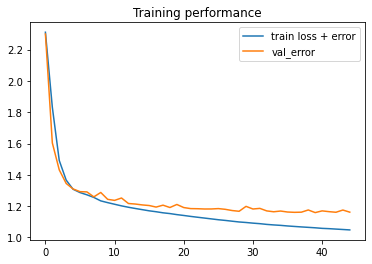

In [14]:
evaluationlib.show_loss_curves(history)

## Confusion matrix

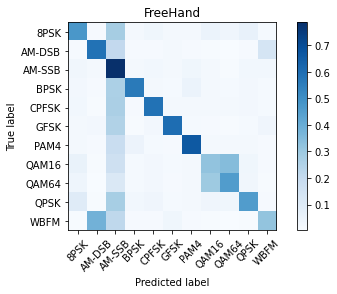

In [15]:
evaluationlib.plot_confusion_matrix(model, NEURAL_NETWORK_NAME, X_test, Y_test, BATCH_SIZE, classes)

## Confusion matrix for each SNR

Overall Accuracy:  0.08841010401188708


Overall Accuracy:  0.08909426987060998


Overall Accuracy:  0.09155178508306822


Overall Accuracy:  0.11419536191145467


Overall Accuracy:  0.14089595375722544


Overall Accuracy:  0.19692087361260294


Overall Accuracy:  0.2862773199570047


Overall Accuracy:  0.39789244186046513


Overall Accuracy:  0.49733759318423854


Overall Accuracy:  0.6279654924514737


Overall Accuracy:  0.7298474945533769


Overall Accuracy:  0.7847097006851785


Overall Accuracy:  0.8045540796963947


Overall Accuracy:  0.817910447761194


Overall Accuracy:  0.8209654178674352


Overall Accuracy:  0.8239154210718191


Overall Accuracy:  0.8126619770455387


Overall Accuracy:  0.822113576532531


Overall Accuracy:  0.8216654384672071


Overall Accuracy:  0.8207885304659498


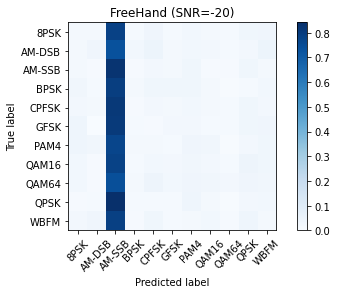

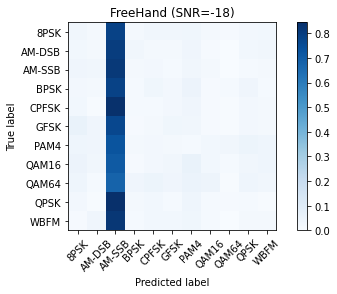

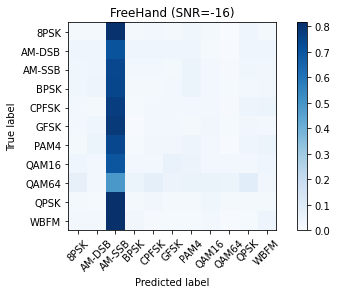

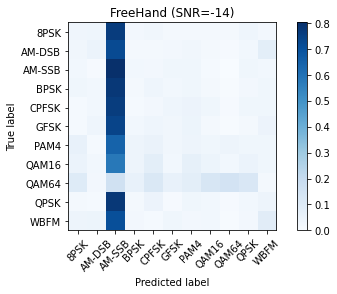

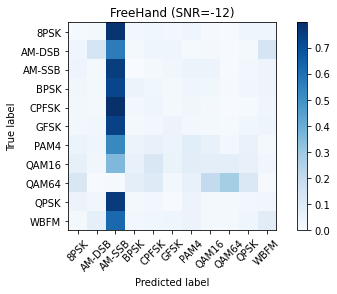

...

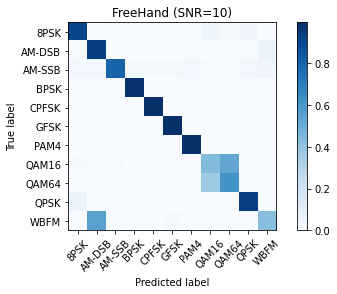

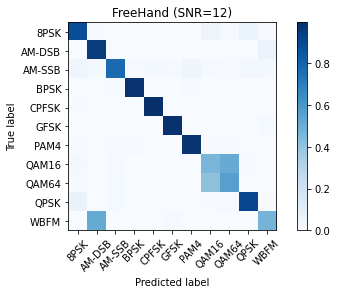

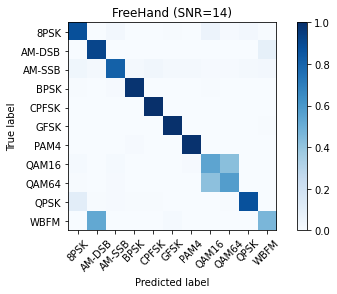

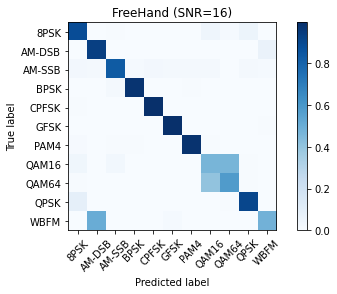

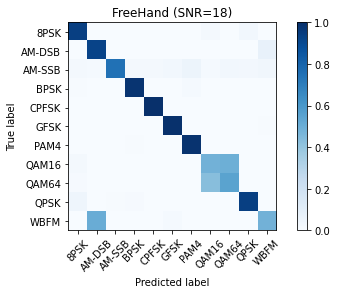

In [16]:
acc = evaluationlib.plot_confusion_matrix_each_snr(model, NEURAL_NETWORK_NAME, snrs, dataset_df, X_test, Y_test, test_index, classes)

## Accuracy performance

In [17]:
evaluationlib.accuracy_dataframe(acc)

,-20,-18,-16,-14,-12,-10,-8,-6,-4,-2,0,2,4,6,8,10,12,14,16,18
Accuracy %,8,8,9,11,14,19,28,39,49,62,72,78,80,81,82,82,81,82,82,82


In [18]:
import statistics

statistics.mean(acc.values())

0.5294836639923328

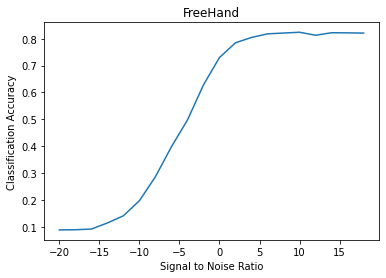

In [19]:
evaluationlib.accuracy_curve(snrs, acc, NEURAL_NETWORK_NAME)